# Models on single cleaned data

## Imports

In [1]:
import numpy as np
from utils_predictions_manipulation import*
from utils_nans_manipulation import*
from cross_validation import*
from utils_data_loading import*
from utils_features_manipulation import*
from time import time
from standardization import*

# Load data and structure data

In [2]:
traindata,_ = load_data('Data/train.csv')

In [3]:
X_total, Y_total = structure_data(traindata)

# Clean data

In [4]:
# Replacing undefined data with NaNs

X_nans = replace_bad_data_with_nans(X_total, -999)

In [5]:
X_clean,_ = replace_nans_with_median(X_nans, 0.5)

## Standardize

In [17]:
X_standardized = standardize_data(X_clean)

In [6]:
init = time()
X_poly = build_poly_multi(X_clean, 5)
print(time() - init) 

1.862473726272583


In [7]:
init = time()
X_poly_old = build_poly_multi_old(X_clean, 5)
print(time() - init) 

8.169878482818604


In [9]:
for i in range(X_poly.shape[1]):
    if (X_poly[:,i] != X_poly_old[:,i]).any():
        print(i)

In [63]:
init = time()
X_poly = build_poly_multi(X_clean, 5)
print(time() - init) 

8.088870763778687


In [67]:
X_poly.shape

(250000, 116)

# LPM

## Gradient Descent

### Simple

In [14]:
meanacc_dtest_gd = []
meanacc_dtrain_gd = []

from time import time

start = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='gd', gamma=0.00001, max_iters=10000)
meanacc_dtest_gd.append(dtmp_te)
meanacc_dtrain_gd.append(dtmp_tr)

end = time()

print(end - start)

Gradient Descent(0/9999): loss=63.61867617074175
Gradient Descent(1/9999): loss=14.383984108328583
Gradient Descent(2/9999): loss=3.4989715455153005
Gradient Descent(3/9999): loss=1.0674274106794246
Gradient Descent(4/9999): loss=0.5044245483082986
Gradient Descent(5/9999): loss=0.35842494029856814
Gradient Descent(6/9999): loss=0.30857570164923676
Gradient Descent(7/9999): loss=0.2832699694422193
Gradient Descent(8/9999): loss=0.26599896825935104
Gradient Descent(9/9999): loss=0.2525534003888348
Gradient Descent(10/9999): loss=0.24156164482619447
Gradient Descent(11/9999): loss=0.23237701456680873
Gradient Descent(12/9999): loss=0.2245898645124285
Gradient Descent(13/9999): loss=0.21790262333774946
Gradient Descent(14/9999): loss=0.21208871701365611
Gradient Descent(15/9999): loss=0.20697304069369982
Gradient Descent(16/9999): loss=0.20241955345835472
Gradient Descent(17/9999): loss=0.19832227988448284
Gradient Descent(18/9999): loss=0.19459848300939941
Gradient Descent(19/9999): loss

Gradient Descent(161/9999): loss=0.10962743942517754
Gradient Descent(162/9999): loss=0.10955989448078582
Gradient Descent(163/9999): loss=0.10949319580544485
Gradient Descent(164/9999): loss=0.10942732474773825
Gradient Descent(165/9999): loss=0.10936226324030199
Gradient Descent(166/9999): loss=0.10929799377908804
Gradient Descent(167/9999): loss=0.10923449940339647
Gradient Descent(168/9999): loss=0.109171763676646
Gradient Descent(169/9999): loss=0.1091097706678552
Gradient Descent(170/9999): loss=0.10904850493380876
Gradient Descent(171/9999): loss=0.10898795150188076
Gradient Descent(172/9999): loss=0.10892809585349258
Gradient Descent(173/9999): loss=0.1088689239081798
Gradient Descent(174/9999): loss=0.1088104220082461
Gradient Descent(175/9999): loss=0.1087525769039815
Gradient Descent(176/9999): loss=0.1086953757394243
Gradient Descent(177/9999): loss=0.10863880603864572
Gradient Descent(178/9999): loss=0.1085828556925382
Gradient Descent(179/9999): loss=0.10852751294608776
G

Gradient Descent(317/9999): loss=0.10414215921244627
Gradient Descent(318/9999): loss=0.10412441730743713
Gradient Descent(319/9999): loss=0.10410680147682344
Gradient Descent(320/9999): loss=0.10408931072439342
Gradient Descent(321/9999): loss=0.10407194406333775
Gradient Descent(322/9999): loss=0.10405470051611992
Gradient Descent(323/9999): loss=0.10403757911434963
Gradient Descent(324/9999): loss=0.10402057889865872
Gradient Descent(325/9999): loss=0.10400369891857998
Gradient Descent(326/9999): loss=0.10398693823242863
Gradient Descent(327/9999): loss=0.1039702959071861
Gradient Descent(328/9999): loss=0.1039537710183867
Gradient Descent(329/9999): loss=0.10393736265000643
Gradient Descent(330/9999): loss=0.10392106989435401
Gradient Descent(331/9999): loss=0.10390489185196472
Gradient Descent(332/9999): loss=0.10388882763149561
Gradient Descent(333/9999): loss=0.1038728763496238
Gradient Descent(334/9999): loss=0.10385703713094609
Gradient Descent(335/9999): loss=0.10384130910788

Gradient Descent(480/9999): loss=0.10239958574715742
Gradient Descent(481/9999): loss=0.10239368012131159
Gradient Descent(482/9999): loss=0.10238781198978097
Gradient Descent(483/9999): loss=0.1023819810853851
Gradient Descent(484/9999): loss=0.10237618714294609
Gradient Descent(485/9999): loss=0.10237042989927327
Gradient Descent(486/9999): loss=0.10236470909314727
Gradient Descent(487/9999): loss=0.10235902446530482
Gradient Descent(488/9999): loss=0.1023533757584232
Gradient Descent(489/9999): loss=0.10234776271710502
Gradient Descent(490/9999): loss=0.10234218508786327
Gradient Descent(491/9999): loss=0.1023366426191063
Gradient Descent(492/9999): loss=0.10233113506112294
Gradient Descent(493/9999): loss=0.10232566216606791
Gradient Descent(494/9999): loss=0.10232022368794699
Gradient Descent(495/9999): loss=0.10231481938260296
Gradient Descent(496/9999): loss=0.10230944900770075
Gradient Descent(497/9999): loss=0.10230411232271372
Gradient Descent(498/9999): loss=0.10229880908890

Gradient Descent(798/9999): loss=0.1015449837920882
Gradient Descent(799/9999): loss=0.10154391624457347
Gradient Descent(800/9999): loss=0.10154285317832326
Gradient Descent(801/9999): loss=0.10154179456598501
Gradient Descent(802/9999): loss=0.10154074038039122
Gradient Descent(803/9999): loss=0.10153969059455821
Gradient Descent(804/9999): loss=0.10153864518168476
Gradient Descent(805/9999): loss=0.10153760411515074
Gradient Descent(806/9999): loss=0.10153656736851585
Gradient Descent(807/9999): loss=0.10153553491551835
Gradient Descent(808/9999): loss=0.10153450673007382
Gradient Descent(809/9999): loss=0.10153348278627387
Gradient Descent(810/9999): loss=0.10153246305838466
Gradient Descent(811/9999): loss=0.10153144752084603
Gradient Descent(812/9999): loss=0.10153043614827005
Gradient Descent(813/9999): loss=0.10152942891543974
Gradient Descent(814/9999): loss=0.10152842579730795
Gradient Descent(815/9999): loss=0.10152742676899604
Gradient Descent(816/9999): loss=0.101526431805

Gradient Descent(956/9999): loss=0.10141802053568022
Gradient Descent(957/9999): loss=0.1014174142944102
Gradient Descent(958/9999): loss=0.1014168098503063
Gradient Descent(959/9999): loss=0.10141620719364532
Gradient Descent(960/9999): loss=0.10141560631476475
Gradient Descent(961/9999): loss=0.10141500720406246
Gradient Descent(962/9999): loss=0.1014144098519964
Gradient Descent(963/9999): loss=0.10141381424908398
Gradient Descent(964/9999): loss=0.10141322038590178
Gradient Descent(965/9999): loss=0.10141262825308527
Gradient Descent(966/9999): loss=0.10141203784132807
Gradient Descent(967/9999): loss=0.10141144914138184
Gradient Descent(968/9999): loss=0.10141086214405585
Gradient Descent(969/9999): loss=0.1014102768402165
Gradient Descent(970/9999): loss=0.10140969322078688
Gradient Descent(971/9999): loss=0.10140911127674669
Gradient Descent(972/9999): loss=0.1014085309991313
Gradient Descent(973/9999): loss=0.10140795237903205
Gradient Descent(974/9999): loss=0.1014073754075953

Gradient Descent(1264/9999): loss=0.10128497300320172
Gradient Descent(1265/9999): loss=0.10128464898420304
Gradient Descent(1266/9999): loss=0.10128432538164692
Gradient Descent(1267/9999): loss=0.10128400219381622
Gradient Descent(1268/9999): loss=0.10128367941900224
Gradient Descent(1269/9999): loss=0.10128335705550483
Gradient Descent(1270/9999): loss=0.10128303510163209
Gradient Descent(1271/9999): loss=0.1012827135557004
Gradient Descent(1272/9999): loss=0.10128239241603466
Gradient Descent(1273/9999): loss=0.10128207168096781
Gradient Descent(1274/9999): loss=0.10128175134884096
Gradient Descent(1275/9999): loss=0.10128143141800355
Gradient Descent(1276/9999): loss=0.10128111188681292
Gradient Descent(1277/9999): loss=0.10128079275363452
Gradient Descent(1278/9999): loss=0.10128047401684186
Gradient Descent(1279/9999): loss=0.10128015567481627
Gradient Descent(1280/9999): loss=0.10127983772594706
Gradient Descent(1281/9999): loss=0.10127952016863147
Gradient Descent(1282/9999): 

Gradient Descent(1420/9999): loss=0.10123856591670491
Gradient Descent(1421/9999): loss=0.10123829039166553
Gradient Descent(1422/9999): loss=0.1012380150933935
Gradient Descent(1423/9999): loss=0.10123774002105489
Gradient Descent(1424/9999): loss=0.10123746517381936
Gradient Descent(1425/9999): loss=0.10123719055086021
Gradient Descent(1426/9999): loss=0.10123691615135436
Gradient Descent(1427/9999): loss=0.10123664197448214
Gradient Descent(1428/9999): loss=0.10123636801942752
Gradient Descent(1429/9999): loss=0.10123609428537793
Gradient Descent(1430/9999): loss=0.10123582077152425
Gradient Descent(1431/9999): loss=0.10123554747706102
Gradient Descent(1432/9999): loss=0.10123527440118602
Gradient Descent(1433/9999): loss=0.10123500154310054
Gradient Descent(1434/9999): loss=0.10123472890200931
Gradient Descent(1435/9999): loss=0.1012344564771206
Gradient Descent(1436/9999): loss=0.10123418426764576
Gradient Descent(1437/9999): loss=0.10123391227279972
Gradient Descent(1438/9999): l

Gradient Descent(1573/9999): loss=0.10119862792215183
Gradient Descent(1574/9999): loss=0.10119837916092682
Gradient Descent(1575/9999): loss=0.10119813053197853
Gradient Descent(1576/9999): loss=0.10119788203486087
Gradient Descent(1577/9999): loss=0.10119763366912947
Gradient Descent(1578/9999): loss=0.10119738543434176
Gradient Descent(1579/9999): loss=0.10119713733005671
Gradient Descent(1580/9999): loss=0.10119688935583508
Gradient Descent(1581/9999): loss=0.1011966415112394
Gradient Descent(1582/9999): loss=0.10119639379583381
Gradient Descent(1583/9999): loss=0.10119614620918412
Gradient Descent(1584/9999): loss=0.10119589875085781
Gradient Descent(1585/9999): loss=0.10119565142042407
Gradient Descent(1586/9999): loss=0.10119540421745371
Gradient Descent(1587/9999): loss=0.10119515714151915
Gradient Descent(1588/9999): loss=0.10119491019219451
Gradient Descent(1589/9999): loss=0.10119466336905564
Gradient Descent(1590/9999): loss=0.10119441667167978
Gradient Descent(1591/9999): 

Gradient Descent(1884/9999): loss=0.10112594103276068
Gradient Descent(1885/9999): loss=0.10112571824121687
Gradient Descent(1886/9999): loss=0.10112549549925537
Gradient Descent(1887/9999): loss=0.10112527280673014
Gradient Descent(1888/9999): loss=0.1011250501634956
Gradient Descent(1889/9999): loss=0.10112482756940656
Gradient Descent(1890/9999): loss=0.10112460502431835
Gradient Descent(1891/9999): loss=0.10112438252808698
Gradient Descent(1892/9999): loss=0.10112416008056867
Gradient Descent(1893/9999): loss=0.10112393768162029
Gradient Descent(1894/9999): loss=0.10112371533109915
Gradient Descent(1895/9999): loss=0.10112349302886306
Gradient Descent(1896/9999): loss=0.10112327077477026
Gradient Descent(1897/9999): loss=0.10112304856867953
Gradient Descent(1898/9999): loss=0.10112282641045006
Gradient Descent(1899/9999): loss=0.10112260429994166
Gradient Descent(1900/9999): loss=0.10112238223701438
Gradient Descent(1901/9999): loss=0.10112216022152892
Gradient Descent(1902/9999): 

Gradient Descent(2038/9999): loss=0.10109213807445872
Gradient Descent(2039/9999): loss=0.10109192145593852
Gradient Descent(2040/9999): loss=0.10109170486938847
Gradient Descent(2041/9999): loss=0.10109148831472092
Gradient Descent(2042/9999): loss=0.10109127179184867
Gradient Descent(2043/9999): loss=0.10109105530068482
Gradient Descent(2044/9999): loss=0.10109083884114262
Gradient Descent(2045/9999): loss=0.10109062241313568
Gradient Descent(2046/9999): loss=0.10109040601657787
Gradient Descent(2047/9999): loss=0.10109018965138343
Gradient Descent(2048/9999): loss=0.10108997331746679
Gradient Descent(2049/9999): loss=0.10108975701474264
Gradient Descent(2050/9999): loss=0.101089540743126
Gradient Descent(2051/9999): loss=0.10108932450253214
Gradient Descent(2052/9999): loss=0.10108910829287668
Gradient Descent(2053/9999): loss=0.10108889211407539
Gradient Descent(2054/9999): loss=0.10108867596604444
Gradient Descent(2055/9999): loss=0.10108845984870021
Gradient Descent(2056/9999): l

Gradient Descent(2191/9999): loss=0.10105932165616585
Gradient Descent(2192/9999): loss=0.10105910905948522
Gradient Descent(2193/9999): loss=0.10105889648420932
Gradient Descent(2194/9999): loss=0.1010586839302848
Gradient Descent(2195/9999): loss=0.10105847139765858
Gradient Descent(2196/9999): loss=0.10105825888627773
Gradient Descent(2197/9999): loss=0.10105804639608948
Gradient Descent(2198/9999): loss=0.10105783392704117
Gradient Descent(2199/9999): loss=0.10105762147908051
Gradient Descent(2200/9999): loss=0.10105740905215511
Gradient Descent(2201/9999): loss=0.10105719664621289
Gradient Descent(2202/9999): loss=0.10105698426120192
Gradient Descent(2203/9999): loss=0.1010567718970705
Gradient Descent(2204/9999): loss=0.10105655955376701
Gradient Descent(2205/9999): loss=0.10105634723123998
Gradient Descent(2206/9999): loss=0.10105613492943816
Gradient Descent(2207/9999): loss=0.10105592264831043
Gradient Descent(2208/9999): loss=0.10105571038780592
Gradient Descent(2209/9999): l

Gradient Descent(2345/9999): loss=0.10102680563570601
Gradient Descent(2346/9999): loss=0.10102659579823804
Gradient Descent(2347/9999): loss=0.10102638597568726
Gradient Descent(2348/9999): loss=0.1010261761680211
Gradient Descent(2349/9999): loss=0.1010259663752071
Gradient Descent(2350/9999): loss=0.1010257565972129
Gradient Descent(2351/9999): loss=0.10102554683400626
Gradient Descent(2352/9999): loss=0.101025337085555
Gradient Descent(2353/9999): loss=0.10102512735182705
Gradient Descent(2354/9999): loss=0.10102491763279045
Gradient Descent(2355/9999): loss=0.10102470792841337
Gradient Descent(2356/9999): loss=0.10102449823866406
Gradient Descent(2357/9999): loss=0.10102428856351085
Gradient Descent(2358/9999): loss=0.10102407890292223
Gradient Descent(2359/9999): loss=0.10102386925686667
Gradient Descent(2360/9999): loss=0.10102365962531287
Gradient Descent(2361/9999): loss=0.10102345000822958
Gradient Descent(2362/9999): loss=0.10102324040558562
Gradient Descent(2363/9999): loss

Gradient Descent(2652/9999): loss=0.10096296189442622
Gradient Descent(2653/9999): loss=0.10096275549959852
Gradient Descent(2654/9999): loss=0.1009625491132785
Gradient Descent(2655/9999): loss=0.10096234273545367
Gradient Descent(2656/9999): loss=0.10096213636611177
Gradient Descent(2657/9999): loss=0.10096193000524048
Gradient Descent(2658/9999): loss=0.10096172365282756
Gradient Descent(2659/9999): loss=0.10096151730886069
Gradient Descent(2660/9999): loss=0.10096131097332776
Gradient Descent(2661/9999): loss=0.10096110464621663
Gradient Descent(2662/9999): loss=0.10096089832751515
Gradient Descent(2663/9999): loss=0.10096069201721122
Gradient Descent(2664/9999): loss=0.1009604857152929
Gradient Descent(2665/9999): loss=0.1009602794217481
Gradient Descent(2666/9999): loss=0.10096007313656488
Gradient Descent(2667/9999): loss=0.10095986685973134
Gradient Descent(2668/9999): loss=0.1009596605912356
Gradient Descent(2669/9999): loss=0.10095945433106576
Gradient Descent(2670/9999): los

Gradient Descent(2809/9999): loss=0.1009306551144146
Gradient Descent(2810/9999): loss=0.10093044992540261
Gradient Descent(2811/9999): loss=0.10093024474335871
Gradient Descent(2812/9999): loss=0.10093003956827534
Gradient Descent(2813/9999): loss=0.10092983440014495
Gradient Descent(2814/9999): loss=0.10092962923895993
Gradient Descent(2815/9999): loss=0.1009294240847128
Gradient Descent(2816/9999): loss=0.10092921893739598
Gradient Descent(2817/9999): loss=0.10092901379700205
Gradient Descent(2818/9999): loss=0.10092880866352358
Gradient Descent(2819/9999): loss=0.10092860353695313
Gradient Descent(2820/9999): loss=0.10092839841728322
Gradient Descent(2821/9999): loss=0.1009281933045065
Gradient Descent(2822/9999): loss=0.1009279881986156
Gradient Descent(2823/9999): loss=0.10092778309960322
Gradient Descent(2824/9999): loss=0.10092757800746197
Gradient Descent(2825/9999): loss=0.10092737292218461
Gradient Descent(2826/9999): loss=0.10092716784376385
Gradient Descent(2827/9999): los

Gradient Descent(2964/9999): loss=0.10089892985289972
Gradient Descent(2965/9999): loss=0.10089872566600126
Gradient Descent(2966/9999): loss=0.10089852148513333
Gradient Descent(2967/9999): loss=0.10089831731029131
Gradient Descent(2968/9999): loss=0.10089811314147028
Gradient Descent(2969/9999): loss=0.10089790897866582
Gradient Descent(2970/9999): loss=0.10089770482187309
Gradient Descent(2971/9999): loss=0.10089750067108745
Gradient Descent(2972/9999): loss=0.10089729652630432
Gradient Descent(2973/9999): loss=0.10089709238751896
Gradient Descent(2974/9999): loss=0.10089688825472685
Gradient Descent(2975/9999): loss=0.10089668412792337
Gradient Descent(2976/9999): loss=0.1008964800071039
Gradient Descent(2977/9999): loss=0.10089627589226395
Gradient Descent(2978/9999): loss=0.10089607178339878
Gradient Descent(2979/9999): loss=0.100895867680504
Gradient Descent(2980/9999): loss=0.10089566358357507
Gradient Descent(2981/9999): loss=0.10089545949260738
Gradient Descent(2982/9999): lo

Gradient Descent(3122/9999): loss=0.10086674040480682
Gradient Descent(3123/9999): loss=0.10086653712047448
Gradient Descent(3124/9999): loss=0.10086633384157977
Gradient Descent(3125/9999): loss=0.10086613056811976
Gradient Descent(3126/9999): loss=0.10086592730009153
Gradient Descent(3127/9999): loss=0.10086572403749217
Gradient Descent(3128/9999): loss=0.10086552078031878
Gradient Descent(3129/9999): loss=0.10086531752856848
Gradient Descent(3130/9999): loss=0.10086511428223835
Gradient Descent(3131/9999): loss=0.10086491104132558
Gradient Descent(3132/9999): loss=0.10086470780582726
Gradient Descent(3133/9999): loss=0.10086450457574056
Gradient Descent(3134/9999): loss=0.10086430135106263
Gradient Descent(3135/9999): loss=0.10086409813179058
Gradient Descent(3136/9999): loss=0.10086389491792162
Gradient Descent(3137/9999): loss=0.10086369170945293
Gradient Descent(3138/9999): loss=0.10086348850638173
Gradient Descent(3139/9999): loss=0.10086328530870511
Gradient Descent(3140/9999):

Gradient Descent(3282/9999): loss=0.10083428232693697
Gradient Descent(3283/9999): loss=0.1008340798806007
Gradient Descent(3284/9999): loss=0.1008338774393286
Gradient Descent(3285/9999): loss=0.10083367500311885
Gradient Descent(3286/9999): loss=0.10083347257196969
Gradient Descent(3287/9999): loss=0.10083327014587924
Gradient Descent(3288/9999): loss=0.10083306772484577
Gradient Descent(3289/9999): loss=0.10083286530886738
Gradient Descent(3290/9999): loss=0.10083266289794235
Gradient Descent(3291/9999): loss=0.10083246049206883
Gradient Descent(3292/9999): loss=0.10083225809124506
Gradient Descent(3293/9999): loss=0.10083205569546926
Gradient Descent(3294/9999): loss=0.1008318533047396
Gradient Descent(3295/9999): loss=0.10083165091905434
Gradient Descent(3296/9999): loss=0.10083144853841172
Gradient Descent(3297/9999): loss=0.10083124616280996
Gradient Descent(3298/9999): loss=0.1008310437922473
Gradient Descent(3299/9999): loss=0.10083084142672198
Gradient Descent(3300/9999): los

Gradient Descent(3437/9999): loss=0.10080296258518728
Gradient Descent(3438/9999): loss=0.10080276090485535
Gradient Descent(3439/9999): loss=0.10080255922935835
Gradient Descent(3440/9999): loss=0.10080235755869507
Gradient Descent(3441/9999): loss=0.1008021558928644
Gradient Descent(3442/9999): loss=0.10080195423186508
Gradient Descent(3443/9999): loss=0.100801752575696
Gradient Descent(3444/9999): loss=0.10080155092435601
Gradient Descent(3445/9999): loss=0.10080134927784391
Gradient Descent(3446/9999): loss=0.10080114763615852
Gradient Descent(3447/9999): loss=0.10080094599929873
Gradient Descent(3448/9999): loss=0.10080074436726336
Gradient Descent(3449/9999): loss=0.10080054274005125
Gradient Descent(3450/9999): loss=0.10080034111766129
Gradient Descent(3451/9999): loss=0.10080013950009231
Gradient Descent(3452/9999): loss=0.10079993788734315
Gradient Descent(3453/9999): loss=0.10079973627941267
Gradient Descent(3454/9999): loss=0.10079953467629982
Gradient Descent(3455/9999): lo

Gradient Descent(3590/9999): loss=0.10077216108936289
Gradient Descent(3591/9999): loss=0.10077196013674795
Gradient Descent(3592/9999): loss=0.10077175918881975
Gradient Descent(3593/9999): loss=0.10077155824557758
Gradient Descent(3594/9999): loss=0.10077135730702055
Gradient Descent(3595/9999): loss=0.10077115637314794
Gradient Descent(3596/9999): loss=0.10077095544395895
Gradient Descent(3597/9999): loss=0.1007707545194528
Gradient Descent(3598/9999): loss=0.10077055359962873
Gradient Descent(3599/9999): loss=0.10077035268448598
Gradient Descent(3600/9999): loss=0.10077015177402374
Gradient Descent(3601/9999): loss=0.10076995086824128
Gradient Descent(3602/9999): loss=0.10076974996713778
Gradient Descent(3603/9999): loss=0.10076954907071249
Gradient Descent(3604/9999): loss=0.10076934817896466
Gradient Descent(3605/9999): loss=0.10076914729189353
Gradient Descent(3606/9999): loss=0.10076894640949836
Gradient Descent(3607/9999): loss=0.10076874553177834
Gradient Descent(3608/9999): 

Gradient Descent(3744/9999): loss=0.10074126917330897
Gradient Descent(3745/9999): loss=0.1007410689342593
Gradient Descent(3746/9999): loss=0.10074086869979557
Gradient Descent(3747/9999): loss=0.10074066846991721
Gradient Descent(3748/9999): loss=0.10074046824462372
Gradient Descent(3749/9999): loss=0.1007402680239145
Gradient Descent(3750/9999): loss=0.10074006780778912
Gradient Descent(3751/9999): loss=0.10073986759624692
Gradient Descent(3752/9999): loss=0.10073966738928745
Gradient Descent(3753/9999): loss=0.10073946718691013
Gradient Descent(3754/9999): loss=0.10073926698911446
Gradient Descent(3755/9999): loss=0.10073906679589986
Gradient Descent(3756/9999): loss=0.10073886660726586
Gradient Descent(3757/9999): loss=0.10073866642321194
Gradient Descent(3758/9999): loss=0.10073846624373747
Gradient Descent(3759/9999): loss=0.10073826606884202
Gradient Descent(3760/9999): loss=0.10073806589852506
Gradient Descent(3761/9999): loss=0.10073786573278598
Gradient Descent(3762/9999): l

Gradient Descent(4052/9999): loss=0.10067981012811904
Gradient Descent(4053/9999): loss=0.10067961128070235
Gradient Descent(4054/9999): loss=0.10067941243774822
Gradient Descent(4055/9999): loss=0.10067921359925644
Gradient Descent(4056/9999): loss=0.10067901476522667
Gradient Descent(4057/9999): loss=0.10067881593565864
Gradient Descent(4058/9999): loss=0.10067861711055205
Gradient Descent(4059/9999): loss=0.10067841828990653
Gradient Descent(4060/9999): loss=0.10067821947372191
Gradient Descent(4061/9999): loss=0.10067802066199784
Gradient Descent(4062/9999): loss=0.10067782185473403
Gradient Descent(4063/9999): loss=0.10067762305193013
Gradient Descent(4064/9999): loss=0.10067742425358595
Gradient Descent(4065/9999): loss=0.10067722545970109
Gradient Descent(4066/9999): loss=0.10067702667027537
Gradient Descent(4067/9999): loss=0.10067682788530838
Gradient Descent(4068/9999): loss=0.10067662910479994
Gradient Descent(4069/9999): loss=0.10067643032874966
Gradient Descent(4070/9999):

Gradient Descent(4209/9999): loss=0.1006486455553961
Gradient Descent(4210/9999): loss=0.10064844740523786
Gradient Descent(4211/9999): loss=0.10064824925950061
Gradient Descent(4212/9999): loss=0.10064805111818398
Gradient Descent(4213/9999): loss=0.10064785298128785
Gradient Descent(4214/9999): loss=0.10064765484881191
Gradient Descent(4215/9999): loss=0.10064745672075594
Gradient Descent(4216/9999): loss=0.10064725859711969
Gradient Descent(4217/9999): loss=0.10064706047790296
Gradient Descent(4218/9999): loss=0.10064686236310551
Gradient Descent(4219/9999): loss=0.10064666425272707
Gradient Descent(4220/9999): loss=0.10064646614676741
Gradient Descent(4221/9999): loss=0.10064626804522636
Gradient Descent(4222/9999): loss=0.10064606994810354
Gradient Descent(4223/9999): loss=0.10064587185539892
Gradient Descent(4224/9999): loss=0.10064567376711205
Gradient Descent(4225/9999): loss=0.10064547568324286
Gradient Descent(4226/9999): loss=0.10064527760379098
Gradient Descent(4227/9999): 

Gradient Descent(4366/9999): loss=0.10061758997487757
Gradient Descent(4367/9999): loss=0.10061739251605006
Gradient Descent(4368/9999): loss=0.10061719506160907
Gradient Descent(4369/9999): loss=0.10061699761155442
Gradient Descent(4370/9999): loss=0.10061680016588596
Gradient Descent(4371/9999): loss=0.10061660272460349
Gradient Descent(4372/9999): loss=0.10061640528770675
Gradient Descent(4373/9999): loss=0.10061620785519557
Gradient Descent(4374/9999): loss=0.10061601042706968
Gradient Descent(4375/9999): loss=0.100615813003329
Gradient Descent(4376/9999): loss=0.10061561558397328
Gradient Descent(4377/9999): loss=0.10061541816900228
Gradient Descent(4378/9999): loss=0.10061522075841582
Gradient Descent(4379/9999): loss=0.10061502335221371
Gradient Descent(4380/9999): loss=0.10061482595039578
Gradient Descent(4381/9999): loss=0.10061462855296179
Gradient Descent(4382/9999): loss=0.10061443115991155
Gradient Descent(4383/9999): loss=0.1006142337712448
Gradient Descent(4384/9999): lo

Gradient Descent(4521/9999): loss=0.10058703609103155
Gradient Descent(4522/9999): loss=0.1005868393098073
Gradient Descent(4523/9999): loss=0.1005866425329402
Gradient Descent(4524/9999): loss=0.10058644576042998
Gradient Descent(4525/9999): loss=0.10058624899227647
Gradient Descent(4526/9999): loss=0.10058605222847955
Gradient Descent(4527/9999): loss=0.10058585546903896
Gradient Descent(4528/9999): loss=0.1005856587139546
Gradient Descent(4529/9999): loss=0.10058546196322622
Gradient Descent(4530/9999): loss=0.10058526521685372
Gradient Descent(4531/9999): loss=0.10058506847483688
Gradient Descent(4532/9999): loss=0.10058487173717548
Gradient Descent(4533/9999): loss=0.1005846750038694
Gradient Descent(4534/9999): loss=0.10058447827491845
Gradient Descent(4535/9999): loss=0.10058428155032242
Gradient Descent(4536/9999): loss=0.10058408483008117
Gradient Descent(4537/9999): loss=0.1005838881141945
Gradient Descent(4538/9999): loss=0.10058369140266224
Gradient Descent(4539/9999): loss

Gradient Descent(4681/9999): loss=0.10055560639966392
Gradient Descent(4682/9999): loss=0.10055541031335567
Gradient Descent(4683/9999): loss=0.10055521423137706
Gradient Descent(4684/9999): loss=0.10055501815372778
Gradient Descent(4685/9999): loss=0.1005548220804078
Gradient Descent(4686/9999): loss=0.10055462601141686
Gradient Descent(4687/9999): loss=0.10055442994675484
Gradient Descent(4688/9999): loss=0.10055423388642162
Gradient Descent(4689/9999): loss=0.10055403783041691
Gradient Descent(4690/9999): loss=0.10055384177874069
Gradient Descent(4691/9999): loss=0.10055364573139262
Gradient Descent(4692/9999): loss=0.10055344968837268
Gradient Descent(4693/9999): loss=0.10055325364968071
Gradient Descent(4694/9999): loss=0.10055305761531641
Gradient Descent(4695/9999): loss=0.10055286158527979
Gradient Descent(4696/9999): loss=0.10055266555957054
Gradient Descent(4697/9999): loss=0.10055246953818858
Gradient Descent(4698/9999): loss=0.1005522735211337
Gradient Descent(4699/9999): l

Gradient Descent(4836/9999): loss=0.10052526459623536
Gradient Descent(4837/9999): loss=0.10052506917907712
Gradient Descent(4838/9999): loss=0.10052487376622359
Gradient Descent(4839/9999): loss=0.10052467835767456
Gradient Descent(4840/9999): loss=0.10052448295342992
Gradient Descent(4841/9999): loss=0.10052428755348954
Gradient Descent(4842/9999): loss=0.10052409215785318
Gradient Descent(4843/9999): loss=0.10052389676652071
Gradient Descent(4844/9999): loss=0.10052370137949208
Gradient Descent(4845/9999): loss=0.10052350599676699
Gradient Descent(4846/9999): loss=0.10052331061834534
Gradient Descent(4847/9999): loss=0.100523115244227
Gradient Descent(4848/9999): loss=0.10052291987441178
Gradient Descent(4849/9999): loss=0.10052272450889954
Gradient Descent(4850/9999): loss=0.10052252914769011
Gradient Descent(4851/9999): loss=0.10052233379078336
Gradient Descent(4852/9999): loss=0.1005221384381791
Gradient Descent(4853/9999): loss=0.10052194308987719
Gradient Descent(4854/9999): lo

Gradient Descent(4991/9999): loss=0.10049502621905056
Gradient Descent(4992/9999): loss=0.10049483146727949
Gradient Descent(4993/9999): loss=0.10049463671978935
Gradient Descent(4994/9999): loss=0.10049444197658006
Gradient Descent(4995/9999): loss=0.10049424723765138
Gradient Descent(4996/9999): loss=0.10049405250300321
Gradient Descent(4997/9999): loss=0.1004938577726354
Gradient Descent(4998/9999): loss=0.10049366304654779
Gradient Descent(4999/9999): loss=0.10049346832474021
Gradient Descent(5000/9999): loss=0.10049327360721248
Gradient Descent(5001/9999): loss=0.10049307889396457
Gradient Descent(5002/9999): loss=0.10049288418499625
Gradient Descent(5003/9999): loss=0.10049268948030732
Gradient Descent(5004/9999): loss=0.10049249477989772
Gradient Descent(5005/9999): loss=0.10049230008376729
Gradient Descent(5006/9999): loss=0.10049210539191579
Gradient Descent(5007/9999): loss=0.10049191070434317
Gradient Descent(5008/9999): loss=0.10049171602104928
Gradient Descent(5009/9999): 

Gradient Descent(5148/9999): loss=0.10046450252102275
Gradient Descent(5149/9999): loss=0.10046430843953656
Gradient Descent(5150/9999): loss=0.10046411436230808
Gradient Descent(5151/9999): loss=0.10046392028933714
Gradient Descent(5152/9999): loss=0.10046372622062355
Gradient Descent(5153/9999): loss=0.1004635321561672
Gradient Descent(5154/9999): loss=0.10046333809596791
Gradient Descent(5155/9999): loss=0.1004631440400256
Gradient Descent(5156/9999): loss=0.10046294998834009
Gradient Descent(5157/9999): loss=0.10046275594091121
Gradient Descent(5158/9999): loss=0.10046256189773883
Gradient Descent(5159/9999): loss=0.10046236785882279
Gradient Descent(5160/9999): loss=0.10046217382416298
Gradient Descent(5161/9999): loss=0.10046197979375926
Gradient Descent(5162/9999): loss=0.10046178576761139
Gradient Descent(5163/9999): loss=0.10046159174571934
Gradient Descent(5164/9999): loss=0.10046139772808288
Gradient Descent(5165/9999): loss=0.10046120371470196
Gradient Descent(5166/9999): l

Gradient Descent(5303/9999): loss=0.10043447061738088
Gradient Descent(5304/9999): loss=0.1004342771940996
Gradient Descent(5305/9999): loss=0.1004340837750535
Gradient Descent(5306/9999): loss=0.10043389036024251
Gradient Descent(5307/9999): loss=0.10043369694966645
Gradient Descent(5308/9999): loss=0.10043350354332514
Gradient Descent(5309/9999): loss=0.10043331014121853
Gradient Descent(5310/9999): loss=0.10043311674334644
Gradient Descent(5311/9999): loss=0.10043292334970869
Gradient Descent(5312/9999): loss=0.10043272996030515
Gradient Descent(5313/9999): loss=0.10043253657513572
Gradient Descent(5314/9999): loss=0.10043234319420019
Gradient Descent(5315/9999): loss=0.10043214981749846
Gradient Descent(5316/9999): loss=0.10043195644503036
Gradient Descent(5317/9999): loss=0.10043176307679577
Gradient Descent(5318/9999): loss=0.10043156971279456
Gradient Descent(5319/9999): loss=0.10043137635302656
Gradient Descent(5320/9999): loss=0.10043118299749162
Gradient Descent(5321/9999): l

Gradient Descent(5462/9999): loss=0.10040376942038509
Gradient Descent(5463/9999): loss=0.10040357666871219
Gradient Descent(5464/9999): loss=0.10040338392125195
Gradient Descent(5465/9999): loss=0.10040319117800414
Gradient Descent(5466/9999): loss=0.10040299843896862
Gradient Descent(5467/9999): loss=0.10040280570414532
Gradient Descent(5468/9999): loss=0.10040261297353406
Gradient Descent(5469/9999): loss=0.10040242024713461
Gradient Descent(5470/9999): loss=0.10040222752494699
Gradient Descent(5471/9999): loss=0.10040203480697099
Gradient Descent(5472/9999): loss=0.10040184209320639
Gradient Descent(5473/9999): loss=0.10040164938365317
Gradient Descent(5474/9999): loss=0.10040145667831109
Gradient Descent(5475/9999): loss=0.1004012639771801
Gradient Descent(5476/9999): loss=0.10040107128025999
Gradient Descent(5477/9999): loss=0.10040087858755067
Gradient Descent(5478/9999): loss=0.10040068589905195
Gradient Descent(5479/9999): loss=0.1004004932147637
Gradient Descent(5480/9999): l

Gradient Descent(5616/9999): loss=0.10037413520734037
Gradient Descent(5617/9999): loss=0.10037394310275063
Gradient Descent(5618/9999): loss=0.1003737510023519
Gradient Descent(5619/9999): loss=0.10037355890614395
Gradient Descent(5620/9999): loss=0.10037336681412679
Gradient Descent(5621/9999): loss=0.10037317472630015
Gradient Descent(5622/9999): loss=0.10037298264266395
Gradient Descent(5623/9999): loss=0.10037279056321802
Gradient Descent(5624/9999): loss=0.10037259848796228
Gradient Descent(5625/9999): loss=0.10037240641689647
Gradient Descent(5626/9999): loss=0.10037221435002057
Gradient Descent(5627/9999): loss=0.1003720222873344
Gradient Descent(5628/9999): loss=0.10037183022883783
Gradient Descent(5629/9999): loss=0.10037163817453072
Gradient Descent(5630/9999): loss=0.10037144612441287
Gradient Descent(5631/9999): loss=0.10037125407848421
Gradient Descent(5632/9999): loss=0.10037106203674459
Gradient Descent(5633/9999): loss=0.10037086999919384
Gradient Descent(5634/9999): l

Gradient Descent(5771/9999): loss=0.10034440893061758
Gradient Descent(5772/9999): loss=0.10034421747397095
Gradient Descent(5773/9999): loss=0.10034402602149381
Gradient Descent(5774/9999): loss=0.10034383457318598
Gradient Descent(5775/9999): loss=0.10034364312904738
Gradient Descent(5776/9999): loss=0.10034345168907781
Gradient Descent(5777/9999): loss=0.10034326025327718
Gradient Descent(5778/9999): loss=0.10034306882164534
Gradient Descent(5779/9999): loss=0.10034287739418209
Gradient Descent(5780/9999): loss=0.1003426859708874
Gradient Descent(5781/9999): loss=0.10034249455176107
Gradient Descent(5782/9999): loss=0.10034230313680294
Gradient Descent(5783/9999): loss=0.10034211172601296
Gradient Descent(5784/9999): loss=0.10034192031939089
Gradient Descent(5785/9999): loss=0.10034172891693663
Gradient Descent(5786/9999): loss=0.10034153751865008
Gradient Descent(5787/9999): loss=0.10034134612453102
Gradient Descent(5788/9999): loss=0.10034115473457941
Gradient Descent(5789/9999): 

Gradient Descent(5930/9999): loss=0.10031401960600507
Gradient Descent(5931/9999): loss=0.10031382881057586
Gradient Descent(5932/9999): loss=0.10031363801929429
Gradient Descent(5933/9999): loss=0.1003134472321602
Gradient Descent(5934/9999): loss=0.10031325644917348
Gradient Descent(5935/9999): loss=0.10031306567033396
Gradient Descent(5936/9999): loss=0.1003128748956415
Gradient Descent(5937/9999): loss=0.10031268412509602
Gradient Descent(5938/9999): loss=0.10031249335869734
Gradient Descent(5939/9999): loss=0.10031230259644532
Gradient Descent(5940/9999): loss=0.1003121118383398
Gradient Descent(5941/9999): loss=0.10031192108438071
Gradient Descent(5942/9999): loss=0.10031173033456789
Gradient Descent(5943/9999): loss=0.10031153958890116
Gradient Descent(5944/9999): loss=0.10031134884738045
Gradient Descent(5945/9999): loss=0.10031115811000554
Gradient Descent(5946/9999): loss=0.10031096737677639
Gradient Descent(5947/9999): loss=0.10031077664769278
Gradient Descent(5948/9999): lo

Gradient Descent(6086/9999): loss=0.10028430557916017
Gradient Descent(6087/9999): loss=0.10028411542911209
Gradient Descent(6088/9999): loss=0.10028392528319037
Gradient Descent(6089/9999): loss=0.10028373514139495
Gradient Descent(6090/9999): loss=0.10028354500372562
Gradient Descent(6091/9999): loss=0.1002833548701823
Gradient Descent(6092/9999): loss=0.10028316474076479
Gradient Descent(6093/9999): loss=0.100282974615473
Gradient Descent(6094/9999): loss=0.10028278449430679
Gradient Descent(6095/9999): loss=0.10028259437726601
Gradient Descent(6096/9999): loss=0.10028240426435053
Gradient Descent(6097/9999): loss=0.10028221415556023
Gradient Descent(6098/9999): loss=0.10028202405089492
Gradient Descent(6099/9999): loss=0.10028183395035456
Gradient Descent(6100/9999): loss=0.10028164385393892
Gradient Descent(6101/9999): loss=0.10028145376164792
Gradient Descent(6102/9999): loss=0.10028126367348139
Gradient Descent(6103/9999): loss=0.10028107358943925
Gradient Descent(6104/9999): lo

Gradient Descent(6241/9999): loss=0.10025488148777865
Gradient Descent(6242/9999): loss=0.10025469197570688
Gradient Descent(6243/9999): loss=0.10025450246774052
Gradient Descent(6244/9999): loss=0.10025431296387956
Gradient Descent(6245/9999): loss=0.10025412346412374
Gradient Descent(6246/9999): loss=0.10025393396847301
Gradient Descent(6247/9999): loss=0.10025374447692716
Gradient Descent(6248/9999): loss=0.10025355498948614
Gradient Descent(6249/9999): loss=0.10025336550614973
Gradient Descent(6250/9999): loss=0.10025317602691786
Gradient Descent(6251/9999): loss=0.10025298655179042
Gradient Descent(6252/9999): loss=0.10025279708076719
Gradient Descent(6253/9999): loss=0.10025260761384804
Gradient Descent(6254/9999): loss=0.10025241815103296
Gradient Descent(6255/9999): loss=0.10025222869232164
Gradient Descent(6256/9999): loss=0.10025203923771406
Gradient Descent(6257/9999): loss=0.10025184978721008
Gradient Descent(6258/9999): loss=0.10025166034080951
Gradient Descent(6259/9999):

Gradient Descent(6397/9999): loss=0.1002253671563093
Gradient Descent(6398/9999): loss=0.10022517828306797
Gradient Descent(6399/9999): loss=0.10022498941391123
Gradient Descent(6400/9999): loss=0.10022480054883892
Gradient Descent(6401/9999): loss=0.1002246116878509
Gradient Descent(6402/9999): loss=0.10022442283094705
Gradient Descent(6403/9999): loss=0.10022423397812724
Gradient Descent(6404/9999): loss=0.10022404512939134
Gradient Descent(6405/9999): loss=0.10022385628473918
Gradient Descent(6406/9999): loss=0.10022366744417069
Gradient Descent(6407/9999): loss=0.10022347860768566
Gradient Descent(6408/9999): loss=0.10022328977528405
Gradient Descent(6409/9999): loss=0.10022310094696564
Gradient Descent(6410/9999): loss=0.10022291212273034
Gradient Descent(6411/9999): loss=0.10022272330257799
Gradient Descent(6412/9999): loss=0.1002225344865085
Gradient Descent(6413/9999): loss=0.10022234567452172
Gradient Descent(6414/9999): loss=0.10022215686661748
Gradient Descent(6415/9999): lo

Gradient Descent(6551/9999): loss=0.10019632871797679
Gradient Descent(6552/9999): loss=0.10019614047219154
Gradient Descent(6553/9999): loss=0.1001959522304704
Gradient Descent(6554/9999): loss=0.10019576399281324
Gradient Descent(6555/9999): loss=0.10019557575921993
Gradient Descent(6556/9999): loss=0.10019538752969032
Gradient Descent(6557/9999): loss=0.10019519930422428
Gradient Descent(6558/9999): loss=0.1001950110828217
Gradient Descent(6559/9999): loss=0.10019482286548242
Gradient Descent(6560/9999): loss=0.10019463465220632
Gradient Descent(6561/9999): loss=0.10019444644299326
Gradient Descent(6562/9999): loss=0.10019425823784311
Gradient Descent(6563/9999): loss=0.10019407003675576
Gradient Descent(6564/9999): loss=0.10019388183973105
Gradient Descent(6565/9999): loss=0.10019369364676886
Gradient Descent(6566/9999): loss=0.10019350545786908
Gradient Descent(6567/9999): loss=0.10019331727303153
Gradient Descent(6568/9999): loss=0.10019312909225607
Gradient Descent(6569/9999): l

Gradient Descent(6705/9999): loss=0.10016738666741655
Gradient Descent(6706/9999): loss=0.10016719904594808
Gradient Descent(6707/9999): loss=0.10016701142852345
Gradient Descent(6708/9999): loss=0.10016682381514244
Gradient Descent(6709/9999): loss=0.10016663620580502
Gradient Descent(6710/9999): loss=0.10016644860051095
Gradient Descent(6711/9999): loss=0.1001662609992602
Gradient Descent(6712/9999): loss=0.10016607340205257
Gradient Descent(6713/9999): loss=0.10016588580888797
Gradient Descent(6714/9999): loss=0.1001656982197662
Gradient Descent(6715/9999): loss=0.10016551063468719
Gradient Descent(6716/9999): loss=0.10016532305365085
Gradient Descent(6717/9999): loss=0.10016513547665692
Gradient Descent(6718/9999): loss=0.10016494790370545
Gradient Descent(6719/9999): loss=0.1001647603347961
Gradient Descent(6720/9999): loss=0.10016457276992888
Gradient Descent(6721/9999): loss=0.10016438520910363
Gradient Descent(6722/9999): loss=0.10016419765232018
Gradient Descent(6723/9999): lo

Gradient Descent(6859/9999): loss=0.10013854052300179
Gradient Descent(6860/9999): loss=0.10013835352273463
Gradient Descent(6861/9999): loss=0.10013816652649106
Gradient Descent(6862/9999): loss=0.10013797953427102
Gradient Descent(6863/9999): loss=0.10013779254607437
Gradient Descent(6864/9999): loss=0.10013760556190097
Gradient Descent(6865/9999): loss=0.10013741858175072
Gradient Descent(6866/9999): loss=0.10013723160562346
Gradient Descent(6867/9999): loss=0.10013704463351902
Gradient Descent(6868/9999): loss=0.10013685766543737
Gradient Descent(6869/9999): loss=0.10013667070137826
Gradient Descent(6870/9999): loss=0.10013648374134167
Gradient Descent(6871/9999): loss=0.10013629678532739
Gradient Descent(6872/9999): loss=0.1001361098333353
Gradient Descent(6873/9999): loss=0.10013592288536535
Gradient Descent(6874/9999): loss=0.10013573594141731
Gradient Descent(6875/9999): loss=0.10013554900149113
Gradient Descent(6876/9999): loss=0.10013536206558661
Gradient Descent(6877/9999): 

Gradient Descent(7011/9999): loss=0.10011016258306016
Gradient Descent(7012/9999): loss=0.10010997619289441
Gradient Descent(7013/9999): loss=0.10010978980673252
Gradient Descent(7014/9999): loss=0.10010960342457441
Gradient Descent(7015/9999): loss=0.10010941704641994
Gradient Descent(7016/9999): loss=0.10010923067226901
Gradient Descent(7017/9999): loss=0.10010904430212145
Gradient Descent(7018/9999): loss=0.10010885793597711
Gradient Descent(7019/9999): loss=0.1001086715738359
Gradient Descent(7020/9999): loss=0.10010848521569773
Gradient Descent(7021/9999): loss=0.10010829886156239
Gradient Descent(7022/9999): loss=0.10010811251142979
Gradient Descent(7023/9999): loss=0.1001079261652998
Gradient Descent(7024/9999): loss=0.1001077398231723
Gradient Descent(7025/9999): loss=0.10010755348504712
Gradient Descent(7026/9999): loss=0.10010736715092416
Gradient Descent(7027/9999): loss=0.10010718082080329
Gradient Descent(7028/9999): loss=0.10010699449468441
Gradient Descent(7029/9999): lo

Gradient Descent(7166/9999): loss=0.1000813198152803
Gradient Descent(7167/9999): loss=0.10008113404417822
Gradient Descent(7168/9999): loss=0.10008094827706004
Gradient Descent(7169/9999): loss=0.10008076251392566
Gradient Descent(7170/9999): loss=0.10008057675477496
Gradient Descent(7171/9999): loss=0.10008039099960772
Gradient Descent(7172/9999): loss=0.10008020524842391
Gradient Descent(7173/9999): loss=0.10008001950122339
Gradient Descent(7174/9999): loss=0.10007983375800601
Gradient Descent(7175/9999): loss=0.10007964801877164
Gradient Descent(7176/9999): loss=0.1000794622835201
Gradient Descent(7177/9999): loss=0.1000792765522514
Gradient Descent(7178/9999): loss=0.10007909082496529
Gradient Descent(7179/9999): loss=0.10007890510166169
Gradient Descent(7180/9999): loss=0.10007871938234048
Gradient Descent(7181/9999): loss=0.10007853366700152
Gradient Descent(7182/9999): loss=0.10007834795564463
Gradient Descent(7183/9999): loss=0.10007816224826978
Gradient Descent(7184/9999): lo

Gradient Descent(7470/9999): loss=0.1000250282900091
Gradient Descent(7471/9999): loss=0.1000248437241295
Gradient Descent(7472/9999): loss=0.10002465916219505
Gradient Descent(7473/9999): loss=0.10002447460420558
Gradient Descent(7474/9999): loss=0.10002429005016102
Gradient Descent(7475/9999): loss=0.10002410550006124
Gradient Descent(7476/9999): loss=0.10002392095390608
Gradient Descent(7477/9999): loss=0.10002373641169544
Gradient Descent(7478/9999): loss=0.10002355187342925
Gradient Descent(7479/9999): loss=0.10002336733910723
Gradient Descent(7480/9999): loss=0.10002318280872935
Gradient Descent(7481/9999): loss=0.10002299828229555
Gradient Descent(7482/9999): loss=0.1000228137598056
Gradient Descent(7483/9999): loss=0.1000226292412594
Gradient Descent(7484/9999): loss=0.10002244472665683
Gradient Descent(7485/9999): loss=0.10002226021599779
Gradient Descent(7486/9999): loss=0.10002207570928204
Gradient Descent(7487/9999): loss=0.1000218912065096
Gradient Descent(7488/9999): loss

Gradient Descent(7623/9999): loss=0.09999683551064385
Gradient Descent(7624/9999): loss=0.09999665154690332
Gradient Descent(7625/9999): loss=0.09999646758708862
Gradient Descent(7626/9999): loss=0.09999628363119967
Gradient Descent(7627/9999): loss=0.09999609967923634
Gradient Descent(7628/9999): loss=0.09999591573119841
Gradient Descent(7629/9999): loss=0.09999573178708589
Gradient Descent(7630/9999): loss=0.0999955478468986
Gradient Descent(7631/9999): loss=0.09999536391063636
Gradient Descent(7632/9999): loss=0.09999517997829907
Gradient Descent(7633/9999): loss=0.09999499604988668
Gradient Descent(7634/9999): loss=0.09999481212539899
Gradient Descent(7635/9999): loss=0.09999462820483587
Gradient Descent(7636/9999): loss=0.09999444428819723
Gradient Descent(7637/9999): loss=0.09999426037548297
Gradient Descent(7638/9999): loss=0.09999407646669287
Gradient Descent(7639/9999): loss=0.09999389256182688
Gradient Descent(7640/9999): loss=0.09999370866088488
Gradient Descent(7641/9999): 

Gradient Descent(7778/9999): loss=0.09996836790951544
Gradient Descent(7779/9999): loss=0.09996818455278526
Gradient Descent(7780/9999): loss=0.09996800119996155
Gradient Descent(7781/9999): loss=0.09996781785104417
Gradient Descent(7782/9999): loss=0.09996763450603295
Gradient Descent(7783/9999): loss=0.09996745116492782
Gradient Descent(7784/9999): loss=0.0999672678277286
Gradient Descent(7785/9999): loss=0.09996708449443527
Gradient Descent(7786/9999): loss=0.09996690116504758
Gradient Descent(7787/9999): loss=0.09996671783956546
Gradient Descent(7788/9999): loss=0.0999665345179888
Gradient Descent(7789/9999): loss=0.09996635120031747
Gradient Descent(7790/9999): loss=0.0999661678865513
Gradient Descent(7791/9999): loss=0.09996598457669024
Gradient Descent(7792/9999): loss=0.09996580127073407
Gradient Descent(7793/9999): loss=0.09996561796868278
Gradient Descent(7794/9999): loss=0.09996543467053612
Gradient Descent(7795/9999): loss=0.0999652513762941
Gradient Descent(7796/9999): los

Gradient Descent(7934/9999): loss=0.0999398114112135
Gradient Descent(7935/9999): loss=0.09993962866238376
Gradient Descent(7936/9999): loss=0.09993944591744112
Gradient Descent(7937/9999): loss=0.09993926317638537
Gradient Descent(7938/9999): loss=0.0999390804392164
Gradient Descent(7939/9999): loss=0.09993889770593417
Gradient Descent(7940/9999): loss=0.09993871497653846
Gradient Descent(7941/9999): loss=0.0999385322510292
Gradient Descent(7942/9999): loss=0.09993834952940624
Gradient Descent(7943/9999): loss=0.09993816681166943
Gradient Descent(7944/9999): loss=0.09993798409781873
Gradient Descent(7945/9999): loss=0.09993780138785398
Gradient Descent(7946/9999): loss=0.09993761868177502
Gradient Descent(7947/9999): loss=0.09993743597958177
Gradient Descent(7948/9999): loss=0.09993725328127405
Gradient Descent(7949/9999): loss=0.09993707058685182
Gradient Descent(7950/9999): loss=0.09993688789631489
Gradient Descent(7951/9999): loss=0.09993670520966313
Gradient Descent(7952/9999): lo

Gradient Descent(8089/9999): loss=0.09991153165935306
Gradient Descent(8090/9999): loss=0.09991134951154237
Gradient Descent(8091/9999): loss=0.0999111673675996
Gradient Descent(8092/9999): loss=0.09991098522752459
Gradient Descent(8093/9999): loss=0.09991080309131734
Gradient Descent(8094/9999): loss=0.0999106209589776
Gradient Descent(8095/9999): loss=0.0999104388305053
Gradient Descent(8096/9999): loss=0.09991025670590037
Gradient Descent(8097/9999): loss=0.09991007458516254
Gradient Descent(8098/9999): loss=0.09990989246829186
Gradient Descent(8099/9999): loss=0.0999097103552881
Gradient Descent(8100/9999): loss=0.09990952824615115
Gradient Descent(8101/9999): loss=0.09990934614088091
Gradient Descent(8102/9999): loss=0.09990916403947726
Gradient Descent(8103/9999): loss=0.09990898194194009
Gradient Descent(8104/9999): loss=0.09990879984826921
Gradient Descent(8105/9999): loss=0.09990861775846456
Gradient Descent(8106/9999): loss=0.09990843567252601
Gradient Descent(8107/9999): los

Gradient Descent(8242/9999): loss=0.09988370794880487
Gradient Descent(8243/9999): loss=0.09988352639136178
Gradient Descent(8244/9999): loss=0.09988334483776791
Gradient Descent(8245/9999): loss=0.09988316328802305
Gradient Descent(8246/9999): loss=0.09988298174212716
Gradient Descent(8247/9999): loss=0.09988280020008009
Gradient Descent(8248/9999): loss=0.09988261866188172
Gradient Descent(8249/9999): loss=0.09988243712753199
Gradient Descent(8250/9999): loss=0.09988225559703062
Gradient Descent(8251/9999): loss=0.09988207407037765
Gradient Descent(8252/9999): loss=0.09988189254757292
Gradient Descent(8253/9999): loss=0.09988171102861626
Gradient Descent(8254/9999): loss=0.09988152951350758
Gradient Descent(8255/9999): loss=0.09988134800224671
Gradient Descent(8256/9999): loss=0.09988116649483361
Gradient Descent(8257/9999): loss=0.09988098499126812
Gradient Descent(8258/9999): loss=0.0998808034915501
Gradient Descent(8259/9999): loss=0.09988062199567947
Gradient Descent(8260/9999): 

Gradient Descent(8397/9999): loss=0.0998556124111007
Gradient Descent(8398/9999): loss=0.09985543144882969
Gradient Descent(8399/9999): loss=0.09985525049038897
Gradient Descent(8400/9999): loss=0.09985506953577848
Gradient Descent(8401/9999): loss=0.09985488858499812
Gradient Descent(8402/9999): loss=0.09985470763804773
Gradient Descent(8403/9999): loss=0.09985452669492721
Gradient Descent(8404/9999): loss=0.09985434575563643
Gradient Descent(8405/9999): loss=0.09985416482017527
Gradient Descent(8406/9999): loss=0.09985398388854362
Gradient Descent(8407/9999): loss=0.09985380296074135
Gradient Descent(8408/9999): loss=0.09985362203676831
Gradient Descent(8409/9999): loss=0.09985344111662442
Gradient Descent(8410/9999): loss=0.09985326020030957
Gradient Descent(8411/9999): loss=0.09985307928782357
Gradient Descent(8412/9999): loss=0.09985289837916637
Gradient Descent(8413/9999): loss=0.09985271747433787
Gradient Descent(8414/9999): loss=0.09985253657333781
Gradient Descent(8415/9999): 

Gradient Descent(8555/9999): loss=0.0998270678020972
Gradient Descent(8556/9999): loss=0.09982688744352244
Gradient Descent(8557/9999): loss=0.09982670708875888
Gradient Descent(8558/9999): loss=0.09982652673780652
Gradient Descent(8559/9999): loss=0.09982634639066518
Gradient Descent(8560/9999): loss=0.09982616604733478
Gradient Descent(8561/9999): loss=0.09982598570781516
Gradient Descent(8562/9999): loss=0.09982580537210624
Gradient Descent(8563/9999): loss=0.09982562504020788
Gradient Descent(8564/9999): loss=0.09982544471211989
Gradient Descent(8565/9999): loss=0.09982526438784228
Gradient Descent(8566/9999): loss=0.09982508406737485
Gradient Descent(8567/9999): loss=0.09982490375071752
Gradient Descent(8568/9999): loss=0.09982472343787013
Gradient Descent(8569/9999): loss=0.09982454312883257
Gradient Descent(8570/9999): loss=0.09982436282360477
Gradient Descent(8571/9999): loss=0.09982418252218654
Gradient Descent(8572/9999): loss=0.09982400222457778
Gradient Descent(8573/9999): 

Gradient Descent(8715/9999): loss=0.09979825882920879
Gradient Descent(8716/9999): loss=0.09979807907891318
Gradient Descent(8717/9999): loss=0.09979789933240966
Gradient Descent(8718/9999): loss=0.09979771958969814
Gradient Descent(8719/9999): loss=0.09979753985077852
Gradient Descent(8720/9999): loss=0.09979736011565066
Gradient Descent(8721/9999): loss=0.09979718038431439
Gradient Descent(8722/9999): loss=0.0997970006567697
Gradient Descent(8723/9999): loss=0.09979682093301641
Gradient Descent(8724/9999): loss=0.09979664121305434
Gradient Descent(8725/9999): loss=0.09979646149688345
Gradient Descent(8726/9999): loss=0.09979628178450364
Gradient Descent(8727/9999): loss=0.09979610207591472
Gradient Descent(8728/9999): loss=0.09979592237111658
Gradient Descent(8729/9999): loss=0.09979574267010917
Gradient Descent(8730/9999): loss=0.09979556297289227
Gradient Descent(8731/9999): loss=0.09979538327946584
Gradient Descent(8732/9999): loss=0.09979520358982975
Gradient Descent(8733/9999): 

Gradient Descent(8874/9999): loss=0.09976972608665768
Gradient Descent(8875/9999): loss=0.09976954693781306
Gradient Descent(8876/9999): loss=0.09976936779274166
Gradient Descent(8877/9999): loss=0.09976918865144334
Gradient Descent(8878/9999): loss=0.09976900951391802
Gradient Descent(8879/9999): loss=0.09976883038016554
Gradient Descent(8880/9999): loss=0.09976865125018577
Gradient Descent(8881/9999): loss=0.09976847212397866
Gradient Descent(8882/9999): loss=0.09976829300154406
Gradient Descent(8883/9999): loss=0.09976811388288179
Gradient Descent(8884/9999): loss=0.09976793476799185
Gradient Descent(8885/9999): loss=0.09976775565687399
Gradient Descent(8886/9999): loss=0.09976757654952817
Gradient Descent(8887/9999): loss=0.09976739744595427
Gradient Descent(8888/9999): loss=0.09976721834615217
Gradient Descent(8889/9999): loss=0.09976703925012172
Gradient Descent(8890/9999): loss=0.09976686015786285
Gradient Descent(8891/9999): loss=0.0997666810693754
Gradient Descent(8892/9999): 

Gradient Descent(9032/9999): loss=0.09974146729210123
Gradient Descent(9033/9999): loss=0.09974128873795862
Gradient Descent(9034/9999): loss=0.09974111018757056
Gradient Descent(9035/9999): loss=0.09974093164093696
Gradient Descent(9036/9999): loss=0.09974075309805767
Gradient Descent(9037/9999): loss=0.09974057455893265
Gradient Descent(9038/9999): loss=0.09974039602356169
Gradient Descent(9039/9999): loss=0.09974021749194471
Gradient Descent(9040/9999): loss=0.09974003896408155
Gradient Descent(9041/9999): loss=0.0997398604399722
Gradient Descent(9042/9999): loss=0.09973968191961641
Gradient Descent(9043/9999): loss=0.09973950340301421
Gradient Descent(9044/9999): loss=0.09973932489016536
Gradient Descent(9045/9999): loss=0.09973914638106979
Gradient Descent(9046/9999): loss=0.09973896787572738
Gradient Descent(9047/9999): loss=0.09973878937413799
Gradient Descent(9048/9999): loss=0.09973861087630152
Gradient Descent(9049/9999): loss=0.09973843238221786
Gradient Descent(9050/9999): 

Gradient Descent(9185/9999): loss=0.09971419209769758
Gradient Descent(9186/9999): loss=0.09971401411663987
Gradient Descent(9187/9999): loss=0.0997138361393188
Gradient Descent(9188/9999): loss=0.0997136581657343
Gradient Descent(9189/9999): loss=0.09971348019588619
Gradient Descent(9190/9999): loss=0.09971330222977431
Gradient Descent(9191/9999): loss=0.09971312426739867
Gradient Descent(9192/9999): loss=0.0997129463087591
Gradient Descent(9193/9999): loss=0.09971276835385545
Gradient Descent(9194/9999): loss=0.09971259040268762
Gradient Descent(9195/9999): loss=0.0997124124552555
Gradient Descent(9196/9999): loss=0.09971223451155897
Gradient Descent(9197/9999): loss=0.09971205657159796
Gradient Descent(9198/9999): loss=0.09971187863537224
Gradient Descent(9199/9999): loss=0.09971170070288181
Gradient Descent(9200/9999): loss=0.0997115227741265
Gradient Descent(9201/9999): loss=0.09971134484910621
Gradient Descent(9202/9999): loss=0.09971116692782075
Gradient Descent(9203/9999): loss

Gradient Descent(9341/9999): loss=0.0996864721564039
Gradient Descent(9342/9999): loss=0.09968629475685475
Gradient Descent(9343/9999): loss=0.09968611736102413
Gradient Descent(9344/9999): loss=0.09968593996891185
Gradient Descent(9345/9999): loss=0.0996857625805179
Gradient Descent(9346/9999): loss=0.09968558519584204
Gradient Descent(9347/9999): loss=0.09968540781488429
Gradient Descent(9348/9999): loss=0.0996852304376444
Gradient Descent(9349/9999): loss=0.09968505306412236
Gradient Descent(9350/9999): loss=0.09968487569431797
Gradient Descent(9351/9999): loss=0.0996846983282312
Gradient Descent(9352/9999): loss=0.09968452096586186
Gradient Descent(9353/9999): loss=0.09968434360720982
Gradient Descent(9354/9999): loss=0.09968416625227504
Gradient Descent(9355/9999): loss=0.0996839889010574
Gradient Descent(9356/9999): loss=0.09968381155355674
Gradient Descent(9357/9999): loss=0.09968363420977291
Gradient Descent(9358/9999): loss=0.09968345686970591
Gradient Descent(9359/9999): loss

Gradient Descent(9495/9999): loss=0.0996591963644453
Gradient Descent(9496/9999): loss=0.09965901953618331
Gradient Descent(9497/9999): loss=0.09965884271162204
Gradient Descent(9498/9999): loss=0.09965866589076137
Gradient Descent(9499/9999): loss=0.0996584890736012
Gradient Descent(9500/9999): loss=0.09965831226014141
Gradient Descent(9501/9999): loss=0.09965813545038184
Gradient Descent(9502/9999): loss=0.09965795864432245
Gradient Descent(9503/9999): loss=0.0996577818419631
Gradient Descent(9504/9999): loss=0.09965760504330365
Gradient Descent(9505/9999): loss=0.09965742824834399
Gradient Descent(9506/9999): loss=0.09965725145708403
Gradient Descent(9507/9999): loss=0.09965707466952362
Gradient Descent(9508/9999): loss=0.09965689788566266
Gradient Descent(9509/9999): loss=0.09965672110550106
Gradient Descent(9510/9999): loss=0.09965654432903864
Gradient Descent(9511/9999): loss=0.09965636755627537
Gradient Descent(9512/9999): loss=0.09965619078721112
Gradient Descent(9513/9999): lo

Gradient Descent(9652/9999): loss=0.09963147957365909
Gradient Descent(9653/9999): loss=0.09963130332500457
Gradient Descent(9654/9999): loss=0.0996311270800327
Gradient Descent(9655/9999): loss=0.09963095083874351
Gradient Descent(9656/9999): loss=0.09963077460113676
Gradient Descent(9657/9999): loss=0.09963059836721241
Gradient Descent(9658/9999): loss=0.09963042213697033
Gradient Descent(9659/9999): loss=0.0996302459104104
Gradient Descent(9660/9999): loss=0.09963006968753252
Gradient Descent(9661/9999): loss=0.09962989346833653
Gradient Descent(9662/9999): loss=0.09962971725282238
Gradient Descent(9663/9999): loss=0.0996295410409899
Gradient Descent(9664/9999): loss=0.099629364832839
Gradient Descent(9665/9999): loss=0.0996291886283696
Gradient Descent(9666/9999): loss=0.09962901242758151
Gradient Descent(9667/9999): loss=0.09962883623047468
Gradient Descent(9668/9999): loss=0.09962866003704898
Gradient Descent(9669/9999): loss=0.09962848384730429
Gradient Descent(9670/9999): loss=

Gradient Descent(9811/9999): loss=0.09960350222132185
Gradient Descent(9812/9999): loss=0.09960332655678907
Gradient Descent(9813/9999): loss=0.09960315089592094
Gradient Descent(9814/9999): loss=0.09960297523871732
Gradient Descent(9815/9999): loss=0.09960279958517809
Gradient Descent(9816/9999): loss=0.09960262393530317
Gradient Descent(9817/9999): loss=0.09960244828909244
Gradient Descent(9818/9999): loss=0.09960227264654578
Gradient Descent(9819/9999): loss=0.09960209700766301
Gradient Descent(9820/9999): loss=0.09960192137244414
Gradient Descent(9821/9999): loss=0.09960174574088893
Gradient Descent(9822/9999): loss=0.09960157011299738
Gradient Descent(9823/9999): loss=0.09960139448876931
Gradient Descent(9824/9999): loss=0.09960121886820464
Gradient Descent(9825/9999): loss=0.09960104325130321
Gradient Descent(9826/9999): loss=0.09960086763806496
Gradient Descent(9827/9999): loss=0.09960069202848976
Gradient Descent(9828/9999): loss=0.09960051642257746
Gradient Descent(9829/9999):

Gradient Descent(9965/9999): loss=0.09957649298873239
Gradient Descent(9966/9999): loss=0.09957631788722023
Gradient Descent(9967/9999): loss=0.09957614278935528
Gradient Descent(9968/9999): loss=0.09957596769513746
Gradient Descent(9969/9999): loss=0.09957579260456668
Gradient Descent(9970/9999): loss=0.09957561751764275
Gradient Descent(9971/9999): loss=0.09957544243436567
Gradient Descent(9972/9999): loss=0.0995752673547352
Gradient Descent(9973/9999): loss=0.09957509227875132
Gradient Descent(9974/9999): loss=0.09957491720641387
Gradient Descent(9975/9999): loss=0.09957474213772274
Gradient Descent(9976/9999): loss=0.09957456707267781
Gradient Descent(9977/9999): loss=0.09957439201127903
Gradient Descent(9978/9999): loss=0.09957421695352627
Gradient Descent(9979/9999): loss=0.09957404189941933
Gradient Descent(9980/9999): loss=0.09957386684895819
Gradient Descent(9981/9999): loss=0.0995736918021427
Gradient Descent(9982/9999): loss=0.0995735167589728
Gradient Descent(9983/9999): lo

Gradient Descent(125/9999): loss=0.11263641004501435
Gradient Descent(126/9999): loss=0.11251830942251054
Gradient Descent(127/9999): loss=0.11240238815978229
Gradient Descent(128/9999): loss=0.11228858287789847
Gradient Descent(129/9999): loss=0.11217683240058292
Gradient Descent(130/9999): loss=0.11206707767320155
Gradient Descent(131/9999): loss=0.11195926168479924
Gradient Descent(132/9999): loss=0.11185332939307267
Gradient Descent(133/9999): loss=0.11174922765216419
Gradient Descent(134/9999): loss=0.11164690514317062
Gradient Descent(135/9999): loss=0.1115463123072629
Gradient Descent(136/9999): loss=0.11144740128131694
Gradient Descent(137/9999): loss=0.11135012583595935
Gradient Descent(138/9999): loss=0.11125444131593734
Gradient Descent(139/9999): loss=0.11116030458272251
Gradient Descent(140/9999): loss=0.11106767395926487
Gradient Descent(141/9999): loss=0.11097650917681456
Gradient Descent(142/9999): loss=0.11088677132373255
Gradient Descent(143/9999): loss=0.110798422796

Gradient Descent(440/9999): loss=0.10242010216779425
Gradient Descent(441/9999): loss=0.10241230901811169
Gradient Descent(442/9999): loss=0.10240456612847414
Gradient Descent(443/9999): loss=0.10239687313925294
Gradient Descent(444/9999): loss=0.10238922969354064
Gradient Descent(445/9999): loss=0.10238163543712858
Gradient Descent(446/9999): loss=0.1023740900184853
Gradient Descent(447/9999): loss=0.10236659308873472
Gradient Descent(448/9999): loss=0.10235914430163473
Gradient Descent(449/9999): loss=0.10235174331355572
Gradient Descent(450/9999): loss=0.10234438978345992
Gradient Descent(451/9999): loss=0.10233708337288
Gradient Descent(452/9999): loss=0.10232982374589876
Gradient Descent(453/9999): loss=0.10232261056912847
Gradient Descent(454/9999): loss=0.1023154435116906
Gradient Descent(455/9999): loss=0.10230832224519561
Gradient Descent(456/9999): loss=0.1023012464437232
Gradient Descent(457/9999): loss=0.1022942157838023
Gradient Descent(458/9999): loss=0.10228722994439168


Gradient Descent(750/9999): loss=0.10132198926448964
Gradient Descent(751/9999): loss=0.10132061415839635
Gradient Descent(752/9999): loss=0.10131924529433761
Gradient Descent(753/9999): loss=0.10131788263363546
Gradient Descent(754/9999): loss=0.10131652613787535
Gradient Descent(755/9999): loss=0.10131517576890414
Gradient Descent(756/9999): loss=0.1013138314888283
Gradient Descent(757/9999): loss=0.10131249326001222
Gradient Descent(758/9999): loss=0.10131116104507584
Gradient Descent(759/9999): loss=0.10130983480689351
Gradient Descent(760/9999): loss=0.10130851450859156
Gradient Descent(761/9999): loss=0.1013072001135469
Gradient Descent(762/9999): loss=0.10130589158538496
Gradient Descent(763/9999): loss=0.10130458888797804
Gradient Descent(764/9999): loss=0.10130329198544358
Gradient Descent(765/9999): loss=0.10130200084214223
Gradient Descent(766/9999): loss=0.10130071542267635
Gradient Descent(767/9999): loss=0.10129943569188804
Gradient Descent(768/9999): loss=0.1012981616148

Gradient Descent(913/9999): loss=0.10115889847785939
Gradient Descent(914/9999): loss=0.10115817365952715
Gradient Descent(915/9999): loss=0.10115745123396237
Gradient Descent(916/9999): loss=0.1011567311879769
Gradient Descent(917/9999): loss=0.101156013508466
Gradient Descent(918/9999): loss=0.10115529818240765
Gradient Descent(919/9999): loss=0.10115458519686207
Gradient Descent(920/9999): loss=0.10115387453897123
Gradient Descent(921/9999): loss=0.101153166195958
Gradient Descent(922/9999): loss=0.10115246015512593
Gradient Descent(923/9999): loss=0.1011517564038585
Gradient Descent(924/9999): loss=0.10115105492961866
Gradient Descent(925/9999): loss=0.10115035571994815
Gradient Descent(926/9999): loss=0.1011496587624671
Gradient Descent(927/9999): loss=0.10114896404487356
Gradient Descent(928/9999): loss=0.10114827155494269
Gradient Descent(929/9999): loss=0.10114758128052653
Gradient Descent(930/9999): loss=0.10114689320955325
Gradient Descent(931/9999): loss=0.10114620733002676


Gradient Descent(1074/9999): loss=0.10106585939208455
Gradient Descent(1075/9999): loss=0.10106539432336016
Gradient Descent(1076/9999): loss=0.10106493029646374
Gradient Descent(1077/9999): loss=0.10106446730640477
Gradient Descent(1078/9999): loss=0.10106400534822119
Gradient Descent(1079/9999): loss=0.10106354441697907
Gradient Descent(1080/9999): loss=0.10106308450777254
Gradient Descent(1081/9999): loss=0.10106262561572364
Gradient Descent(1082/9999): loss=0.10106216773598191
Gradient Descent(1083/9999): loss=0.1010617108637246
Gradient Descent(1084/9999): loss=0.1010612549941561
Gradient Descent(1085/9999): loss=0.10106080012250812
Gradient Descent(1086/9999): loss=0.10106034624403909
Gradient Descent(1087/9999): loss=0.10105989335403444
Gradient Descent(1088/9999): loss=0.10105944144780615
Gradient Descent(1089/9999): loss=0.10105899052069264
Gradient Descent(1090/9999): loss=0.10105854056805864
Gradient Descent(1091/9999): loss=0.10105809158529498
Gradient Descent(1092/9999): l

Gradient Descent(1228/9999): loss=0.10100406838463905
Gradient Descent(1229/9999): loss=0.10100371851780593
Gradient Descent(1230/9999): loss=0.1010033691730039
Gradient Descent(1231/9999): loss=0.1010030203480502
Gradient Descent(1232/9999): loss=0.10100267204077291
Gradient Descent(1233/9999): loss=0.10100232424901108
Gradient Descent(1234/9999): loss=0.10100197697061447
Gradient Descent(1235/9999): loss=0.10100163020344367
Gradient Descent(1236/9999): loss=0.10100128394537002
Gradient Descent(1237/9999): loss=0.10100093819427527
Gradient Descent(1238/9999): loss=0.10100059294805197
Gradient Descent(1239/9999): loss=0.10100024820460307
Gradient Descent(1240/9999): loss=0.10099990396184193
Gradient Descent(1241/9999): loss=0.10099956021769238
Gradient Descent(1242/9999): loss=0.10099921697008848
Gradient Descent(1243/9999): loss=0.10099887421697465
Gradient Descent(1244/9999): loss=0.10099853195630541
Gradient Descent(1245/9999): loss=0.1009981901860455
Gradient Descent(1246/9999): lo

Gradient Descent(1382/9999): loss=0.10095524531061488
Gradient Descent(1383/9999): loss=0.10095495544686306
Gradient Descent(1384/9999): loss=0.10095466586735946
Gradient Descent(1385/9999): loss=0.10095437657104649
Gradient Descent(1386/9999): loss=0.10095408755687131
Gradient Descent(1387/9999): loss=0.10095379882378562
Gradient Descent(1388/9999): loss=0.10095351037074579
Gradient Descent(1389/9999): loss=0.10095322219671267
Gradient Descent(1390/9999): loss=0.10095293430065168
Gradient Descent(1391/9999): loss=0.10095264668153277
Gradient Descent(1392/9999): loss=0.10095235933833044
Gradient Descent(1393/9999): loss=0.10095207227002358
Gradient Descent(1394/9999): loss=0.1009517854755956
Gradient Descent(1395/9999): loss=0.1009514989540343
Gradient Descent(1396/9999): loss=0.10095121270433188
Gradient Descent(1397/9999): loss=0.10095092672548496
Gradient Descent(1398/9999): loss=0.10095064101649448
Gradient Descent(1399/9999): loss=0.1009503555763657
Gradient Descent(1400/9999): lo

Gradient Descent(1539/9999): loss=0.10091264591217594
Gradient Descent(1540/9999): loss=0.10091239016460994
Gradient Descent(1541/9999): loss=0.1009121345797238
Gradient Descent(1542/9999): loss=0.10091187915696528
Gradient Descent(1543/9999): loss=0.10091162389578434
Gradient Descent(1544/9999): loss=0.10091136879563295
Gradient Descent(1545/9999): loss=0.10091111385596534
Gradient Descent(1546/9999): loss=0.10091085907623781
Gradient Descent(1547/9999): loss=0.10091060445590873
Gradient Descent(1548/9999): loss=0.10091034999443867
Gradient Descent(1549/9999): loss=0.10091009569129013
Gradient Descent(1550/9999): loss=0.10090984154592791
Gradient Descent(1551/9999): loss=0.10090958755781876
Gradient Descent(1552/9999): loss=0.1009093337264315
Gradient Descent(1553/9999): loss=0.10090908005123694
Gradient Descent(1554/9999): loss=0.10090882653170816
Gradient Descent(1555/9999): loss=0.10090857316732
Gradient Descent(1556/9999): loss=0.10090831995754952
Gradient Descent(1557/9999): loss

Gradient Descent(1844/9999): loss=0.10084019521139696
Gradient Descent(1845/9999): loss=0.10083997094280388
Gradient Descent(1846/9999): loss=0.10083974673581611
Gradient Descent(1847/9999): loss=0.1008395225902495
Gradient Descent(1848/9999): loss=0.10083929850592063
Gradient Descent(1849/9999): loss=0.10083907448264649
Gradient Descent(1850/9999): loss=0.10083885052024484
Gradient Descent(1851/9999): loss=0.10083862661853403
Gradient Descent(1852/9999): loss=0.10083840277733298
Gradient Descent(1853/9999): loss=0.10083817899646129
Gradient Descent(1854/9999): loss=0.10083795527573904
Gradient Descent(1855/9999): loss=0.10083773161498709
Gradient Descent(1856/9999): loss=0.10083750801402672
Gradient Descent(1857/9999): loss=0.10083728447268
Gradient Descent(1858/9999): loss=0.1008370609907694
Gradient Descent(1859/9999): loss=0.1008368375681182
Gradient Descent(1860/9999): loss=0.10083661420455009
Gradient Descent(1861/9999): loss=0.1008363908998894
Gradient Descent(1862/9999): loss=0

Gradient Descent(2002/9999): loss=0.10080542004577216
Gradient Descent(2003/9999): loss=0.10080520357723317
Gradient Descent(2004/9999): loss=0.10080498714764886
Gradient Descent(2005/9999): loss=0.10080477075691019
Gradient Descent(2006/9999): loss=0.10080455440490839
Gradient Descent(2007/9999): loss=0.1008043380915351
Gradient Descent(2008/9999): loss=0.10080412181668241
Gradient Descent(2009/9999): loss=0.10080390558024245
Gradient Descent(2010/9999): loss=0.10080368938210812
Gradient Descent(2011/9999): loss=0.10080347322217234
Gradient Descent(2012/9999): loss=0.10080325710032845
Gradient Descent(2013/9999): loss=0.1008030410164703
Gradient Descent(2014/9999): loss=0.10080282497049187
Gradient Descent(2015/9999): loss=0.1008026089622876
Gradient Descent(2016/9999): loss=0.10080239299175228
Gradient Descent(2017/9999): loss=0.10080217705878093
Gradient Descent(2018/9999): loss=0.10080196116326916
Gradient Descent(2019/9999): loss=0.10080174530511256
Gradient Descent(2020/9999): lo

Gradient Descent(2157/9999): loss=0.10077227338562432
Gradient Descent(2158/9999): loss=0.10077206184400933
Gradient Descent(2159/9999): loss=0.1007718503280312
Gradient Descent(2160/9999): loss=0.1007716388376237
Gradient Descent(2161/9999): loss=0.1007714273727209
Gradient Descent(2162/9999): loss=0.100771215933257
Gradient Descent(2163/9999): loss=0.10077100451916648
Gradient Descent(2164/9999): loss=0.10077079313038387
Gradient Descent(2165/9999): loss=0.10077058176684414
Gradient Descent(2166/9999): loss=0.10077037042848234
Gradient Descent(2167/9999): loss=0.10077015911523367
Gradient Descent(2168/9999): loss=0.10076994782703366
Gradient Descent(2169/9999): loss=0.10076973656381795
Gradient Descent(2170/9999): loss=0.10076952532552247
Gradient Descent(2171/9999): loss=0.10076931411208331
Gradient Descent(2172/9999): loss=0.10076910292343669
Gradient Descent(2173/9999): loss=0.10076889175951916
Gradient Descent(2174/9999): loss=0.10076868062026736
Gradient Descent(2175/9999): loss

Gradient Descent(2461/9999): loss=0.10070889979856432
Gradient Descent(2462/9999): loss=0.10070869378018532
Gradient Descent(2463/9999): loss=0.10070848777450161
Gradient Descent(2464/9999): loss=0.10070828178148787
Gradient Descent(2465/9999): loss=0.10070807580111867
Gradient Descent(2466/9999): loss=0.10070786983336895
Gradient Descent(2467/9999): loss=0.10070766387821338
Gradient Descent(2468/9999): loss=0.10070745793562709
Gradient Descent(2469/9999): loss=0.10070725200558496
Gradient Descent(2470/9999): loss=0.10070704608806214
Gradient Descent(2471/9999): loss=0.10070684018303379
Gradient Descent(2472/9999): loss=0.10070663429047519
Gradient Descent(2473/9999): loss=0.10070642841036156
Gradient Descent(2474/9999): loss=0.10070622254266842
Gradient Descent(2475/9999): loss=0.10070601668737117
Gradient Descent(2476/9999): loss=0.10070581084444542
Gradient Descent(2477/9999): loss=0.10070560501386683
Gradient Descent(2478/9999): loss=0.10070539919561093
Gradient Descent(2479/9999):

Gradient Descent(2618/9999): loss=0.10067669607808452
Gradient Descent(2619/9999): loss=0.100676491786616
Gradient Descent(2620/9999): loss=0.10067628750468699
Gradient Descent(2621/9999): loss=0.1006760832322819
Gradient Descent(2622/9999): loss=0.10067587896938526
Gradient Descent(2623/9999): loss=0.10067567471598153
Gradient Descent(2624/9999): loss=0.10067547047205536
Gradient Descent(2625/9999): loss=0.10067526623759128
Gradient Descent(2626/9999): loss=0.10067506201257402
Gradient Descent(2627/9999): loss=0.10067485779698827
Gradient Descent(2628/9999): loss=0.10067465359081884
Gradient Descent(2629/9999): loss=0.10067444939405054
Gradient Descent(2630/9999): loss=0.10067424520666816
Gradient Descent(2631/9999): loss=0.10067404102865671
Gradient Descent(2632/9999): loss=0.10067383686000107
Gradient Descent(2633/9999): loss=0.10067363270068624
Gradient Descent(2634/9999): loss=0.10067342855069736
Gradient Descent(2635/9999): loss=0.10067322441001939
Gradient Descent(2636/9999): lo

Gradient Descent(2775/9999): loss=0.10064473035782051
Gradient Descent(2776/9999): loss=0.10064452740054362
Gradient Descent(2777/9999): loss=0.1006443244508671
Gradient Descent(2778/9999): loss=0.10064412150878135
Gradient Descent(2779/9999): loss=0.10064391857427683
Gradient Descent(2780/9999): loss=0.10064371564734395
Gradient Descent(2781/9999): loss=0.10064351272797332
Gradient Descent(2782/9999): loss=0.10064330981615535
Gradient Descent(2783/9999): loss=0.10064310691188068
Gradient Descent(2784/9999): loss=0.10064290401513985
Gradient Descent(2785/9999): loss=0.10064270112592356
Gradient Descent(2786/9999): loss=0.1006424982442224
Gradient Descent(2787/9999): loss=0.10064229537002702
Gradient Descent(2788/9999): loss=0.10064209250332819
Gradient Descent(2789/9999): loss=0.10064188964411654
Gradient Descent(2790/9999): loss=0.10064168679238297
Gradient Descent(2791/9999): loss=0.10064148394811817
Gradient Descent(2792/9999): loss=0.10064128111131293
Gradient Descent(2793/9999): l

Gradient Descent(2931/9999): loss=0.1006131555988851
Gradient Descent(2932/9999): loss=0.10061295372764424
Gradient Descent(2933/9999): loss=0.1006127518628133
Gradient Descent(2934/9999): loss=0.10061255000438628
Gradient Descent(2935/9999): loss=0.10061234815235735
Gradient Descent(2936/9999): loss=0.10061214630672051
Gradient Descent(2937/9999): loss=0.10061194446746992
Gradient Descent(2938/9999): loss=0.10061174263459965
Gradient Descent(2939/9999): loss=0.10061154080810392
Gradient Descent(2940/9999): loss=0.10061133898797683
Gradient Descent(2941/9999): loss=0.10061113717421259
Gradient Descent(2942/9999): loss=0.10061093536680535
Gradient Descent(2943/9999): loss=0.10061073356574934
Gradient Descent(2944/9999): loss=0.10061053177103885
Gradient Descent(2945/9999): loss=0.10061032998266808
Gradient Descent(2946/9999): loss=0.10061012820063131
Gradient Descent(2947/9999): loss=0.10060992642492277
Gradient Descent(2948/9999): loss=0.1006097246555368
Gradient Descent(2949/9999): lo

Gradient Descent(3235/9999): loss=0.10055205966482461
Gradient Descent(3236/9999): loss=0.10055185953552861
Gradient Descent(3237/9999): loss=0.1005516594114565
Gradient Descent(3238/9999): loss=0.1005514592926059
Gradient Descent(3239/9999): loss=0.10055125917897438
Gradient Descent(3240/9999): loss=0.10055105907055954
Gradient Descent(3241/9999): loss=0.10055085896735906
Gradient Descent(3242/9999): loss=0.10055065886937056
Gradient Descent(3243/9999): loss=0.10055045877659166
Gradient Descent(3244/9999): loss=0.10055025868901997
Gradient Descent(3245/9999): loss=0.10055005860665323
Gradient Descent(3246/9999): loss=0.10054985852948899
Gradient Descent(3247/9999): loss=0.10054965845752498
Gradient Descent(3248/9999): loss=0.10054945839075889
Gradient Descent(3249/9999): loss=0.10054925832918836
Gradient Descent(3250/9999): loss=0.1005490582728111
Gradient Descent(3251/9999): loss=0.10054885822162477
Gradient Descent(3252/9999): loss=0.10054865817562715
Gradient Descent(3253/9999): lo

Gradient Descent(3390/9999): loss=0.10052110065961395
Gradient Descent(3391/9999): loss=0.10052090131520855
Gradient Descent(3392/9999): loss=0.1005207019757271
Gradient Descent(3393/9999): loss=0.10052050264116817
Gradient Descent(3394/9999): loss=0.10052030331153015
Gradient Descent(3395/9999): loss=0.1005201039868115
Gradient Descent(3396/9999): loss=0.10051990466701073
Gradient Descent(3397/9999): loss=0.10051970535212632
Gradient Descent(3398/9999): loss=0.10051950604215676
Gradient Descent(3399/9999): loss=0.10051930673710051
Gradient Descent(3400/9999): loss=0.1005191074369561
Gradient Descent(3401/9999): loss=0.10051890814172197
Gradient Descent(3402/9999): loss=0.10051870885139669
Gradient Descent(3403/9999): loss=0.10051850956597877
Gradient Descent(3404/9999): loss=0.10051831028546666
Gradient Descent(3405/9999): loss=0.10051811100985894
Gradient Descent(3406/9999): loss=0.10051791173915404
Gradient Descent(3407/9999): loss=0.10051771247335056
Gradient Descent(3408/9999): lo

Gradient Descent(3545/9999): loss=0.10049026020071161
Gradient Descent(3546/9999): loss=0.10049006160353412
Gradient Descent(3547/9999): loss=0.10048986301108669
Gradient Descent(3548/9999): loss=0.10048966442336843
Gradient Descent(3549/9999): loss=0.10048946584037817
Gradient Descent(3550/9999): loss=0.10048926726211505
Gradient Descent(3551/9999): loss=0.10048906868857803
Gradient Descent(3552/9999): loss=0.10048887011976608
Gradient Descent(3553/9999): loss=0.10048867155567828
Gradient Descent(3554/9999): loss=0.10048847299631353
Gradient Descent(3555/9999): loss=0.100488274441671
Gradient Descent(3556/9999): loss=0.10048807589174955
Gradient Descent(3557/9999): loss=0.10048787734654825
Gradient Descent(3558/9999): loss=0.1004876788060662
Gradient Descent(3559/9999): loss=0.10048748027030233
Gradient Descent(3560/9999): loss=0.10048728173925572
Gradient Descent(3561/9999): loss=0.10048708321292535
Gradient Descent(3562/9999): loss=0.10048688469131033
Gradient Descent(3563/9999): lo

Gradient Descent(3853/9999): loss=0.10042931187335363
Gradient Descent(3854/9999): loss=0.10042911469583182
Gradient Descent(3855/9999): loss=0.10042891752282444
Gradient Descent(3856/9999): loss=0.10042872035433123
Gradient Descent(3857/9999): loss=0.10042852319035155
Gradient Descent(3858/9999): loss=0.1004283260308849
Gradient Descent(3859/9999): loss=0.10042812887593094
Gradient Descent(3860/9999): loss=0.1004279317254891
Gradient Descent(3861/9999): loss=0.1004277345795589
Gradient Descent(3862/9999): loss=0.10042753743813997
Gradient Descent(3863/9999): loss=0.10042734030123171
Gradient Descent(3864/9999): loss=0.10042714316883375
Gradient Descent(3865/9999): loss=0.10042694604094564
Gradient Descent(3866/9999): loss=0.10042674891756678
Gradient Descent(3867/9999): loss=0.10042655179869685
Gradient Descent(3868/9999): loss=0.10042635468433528
Gradient Descent(3869/9999): loss=0.10042615757448169
Gradient Descent(3870/9999): loss=0.10042596046913554
Gradient Descent(3871/9999): lo

Gradient Descent(4007/9999): loss=0.10039899945732293
Gradient Descent(4008/9999): loss=0.10039880296997186
Gradient Descent(4009/9999): loss=0.10039860648707229
Gradient Descent(4010/9999): loss=0.1003984100086239
Gradient Descent(4011/9999): loss=0.10039821353462641
Gradient Descent(4012/9999): loss=0.10039801706507939
Gradient Descent(4013/9999): loss=0.10039782059998248
Gradient Descent(4014/9999): loss=0.10039762413933541
Gradient Descent(4015/9999): loss=0.10039742768313778
Gradient Descent(4016/9999): loss=0.10039723123138927
Gradient Descent(4017/9999): loss=0.10039703478408948
Gradient Descent(4018/9999): loss=0.10039683834123815
Gradient Descent(4019/9999): loss=0.10039664190283486
Gradient Descent(4020/9999): loss=0.10039644546887931
Gradient Descent(4021/9999): loss=0.10039624903937112
Gradient Descent(4022/9999): loss=0.10039605261430998
Gradient Descent(4023/9999): loss=0.10039585619369552
Gradient Descent(4024/9999): loss=0.1003956597775274
Gradient Descent(4025/9999): l

Gradient Descent(4311/9999): loss=0.10033947088363443
Gradient Descent(4312/9999): loss=0.10033927573577811
Gradient Descent(4313/9999): loss=0.10033908059228873
Gradient Descent(4314/9999): loss=0.1003388854531661
Gradient Descent(4315/9999): loss=0.10033869031840992
Gradient Descent(4316/9999): loss=0.10033849518802002
Gradient Descent(4317/9999): loss=0.10033830006199614
Gradient Descent(4318/9999): loss=0.1003381049403381
Gradient Descent(4319/9999): loss=0.10033790982304562
Gradient Descent(4320/9999): loss=0.10033771471011854
Gradient Descent(4321/9999): loss=0.10033751960155658
Gradient Descent(4322/9999): loss=0.10033732449735955
Gradient Descent(4323/9999): loss=0.10033712939752723
Gradient Descent(4324/9999): loss=0.1003369343020594
Gradient Descent(4325/9999): loss=0.10033673921095577
Gradient Descent(4326/9999): loss=0.10033654412421625
Gradient Descent(4327/9999): loss=0.1003363490418405
Gradient Descent(4328/9999): loss=0.10033615396382832
Gradient Descent(4329/9999): los

Gradient Descent(4465/9999): loss=0.10030946943163441
Gradient Descent(4466/9999): loss=0.10030927495377204
Gradient Descent(4467/9999): loss=0.10030908048024455
Gradient Descent(4468/9999): loss=0.10030888601105171
Gradient Descent(4469/9999): loss=0.10030869154619336
Gradient Descent(4470/9999): loss=0.10030849708566932
Gradient Descent(4471/9999): loss=0.10030830262947935
Gradient Descent(4472/9999): loss=0.10030810817762324
Gradient Descent(4473/9999): loss=0.10030791373010088
Gradient Descent(4474/9999): loss=0.10030771928691203
Gradient Descent(4475/9999): loss=0.1003075248480565
Gradient Descent(4476/9999): loss=0.1003073304135341
Gradient Descent(4477/9999): loss=0.10030713598334463
Gradient Descent(4478/9999): loss=0.10030694155748791
Gradient Descent(4479/9999): loss=0.10030674713596371
Gradient Descent(4480/9999): loss=0.1003065527187719
Gradient Descent(4481/9999): loss=0.10030635830591225
Gradient Descent(4482/9999): loss=0.10030616389738461
Gradient Descent(4483/9999): lo

Gradient Descent(4622/9999): loss=0.10027898937289093
Gradient Descent(4623/9999): loss=0.10027879557331816
Gradient Descent(4624/9999): loss=0.10027860177805148
Gradient Descent(4625/9999): loss=0.10027840798709074
Gradient Descent(4626/9999): loss=0.10027821420043577
Gradient Descent(4627/9999): loss=0.10027802041808634
Gradient Descent(4628/9999): loss=0.10027782664004234
Gradient Descent(4629/9999): loss=0.10027763286630355
Gradient Descent(4630/9999): loss=0.10027743909686984
Gradient Descent(4631/9999): loss=0.10027724533174098
Gradient Descent(4632/9999): loss=0.1002770515709169
Gradient Descent(4633/9999): loss=0.1002768578143973
Gradient Descent(4634/9999): loss=0.10027666406218205
Gradient Descent(4635/9999): loss=0.100276470314271
Gradient Descent(4636/9999): loss=0.10027627657066401
Gradient Descent(4637/9999): loss=0.10027608283136087
Gradient Descent(4638/9999): loss=0.10027588909636136
Gradient Descent(4639/9999): loss=0.10027569536566534
Gradient Descent(4640/9999): los

Gradient Descent(4777/9999): loss=0.10024900172861319
Gradient Descent(4778/9999): loss=0.10024880859446361
Gradient Descent(4779/9999): loss=0.10024861546459418
Gradient Descent(4780/9999): loss=0.10024842233900476
Gradient Descent(4781/9999): loss=0.10024822921769518
Gradient Descent(4782/9999): loss=0.10024803610066527
Gradient Descent(4783/9999): loss=0.10024784298791488
Gradient Descent(4784/9999): loss=0.10024764987944385
Gradient Descent(4785/9999): loss=0.10024745677525199
Gradient Descent(4786/9999): loss=0.10024726367533918
Gradient Descent(4787/9999): loss=0.10024707057970522
Gradient Descent(4788/9999): loss=0.10024687748834996
Gradient Descent(4789/9999): loss=0.10024668440127324
Gradient Descent(4790/9999): loss=0.10024649131847495
Gradient Descent(4791/9999): loss=0.10024629823995489
Gradient Descent(4792/9999): loss=0.10024610516571282
Gradient Descent(4793/9999): loss=0.10024591209574875
Gradient Descent(4794/9999): loss=0.10024571903006235
Gradient Descent(4795/9999):

Gradient Descent(4930/9999): loss=0.10021950188017822
Gradient Descent(4931/9999): loss=0.10021930939904862
Gradient Descent(4932/9999): loss=0.10021911692217514
Gradient Descent(4933/9999): loss=0.10021892444955757
Gradient Descent(4934/9999): loss=0.10021873198119582
Gradient Descent(4935/9999): loss=0.10021853951708964
Gradient Descent(4936/9999): loss=0.10021834705723899
Gradient Descent(4937/9999): loss=0.10021815460164366
Gradient Descent(4938/9999): loss=0.10021796215030353
Gradient Descent(4939/9999): loss=0.10021776970321837
Gradient Descent(4940/9999): loss=0.10021757726038812
Gradient Descent(4941/9999): loss=0.10021738482181253
Gradient Descent(4942/9999): loss=0.10021719238749156
Gradient Descent(4943/9999): loss=0.10021699995742497
Gradient Descent(4944/9999): loss=0.10021680753161265
Gradient Descent(4945/9999): loss=0.10021661511005442
Gradient Descent(4946/9999): loss=0.10021642269275015
Gradient Descent(4947/9999): loss=0.10021623027969967
Gradient Descent(4948/9999):

Gradient Descent(5089/9999): loss=0.10018895074146995
Gradient Descent(5090/9999): loss=0.10018875893515632
Gradient Descent(5091/9999): loss=0.10018856713307484
Gradient Descent(5092/9999): loss=0.10018837533522543
Gradient Descent(5093/9999): loss=0.10018818354160786
Gradient Descent(5094/9999): loss=0.10018799175222193
Gradient Descent(5095/9999): loss=0.1001877999670676
Gradient Descent(5096/9999): loss=0.10018760818614467
Gradient Descent(5097/9999): loss=0.10018741640945307
Gradient Descent(5098/9999): loss=0.10018722463699249
Gradient Descent(5099/9999): loss=0.10018703286876293
Gradient Descent(5100/9999): loss=0.1001868411047642
Gradient Descent(5101/9999): loss=0.1001866493449961
Gradient Descent(5102/9999): loss=0.10018645758945856
Gradient Descent(5103/9999): loss=0.10018626583815139
Gradient Descent(5104/9999): loss=0.10018607409107444
Gradient Descent(5105/9999): loss=0.1001858823482276
Gradient Descent(5106/9999): loss=0.10018569060961068
Gradient Descent(5107/9999): los

Gradient Descent(5242/9999): loss=0.1001596535009198
Gradient Descent(5243/9999): loss=0.1001594623404199
Gradient Descent(5244/9999): loss=0.10015927118412982
Gradient Descent(5245/9999): loss=0.10015908003204943
Gradient Descent(5246/9999): loss=0.10015888888417854
Gradient Descent(5247/9999): loss=0.10015869774051701
Gradient Descent(5248/9999): loss=0.10015850660106472
Gradient Descent(5249/9999): loss=0.10015831546582153
Gradient Descent(5250/9999): loss=0.10015812433478725
Gradient Descent(5251/9999): loss=0.10015793320796176
Gradient Descent(5252/9999): loss=0.10015774208534495
Gradient Descent(5253/9999): loss=0.10015755096693667
Gradient Descent(5254/9999): loss=0.10015735985273667
Gradient Descent(5255/9999): loss=0.10015716874274497
Gradient Descent(5256/9999): loss=0.10015697763696133
Gradient Descent(5257/9999): loss=0.10015678653538557
Gradient Descent(5258/9999): loss=0.10015659543801765
Gradient Descent(5259/9999): loss=0.10015640434485736
Gradient Descent(5260/9999): l

Gradient Descent(5402/9999): loss=0.10012912127348471
Gradient Descent(5403/9999): loss=0.10012893078473059
Gradient Descent(5404/9999): loss=0.10012874030016333
Gradient Descent(5405/9999): loss=0.10012854981978296
Gradient Descent(5406/9999): loss=0.10012835934358921
Gradient Descent(5407/9999): loss=0.10012816887158198
Gradient Descent(5408/9999): loss=0.10012797840376113
Gradient Descent(5409/9999): loss=0.10012778794012656
Gradient Descent(5410/9999): loss=0.10012759748067805
Gradient Descent(5411/9999): loss=0.10012740702541553
Gradient Descent(5412/9999): loss=0.1001272165743388
Gradient Descent(5413/9999): loss=0.10012702612744773
Gradient Descent(5414/9999): loss=0.10012683568474223
Gradient Descent(5415/9999): loss=0.10012664524622211
Gradient Descent(5416/9999): loss=0.10012645481188721
Gradient Descent(5417/9999): loss=0.10012626438173745
Gradient Descent(5418/9999): loss=0.10012607395577264
Gradient Descent(5419/9999): loss=0.10012588353399267
Gradient Descent(5420/9999): 

Gradient Descent(5556/9999): loss=0.10009983524760366
Gradient Descent(5557/9999): loss=0.10009964540198026
Gradient Descent(5558/9999): loss=0.10009945556052216
Gradient Descent(5559/9999): loss=0.10009926572322923
Gradient Descent(5560/9999): loss=0.10009907589010136
Gradient Descent(5561/9999): loss=0.10009888606113834
Gradient Descent(5562/9999): loss=0.1000986962363401
Gradient Descent(5563/9999): loss=0.10009850641570646
Gradient Descent(5564/9999): loss=0.10009831659923735
Gradient Descent(5565/9999): loss=0.10009812678693253
Gradient Descent(5566/9999): loss=0.1000979369787919
Gradient Descent(5567/9999): loss=0.10009774717481533
Gradient Descent(5568/9999): loss=0.10009755737500269
Gradient Descent(5569/9999): loss=0.10009736757935384
Gradient Descent(5570/9999): loss=0.10009717778786857
Gradient Descent(5571/9999): loss=0.1000969880005469
Gradient Descent(5572/9999): loss=0.1000967982173885
Gradient Descent(5573/9999): loss=0.10009660843839335
Gradient Descent(5574/9999): los

Gradient Descent(5711/9999): loss=0.10007045880431731
Gradient Descent(5712/9999): loss=0.10007026960265901
Gradient Descent(5713/9999): loss=0.10007008040514451
Gradient Descent(5714/9999): loss=0.10006989121177372
Gradient Descent(5715/9999): loss=0.10006970202254648
Gradient Descent(5716/9999): loss=0.10006951283746265
Gradient Descent(5717/9999): loss=0.10006932365652205
Gradient Descent(5718/9999): loss=0.10006913447972461
Gradient Descent(5719/9999): loss=0.10006894530707015
Gradient Descent(5720/9999): loss=0.10006875613855853
Gradient Descent(5721/9999): loss=0.10006856697418966
Gradient Descent(5722/9999): loss=0.10006837781396331
Gradient Descent(5723/9999): loss=0.10006818865787946
Gradient Descent(5724/9999): loss=0.10006799950593792
Gradient Descent(5725/9999): loss=0.10006781035813848
Gradient Descent(5726/9999): loss=0.10006762121448112
Gradient Descent(5727/9999): loss=0.10006743207496567
Gradient Descent(5728/9999): loss=0.10006724293959192
Gradient Descent(5729/9999):

Gradient Descent(5866/9999): loss=0.10004118192007184
Gradient Descent(5867/9999): loss=0.10004099335906598
Gradient Descent(5868/9999): loss=0.10004080480218261
Gradient Descent(5869/9999): loss=0.1000406162494217
Gradient Descent(5870/9999): loss=0.10004042770078304
Gradient Descent(5871/9999): loss=0.1000402391562666
Gradient Descent(5872/9999): loss=0.1000400506158721
Gradient Descent(5873/9999): loss=0.10003986207959954
Gradient Descent(5874/9999): loss=0.1000396735474487
Gradient Descent(5875/9999): loss=0.10003948501941946
Gradient Descent(5876/9999): loss=0.1000392964955117
Gradient Descent(5877/9999): loss=0.10003910797572528
Gradient Descent(5878/9999): loss=0.10003891946006005
Gradient Descent(5879/9999): loss=0.1000387309485159
Gradient Descent(5880/9999): loss=0.10003854244109264
Gradient Descent(5881/9999): loss=0.10003835393779016
Gradient Descent(5882/9999): loss=0.10003816543860838
Gradient Descent(5883/9999): loss=0.1000379769435471
Gradient Descent(5884/9999): loss=0

Gradient Descent(6023/9999): loss=0.10001162824091055
Gradient Descent(6024/9999): loss=0.10001144032548119
Gradient Descent(6025/9999): loss=0.10001125241415305
Gradient Descent(6026/9999): loss=0.10001106450692603
Gradient Descent(6027/9999): loss=0.10001087660379997
Gradient Descent(6028/9999): loss=0.10001068870477471
Gradient Descent(6029/9999): loss=0.10001050080985023
Gradient Descent(6030/9999): loss=0.10001031291902623
Gradient Descent(6031/9999): loss=0.10001012503230271
Gradient Descent(6032/9999): loss=0.10000993714967944
Gradient Descent(6033/9999): loss=0.10000974927115637
Gradient Descent(6034/9999): loss=0.10000956139673334
Gradient Descent(6035/9999): loss=0.10000937352641014
Gradient Descent(6036/9999): loss=0.10000918566018673
Gradient Descent(6037/9999): loss=0.10000899779806294
Gradient Descent(6038/9999): loss=0.10000880994003863
Gradient Descent(6039/9999): loss=0.10000862208611364
Gradient Descent(6040/9999): loss=0.10000843423628787
Gradient Descent(6041/9999):

Gradient Descent(6182/9999): loss=0.09998180111464194
Gradient Descent(6183/9999): loss=0.09998161384961661
Gradient Descent(6184/9999): loss=0.09998142658867107
Gradient Descent(6185/9999): loss=0.09998123933180528
Gradient Descent(6186/9999): loss=0.09998105207901904
Gradient Descent(6187/9999): loss=0.09998086483031224
Gradient Descent(6188/9999): loss=0.09998067758568475
Gradient Descent(6189/9999): loss=0.09998049034513644
Gradient Descent(6190/9999): loss=0.09998030310866714
Gradient Descent(6191/9999): loss=0.09998011587627677
Gradient Descent(6192/9999): loss=0.09997992864796515
Gradient Descent(6193/9999): loss=0.09997974142373213
Gradient Descent(6194/9999): loss=0.0999795542035777
Gradient Descent(6195/9999): loss=0.09997936698750154
Gradient Descent(6196/9999): loss=0.09997917977550366
Gradient Descent(6197/9999): loss=0.09997899256758389
Gradient Descent(6198/9999): loss=0.09997880536374203
Gradient Descent(6199/9999): loss=0.09997861816397806
Gradient Descent(6200/9999): 

Gradient Descent(6336/9999): loss=0.09995301028549688
Gradient Descent(6337/9999): loss=0.0999528236471923
Gradient Descent(6338/9999): loss=0.09995263701294702
Gradient Descent(6339/9999): loss=0.09995245038276085
Gradient Descent(6340/9999): loss=0.09995226375663371
Gradient Descent(6341/9999): loss=0.09995207713456546
Gradient Descent(6342/9999): loss=0.09995189051655597
Gradient Descent(6343/9999): loss=0.09995170390260506
Gradient Descent(6344/9999): loss=0.09995151729271268
Gradient Descent(6345/9999): loss=0.09995133068687867
Gradient Descent(6346/9999): loss=0.09995114408510285
Gradient Descent(6347/9999): loss=0.09995095748738514
Gradient Descent(6348/9999): loss=0.09995077089372537
Gradient Descent(6349/9999): loss=0.09995058430412346
Gradient Descent(6350/9999): loss=0.09995039771857918
Gradient Descent(6351/9999): loss=0.09995021113709246
Gradient Descent(6352/9999): loss=0.09995002455966322
Gradient Descent(6353/9999): loss=0.09994983798629123
Gradient Descent(6354/9999): 

Gradient Descent(6491/9999): loss=0.09992412971509879
Gradient Descent(6492/9999): loss=0.09992394370440105
Gradient Descent(6493/9999): loss=0.099923757697742
Gradient Descent(6494/9999): loss=0.0999235716951216
Gradient Descent(6495/9999): loss=0.09992338569653973
Gradient Descent(6496/9999): loss=0.09992319970199622
Gradient Descent(6497/9999): loss=0.0999230137114909
Gradient Descent(6498/9999): loss=0.09992282772502373
Gradient Descent(6499/9999): loss=0.0999226417425945
Gradient Descent(6500/9999): loss=0.09992245576420312
Gradient Descent(6501/9999): loss=0.09992226978984944
Gradient Descent(6502/9999): loss=0.09992208381953335
Gradient Descent(6503/9999): loss=0.09992189785325468
Gradient Descent(6504/9999): loss=0.09992171189101333
Gradient Descent(6505/9999): loss=0.09992152593280919
Gradient Descent(6506/9999): loss=0.09992133997864204
Gradient Descent(6507/9999): loss=0.09992115402851182
Gradient Descent(6508/9999): loss=0.09992096808241842
Gradient Descent(6509/9999): loss

Gradient Descent(6646/9999): loss=0.09989534617943446
Gradient Descent(6647/9999): loss=0.09989516079317458
Gradient Descent(6648/9999): loss=0.09989497541093315
Gradient Descent(6649/9999): loss=0.09989479003270994
Gradient Descent(6650/9999): loss=0.09989460465850489
Gradient Descent(6651/9999): loss=0.09989441928831785
Gradient Descent(6652/9999): loss=0.09989423392214866
Gradient Descent(6653/9999): loss=0.09989404855999723
Gradient Descent(6654/9999): loss=0.09989386320186343
Gradient Descent(6655/9999): loss=0.09989367784774707
Gradient Descent(6656/9999): loss=0.09989349249764808
Gradient Descent(6657/9999): loss=0.0998933071515663
Gradient Descent(6658/9999): loss=0.09989312180950163
Gradient Descent(6659/9999): loss=0.09989293647145389
Gradient Descent(6660/9999): loss=0.099892751137423
Gradient Descent(6661/9999): loss=0.09989256580740877
Gradient Descent(6662/9999): loss=0.09989238048141114
Gradient Descent(6663/9999): loss=0.09989219515942993
Gradient Descent(6664/9999): lo

Gradient Descent(6803/9999): loss=0.09986628966327202
Gradient Descent(6804/9999): loss=0.0998661049063018
Gradient Descent(6805/9999): loss=0.09986592015332946
Gradient Descent(6806/9999): loss=0.09986573540435491
Gradient Descent(6807/9999): loss=0.09986555065937808
Gradient Descent(6808/9999): loss=0.09986536591839874
Gradient Descent(6809/9999): loss=0.09986518118141682
Gradient Descent(6810/9999): loss=0.09986499644843219
Gradient Descent(6811/9999): loss=0.0998648117194447
Gradient Descent(6812/9999): loss=0.09986462699445421
Gradient Descent(6813/9999): loss=0.09986444227346064
Gradient Descent(6814/9999): loss=0.0998642575564638
Gradient Descent(6815/9999): loss=0.09986407284346363
Gradient Descent(6816/9999): loss=0.09986388813445993
Gradient Descent(6817/9999): loss=0.0998637034294526
Gradient Descent(6818/9999): loss=0.09986351872844151
Gradient Descent(6819/9999): loss=0.09986333403142653
Gradient Descent(6820/9999): loss=0.09986314933840754
Gradient Descent(6821/9999): los

Gradient Descent(6962/9999): loss=0.09983696343774977
Gradient Descent(6963/9999): loss=0.0998367793148227
Gradient Descent(6964/9999): loss=0.09983659519587294
Gradient Descent(6965/9999): loss=0.09983641108090043
Gradient Descent(6966/9999): loss=0.09983622696990502
Gradient Descent(6967/9999): loss=0.09983604286288657
Gradient Descent(6968/9999): loss=0.09983585875984499
Gradient Descent(6969/9999): loss=0.0998356746607801
Gradient Descent(6970/9999): loss=0.09983549056569177
Gradient Descent(6971/9999): loss=0.09983530647457993
Gradient Descent(6972/9999): loss=0.09983512238744441
Gradient Descent(6973/9999): loss=0.09983493830428505
Gradient Descent(6974/9999): loss=0.09983475422510177
Gradient Descent(6975/9999): loss=0.09983457014989444
Gradient Descent(6976/9999): loss=0.09983438607866292
Gradient Descent(6977/9999): loss=0.09983420201140707
Gradient Descent(6978/9999): loss=0.09983401794812681
Gradient Descent(6979/9999): loss=0.09983383388882193
Gradient Descent(6980/9999): l

Gradient Descent(7118/9999): loss=0.09980828826751371
Gradient Descent(7119/9999): loss=0.09980810476349977
Gradient Descent(7120/9999): loss=0.09980792126344314
Gradient Descent(7121/9999): loss=0.09980773776734374
Gradient Descent(7122/9999): loss=0.09980755427520138
Gradient Descent(7123/9999): loss=0.09980737078701599
Gradient Descent(7124/9999): loss=0.09980718730278736
Gradient Descent(7125/9999): loss=0.09980700382251546
Gradient Descent(7126/9999): loss=0.09980682034620016
Gradient Descent(7127/9999): loss=0.09980663687384123
Gradient Descent(7128/9999): loss=0.09980645340543857
Gradient Descent(7129/9999): loss=0.09980626994099216
Gradient Descent(7130/9999): loss=0.09980608648050177
Gradient Descent(7131/9999): loss=0.09980590302396729
Gradient Descent(7132/9999): loss=0.09980571957138862
Gradient Descent(7133/9999): loss=0.09980553612276555
Gradient Descent(7134/9999): loss=0.09980535267809809
Gradient Descent(7135/9999): loss=0.09980516923738601
Gradient Descent(7136/9999):

Gradient Descent(7429/9999): loss=0.09975140864925812
Gradient Descent(7430/9999): loss=0.09975122636983647
Gradient Descent(7431/9999): loss=0.09975104409433264
Gradient Descent(7432/9999): loss=0.09975086182274646
Gradient Descent(7433/9999): loss=0.09975067955507796
Gradient Descent(7434/9999): loss=0.09975049729132686
Gradient Descent(7435/9999): loss=0.09975031503149308
Gradient Descent(7436/9999): loss=0.09975013277557655
Gradient Descent(7437/9999): loss=0.0997499505235771
Gradient Descent(7438/9999): loss=0.09974976827549457
Gradient Descent(7439/9999): loss=0.09974958603132889
Gradient Descent(7440/9999): loss=0.09974940379107992
Gradient Descent(7441/9999): loss=0.09974922155474751
Gradient Descent(7442/9999): loss=0.09974903932233156
Gradient Descent(7443/9999): loss=0.09974885709383194
Gradient Descent(7444/9999): loss=0.0997486748692485
Gradient Descent(7445/9999): loss=0.09974849264858114
Gradient Descent(7446/9999): loss=0.09974831043182975
Gradient Descent(7447/9999): l

Gradient Descent(7589/9999): loss=0.09972229369240707
Gradient Descent(7590/9999): loss=0.09972211203824025
Gradient Descent(7591/9999): loss=0.09972193038797118
Gradient Descent(7592/9999): loss=0.09972174874159981
Gradient Descent(7593/9999): loss=0.09972156709912586
Gradient Descent(7594/9999): loss=0.0997213854605493
Gradient Descent(7595/9999): loss=0.09972120382587002
Gradient Descent(7596/9999): loss=0.09972102219508784
Gradient Descent(7597/9999): loss=0.09972084056820267
Gradient Descent(7598/9999): loss=0.09972065894521435
Gradient Descent(7599/9999): loss=0.09972047732612283
Gradient Descent(7600/9999): loss=0.09972029571092786
Gradient Descent(7601/9999): loss=0.09972011409962946
Gradient Descent(7602/9999): loss=0.09971993249222741
Gradient Descent(7603/9999): loss=0.09971975088872159
Gradient Descent(7604/9999): loss=0.09971956928911192
Gradient Descent(7605/9999): loss=0.09971938769339822
Gradient Descent(7606/9999): loss=0.0997192061015804
Gradient Descent(7607/9999): l

Gradient Descent(7744/9999): loss=0.09969418374019609
Gradient Descent(7745/9999): loss=0.09969400268869125
Gradient Descent(7746/9999): loss=0.09969382164106487
Gradient Descent(7747/9999): loss=0.09969364059731677
Gradient Descent(7748/9999): loss=0.0996934595574469
Gradient Descent(7749/9999): loss=0.09969327852145504
Gradient Descent(7750/9999): loss=0.09969309748934116
Gradient Descent(7751/9999): loss=0.09969291646110509
Gradient Descent(7752/9999): loss=0.09969273543674671
Gradient Descent(7753/9999): loss=0.09969255441626586
Gradient Descent(7754/9999): loss=0.0996923733996625
Gradient Descent(7755/9999): loss=0.09969219238693644
Gradient Descent(7756/9999): loss=0.09969201137808753
Gradient Descent(7757/9999): loss=0.09969183037311573
Gradient Descent(7758/9999): loss=0.09969164937202084
Gradient Descent(7759/9999): loss=0.0996914683748028
Gradient Descent(7760/9999): loss=0.09969128738146148
Gradient Descent(7761/9999): loss=0.09969110639199671
Gradient Descent(7762/9999): lo

Gradient Descent(7899/9999): loss=0.09966616697061935
Gradient Descent(7900/9999): loss=0.09966598651879352
Gradient Descent(7901/9999): loss=0.09966580607082696
Gradient Descent(7902/9999): loss=0.09966562562671956
Gradient Descent(7903/9999): loss=0.09966544518647116
Gradient Descent(7904/9999): loss=0.09966526475008168
Gradient Descent(7905/9999): loss=0.09966508431755093
Gradient Descent(7906/9999): loss=0.09966490388887878
Gradient Descent(7907/9999): loss=0.09966472346406523
Gradient Descent(7908/9999): loss=0.09966454304311001
Gradient Descent(7909/9999): loss=0.09966436262601314
Gradient Descent(7910/9999): loss=0.09966418221277437
Gradient Descent(7911/9999): loss=0.09966400180339362
Gradient Descent(7912/9999): loss=0.09966382139787079
Gradient Descent(7913/9999): loss=0.09966364099620578
Gradient Descent(7914/9999): loss=0.09966346059839835
Gradient Descent(7915/9999): loss=0.09966328020444853
Gradient Descent(7916/9999): loss=0.09966309981435605
Gradient Descent(7917/9999):

Gradient Descent(8053/9999): loss=0.09963842278194934
Gradient Descent(8054/9999): loss=0.09963824292300104
Gradient Descent(8055/9999): loss=0.0996380630678931
Gradient Descent(8056/9999): loss=0.09963788321662542
Gradient Descent(8057/9999): loss=0.09963770336919776
Gradient Descent(8058/9999): loss=0.09963752352561014
Gradient Descent(8059/9999): loss=0.09963734368586241
Gradient Descent(8060/9999): loss=0.09963716384995434
Gradient Descent(8061/9999): loss=0.09963698401788593
Gradient Descent(8062/9999): loss=0.099636804189657
Gradient Descent(8063/9999): loss=0.09963662436526746
Gradient Descent(8064/9999): loss=0.09963644454471715
Gradient Descent(8065/9999): loss=0.09963626472800595
Gradient Descent(8066/9999): loss=0.09963608491513377
Gradient Descent(8067/9999): loss=0.0996359051061005
Gradient Descent(8068/9999): loss=0.09963572530090596
Gradient Descent(8069/9999): loss=0.09963554549955005
Gradient Descent(8070/9999): loss=0.09963536570203266
Gradient Descent(8071/9999): los

Gradient Descent(8207/9999): loss=0.0996107696741558
Gradient Descent(8208/9999): loss=0.09961059040518319
Gradient Descent(8209/9999): loss=0.09961041114003215
Gradient Descent(8210/9999): loss=0.09961023187870256
Gradient Descent(8211/9999): loss=0.09961005262119428
Gradient Descent(8212/9999): loss=0.09960987336750725
Gradient Descent(8213/9999): loss=0.09960969411764131
Gradient Descent(8214/9999): loss=0.09960951487159632
Gradient Descent(8215/9999): loss=0.09960933562937214
Gradient Descent(8216/9999): loss=0.09960915639096875
Gradient Descent(8217/9999): loss=0.09960897715638589
Gradient Descent(8218/9999): loss=0.09960879792562358
Gradient Descent(8219/9999): loss=0.09960861869868161
Gradient Descent(8220/9999): loss=0.09960843947555986
Gradient Descent(8221/9999): loss=0.09960826025625827
Gradient Descent(8222/9999): loss=0.09960808104077662
Gradient Descent(8223/9999): loss=0.0996079018291149
Gradient Descent(8224/9999): loss=0.09960772262127288
Gradient Descent(8225/9999): l

Gradient Descent(8366/9999): loss=0.0995823138306028
Gradient Descent(8367/9999): loss=0.09958213516773848
Gradient Descent(8368/9999): loss=0.0995819565086765
Gradient Descent(8369/9999): loss=0.09958177785341675
Gradient Descent(8370/9999): loss=0.09958159920195905
Gradient Descent(8371/9999): loss=0.09958142055430337
Gradient Descent(8372/9999): loss=0.09958124191044952
Gradient Descent(8373/9999): loss=0.09958106327039741
Gradient Descent(8374/9999): loss=0.0995808846341469
Gradient Descent(8375/9999): loss=0.09958070600169787
Gradient Descent(8376/9999): loss=0.09958052737305022
Gradient Descent(8377/9999): loss=0.09958034874820383
Gradient Descent(8378/9999): loss=0.09958017012715854
Gradient Descent(8379/9999): loss=0.09957999150991428
Gradient Descent(8380/9999): loss=0.09957981289647089
Gradient Descent(8381/9999): loss=0.0995796342868283
Gradient Descent(8382/9999): loss=0.0995794556809863
Gradient Descent(8383/9999): loss=0.09957927707894484
Gradient Descent(8384/9999): loss

Gradient Descent(8522/9999): loss=0.09955448831928587
Gradient Descent(8523/9999): loss=0.09955431024813144
Gradient Descent(8524/9999): loss=0.09955413218076059
Gradient Descent(8525/9999): loss=0.09955395411717317
Gradient Descent(8526/9999): loss=0.09955377605736912
Gradient Descent(8527/9999): loss=0.09955359800134835
Gradient Descent(8528/9999): loss=0.09955341994911064
Gradient Descent(8529/9999): loss=0.09955324190065594
Gradient Descent(8530/9999): loss=0.09955306385598411
Gradient Descent(8531/9999): loss=0.09955288581509508
Gradient Descent(8532/9999): loss=0.09955270777798864
Gradient Descent(8533/9999): loss=0.09955252974466473
Gradient Descent(8534/9999): loss=0.09955235171512324
Gradient Descent(8535/9999): loss=0.09955217368936395
Gradient Descent(8536/9999): loss=0.09955199566738691
Gradient Descent(8537/9999): loss=0.09955181764919185
Gradient Descent(8538/9999): loss=0.09955163963477873
Gradient Descent(8539/9999): loss=0.09955146162414742
Gradient Descent(8540/9999):

Gradient Descent(8676/9999): loss=0.09952710986470528
Gradient Descent(8677/9999): loss=0.09952693237481766
Gradient Descent(8678/9999): loss=0.09952675488869524
Gradient Descent(8679/9999): loss=0.09952657740633797
Gradient Descent(8680/9999): loss=0.09952639992774565
Gradient Descent(8681/9999): loss=0.09952622245291824
Gradient Descent(8682/9999): loss=0.09952604498185556
Gradient Descent(8683/9999): loss=0.09952586751455754
Gradient Descent(8684/9999): loss=0.099525690051024
Gradient Descent(8685/9999): loss=0.09952551259125492
Gradient Descent(8686/9999): loss=0.09952533513525004
Gradient Descent(8687/9999): loss=0.09952515768300935
Gradient Descent(8688/9999): loss=0.09952498023453271
Gradient Descent(8689/9999): loss=0.09952480278982001
Gradient Descent(8690/9999): loss=0.09952462534887106
Gradient Descent(8691/9999): loss=0.0995244479116858
Gradient Descent(8692/9999): loss=0.09952427047826418
Gradient Descent(8693/9999): loss=0.09952409304860595
Gradient Descent(8694/9999): lo

Gradient Descent(8832/9999): loss=0.0994994668902456
Gradient Descent(8833/9999): loss=0.09949928998630063
Gradient Descent(8834/9999): loss=0.09949911308610247
Gradient Descent(8835/9999): loss=0.0994989361896509
Gradient Descent(8836/9999): loss=0.09949875929694588
Gradient Descent(8837/9999): loss=0.09949858240798724
Gradient Descent(8838/9999): loss=0.09949840552277492
Gradient Descent(8839/9999): loss=0.09949822864130872
Gradient Descent(8840/9999): loss=0.09949805176358865
Gradient Descent(8841/9999): loss=0.09949787488961447
Gradient Descent(8842/9999): loss=0.09949769801938611
Gradient Descent(8843/9999): loss=0.09949752115290346
Gradient Descent(8844/9999): loss=0.09949734429016638
Gradient Descent(8845/9999): loss=0.09949716743117476
Gradient Descent(8846/9999): loss=0.09949699057592849
Gradient Descent(8847/9999): loss=0.09949681372442748
Gradient Descent(8848/9999): loss=0.09949663687667154
Gradient Descent(8849/9999): loss=0.0994964600326606
Gradient Descent(8850/9999): lo

Gradient Descent(8987/9999): loss=0.09947209142469597
Gradient Descent(8988/9999): loss=0.09947191510009447
Gradient Descent(8989/9999): loss=0.09947173877922152
Gradient Descent(8990/9999): loss=0.09947156246207702
Gradient Descent(8991/9999): loss=0.09947138614866081
Gradient Descent(8992/9999): loss=0.0994712098389728
Gradient Descent(8993/9999): loss=0.09947103353301284
Gradient Descent(8994/9999): loss=0.09947085723078088
Gradient Descent(8995/9999): loss=0.09947068093227673
Gradient Descent(8996/9999): loss=0.0994705046375003
Gradient Descent(8997/9999): loss=0.09947032834645153
Gradient Descent(8998/9999): loss=0.09947015205913018
Gradient Descent(8999/9999): loss=0.09946997577553622
Gradient Descent(9000/9999): loss=0.09946979949566954
Gradient Descent(9001/9999): loss=0.09946962321952998
Gradient Descent(9002/9999): loss=0.09946944694711743
Gradient Descent(9003/9999): loss=0.09946927067843181
Gradient Descent(9004/9999): loss=0.099469094413473
Gradient Descent(9005/9999): los

Gradient Descent(9141/9999): loss=0.09944498129226209
Gradient Descent(9142/9999): loss=0.09944480554047998
Gradient Descent(9143/9999): loss=0.09944462979240845
Gradient Descent(9144/9999): loss=0.09944445404804736
Gradient Descent(9145/9999): loss=0.09944427830739663
Gradient Descent(9146/9999): loss=0.09944410257045615
Gradient Descent(9147/9999): loss=0.0994439268372257
Gradient Descent(9148/9999): loss=0.09944375110770529
Gradient Descent(9149/9999): loss=0.09944357538189477
Gradient Descent(9150/9999): loss=0.099443399659794
Gradient Descent(9151/9999): loss=0.09944322394140284
Gradient Descent(9152/9999): loss=0.09944304822672127
Gradient Descent(9153/9999): loss=0.09944287251574907
Gradient Descent(9154/9999): loss=0.09944269680848616
Gradient Descent(9155/9999): loss=0.09944252110493242
Gradient Descent(9156/9999): loss=0.09944234540508778
Gradient Descent(9157/9999): loss=0.09944216970895209
Gradient Descent(9158/9999): loss=0.0994419940165252
Gradient Descent(9159/9999): los

Gradient Descent(9445/9999): loss=0.09939172310754649
Gradient Descent(9446/9999): loss=0.09939154847844925
Gradient Descent(9447/9999): loss=0.09939137385302747
Gradient Descent(9448/9999): loss=0.0993911992312811
Gradient Descent(9449/9999): loss=0.09939102461320994
Gradient Descent(9450/9999): loss=0.0993908499988139
Gradient Descent(9451/9999): loss=0.09939067538809292
Gradient Descent(9452/9999): loss=0.09939050078104683
Gradient Descent(9453/9999): loss=0.09939032617767553
Gradient Descent(9454/9999): loss=0.0993901515779789
Gradient Descent(9455/9999): loss=0.09938997698195683
Gradient Descent(9456/9999): loss=0.0993898023896092
Gradient Descent(9457/9999): loss=0.09938962780093592
Gradient Descent(9458/9999): loss=0.09938945321593685
Gradient Descent(9459/9999): loss=0.09938927863461186
Gradient Descent(9460/9999): loss=0.0993891040569609
Gradient Descent(9461/9999): loss=0.09938892948298378
Gradient Descent(9462/9999): loss=0.0993887549126804
Gradient Descent(9463/9999): loss=

Gradient Descent(9601/9999): loss=0.09936452533388854
Gradient Descent(9602/9999): loss=0.0993643512767833
Gradient Descent(9603/9999): loss=0.09936417722333563
Gradient Descent(9604/9999): loss=0.09936400317354556
Gradient Descent(9605/9999): loss=0.09936382912741296
Gradient Descent(9606/9999): loss=0.0993636550849376
Gradient Descent(9607/9999): loss=0.09936348104611949
Gradient Descent(9608/9999): loss=0.09936330701095845
Gradient Descent(9609/9999): loss=0.0993631329794544
Gradient Descent(9610/9999): loss=0.09936295895160721
Gradient Descent(9611/9999): loss=0.09936278492741679
Gradient Descent(9612/9999): loss=0.09936261090688296
Gradient Descent(9613/9999): loss=0.09936243689000572
Gradient Descent(9614/9999): loss=0.09936226287678486
Gradient Descent(9615/9999): loss=0.09936208886722026
Gradient Descent(9616/9999): loss=0.09936191486131186
Gradient Descent(9617/9999): loss=0.09936174085905952
Gradient Descent(9618/9999): loss=0.09936156686046314
Gradient Descent(9619/9999): lo

Gradient Descent(9758/9999): loss=0.09933724308818279
Gradient Descent(9759/9999): loss=0.09933706960393973
Gradient Descent(9760/9999): loss=0.09933689612333656
Gradient Descent(9761/9999): loss=0.09933672264637312
Gradient Descent(9762/9999): loss=0.09933654917304932
Gradient Descent(9763/9999): loss=0.09933637570336504
Gradient Descent(9764/9999): loss=0.09933620223732018
Gradient Descent(9765/9999): loss=0.0993360287749146
Gradient Descent(9766/9999): loss=0.09933585531614818
Gradient Descent(9767/9999): loss=0.09933568186102082
Gradient Descent(9768/9999): loss=0.09933550840953242
Gradient Descent(9769/9999): loss=0.09933533496168287
Gradient Descent(9770/9999): loss=0.09933516151747208
Gradient Descent(9771/9999): loss=0.09933498807689986
Gradient Descent(9772/9999): loss=0.09933481463996612
Gradient Descent(9773/9999): loss=0.09933464120667082
Gradient Descent(9774/9999): loss=0.09933446777701378
Gradient Descent(9775/9999): loss=0.09933429435099489
Gradient Descent(9776/9999): 

Gradient Descent(9916/9999): loss=0.09930987765018978
Gradient Descent(9917/9999): loss=0.0993097047396462
Gradient Descent(9918/9999): loss=0.09930953183272466
Gradient Descent(9919/9999): loss=0.09930935892942509
Gradient Descent(9920/9999): loss=0.09930918602974738
Gradient Descent(9921/9999): loss=0.09930901313369137
Gradient Descent(9922/9999): loss=0.09930884024125702
Gradient Descent(9923/9999): loss=0.09930866735244416
Gradient Descent(9924/9999): loss=0.0993084944672527
Gradient Descent(9925/9999): loss=0.09930832158568251
Gradient Descent(9926/9999): loss=0.09930814870773352
Gradient Descent(9927/9999): loss=0.0993079758334056
Gradient Descent(9928/9999): loss=0.0993078029626986
Gradient Descent(9929/9999): loss=0.09930763009561246
Gradient Descent(9930/9999): loss=0.09930745723214701
Gradient Descent(9931/9999): loss=0.0993072843723022
Gradient Descent(9932/9999): loss=0.0993071115160779
Gradient Descent(9933/9999): loss=0.09930693866347397
Gradient Descent(9934/9999): loss=

Gradient Descent(78/9999): loss=0.12288229001005867
Gradient Descent(79/9999): loss=0.12253931338478945
Gradient Descent(80/9999): loss=0.12220595036592878
Gradient Descent(81/9999): loss=0.12188186770276115
Gradient Descent(82/9999): loss=0.12156674444043507
Gradient Descent(83/9999): loss=0.1212602714544966
Gradient Descent(84/9999): loss=0.12096215100338814
Gradient Descent(85/9999): loss=0.1206720962981975
Gradient Descent(86/9999): loss=0.12038983108897144
Gradient Descent(87/9999): loss=0.12011508926694138
Gradient Descent(88/9999): loss=0.11984761448203275
Gradient Descent(89/9999): loss=0.11958715977505976
Gradient Descent(90/9999): loss=0.11933348722402924
Gradient Descent(91/9999): loss=0.11908636760400285
Gradient Descent(92/9999): loss=0.11884558005998819
Gradient Descent(93/9999): loss=0.11861091179235157
Gradient Descent(94/9999): loss=0.118382157754265
Gradient Descent(95/9999): loss=0.11815912036071984
Gradient Descent(96/9999): loss=0.11794160920865757
Gradient Descent

Gradient Descent(236/9999): loss=0.10677834939522711
Gradient Descent(237/9999): loss=0.1067453105703037
Gradient Descent(238/9999): loss=0.10671251661788891
Gradient Descent(239/9999): loss=0.10667996494571572
Gradient Descent(240/9999): loss=0.1066476530094252
Gradient Descent(241/9999): loss=0.1066155783112241
Gradient Descent(242/9999): loss=0.10658373839858613
Gradient Descent(243/9999): loss=0.10655213086299693
Gradient Descent(244/9999): loss=0.10652075333873973
Gradient Descent(245/9999): loss=0.10648960350172158
Gradient Descent(246/9999): loss=0.10645867906833753
Gradient Descent(247/9999): loss=0.10642797779437266
Gradient Descent(248/9999): loss=0.1063974974739392
Gradient Descent(249/9999): loss=0.1063672359384494
Gradient Descent(250/9999): loss=0.10633719105562062
Gradient Descent(251/9999): loss=0.1063073607285135
Gradient Descent(252/9999): loss=0.10627774289460128
Gradient Descent(253/9999): loss=0.10624833552486869
Gradient Descent(254/9999): loss=0.1062191366229404


Gradient Descent(398/9999): loss=0.1035252236986125
Gradient Descent(399/9999): loss=0.1035138293455451
Gradient Descent(400/9999): loss=0.10350250464510821
Gradient Descent(401/9999): loss=0.10349124913067682
Gradient Descent(402/9999): loss=0.10348006233902939
Gradient Descent(403/9999): loss=0.10346894381031845
Gradient Descent(404/9999): loss=0.1034578930880418
Gradient Descent(405/9999): loss=0.10344690971901374
Gradient Descent(406/9999): loss=0.10343599325333688
Gradient Descent(407/9999): loss=0.10342514324437427
Gradient Descent(408/9999): loss=0.10341435924872154
Gradient Descent(409/9999): loss=0.10340364082617998
Gradient Descent(410/9999): loss=0.10339298753972925
Gradient Descent(411/9999): loss=0.10338239895550087
Gradient Descent(412/9999): loss=0.10337187464275195
Gradient Descent(413/9999): loss=0.10336141417383912
Gradient Descent(414/9999): loss=0.10335101712419259
Gradient Descent(415/9999): loss=0.10334068307229097
Gradient Descent(416/9999): loss=0.10333041159963

Gradient Descent(557/9999): loss=0.10235087314048535
Gradient Descent(558/9999): loss=0.10234637239429853
Gradient Descent(559/9999): loss=0.10234189647541593
Gradient Descent(560/9999): loss=0.10233744522815429
Gradient Descent(561/9999): loss=0.1023330184978627
Gradient Descent(562/9999): loss=0.10232861613091536
Gradient Descent(563/9999): loss=0.10232423797470469
Gradient Descent(564/9999): loss=0.1023198838776339
Gradient Descent(565/9999): loss=0.10231555368911034
Gradient Descent(566/9999): loss=0.10231124725953823
Gradient Descent(567/9999): loss=0.10230696444031184
Gradient Descent(568/9999): loss=0.10230270508380875
Gradient Descent(569/9999): loss=0.10229846904338276
Gradient Descent(570/9999): loss=0.10229425617335744
Gradient Descent(571/9999): loss=0.10229006632901906
Gradient Descent(572/9999): loss=0.10228589936661027
Gradient Descent(573/9999): loss=0.10228175514332317
Gradient Descent(574/9999): loss=0.10227763351729299
Gradient Descent(575/9999): loss=0.1022735343475

Gradient Descent(715/9999): loss=0.10186843681127694
Gradient Descent(716/9999): loss=0.10186644797009518
Gradient Descent(717/9999): loss=0.10186446858844386
Gradient Descent(718/9999): loss=0.10186249861053946
Gradient Descent(719/9999): loss=0.10186053798095117
Gradient Descent(720/9999): loss=0.10185858664459867
Gradient Descent(721/9999): loss=0.10185664454674957
Gradient Descent(722/9999): loss=0.10185471163301722
Gradient Descent(723/9999): loss=0.1018527878493586
Gradient Descent(724/9999): loss=0.10185087314207161
Gradient Descent(725/9999): loss=0.10184896745779329
Gradient Descent(726/9999): loss=0.10184707074349729
Gradient Descent(727/9999): loss=0.10184518294649174
Gradient Descent(728/9999): loss=0.10184330401441694
Gradient Descent(729/9999): loss=0.10184143389524337
Gradient Descent(730/9999): loss=0.1018395725372693
Gradient Descent(731/9999): loss=0.10183771988911874
Gradient Descent(732/9999): loss=0.10183587589973928
Gradient Descent(733/9999): loss=0.1018340405183

Gradient Descent(872/9999): loss=0.10164384807143034
Gradient Descent(873/9999): loss=0.10164283761458405
Gradient Descent(874/9999): loss=0.1016418310198927
Gradient Descent(875/9999): loss=0.10164082826623641
Gradient Descent(876/9999): loss=0.10163982933262196
Gradient Descent(877/9999): loss=0.10163883419818216
Gradient Descent(878/9999): loss=0.10163784284217484
Gradient Descent(879/9999): loss=0.10163685524398215
Gradient Descent(880/9999): loss=0.10163587138310992
Gradient Descent(881/9999): loss=0.10163489123918668
Gradient Descent(882/9999): loss=0.1016339147919628
Gradient Descent(883/9999): loss=0.1016329420213101
Gradient Descent(884/9999): loss=0.10163197290722059
Gradient Descent(885/9999): loss=0.1016310074298061
Gradient Descent(886/9999): loss=0.10163004556929729
Gradient Descent(887/9999): loss=0.101629087306043
Gradient Descent(888/9999): loss=0.1016281326205093
Gradient Descent(889/9999): loss=0.10162718149327928
Gradient Descent(890/9999): loss=0.10162623390505156


Gradient Descent(1032/9999): loss=0.10151992138810247
Gradient Descent(1033/9999): loss=0.10151932762298821
Gradient Descent(1034/9999): loss=0.10151873552739465
Gradient Descent(1035/9999): loss=0.10151814509300926
Gradient Descent(1036/9999): loss=0.10151755631156598
Gradient Descent(1037/9999): loss=0.10151696917484512
Gradient Descent(1038/9999): loss=0.10151638367467308
Gradient Descent(1039/9999): loss=0.10151579980292197
Gradient Descent(1040/9999): loss=0.1015152175515092
Gradient Descent(1041/9999): loss=0.10151463691239784
Gradient Descent(1042/9999): loss=0.10151405787759536
Gradient Descent(1043/9999): loss=0.1015134804391542
Gradient Descent(1044/9999): loss=0.10151290458917103
Gradient Descent(1045/9999): loss=0.10151233031978675
Gradient Descent(1046/9999): loss=0.10151175762318604
Gradient Descent(1047/9999): loss=0.10151118649159717
Gradient Descent(1048/9999): loss=0.10151061691729166
Gradient Descent(1049/9999): loss=0.10151004889258415
Gradient Descent(1050/9999): l

Gradient Descent(1190/9999): loss=0.1014424297575296
Gradient Descent(1191/9999): loss=0.10144202083628198
Gradient Descent(1192/9999): loss=0.10144161270379155
Gradient Descent(1193/9999): loss=0.10144120535651585
Gradient Descent(1194/9999): loss=0.10144079879093085
Gradient Descent(1195/9999): loss=0.10144039300353047
Gradient Descent(1196/9999): loss=0.10143998799082689
Gradient Descent(1197/9999): loss=0.10143958374935004
Gradient Descent(1198/9999): loss=0.10143918027564779
Gradient Descent(1199/9999): loss=0.10143877756628569
Gradient Descent(1200/9999): loss=0.10143837561784697
Gradient Descent(1201/9999): loss=0.10143797442693236
Gradient Descent(1202/9999): loss=0.10143757399015996
Gradient Descent(1203/9999): loss=0.10143717430416538
Gradient Descent(1204/9999): loss=0.10143677536560125
Gradient Descent(1205/9999): loss=0.1014363771711374
Gradient Descent(1206/9999): loss=0.10143597971746077
Gradient Descent(1207/9999): loss=0.1014355830012752
Gradient Descent(1208/9999): lo

Gradient Descent(1347/9999): loss=0.10138602417474285
Gradient Descent(1348/9999): loss=0.10138570511861424
Gradient Descent(1349/9999): loss=0.10138538646544126
Gradient Descent(1350/9999): loss=0.10138506821358974
Gradient Descent(1351/9999): loss=0.1013847503614333
Gradient Descent(1352/9999): loss=0.101384432907353
Gradient Descent(1353/9999): loss=0.1013841158497375
Gradient Descent(1354/9999): loss=0.10138379918698312
Gradient Descent(1355/9999): loss=0.10138348291749344
Gradient Descent(1356/9999): loss=0.10138316703967969
Gradient Descent(1357/9999): loss=0.10138285155196042
Gradient Descent(1358/9999): loss=0.10138253645276148
Gradient Descent(1359/9999): loss=0.10138222174051616
Gradient Descent(1360/9999): loss=0.10138190741366497
Gradient Descent(1361/9999): loss=0.10138159347065576
Gradient Descent(1362/9999): loss=0.10138127990994339
Gradient Descent(1363/9999): loss=0.10138096672999011
Gradient Descent(1364/9999): loss=0.10138065392926524
Gradient Descent(1365/9999): los

Gradient Descent(1506/9999): loss=0.1013394495737869
Gradient Descent(1507/9999): loss=0.10133917820890559
Gradient Descent(1508/9999): loss=0.10133890706158956
Gradient Descent(1509/9999): loss=0.10133863613103512
Gradient Descent(1510/9999): loss=0.10133836541644206
Gradient Descent(1511/9999): loss=0.10133809491701347
Gradient Descent(1512/9999): loss=0.10133782463195574
Gradient Descent(1513/9999): loss=0.10133755456047891
Gradient Descent(1514/9999): loss=0.10133728470179605
Gradient Descent(1515/9999): loss=0.10133701505512362
Gradient Descent(1516/9999): loss=0.10133674561968155
Gradient Descent(1517/9999): loss=0.10133647639469293
Gradient Descent(1518/9999): loss=0.10133620737938405
Gradient Descent(1519/9999): loss=0.10133593857298463
Gradient Descent(1520/9999): loss=0.10133566997472752
Gradient Descent(1521/9999): loss=0.10133540158384889
Gradient Descent(1522/9999): loss=0.10133513339958802
Gradient Descent(1523/9999): loss=0.10133486542118744
Gradient Descent(1524/9999): 

Gradient Descent(1665/9999): loss=0.10129858291089554
Gradient Descent(1666/9999): loss=0.10129833792167739
Gradient Descent(1667/9999): loss=0.10129809305611905
Gradient Descent(1668/9999): loss=0.1012978483137989
Gradient Descent(1669/9999): loss=0.10129760369429706
Gradient Descent(1670/9999): loss=0.10129735919719517
Gradient Descent(1671/9999): loss=0.10129711482207668
Gradient Descent(1672/9999): loss=0.10129687056852635
Gradient Descent(1673/9999): loss=0.10129662643613078
Gradient Descent(1674/9999): loss=0.10129638242447811
Gradient Descent(1675/9999): loss=0.10129613853315807
Gradient Descent(1676/9999): loss=0.10129589476176194
Gradient Descent(1677/9999): loss=0.10129565110988263
Gradient Descent(1678/9999): loss=0.10129540757711458
Gradient Descent(1679/9999): loss=0.10129516416305379
Gradient Descent(1680/9999): loss=0.10129492086729791
Gradient Descent(1681/9999): loss=0.10129467768944601
Gradient Descent(1682/9999): loss=0.1012944346290988
Gradient Descent(1683/9999): l

Gradient Descent(1825/9999): loss=0.10126071294627847
Gradient Descent(1826/9999): loss=0.10126048331250778
Gradient Descent(1827/9999): loss=0.10126025375173749
Gradient Descent(1828/9999): loss=0.101260024263736
Gradient Descent(1829/9999): loss=0.10125979484827254
Gradient Descent(1830/9999): loss=0.1012595655051172
Gradient Descent(1831/9999): loss=0.10125933623404094
Gradient Descent(1832/9999): loss=0.1012591070348155
Gradient Descent(1833/9999): loss=0.10125887790721341
Gradient Descent(1834/9999): loss=0.10125864885100803
Gradient Descent(1835/9999): loss=0.10125841986597366
Gradient Descent(1836/9999): loss=0.10125819095188521
Gradient Descent(1837/9999): loss=0.10125796210851853
Gradient Descent(1838/9999): loss=0.10125773333565029
Gradient Descent(1839/9999): loss=0.10125750463305792
Gradient Descent(1840/9999): loss=0.10125727600051962
Gradient Descent(1841/9999): loss=0.10125704743781441
Gradient Descent(1842/9999): loss=0.10125681894472216
Gradient Descent(1843/9999): los

Gradient Descent(1982/9999): loss=0.10122542602406995
Gradient Descent(1983/9999): loss=0.10122520547322834
Gradient Descent(1984/9999): loss=0.10122498496747671
Gradient Descent(1985/9999): loss=0.10122476450668196
Gradient Descent(1986/9999): loss=0.10122454409071134
Gradient Descent(1987/9999): loss=0.10122432371943248
Gradient Descent(1988/9999): loss=0.1012241033927137
Gradient Descent(1989/9999): loss=0.10122388311042356
Gradient Descent(1990/9999): loss=0.10122366287243112
Gradient Descent(1991/9999): loss=0.10122344267860592
Gradient Descent(1992/9999): loss=0.10122322252881805
Gradient Descent(1993/9999): loss=0.10122300242293783
Gradient Descent(1994/9999): loss=0.10122278236083608
Gradient Descent(1995/9999): loss=0.10122256234238425
Gradient Descent(1996/9999): loss=0.10122234236745405
Gradient Descent(1997/9999): loss=0.10122212243591759
Gradient Descent(1998/9999): loss=0.10122190254764757
Gradient Descent(1999/9999): loss=0.10122168270251707
Gradient Descent(2000/9999): 

Gradient Descent(2134/9999): loss=0.10119235213131661
Gradient Descent(2135/9999): loss=0.10119213713595754
Gradient Descent(2136/9999): loss=0.10119192216985319
Gradient Descent(2137/9999): loss=0.10119170723292382
Gradient Descent(2138/9999): loss=0.1011914923250901
Gradient Descent(2139/9999): loss=0.10119127744627276
Gradient Descent(2140/9999): loss=0.10119106259639302
Gradient Descent(2141/9999): loss=0.10119084777537217
Gradient Descent(2142/9999): loss=0.10119063298313188
Gradient Descent(2143/9999): loss=0.10119041821959407
Gradient Descent(2144/9999): loss=0.10119020348468086
Gradient Descent(2145/9999): loss=0.10118998877831464
Gradient Descent(2146/9999): loss=0.10118977410041813
Gradient Descent(2147/9999): loss=0.1011895594509142
Gradient Descent(2148/9999): loss=0.1011893448297261
Gradient Descent(2149/9999): loss=0.10118913023677718
Gradient Descent(2150/9999): loss=0.10118891567199119
Gradient Descent(2151/9999): loss=0.10118870113529203
Gradient Descent(2152/9999): lo

Gradient Descent(2441/9999): loss=0.1011274211360576
Gradient Descent(2442/9999): loss=0.10112721237045723
Gradient Descent(2443/9999): loss=0.10112700361866928
Gradient Descent(2444/9999): loss=0.10112679488066453
Gradient Descent(2445/9999): loss=0.10112658615641373
Gradient Descent(2446/9999): loss=0.10112637744588772
Gradient Descent(2447/9999): loss=0.10112616874905746
Gradient Descent(2448/9999): loss=0.101125960065894
Gradient Descent(2449/9999): loss=0.10112575139636847
Gradient Descent(2450/9999): loss=0.10112554274045216
Gradient Descent(2451/9999): loss=0.10112533409811635
Gradient Descent(2452/9999): loss=0.10112512546933243
Gradient Descent(2453/9999): loss=0.10112491685407189
Gradient Descent(2454/9999): loss=0.10112470825230645
Gradient Descent(2455/9999): loss=0.10112449966400769
Gradient Descent(2456/9999): loss=0.10112429108914739
Gradient Descent(2457/9999): loss=0.10112408252769747
Gradient Descent(2458/9999): loss=0.10112387397962985
Gradient Descent(2459/9999): lo

Gradient Descent(2597/9999): loss=0.10109500451599873
Gradient Descent(2598/9999): loss=0.10109479760216024
Gradient Descent(2599/9999): loss=0.10109459069852407
Gradient Descent(2600/9999): loss=0.10109438380507242
Gradient Descent(2601/9999): loss=0.10109417692178747
Gradient Descent(2602/9999): loss=0.10109397004865153
Gradient Descent(2603/9999): loss=0.10109376318564688
Gradient Descent(2604/9999): loss=0.10109355633275584
Gradient Descent(2605/9999): loss=0.10109334948996089
Gradient Descent(2606/9999): loss=0.10109314265724456
Gradient Descent(2607/9999): loss=0.1010929358345893
Gradient Descent(2608/9999): loss=0.10109272902197777
Gradient Descent(2609/9999): loss=0.10109252221939255
Gradient Descent(2610/9999): loss=0.1010923154268164
Gradient Descent(2611/9999): loss=0.10109210864423207
Gradient Descent(2612/9999): loss=0.10109190187162242
Gradient Descent(2613/9999): loss=0.10109169510897018
Gradient Descent(2614/9999): loss=0.10109148835625839
Gradient Descent(2615/9999): l

Gradient Descent(2751/9999): loss=0.10106325047960728
Gradient Descent(2752/9999): loss=0.10106304495654284
Gradient Descent(2753/9999): loss=0.10106283944149938
Gradient Descent(2754/9999): loss=0.10106263393446595
Gradient Descent(2755/9999): loss=0.10106242843543158
Gradient Descent(2756/9999): loss=0.1010622229443853
Gradient Descent(2757/9999): loss=0.10106201746131624
Gradient Descent(2758/9999): loss=0.10106181198621353
Gradient Descent(2759/9999): loss=0.1010616065190664
Gradient Descent(2760/9999): loss=0.10106140105986401
Gradient Descent(2761/9999): loss=0.10106119560859558
Gradient Descent(2762/9999): loss=0.10106099016525046
Gradient Descent(2763/9999): loss=0.10106078472981789
Gradient Descent(2764/9999): loss=0.10106057930228719
Gradient Descent(2765/9999): loss=0.10106037388264781
Gradient Descent(2766/9999): loss=0.10106016847088918
Gradient Descent(2767/9999): loss=0.10105996306700067
Gradient Descent(2768/9999): loss=0.10105975767097179
Gradient Descent(2769/9999): l

Gradient Descent(2904/9999): loss=0.10103189297107877
Gradient Descent(2905/9999): loss=0.10103168856528512
Gradient Descent(2906/9999): loss=0.10103148416617257
Gradient Descent(2907/9999): loss=0.10103127977373422
Gradient Descent(2908/9999): loss=0.10103107538796331
Gradient Descent(2909/9999): loss=0.10103087100885307
Gradient Descent(2910/9999): loss=0.10103066663639669
Gradient Descent(2911/9999): loss=0.10103046227058739
Gradient Descent(2912/9999): loss=0.10103025791141858
Gradient Descent(2913/9999): loss=0.10103005355888339
Gradient Descent(2914/9999): loss=0.10102984921297527
Gradient Descent(2915/9999): loss=0.1010296448736875
Gradient Descent(2916/9999): loss=0.10102944054101344
Gradient Descent(2917/9999): loss=0.10102923621494646
Gradient Descent(2918/9999): loss=0.10102903189547995
Gradient Descent(2919/9999): loss=0.10102882758260735
Gradient Descent(2920/9999): loss=0.10102862327632212
Gradient Descent(2921/9999): loss=0.10102841897661768
Gradient Descent(2922/9999): 

Gradient Descent(3063/9999): loss=0.10099947237293752
Gradient Descent(3064/9999): loss=0.1009992689559545
Gradient Descent(3065/9999): loss=0.10099906554479264
Gradient Descent(3066/9999): loss=0.10099886213944767
Gradient Descent(3067/9999): loss=0.10099865873991548
Gradient Descent(3068/9999): loss=0.10099845534619184
Gradient Descent(3069/9999): loss=0.10099825195827264
Gradient Descent(3070/9999): loss=0.10099804857615374
Gradient Descent(3071/9999): loss=0.10099784519983096
Gradient Descent(3072/9999): loss=0.10099764182930027
Gradient Descent(3073/9999): loss=0.1009974384645575
Gradient Descent(3074/9999): loss=0.10099723510559858
Gradient Descent(3075/9999): loss=0.10099703175241942
Gradient Descent(3076/9999): loss=0.10099682840501596
Gradient Descent(3077/9999): loss=0.10099662506338415
Gradient Descent(3078/9999): loss=0.10099642172751995
Gradient Descent(3079/9999): loss=0.10099621839741936
Gradient Descent(3080/9999): loss=0.1009960150730783
Gradient Descent(3081/9999): lo

Gradient Descent(3219/9999): loss=0.10096780737508781
Gradient Descent(3220/9999): loss=0.10096760482255958
Gradient Descent(3221/9999): loss=0.10096740227533037
Gradient Descent(3222/9999): loss=0.10096719973339761
Gradient Descent(3223/9999): loss=0.10096699719675863
Gradient Descent(3224/9999): loss=0.10096679466541088
Gradient Descent(3225/9999): loss=0.1009665921393517
Gradient Descent(3226/9999): loss=0.10096638961857854
Gradient Descent(3227/9999): loss=0.10096618710308883
Gradient Descent(3228/9999): loss=0.10096598459287999
Gradient Descent(3229/9999): loss=0.1009657820879494
Gradient Descent(3230/9999): loss=0.10096557958829454
Gradient Descent(3231/9999): loss=0.1009653770939129
Gradient Descent(3232/9999): loss=0.10096517460480187
Gradient Descent(3233/9999): loss=0.10096497212095898
Gradient Descent(3234/9999): loss=0.1009647696423816
Gradient Descent(3235/9999): loss=0.10096456716906733
Gradient Descent(3236/9999): loss=0.10096436470101357
Gradient Descent(3237/9999): los

Gradient Descent(3374/9999): loss=0.10093647354634123
Gradient Descent(3375/9999): loss=0.10093627178810825
Gradient Descent(3376/9999): loss=0.10093607003484775
Gradient Descent(3377/9999): loss=0.10093586828655803
Gradient Descent(3378/9999): loss=0.10093566654323737
Gradient Descent(3379/9999): loss=0.10093546480488418
Gradient Descent(3380/9999): loss=0.10093526307149682
Gradient Descent(3381/9999): loss=0.10093506134307362
Gradient Descent(3382/9999): loss=0.1009348596196129
Gradient Descent(3383/9999): loss=0.10093465790111314
Gradient Descent(3384/9999): loss=0.10093445618757256
Gradient Descent(3385/9999): loss=0.10093425447898965
Gradient Descent(3386/9999): loss=0.1009340527753627
Gradient Descent(3387/9999): loss=0.10093385107669021
Gradient Descent(3388/9999): loss=0.10093364938297043
Gradient Descent(3389/9999): loss=0.10093344769420183
Gradient Descent(3390/9999): loss=0.10093324601038281
Gradient Descent(3391/9999): loss=0.10093304433151173
Gradient Descent(3392/9999): l

Gradient Descent(3533/9999): loss=0.10090445546281834
Gradient Descent(3534/9999): loss=0.10090425447707375
Gradient Descent(3535/9999): loss=0.10090405349608801
Gradient Descent(3536/9999): loss=0.1009038525198601
Gradient Descent(3537/9999): loss=0.10090365154838886
Gradient Descent(3538/9999): loss=0.10090345058167326
Gradient Descent(3539/9999): loss=0.1009032496197123
Gradient Descent(3540/9999): loss=0.10090304866250482
Gradient Descent(3541/9999): loss=0.10090284771004984
Gradient Descent(3542/9999): loss=0.10090264676234634
Gradient Descent(3543/9999): loss=0.10090244581939321
Gradient Descent(3544/9999): loss=0.10090224488118943
Gradient Descent(3545/9999): loss=0.10090204394773392
Gradient Descent(3546/9999): loss=0.10090184301902567
Gradient Descent(3547/9999): loss=0.10090164209506369
Gradient Descent(3548/9999): loss=0.10090144117584687
Gradient Descent(3549/9999): loss=0.10090124026137423
Gradient Descent(3550/9999): loss=0.10090103935164471
Gradient Descent(3551/9999): l

Gradient Descent(3691/9999): loss=0.10087275811650472
Gradient Descent(3692/9999): loss=0.10087255787107689
Gradient Descent(3693/9999): loss=0.10087235763026993
Gradient Descent(3694/9999): loss=0.10087215739408308
Gradient Descent(3695/9999): loss=0.10087195716251572
Gradient Descent(3696/9999): loss=0.10087175693556705
Gradient Descent(3697/9999): loss=0.10087155671323646
Gradient Descent(3698/9999): loss=0.10087135649552315
Gradient Descent(3699/9999): loss=0.10087115628242647
Gradient Descent(3700/9999): loss=0.10087095607394578
Gradient Descent(3701/9999): loss=0.10087075587008033
Gradient Descent(3702/9999): loss=0.1008705556708294
Gradient Descent(3703/9999): loss=0.10087035547619236
Gradient Descent(3704/9999): loss=0.10087015528616848
Gradient Descent(3705/9999): loss=0.1008699551007571
Gradient Descent(3706/9999): loss=0.10086975491995752
Gradient Descent(3707/9999): loss=0.10086955474376903
Gradient Descent(3708/9999): loss=0.100869354572191
Gradient Descent(3709/9999): los

Gradient Descent(3846/9999): loss=0.10084177483199197
Gradient Descent(3847/9999): loss=0.1008415752953158
Gradient Descent(3848/9999): loss=0.10084137576316894
Gradient Descent(3849/9999): loss=0.10084117623555088
Gradient Descent(3850/9999): loss=0.10084097671246117
Gradient Descent(3851/9999): loss=0.10084077719389935
Gradient Descent(3852/9999): loss=0.10084057767986487
Gradient Descent(3853/9999): loss=0.10084037817035724
Gradient Descent(3854/9999): loss=0.10084017866537602
Gradient Descent(3855/9999): loss=0.10083997916492071
Gradient Descent(3856/9999): loss=0.10083977966899084
Gradient Descent(3857/9999): loss=0.10083958017758589
Gradient Descent(3858/9999): loss=0.1008393806907054
Gradient Descent(3859/9999): loss=0.1008391812083489
Gradient Descent(3860/9999): loss=0.10083898173051595
Gradient Descent(3861/9999): loss=0.10083878225720597
Gradient Descent(3862/9999): loss=0.10083858278841853
Gradient Descent(3863/9999): loss=0.10083838332415318
Gradient Descent(3864/9999): lo

Gradient Descent(4004/9999): loss=0.10081030392267376
Gradient Descent(4005/9999): loss=0.10081010509616918
Gradient Descent(4006/9999): loss=0.10080990627412795
Gradient Descent(4007/9999): loss=0.10080970745654967
Gradient Descent(4008/9999): loss=0.10080950864343399
Gradient Descent(4009/9999): loss=0.10080930983478062
Gradient Descent(4010/9999): loss=0.10080911103058914
Gradient Descent(4011/9999): loss=0.10080891223085922
Gradient Descent(4012/9999): loss=0.10080871343559047
Gradient Descent(4013/9999): loss=0.10080851464478267
Gradient Descent(4014/9999): loss=0.10080831585843532
Gradient Descent(4015/9999): loss=0.10080811707654815
Gradient Descent(4016/9999): loss=0.10080791829912075
Gradient Descent(4017/9999): loss=0.10080771952615282
Gradient Descent(4018/9999): loss=0.10080752075764403
Gradient Descent(4019/9999): loss=0.10080732199359398
Gradient Descent(4020/9999): loss=0.10080712323400234
Gradient Descent(4021/9999): loss=0.10080692447886881
Gradient Descent(4022/9999):

Gradient Descent(4162/9999): loss=0.10077894447962557
Gradient Descent(4163/9999): loss=0.10077874635430162
Gradient Descent(4164/9999): loss=0.10077854823339191
Gradient Descent(4165/9999): loss=0.10077835011689618
Gradient Descent(4166/9999): loss=0.10077815200481409
Gradient Descent(4167/9999): loss=0.10077795389714546
Gradient Descent(4168/9999): loss=0.10077775579388995
Gradient Descent(4169/9999): loss=0.10077755769504732
Gradient Descent(4170/9999): loss=0.10077735960061728
Gradient Descent(4171/9999): loss=0.10077716151059962
Gradient Descent(4172/9999): loss=0.100776963424994
Gradient Descent(4173/9999): loss=0.10077676534380019
Gradient Descent(4174/9999): loss=0.10077656726701785
Gradient Descent(4175/9999): loss=0.10077636919464683
Gradient Descent(4176/9999): loss=0.10077617112668677
Gradient Descent(4177/9999): loss=0.10077597306313749
Gradient Descent(4178/9999): loss=0.10077577500399856
Gradient Descent(4179/9999): loss=0.10077557694926992
Gradient Descent(4180/9999): l

Gradient Descent(4316/9999): loss=0.1007484850294896
Gradient Descent(4317/9999): loss=0.10074828758096288
Gradient Descent(4318/9999): loss=0.10074809013681249
Gradient Descent(4319/9999): loss=0.10074789269703822
Gradient Descent(4320/9999): loss=0.10074769526163989
Gradient Descent(4321/9999): loss=0.10074749783061725
Gradient Descent(4322/9999): loss=0.1007473004039701
Gradient Descent(4323/9999): loss=0.1007471029816982
Gradient Descent(4324/9999): loss=0.10074690556380134
Gradient Descent(4325/9999): loss=0.10074670815027927
Gradient Descent(4326/9999): loss=0.1007465107411318
Gradient Descent(4327/9999): loss=0.10074631333635872
Gradient Descent(4328/9999): loss=0.10074611593595978
Gradient Descent(4329/9999): loss=0.10074591853993474
Gradient Descent(4330/9999): loss=0.10074572114828341
Gradient Descent(4331/9999): loss=0.10074552376100562
Gradient Descent(4332/9999): loss=0.10074532637810103
Gradient Descent(4333/9999): loss=0.10074512899956949
Gradient Descent(4334/9999): los

Gradient Descent(4626/9999): loss=0.10068748457608746
Gradient Descent(4627/9999): loss=0.10068728847455548
Gradient Descent(4628/9999): loss=0.10068709237733976
Gradient Descent(4629/9999): loss=0.10068689628444016
Gradient Descent(4630/9999): loss=0.10068670019585658
Gradient Descent(4631/9999): loss=0.10068650411158876
Gradient Descent(4632/9999): loss=0.10068630803163658
Gradient Descent(4633/9999): loss=0.10068611195599984
Gradient Descent(4634/9999): loss=0.10068591588467837
Gradient Descent(4635/9999): loss=0.10068571981767202
Gradient Descent(4636/9999): loss=0.10068552375498063
Gradient Descent(4637/9999): loss=0.10068532769660399
Gradient Descent(4638/9999): loss=0.10068513164254195
Gradient Descent(4639/9999): loss=0.10068493559279433
Gradient Descent(4640/9999): loss=0.10068473954736096
Gradient Descent(4641/9999): loss=0.10068454350624163
Gradient Descent(4642/9999): loss=0.10068434746943626
Gradient Descent(4643/9999): loss=0.1006841514369446
Gradient Descent(4644/9999): 

Gradient Descent(4785/9999): loss=0.10065635853882136
Gradient Descent(4786/9999): loss=0.10065616312147833
Gradient Descent(4787/9999): loss=0.10065596770842533
Gradient Descent(4788/9999): loss=0.10065577229966216
Gradient Descent(4789/9999): loss=0.10065557689518866
Gradient Descent(4790/9999): loss=0.10065538149500473
Gradient Descent(4791/9999): loss=0.10065518609911016
Gradient Descent(4792/9999): loss=0.10065499070750478
Gradient Descent(4793/9999): loss=0.10065479532018848
Gradient Descent(4794/9999): loss=0.10065459993716107
Gradient Descent(4795/9999): loss=0.10065440455842235
Gradient Descent(4796/9999): loss=0.10065420918397225
Gradient Descent(4797/9999): loss=0.10065401381381053
Gradient Descent(4798/9999): loss=0.1006538184479371
Gradient Descent(4799/9999): loss=0.10065362308635174
Gradient Descent(4800/9999): loss=0.10065342772905433
Gradient Descent(4801/9999): loss=0.10065323237604473
Gradient Descent(4802/9999): loss=0.1006530370273227
Gradient Descent(4803/9999): l

Gradient Descent(4941/9999): loss=0.10062592520185562
Gradient Descent(4942/9999): loss=0.10062573045185993
Gradient Descent(4943/9999): loss=0.10062553570613005
Gradient Descent(4944/9999): loss=0.10062534096466583
Gradient Descent(4945/9999): loss=0.10062514622746704
Gradient Descent(4946/9999): loss=0.10062495149453357
Gradient Descent(4947/9999): loss=0.10062475676586534
Gradient Descent(4948/9999): loss=0.10062456204146203
Gradient Descent(4949/9999): loss=0.10062436732132368
Gradient Descent(4950/9999): loss=0.10062417260545
Gradient Descent(4951/9999): loss=0.1006239778938409
Gradient Descent(4952/9999): loss=0.1006237831864962
Gradient Descent(4953/9999): loss=0.10062358848341575
Gradient Descent(4954/9999): loss=0.10062339378459946
Gradient Descent(4955/9999): loss=0.1006231990900471
Gradient Descent(4956/9999): loss=0.10062300439975858
Gradient Descent(4957/9999): loss=0.10062280971373372
Gradient Descent(4958/9999): loss=0.10062261503197234
Gradient Descent(4959/9999): loss=

Gradient Descent(5096/9999): loss=0.10059578977320427
Gradient Descent(5097/9999): loss=0.10059559568261771
Gradient Descent(5098/9999): loss=0.10059540159627388
Gradient Descent(5099/9999): loss=0.10059520751417263
Gradient Descent(5100/9999): loss=0.10059501343631383
Gradient Descent(5101/9999): loss=0.10059481936269724
Gradient Descent(5102/9999): loss=0.10059462529332282
Gradient Descent(5103/9999): loss=0.1005944312281904
Gradient Descent(5104/9999): loss=0.10059423716729976
Gradient Descent(5105/9999): loss=0.10059404311065084
Gradient Descent(5106/9999): loss=0.10059384905824346
Gradient Descent(5107/9999): loss=0.10059365501007744
Gradient Descent(5108/9999): loss=0.10059346096615272
Gradient Descent(5109/9999): loss=0.10059326692646908
Gradient Descent(5110/9999): loss=0.10059307289102638
Gradient Descent(5111/9999): loss=0.10059287885982458
Gradient Descent(5112/9999): loss=0.10059268483286338
Gradient Descent(5113/9999): loss=0.10059249081014265
Gradient Descent(5114/9999): 

Gradient Descent(5249/9999): loss=0.10056614316264437
Gradient Descent(5250/9999): loss=0.10056594971950608
Gradient Descent(5251/9999): loss=0.10056575628058842
Gradient Descent(5252/9999): loss=0.10056556284589119
Gradient Descent(5253/9999): loss=0.1005653694154143
Gradient Descent(5254/9999): loss=0.1005651759891576
Gradient Descent(5255/9999): loss=0.10056498256712093
Gradient Descent(5256/9999): loss=0.10056478914930415
Gradient Descent(5257/9999): loss=0.10056459573570714
Gradient Descent(5258/9999): loss=0.10056440232632975
Gradient Descent(5259/9999): loss=0.10056420892117182
Gradient Descent(5260/9999): loss=0.10056401552023318
Gradient Descent(5261/9999): loss=0.10056382212351377
Gradient Descent(5262/9999): loss=0.10056362873101338
Gradient Descent(5263/9999): loss=0.1005634353427319
Gradient Descent(5264/9999): loss=0.10056324195866916
Gradient Descent(5265/9999): loss=0.10056304857882502
Gradient Descent(5266/9999): loss=0.1005628552031994
Gradient Descent(5267/9999): los

Gradient Descent(5407/9999): loss=0.10053563140340122
Gradient Descent(5408/9999): loss=0.10053543862536028
Gradient Descent(5409/9999): loss=0.1005352458515176
Gradient Descent(5410/9999): loss=0.10053505308187305
Gradient Descent(5411/9999): loss=0.10053486031642651
Gradient Descent(5412/9999): loss=0.10053466755517781
Gradient Descent(5413/9999): loss=0.10053447479812684
Gradient Descent(5414/9999): loss=0.10053428204527343
Gradient Descent(5415/9999): loss=0.10053408929661743
Gradient Descent(5416/9999): loss=0.10053389655215875
Gradient Descent(5417/9999): loss=0.10053370381189722
Gradient Descent(5418/9999): loss=0.10053351107583272
Gradient Descent(5419/9999): loss=0.10053331834396505
Gradient Descent(5420/9999): loss=0.10053312561629414
Gradient Descent(5421/9999): loss=0.10053293289281981
Gradient Descent(5422/9999): loss=0.10053274017354194
Gradient Descent(5423/9999): loss=0.10053254745846038
Gradient Descent(5424/9999): loss=0.10053235474757496
Gradient Descent(5425/9999): 

Gradient Descent(5566/9999): loss=0.10050503233765107
Gradient Descent(5567/9999): loss=0.10050484022538461
Gradient Descent(5568/9999): loss=0.10050464811729434
Gradient Descent(5569/9999): loss=0.10050445601338011
Gradient Descent(5570/9999): loss=0.10050426391364174
Gradient Descent(5571/9999): loss=0.10050407181807912
Gradient Descent(5572/9999): loss=0.1005038797266921
Gradient Descent(5573/9999): loss=0.10050368763948056
Gradient Descent(5574/9999): loss=0.10050349555644439
Gradient Descent(5575/9999): loss=0.10050330347758339
Gradient Descent(5576/9999): loss=0.10050311140289746
Gradient Descent(5577/9999): loss=0.10050291933238642
Gradient Descent(5578/9999): loss=0.10050272726605021
Gradient Descent(5579/9999): loss=0.10050253520388865
Gradient Descent(5580/9999): loss=0.10050234314590159
Gradient Descent(5581/9999): loss=0.10050215109208886
Gradient Descent(5582/9999): loss=0.10050195904245039
Gradient Descent(5583/9999): loss=0.100501766996986
Gradient Descent(5584/9999): lo

Gradient Descent(5721/9999): loss=0.10047530469508639
Gradient Descent(5722/9999): loss=0.10047511322848417
Gradient Descent(5723/9999): loss=0.10047492176603681
Gradient Descent(5724/9999): loss=0.10047473030774423
Gradient Descent(5725/9999): loss=0.10047453885360631
Gradient Descent(5726/9999): loss=0.10047434740362284
Gradient Descent(5727/9999): loss=0.10047415595779366
Gradient Descent(5728/9999): loss=0.10047396451611877
Gradient Descent(5729/9999): loss=0.1004737730785979
Gradient Descent(5730/9999): loss=0.100473581645231
Gradient Descent(5731/9999): loss=0.10047339021601787
Gradient Descent(5732/9999): loss=0.10047319879095842
Gradient Descent(5733/9999): loss=0.10047300737005249
Gradient Descent(5734/9999): loss=0.1004728159533
Gradient Descent(5735/9999): loss=0.10047262454070069
Gradient Descent(5736/9999): loss=0.10047243313225451
Gradient Descent(5737/9999): loss=0.1004722417279613
Gradient Descent(5738/9999): loss=0.10047205032782097
Gradient Descent(5739/9999): loss=0.

Gradient Descent(5882/9999): loss=0.10044453199421387
Gradient Descent(5883/9999): loss=0.1004443411947976
Gradient Descent(5884/9999): loss=0.10044415039951442
Gradient Descent(5885/9999): loss=0.10044395960836408
Gradient Descent(5886/9999): loss=0.1004437688213465
Gradient Descent(5887/9999): loss=0.10044357803846156
Gradient Descent(5888/9999): loss=0.10044338725970912
Gradient Descent(5889/9999): loss=0.1004431964850891
Gradient Descent(5890/9999): loss=0.10044300571460124
Gradient Descent(5891/9999): loss=0.10044281494824547
Gradient Descent(5892/9999): loss=0.10044262418602168
Gradient Descent(5893/9999): loss=0.10044243342792972
Gradient Descent(5894/9999): loss=0.10044224267396942
Gradient Descent(5895/9999): loss=0.10044205192414066
Gradient Descent(5896/9999): loss=0.10044186117844336
Gradient Descent(5897/9999): loss=0.10044167043687727
Gradient Descent(5898/9999): loss=0.10044147969944238
Gradient Descent(5899/9999): loss=0.10044128896613849
Gradient Descent(5900/9999): lo

Gradient Descent(6038/9999): loss=0.10041481717005042
Gradient Descent(6039/9999): loss=0.10041462701375986
Gradient Descent(6040/9999): loss=0.10041443686158136
Gradient Descent(6041/9999): loss=0.10041424671351482
Gradient Descent(6042/9999): loss=0.10041405656956
Gradient Descent(6043/9999): loss=0.10041386642971695
Gradient Descent(6044/9999): loss=0.10041367629398533
Gradient Descent(6045/9999): loss=0.10041348616236515
Gradient Descent(6046/9999): loss=0.10041329603485621
Gradient Descent(6047/9999): loss=0.10041310591145841
Gradient Descent(6048/9999): loss=0.10041291579217157
Gradient Descent(6049/9999): loss=0.10041272567699565
Gradient Descent(6050/9999): loss=0.10041253556593042
Gradient Descent(6051/9999): loss=0.10041234545897576
Gradient Descent(6052/9999): loss=0.10041215535613157
Gradient Descent(6053/9999): loss=0.10041196525739772
Gradient Descent(6054/9999): loss=0.10041177516277407
Gradient Descent(6055/9999): loss=0.10041158507226047
Gradient Descent(6056/9999): lo

Gradient Descent(6194/9999): loss=0.10038520242067653
Gradient Descent(6195/9999): loss=0.10038501290425428
Gradient Descent(6196/9999): loss=0.10038482339192327
Gradient Descent(6197/9999): loss=0.10038463388368338
Gradient Descent(6198/9999): loss=0.10038444437953453
Gradient Descent(6199/9999): loss=0.10038425487947654
Gradient Descent(6200/9999): loss=0.10038406538350929
Gradient Descent(6201/9999): loss=0.10038387589163267
Gradient Descent(6202/9999): loss=0.1003836864038465
Gradient Descent(6203/9999): loss=0.10038349692015067
Gradient Descent(6204/9999): loss=0.10038330744054508
Gradient Descent(6205/9999): loss=0.10038311796502955
Gradient Descent(6206/9999): loss=0.10038292849360395
Gradient Descent(6207/9999): loss=0.10038273902626822
Gradient Descent(6208/9999): loss=0.10038254956302212
Gradient Descent(6209/9999): loss=0.10038236010386559
Gradient Descent(6210/9999): loss=0.10038217064879847
Gradient Descent(6211/9999): loss=0.1003819811978206
Gradient Descent(6212/9999): l

Gradient Descent(6348/9999): loss=0.10035606501186552
Gradient Descent(6349/9999): loss=0.10035587612393981
Gradient Descent(6350/9999): loss=0.10035568724008503
Gradient Descent(6351/9999): loss=0.10035549836030105
Gradient Descent(6352/9999): loss=0.10035530948458771
Gradient Descent(6353/9999): loss=0.10035512061294491
Gradient Descent(6354/9999): loss=0.10035493174537248
Gradient Descent(6355/9999): loss=0.10035474288187028
Gradient Descent(6356/9999): loss=0.10035455402243824
Gradient Descent(6357/9999): loss=0.10035436516707623
Gradient Descent(6358/9999): loss=0.10035417631578403
Gradient Descent(6359/9999): loss=0.10035398746856158
Gradient Descent(6360/9999): loss=0.10035379862540873
Gradient Descent(6361/9999): loss=0.10035360978632535
Gradient Descent(6362/9999): loss=0.1003534209513113
Gradient Descent(6363/9999): loss=0.10035323212036641
Gradient Descent(6364/9999): loss=0.10035304329349064
Gradient Descent(6365/9999): loss=0.10035285447068383
Gradient Descent(6366/9999): 

Gradient Descent(6507/9999): loss=0.10032608288007304
Gradient Descent(6508/9999): loss=0.10032589463777343
Gradient Descent(6509/9999): loss=0.10032570639952393
Gradient Descent(6510/9999): loss=0.10032551816532437
Gradient Descent(6511/9999): loss=0.1003253299351746
Gradient Descent(6512/9999): loss=0.10032514170907453
Gradient Descent(6513/9999): loss=0.10032495348702394
Gradient Descent(6514/9999): loss=0.10032476526902283
Gradient Descent(6515/9999): loss=0.10032457705507097
Gradient Descent(6516/9999): loss=0.10032438884516827
Gradient Descent(6517/9999): loss=0.10032420063931455
Gradient Descent(6518/9999): loss=0.10032401243750975
Gradient Descent(6519/9999): loss=0.1003238242397537
Gradient Descent(6520/9999): loss=0.10032363604604631
Gradient Descent(6521/9999): loss=0.1003234478563874
Gradient Descent(6522/9999): loss=0.10032325967077683
Gradient Descent(6523/9999): loss=0.10032307148921453
Gradient Descent(6524/9999): loss=0.10032288331170029
Gradient Descent(6525/9999): lo

Gradient Descent(6666/9999): loss=0.10029620314159744
Gradient Descent(6667/9999): loss=0.10029601554162158
Gradient Descent(6668/9999): loss=0.10029582794567508
Gradient Descent(6669/9999): loss=0.10029564035375783
Gradient Descent(6670/9999): loss=0.10029545276586968
Gradient Descent(6671/9999): loss=0.10029526518201054
Gradient Descent(6672/9999): loss=0.10029507760218022
Gradient Descent(6673/9999): loss=0.10029489002637866
Gradient Descent(6674/9999): loss=0.10029470245460566
Gradient Descent(6675/9999): loss=0.1002945148868612
Gradient Descent(6676/9999): loss=0.10029432732314501
Gradient Descent(6677/9999): loss=0.10029413976345707
Gradient Descent(6678/9999): loss=0.10029395220779717
Gradient Descent(6679/9999): loss=0.10029376465616527
Gradient Descent(6680/9999): loss=0.10029357710856118
Gradient Descent(6681/9999): loss=0.10029338956498474
Gradient Descent(6682/9999): loss=0.1002932020254359
Gradient Descent(6683/9999): loss=0.10029301448991448
Gradient Descent(6684/9999): l

Gradient Descent(6821/9999): loss=0.10026717315719134
Gradient Descent(6822/9999): loss=0.10026698618022568
Gradient Descent(6823/9999): loss=0.10026679920726933
Gradient Descent(6824/9999): loss=0.10026661223832227
Gradient Descent(6825/9999): loss=0.1002664252733843
Gradient Descent(6826/9999): loss=0.10026623831245532
Gradient Descent(6827/9999): loss=0.10026605135553515
Gradient Descent(6828/9999): loss=0.1002658644026237
Gradient Descent(6829/9999): loss=0.10026567745372086
Gradient Descent(6830/9999): loss=0.10026549050882642
Gradient Descent(6831/9999): loss=0.1002653035679404
Gradient Descent(6832/9999): loss=0.10026511663106255
Gradient Descent(6833/9999): loss=0.10026492969819274
Gradient Descent(6834/9999): loss=0.10026474276933094
Gradient Descent(6835/9999): loss=0.10026455584447691
Gradient Descent(6836/9999): loss=0.10026436892363058
Gradient Descent(6837/9999): loss=0.10026418200679184
Gradient Descent(6838/9999): loss=0.10026399509396049
Gradient Descent(6839/9999): lo

Gradient Descent(6978/9999): loss=0.10023786679097721
Gradient Descent(6979/9999): loss=0.10023768044190982
Gradient Descent(6980/9999): loss=0.1002374940968317
Gradient Descent(6981/9999): loss=0.10023730775574267
Gradient Descent(6982/9999): loss=0.10023712141864262
Gradient Descent(6983/9999): loss=0.10023693508553146
Gradient Descent(6984/9999): loss=0.10023674875640898
Gradient Descent(6985/9999): loss=0.10023656243127514
Gradient Descent(6986/9999): loss=0.10023637611012978
Gradient Descent(6987/9999): loss=0.10023618979297276
Gradient Descent(6988/9999): loss=0.10023600347980391
Gradient Descent(6989/9999): loss=0.1002358171706232
Gradient Descent(6990/9999): loss=0.10023563086543046
Gradient Descent(6991/9999): loss=0.10023544456422552
Gradient Descent(6992/9999): loss=0.1002352582670083
Gradient Descent(6993/9999): loss=0.10023507197377869
Gradient Descent(6994/9999): loss=0.10023488568453652
Gradient Descent(6995/9999): loss=0.10023469939928165
Gradient Descent(6996/9999): lo

Gradient Descent(7134/9999): loss=0.10020884448728525
Gradient Descent(7135/9999): loss=0.10020865875899951
Gradient Descent(7136/9999): loss=0.10020847303468312
Gradient Descent(7137/9999): loss=0.10020828731433606
Gradient Descent(7138/9999): loss=0.1002081015979581
Gradient Descent(7139/9999): loss=0.10020791588554917
Gradient Descent(7140/9999): loss=0.10020773017710909
Gradient Descent(7141/9999): loss=0.10020754447263784
Gradient Descent(7142/9999): loss=0.10020735877213517
Gradient Descent(7143/9999): loss=0.10020717307560104
Gradient Descent(7144/9999): loss=0.10020698738303531
Gradient Descent(7145/9999): loss=0.10020680169443778
Gradient Descent(7146/9999): loss=0.1002066160098084
Gradient Descent(7147/9999): loss=0.10020643032914703
Gradient Descent(7148/9999): loss=0.10020624465245356
Gradient Descent(7149/9999): loss=0.1002060589797278
Gradient Descent(7150/9999): loss=0.10020587331096965
Gradient Descent(7151/9999): loss=0.10020568764617906
Gradient Descent(7152/9999): lo

Gradient Descent(7293/9999): loss=0.1001793634662766
Gradient Descent(7294/9999): loss=0.1001791783675368
Gradient Descent(7295/9999): loss=0.10017899327274639
Gradient Descent(7296/9999): loss=0.10017880818190512
Gradient Descent(7297/9999): loss=0.10017862309501296
Gradient Descent(7298/9999): loss=0.10017843801206973
Gradient Descent(7299/9999): loss=0.10017825293307533
Gradient Descent(7300/9999): loss=0.10017806785802959
Gradient Descent(7301/9999): loss=0.10017788278693246
Gradient Descent(7302/9999): loss=0.10017769771978371
Gradient Descent(7303/9999): loss=0.10017751265658335
Gradient Descent(7304/9999): loss=0.10017732759733114
Gradient Descent(7305/9999): loss=0.10017714254202702
Gradient Descent(7306/9999): loss=0.10017695749067079
Gradient Descent(7307/9999): loss=0.10017677244326237
Gradient Descent(7308/9999): loss=0.10017658739980165
Gradient Descent(7309/9999): loss=0.1001764023602885
Gradient Descent(7310/9999): loss=0.10017621732472277
Gradient Descent(7311/9999): lo

Gradient Descent(7451/9999): loss=0.1001501667678438
Gradient Descent(7452/9999): loss=0.10014998229154048
Gradient Descent(7453/9999): loss=0.10014979781916666
Gradient Descent(7454/9999): loss=0.10014961335072226
Gradient Descent(7455/9999): loss=0.10014942888620708
Gradient Descent(7456/9999): loss=0.10014924442562106
Gradient Descent(7457/9999): loss=0.1001490599689641
Gradient Descent(7458/9999): loss=0.10014887551623604
Gradient Descent(7459/9999): loss=0.1001486910674367
Gradient Descent(7460/9999): loss=0.10014850662256602
Gradient Descent(7461/9999): loss=0.10014832218162388
Gradient Descent(7462/9999): loss=0.10014813774461016
Gradient Descent(7463/9999): loss=0.10014795331152465
Gradient Descent(7464/9999): loss=0.10014776888236733
Gradient Descent(7465/9999): loss=0.100147584457138
Gradient Descent(7466/9999): loss=0.10014740003583662
Gradient Descent(7467/9999): loss=0.10014721561846296
Gradient Descent(7468/9999): loss=0.100147031205017
Gradient Descent(7469/9999): loss=0

Gradient Descent(7606/9999): loss=0.10012161976379841
Gradient Descent(7607/9999): loss=0.1001214358950843
Gradient Descent(7608/9999): loss=0.10012125203028042
Gradient Descent(7609/9999): loss=0.10012106816938665
Gradient Descent(7610/9999): loss=0.10012088431240286
Gradient Descent(7611/9999): loss=0.10012070045932897
Gradient Descent(7612/9999): loss=0.1001205166101648
Gradient Descent(7613/9999): loss=0.10012033276491027
Gradient Descent(7614/9999): loss=0.10012014892356526
Gradient Descent(7615/9999): loss=0.10011996508612955
Gradient Descent(7616/9999): loss=0.10011978125260314
Gradient Descent(7617/9999): loss=0.10011959742298583
Gradient Descent(7618/9999): loss=0.10011941359727754
Gradient Descent(7619/9999): loss=0.10011922977547813
Gradient Descent(7620/9999): loss=0.10011904595758743
Gradient Descent(7621/9999): loss=0.10011886214360537
Gradient Descent(7622/9999): loss=0.10011867833353187
Gradient Descent(7623/9999): loss=0.1001184945273667
Gradient Descent(7624/9999): lo

Gradient Descent(7760/9999): loss=0.10009334997450418
Gradient Descent(7761/9999): loss=0.10009316670651024
Gradient Descent(7762/9999): loss=0.10009298344240755
Gradient Descent(7763/9999): loss=0.10009280018219592
Gradient Descent(7764/9999): loss=0.10009261692587529
Gradient Descent(7765/9999): loss=0.1000924336734455
Gradient Descent(7766/9999): loss=0.10009225042490642
Gradient Descent(7767/9999): loss=0.10009206718025801
Gradient Descent(7768/9999): loss=0.10009188393950004
Gradient Descent(7769/9999): loss=0.10009170070263243
Gradient Descent(7770/9999): loss=0.10009151746965506
Gradient Descent(7771/9999): loss=0.10009133424056778
Gradient Descent(7772/9999): loss=0.1000911510153705
Gradient Descent(7773/9999): loss=0.10009096779406311
Gradient Descent(7774/9999): loss=0.10009078457664546
Gradient Descent(7775/9999): loss=0.1000906013631174
Gradient Descent(7776/9999): loss=0.1000904181534789
Gradient Descent(7777/9999): loss=0.10009023494772976
Gradient Descent(7778/9999): los

Gradient Descent(7919/9999): loss=0.1000642591603573
Gradient Descent(7920/9999): loss=0.10006407650952567
Gradient Descent(7921/9999): loss=0.10006389386256578
Gradient Descent(7922/9999): loss=0.1000637112194775
Gradient Descent(7923/9999): loss=0.10006352858026075
Gradient Descent(7924/9999): loss=0.1000633459449153
Gradient Descent(7925/9999): loss=0.10006316331344113
Gradient Descent(7926/9999): loss=0.10006298068583808
Gradient Descent(7927/9999): loss=0.100062798062106
Gradient Descent(7928/9999): loss=0.1000626154422448
Gradient Descent(7929/9999): loss=0.10006243282625434
Gradient Descent(7930/9999): loss=0.10006225021413453
Gradient Descent(7931/9999): loss=0.10006206760588524
Gradient Descent(7932/9999): loss=0.10006188500150633
Gradient Descent(7933/9999): loss=0.10006170240099767
Gradient Descent(7934/9999): loss=0.10006151980435914
Gradient Descent(7935/9999): loss=0.10006133721159063
Gradient Descent(7936/9999): loss=0.10006115462269208
Gradient Descent(7937/9999): loss=

Gradient Descent(8075/9999): loss=0.10003581236416427
Gradient Descent(8076/9999): loss=0.10003563031584929
Gradient Descent(8077/9999): loss=0.10003544827138708
Gradient Descent(8078/9999): loss=0.10003526623077745
Gradient Descent(8079/9999): loss=0.10003508419402037
Gradient Descent(8080/9999): loss=0.10003490216111563
Gradient Descent(8081/9999): loss=0.10003472013206315
Gradient Descent(8082/9999): loss=0.1000345381068628
Gradient Descent(8083/9999): loss=0.10003435608551452
Gradient Descent(8084/9999): loss=0.1000341740680181
Gradient Descent(8085/9999): loss=0.10003399205437345
Gradient Descent(8086/9999): loss=0.10003381004458047
Gradient Descent(8087/9999): loss=0.10003362803863902
Gradient Descent(8088/9999): loss=0.100033446036549
Gradient Descent(8089/9999): loss=0.10003326403831023
Gradient Descent(8090/9999): loss=0.10003308204392264
Gradient Descent(8091/9999): loss=0.10003290005338611
Gradient Descent(8092/9999): loss=0.1000327180667005
Gradient Descent(8093/9999): loss

Gradient Descent(8231/9999): loss=0.10000745933159799
Gradient Descent(8232/9999): loss=0.10000727788284884
Gradient Descent(8233/9999): loss=0.10000709643793358
Gradient Descent(8234/9999): loss=0.10000691499685209
Gradient Descent(8235/9999): loss=0.10000673355960425
Gradient Descent(8236/9999): loss=0.10000655212618999
Gradient Descent(8237/9999): loss=0.10000637069660913
Gradient Descent(8238/9999): loss=0.10000618927086155
Gradient Descent(8239/9999): loss=0.10000600784894716
Gradient Descent(8240/9999): loss=0.10000582643086582
Gradient Descent(8241/9999): loss=0.10000564501661742
Gradient Descent(8242/9999): loss=0.10000546360620181
Gradient Descent(8243/9999): loss=0.10000528219961893
Gradient Descent(8244/9999): loss=0.1000051007968686
Gradient Descent(8245/9999): loss=0.10000491939795075
Gradient Descent(8246/9999): loss=0.1000047380028652
Gradient Descent(8247/9999): loss=0.10000455661161188
Gradient Descent(8248/9999): loss=0.10000437522419064
Gradient Descent(8249/9999): l

Gradient Descent(8541/9999): loss=0.0999513932541674
Gradient Descent(8542/9999): loss=0.09995121298818929
Gradient Descent(8543/9999): loss=0.09995103272600799
Gradient Descent(8544/9999): loss=0.09995085246762346
Gradient Descent(8545/9999): loss=0.09995067221303552
Gradient Descent(8546/9999): loss=0.09995049196224408
Gradient Descent(8547/9999): loss=0.09995031171524901
Gradient Descent(8548/9999): loss=0.09995013147205022
Gradient Descent(8549/9999): loss=0.09994995123264752
Gradient Descent(8550/9999): loss=0.0999497709970409
Gradient Descent(8551/9999): loss=0.09994959076523016
Gradient Descent(8552/9999): loss=0.09994941053721518
Gradient Descent(8553/9999): loss=0.09994923031299592
Gradient Descent(8554/9999): loss=0.09994905009257217
Gradient Descent(8555/9999): loss=0.09994886987594387
Gradient Descent(8556/9999): loss=0.09994868966311087
Gradient Descent(8557/9999): loss=0.09994850945407305
Gradient Descent(8558/9999): loss=0.09994832924883033
Gradient Descent(8559/9999): l

Gradient Descent(8695/9999): loss=0.0999236769535506
Gradient Descent(8696/9999): loss=0.09992349727089316
Gradient Descent(8697/9999): loss=0.09992331759201441
Gradient Descent(8698/9999): loss=0.09992313791691415
Gradient Descent(8699/9999): loss=0.0999229582455923
Gradient Descent(8700/9999): loss=0.09992277857804878
Gradient Descent(8701/9999): loss=0.09992259891428339
Gradient Descent(8702/9999): loss=0.09992241925429607
Gradient Descent(8703/9999): loss=0.0999222395980867
Gradient Descent(8704/9999): loss=0.09992205994565513
Gradient Descent(8705/9999): loss=0.09992188029700129
Gradient Descent(8706/9999): loss=0.09992170065212502
Gradient Descent(8707/9999): loss=0.09992152101102622
Gradient Descent(8708/9999): loss=0.09992134137370474
Gradient Descent(8709/9999): loss=0.09992116174016055
Gradient Descent(8710/9999): loss=0.09992098211039345
Gradient Descent(8711/9999): loss=0.09992080248440333
Gradient Descent(8712/9999): loss=0.09992062286219013
Gradient Descent(8713/9999): lo

Gradient Descent(8850/9999): loss=0.09989587116820586
Gradient Descent(8851/9999): loss=0.09989569206983584
Gradient Descent(8852/9999): loss=0.0998955129752263
Gradient Descent(8853/9999): loss=0.09989533388437705
Gradient Descent(8854/9999): loss=0.09989515479728804
Gradient Descent(8855/9999): loss=0.09989497571395915
Gradient Descent(8856/9999): loss=0.09989479663439023
Gradient Descent(8857/9999): loss=0.09989461755858117
Gradient Descent(8858/9999): loss=0.09989443848653184
Gradient Descent(8859/9999): loss=0.09989425941824219
Gradient Descent(8860/9999): loss=0.09989408035371203
Gradient Descent(8861/9999): loss=0.09989390129294128
Gradient Descent(8862/9999): loss=0.09989372223592977
Gradient Descent(8863/9999): loss=0.09989354318267746
Gradient Descent(8864/9999): loss=0.0998933641331842
Gradient Descent(8865/9999): loss=0.09989318508744986
Gradient Descent(8866/9999): loss=0.09989300604547437
Gradient Descent(8867/9999): loss=0.09989282700725752
Gradient Descent(8868/9999): l

Gradient Descent(9008/9999): loss=0.09986762019132582
Gradient Descent(9009/9999): loss=0.09986744168566
Gradient Descent(9010/9999): loss=0.09986726318373619
Gradient Descent(9011/9999): loss=0.09986708468555437
Gradient Descent(9012/9999): loss=0.09986690619111431
Gradient Descent(9013/9999): loss=0.09986672770041596
Gradient Descent(9014/9999): loss=0.09986654921345914
Gradient Descent(9015/9999): loss=0.09986637073024379
Gradient Descent(9016/9999): loss=0.0998661922507698
Gradient Descent(9017/9999): loss=0.09986601377503708
Gradient Descent(9018/9999): loss=0.09986583530304544
Gradient Descent(9019/9999): loss=0.09986565683479479
Gradient Descent(9020/9999): loss=0.09986547837028499
Gradient Descent(9021/9999): loss=0.09986529990951597
Gradient Descent(9022/9999): loss=0.09986512145248762
Gradient Descent(9023/9999): loss=0.09986494299919979
Gradient Descent(9024/9999): loss=0.09986476454965235
Gradient Descent(9025/9999): loss=0.09986458610384519
Gradient Descent(9026/9999): los

Gradient Descent(9163/9999): loss=0.09983999640381222
Gradient Descent(9164/9999): loss=0.09983981847677999
Gradient Descent(9165/9999): loss=0.09983964055347186
Gradient Descent(9166/9999): loss=0.09983946263388774
Gradient Descent(9167/9999): loss=0.09983928471802747
Gradient Descent(9168/9999): loss=0.09983910680589099
Gradient Descent(9169/9999): loss=0.09983892889747815
Gradient Descent(9170/9999): loss=0.09983875099278881
Gradient Descent(9171/9999): loss=0.09983857309182292
Gradient Descent(9172/9999): loss=0.0998383951945803
Gradient Descent(9173/9999): loss=0.0998382173010609
Gradient Descent(9174/9999): loss=0.09983803941126457
Gradient Descent(9175/9999): loss=0.09983786152519115
Gradient Descent(9176/9999): loss=0.0998376836428406
Gradient Descent(9177/9999): loss=0.09983750576421278
Gradient Descent(9178/9999): loss=0.09983732788930753
Gradient Descent(9179/9999): loss=0.0998371500181248
Gradient Descent(9180/9999): loss=0.09983697215066446
Gradient Descent(9181/9999): los

Gradient Descent(9323/9999): loss=0.09981157537220278
Gradient Descent(9324/9999): loss=0.09981139803956478
Gradient Descent(9325/9999): loss=0.09981122071063254
Gradient Descent(9326/9999): loss=0.0998110433854059
Gradient Descent(9327/9999): loss=0.09981086606388476
Gradient Descent(9328/9999): loss=0.09981068874606905
Gradient Descent(9329/9999): loss=0.09981051143195854
Gradient Descent(9330/9999): loss=0.09981033412155323
Gradient Descent(9331/9999): loss=0.09981015681485299
Gradient Descent(9332/9999): loss=0.09980997951185759
Gradient Descent(9333/9999): loss=0.09980980221256709
Gradient Descent(9334/9999): loss=0.09980962491698123
Gradient Descent(9335/9999): loss=0.09980944762509997
Gradient Descent(9336/9999): loss=0.09980927033692323
Gradient Descent(9337/9999): loss=0.09980909305245078
Gradient Descent(9338/9999): loss=0.0998089157716826
Gradient Descent(9339/9999): loss=0.09980873849461855
Gradient Descent(9340/9999): loss=0.09980856122125852
Gradient Descent(9341/9999): l

Gradient Descent(9634/9999): loss=0.09975660299030531
Gradient Descent(9635/9999): loss=0.09975642680465893
Gradient Descent(9636/9999): loss=0.09975625062268295
Gradient Descent(9637/9999): loss=0.09975607444437722
Gradient Descent(9638/9999): loss=0.0997558982697417
Gradient Descent(9639/9999): loss=0.0997557220987762
Gradient Descent(9640/9999): loss=0.09975554593148067
Gradient Descent(9641/9999): loss=0.09975536976785498
Gradient Descent(9642/9999): loss=0.09975519360789896
Gradient Descent(9643/9999): loss=0.0997550174516126
Gradient Descent(9644/9999): loss=0.09975484129899566
Gradient Descent(9645/9999): loss=0.09975466515004813
Gradient Descent(9646/9999): loss=0.09975448900476987
Gradient Descent(9647/9999): loss=0.09975431286316078
Gradient Descent(9648/9999): loss=0.09975413672522067
Gradient Descent(9649/9999): loss=0.09975396059094956
Gradient Descent(9650/9999): loss=0.0997537844603472
Gradient Descent(9651/9999): loss=0.09975360833341362
Gradient Descent(9652/9999): los

Gradient Descent(9787/9999): loss=0.09972968919982672
Gradient Descent(9788/9999): loss=0.09972951357444174
Gradient Descent(9789/9999): loss=0.09972933795270991
Gradient Descent(9790/9999): loss=0.09972916233463118
Gradient Descent(9791/9999): loss=0.09972898672020544
Gradient Descent(9792/9999): loss=0.09972881110943256
Gradient Descent(9793/9999): loss=0.0997286355023124
Gradient Descent(9794/9999): loss=0.09972845989884488
Gradient Descent(9795/9999): loss=0.09972828429902987
Gradient Descent(9796/9999): loss=0.09972810870286727
Gradient Descent(9797/9999): loss=0.09972793311035699
Gradient Descent(9798/9999): loss=0.09972775752149887
Gradient Descent(9799/9999): loss=0.09972758193629286
Gradient Descent(9800/9999): loss=0.09972740635473877
Gradient Descent(9801/9999): loss=0.09972723077683655
Gradient Descent(9802/9999): loss=0.09972705520258607
Gradient Descent(9803/9999): loss=0.09972687963198723
Gradient Descent(9804/9999): loss=0.09972670406503985
Gradient Descent(9805/9999): 

Gradient Descent(9941/9999): loss=0.09970268586205161
Gradient Descent(9942/9999): loss=0.09970251079794165
Gradient Descent(9943/9999): loss=0.09970233573746766
Gradient Descent(9944/9999): loss=0.09970216068062958
Gradient Descent(9945/9999): loss=0.09970198562742728
Gradient Descent(9946/9999): loss=0.09970181057786065
Gradient Descent(9947/9999): loss=0.09970163553192955
Gradient Descent(9948/9999): loss=0.09970146048963394
Gradient Descent(9949/9999): loss=0.09970128545097365
Gradient Descent(9950/9999): loss=0.09970111041594855
Gradient Descent(9951/9999): loss=0.09970093538455861
Gradient Descent(9952/9999): loss=0.09970076035680364
Gradient Descent(9953/9999): loss=0.09970058533268356
Gradient Descent(9954/9999): loss=0.09970041031219827
Gradient Descent(9955/9999): loss=0.09970023529534763
Gradient Descent(9956/9999): loss=0.09970006028213155
Gradient Descent(9957/9999): loss=0.09969988527254993
Gradient Descent(9958/9999): loss=0.09969971026660265
Gradient Descent(9959/9999):

Gradient Descent(104/9999): loss=0.11587489829286057
Gradient Descent(105/9999): loss=0.11569245118238726
Gradient Descent(106/9999): loss=0.11551421103370246
Gradient Descent(107/9999): loss=0.11534004194375355
Gradient Descent(108/9999): loss=0.11516981291302136
Gradient Descent(109/9999): loss=0.11500339766210661
Gradient Descent(110/9999): loss=0.11484067445529687
Gradient Descent(111/9999): loss=0.11468152593084448
Gradient Descent(112/9999): loss=0.11452583893769736
Gradient Descent(113/9999): loss=0.1143735043784336
Gradient Descent(114/9999): loss=0.11422441705816255
Gradient Descent(115/9999): loss=0.11407847553916103
Gradient Descent(116/9999): loss=0.11393558200102606
Gradient Descent(117/9999): loss=0.11379564210613037
Gradient Descent(118/9999): loss=0.11365856487017856
Gradient Descent(119/9999): loss=0.11352426253766712
Gradient Descent(120/9999): loss=0.11339265046206005
Gradient Descent(121/9999): loss=0.11326364699049989
Gradient Descent(122/9999): loss=0.113137173352

Gradient Descent(264/9999): loss=0.10529607120033363
Gradient Descent(265/9999): loss=0.10527019903742255
Gradient Descent(266/9999): loss=0.10524452070208226
Gradient Descent(267/9999): loss=0.10521903441535771
Gradient Descent(268/9999): loss=0.10519373842275158
Gradient Descent(269/9999): loss=0.10516863099366822
Gradient Descent(270/9999): loss=0.1051437104208745
Gradient Descent(271/9999): loss=0.10511897501997722
Gradient Descent(272/9999): loss=0.10509442312891631
Gradient Descent(273/9999): loss=0.1050700531074738
Gradient Descent(274/9999): loss=0.10504586333679711
Gradient Descent(275/9999): loss=0.10502185221893742
Gradient Descent(276/9999): loss=0.10499801817640121
Gradient Descent(277/9999): loss=0.10497435965171564
Gradient Descent(278/9999): loss=0.10495087510700685
Gradient Descent(279/9999): loss=0.10492756302359033
Gradient Descent(280/9999): loss=0.10490442190157412
Gradient Descent(281/9999): loss=0.10488145025947301
Gradient Descent(282/9999): loss=0.1048586466338

Gradient Descent(420/9999): loss=0.10285421458330304
Gradient Descent(421/9999): loss=0.10284549039100467
Gradient Descent(422/9999): loss=0.10283682342652666
Gradient Descent(423/9999): loss=0.10282821327621684
Gradient Descent(424/9999): loss=0.10281965952959525
Gradient Descent(425/9999): loss=0.10281116177932743
Gradient Descent(426/9999): loss=0.10280271962119833
Gradient Descent(427/9999): loss=0.10279433265408586
Gradient Descent(428/9999): loss=0.1027860004799355
Gradient Descent(429/9999): loss=0.10277772270373449
Gradient Descent(430/9999): loss=0.10276949893348673
Gradient Descent(431/9999): loss=0.10276132878018766
Gradient Descent(432/9999): loss=0.10275321185779955
Gradient Descent(433/9999): loss=0.10274514778322684
Gradient Descent(434/9999): loss=0.10273713617629207
Gradient Descent(435/9999): loss=0.10272917665971164
Gradient Descent(436/9999): loss=0.10272126885907201
Gradient Descent(437/9999): loss=0.10271341240280638
Gradient Descent(438/9999): loss=0.102705606922

Gradient Descent(581/9999): loss=0.10197194250524347
Gradient Descent(582/9999): loss=0.10196872213416529
Gradient Descent(583/9999): loss=0.10196552022126139
Gradient Descent(584/9999): loss=0.10196233664134106
Gradient Descent(585/9999): loss=0.10195917127011478
Gradient Descent(586/9999): loss=0.10195602398418736
Gradient Descent(587/9999): loss=0.10195289466105122
Gradient Descent(588/9999): loss=0.10194978317907982
Gradient Descent(589/9999): loss=0.101946689417521
Gradient Descent(590/9999): loss=0.10194361325649048
Gradient Descent(591/9999): loss=0.10194055457696538
Gradient Descent(592/9999): loss=0.10193751326077773
Gradient Descent(593/9999): loss=0.1019344891906081
Gradient Descent(594/9999): loss=0.1019314822499794
Gradient Descent(595/9999): loss=0.10192849232325034
Gradient Descent(596/9999): loss=0.1019255192956094
Gradient Descent(597/9999): loss=0.10192256305306852
Gradient Descent(598/9999): loss=0.10191962348245702
Gradient Descent(599/9999): loss=0.1019167004714154

Gradient Descent(743/9999): loss=0.10162391376443772
Gradient Descent(744/9999): loss=0.10162252885109567
Gradient Descent(745/9999): loss=0.10162115032011022
Gradient Descent(746/9999): loss=0.1016197781315322
Gradient Descent(747/9999): loss=0.10161841224568559
Gradient Descent(748/9999): loss=0.10161705262316596
Gradient Descent(749/9999): loss=0.1016156992248381
Gradient Descent(750/9999): loss=0.10161435201183439
Gradient Descent(751/9999): loss=0.10161301094555271
Gradient Descent(752/9999): loss=0.10161167598765464
Gradient Descent(753/9999): loss=0.1016103471000634
Gradient Descent(754/9999): loss=0.1016090242449621
Gradient Descent(755/9999): loss=0.101607707384792
Gradient Descent(756/9999): loss=0.10160639648225032
Gradient Descent(757/9999): loss=0.1016050915002887
Gradient Descent(758/9999): loss=0.1016037924021111
Gradient Descent(759/9999): loss=0.10160249915117231
Gradient Descent(760/9999): loss=0.10160121171117602
Gradient Descent(761/9999): loss=0.10159993004607282
G

Gradient Descent(905/9999): loss=0.1014611275777048
Gradient Descent(906/9999): loss=0.10146040195059257
Gradient Descent(907/9999): loss=0.10145967875385048
Gradient Descent(908/9999): loss=0.10145895797386463
Gradient Descent(909/9999): loss=0.10145823959710804
Gradient Descent(910/9999): loss=0.10145752361013986
Gradient Descent(911/9999): loss=0.10145680999960487
Gradient Descent(912/9999): loss=0.10145609875223296
Gradient Descent(913/9999): loss=0.10145538985483837
Gradient Descent(914/9999): loss=0.10145468329431931
Gradient Descent(915/9999): loss=0.1014539790576572
Gradient Descent(916/9999): loss=0.10145327713191624
Gradient Descent(917/9999): loss=0.10145257750424277
Gradient Descent(918/9999): loss=0.10145188016186464
Gradient Descent(919/9999): loss=0.10145118509209086
Gradient Descent(920/9999): loss=0.10145049228231073
Gradient Descent(921/9999): loss=0.10144980171999363
Gradient Descent(922/9999): loss=0.1014491133926882
Gradient Descent(923/9999): loss=0.10144842728802

Gradient Descent(1061/9999): loss=0.10137056027516227
Gradient Descent(1062/9999): loss=0.10137009147850995
Gradient Descent(1063/9999): loss=0.1013696237496502
Gradient Descent(1064/9999): loss=0.1013691570833392
Gradient Descent(1065/9999): loss=0.10136869147436324
Gradient Descent(1066/9999): loss=0.10136822691753901
Gradient Descent(1067/9999): loss=0.10136776340771306
Gradient Descent(1068/9999): loss=0.10136730093976176
Gradient Descent(1069/9999): loss=0.10136683950859109
Gradient Descent(1070/9999): loss=0.10136637910913633
Gradient Descent(1071/9999): loss=0.1013659197363621
Gradient Descent(1072/9999): loss=0.10136546138526195
Gradient Descent(1073/9999): loss=0.10136500405085834
Gradient Descent(1074/9999): loss=0.10136454772820226
Gradient Descent(1075/9999): loss=0.10136409241237326
Gradient Descent(1076/9999): loss=0.10136363809847905
Gradient Descent(1077/9999): loss=0.10136318478165555
Gradient Descent(1078/9999): loss=0.10136273245706656
Gradient Descent(1079/9999): lo

Gradient Descent(1220/9999): loss=0.10130663288259853
Gradient Descent(1221/9999): loss=0.10130628381750781
Gradient Descent(1222/9999): loss=0.10130593526675906
Gradient Descent(1223/9999): loss=0.101305587228155
Gradient Descent(1224/9999): loss=0.10130523969950958
Gradient Descent(1225/9999): loss=0.10130489267864777
Gradient Descent(1226/9999): loss=0.10130454616340577
Gradient Descent(1227/9999): loss=0.10130420015163083
Gradient Descent(1228/9999): loss=0.10130385464118105
Gradient Descent(1229/9999): loss=0.10130350962992546
Gradient Descent(1230/9999): loss=0.101303165115744
Gradient Descent(1231/9999): loss=0.10130282109652729
Gradient Descent(1232/9999): loss=0.10130247757017673
Gradient Descent(1233/9999): loss=0.10130213453460432
Gradient Descent(1234/9999): loss=0.10130179198773259
Gradient Descent(1235/9999): loss=0.10130144992749475
Gradient Descent(1236/9999): loss=0.10130110835183427
Gradient Descent(1237/9999): loss=0.1013007672587052
Gradient Descent(1238/9999): loss

Gradient Descent(1374/9999): loss=0.10125783903168914
Gradient Descent(1375/9999): loss=0.10125754873912689
Gradient Descent(1376/9999): loss=0.10125725872310364
Gradient Descent(1377/9999): loss=0.1012569689825706
Gradient Descent(1378/9999): loss=0.10125667951648376
Gradient Descent(1379/9999): loss=0.10125639032380376
Gradient Descent(1380/9999): loss=0.10125610140349581
Gradient Descent(1381/9999): loss=0.10125581275452984
Gradient Descent(1382/9999): loss=0.10125552437588035
Gradient Descent(1383/9999): loss=0.10125523626652641
Gradient Descent(1384/9999): loss=0.10125494842545166
Gradient Descent(1385/9999): loss=0.1012546608516443
Gradient Descent(1386/9999): loss=0.101254373544097
Gradient Descent(1387/9999): loss=0.10125408650180688
Gradient Descent(1388/9999): loss=0.10125379972377553
Gradient Descent(1389/9999): loss=0.10125351320900906
Gradient Descent(1390/9999): loss=0.10125322695651787
Gradient Descent(1391/9999): loss=0.10125294096531688
Gradient Descent(1392/9999): los

Gradient Descent(1680/9999): loss=0.10117822715602057
Gradient Descent(1681/9999): loss=0.10117798829015337
Gradient Descent(1682/9999): loss=0.10117774951974048
Gradient Descent(1683/9999): loss=0.10117751084447565
Gradient Descent(1684/9999): loss=0.10117727226405353
Gradient Descent(1685/9999): loss=0.10117703377817007
Gradient Descent(1686/9999): loss=0.10117679538652229
Gradient Descent(1687/9999): loss=0.10117655708880824
Gradient Descent(1688/9999): loss=0.10117631888472718
Gradient Descent(1689/9999): loss=0.10117608077397929
Gradient Descent(1690/9999): loss=0.10117584275626602
Gradient Descent(1691/9999): loss=0.10117560483128984
Gradient Descent(1692/9999): loss=0.1011753669987542
Gradient Descent(1693/9999): loss=0.10117512925836382
Gradient Descent(1694/9999): loss=0.10117489160982435
Gradient Descent(1695/9999): loss=0.10117465405284247
Gradient Descent(1696/9999): loss=0.10117441658712607
Gradient Descent(1697/9999): loss=0.10117417921238396
Gradient Descent(1698/9999): 

Gradient Descent(1834/9999): loss=0.10114240586570555
Gradient Descent(1835/9999): loss=0.10114217866621532
Gradient Descent(1836/9999): loss=0.10114195152582711
Gradient Descent(1837/9999): loss=0.1011417244443631
Gradient Descent(1838/9999): loss=0.1011414974216461
Gradient Descent(1839/9999): loss=0.10114127045749945
Gradient Descent(1840/9999): loss=0.1011410435517471
Gradient Descent(1841/9999): loss=0.10114081670421368
Gradient Descent(1842/9999): loss=0.10114058991472429
Gradient Descent(1843/9999): loss=0.10114036318310474
Gradient Descent(1844/9999): loss=0.10114013650918152
Gradient Descent(1845/9999): loss=0.10113990989278142
Gradient Descent(1846/9999): loss=0.10113968333373208
Gradient Descent(1847/9999): loss=0.10113945683186165
Gradient Descent(1848/9999): loss=0.10113923038699882
Gradient Descent(1849/9999): loss=0.10113900399897294
Gradient Descent(1850/9999): loss=0.10113877766761395
Gradient Descent(1851/9999): loss=0.10113855139275221
Gradient Descent(1852/9999): lo

Gradient Descent(1987/9999): loss=0.1011082395133384
Gradient Descent(1988/9999): loss=0.10110801960060727
Gradient Descent(1989/9999): loss=0.10110779972570243
Gradient Descent(1990/9999): loss=0.1011075798885175
Gradient Descent(1991/9999): loss=0.1011073600889466
Gradient Descent(1992/9999): loss=0.1011071403268839
Gradient Descent(1993/9999): loss=0.1011069206022242
Gradient Descent(1994/9999): loss=0.10110670091486249
Gradient Descent(1995/9999): loss=0.10110648126469418
Gradient Descent(1996/9999): loss=0.10110626165161493
Gradient Descent(1997/9999): loss=0.1011060420755209
Gradient Descent(1998/9999): loss=0.10110582253630845
Gradient Descent(1999/9999): loss=0.10110560303387434
Gradient Descent(2000/9999): loss=0.10110538356811564
Gradient Descent(2001/9999): loss=0.1011051641389298
Gradient Descent(2002/9999): loss=0.10110494474621462
Gradient Descent(2003/9999): loss=0.10110472538986814
Gradient Descent(2004/9999): loss=0.10110450606978887
Gradient Descent(2005/9999): loss=0

Gradient Descent(2143/9999): loss=0.10107433195402801
Gradient Descent(2144/9999): loss=0.10107411684785647
Gradient Descent(2145/9999): loss=0.10107390176649596
Gradient Descent(2146/9999): loss=0.10107368670988254
Gradient Descent(2147/9999): loss=0.10107347167795243
Gradient Descent(2148/9999): loss=0.10107325667064208
Gradient Descent(2149/9999): loss=0.10107304168788814
Gradient Descent(2150/9999): loss=0.10107282672962745
Gradient Descent(2151/9999): loss=0.10107261179579702
Gradient Descent(2152/9999): loss=0.10107239688633417
Gradient Descent(2153/9999): loss=0.1010721820011763
Gradient Descent(2154/9999): loss=0.10107196714026108
Gradient Descent(2155/9999): loss=0.10107175230352634
Gradient Descent(2156/9999): loss=0.10107153749091019
Gradient Descent(2157/9999): loss=0.10107132270235085
Gradient Descent(2158/9999): loss=0.10107110793778674
Gradient Descent(2159/9999): loss=0.10107089319715656
Gradient Descent(2160/9999): loss=0.10107067848039915
Gradient Descent(2161/9999): 

Gradient Descent(2296/9999): loss=0.10104167587619797
Gradient Descent(2297/9999): loss=0.10104146392910908
Gradient Descent(2298/9999): loss=0.10104125199908323
Gradient Descent(2299/9999): loss=0.1010410400860812
Gradient Descent(2300/9999): loss=0.10104082819006391
Gradient Descent(2301/9999): loss=0.1010406163109924
Gradient Descent(2302/9999): loss=0.10104040444882777
Gradient Descent(2303/9999): loss=0.10104019260353139
Gradient Descent(2304/9999): loss=0.1010399807750646
Gradient Descent(2305/9999): loss=0.10103976896338893
Gradient Descent(2306/9999): loss=0.10103955716846601
Gradient Descent(2307/9999): loss=0.10103934539025768
Gradient Descent(2308/9999): loss=0.10103913362872576
Gradient Descent(2309/9999): loss=0.10103892188383226
Gradient Descent(2310/9999): loss=0.10103871015553939
Gradient Descent(2311/9999): loss=0.10103849844380934
Gradient Descent(2312/9999): loss=0.10103828674860445
Gradient Descent(2313/9999): loss=0.10103807506988725
Gradient Descent(2314/9999): lo

Gradient Descent(2451/9999): loss=0.10100900647224524
Gradient Descent(2452/9999): loss=0.10100879676914225
Gradient Descent(2453/9999): loss=0.10100858707829116
Gradient Descent(2454/9999): loss=0.101008377399668
Gradient Descent(2455/9999): loss=0.10100816773324885
Gradient Descent(2456/9999): loss=0.10100795807900977
Gradient Descent(2457/9999): loss=0.10100774843692692
Gradient Descent(2458/9999): loss=0.10100753880697667
Gradient Descent(2459/9999): loss=0.10100732918913534
Gradient Descent(2460/9999): loss=0.10100711958337934
Gradient Descent(2461/9999): loss=0.10100690998968517
Gradient Descent(2462/9999): loss=0.1010067004080294
Gradient Descent(2463/9999): loss=0.10100649083838864
Gradient Descent(2464/9999): loss=0.1010062812807397
Gradient Descent(2465/9999): loss=0.10100607173505932
Gradient Descent(2466/9999): loss=0.10100586220132435
Gradient Descent(2467/9999): loss=0.10100565267951174
Gradient Descent(2468/9999): loss=0.10100544316959847
Gradient Descent(2469/9999): los

Gradient Descent(2609/9999): loss=0.10097601156233545
Gradient Descent(2610/9999): loss=0.10097580354025674
Gradient Descent(2611/9999): loss=0.10097559552743228
Gradient Descent(2612/9999): loss=0.10097538752384742
Gradient Descent(2613/9999): loss=0.10097517952948751
Gradient Descent(2614/9999): loss=0.10097497154433806
Gradient Descent(2615/9999): loss=0.10097476356838453
Gradient Descent(2616/9999): loss=0.10097455560161248
Gradient Descent(2617/9999): loss=0.10097434764400745
Gradient Descent(2618/9999): loss=0.1009741396955551
Gradient Descent(2619/9999): loss=0.10097393175624111
Gradient Descent(2620/9999): loss=0.10097372382605116
Gradient Descent(2621/9999): loss=0.10097351590497104
Gradient Descent(2622/9999): loss=0.10097330799298654
Gradient Descent(2623/9999): loss=0.10097310009008349
Gradient Descent(2624/9999): loss=0.10097289219624787
Gradient Descent(2625/9999): loss=0.10097268431146551
Gradient Descent(2626/9999): loss=0.10097247643572248
Gradient Descent(2627/9999): 

Gradient Descent(2767/9999): loss=0.10094325044641134
Gradient Descent(2768/9999): loss=0.10094304373100499
Gradient Descent(2769/9999): loss=0.10094283702302217
Gradient Descent(2770/9999): loss=0.10094263032245387
Gradient Descent(2771/9999): loss=0.10094242362929128
Gradient Descent(2772/9999): loss=0.10094221694352538
Gradient Descent(2773/9999): loss=0.10094201026514728
Gradient Descent(2774/9999): loss=0.1009418035941482
Gradient Descent(2775/9999): loss=0.10094159693051927
Gradient Descent(2776/9999): loss=0.10094139027425167
Gradient Descent(2777/9999): loss=0.10094118362533666
Gradient Descent(2778/9999): loss=0.10094097698376552
Gradient Descent(2779/9999): loss=0.10094077034952946
Gradient Descent(2780/9999): loss=0.10094056372261982
Gradient Descent(2781/9999): loss=0.10094035710302801
Gradient Descent(2782/9999): loss=0.10094015049074526
Gradient Descent(2783/9999): loss=0.10093994388576304
Gradient Descent(2784/9999): loss=0.10093973728807276
Gradient Descent(2785/9999): 

Gradient Descent(2924/9999): loss=0.10091088197838789
Gradient Descent(2925/9999): loss=0.10091067633427553
Gradient Descent(2926/9999): loss=0.10091047069646915
Gradient Descent(2927/9999): loss=0.10091026506496327
Gradient Descent(2928/9999): loss=0.10091005943975231
Gradient Descent(2929/9999): loss=0.1009098538208308
Gradient Descent(2930/9999): loss=0.10090964820819327
Gradient Descent(2931/9999): loss=0.10090944260183422
Gradient Descent(2932/9999): loss=0.10090923700174825
Gradient Descent(2933/9999): loss=0.1009090314079299
Gradient Descent(2934/9999): loss=0.10090882582037376
Gradient Descent(2935/9999): loss=0.10090862023907442
Gradient Descent(2936/9999): loss=0.10090841466402649
Gradient Descent(2937/9999): loss=0.10090820909522466
Gradient Descent(2938/9999): loss=0.10090800353266353
Gradient Descent(2939/9999): loss=0.10090779797633777
Gradient Descent(2940/9999): loss=0.10090759242624212
Gradient Descent(2941/9999): loss=0.10090738688237115
Gradient Descent(2942/9999): l

Gradient Descent(3078/9999): loss=0.10087928412097609
Gradient Descent(3079/9999): loss=0.1008790793917971
Gradient Descent(3080/9999): loss=0.10087887466824276
Gradient Descent(3081/9999): loss=0.10087866995030961
Gradient Descent(3082/9999): loss=0.1008784652379942
Gradient Descent(3083/9999): loss=0.10087826053129305
Gradient Descent(3084/9999): loss=0.10087805583020276
Gradient Descent(3085/9999): loss=0.10087785113471985
Gradient Descent(3086/9999): loss=0.10087764644484094
Gradient Descent(3087/9999): loss=0.10087744176056261
Gradient Descent(3088/9999): loss=0.10087723708188148
Gradient Descent(3089/9999): loss=0.10087703240879416
Gradient Descent(3090/9999): loss=0.10087682774129728
Gradient Descent(3091/9999): loss=0.10087662307938743
Gradient Descent(3092/9999): loss=0.1008764184230613
Gradient Descent(3093/9999): loss=0.10087621377231554
Gradient Descent(3094/9999): loss=0.1008760091271468
Gradient Descent(3095/9999): loss=0.10087580448755169
Gradient Descent(3096/9999): los

Gradient Descent(3382/9999): loss=0.10081729245486881
Gradient Descent(3383/9999): loss=0.10081708931449103
Gradient Descent(3384/9999): loss=0.10081688617904096
Gradient Descent(3385/9999): loss=0.10081668304851714
Gradient Descent(3386/9999): loss=0.1008164799229181
Gradient Descent(3387/9999): loss=0.1008162768022425
Gradient Descent(3388/9999): loss=0.10081607368648883
Gradient Descent(3389/9999): loss=0.10081587057565579
Gradient Descent(3390/9999): loss=0.10081566746974194
Gradient Descent(3391/9999): loss=0.10081546436874576
Gradient Descent(3392/9999): loss=0.10081526127266595
Gradient Descent(3393/9999): loss=0.10081505818150115
Gradient Descent(3394/9999): loss=0.10081485509524991
Gradient Descent(3395/9999): loss=0.1008146520139108
Gradient Descent(3396/9999): loss=0.1008144489374825
Gradient Descent(3397/9999): loss=0.10081424586596367
Gradient Descent(3398/9999): loss=0.10081404279935277
Gradient Descent(3399/9999): loss=0.1008138397376486
Gradient Descent(3400/9999): loss

Gradient Descent(3535/9999): loss=0.10078626852003986
Gradient Descent(3536/9999): loss=0.10078606611907331
Gradient Descent(3537/9999): loss=0.10078586372285582
Gradient Descent(3538/9999): loss=0.10078566133138649
Gradient Descent(3539/9999): loss=0.10078545894466436
Gradient Descent(3540/9999): loss=0.10078525656268847
Gradient Descent(3541/9999): loss=0.10078505418545787
Gradient Descent(3542/9999): loss=0.10078485181297168
Gradient Descent(3543/9999): loss=0.10078464944522894
Gradient Descent(3544/9999): loss=0.10078444708222878
Gradient Descent(3545/9999): loss=0.10078424472397014
Gradient Descent(3546/9999): loss=0.10078404237045231
Gradient Descent(3547/9999): loss=0.10078384002167418
Gradient Descent(3548/9999): loss=0.10078363767763492
Gradient Descent(3549/9999): loss=0.10078343533833357
Gradient Descent(3550/9999): loss=0.10078323300376928
Gradient Descent(3551/9999): loss=0.10078303067394109
Gradient Descent(3552/9999): loss=0.10078282834884814
Gradient Descent(3553/9999):

Gradient Descent(3690/9999): loss=0.10075495252983344
Gradient Descent(3691/9999): loss=0.10075475085508571
Gradient Descent(3692/9999): loss=0.1007545491849666
Gradient Descent(3693/9999): loss=0.1007543475194754
Gradient Descent(3694/9999): loss=0.10075414585861152
Gradient Descent(3695/9999): loss=0.10075394420237432
Gradient Descent(3696/9999): loss=0.10075374255076318
Gradient Descent(3697/9999): loss=0.10075354090377747
Gradient Descent(3698/9999): loss=0.10075333926141652
Gradient Descent(3699/9999): loss=0.10075313762367973
Gradient Descent(3700/9999): loss=0.10075293599056655
Gradient Descent(3701/9999): loss=0.10075273436207619
Gradient Descent(3702/9999): loss=0.10075253273820817
Gradient Descent(3703/9999): loss=0.1007523311189618
Gradient Descent(3704/9999): loss=0.10075212950433653
Gradient Descent(3705/9999): loss=0.10075192789433163
Gradient Descent(3706/9999): loss=0.1007517262889466
Gradient Descent(3707/9999): loss=0.10075152468818073
Gradient Descent(3708/9999): los

Gradient Descent(3847/9999): loss=0.10072334590763371
Gradient Descent(3848/9999): loss=0.10072314495264675
Gradient Descent(3849/9999): loss=0.10072294400220459
Gradient Descent(3850/9999): loss=0.10072274305630671
Gradient Descent(3851/9999): loss=0.10072254211495267
Gradient Descent(3852/9999): loss=0.10072234117814213
Gradient Descent(3853/9999): loss=0.1007221402458746
Gradient Descent(3854/9999): loss=0.10072193931814954
Gradient Descent(3855/9999): loss=0.10072173839496663
Gradient Descent(3856/9999): loss=0.10072153747632545
Gradient Descent(3857/9999): loss=0.10072133656222541
Gradient Descent(3858/9999): loss=0.10072113565266619
Gradient Descent(3859/9999): loss=0.10072093474764726
Gradient Descent(3860/9999): loss=0.10072073384716831
Gradient Descent(3861/9999): loss=0.10072053295122886
Gradient Descent(3862/9999): loss=0.10072033205982844
Gradient Descent(3863/9999): loss=0.10072013117296658
Gradient Descent(3864/9999): loss=0.10071993029064293
Gradient Descent(3865/9999): 

Gradient Descent(4000/9999): loss=0.10069265239899156
Gradient Descent(4001/9999): loss=0.10069245213465865
Gradient Descent(4002/9999): loss=0.10069225187481162
Gradient Descent(4003/9999): loss=0.10069205161945019
Gradient Descent(4004/9999): loss=0.100691851368574
Gradient Descent(4005/9999): loss=0.10069165112218274
Gradient Descent(4006/9999): loss=0.10069145088027606
Gradient Descent(4007/9999): loss=0.10069125064285361
Gradient Descent(4008/9999): loss=0.10069105040991512
Gradient Descent(4009/9999): loss=0.10069085018146026
Gradient Descent(4010/9999): loss=0.10069064995748862
Gradient Descent(4011/9999): loss=0.10069044973799995
Gradient Descent(4012/9999): loss=0.10069024952299391
Gradient Descent(4013/9999): loss=0.10069004931247011
Gradient Descent(4014/9999): loss=0.10068984910642835
Gradient Descent(4015/9999): loss=0.10068964890486819
Gradient Descent(4016/9999): loss=0.10068944870778934
Gradient Descent(4017/9999): loss=0.10068924851519152
Gradient Descent(4018/9999): l

Gradient Descent(4155/9999): loss=0.10066166477712855
Gradient Descent(4156/9999): loss=0.10066146520446928
Gradient Descent(4157/9999): loss=0.10066126563625051
Gradient Descent(4158/9999): loss=0.10066106607247192
Gradient Descent(4159/9999): loss=0.10066086651313329
Gradient Descent(4160/9999): loss=0.10066066695823438
Gradient Descent(4161/9999): loss=0.1006604674077749
Gradient Descent(4162/9999): loss=0.10066026786175455
Gradient Descent(4163/9999): loss=0.10066006832017314
Gradient Descent(4164/9999): loss=0.10065986878303036
Gradient Descent(4165/9999): loss=0.10065966925032603
Gradient Descent(4166/9999): loss=0.10065946972205983
Gradient Descent(4167/9999): loss=0.10065927019823151
Gradient Descent(4168/9999): loss=0.10065907067884079
Gradient Descent(4169/9999): loss=0.10065887116388747
Gradient Descent(4170/9999): loss=0.10065867165337128
Gradient Descent(4171/9999): loss=0.10065847214729193
Gradient Descent(4172/9999): loss=0.10065827264564921
Gradient Descent(4173/9999): 

Gradient Descent(4314/9999): loss=0.10062998833865368
Gradient Descent(4315/9999): loss=0.10062978946897624
Gradient Descent(4316/9999): loss=0.10062959060370179
Gradient Descent(4317/9999): loss=0.10062939174283017
Gradient Descent(4318/9999): loss=0.1006291928863612
Gradient Descent(4319/9999): loss=0.10062899403429461
Gradient Descent(4320/9999): loss=0.10062879518663016
Gradient Descent(4321/9999): loss=0.10062859634336771
Gradient Descent(4322/9999): loss=0.100628397504507
Gradient Descent(4323/9999): loss=0.10062819867004784
Gradient Descent(4324/9999): loss=0.10062799983998999
Gradient Descent(4325/9999): loss=0.10062780101433329
Gradient Descent(4326/9999): loss=0.10062760219307748
Gradient Descent(4327/9999): loss=0.10062740337622234
Gradient Descent(4328/9999): loss=0.10062720456376767
Gradient Descent(4329/9999): loss=0.10062700575571329
Gradient Descent(4330/9999): loss=0.10062680695205896
Gradient Descent(4331/9999): loss=0.10062660815280447
Gradient Descent(4332/9999): lo

Gradient Descent(4470/9999): loss=0.1005990177734441
Gradient Descent(4471/9999): loss=0.10059881958817155
Gradient Descent(4472/9999): loss=0.10059862140727094
Gradient Descent(4473/9999): loss=0.10059842323074199
Gradient Descent(4474/9999): loss=0.10059822505858461
Gradient Descent(4475/9999): loss=0.1005980268907986
Gradient Descent(4476/9999): loss=0.1005978287273837
Gradient Descent(4477/9999): loss=0.10059763056833979
Gradient Descent(4478/9999): loss=0.10059743241366667
Gradient Descent(4479/9999): loss=0.10059723426336413
Gradient Descent(4480/9999): loss=0.100597036117432
Gradient Descent(4481/9999): loss=0.1005968379758701
Gradient Descent(4482/9999): loss=0.10059663983867825
Gradient Descent(4483/9999): loss=0.1005964417058563
Gradient Descent(4484/9999): loss=0.10059624357740399
Gradient Descent(4485/9999): loss=0.10059604545332115
Gradient Descent(4486/9999): loss=0.10059584733360763
Gradient Descent(4487/9999): loss=0.10059564921826321
Gradient Descent(4488/9999): loss=0

Gradient Descent(4628/9999): loss=0.10056775860784671
Gradient Descent(4629/9999): loss=0.10056756111109899
Gradient Descent(4630/9999): loss=0.10056736361869524
Gradient Descent(4631/9999): loss=0.10056716613063521
Gradient Descent(4632/9999): loss=0.10056696864691868
Gradient Descent(4633/9999): loss=0.1005667711675455
Gradient Descent(4634/9999): loss=0.10056657369251557
Gradient Descent(4635/9999): loss=0.1005663762218287
Gradient Descent(4636/9999): loss=0.10056617875548465
Gradient Descent(4637/9999): loss=0.10056598129348336
Gradient Descent(4638/9999): loss=0.10056578383582453
Gradient Descent(4639/9999): loss=0.10056558638250815
Gradient Descent(4640/9999): loss=0.1005653889335339
Gradient Descent(4641/9999): loss=0.10056519148890168
Gradient Descent(4642/9999): loss=0.10056499404861134
Gradient Descent(4643/9999): loss=0.10056479661266272
Gradient Descent(4644/9999): loss=0.10056459918105555
Gradient Descent(4645/9999): loss=0.10056440175378978
Gradient Descent(4646/9999): lo

Gradient Descent(4782/9999): loss=0.10053739518482595
Gradient Descent(4783/9999): loss=0.10053719835509015
Gradient Descent(4784/9999): loss=0.10053700152967304
Gradient Descent(4785/9999): loss=0.10053680470857453
Gradient Descent(4786/9999): loss=0.10053660789179444
Gradient Descent(4787/9999): loss=0.10053641107933255
Gradient Descent(4788/9999): loss=0.10053621427118879
Gradient Descent(4789/9999): loss=0.10053601746736296
Gradient Descent(4790/9999): loss=0.1005358206678549
Gradient Descent(4791/9999): loss=0.1005356238726644
Gradient Descent(4792/9999): loss=0.10053542708179145
Gradient Descent(4793/9999): loss=0.10053523029523576
Gradient Descent(4794/9999): loss=0.10053503351299721
Gradient Descent(4795/9999): loss=0.10053483673507566
Gradient Descent(4796/9999): loss=0.10053463996147086
Gradient Descent(4797/9999): loss=0.10053444319218281
Gradient Descent(4798/9999): loss=0.10053424642721127
Gradient Descent(4799/9999): loss=0.10053404966655605
Gradient Descent(4800/9999): l

Gradient Descent(4939/9999): loss=0.10050654570448932
Gradient Descent(4940/9999): loss=0.10050634955088662
Gradient Descent(4941/9999): loss=0.10050615340157835
Gradient Descent(4942/9999): loss=0.10050595725656446
Gradient Descent(4943/9999): loss=0.10050576111584474
Gradient Descent(4944/9999): loss=0.10050556497941908
Gradient Descent(4945/9999): loss=0.10050536884728722
Gradient Descent(4946/9999): loss=0.10050517271944907
Gradient Descent(4947/9999): loss=0.1005049765959045
Gradient Descent(4948/9999): loss=0.1005047804766534
Gradient Descent(4949/9999): loss=0.10050458436169553
Gradient Descent(4950/9999): loss=0.10050438825103077
Gradient Descent(4951/9999): loss=0.10050419214465896
Gradient Descent(4952/9999): loss=0.10050399604257998
Gradient Descent(4953/9999): loss=0.10050379994479364
Gradient Descent(4954/9999): loss=0.10050360385129983
Gradient Descent(4955/9999): loss=0.10050340776209837
Gradient Descent(4956/9999): loss=0.10050321167718915
Gradient Descent(4957/9999): l

Gradient Descent(5096/9999): loss=0.10047580208422346
Gradient Descent(5097/9999): loss=0.10047560660302415
Gradient Descent(5098/9999): loss=0.10047541112609605
Gradient Descent(5099/9999): loss=0.10047521565343896
Gradient Descent(5100/9999): loss=0.10047502018505265
Gradient Descent(5101/9999): loss=0.1004748247209371
Gradient Descent(5102/9999): loss=0.1004746292610921
Gradient Descent(5103/9999): loss=0.10047443380551754
Gradient Descent(5104/9999): loss=0.10047423835421328
Gradient Descent(5105/9999): loss=0.1004740429071791
Gradient Descent(5106/9999): loss=0.10047384746441496
Gradient Descent(5107/9999): loss=0.10047365202592062
Gradient Descent(5108/9999): loss=0.10047345659169599
Gradient Descent(5109/9999): loss=0.10047326116174086
Gradient Descent(5110/9999): loss=0.10047306573605522
Gradient Descent(5111/9999): loss=0.10047287031463877
Gradient Descent(5112/9999): loss=0.10047267489749143
Gradient Descent(5113/9999): loss=0.10047247948461308
Gradient Descent(5114/9999): lo

Gradient Descent(5255/9999): loss=0.10044477412796379
Gradient Descent(5256/9999): loss=0.10044457932405612
Gradient Descent(5257/9999): loss=0.10044438452439663
Gradient Descent(5258/9999): loss=0.10044418972898521
Gradient Descent(5259/9999): loss=0.10044399493782163
Gradient Descent(5260/9999): loss=0.10044380015090588
Gradient Descent(5261/9999): loss=0.10044360536823771
Gradient Descent(5262/9999): loss=0.100443410589817
Gradient Descent(5263/9999): loss=0.10044321581564362
Gradient Descent(5264/9999): loss=0.10044302104571742
Gradient Descent(5265/9999): loss=0.1004428262800383
Gradient Descent(5266/9999): loss=0.10044263151860602
Gradient Descent(5267/9999): loss=0.10044243676142053
Gradient Descent(5268/9999): loss=0.10044224200848165
Gradient Descent(5269/9999): loss=0.10044204725978924
Gradient Descent(5270/9999): loss=0.10044185251534313
Gradient Descent(5271/9999): loss=0.10044165777514322
Gradient Descent(5272/9999): loss=0.10044146303918937
Gradient Descent(5273/9999): lo

Gradient Descent(5413/9999): loss=0.10041404770905345
Gradient Descent(5414/9999): loss=0.10041385357459756
Gradient Descent(5415/9999): loss=0.10041365944436755
Gradient Descent(5416/9999): loss=0.10041346531836318
Gradient Descent(5417/9999): loss=0.10041327119658433
Gradient Descent(5418/9999): loss=0.1004130770790309
Gradient Descent(5419/9999): loss=0.10041288296570272
Gradient Descent(5420/9999): loss=0.10041268885659962
Gradient Descent(5421/9999): loss=0.10041249475172151
Gradient Descent(5422/9999): loss=0.10041230065106822
Gradient Descent(5423/9999): loss=0.10041210655463964
Gradient Descent(5424/9999): loss=0.10041191246243561
Gradient Descent(5425/9999): loss=0.10041171837445595
Gradient Descent(5426/9999): loss=0.10041152429070063
Gradient Descent(5427/9999): loss=0.10041133021116944
Gradient Descent(5428/9999): loss=0.10041113613586217
Gradient Descent(5429/9999): loss=0.10041094206477877
Gradient Descent(5430/9999): loss=0.1004107479979191
Gradient Descent(5431/9999): l

Gradient Descent(5721/9999): loss=0.1003544534121303
Gradient Descent(5722/9999): loss=0.10035426057264539
Gradient Descent(5723/9999): loss=0.10035406773734366
Gradient Descent(5724/9999): loss=0.10035387490622484
Gradient Descent(5725/9999): loss=0.10035368207928891
Gradient Descent(5726/9999): loss=0.10035348925653567
Gradient Descent(5727/9999): loss=0.10035329643796505
Gradient Descent(5728/9999): loss=0.10035310362357683
Gradient Descent(5729/9999): loss=0.10035291081337093
Gradient Descent(5730/9999): loss=0.10035271800734716
Gradient Descent(5731/9999): loss=0.10035252520550544
Gradient Descent(5732/9999): loss=0.10035233240784563
Gradient Descent(5733/9999): loss=0.10035213961436755
Gradient Descent(5734/9999): loss=0.1003519468250711
Gradient Descent(5735/9999): loss=0.10035175403995612
Gradient Descent(5736/9999): loss=0.10035156125902249
Gradient Descent(5737/9999): loss=0.10035136848227007
Gradient Descent(5738/9999): loss=0.10035117570969868
Gradient Descent(5739/9999): l

Gradient Descent(6028/9999): loss=0.10029544752458394
Gradient Descent(6029/9999): loss=0.10029525596292298
Gradient Descent(6030/9999): loss=0.10029506440540349
Gradient Descent(6031/9999): loss=0.10029487285202532
Gradient Descent(6032/9999): loss=0.10029468130278832
Gradient Descent(6033/9999): loss=0.10029448975769241
Gradient Descent(6034/9999): loss=0.10029429821673742
Gradient Descent(6035/9999): loss=0.10029410667992314
Gradient Descent(6036/9999): loss=0.10029391514724954
Gradient Descent(6037/9999): loss=0.10029372361871651
Gradient Descent(6038/9999): loss=0.10029353209432383
Gradient Descent(6039/9999): loss=0.1002933405740714
Gradient Descent(6040/9999): loss=0.10029314905795905
Gradient Descent(6041/9999): loss=0.10029295754598669
Gradient Descent(6042/9999): loss=0.10029276603815418
Gradient Descent(6043/9999): loss=0.10029257453446135
Gradient Descent(6044/9999): loss=0.1002923830349081
Gradient Descent(6045/9999): loss=0.10029219153949433
Gradient Descent(6046/9999): l

Gradient Descent(6181/9999): loss=0.10026618666872855
Gradient Descent(6182/9999): loss=0.10026599573915039
Gradient Descent(6183/9999): loss=0.1002658048136931
Gradient Descent(6184/9999): loss=0.10026561389235665
Gradient Descent(6185/9999): loss=0.10026542297514089
Gradient Descent(6186/9999): loss=0.10026523206204568
Gradient Descent(6187/9999): loss=0.1002650411530709
Gradient Descent(6188/9999): loss=0.10026485024821644
Gradient Descent(6189/9999): loss=0.10026465934748209
Gradient Descent(6190/9999): loss=0.1002644684508678
Gradient Descent(6191/9999): loss=0.10026427755837339
Gradient Descent(6192/9999): loss=0.10026408666999873
Gradient Descent(6193/9999): loss=0.1002638957857437
Gradient Descent(6194/9999): loss=0.10026370490560817
Gradient Descent(6195/9999): loss=0.10026351402959198
Gradient Descent(6196/9999): loss=0.10026332315769504
Gradient Descent(6197/9999): loss=0.10026313228991716
Gradient Descent(6198/9999): loss=0.10026294142625825
Gradient Descent(6199/9999): los

Gradient Descent(6337/9999): loss=0.10023645139427229
Gradient Descent(6338/9999): loss=0.10023626110595484
Gradient Descent(6339/9999): loss=0.10023607082173754
Gradient Descent(6340/9999): loss=0.10023588054162043
Gradient Descent(6341/9999): loss=0.10023569026560321
Gradient Descent(6342/9999): loss=0.10023549999368586
Gradient Descent(6343/9999): loss=0.10023530972586822
Gradient Descent(6344/9999): loss=0.1002351194621501
Gradient Descent(6345/9999): loss=0.10023492920253145
Gradient Descent(6346/9999): loss=0.10023473894701207
Gradient Descent(6347/9999): loss=0.10023454869559185
Gradient Descent(6348/9999): loss=0.10023435844827071
Gradient Descent(6349/9999): loss=0.10023416820504846
Gradient Descent(6350/9999): loss=0.10023397796592498
Gradient Descent(6351/9999): loss=0.10023378773090016
Gradient Descent(6352/9999): loss=0.10023359749997386
Gradient Descent(6353/9999): loss=0.10023340727314586
Gradient Descent(6354/9999): loss=0.10023321705041616
Gradient Descent(6355/9999): 

Gradient Descent(6493/9999): loss=0.10020681590651946
Gradient Descent(6494/9999): loss=0.10020662625624147
Gradient Descent(6495/9999): loss=0.1002064366100432
Gradient Descent(6496/9999): loss=0.10020624696792445
Gradient Descent(6497/9999): loss=0.10020605732988509
Gradient Descent(6498/9999): loss=0.10020586769592504
Gradient Descent(6499/9999): loss=0.10020567806604408
Gradient Descent(6500/9999): loss=0.10020548844024212
Gradient Descent(6501/9999): loss=0.10020529881851903
Gradient Descent(6502/9999): loss=0.1002051092008747
Gradient Descent(6503/9999): loss=0.10020491958730898
Gradient Descent(6504/9999): loss=0.10020472997782176
Gradient Descent(6505/9999): loss=0.10020454037241286
Gradient Descent(6506/9999): loss=0.1002043507710822
Gradient Descent(6507/9999): loss=0.10020416117382959
Gradient Descent(6508/9999): loss=0.10020397158065494
Gradient Descent(6509/9999): loss=0.1002037819915581
Gradient Descent(6510/9999): loss=0.10020359240653903
Gradient Descent(6511/9999): los

Gradient Descent(6648/9999): loss=0.10017746872440098
Gradient Descent(6649/9999): loss=0.10017727970490693
Gradient Descent(6650/9999): loss=0.10017709068947231
Gradient Descent(6651/9999): loss=0.10017690167809692
Gradient Descent(6652/9999): loss=0.10017671267078068
Gradient Descent(6653/9999): loss=0.10017652366752339
Gradient Descent(6654/9999): loss=0.10017633466832498
Gradient Descent(6655/9999): loss=0.10017614567318532
Gradient Descent(6656/9999): loss=0.10017595668210423
Gradient Descent(6657/9999): loss=0.10017576769508157
Gradient Descent(6658/9999): loss=0.10017557871211735
Gradient Descent(6659/9999): loss=0.10017538973321126
Gradient Descent(6660/9999): loss=0.10017520075836328
Gradient Descent(6661/9999): loss=0.10017501178757325
Gradient Descent(6662/9999): loss=0.10017482282084104
Gradient Descent(6663/9999): loss=0.10017463385816648
Gradient Descent(6664/9999): loss=0.10017444489954949
Gradient Descent(6665/9999): loss=0.10017425594498994
Gradient Descent(6666/9999):

Gradient Descent(6807/9999): loss=0.10014746552922521
Gradient Descent(6808/9999): loss=0.1001472771535398
Gradient Descent(6809/9999): loss=0.10014708878189317
Gradient Descent(6810/9999): loss=0.10014690041428508
Gradient Descent(6811/9999): loss=0.1001467120507155
Gradient Descent(6812/9999): loss=0.10014652369118428
Gradient Descent(6813/9999): loss=0.10014633533569127
Gradient Descent(6814/9999): loss=0.10014614698423635
Gradient Descent(6815/9999): loss=0.10014595863681937
Gradient Descent(6816/9999): loss=0.10014577029344024
Gradient Descent(6817/9999): loss=0.10014558195409883
Gradient Descent(6818/9999): loss=0.10014539361879496
Gradient Descent(6819/9999): loss=0.10014520528752856
Gradient Descent(6820/9999): loss=0.10014501696029948
Gradient Descent(6821/9999): loss=0.10014482863710757
Gradient Descent(6822/9999): loss=0.10014464031795271
Gradient Descent(6823/9999): loss=0.10014445200283478
Gradient Descent(6824/9999): loss=0.10014426369175364
Gradient Descent(6825/9999): l

Gradient Descent(6968/9999): loss=0.10011718897467821
Gradient Descent(6969/9999): loss=0.10011700124756773
Gradient Descent(6970/9999): loss=0.10011681352447524
Gradient Descent(6971/9999): loss=0.10011662580540062
Gradient Descent(6972/9999): loss=0.10011643809034376
Gradient Descent(6973/9999): loss=0.10011625037930448
Gradient Descent(6974/9999): loss=0.10011606267228268
Gradient Descent(6975/9999): loss=0.1001158749692782
Gradient Descent(6976/9999): loss=0.10011568727029099
Gradient Descent(6977/9999): loss=0.10011549957532088
Gradient Descent(6978/9999): loss=0.1001153118843677
Gradient Descent(6979/9999): loss=0.10011512419743138
Gradient Descent(6980/9999): loss=0.10011493651451177
Gradient Descent(6981/9999): loss=0.10011474883560874
Gradient Descent(6982/9999): loss=0.10011456116072215
Gradient Descent(6983/9999): loss=0.1001143734898519
Gradient Descent(6984/9999): loss=0.10011418582299784
Gradient Descent(6985/9999): loss=0.10011399816015984
Gradient Descent(6986/9999): lo

Gradient Descent(7122/9999): loss=0.10008832625916074
Gradient Descent(7123/9999): loss=0.10008813914931268
Gradient Descent(7124/9999): loss=0.10008795204346291
Gradient Descent(7125/9999): loss=0.10008776494161137
Gradient Descent(7126/9999): loss=0.1000875778437578
Gradient Descent(7127/9999): loss=0.1000873907499022
Gradient Descent(7128/9999): loss=0.10008720366004434
Gradient Descent(7129/9999): loss=0.10008701657418416
Gradient Descent(7130/9999): loss=0.1000868294923215
Gradient Descent(7131/9999): loss=0.10008664241445629
Gradient Descent(7132/9999): loss=0.10008645534058835
Gradient Descent(7133/9999): loss=0.10008626827071752
Gradient Descent(7134/9999): loss=0.10008608120484376
Gradient Descent(7135/9999): loss=0.10008589414296686
Gradient Descent(7136/9999): loss=0.1000857070850868
Gradient Descent(7137/9999): loss=0.10008552003120329
Gradient Descent(7138/9999): loss=0.10008533298131635
Gradient Descent(7139/9999): loss=0.10008514593542579
Gradient Descent(7140/9999): los

Gradient Descent(7279/9999): loss=0.10005899889571458
Gradient Descent(7280/9999): loss=0.10005881241204297
Gradient Descent(7281/9999): loss=0.10005862593234971
Gradient Descent(7282/9999): loss=0.10005843945663472
Gradient Descent(7283/9999): loss=0.10005825298489782
Gradient Descent(7284/9999): loss=0.10005806651713889
Gradient Descent(7285/9999): loss=0.10005788005335786
Gradient Descent(7286/9999): loss=0.10005769359355458
Gradient Descent(7287/9999): loss=0.10005750713772889
Gradient Descent(7288/9999): loss=0.10005732068588066
Gradient Descent(7289/9999): loss=0.10005713423800981
Gradient Descent(7290/9999): loss=0.1000569477941162
Gradient Descent(7291/9999): loss=0.10005676135419969
Gradient Descent(7292/9999): loss=0.10005657491826012
Gradient Descent(7293/9999): loss=0.10005638848629743
Gradient Descent(7294/9999): loss=0.10005620205831149
Gradient Descent(7295/9999): loss=0.10005601563430211
Gradient Descent(7296/9999): loss=0.10005582921426924
Gradient Descent(7297/9999): 

Gradient Descent(7439/9999): loss=0.1000292120285425
Gradient Descent(7440/9999): loss=0.10002902617980522
Gradient Descent(7441/9999): loss=0.1000288403350262
Gradient Descent(7442/9999): loss=0.10002865449420521
Gradient Descent(7443/9999): loss=0.10002846865734227
Gradient Descent(7444/9999): loss=0.10002828282443707
Gradient Descent(7445/9999): loss=0.10002809699548962
Gradient Descent(7446/9999): loss=0.10002791117049971
Gradient Descent(7447/9999): loss=0.1000277253494673
Gradient Descent(7448/9999): loss=0.10002753953239221
Gradient Descent(7449/9999): loss=0.10002735371927432
Gradient Descent(7450/9999): loss=0.10002716791011353
Gradient Descent(7451/9999): loss=0.1000269821049097
Gradient Descent(7452/9999): loss=0.10002679630366268
Gradient Descent(7453/9999): loss=0.10002661050637235
Gradient Descent(7454/9999): loss=0.10002642471303859
Gradient Descent(7455/9999): loss=0.10002623892366133
Gradient Descent(7456/9999): loss=0.1000260531382404
Gradient Descent(7457/9999): loss

Gradient Descent(7594/9999): loss=0.10000045263924139
Gradient Descent(7595/9999): loss=0.10000026740253226
Gradient Descent(7596/9999): loss=0.10000008216976194
Gradient Descent(7597/9999): loss=0.09999989694093032
Gradient Descent(7598/9999): loss=0.09999971171603728
Gradient Descent(7599/9999): loss=0.09999952649508269
Gradient Descent(7600/9999): loss=0.09999934127806646
Gradient Descent(7601/9999): loss=0.09999915606498837
Gradient Descent(7602/9999): loss=0.09999897085584838
Gradient Descent(7603/9999): loss=0.09999878565064639
Gradient Descent(7604/9999): loss=0.09999860044938215
Gradient Descent(7605/9999): loss=0.0999984152520557
Gradient Descent(7606/9999): loss=0.09999823005866675
Gradient Descent(7607/9999): loss=0.0999980448692153
Gradient Descent(7608/9999): loss=0.09999785968370119
Gradient Descent(7609/9999): loss=0.09999767450212425
Gradient Descent(7610/9999): loss=0.09999748932448443
Gradient Descent(7611/9999): loss=0.0999973041507815
Gradient Descent(7612/9999): lo

Gradient Descent(7751/9999): loss=0.09997141863206735
Gradient Descent(7752/9999): loss=0.09997123401223162
Gradient Descent(7753/9999): loss=0.0999710493963152
Gradient Descent(7754/9999): loss=0.099970864784318
Gradient Descent(7755/9999): loss=0.09997068017623993
Gradient Descent(7756/9999): loss=0.09997049557208076
Gradient Descent(7757/9999): loss=0.09997031097184043
Gradient Descent(7758/9999): loss=0.09997012637551886
Gradient Descent(7759/9999): loss=0.09996994178311586
Gradient Descent(7760/9999): loss=0.09996975719463133
Gradient Descent(7761/9999): loss=0.09996957261006514
Gradient Descent(7762/9999): loss=0.09996938802941718
Gradient Descent(7763/9999): loss=0.0999692034526873
Gradient Descent(7764/9999): loss=0.0999690188798754
Gradient Descent(7765/9999): loss=0.09996883431098139
Gradient Descent(7766/9999): loss=0.09996864974600507
Gradient Descent(7767/9999): loss=0.09996846518494637
Gradient Descent(7768/9999): loss=0.09996828062780513
Gradient Descent(7769/9999): loss

Gradient Descent(7904/9999): loss=0.09994321729895339
Gradient Descent(7905/9999): loss=0.09994303327734096
Gradient Descent(7906/9999): loss=0.09994284925962896
Gradient Descent(7907/9999): loss=0.09994266524581734
Gradient Descent(7908/9999): loss=0.09994248123590592
Gradient Descent(7909/9999): loss=0.09994229722989464
Gradient Descent(7910/9999): loss=0.09994211322778337
Gradient Descent(7911/9999): loss=0.09994192922957193
Gradient Descent(7912/9999): loss=0.09994174523526023
Gradient Descent(7913/9999): loss=0.09994156124484814
Gradient Descent(7914/9999): loss=0.09994137725833557
Gradient Descent(7915/9999): loss=0.0999411932757224
Gradient Descent(7916/9999): loss=0.09994100929700843
Gradient Descent(7917/9999): loss=0.09994082532219357
Gradient Descent(7918/9999): loss=0.09994064135127777
Gradient Descent(7919/9999): loss=0.09994045738426076
Gradient Descent(7920/9999): loss=0.0999402734211426
Gradient Descent(7921/9999): loss=0.09994008946192304
Gradient Descent(7922/9999): l

Gradient Descent(8063/9999): loss=0.09991400677588788
Gradient Descent(8064/9999): loss=0.09991382337291249
Gradient Descent(8065/9999): loss=0.09991363997381819
Gradient Descent(8066/9999): loss=0.09991345657860475
Gradient Descent(8067/9999): loss=0.0999132731872721
Gradient Descent(8068/9999): loss=0.0999130897998201
Gradient Descent(8069/9999): loss=0.09991290641624868
Gradient Descent(8070/9999): loss=0.09991272303655763
Gradient Descent(8071/9999): loss=0.09991253966074683
Gradient Descent(8072/9999): loss=0.09991235628881626
Gradient Descent(8073/9999): loss=0.09991217292076571
Gradient Descent(8074/9999): loss=0.09991198955659514
Gradient Descent(8075/9999): loss=0.09991180619630433
Gradient Descent(8076/9999): loss=0.09991162283989319
Gradient Descent(8077/9999): loss=0.09991143948736166
Gradient Descent(8078/9999): loss=0.09991125613870956
Gradient Descent(8079/9999): loss=0.09991107279393673
Gradient Descent(8080/9999): loss=0.09991088945304313
Gradient Descent(8081/9999): l

Gradient Descent(8218/9999): loss=0.09988562556065636
Gradient Descent(8219/9999): loss=0.09988544275778821
Gradient Descent(8220/9999): loss=0.09988525995878235
Gradient Descent(8221/9999): loss=0.09988507716363851
Gradient Descent(8222/9999): loss=0.0998848943723566
Gradient Descent(8223/9999): loss=0.09988471158493656
Gradient Descent(8224/9999): loss=0.09988452880137823
Gradient Descent(8225/9999): loss=0.0998843460216815
Gradient Descent(8226/9999): loss=0.09988416324584623
Gradient Descent(8227/9999): loss=0.0998839804738723
Gradient Descent(8228/9999): loss=0.09988379770575963
Gradient Descent(8229/9999): loss=0.09988361494150805
Gradient Descent(8230/9999): loss=0.09988343218111742
Gradient Descent(8231/9999): loss=0.09988324942458775
Gradient Descent(8232/9999): loss=0.09988306667191872
Gradient Descent(8233/9999): loss=0.09988288392311037
Gradient Descent(8234/9999): loss=0.09988270117816252
Gradient Descent(8235/9999): loss=0.09988251843707505
Gradient Descent(8236/9999): lo

Gradient Descent(8372/9999): loss=0.09985751934740528
Gradient Descent(8373/9999): loss=0.09985733713789319
Gradient Descent(8374/9999): loss=0.09985715493222473
Gradient Descent(8375/9999): loss=0.09985697273039983
Gradient Descent(8376/9999): loss=0.09985679053241825
Gradient Descent(8377/9999): loss=0.09985660833828
Gradient Descent(8378/9999): loss=0.09985642614798486
Gradient Descent(8379/9999): loss=0.09985624396153275
Gradient Descent(8380/9999): loss=0.09985606177892356
Gradient Descent(8381/9999): loss=0.09985587960015711
Gradient Descent(8382/9999): loss=0.09985569742523337
Gradient Descent(8383/9999): loss=0.09985551525415218
Gradient Descent(8384/9999): loss=0.0998553330869134
Gradient Descent(8385/9999): loss=0.09985515092351695
Gradient Descent(8386/9999): loss=0.09985496876396265
Gradient Descent(8387/9999): loss=0.09985478660825041
Gradient Descent(8388/9999): loss=0.09985460445638017
Gradient Descent(8389/9999): loss=0.09985442230835169
Gradient Descent(8390/9999): los

Gradient Descent(8530/9999): loss=0.09982877783965052
Gradient Descent(8531/9999): loss=0.09982859623594487
Gradient Descent(8532/9999): loss=0.09982841463606396
Gradient Descent(8533/9999): loss=0.09982823304000761
Gradient Descent(8534/9999): loss=0.09982805144777572
Gradient Descent(8535/9999): loss=0.09982786985936819
Gradient Descent(8536/9999): loss=0.09982768827478493
Gradient Descent(8537/9999): loss=0.09982750669402575
Gradient Descent(8538/9999): loss=0.09982732511709058
Gradient Descent(8539/9999): loss=0.09982714354397923
Gradient Descent(8540/9999): loss=0.09982696197469172
Gradient Descent(8541/9999): loss=0.09982678040922782
Gradient Descent(8542/9999): loss=0.09982659884758742
Gradient Descent(8543/9999): loss=0.09982641728977046
Gradient Descent(8544/9999): loss=0.09982623573577677
Gradient Descent(8545/9999): loss=0.09982605418560621
Gradient Descent(8546/9999): loss=0.09982587263925873
Gradient Descent(8547/9999): loss=0.09982569109673414
Gradient Descent(8548/9999):

Gradient Descent(8690/9999): loss=0.09979976981732529
Gradient Descent(8691/9999): loss=0.09979958882406012
Gradient Descent(8692/9999): loss=0.09979940783460063
Gradient Descent(8693/9999): loss=0.09979922684894672
Gradient Descent(8694/9999): loss=0.0997990458670983
Gradient Descent(8695/9999): loss=0.0997988648890552
Gradient Descent(8696/9999): loss=0.09979868391481735
Gradient Descent(8697/9999): loss=0.09979850294438461
Gradient Descent(8698/9999): loss=0.0997983219777568
Gradient Descent(8699/9999): loss=0.09979814101493394
Gradient Descent(8700/9999): loss=0.09979796005591578
Gradient Descent(8701/9999): loss=0.09979777910070226
Gradient Descent(8702/9999): loss=0.09979759814929326
Gradient Descent(8703/9999): loss=0.09979741720168865
Gradient Descent(8704/9999): loss=0.09979723625788833
Gradient Descent(8705/9999): loss=0.0997970553178922
Gradient Descent(8706/9999): loss=0.09979687438170007
Gradient Descent(8707/9999): loss=0.09979669344931187
Gradient Descent(8708/9999): los

Gradient Descent(8845/9999): loss=0.09977176121030072
Gradient Descent(8846/9999): loss=0.09977158080550917
Gradient Descent(8847/9999): loss=0.09977140040450506
Gradient Descent(8848/9999): loss=0.09977122000728823
Gradient Descent(8849/9999): loss=0.09977103961385857
Gradient Descent(8850/9999): loss=0.09977085922421597
Gradient Descent(8851/9999): loss=0.09977067883836031
Gradient Descent(8852/9999): loss=0.09977049845629146
Gradient Descent(8853/9999): loss=0.09977031807800937
Gradient Descent(8854/9999): loss=0.09977013770351383
Gradient Descent(8855/9999): loss=0.09976995733280478
Gradient Descent(8856/9999): loss=0.09976977696588205
Gradient Descent(8857/9999): loss=0.09976959660274559
Gradient Descent(8858/9999): loss=0.09976941624339526
Gradient Descent(8859/9999): loss=0.09976923588783095
Gradient Descent(8860/9999): loss=0.09976905553605249
Gradient Descent(8861/9999): loss=0.0997688751880598
Gradient Descent(8862/9999): loss=0.09976869484385276
Gradient Descent(8863/9999): 

Gradient Descent(9000/9999): loss=0.0997438435989677
Gradient Descent(9001/9999): loss=0.09974366377982564
Gradient Descent(9002/9999): loss=0.09974348396445284
Gradient Descent(9003/9999): loss=0.09974330415284921
Gradient Descent(9004/9999): loss=0.09974312434501455
Gradient Descent(9005/9999): loss=0.09974294454094881
Gradient Descent(9006/9999): loss=0.09974276474065188
Gradient Descent(9007/9999): loss=0.09974258494412364
Gradient Descent(9008/9999): loss=0.09974240515136389
Gradient Descent(9009/9999): loss=0.09974222536237268
Gradient Descent(9010/9999): loss=0.09974204557714972
Gradient Descent(9011/9999): loss=0.09974186579569497
Gradient Descent(9012/9999): loss=0.09974168601800837
Gradient Descent(9013/9999): loss=0.09974150624408969
Gradient Descent(9014/9999): loss=0.09974132647393888
Gradient Descent(9015/9999): loss=0.09974114670755584
Gradient Descent(9016/9999): loss=0.09974096694494039
Gradient Descent(9017/9999): loss=0.09974078718609246
Gradient Descent(9018/9999): 

Gradient Descent(9155/9999): loss=0.09971601654713805
Gradient Descent(9156/9999): loss=0.09971583731084148
Gradient Descent(9157/9999): loss=0.09971565807829617
Gradient Descent(9158/9999): loss=0.09971547884950194
Gradient Descent(9159/9999): loss=0.09971529962445873
Gradient Descent(9160/9999): loss=0.0997151204031664
Gradient Descent(9161/9999): loss=0.09971494118562481
Gradient Descent(9162/9999): loss=0.0997147619718339
Gradient Descent(9163/9999): loss=0.09971458276179353
Gradient Descent(9164/9999): loss=0.0997144035555036
Gradient Descent(9165/9999): loss=0.09971422435296393
Gradient Descent(9166/9999): loss=0.0997140451541745
Gradient Descent(9167/9999): loss=0.09971386595913512
Gradient Descent(9168/9999): loss=0.0997136867678457
Gradient Descent(9169/9999): loss=0.09971350758030613
Gradient Descent(9170/9999): loss=0.0997133283965163
Gradient Descent(9171/9999): loss=0.09971314921647607
Gradient Descent(9172/9999): loss=0.09971297004018533
Gradient Descent(9173/9999): loss=

Gradient Descent(9463/9999): loss=0.09966098856178285
Gradient Descent(9464/9999): loss=0.09966081047541353
Gradient Descent(9465/9999): loss=0.09966063239276003
Gradient Descent(9466/9999): loss=0.09966045431382219
Gradient Descent(9467/9999): loss=0.09966027623859991
Gradient Descent(9468/9999): loss=0.09966009816709316
Gradient Descent(9469/9999): loss=0.09965992009930165
Gradient Descent(9470/9999): loss=0.0996597420352254
Gradient Descent(9471/9999): loss=0.09965956397486428
Gradient Descent(9472/9999): loss=0.09965938591821814
Gradient Descent(9473/9999): loss=0.09965920786528687
Gradient Descent(9474/9999): loss=0.09965902981607037
Gradient Descent(9475/9999): loss=0.09965885177056855
Gradient Descent(9476/9999): loss=0.09965867372878125
Gradient Descent(9477/9999): loss=0.09965849569070838
Gradient Descent(9478/9999): loss=0.09965831765634983
Gradient Descent(9479/9999): loss=0.09965813962570545
Gradient Descent(9480/9999): loss=0.09965796159877516
Gradient Descent(9481/9999): 

Gradient Descent(9617/9999): loss=0.09963360696861977
Gradient Descent(9618/9999): loss=0.09963342945314016
Gradient Descent(9619/9999): loss=0.0996332519413588
Gradient Descent(9620/9999): loss=0.09963307443327561
Gradient Descent(9621/9999): loss=0.09963289692889044
Gradient Descent(9622/9999): loss=0.0996327194282032
Gradient Descent(9623/9999): loss=0.09963254193121378
Gradient Descent(9624/9999): loss=0.09963236443792206
Gradient Descent(9625/9999): loss=0.09963218694832787
Gradient Descent(9626/9999): loss=0.09963200946243121
Gradient Descent(9627/9999): loss=0.0996318319802319
Gradient Descent(9628/9999): loss=0.0996316545017298
Gradient Descent(9629/9999): loss=0.09963147702692486
Gradient Descent(9630/9999): loss=0.09963129955581693
Gradient Descent(9631/9999): loss=0.09963112208840588
Gradient Descent(9632/9999): loss=0.09963094462469162
Gradient Descent(9633/9999): loss=0.0996307671646741
Gradient Descent(9634/9999): loss=0.09963058970835306
Gradient Descent(9635/9999): loss

Gradient Descent(9775/9999): loss=0.09960560531936737
Gradient Descent(9776/9999): loss=0.0996054283868097
Gradient Descent(9777/9999): loss=0.09960525145793246
Gradient Descent(9778/9999): loss=0.0996050745327355
Gradient Descent(9779/9999): loss=0.09960489761121874
Gradient Descent(9780/9999): loss=0.09960472069338203
Gradient Descent(9781/9999): loss=0.09960454377922526
Gradient Descent(9782/9999): loss=0.09960436686874836
Gradient Descent(9783/9999): loss=0.09960418996195117
Gradient Descent(9784/9999): loss=0.09960401305883358
Gradient Descent(9785/9999): loss=0.09960383615939553
Gradient Descent(9786/9999): loss=0.09960365926363686
Gradient Descent(9787/9999): loss=0.09960348237155743
Gradient Descent(9788/9999): loss=0.0996033054831572
Gradient Descent(9789/9999): loss=0.09960312859843601
Gradient Descent(9790/9999): loss=0.09960295171739378
Gradient Descent(9791/9999): loss=0.09960277484003036
Gradient Descent(9792/9999): loss=0.09960259796634569
Gradient Descent(9793/9999): lo

Gradient Descent(9930/9999): loss=0.09957822463012211
Gradient Descent(9931/9999): loss=0.09957804826668608
Gradient Descent(9932/9999): loss=0.09957787190691308
Gradient Descent(9933/9999): loss=0.09957769555080292
Gradient Descent(9934/9999): loss=0.09957751919835563
Gradient Descent(9935/9999): loss=0.09957734284957094
Gradient Descent(9936/9999): loss=0.09957716650444887
Gradient Descent(9937/9999): loss=0.09957699016298918
Gradient Descent(9938/9999): loss=0.09957681382519185
Gradient Descent(9939/9999): loss=0.09957663749105677
Gradient Descent(9940/9999): loss=0.09957646116058382
Gradient Descent(9941/9999): loss=0.09957628483377284
Gradient Descent(9942/9999): loss=0.09957610851062376
Gradient Descent(9943/9999): loss=0.09957593219113647
Gradient Descent(9944/9999): loss=0.09957575587531087
Gradient Descent(9945/9999): loss=0.09957557956314673
Gradient Descent(9946/9999): loss=0.0995754032546441
Gradient Descent(9947/9999): loss=0.09957522694980281
Gradient Descent(9948/9999): 

In [15]:
print("Test:",meanacc_dtest_gd,"Data:", meanacc_dtrain_gd)

Test: [0.7034039999999999] Data: [0.7034253333333333]


### Standardized before expansion

In [25]:
meanacc_dtest_gd = []
meanacc_dtrain_gd = []

from time import time

start = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='gd', gamma=0.05, max_iters=10000)
meanacc_dtest_gd.append(dtmp_te)
meanacc_dtrain_gd.append(dtmp_tr)

end = time()

print(end - start)

Gradient Descent(0/9999): loss=0.23798397585274592
Gradient Descent(1/9999): loss=0.11890538710165478
Gradient Descent(2/9999): loss=0.11716919875052827
Gradient Descent(3/9999): loss=0.11564756571084954
Gradient Descent(4/9999): loss=0.1142651312395976
Gradient Descent(5/9999): loss=0.11300437864932815
Gradient Descent(6/9999): loss=0.1118508150081278
Gradient Descent(7/9999): loss=0.1107922935568184
Gradient Descent(8/9999): loss=0.10981852305149044
Gradient Descent(9/9999): loss=0.10892069650723354
Gradient Descent(10/9999): loss=0.10809120816534228
Gradient Descent(11/9999): loss=0.10732343589332019
Gradient Descent(12/9999): loss=0.1066115723255629
Gradient Descent(13/9999): loss=0.10595049249602104
Gradient Descent(14/9999): loss=0.10533564895417129
Gradient Descent(15/9999): loss=0.10476298772040997
Gradient Descent(16/9999): loss=0.10422888016496991
Gradient Descent(17/9999): loss=0.10373006715888355
Gradient Descent(18/9999): loss=0.10326361277231567
Gradient Descent(19/9999):

Gradient Descent(159/9999): loss=0.09224900926222934
Gradient Descent(160/9999): loss=0.09222961227075864
Gradient Descent(161/9999): loss=0.09221036160641405
Gradient Descent(162/9999): loss=0.09219125547908538
Gradient Descent(163/9999): loss=0.09217229213629895
Gradient Descent(164/9999): loss=0.0921534698620027
Gradient Descent(165/9999): loss=0.09213478697540074
Gradient Descent(166/9999): loss=0.09211624182983584
Gradient Descent(167/9999): loss=0.09209783281171649
Gradient Descent(168/9999): loss=0.09207955833948774
Gradient Descent(169/9999): loss=0.09206141686264248
Gradient Descent(170/9999): loss=0.09204340686077267
Gradient Descent(171/9999): loss=0.09202552684265738
Gradient Descent(172/9999): loss=0.09200777534538736
Gradient Descent(173/9999): loss=0.09199015093352293
Gradient Descent(174/9999): loss=0.09197265219828535
Gradient Descent(175/9999): loss=0.09195527775677866
Gradient Descent(176/9999): loss=0.09193802625124184
Gradient Descent(177/9999): loss=0.091920896348

Gradient Descent(321/9999): loss=0.09029939647774773
Gradient Descent(322/9999): loss=0.09029208322877665
Gradient Descent(323/9999): loss=0.09028480658667833
Gradient Descent(324/9999): loss=0.09027756630004809
Gradient Descent(325/9999): loss=0.09027036211958923
Gradient Descent(326/9999): loss=0.09026319379809093
Gradient Descent(327/9999): loss=0.09025606109040693
Gradient Descent(328/9999): loss=0.09024896375343426
Gradient Descent(329/9999): loss=0.09024190154609239
Gradient Descent(330/9999): loss=0.0902348742293026
Gradient Descent(331/9999): loss=0.09022788156596748
Gradient Descent(332/9999): loss=0.09022092332095115
Gradient Descent(333/9999): loss=0.09021399926105912
Gradient Descent(334/9999): loss=0.09020710915501898
Gradient Descent(335/9999): loss=0.09020025277346091
Gradient Descent(336/9999): loss=0.09019342988889888
Gradient Descent(337/9999): loss=0.09018664027571152
Gradient Descent(338/9999): loss=0.09017988371012384
Gradient Descent(339/9999): loss=0.090173159970

Gradient Descent(479/9999): loss=0.08947590830070797
Gradient Descent(480/9999): loss=0.0894722329423049
Gradient Descent(481/9999): loss=0.08946857134381642
Gradient Descent(482/9999): loss=0.08946492342904883
Gradient Descent(483/9999): loss=0.08946128912233475
Gradient Descent(484/9999): loss=0.0894576683485291
Gradient Descent(485/9999): loss=0.08945406103300499
Gradient Descent(486/9999): loss=0.0894504671016497
Gradient Descent(487/9999): loss=0.08944688648086056
Gradient Descent(488/9999): loss=0.0894433190975413
Gradient Descent(489/9999): loss=0.08943976487909773
Gradient Descent(490/9999): loss=0.08943622375343414
Gradient Descent(491/9999): loss=0.08943269564894929
Gradient Descent(492/9999): loss=0.08942918049453266
Gradient Descent(493/9999): loss=0.08942567821956048
Gradient Descent(494/9999): loss=0.08942218875389232
Gradient Descent(495/9999): loss=0.08941871202786694
Gradient Descent(496/9999): loss=0.08941524797229894
Gradient Descent(497/9999): loss=0.089411796518474

Gradient Descent(641/9999): loss=0.08901858291812159
Gradient Descent(642/9999): loss=0.08901642034771431
Gradient Descent(643/9999): loss=0.08901426395161378
Gradient Descent(644/9999): loss=0.08901211370301883
Gradient Descent(645/9999): loss=0.08900996957528755
Gradient Descent(646/9999): loss=0.08900783154193607
Gradient Descent(647/9999): loss=0.08900569957663754
Gradient Descent(648/9999): loss=0.08900357365322108
Gradient Descent(649/9999): loss=0.0890014537456707
Gradient Descent(650/9999): loss=0.08899933982812408
Gradient Descent(651/9999): loss=0.08899723187487155
Gradient Descent(652/9999): loss=0.08899512986035522
Gradient Descent(653/9999): loss=0.08899303375916763
Gradient Descent(654/9999): loss=0.08899094354605099
Gradient Descent(655/9999): loss=0.08898885919589586
Gradient Descent(656/9999): loss=0.08898678068374037
Gradient Descent(657/9999): loss=0.08898470798476907
Gradient Descent(658/9999): loss=0.08898264107431193
Gradient Descent(659/9999): loss=0.088980579927

Gradient Descent(803/9999): loss=0.0887337196063996
Gradient Descent(804/9999): loss=0.08873229385438275
Gradient Descent(805/9999): loss=0.08873087142334174
Gradient Descent(806/9999): loss=0.08872945230217262
Gradient Descent(807/9999): loss=0.08872803647982573
Gradient Descent(808/9999): loss=0.08872662394530534
Gradient Descent(809/9999): loss=0.08872521468766927
Gradient Descent(810/9999): loss=0.08872380869602862
Gradient Descent(811/9999): loss=0.08872240595954738
Gradient Descent(812/9999): loss=0.08872100646744213
Gradient Descent(813/9999): loss=0.08871961020898175
Gradient Descent(814/9999): loss=0.08871821717348699
Gradient Descent(815/9999): loss=0.08871682735033025
Gradient Descent(816/9999): loss=0.08871544072893524
Gradient Descent(817/9999): loss=0.08871405729877663
Gradient Descent(818/9999): loss=0.0887126770493797
Gradient Descent(819/9999): loss=0.08871129997032012
Gradient Descent(820/9999): loss=0.08870992605122363
Gradient Descent(821/9999): loss=0.0887085552817

Gradient Descent(965/9999): loss=0.08853958419743858
Gradient Descent(966/9999): loss=0.0885385817405062
Gradient Descent(967/9999): loss=0.08853758133058019
Gradient Descent(968/9999): loss=0.08853658296219168
Gradient Descent(969/9999): loss=0.08853558662989287
Gradient Descent(970/9999): loss=0.08853459232825697
Gradient Descent(971/9999): loss=0.0885336000518781
Gradient Descent(972/9999): loss=0.08853260979537096
Gradient Descent(973/9999): loss=0.08853162155337103
Gradient Descent(974/9999): loss=0.08853063532053436
Gradient Descent(975/9999): loss=0.08852965109153728
Gradient Descent(976/9999): loss=0.08852866886107653
Gradient Descent(977/9999): loss=0.08852768862386903
Gradient Descent(978/9999): loss=0.08852671037465182
Gradient Descent(979/9999): loss=0.08852573410818194
Gradient Descent(980/9999): loss=0.08852475981923626
Gradient Descent(981/9999): loss=0.08852378750261146
Gradient Descent(982/9999): loss=0.08852281715312398
Gradient Descent(983/9999): loss=0.0885218487656

Gradient Descent(1123/9999): loss=0.08840351046067496
Gradient Descent(1124/9999): loss=0.0884027748571994
Gradient Descent(1125/9999): loss=0.08840204064036837
Gradient Descent(1126/9999): loss=0.08840130780701214
Gradient Descent(1127/9999): loss=0.08840057635397075
Gradient Descent(1128/9999): loss=0.088399846278094
Gradient Descent(1129/9999): loss=0.08839911757624123
Gradient Descent(1130/9999): loss=0.08839839024528162
Gradient Descent(1131/9999): loss=0.08839766428209371
Gradient Descent(1132/9999): loss=0.08839693968356574
Gradient Descent(1133/9999): loss=0.08839621644659539
Gradient Descent(1134/9999): loss=0.08839549456808979
Gradient Descent(1135/9999): loss=0.08839477404496554
Gradient Descent(1136/9999): loss=0.08839405487414861
Gradient Descent(1137/9999): loss=0.08839333705257432
Gradient Descent(1138/9999): loss=0.08839262057718719
Gradient Descent(1139/9999): loss=0.08839190544494116
Gradient Descent(1140/9999): loss=0.08839119165279928
Gradient Descent(1141/9999): lo

Gradient Descent(1284/9999): loss=0.0883010061261832
Gradient Descent(1285/9999): loss=0.08830045863180269
Gradient Descent(1286/9999): loss=0.08829991211570226
Gradient Descent(1287/9999): loss=0.08829936657586442
Gradient Descent(1288/9999): loss=0.08829882201027711
Gradient Descent(1289/9999): loss=0.08829827841693322
Gradient Descent(1290/9999): loss=0.08829773579383085
Gradient Descent(1291/9999): loss=0.08829719413897334
Gradient Descent(1292/9999): loss=0.08829665345036893
Gradient Descent(1293/9999): loss=0.0882961137260311
Gradient Descent(1294/9999): loss=0.08829557496397836
Gradient Descent(1295/9999): loss=0.08829503716223427
Gradient Descent(1296/9999): loss=0.0882945003188274
Gradient Descent(1297/9999): loss=0.08829396443179138
Gradient Descent(1298/9999): loss=0.08829342949916484
Gradient Descent(1299/9999): loss=0.08829289551899135
Gradient Descent(1300/9999): loss=0.08829236248931946
Gradient Descent(1301/9999): loss=0.0882918304082027
Gradient Descent(1302/9999): los

Gradient Descent(1439/9999): loss=0.08822670078597057
Gradient Descent(1440/9999): loss=0.08822628363319207
Gradient Descent(1441/9999): loss=0.08822586719847322
Gradient Descent(1442/9999): loss=0.08822545148042593
Gradient Descent(1443/9999): loss=0.08822503647766539
Gradient Descent(1444/9999): loss=0.08822462218880982
Gradient Descent(1445/9999): loss=0.08822420861248065
Gradient Descent(1446/9999): loss=0.0882237957473024
Gradient Descent(1447/9999): loss=0.08822338359190275
Gradient Descent(1448/9999): loss=0.0882229721449125
Gradient Descent(1449/9999): loss=0.0882225614049655
Gradient Descent(1450/9999): loss=0.08822215137069873
Gradient Descent(1451/9999): loss=0.08822174204075224
Gradient Descent(1452/9999): loss=0.08822133341376918
Gradient Descent(1453/9999): loss=0.08822092548839576
Gradient Descent(1454/9999): loss=0.08822051826328123
Gradient Descent(1455/9999): loss=0.0882201117370779
Gradient Descent(1456/9999): loss=0.08821970590844118
Gradient Descent(1457/9999): los

Gradient Descent(1597/9999): loss=0.08816887403488098
Gradient Descent(1598/9999): loss=0.08816855495227062
Gradient Descent(1599/9999): loss=0.08816823640245298
Gradient Descent(1600/9999): loss=0.08816791838444482
Gradient Descent(1601/9999): loss=0.08816760089726493
Gradient Descent(1602/9999): loss=0.08816728393993419
Gradient Descent(1603/9999): loss=0.08816696751147558
Gradient Descent(1604/9999): loss=0.08816665161091401
Gradient Descent(1605/9999): loss=0.08816633623727657
Gradient Descent(1606/9999): loss=0.08816602138959223
Gradient Descent(1607/9999): loss=0.08816570706689213
Gradient Descent(1608/9999): loss=0.08816539326820938
Gradient Descent(1609/9999): loss=0.08816507999257912
Gradient Descent(1610/9999): loss=0.08816476723903847
Gradient Descent(1611/9999): loss=0.08816445500662659
Gradient Descent(1612/9999): loss=0.08816414329438467
Gradient Descent(1613/9999): loss=0.0881638321013559
Gradient Descent(1614/9999): loss=0.0881635214265854
Gradient Descent(1615/9999): l

Gradient Descent(1754/9999): loss=0.08812472720820483
Gradient Descent(1755/9999): loss=0.08812448092335749
Gradient Descent(1756/9999): loss=0.08812423503927574
Gradient Descent(1757/9999): loss=0.08812398955524582
Gradient Descent(1758/9999): loss=0.08812374447055543
Gradient Descent(1759/9999): loss=0.08812349978449362
Gradient Descent(1760/9999): loss=0.0881232554963509
Gradient Descent(1761/9999): loss=0.0881230116054192
Gradient Descent(1762/9999): loss=0.08812276811099182
Gradient Descent(1763/9999): loss=0.08812252501236341
Gradient Descent(1764/9999): loss=0.08812228230883012
Gradient Descent(1765/9999): loss=0.08812203999968948
Gradient Descent(1766/9999): loss=0.08812179808424035
Gradient Descent(1767/9999): loss=0.08812155656178298
Gradient Descent(1768/9999): loss=0.08812131543161911
Gradient Descent(1769/9999): loss=0.08812107469305175
Gradient Descent(1770/9999): loss=0.08812083434538533
Gradient Descent(1771/9999): loss=0.08812059438792559
Gradient Descent(1772/9999): l

Gradient Descent(1908/9999): loss=0.08809112461090893
Gradient Descent(1909/9999): loss=0.08809093241395691
Gradient Descent(1910/9999): loss=0.08809074052280229
Gradient Descent(1911/9999): loss=0.08809054893691616
Gradient Descent(1912/9999): loss=0.08809035765577074
Gradient Descent(1913/9999): loss=0.0880901666788391
Gradient Descent(1914/9999): loss=0.08808997600559541
Gradient Descent(1915/9999): loss=0.08808978563551485
Gradient Descent(1916/9999): loss=0.08808959556807358
Gradient Descent(1917/9999): loss=0.08808940580274872
Gradient Descent(1918/9999): loss=0.08808921633901848
Gradient Descent(1919/9999): loss=0.08808902717636194
Gradient Descent(1920/9999): loss=0.08808883831425926
Gradient Descent(1921/9999): loss=0.08808864975219158
Gradient Descent(1922/9999): loss=0.088088461489641
Gradient Descent(1923/9999): loss=0.08808827352609064
Gradient Descent(1924/9999): loss=0.08808808586102455
Gradient Descent(1925/9999): loss=0.08808789849392779
Gradient Descent(1926/9999): lo

Gradient Descent(2062/9999): loss=0.08806483455420287
Gradient Descent(2063/9999): loss=0.08806468377637769
Gradient Descent(2064/9999): loss=0.08806453323361181
Gradient Descent(2065/9999): loss=0.08806438292550921
Gradient Descent(2066/9999): loss=0.08806423285167453
Gradient Descent(2067/9999): loss=0.08806408301171317
Gradient Descent(2068/9999): loss=0.08806393340523128
Gradient Descent(2069/9999): loss=0.08806378403183568
Gradient Descent(2070/9999): loss=0.08806363489113396
Gradient Descent(2071/9999): loss=0.08806348598273447
Gradient Descent(2072/9999): loss=0.08806333730624616
Gradient Descent(2073/9999): loss=0.08806318886127883
Gradient Descent(2074/9999): loss=0.0880630406474429
Gradient Descent(2075/9999): loss=0.08806289266434958
Gradient Descent(2076/9999): loss=0.08806274491161074
Gradient Descent(2077/9999): loss=0.08806259738883908
Gradient Descent(2078/9999): loss=0.08806245009564782
Gradient Descent(2079/9999): loss=0.08806230303165102
Gradient Descent(2080/9999): 

Gradient Descent(2215/9999): loss=0.08804428213388438
Gradient Descent(2216/9999): loss=0.08804416311197956
Gradient Descent(2217/9999): loss=0.08804404427223415
Gradient Descent(2218/9999): loss=0.08804392561434846
Gradient Descent(2219/9999): loss=0.08804380713802322
Gradient Descent(2220/9999): loss=0.08804368884295981
Gradient Descent(2221/9999): loss=0.0880435707288601
Gradient Descent(2222/9999): loss=0.08804345279542652
Gradient Descent(2223/9999): loss=0.08804333504236199
Gradient Descent(2224/9999): loss=0.08804321746937001
Gradient Descent(2225/9999): loss=0.08804310007615457
Gradient Descent(2226/9999): loss=0.08804298286242018
Gradient Descent(2227/9999): loss=0.08804286582787198
Gradient Descent(2228/9999): loss=0.08804274897221549
Gradient Descent(2229/9999): loss=0.0880426322951569
Gradient Descent(2230/9999): loss=0.08804251579640283
Gradient Descent(2231/9999): loss=0.08804239947566044
Gradient Descent(2232/9999): loss=0.08804228333263743
Gradient Descent(2233/9999): l

Gradient Descent(2373/9999): loss=0.08802755534868918
Gradient Descent(2374/9999): loss=0.08802746171241041
Gradient Descent(2375/9999): loss=0.08802736821697348
Gradient Descent(2376/9999): loss=0.08802727486215181
Gradient Descent(2377/9999): loss=0.08802718164771926
Gradient Descent(2378/9999): loss=0.08802708857345005
Gradient Descent(2379/9999): loss=0.0880269956391189
Gradient Descent(2380/9999): loss=0.08802690284450078
Gradient Descent(2381/9999): loss=0.0880268101893711
Gradient Descent(2382/9999): loss=0.08802671767350567
Gradient Descent(2383/9999): loss=0.08802662529668076
Gradient Descent(2384/9999): loss=0.08802653305867289
Gradient Descent(2385/9999): loss=0.08802644095925911
Gradient Descent(2386/9999): loss=0.08802634899821674
Gradient Descent(2387/9999): loss=0.08802625717532359
Gradient Descent(2388/9999): loss=0.0880261654903578
Gradient Descent(2389/9999): loss=0.08802607394309789
Gradient Descent(2390/9999): loss=0.08802598253332278
Gradient Descent(2391/9999): lo

Gradient Descent(2529/9999): loss=0.08801451914171736
Gradient Descent(2530/9999): loss=0.08801444496650586
Gradient Descent(2531/9999): loss=0.08801437090114454
Gradient Descent(2532/9999): loss=0.08801429694546026
Gradient Descent(2533/9999): loss=0.08801422309928038
Gradient Descent(2534/9999): loss=0.08801414936243235
Gradient Descent(2535/9999): loss=0.08801407573474404
Gradient Descent(2536/9999): loss=0.08801400221604354
Gradient Descent(2537/9999): loss=0.08801392880615926
Gradient Descent(2538/9999): loss=0.08801385550491991
Gradient Descent(2539/9999): loss=0.0880137823121545
Gradient Descent(2540/9999): loss=0.08801370922769226
Gradient Descent(2541/9999): loss=0.08801363625136281
Gradient Descent(2542/9999): loss=0.08801356338299607
Gradient Descent(2543/9999): loss=0.08801349062242209
Gradient Descent(2544/9999): loss=0.08801341796947136
Gradient Descent(2545/9999): loss=0.0880133454239746
Gradient Descent(2546/9999): loss=0.08801327298576288
Gradient Descent(2547/9999): l

Gradient Descent(2835/9999): loss=0.0879962241930987
Gradient Descent(2836/9999): loss=0.08799617677576191
Gradient Descent(2837/9999): loss=0.08799612942683695
Gradient Descent(2838/9999): loss=0.08799608214621987
Gradient Descent(2839/9999): loss=0.08799603493380698
Gradient Descent(2840/9999): loss=0.08799598778949465
Gradient Descent(2841/9999): loss=0.0879959407131795
Gradient Descent(2842/9999): loss=0.08799589370475824
Gradient Descent(2843/9999): loss=0.0879958467641278
Gradient Descent(2844/9999): loss=0.0879957998911853
Gradient Descent(2845/9999): loss=0.08799575308582795
Gradient Descent(2846/9999): loss=0.08799570634795316
Gradient Descent(2847/9999): loss=0.08799565967745861
Gradient Descent(2848/9999): loss=0.08799561307424192
Gradient Descent(2849/9999): loss=0.08799556653820112
Gradient Descent(2850/9999): loss=0.08799552006923425
Gradient Descent(2851/9999): loss=0.08799547366723957
Gradient Descent(2852/9999): loss=0.0879954273321155
Gradient Descent(2853/9999): loss

Gradient Descent(2990/9999): loss=0.08798963145876822
Gradient Descent(2991/9999): loss=0.08798959350139474
Gradient Descent(2992/9999): loss=0.08798955559817494
Gradient Descent(2993/9999): loss=0.08798951774902786
Gradient Descent(2994/9999): loss=0.08798947995387266
Gradient Descent(2995/9999): loss=0.08798944221262865
Gradient Descent(2996/9999): loss=0.08798940452521534
Gradient Descent(2997/9999): loss=0.08798936689155225
Gradient Descent(2998/9999): loss=0.08798932931155912
Gradient Descent(2999/9999): loss=0.08798929178515573
Gradient Descent(3000/9999): loss=0.08798925431226208
Gradient Descent(3001/9999): loss=0.08798921689279825
Gradient Descent(3002/9999): loss=0.0879891795266844
Gradient Descent(3003/9999): loss=0.08798914221384094
Gradient Descent(3004/9999): loss=0.08798910495418834
Gradient Descent(3005/9999): loss=0.0879890677476471
Gradient Descent(3006/9999): loss=0.08798903059413801
Gradient Descent(3007/9999): loss=0.08798899349358193
Gradient Descent(3008/9999): l

Gradient Descent(3145/9999): loss=0.08798434795841407
Gradient Descent(3146/9999): loss=0.08798431750250112
Gradient Descent(3147/9999): loss=0.08798428708960966
Gradient Descent(3148/9999): loss=0.08798425671967638
Gradient Descent(3149/9999): loss=0.087984226392638
Gradient Descent(3150/9999): loss=0.08798419610843135
Gradient Descent(3151/9999): loss=0.08798416586699336
Gradient Descent(3152/9999): loss=0.08798413566826109
Gradient Descent(3153/9999): loss=0.08798410551217165
Gradient Descent(3154/9999): loss=0.08798407539866228
Gradient Descent(3155/9999): loss=0.0879840453276703
Gradient Descent(3156/9999): loss=0.08798401529913315
Gradient Descent(3157/9999): loss=0.08798398531298837
Gradient Descent(3158/9999): loss=0.08798395536917353
Gradient Descent(3159/9999): loss=0.08798392546762643
Gradient Descent(3160/9999): loss=0.0879838956082848
Gradient Descent(3161/9999): loss=0.0879838657910866
Gradient Descent(3162/9999): loss=0.08798383601596986
Gradient Descent(3163/9999): loss

Gradient Descent(3301/9999): loss=0.0879800798792143
Gradient Descent(3302/9999): loss=0.0879800554263412
Gradient Descent(3303/9999): loss=0.08798003100770599
Gradient Descent(3304/9999): loss=0.08798000662325887
Gradient Descent(3305/9999): loss=0.08797998227295019
Gradient Descent(3306/9999): loss=0.08797995795673037
Gradient Descent(3307/9999): loss=0.08797993367454986
Gradient Descent(3308/9999): loss=0.08797990942635922
Gradient Descent(3309/9999): loss=0.0879798852121091
Gradient Descent(3310/9999): loss=0.08797986103175015
Gradient Descent(3311/9999): loss=0.08797983688523323
Gradient Descent(3312/9999): loss=0.08797981277250909
Gradient Descent(3313/9999): loss=0.08797978869352877
Gradient Descent(3314/9999): loss=0.08797976464824316
Gradient Descent(3315/9999): loss=0.08797974063660342
Gradient Descent(3316/9999): loss=0.0879797166585607
Gradient Descent(3317/9999): loss=0.08797969271406622
Gradient Descent(3318/9999): loss=0.08797966880307127
Gradient Descent(3319/9999): los

Gradient Descent(3455/9999): loss=0.08797668943427292
Gradient Descent(3456/9999): loss=0.0879766697107728
Gradient Descent(3457/9999): loss=0.0879766500146777
Gradient Descent(3458/9999): loss=0.08797663034594826
Gradient Descent(3459/9999): loss=0.08797661070454511
Gradient Descent(3460/9999): loss=0.08797659109042914
Gradient Descent(3461/9999): loss=0.08797657150356111
Gradient Descent(3462/9999): loss=0.0879765519439019
Gradient Descent(3463/9999): loss=0.08797653241141246
Gradient Descent(3464/9999): loss=0.0879765129060538
Gradient Descent(3465/9999): loss=0.08797649342778695
Gradient Descent(3466/9999): loss=0.08797647397657304
Gradient Descent(3467/9999): loss=0.0879764545523733
Gradient Descent(3468/9999): loss=0.08797643515514893
Gradient Descent(3469/9999): loss=0.08797641578486116
Gradient Descent(3470/9999): loss=0.08797639644147144
Gradient Descent(3471/9999): loss=0.08797637712494112
Gradient Descent(3472/9999): loss=0.08797635783523171
Gradient Descent(3473/9999): loss

Gradient Descent(3616/9999): loss=0.08797384158629484
Gradient Descent(3617/9999): loss=0.08797382580620959
Gradient Descent(3618/9999): loss=0.08797381004789696
Gradient Descent(3619/9999): loss=0.08797379431132614
Gradient Descent(3620/9999): loss=0.08797377859646616
Gradient Descent(3621/9999): loss=0.08797376290328626
Gradient Descent(3622/9999): loss=0.08797374723175563
Gradient Descent(3623/9999): loss=0.08797373158184353
Gradient Descent(3624/9999): loss=0.08797371595351927
Gradient Descent(3625/9999): loss=0.08797370034675221
Gradient Descent(3626/9999): loss=0.08797368476151171
Gradient Descent(3627/9999): loss=0.08797366919776724
Gradient Descent(3628/9999): loss=0.0879736536554883
Gradient Descent(3629/9999): loss=0.0879736381346444
Gradient Descent(3630/9999): loss=0.08797362263520515
Gradient Descent(3631/9999): loss=0.08797360715714019
Gradient Descent(3632/9999): loss=0.0879735917004191
Gradient Descent(3633/9999): loss=0.08797357626501166
Gradient Descent(3634/9999): lo

Gradient Descent(3771/9999): loss=0.08797163772150941
Gradient Descent(3772/9999): loss=0.0879716249734833
Gradient Descent(3773/9999): loss=0.08797161224294346
Gradient Descent(3774/9999): loss=0.08797159952986526
Gradient Descent(3775/9999): loss=0.0879715868342241
Gradient Descent(3776/9999): loss=0.08797157415599546
Gradient Descent(3777/9999): loss=0.08797156149515488
Gradient Descent(3778/9999): loss=0.08797154885167785
Gradient Descent(3779/9999): loss=0.08797153622554002
Gradient Descent(3780/9999): loss=0.08797152361671692
Gradient Descent(3781/9999): loss=0.08797151102518426
Gradient Descent(3782/9999): loss=0.0879714984509177
Gradient Descent(3783/9999): loss=0.08797148589389295
Gradient Descent(3784/9999): loss=0.0879714733540858
Gradient Descent(3785/9999): loss=0.087971460831472
Gradient Descent(3786/9999): loss=0.08797144832602743
Gradient Descent(3787/9999): loss=0.08797143583772793
Gradient Descent(3788/9999): loss=0.08797142336654935
Gradient Descent(3789/9999): loss=

Gradient Descent(3931/9999): loss=0.08796980488398315
Gradient Descent(3932/9999): loss=0.08796979464354997
Gradient Descent(3933/9999): loss=0.08796978441708975
Gradient Descent(3934/9999): loss=0.087969774204583
Gradient Descent(3935/9999): loss=0.08796976400601024
Gradient Descent(3936/9999): loss=0.08796975382135205
Gradient Descent(3937/9999): loss=0.08796974365058899
Gradient Descent(3938/9999): loss=0.08796973349370169
Gradient Descent(3939/9999): loss=0.08796972335067084
Gradient Descent(3940/9999): loss=0.08796971322147709
Gradient Descent(3941/9999): loss=0.08796970310610112
Gradient Descent(3942/9999): loss=0.0879696930045237
Gradient Descent(3943/9999): loss=0.08796968291672556
Gradient Descent(3944/9999): loss=0.08796967284268754
Gradient Descent(3945/9999): loss=0.0879696627823904
Gradient Descent(3946/9999): loss=0.08796965273581499
Gradient Descent(3947/9999): loss=0.08796964270294219
Gradient Descent(3948/9999): loss=0.08796963268375294
Gradient Descent(3949/9999): los

Gradient Descent(4086/9999): loss=0.08796837314238494
Gradient Descent(4087/9999): loss=0.08796836485132403
Gradient Descent(4088/9999): loss=0.08796835657152645
Gradient Descent(4089/9999): loss=0.08796834830297656
Gradient Descent(4090/9999): loss=0.08796834004565879
Gradient Descent(4091/9999): loss=0.08796833179955765
Gradient Descent(4092/9999): loss=0.08796832356465754
Gradient Descent(4093/9999): loss=0.08796831534094297
Gradient Descent(4094/9999): loss=0.08796830712839847
Gradient Descent(4095/9999): loss=0.08796829892700854
Gradient Descent(4096/9999): loss=0.0879682907367578
Gradient Descent(4097/9999): loss=0.08796828255763074
Gradient Descent(4098/9999): loss=0.08796827438961202
Gradient Descent(4099/9999): loss=0.08796826623268628
Gradient Descent(4100/9999): loss=0.08796825808683814
Gradient Descent(4101/9999): loss=0.0879682499520522
Gradient Descent(4102/9999): loss=0.08796824182831328
Gradient Descent(4103/9999): loss=0.08796823371560598
Gradient Descent(4104/9999): l

Gradient Descent(4243/9999): loss=0.08796720002609164
Gradient Descent(4244/9999): loss=0.08796719332567891
Gradient Descent(4245/9999): loss=0.08796718663433353
Gradient Descent(4246/9999): loss=0.08796717995204309
Gradient Descent(4247/9999): loss=0.08796717327879508
Gradient Descent(4248/9999): loss=0.0879671666145771
Gradient Descent(4249/9999): loss=0.0879671599593767
Gradient Descent(4250/9999): loss=0.08796715331318149
Gradient Descent(4251/9999): loss=0.08796714667597907
Gradient Descent(4252/9999): loss=0.08796714004775703
Gradient Descent(4253/9999): loss=0.08796713342850315
Gradient Descent(4254/9999): loss=0.08796712681820491
Gradient Descent(4255/9999): loss=0.08796712021685016
Gradient Descent(4256/9999): loss=0.08796711362442647
Gradient Descent(4257/9999): loss=0.08796710704092163
Gradient Descent(4258/9999): loss=0.08796710046632336
Gradient Descent(4259/9999): loss=0.08796709390061937
Gradient Descent(4260/9999): loss=0.08796708734379749
Gradient Descent(4261/9999): l

Gradient Descent(4399/9999): loss=0.08796625704385005
Gradient Descent(4400/9999): loss=0.0879662516174656
Gradient Descent(4401/9999): loss=0.08796624619840024
Gradient Descent(4402/9999): loss=0.08796624078664392
Gradient Descent(4403/9999): loss=0.08796623538218669
Gradient Descent(4404/9999): loss=0.08796622998501852
Gradient Descent(4405/9999): loss=0.08796622459512947
Gradient Descent(4406/9999): loss=0.08796621921250955
Gradient Descent(4407/9999): loss=0.08796621383714882
Gradient Descent(4408/9999): loss=0.08796620846903738
Gradient Descent(4409/9999): loss=0.08796620310816529
Gradient Descent(4410/9999): loss=0.08796619775452262
Gradient Descent(4411/9999): loss=0.08796619240809953
Gradient Descent(4412/9999): loss=0.08796618706888612
Gradient Descent(4413/9999): loss=0.0879661817368725
Gradient Descent(4414/9999): loss=0.0879661764120489
Gradient Descent(4415/9999): loss=0.0879661710944054
Gradient Descent(4416/9999): loss=0.08796616578393222
Gradient Descent(4417/9999): los

Gradient Descent(4553/9999): loss=0.0879655019314936
Gradient Descent(4554/9999): loss=0.08796549752219475
Gradient Descent(4555/9999): loss=0.08796549311882643
Gradient Descent(4556/9999): loss=0.08796548872138057
Gradient Descent(4557/9999): loss=0.08796548432984916
Gradient Descent(4558/9999): loss=0.08796547994422407
Gradient Descent(4559/9999): loss=0.08796547556449733
Gradient Descent(4560/9999): loss=0.08796547119066087
Gradient Descent(4561/9999): loss=0.08796546682270663
Gradient Descent(4562/9999): loss=0.08796546246062667
Gradient Descent(4563/9999): loss=0.08796545810441293
Gradient Descent(4564/9999): loss=0.08796545375405752
Gradient Descent(4565/9999): loss=0.08796544940955234
Gradient Descent(4566/9999): loss=0.08796544507088953
Gradient Descent(4567/9999): loss=0.08796544073806106
Gradient Descent(4568/9999): loss=0.08796543641105897
Gradient Descent(4569/9999): loss=0.08796543208987545
Gradient Descent(4570/9999): loss=0.08796542777450252
Gradient Descent(4571/9999): 

Gradient Descent(4707/9999): loss=0.08796488818880031
Gradient Descent(4708/9999): loss=0.08796488460400996
Gradient Descent(4709/9999): loss=0.08796488102402952
Gradient Descent(4710/9999): loss=0.08796487744885248
Gradient Descent(4711/9999): loss=0.08796487387847231
Gradient Descent(4712/9999): loss=0.08796487031288255
Gradient Descent(4713/9999): loss=0.08796486675207667
Gradient Descent(4714/9999): loss=0.0879648631960482
Gradient Descent(4715/9999): loss=0.08796485964479066
Gradient Descent(4716/9999): loss=0.08796485609829757
Gradient Descent(4717/9999): loss=0.08796485255656245
Gradient Descent(4718/9999): loss=0.08796484901957889
Gradient Descent(4719/9999): loss=0.0879648454873404
Gradient Descent(4720/9999): loss=0.08796484195984061
Gradient Descent(4721/9999): loss=0.08796483843707303
Gradient Descent(4722/9999): loss=0.08796483491903129
Gradient Descent(4723/9999): loss=0.08796483140570893
Gradient Descent(4724/9999): loss=0.08796482789709964
Gradient Descent(4725/9999): l

Gradient Descent(4867/9999): loss=0.08796437166109944
Gradient Descent(4868/9999): loss=0.08796436876863083
Gradient Descent(4869/9999): loss=0.08796436588003488
Gradient Descent(4870/9999): loss=0.08796436299530633
Gradient Descent(4871/9999): loss=0.08796436011443995
Gradient Descent(4872/9999): loss=0.08796435723743055
Gradient Descent(4873/9999): loss=0.0879643543642729
Gradient Descent(4874/9999): loss=0.0879643514949618
Gradient Descent(4875/9999): loss=0.08796434862949204
Gradient Descent(4876/9999): loss=0.08796434576785848
Gradient Descent(4877/9999): loss=0.08796434291005586
Gradient Descent(4878/9999): loss=0.0879643400560791
Gradient Descent(4879/9999): loss=0.0879643372059229
Gradient Descent(4880/9999): loss=0.08796433435958222
Gradient Descent(4881/9999): loss=0.08796433151705187
Gradient Descent(4882/9999): loss=0.08796432867832665
Gradient Descent(4883/9999): loss=0.08796432584340148
Gradient Descent(4884/9999): loss=0.08796432301227121
Gradient Descent(4885/9999): los

Gradient Descent(5025/9999): loss=0.08796395948038689
Gradient Descent(5026/9999): loss=0.0879639571392814
Gradient Descent(5027/9999): loss=0.08796395480130466
Gradient Descent(5028/9999): loss=0.08796395246645244
Gradient Descent(5029/9999): loss=0.08796395013472054
Gradient Descent(5030/9999): loss=0.08796394780610475
Gradient Descent(5031/9999): loss=0.08796394548060092
Gradient Descent(5032/9999): loss=0.08796394315820476
Gradient Descent(5033/9999): loss=0.08796394083891217
Gradient Descent(5034/9999): loss=0.08796393852271893
Gradient Descent(5035/9999): loss=0.0879639362096209
Gradient Descent(5036/9999): loss=0.08796393389961389
Gradient Descent(5037/9999): loss=0.08796393159269372
Gradient Descent(5038/9999): loss=0.08796392928885624
Gradient Descent(5039/9999): loss=0.08796392698809731
Gradient Descent(5040/9999): loss=0.0879639246904128
Gradient Descent(5041/9999): loss=0.08796392239579849
Gradient Descent(5042/9999): loss=0.08796392010425037
Gradient Descent(5043/9999): lo

Gradient Descent(5185/9999): loss=0.08796362202264538
Gradient Descent(5186/9999): loss=0.08796362013218227
Gradient Descent(5187/9999): loss=0.0879636182442417
Gradient Descent(5188/9999): loss=0.08796361635882025
Gradient Descent(5189/9999): loss=0.08796361447591455
Gradient Descent(5190/9999): loss=0.0879636125955212
Gradient Descent(5191/9999): loss=0.08796361071763684
Gradient Descent(5192/9999): loss=0.08796360884225811
Gradient Descent(5193/9999): loss=0.08796360696938163
Gradient Descent(5194/9999): loss=0.08796360509900401
Gradient Descent(5195/9999): loss=0.08796360323112196
Gradient Descent(5196/9999): loss=0.0879636013657321
Gradient Descent(5197/9999): loss=0.08796359950283109
Gradient Descent(5198/9999): loss=0.08796359764241553
Gradient Descent(5199/9999): loss=0.08796359578448214
Gradient Descent(5200/9999): loss=0.08796359392902756
Gradient Descent(5201/9999): loss=0.08796359207604848
Gradient Descent(5202/9999): loss=0.08796359022554158
Gradient Descent(5203/9999): lo

Gradient Descent(5338/9999): loss=0.08796336022733454
Gradient Descent(5339/9999): loss=0.08796335868597376
Gradient Descent(5340/9999): loss=0.08796335714666702
Gradient Descent(5341/9999): loss=0.08796335560941161
Gradient Descent(5342/9999): loss=0.0879633540742047
Gradient Descent(5343/9999): loss=0.08796335254104364
Gradient Descent(5344/9999): loss=0.08796335100992561
Gradient Descent(5345/9999): loss=0.08796334948084793
Gradient Descent(5346/9999): loss=0.08796334795380785
Gradient Descent(5347/9999): loss=0.08796334642880259
Gradient Descent(5348/9999): loss=0.08796334490582948
Gradient Descent(5349/9999): loss=0.08796334338488578
Gradient Descent(5350/9999): loss=0.08796334186596874
Gradient Descent(5351/9999): loss=0.0879633403490757
Gradient Descent(5352/9999): loss=0.08796333883420394
Gradient Descent(5353/9999): loss=0.08796333732135071
Gradient Descent(5354/9999): loss=0.0879633358105133
Gradient Descent(5355/9999): loss=0.08796333430168907
Gradient Descent(5356/9999): lo

Gradient Descent(5496/9999): loss=0.08796314048239423
Gradient Descent(5497/9999): loss=0.08796313923370687
Gradient Descent(5498/9999): loss=0.08796313798668169
Gradient Descent(5499/9999): loss=0.08796313674131644
Gradient Descent(5500/9999): loss=0.08796313549760885
Gradient Descent(5501/9999): loss=0.08796313425555678
Gradient Descent(5502/9999): loss=0.08796313301515794
Gradient Descent(5503/9999): loss=0.08796313177641016
Gradient Descent(5504/9999): loss=0.08796313053931124
Gradient Descent(5505/9999): loss=0.08796312930385894
Gradient Descent(5506/9999): loss=0.08796312807005109
Gradient Descent(5507/9999): loss=0.08796312683788547
Gradient Descent(5508/9999): loss=0.0879631256073599
Gradient Descent(5509/9999): loss=0.08796312437847217
Gradient Descent(5510/9999): loss=0.0879631231512201
Gradient Descent(5511/9999): loss=0.08796312192560148
Gradient Descent(5512/9999): loss=0.08796312070161416
Gradient Descent(5513/9999): loss=0.08796311947925593
Gradient Descent(5514/9999): l

Gradient Descent(5658/9999): loss=0.08796295840402289
Gradient Descent(5659/9999): loss=0.08796295739758374
Gradient Descent(5660/9999): loss=0.0879629563924829
Gradient Descent(5661/9999): loss=0.08796295538871862
Gradient Descent(5662/9999): loss=0.08796295438628915
Gradient Descent(5663/9999): loss=0.0879629533851927
Gradient Descent(5664/9999): loss=0.08796295238542741
Gradient Descent(5665/9999): loss=0.08796295138699159
Gradient Descent(5666/9999): loss=0.08796295038988343
Gradient Descent(5667/9999): loss=0.0879629493941012
Gradient Descent(5668/9999): loss=0.08796294839964304
Gradient Descent(5669/9999): loss=0.08796294740650729
Gradient Descent(5670/9999): loss=0.08796294641469209
Gradient Descent(5671/9999): loss=0.08796294542419572
Gradient Descent(5672/9999): loss=0.08796294443501643
Gradient Descent(5673/9999): loss=0.08796294344715243
Gradient Descent(5674/9999): loss=0.087962942460602
Gradient Descent(5675/9999): loss=0.08796294147536338
Gradient Descent(5676/9999): loss

Gradient Descent(5813/9999): loss=0.08796281734473797
Gradient Descent(5814/9999): loss=0.08796281652580366
Gradient Descent(5815/9999): loss=0.08796281570795748
Gradient Descent(5816/9999): loss=0.08796281489119796
Gradient Descent(5817/9999): loss=0.08796281407552373
Gradient Descent(5818/9999): loss=0.08796281326093323
Gradient Descent(5819/9999): loss=0.0879628124474251
Gradient Descent(5820/9999): loss=0.08796281163499785
Gradient Descent(5821/9999): loss=0.0879628108236501
Gradient Descent(5822/9999): loss=0.0879628100133803
Gradient Descent(5823/9999): loss=0.08796280920418711
Gradient Descent(5824/9999): loss=0.08796280839606907
Gradient Descent(5825/9999): loss=0.08796280758902475
Gradient Descent(5826/9999): loss=0.08796280678305264
Gradient Descent(5827/9999): loss=0.08796280597815145
Gradient Descent(5828/9999): loss=0.08796280517431965
Gradient Descent(5829/9999): loss=0.08796280437155586
Gradient Descent(5830/9999): loss=0.08796280356985865
Gradient Descent(5831/9999): lo

Gradient Descent(5970/9999): loss=0.08796270122476661
Gradient Descent(5971/9999): loss=0.08796270056007
Gradient Descent(5972/9999): loss=0.08796269989625594
Gradient Descent(5973/9999): loss=0.08796269923332327
Gradient Descent(5974/9999): loss=0.08796269857127083
Gradient Descent(5975/9999): loss=0.08796269791009745
Gradient Descent(5976/9999): loss=0.08796269724980195
Gradient Descent(5977/9999): loss=0.08796269659038318
Gradient Descent(5978/9999): loss=0.08796269593183995
Gradient Descent(5979/9999): loss=0.0879626952741711
Gradient Descent(5980/9999): loss=0.08796269461737545
Gradient Descent(5981/9999): loss=0.0879626939614519
Gradient Descent(5982/9999): loss=0.08796269330639922
Gradient Descent(5983/9999): loss=0.08796269265221629
Gradient Descent(5984/9999): loss=0.08796269199890189
Gradient Descent(5985/9999): loss=0.08796269134645496
Gradient Descent(5986/9999): loss=0.08796269069487427
Gradient Descent(5987/9999): loss=0.08796269004415869
Gradient Descent(5988/9999): loss

Gradient Descent(6128/9999): loss=0.08796260642893064
Gradient Descent(6129/9999): loss=0.08796260589006592
Gradient Descent(6130/9999): loss=0.0879626053519163
Gradient Descent(6131/9999): loss=0.08796260481448077
Gradient Descent(6132/9999): loss=0.08796260427775844
Gradient Descent(6133/9999): loss=0.08796260374174832
Gradient Descent(6134/9999): loss=0.08796260320644946
Gradient Descent(6135/9999): loss=0.08796260267186093
Gradient Descent(6136/9999): loss=0.0879626021379818
Gradient Descent(6137/9999): loss=0.08796260160481106
Gradient Descent(6138/9999): loss=0.08796260107234788
Gradient Descent(6139/9999): loss=0.08796260054059123
Gradient Descent(6140/9999): loss=0.08796260000954016
Gradient Descent(6141/9999): loss=0.08796259947919383
Gradient Descent(6142/9999): loss=0.08796259894955119
Gradient Descent(6143/9999): loss=0.08796259842061135
Gradient Descent(6144/9999): loss=0.08796259789237341
Gradient Descent(6145/9999): loss=0.08796259736483637
Gradient Descent(6146/9999): l

Gradient Descent(6435/9999): loss=0.08796247046811788
Gradient Descent(6436/9999): loss=0.08796247010959125
Gradient Descent(6437/9999): loss=0.08796246975153996
Gradient Descent(6438/9999): loss=0.08796246939396336
Gradient Descent(6439/9999): loss=0.08796246903686084
Gradient Descent(6440/9999): loss=0.08796246868023173
Gradient Descent(6441/9999): loss=0.08796246832407546
Gradient Descent(6442/9999): loss=0.08796246796839134
Gradient Descent(6443/9999): loss=0.08796246761317876
Gradient Descent(6444/9999): loss=0.08796246725843714
Gradient Descent(6445/9999): loss=0.0879624669041658
Gradient Descent(6446/9999): loss=0.08796246655036413
Gradient Descent(6447/9999): loss=0.08796246619703152
Gradient Descent(6448/9999): loss=0.08796246584416732
Gradient Descent(6449/9999): loss=0.08796246549177093
Gradient Descent(6450/9999): loss=0.08796246513984175
Gradient Descent(6451/9999): loss=0.08796246478837913
Gradient Descent(6452/9999): loss=0.0879624644373824
Gradient Descent(6453/9999): l

Gradient Descent(6594/9999): loss=0.08796241903861615
Gradient Descent(6595/9999): loss=0.08796241874826095
Gradient Descent(6596/9999): loss=0.0879624184582906
Gradient Descent(6597/9999): loss=0.08796241816870451
Gradient Descent(6598/9999): loss=0.08796241787950217
Gradient Descent(6599/9999): loss=0.08796241759068313
Gradient Descent(6600/9999): loss=0.08796241730224683
Gradient Descent(6601/9999): loss=0.0879624170141928
Gradient Descent(6602/9999): loss=0.08796241672652055
Gradient Descent(6603/9999): loss=0.08796241643922947
Gradient Descent(6604/9999): loss=0.08796241615231917
Gradient Descent(6605/9999): loss=0.08796241586578907
Gradient Descent(6606/9999): loss=0.08796241557963871
Gradient Descent(6607/9999): loss=0.08796241529386757
Gradient Descent(6608/9999): loss=0.08796241500847515
Gradient Descent(6609/9999): loss=0.08796241472346097
Gradient Descent(6610/9999): loss=0.08796241443882448
Gradient Descent(6611/9999): loss=0.08796241415456518
Gradient Descent(6612/9999): l

Gradient Descent(6750/9999): loss=0.08796237809395376
Gradient Descent(6751/9999): loss=0.08796237785785335
Gradient Descent(6752/9999): loss=0.08796237762206573
Gradient Descent(6753/9999): loss=0.08796237738659048
Gradient Descent(6754/9999): loss=0.08796237715142725
Gradient Descent(6755/9999): loss=0.08796237691657553
Gradient Descent(6756/9999): loss=0.08796237668203498
Gradient Descent(6757/9999): loss=0.08796237644780515
Gradient Descent(6758/9999): loss=0.08796237621388567
Gradient Descent(6759/9999): loss=0.08796237598027606
Gradient Descent(6760/9999): loss=0.08796237574697593
Gradient Descent(6761/9999): loss=0.08796237551398495
Gradient Descent(6762/9999): loss=0.08796237528130257
Gradient Descent(6763/9999): loss=0.08796237504892852
Gradient Descent(6764/9999): loss=0.0879623748168623
Gradient Descent(6765/9999): loss=0.08796237458510353
Gradient Descent(6766/9999): loss=0.08796237435365181
Gradient Descent(6767/9999): loss=0.08796237412250672
Gradient Descent(6768/9999): 

Gradient Descent(6905/9999): loss=0.08796234499133858
Gradient Descent(6906/9999): loss=0.08796234479908893
Gradient Descent(6907/9999): loss=0.08796234460709397
Gradient Descent(6908/9999): loss=0.08796234441535329
Gradient Descent(6909/9999): loss=0.08796234422386656
Gradient Descent(6910/9999): loss=0.08796234403263345
Gradient Descent(6911/9999): loss=0.08796234384165366
Gradient Descent(6912/9999): loss=0.0879623436509268
Gradient Descent(6913/9999): loss=0.08796234346045256
Gradient Descent(6914/9999): loss=0.0879623432702306
Gradient Descent(6915/9999): loss=0.08796234308026056
Gradient Descent(6916/9999): loss=0.08796234289054222
Gradient Descent(6917/9999): loss=0.08796234270107507
Gradient Descent(6918/9999): loss=0.08796234251185893
Gradient Descent(6919/9999): loss=0.08796234232289339
Gradient Descent(6920/9999): loss=0.08796234213417811
Gradient Descent(6921/9999): loss=0.0879623419457128
Gradient Descent(6922/9999): loss=0.0879623417574971
Gradient Descent(6923/9999): los

Gradient Descent(7058/9999): loss=0.0879623183499094
Gradient Descent(7059/9999): loss=0.0879623181929429
Gradient Descent(7060/9999): loss=0.0879623180361842
Gradient Descent(7061/9999): loss=0.08796231787963313
Gradient Descent(7062/9999): loss=0.08796231772328933
Gradient Descent(7063/9999): loss=0.08796231756715259
Gradient Descent(7064/9999): loss=0.08796231741122258
Gradient Descent(7065/9999): loss=0.08796231725549906
Gradient Descent(7066/9999): loss=0.08796231709998177
Gradient Descent(7067/9999): loss=0.08796231694467041
Gradient Descent(7068/9999): loss=0.08796231678956472
Gradient Descent(7069/9999): loss=0.08796231663466443
Gradient Descent(7070/9999): loss=0.08796231647996924
Gradient Descent(7071/9999): loss=0.08796231632547886
Gradient Descent(7072/9999): loss=0.08796231617119311
Gradient Descent(7073/9999): loss=0.08796231601711166
Gradient Descent(7074/9999): loss=0.08796231586323422
Gradient Descent(7075/9999): loss=0.08796231570956053
Gradient Descent(7076/9999): lo

Gradient Descent(7211/9999): loss=0.08796229659746556
Gradient Descent(7212/9999): loss=0.08796229646930134
Gradient Descent(7213/9999): loss=0.08796229634130678
Gradient Descent(7214/9999): loss=0.08796229621348171
Gradient Descent(7215/9999): loss=0.08796229608582583
Gradient Descent(7216/9999): loss=0.08796229595833902
Gradient Descent(7217/9999): loss=0.08796229583102097
Gradient Descent(7218/9999): loss=0.08796229570387146
Gradient Descent(7219/9999): loss=0.08796229557689032
Gradient Descent(7220/9999): loss=0.08796229545007732
Gradient Descent(7221/9999): loss=0.08796229532343217
Gradient Descent(7222/9999): loss=0.08796229519695471
Gradient Descent(7223/9999): loss=0.0879622950706447
Gradient Descent(7224/9999): loss=0.08796229494450193
Gradient Descent(7225/9999): loss=0.08796229481852615
Gradient Descent(7226/9999): loss=0.08796229469271714
Gradient Descent(7227/9999): loss=0.08796229456707472
Gradient Descent(7228/9999): loss=0.08796229444159864
Gradient Descent(7229/9999): 

Gradient Descent(7371/9999): loss=0.0879622781064833
Gradient Descent(7372/9999): loss=0.08796227800279849
Gradient Descent(7373/9999): loss=0.08796227789925092
Gradient Descent(7374/9999): loss=0.0879622777958404
Gradient Descent(7375/9999): loss=0.08796227769256681
Gradient Descent(7376/9999): loss=0.08796227758942989
Gradient Descent(7377/9999): loss=0.0879622774864295
Gradient Descent(7378/9999): loss=0.08796227738356549
Gradient Descent(7379/9999): loss=0.0879622772808376
Gradient Descent(7380/9999): loss=0.08796227717824574
Gradient Descent(7381/9999): loss=0.08796227707578964
Gradient Descent(7382/9999): loss=0.08796227697346916
Gradient Descent(7383/9999): loss=0.08796227687128416
Gradient Descent(7384/9999): loss=0.08796227676923439
Gradient Descent(7385/9999): loss=0.08796227666731973
Gradient Descent(7386/9999): loss=0.08796227656553998
Gradient Descent(7387/9999): loss=0.08796227646389497
Gradient Descent(7388/9999): loss=0.0879622763623845
Gradient Descent(7389/9999): loss

Gradient Descent(7529/9999): loss=0.08796226331514023
Gradient Descent(7530/9999): loss=0.08796226323103395
Gradient Descent(7531/9999): loss=0.087962263147039
Gradient Descent(7532/9999): loss=0.08796226306315522
Gradient Descent(7533/9999): loss=0.08796226297938245
Gradient Descent(7534/9999): loss=0.08796226289572058
Gradient Descent(7535/9999): loss=0.08796226281216941
Gradient Descent(7536/9999): loss=0.08796226272872887
Gradient Descent(7537/9999): loss=0.08796226264539873
Gradient Descent(7538/9999): loss=0.08796226256217887
Gradient Descent(7539/9999): loss=0.08796226247906921
Gradient Descent(7540/9999): loss=0.08796226239606952
Gradient Descent(7541/9999): loss=0.08796226231317969
Gradient Descent(7542/9999): loss=0.08796226223039956
Gradient Descent(7543/9999): loss=0.08796226214772898
Gradient Descent(7544/9999): loss=0.08796226206516786
Gradient Descent(7545/9999): loss=0.08796226198271596
Gradient Descent(7546/9999): loss=0.08796226190037322
Gradient Descent(7547/9999): l

Gradient Descent(7687/9999): loss=0.08796225131664785
Gradient Descent(7688/9999): loss=0.08796225124842129
Gradient Descent(7689/9999): loss=0.08796225118028499
Gradient Descent(7690/9999): loss=0.08796225111223888
Gradient Descent(7691/9999): loss=0.08796225104428283
Gradient Descent(7692/9999): loss=0.08796225097641669
Gradient Descent(7693/9999): loss=0.0879622509086404
Gradient Descent(7694/9999): loss=0.08796225084095381
Gradient Descent(7695/9999): loss=0.08796225077335675
Gradient Descent(7696/9999): loss=0.08796225070584918
Gradient Descent(7697/9999): loss=0.08796225063843094
Gradient Descent(7698/9999): loss=0.08796225057110192
Gradient Descent(7699/9999): loss=0.08796225050386201
Gradient Descent(7700/9999): loss=0.08796225043671106
Gradient Descent(7701/9999): loss=0.08796225036964898
Gradient Descent(7702/9999): loss=0.08796225030267568
Gradient Descent(7703/9999): loss=0.08796225023579099
Gradient Descent(7704/9999): loss=0.08796225016899482
Gradient Descent(7705/9999): 

Gradient Descent(7847/9999): loss=0.08796224147280227
Gradient Descent(7848/9999): loss=0.08796224141760234
Gradient Descent(7849/9999): loss=0.08796224136247542
Gradient Descent(7850/9999): loss=0.08796224130742147
Gradient Descent(7851/9999): loss=0.08796224125244037
Gradient Descent(7852/9999): loss=0.087962241197532
Gradient Descent(7853/9999): loss=0.0879622411426963
Gradient Descent(7854/9999): loss=0.08796224108793316
Gradient Descent(7855/9999): loss=0.08796224103324249
Gradient Descent(7856/9999): loss=0.08796224097862419
Gradient Descent(7857/9999): loss=0.08796224092407817
Gradient Descent(7858/9999): loss=0.08796224086960433
Gradient Descent(7859/9999): loss=0.08796224081520257
Gradient Descent(7860/9999): loss=0.08796224076087279
Gradient Descent(7861/9999): loss=0.08796224070661493
Gradient Descent(7862/9999): loss=0.08796224065242882
Gradient Descent(7863/9999): loss=0.08796224059831444
Gradient Descent(7864/9999): loss=0.08796224054427164
Gradient Descent(7865/9999): lo

Gradient Descent(8007/9999): loss=0.08796223350837962
Gradient Descent(8008/9999): loss=0.08796223346371818
Gradient Descent(8009/9999): loss=0.08796223341911584
Gradient Descent(8010/9999): loss=0.08796223337457253
Gradient Descent(8011/9999): loss=0.08796223333008812
Gradient Descent(8012/9999): loss=0.08796223328566259
Gradient Descent(8013/9999): loss=0.08796223324129586
Gradient Descent(8014/9999): loss=0.08796223319698782
Gradient Descent(8015/9999): loss=0.08796223315273842
Gradient Descent(8016/9999): loss=0.08796223310854752
Gradient Descent(8017/9999): loss=0.08796223306441513
Gradient Descent(8018/9999): loss=0.08796223302034112
Gradient Descent(8019/9999): loss=0.08796223297632542
Gradient Descent(8020/9999): loss=0.08796223293236796
Gradient Descent(8021/9999): loss=0.08796223288846866
Gradient Descent(8022/9999): loss=0.08796223284462745
Gradient Descent(8023/9999): loss=0.08796223280084428
Gradient Descent(8024/9999): loss=0.087962232757119
Gradient Descent(8025/9999): l

Gradient Descent(8160/9999): loss=0.08796222731872487
Gradient Descent(8161/9999): loss=0.08796222728225295
Gradient Descent(8162/9999): loss=0.08796222724582928
Gradient Descent(8163/9999): loss=0.08796222720945376
Gradient Descent(8164/9999): loss=0.08796222717312638
Gradient Descent(8165/9999): loss=0.08796222713684705
Gradient Descent(8166/9999): loss=0.08796222710061577
Gradient Descent(8167/9999): loss=0.0879622270644324
Gradient Descent(8168/9999): loss=0.08796222702829688
Gradient Descent(8169/9999): loss=0.08796222699220918
Gradient Descent(8170/9999): loss=0.08796222695616925
Gradient Descent(8171/9999): loss=0.08796222692017697
Gradient Descent(8172/9999): loss=0.08796222688423232
Gradient Descent(8173/9999): loss=0.08796222684833523
Gradient Descent(8174/9999): loss=0.08796222681248564
Gradient Descent(8175/9999): loss=0.08796222677668344
Gradient Descent(8176/9999): loss=0.08796222674092864
Gradient Descent(8177/9999): loss=0.08796222670522116
Gradient Descent(8178/9999): 

Gradient Descent(8316/9999): loss=0.08796222217478722
Gradient Descent(8317/9999): loss=0.08796222214512073
Gradient Descent(8318/9999): loss=0.08796222211549348
Gradient Descent(8319/9999): loss=0.08796222208590541
Gradient Descent(8320/9999): loss=0.0879622220563565
Gradient Descent(8321/9999): loss=0.08796222202684671
Gradient Descent(8322/9999): loss=0.08796222199737594
Gradient Descent(8323/9999): loss=0.08796222196794418
Gradient Descent(8324/9999): loss=0.08796222193855131
Gradient Descent(8325/9999): loss=0.08796222190919734
Gradient Descent(8326/9999): loss=0.08796222187988222
Gradient Descent(8327/9999): loss=0.08796222185060587
Gradient Descent(8328/9999): loss=0.08796222182136826
Gradient Descent(8329/9999): loss=0.08796222179216932
Gradient Descent(8330/9999): loss=0.08796222176300902
Gradient Descent(8331/9999): loss=0.08796222173388728
Gradient Descent(8332/9999): loss=0.08796222170480407
Gradient Descent(8333/9999): loss=0.08796222167575936
Gradient Descent(8334/9999): 

Gradient Descent(8473/9999): loss=0.08796221796652234
Gradient Descent(8474/9999): loss=0.08796221794242307
Gradient Descent(8475/9999): loss=0.0879622179183557
Gradient Descent(8476/9999): loss=0.08796221789432013
Gradient Descent(8477/9999): loss=0.0879622178703164
Gradient Descent(8478/9999): loss=0.08796221784634442
Gradient Descent(8479/9999): loss=0.08796221782240411
Gradient Descent(8480/9999): loss=0.0879622177984955
Gradient Descent(8481/9999): loss=0.08796221777461852
Gradient Descent(8482/9999): loss=0.08796221775077312
Gradient Descent(8483/9999): loss=0.08796221772695927
Gradient Descent(8484/9999): loss=0.08796221770317691
Gradient Descent(8485/9999): loss=0.08796221767942604
Gradient Descent(8486/9999): loss=0.08796221765570657
Gradient Descent(8487/9999): loss=0.08796221763201847
Gradient Descent(8488/9999): loss=0.08796221760836169
Gradient Descent(8489/9999): loss=0.08796221758473627
Gradient Descent(8490/9999): loss=0.08796221756114206
Gradient Descent(8491/9999): lo

Gradient Descent(8626/9999): loss=0.08796221462653284
Gradient Descent(8627/9999): loss=0.0879622146068519
Gradient Descent(8628/9999): loss=0.08796221458719702
Gradient Descent(8629/9999): loss=0.08796221456756813
Gradient Descent(8630/9999): loss=0.08796221454796521
Gradient Descent(8631/9999): loss=0.08796221452838822
Gradient Descent(8632/9999): loss=0.08796221450883714
Gradient Descent(8633/9999): loss=0.08796221448931191
Gradient Descent(8634/9999): loss=0.0879622144698125
Gradient Descent(8635/9999): loss=0.08796221445033892
Gradient Descent(8636/9999): loss=0.08796221443089107
Gradient Descent(8637/9999): loss=0.08796221441146895
Gradient Descent(8638/9999): loss=0.08796221439207254
Gradient Descent(8639/9999): loss=0.08796221437270177
Gradient Descent(8640/9999): loss=0.0879622143533566
Gradient Descent(8641/9999): loss=0.08796221433403709
Gradient Descent(8642/9999): loss=0.08796221431474306
Gradient Descent(8643/9999): loss=0.0879622142954746
Gradient Descent(8644/9999): los

Gradient Descent(8787/9999): loss=0.08796221177089576
Gradient Descent(8788/9999): loss=0.0879622117549923
Gradient Descent(8789/9999): loss=0.08796221173910987
Gradient Descent(8790/9999): loss=0.08796221172324846
Gradient Descent(8791/9999): loss=0.08796221170740802
Gradient Descent(8792/9999): loss=0.08796221169158855
Gradient Descent(8793/9999): loss=0.08796221167578999
Gradient Descent(8794/9999): loss=0.08796221166001233
Gradient Descent(8795/9999): loss=0.08796221164425555
Gradient Descent(8796/9999): loss=0.08796221162851958
Gradient Descent(8797/9999): loss=0.08796221161280444
Gradient Descent(8798/9999): loss=0.08796221159711014
Gradient Descent(8799/9999): loss=0.08796221158143655
Gradient Descent(8800/9999): loss=0.0879622115657837
Gradient Descent(8801/9999): loss=0.08796221155015156
Gradient Descent(8802/9999): loss=0.08796221153454009
Gradient Descent(8803/9999): loss=0.08796221151894927
Gradient Descent(8804/9999): loss=0.08796221150337909
Gradient Descent(8805/9999): l

Gradient Descent(8946/9999): loss=0.08796220948909979
Gradient Descent(8947/9999): loss=0.0879622094762146
Gradient Descent(8948/9999): loss=0.08796220946334646
Gradient Descent(8949/9999): loss=0.08796220945049532
Gradient Descent(8950/9999): loss=0.08796220943766121
Gradient Descent(8951/9999): loss=0.08796220942484402
Gradient Descent(8952/9999): loss=0.08796220941204383
Gradient Descent(8953/9999): loss=0.08796220939926055
Gradient Descent(8954/9999): loss=0.08796220938649421
Gradient Descent(8955/9999): loss=0.08796220937374473
Gradient Descent(8956/9999): loss=0.08796220936101211
Gradient Descent(8957/9999): loss=0.08796220934829632
Gradient Descent(8958/9999): loss=0.0879622093355974
Gradient Descent(8959/9999): loss=0.08796220932291524
Gradient Descent(8960/9999): loss=0.08796220931024987
Gradient Descent(8961/9999): loss=0.08796220929760125
Gradient Descent(8962/9999): loss=0.08796220928496933
Gradient Descent(8963/9999): loss=0.08796220927235415
Gradient Descent(8964/9999): l

Gradient Descent(9100/9999): loss=0.08796220769275935
Gradient Descent(9101/9999): loss=0.08796220768225022
Gradient Descent(9102/9999): loss=0.08796220767175496
Gradient Descent(9103/9999): loss=0.08796220766127362
Gradient Descent(9104/9999): loss=0.08796220765080613
Gradient Descent(9105/9999): loss=0.08796220764035247
Gradient Descent(9106/9999): loss=0.08796220762991264
Gradient Descent(9107/9999): loss=0.0879622076194866
Gradient Descent(9108/9999): loss=0.08796220760907437
Gradient Descent(9109/9999): loss=0.08796220759867593
Gradient Descent(9110/9999): loss=0.08796220758829125
Gradient Descent(9111/9999): loss=0.08796220757792028
Gradient Descent(9112/9999): loss=0.08796220756756302
Gradient Descent(9113/9999): loss=0.0879622075572195
Gradient Descent(9114/9999): loss=0.08796220754688962
Gradient Descent(9115/9999): loss=0.08796220753657343
Gradient Descent(9116/9999): loss=0.08796220752627087
Gradient Descent(9117/9999): loss=0.08796220751598194
Gradient Descent(9118/9999): l

Gradient Descent(9257/9999): loss=0.08796220620198365
Gradient Descent(9258/9999): loss=0.08796220619344632
Gradient Descent(9259/9999): loss=0.0879622061849203
Gradient Descent(9260/9999): loss=0.08796220617640556
Gradient Descent(9261/9999): loss=0.08796220616790207
Gradient Descent(9262/9999): loss=0.08796220615940985
Gradient Descent(9263/9999): loss=0.08796220615092881
Gradient Descent(9264/9999): loss=0.08796220614245906
Gradient Descent(9265/9999): loss=0.08796220613400045
Gradient Descent(9266/9999): loss=0.08796220612555307
Gradient Descent(9267/9999): loss=0.08796220611711683
Gradient Descent(9268/9999): loss=0.08796220610869177
Gradient Descent(9269/9999): loss=0.08796220610027781
Gradient Descent(9270/9999): loss=0.08796220609187502
Gradient Descent(9271/9999): loss=0.08796220608348336
Gradient Descent(9272/9999): loss=0.08796220607510279
Gradient Descent(9273/9999): loss=0.08796220606673329
Gradient Descent(9274/9999): loss=0.08796220605837488
Gradient Descent(9275/9999): 

Gradient Descent(9416/9999): loss=0.08796220497705698
Gradient Descent(9417/9999): loss=0.08796220497013983
Gradient Descent(9418/9999): loss=0.08796220496323182
Gradient Descent(9419/9999): loss=0.08796220495633293
Gradient Descent(9420/9999): loss=0.08796220494944319
Gradient Descent(9421/9999): loss=0.08796220494256254
Gradient Descent(9422/9999): loss=0.08796220493569101
Gradient Descent(9423/9999): loss=0.08796220492882856
Gradient Descent(9424/9999): loss=0.08796220492197519
Gradient Descent(9425/9999): loss=0.08796220491513088
Gradient Descent(9426/9999): loss=0.08796220490829562
Gradient Descent(9427/9999): loss=0.08796220490146942
Gradient Descent(9428/9999): loss=0.08796220489465223
Gradient Descent(9429/9999): loss=0.08796220488784405
Gradient Descent(9430/9999): loss=0.08796220488104486
Gradient Descent(9431/9999): loss=0.08796220487425471
Gradient Descent(9432/9999): loss=0.08796220486747353
Gradient Descent(9433/9999): loss=0.0879622048607013
Gradient Descent(9434/9999): 

Gradient Descent(9569/9999): loss=0.08796220401837002
Gradient Descent(9570/9999): loss=0.08796220401272085
Gradient Descent(9571/9999): loss=0.08796220400707913
Gradient Descent(9572/9999): loss=0.08796220400144493
Gradient Descent(9573/9999): loss=0.08796220399581814
Gradient Descent(9574/9999): loss=0.08796220399019877
Gradient Descent(9575/9999): loss=0.08796220398458686
Gradient Descent(9576/9999): loss=0.08796220397898237
Gradient Descent(9577/9999): loss=0.0879622039733853
Gradient Descent(9578/9999): loss=0.08796220396779562
Gradient Descent(9579/9999): loss=0.08796220396221334
Gradient Descent(9580/9999): loss=0.08796220395663844
Gradient Descent(9581/9999): loss=0.0879622039510709
Gradient Descent(9582/9999): loss=0.08796220394551074
Gradient Descent(9583/9999): loss=0.08796220393995796
Gradient Descent(9584/9999): loss=0.08796220393441247
Gradient Descent(9585/9999): loss=0.08796220392887434
Gradient Descent(9586/9999): loss=0.08796220392334357
Gradient Descent(9587/9999): l

Gradient Descent(9730/9999): loss=0.08796220319868062
Gradient Descent(9731/9999): loss=0.08796220319411557
Gradient Descent(9732/9999): loss=0.08796220318955655
Gradient Descent(9733/9999): loss=0.08796220318500358
Gradient Descent(9734/9999): loss=0.08796220318045664
Gradient Descent(9735/9999): loss=0.0879622031759157
Gradient Descent(9736/9999): loss=0.08796220317138076
Gradient Descent(9737/9999): loss=0.08796220316685183
Gradient Descent(9738/9999): loss=0.08796220316232889
Gradient Descent(9739/9999): loss=0.08796220315781192
Gradient Descent(9740/9999): loss=0.08796220315330093
Gradient Descent(9741/9999): loss=0.0879622031487959
Gradient Descent(9742/9999): loss=0.08796220314429683
Gradient Descent(9743/9999): loss=0.08796220313980369
Gradient Descent(9744/9999): loss=0.08796220313531655
Gradient Descent(9745/9999): loss=0.0879622031308353
Gradient Descent(9746/9999): loss=0.08796220312635998
Gradient Descent(9747/9999): loss=0.0879622031218906
Gradient Descent(9748/9999): los

Gradient Descent(9885/9999): loss=0.08796220255853299
Gradient Descent(9886/9999): loss=0.08796220255481457
Gradient Descent(9887/9999): loss=0.08796220255110111
Gradient Descent(9888/9999): loss=0.08796220254739257
Gradient Descent(9889/9999): loss=0.08796220254368892
Gradient Descent(9890/9999): loss=0.08796220253999017
Gradient Descent(9891/9999): loss=0.08796220253629627
Gradient Descent(9892/9999): loss=0.08796220253260731
Gradient Descent(9893/9999): loss=0.08796220252892321
Gradient Descent(9894/9999): loss=0.08796220252524398
Gradient Descent(9895/9999): loss=0.08796220252156961
Gradient Descent(9896/9999): loss=0.08796220251790011
Gradient Descent(9897/9999): loss=0.08796220251423548
Gradient Descent(9898/9999): loss=0.08796220251057564
Gradient Descent(9899/9999): loss=0.08796220250692072
Gradient Descent(9900/9999): loss=0.0879622025032706
Gradient Descent(9901/9999): loss=0.08796220249962527
Gradient Descent(9902/9999): loss=0.08796220249598478
Gradient Descent(9903/9999): 

Gradient Descent(39/9999): loss=0.09807953452800598
Gradient Descent(40/9999): loss=0.09794067554781552
Gradient Descent(41/9999): loss=0.09780753729547653
Gradient Descent(42/9999): loss=0.09767976664239239
Gradient Descent(43/9999): loss=0.09755703626097537
Gradient Descent(44/9999): loss=0.09743904252540958
Gradient Descent(45/9999): loss=0.09732550359765166
Gradient Descent(46/9999): loss=0.0972161576812041
Gradient Descent(47/9999): loss=0.09711076142695
Gradient Descent(48/9999): loss=0.0970090884769031
Gradient Descent(49/9999): loss=0.0969109281331229
Gradient Descent(50/9999): loss=0.09681608414029426
Gradient Descent(51/9999): loss=0.09672437357158818
Gradient Descent(52/9999): loss=0.09663562580842536
Gradient Descent(53/9999): loss=0.09654968160566353
Gradient Descent(54/9999): loss=0.09646639223454008
Gradient Descent(55/9999): loss=0.09638561869642845
Gradient Descent(56/9999): loss=0.09630723100112315
Gradient Descent(57/9999): loss=0.09623110750395833
Gradient Descent(5

Gradient Descent(351/9999): loss=0.0905522940370388
Gradient Descent(352/9999): loss=0.09054593585715495
Gradient Descent(353/9999): loss=0.09053960650454684
Gradient Descent(354/9999): loss=0.09053330579170915
Gradient Descent(355/9999): loss=0.09052703353264005
Gradient Descent(356/9999): loss=0.09052078954282695
Gradient Descent(357/9999): loss=0.0905145736392321
Gradient Descent(358/9999): loss=0.09050838564027837
Gradient Descent(359/9999): loss=0.09050222536583552
Gradient Descent(360/9999): loss=0.09049609263720627
Gradient Descent(361/9999): loss=0.09048998727711283
Gradient Descent(362/9999): loss=0.0904839091096832
Gradient Descent(363/9999): loss=0.0904778579604382
Gradient Descent(364/9999): loss=0.09047183365627809
Gradient Descent(365/9999): loss=0.0904658360254697
Gradient Descent(366/9999): loss=0.09045986489763362
Gradient Descent(367/9999): loss=0.09045392010373145
Gradient Descent(368/9999): loss=0.09044800147605338
Gradient Descent(369/9999): loss=0.0904421088482057

Gradient Descent(516/9999): loss=0.08978961176924793
Gradient Descent(517/9999): loss=0.08978626705526263
Gradient Descent(518/9999): loss=0.08978293342377985
Gradient Descent(519/9999): loss=0.08977961081842377
Gradient Descent(520/9999): loss=0.08977629918319345
Gradient Descent(521/9999): loss=0.08977299846245981
Gradient Descent(522/9999): loss=0.089769708600963
Gradient Descent(523/9999): loss=0.08976642954380944
Gradient Descent(524/9999): loss=0.08976316123646913
Gradient Descent(525/9999): loss=0.08975990362477286
Gradient Descent(526/9999): loss=0.08975665665490948
Gradient Descent(527/9999): loss=0.08975342027342313
Gradient Descent(528/9999): loss=0.08975019442721063
Gradient Descent(529/9999): loss=0.08974697906351885
Gradient Descent(530/9999): loss=0.08974377412994193
Gradient Descent(531/9999): loss=0.08974057957441878
Gradient Descent(532/9999): loss=0.08973739534523031
Gradient Descent(533/9999): loss=0.08973422139099713
Gradient Descent(534/9999): loss=0.0897310576606

Gradient Descent(676/9999): loss=0.08936559524977421
Gradient Descent(677/9999): loss=0.08936349850752957
Gradient Descent(678/9999): loss=0.08936140716947391
Gradient Descent(679/9999): loss=0.0893593212145409
Gradient Descent(680/9999): loss=0.0893572406217822
Gradient Descent(681/9999): loss=0.08935516537036647
Gradient Descent(682/9999): loss=0.08935309543957892
Gradient Descent(683/9999): loss=0.08935103080882008
Gradient Descent(684/9999): loss=0.0893489714576053
Gradient Descent(685/9999): loss=0.08934691736556394
Gradient Descent(686/9999): loss=0.08934486851243845
Gradient Descent(687/9999): loss=0.0893428248780838
Gradient Descent(688/9999): loss=0.08934078644246651
Gradient Descent(689/9999): loss=0.08933875318566409
Gradient Descent(690/9999): loss=0.08933672508786417
Gradient Descent(691/9999): loss=0.08933470212936376
Gradient Descent(692/9999): loss=0.08933268429056856
Gradient Descent(693/9999): loss=0.08933067155199219
Gradient Descent(694/9999): loss=0.089328663894255

Gradient Descent(843/9999): loss=0.08907729296696776
Gradient Descent(844/9999): loss=0.08907587652208866
Gradient Descent(845/9999): loss=0.08907446313338864
Gradient Descent(846/9999): loss=0.08907305279177145
Gradient Descent(847/9999): loss=0.08907164548818121
Gradient Descent(848/9999): loss=0.08907024121360203
Gradient Descent(849/9999): loss=0.08906883995905784
Gradient Descent(850/9999): loss=0.08906744171561212
Gradient Descent(851/9999): loss=0.08906604647436772
Gradient Descent(852/9999): loss=0.08906465422646656
Gradient Descent(853/9999): loss=0.0890632649630894
Gradient Descent(854/9999): loss=0.08906187867545565
Gradient Descent(855/9999): loss=0.08906049535482319
Gradient Descent(856/9999): loss=0.089059114992488
Gradient Descent(857/9999): loss=0.08905773757978407
Gradient Descent(858/9999): loss=0.08905636310808303
Gradient Descent(859/9999): loss=0.08905499156879414
Gradient Descent(860/9999): loss=0.08905362295336385
Gradient Descent(861/9999): loss=0.08905225725327

Gradient Descent(1007/9999): loss=0.08888026154652182
Gradient Descent(1008/9999): loss=0.08887924811920578
Gradient Descent(1009/9999): loss=0.08887823666016634
Gradient Descent(1010/9999): loss=0.08887722716461788
Gradient Descent(1011/9999): loss=0.08887621962779126
Gradient Descent(1012/9999): loss=0.08887521404493359
Gradient Descent(1013/9999): loss=0.08887421041130829
Gradient Descent(1014/9999): loss=0.08887320872219488
Gradient Descent(1015/9999): loss=0.08887220897288904
Gradient Descent(1016/9999): loss=0.08887121115870238
Gradient Descent(1017/9999): loss=0.08887021527496246
Gradient Descent(1018/9999): loss=0.08886922131701273
Gradient Descent(1019/9999): loss=0.0888682292802124
Gradient Descent(1020/9999): loss=0.08886723915993636
Gradient Descent(1021/9999): loss=0.08886625095157506
Gradient Descent(1022/9999): loss=0.08886526465053463
Gradient Descent(1023/9999): loss=0.08886428025223655
Gradient Descent(1024/9999): loss=0.08886329775211774
Gradient Descent(1025/9999): 

Gradient Descent(1161/9999): loss=0.08874484784846674
Gradient Descent(1162/9999): loss=0.08874408941732806
Gradient Descent(1163/9999): loss=0.08874333237185997
Gradient Descent(1164/9999): loss=0.08874257670908745
Gradient Descent(1165/9999): loss=0.08874182242604366
Gradient Descent(1166/9999): loss=0.08874106951977001
Gradient Descent(1167/9999): loss=0.08874031798731608
Gradient Descent(1168/9999): loss=0.08873956782573973
Gradient Descent(1169/9999): loss=0.08873881903210684
Gradient Descent(1170/9999): loss=0.08873807160349151
Gradient Descent(1171/9999): loss=0.08873732553697582
Gradient Descent(1172/9999): loss=0.08873658082964996
Gradient Descent(1173/9999): loss=0.08873583747861216
Gradient Descent(1174/9999): loss=0.0887350954809685
Gradient Descent(1175/9999): loss=0.08873435483383317
Gradient Descent(1176/9999): loss=0.0887336155343282
Gradient Descent(1177/9999): loss=0.0887328775795835
Gradient Descent(1178/9999): loss=0.08873214096673687
Gradient Descent(1179/9999): lo

Gradient Descent(1317/9999): loss=0.08864161451563428
Gradient Descent(1318/9999): loss=0.0886410407468881
Gradient Descent(1319/9999): loss=0.0886404679829022
Gradient Descent(1320/9999): loss=0.08863989622168408
Gradient Descent(1321/9999): loss=0.08863932546124578
Gradient Descent(1322/9999): loss=0.08863875569960424
Gradient Descent(1323/9999): loss=0.08863818693478097
Gradient Descent(1324/9999): loss=0.0886376191648024
Gradient Descent(1325/9999): loss=0.08863705238769946
Gradient Descent(1326/9999): loss=0.08863648660150786
Gradient Descent(1327/9999): loss=0.0886359218042679
Gradient Descent(1328/9999): loss=0.08863535799402464
Gradient Descent(1329/9999): loss=0.08863479516882765
Gradient Descent(1330/9999): loss=0.08863423332673118
Gradient Descent(1331/9999): loss=0.08863367246579415
Gradient Descent(1332/9999): loss=0.08863311258407996
Gradient Descent(1333/9999): loss=0.08863255367965663
Gradient Descent(1334/9999): loss=0.08863199575059677
Gradient Descent(1335/9999): los

Gradient Descent(1475/9999): loss=0.08856224431716954
Gradient Descent(1476/9999): loss=0.0885618073203133
Gradient Descent(1477/9999): loss=0.0885613710640438
Gradient Descent(1478/9999): loss=0.08856093554696781
Gradient Descent(1479/9999): loss=0.08856050076769509
Gradient Descent(1480/9999): loss=0.08856006672483845
Gradient Descent(1481/9999): loss=0.08855963341701358
Gradient Descent(1482/9999): loss=0.08855920084283926
Gradient Descent(1483/9999): loss=0.08855876900093723
Gradient Descent(1484/9999): loss=0.08855833788993213
Gradient Descent(1485/9999): loss=0.08855790750845163
Gradient Descent(1486/9999): loss=0.08855747785512634
Gradient Descent(1487/9999): loss=0.08855704892858976
Gradient Descent(1488/9999): loss=0.08855662072747843
Gradient Descent(1489/9999): loss=0.08855619325043165
Gradient Descent(1490/9999): loss=0.08855576649609184
Gradient Descent(1491/9999): loss=0.08855534046310423
Gradient Descent(1492/9999): loss=0.0885549151501169
Gradient Descent(1493/9999): lo

Gradient Descent(1629/9999): loss=0.08850290281693848
Gradient Descent(1630/9999): loss=0.08850256508886023
Gradient Descent(1631/9999): loss=0.08850222791803047
Gradient Descent(1632/9999): loss=0.08850189130343938
Gradient Descent(1633/9999): loss=0.0885015552440792
Gradient Descent(1634/9999): loss=0.08850121973894412
Gradient Descent(1635/9999): loss=0.08850088478703044
Gradient Descent(1636/9999): loss=0.08850055038733654
Gradient Descent(1637/9999): loss=0.08850021653886272
Gradient Descent(1638/9999): loss=0.08849988324061141
Gradient Descent(1639/9999): loss=0.08849955049158693
Gradient Descent(1640/9999): loss=0.08849921829079573
Gradient Descent(1641/9999): loss=0.08849888663724625
Gradient Descent(1642/9999): loss=0.08849855552994886
Gradient Descent(1643/9999): loss=0.08849822496791603
Gradient Descent(1644/9999): loss=0.08849789495016208
Gradient Descent(1645/9999): loss=0.08849756547570346
Gradient Descent(1646/9999): loss=0.0884972365435586
Gradient Descent(1647/9999): l

Gradient Descent(1786/9999): loss=0.08845611114862989
Gradient Descent(1787/9999): loss=0.08845584972921493
Gradient Descent(1788/9999): loss=0.0884555887308253
Gradient Descent(1789/9999): loss=0.08845532815272132
Gradient Descent(1790/9999): loss=0.08845506799416467
Gradient Descent(1791/9999): loss=0.08845480825441836
Gradient Descent(1792/9999): loss=0.08845454893274707
Gradient Descent(1793/9999): loss=0.08845429002841666
Gradient Descent(1794/9999): loss=0.08845403154069453
Gradient Descent(1795/9999): loss=0.08845377346884956
Gradient Descent(1796/9999): loss=0.0884535158121519
Gradient Descent(1797/9999): loss=0.08845325856987321
Gradient Descent(1798/9999): loss=0.08845300174128652
Gradient Descent(1799/9999): loss=0.08845274532566627
Gradient Descent(1800/9999): loss=0.08845248932228837
Gradient Descent(1801/9999): loss=0.08845223373043
Gradient Descent(1802/9999): loss=0.08845197854936987
Gradient Descent(1803/9999): loss=0.08845172377838796
Gradient Descent(1804/9999): loss

Gradient Descent(1945/9999): loss=0.08841938211524628
Gradient Descent(1946/9999): loss=0.0884191792153635
Gradient Descent(1947/9999): loss=0.08841897663503252
Gradient Descent(1948/9999): loss=0.08841877437370708
Gradient Descent(1949/9999): loss=0.08841857243084192
Gradient Descent(1950/9999): loss=0.08841837080589274
Gradient Descent(1951/9999): loss=0.08841816949831639
Gradient Descent(1952/9999): loss=0.08841796850757055
Gradient Descent(1953/9999): loss=0.08841776783311409
Gradient Descent(1954/9999): loss=0.08841756747440681
Gradient Descent(1955/9999): loss=0.08841736743090951
Gradient Descent(1956/9999): loss=0.08841716770208408
Gradient Descent(1957/9999): loss=0.08841696828739329
Gradient Descent(1958/9999): loss=0.08841676918630105
Gradient Descent(1959/9999): loss=0.08841657039827215
Gradient Descent(1960/9999): loss=0.08841637192277246
Gradient Descent(1961/9999): loss=0.08841617375926886
Gradient Descent(1962/9999): loss=0.08841597590722915
Gradient Descent(1963/9999): 

Gradient Descent(2098/9999): loss=0.08839175559892698
Gradient Descent(2099/9999): loss=0.08839159579364446
Gradient Descent(2100/9999): loss=0.08839143623509103
Gradient Descent(2101/9999): loss=0.08839127692285502
Gradient Descent(2102/9999): loss=0.08839111785652543
Gradient Descent(2103/9999): loss=0.08839095903569204
Gradient Descent(2104/9999): loss=0.08839080045994537
Gradient Descent(2105/9999): loss=0.08839064212887672
Gradient Descent(2106/9999): loss=0.08839048404207804
Gradient Descent(2107/9999): loss=0.08839032619914218
Gradient Descent(2108/9999): loss=0.08839016859966253
Gradient Descent(2109/9999): loss=0.08839001124323342
Gradient Descent(2110/9999): loss=0.08838985412944975
Gradient Descent(2111/9999): loss=0.08838969725790728
Gradient Descent(2112/9999): loss=0.08838954062820245
Gradient Descent(2113/9999): loss=0.0883893842399324
Gradient Descent(2114/9999): loss=0.08838922809269512
Gradient Descent(2115/9999): loss=0.08838907218608914
Gradient Descent(2116/9999): 

Gradient Descent(2254/9999): loss=0.08836957018549431
Gradient Descent(2255/9999): loss=0.08836944432435001
Gradient Descent(2256/9999): loss=0.08836931865391646
Gradient Descent(2257/9999): loss=0.08836919317388268
Gradient Descent(2258/9999): loss=0.08836906788393827
Gradient Descent(2259/9999): loss=0.08836894278377339
Gradient Descent(2260/9999): loss=0.08836881787307868
Gradient Descent(2261/9999): loss=0.0883686931515454
Gradient Descent(2262/9999): loss=0.08836856861886537
Gradient Descent(2263/9999): loss=0.08836844427473088
Gradient Descent(2264/9999): loss=0.08836832011883483
Gradient Descent(2265/9999): loss=0.08836819615087063
Gradient Descent(2266/9999): loss=0.08836807237053221
Gradient Descent(2267/9999): loss=0.08836794877751418
Gradient Descent(2268/9999): loss=0.08836782537151151
Gradient Descent(2269/9999): loss=0.08836770215221976
Gradient Descent(2270/9999): loss=0.08836757911933514
Gradient Descent(2271/9999): loss=0.08836745627255427
Gradient Descent(2272/9999): 

Gradient Descent(2409/9999): loss=0.08835216061641023
Gradient Descent(2410/9999): loss=0.08835206091672779
Gradient Descent(2411/9999): loss=0.08835196136554078
Gradient Descent(2412/9999): loss=0.08835186196261231
Gradient Descent(2413/9999): loss=0.08835176270770585
Gradient Descent(2414/9999): loss=0.08835166360058527
Gradient Descent(2415/9999): loss=0.08835156464101487
Gradient Descent(2416/9999): loss=0.08835146582875938
Gradient Descent(2417/9999): loss=0.08835136716358391
Gradient Descent(2418/9999): loss=0.08835126864525399
Gradient Descent(2419/9999): loss=0.08835117027353553
Gradient Descent(2420/9999): loss=0.0883510720481949
Gradient Descent(2421/9999): loss=0.08835097396899881
Gradient Descent(2422/9999): loss=0.0883508760357144
Gradient Descent(2423/9999): loss=0.08835077824810922
Gradient Descent(2424/9999): loss=0.0883506806059512
Gradient Descent(2425/9999): loss=0.08835058310900869
Gradient Descent(2426/9999): loss=0.0883504857570505
Gradient Descent(2427/9999): los

Gradient Descent(2570/9999): loss=0.08833787029287302
Gradient Descent(2571/9999): loss=0.08833779170978509
Gradient Descent(2572/9999): loss=0.08833771324184292
Gradient Descent(2573/9999): loss=0.08833763488886662
Gradient Descent(2574/9999): loss=0.08833755665067673
Gradient Descent(2575/9999): loss=0.0883374785270939
Gradient Descent(2576/9999): loss=0.08833740051793929
Gradient Descent(2577/9999): loss=0.08833732262303418
Gradient Descent(2578/9999): loss=0.08833724484220029
Gradient Descent(2579/9999): loss=0.08833716717525954
Gradient Descent(2580/9999): loss=0.08833708962203422
Gradient Descent(2581/9999): loss=0.08833701218234688
Gradient Descent(2582/9999): loss=0.08833693485602043
Gradient Descent(2583/9999): loss=0.08833685764287796
Gradient Descent(2584/9999): loss=0.08833678054274298
Gradient Descent(2585/9999): loss=0.0883367035554392
Gradient Descent(2586/9999): loss=0.08833662668079074
Gradient Descent(2587/9999): loss=0.08833654991862189
Gradient Descent(2588/9999): l

Gradient Descent(2730/9999): loss=0.08832664872145173
Gradient Descent(2731/9999): loss=0.08832658646372925
Gradient Descent(2732/9999): loss=0.08832652429589485
Gradient Descent(2733/9999): loss=0.08832646221781097
Gradient Descent(2734/9999): loss=0.08832640022934012
Gradient Descent(2735/9999): loss=0.0883263383303451
Gradient Descent(2736/9999): loss=0.08832627652068901
Gradient Descent(2737/9999): loss=0.088326214800235
Gradient Descent(2738/9999): loss=0.08832615316884666
Gradient Descent(2739/9999): loss=0.08832609162638765
Gradient Descent(2740/9999): loss=0.08832603017272188
Gradient Descent(2741/9999): loss=0.08832596880771357
Gradient Descent(2742/9999): loss=0.08832590753122704
Gradient Descent(2743/9999): loss=0.08832584634312692
Gradient Descent(2744/9999): loss=0.08832578524327807
Gradient Descent(2745/9999): loss=0.08832572423154546
Gradient Descent(2746/9999): loss=0.08832566330779444
Gradient Descent(2747/9999): loss=0.08832560247189049
Gradient Descent(2748/9999): lo

Gradient Descent(2883/9999): loss=0.08831809267858004
Gradient Descent(2884/9999): loss=0.08831804269767984
Gradient Descent(2885/9999): loss=0.08831799278802718
Gradient Descent(2886/9999): loss=0.08831794294951482
Gradient Descent(2887/9999): loss=0.08831789318203576
Gradient Descent(2888/9999): loss=0.08831784348548316
Gradient Descent(2889/9999): loss=0.08831779385975032
Gradient Descent(2890/9999): loss=0.08831774430473076
Gradient Descent(2891/9999): loss=0.0883176948203181
Gradient Descent(2892/9999): loss=0.08831764540640623
Gradient Descent(2893/9999): loss=0.08831759606288911
Gradient Descent(2894/9999): loss=0.08831754678966099
Gradient Descent(2895/9999): loss=0.08831749758661611
Gradient Descent(2896/9999): loss=0.08831744845364906
Gradient Descent(2897/9999): loss=0.08831739939065456
Gradient Descent(2898/9999): loss=0.08831735039752744
Gradient Descent(2899/9999): loss=0.08831730147416272
Gradient Descent(2900/9999): loss=0.0883172526204556
Gradient Descent(2901/9999): l

Gradient Descent(3036/9999): loss=0.08831121493797106
Gradient Descent(3037/9999): loss=0.08831117470649644
Gradient Descent(3038/9999): loss=0.08831113453171595
Gradient Descent(3039/9999): loss=0.08831109441354566
Gradient Descent(3040/9999): loss=0.0883110543519018
Gradient Descent(3041/9999): loss=0.08831101434670074
Gradient Descent(3042/9999): loss=0.08831097439785894
Gradient Descent(3043/9999): loss=0.08831093450529301
Gradient Descent(3044/9999): loss=0.08831089466891968
Gradient Descent(3045/9999): loss=0.08831085488865585
Gradient Descent(3046/9999): loss=0.08831081516441848
Gradient Descent(3047/9999): loss=0.08831077549612473
Gradient Descent(3048/9999): loss=0.08831073588369187
Gradient Descent(3049/9999): loss=0.08831069632703734
Gradient Descent(3050/9999): loss=0.08831065682607858
Gradient Descent(3051/9999): loss=0.08831061738073331
Gradient Descent(3052/9999): loss=0.0883105779909193
Gradient Descent(3053/9999): loss=0.0883105386565545
Gradient Descent(3054/9999): lo

Gradient Descent(3196/9999): loss=0.08830544614557774
Gradient Descent(3197/9999): loss=0.08830541400101337
Gradient Descent(3198/9999): loss=0.08830538190126314
Gradient Descent(3199/9999): loss=0.0883053498462617
Gradient Descent(3200/9999): loss=0.08830531783594389
Gradient Descent(3201/9999): loss=0.08830528587024462
Gradient Descent(3202/9999): loss=0.08830525394909884
Gradient Descent(3203/9999): loss=0.08830522207244171
Gradient Descent(3204/9999): loss=0.08830519024020834
Gradient Descent(3205/9999): loss=0.08830515845233411
Gradient Descent(3206/9999): loss=0.0883051267087544
Gradient Descent(3207/9999): loss=0.08830509500940467
Gradient Descent(3208/9999): loss=0.08830506335422061
Gradient Descent(3209/9999): loss=0.08830503174313786
Gradient Descent(3210/9999): loss=0.0883050001760922
Gradient Descent(3211/9999): loss=0.08830496865301955
Gradient Descent(3212/9999): loss=0.08830493717385589
Gradient Descent(3213/9999): loss=0.08830490573853741
Gradient Descent(3214/9999): lo

Gradient Descent(3356/9999): loss=0.08830083183136218
Gradient Descent(3357/9999): loss=0.08830080608999075
Gradient Descent(3358/9999): loss=0.08830078038416657
Gradient Descent(3359/9999): loss=0.08830075471383865
Gradient Descent(3360/9999): loss=0.08830072907895593
Gradient Descent(3361/9999): loss=0.08830070347946746
Gradient Descent(3362/9999): loss=0.08830067791532248
Gradient Descent(3363/9999): loss=0.08830065238647021
Gradient Descent(3364/9999): loss=0.08830062689285993
Gradient Descent(3365/9999): loss=0.08830060143444107
Gradient Descent(3366/9999): loss=0.08830057601116306
Gradient Descent(3367/9999): loss=0.08830055062297552
Gradient Descent(3368/9999): loss=0.08830052526982804
Gradient Descent(3369/9999): loss=0.08830049995167026
Gradient Descent(3370/9999): loss=0.08830047466845208
Gradient Descent(3371/9999): loss=0.08830044942012323
Gradient Descent(3372/9999): loss=0.08830042420663374
Gradient Descent(3373/9999): loss=0.08830039902793356
Gradient Descent(3374/9999):

Gradient Descent(3511/9999): loss=0.08829723680141138
Gradient Descent(3512/9999): loss=0.08829721600483295
Gradient Descent(3513/9999): loss=0.08829719523674048
Gradient Descent(3514/9999): loss=0.08829717449709358
Gradient Descent(3515/9999): loss=0.08829715378585189
Gradient Descent(3516/9999): loss=0.08829713310297503
Gradient Descent(3517/9999): loss=0.08829711244842285
Gradient Descent(3518/9999): loss=0.08829709182215516
Gradient Descent(3519/9999): loss=0.08829707122413183
Gradient Descent(3520/9999): loss=0.0882970506543128
Gradient Descent(3521/9999): loss=0.08829703011265803
Gradient Descent(3522/9999): loss=0.08829700959912765
Gradient Descent(3523/9999): loss=0.08829698911368174
Gradient Descent(3524/9999): loss=0.08829696865628046
Gradient Descent(3525/9999): loss=0.08829694822688411
Gradient Descent(3526/9999): loss=0.08829692782545297
Gradient Descent(3527/9999): loss=0.08829690745194733
Gradient Descent(3528/9999): loss=0.08829688710632767
Gradient Descent(3529/9999): 

Gradient Descent(3672/9999): loss=0.088294229409942
Gradient Descent(3673/9999): loss=0.08829421271776372
Gradient Descent(3674/9999): loss=0.08829419604828015
Gradient Descent(3675/9999): loss=0.08829417940145948
Gradient Descent(3676/9999): loss=0.08829416277726991
Gradient Descent(3677/9999): loss=0.08829414617567975
Gradient Descent(3678/9999): loss=0.08829412959665722
Gradient Descent(3679/9999): loss=0.08829411304017078
Gradient Descent(3680/9999): loss=0.08829409650618877
Gradient Descent(3681/9999): loss=0.08829407999467961
Gradient Descent(3682/9999): loss=0.08829406350561188
Gradient Descent(3683/9999): loss=0.08829404703895401
Gradient Descent(3684/9999): loss=0.08829403059467465
Gradient Descent(3685/9999): loss=0.08829401417274244
Gradient Descent(3686/9999): loss=0.08829399777312608
Gradient Descent(3687/9999): loss=0.0882939813957942
Gradient Descent(3688/9999): loss=0.08829396504071566
Gradient Descent(3689/9999): loss=0.08829394870785923
Gradient Descent(3690/9999): lo

Gradient Descent(3829/9999): loss=0.08829186760442918
Gradient Descent(3830/9999): loss=0.0882918541134141
Gradient Descent(3831/9999): loss=0.08829184064062555
Gradient Descent(3832/9999): loss=0.08829182718603829
Gradient Descent(3833/9999): loss=0.08829181374962695
Gradient Descent(3834/9999): loss=0.08829180033136642
Gradient Descent(3835/9999): loss=0.08829178693123145
Gradient Descent(3836/9999): loss=0.08829177354919684
Gradient Descent(3837/9999): loss=0.08829176018523749
Gradient Descent(3838/9999): loss=0.0882917468393283
Gradient Descent(3839/9999): loss=0.08829173351144425
Gradient Descent(3840/9999): loss=0.08829172020156029
Gradient Descent(3841/9999): loss=0.08829170690965142
Gradient Descent(3842/9999): loss=0.08829169363569273
Gradient Descent(3843/9999): loss=0.08829168037965929
Gradient Descent(3844/9999): loss=0.08829166714152621
Gradient Descent(3845/9999): loss=0.08829165392126871
Gradient Descent(3846/9999): loss=0.08829164071886193
Gradient Descent(3847/9999): l

Gradient Descent(3986/9999): loss=0.08828995755646595
Gradient Descent(3987/9999): loss=0.0882899466389661
Gradient Descent(3988/9999): loss=0.08828993573613464
Gradient Descent(3989/9999): loss=0.08828992484795128
Gradient Descent(3990/9999): loss=0.08828991397439599
Gradient Descent(3991/9999): loss=0.08828990311544858
Gradient Descent(3992/9999): loss=0.08828989227108895
Gradient Descent(3993/9999): loss=0.08828988144129706
Gradient Descent(3994/9999): loss=0.0882898706260528
Gradient Descent(3995/9999): loss=0.08828985982533623
Gradient Descent(3996/9999): loss=0.08828984903912726
Gradient Descent(3997/9999): loss=0.08828983826740606
Gradient Descent(3998/9999): loss=0.0882898275101526
Gradient Descent(3999/9999): loss=0.08828981676734703
Gradient Descent(4000/9999): loss=0.08828980603896944
Gradient Descent(4001/9999): loss=0.08828979532499999
Gradient Descent(4002/9999): loss=0.08828978462541888
Gradient Descent(4003/9999): loss=0.08828977394020633
Gradient Descent(4004/9999): lo

Gradient Descent(4146/9999): loss=0.08828838453772606
Gradient Descent(4147/9999): loss=0.0882883757286055
Gradient Descent(4148/9999): loss=0.08828836693126274
Gradient Descent(4149/9999): loss=0.08828835814568167
Gradient Descent(4150/9999): loss=0.08828834937184628
Gradient Descent(4151/9999): loss=0.0882883406097405
Gradient Descent(4152/9999): loss=0.08828833185934835
Gradient Descent(4153/9999): loss=0.08828832312065385
Gradient Descent(4154/9999): loss=0.08828831439364095
Gradient Descent(4155/9999): loss=0.08828830567829378
Gradient Descent(4156/9999): loss=0.08828829697459639
Gradient Descent(4157/9999): loss=0.08828828828253289
Gradient Descent(4158/9999): loss=0.08828827960208739
Gradient Descent(4159/9999): loss=0.08828827093324401
Gradient Descent(4160/9999): loss=0.08828826227598696
Gradient Descent(4161/9999): loss=0.08828825363030043
Gradient Descent(4162/9999): loss=0.08828824499616858
Gradient Descent(4163/9999): loss=0.0882882363735757
Gradient Descent(4164/9999): lo

Gradient Descent(4300/9999): loss=0.08828715757803594
Gradient Descent(4301/9999): loss=0.0882871504060692
Gradient Descent(4302/9999): loss=0.08828714324365225
Gradient Descent(4303/9999): loss=0.08828713609077216
Gradient Descent(4304/9999): loss=0.08828712894741594
Gradient Descent(4305/9999): loss=0.0882871218135707
Gradient Descent(4306/9999): loss=0.08828711468922357
Gradient Descent(4307/9999): loss=0.08828710757436162
Gradient Descent(4308/9999): loss=0.08828710046897202
Gradient Descent(4309/9999): loss=0.08828709337304191
Gradient Descent(4310/9999): loss=0.08828708628655851
Gradient Descent(4311/9999): loss=0.08828707920950897
Gradient Descent(4312/9999): loss=0.08828707214188047
Gradient Descent(4313/9999): loss=0.0882870650836603
Gradient Descent(4314/9999): loss=0.08828705803483568
Gradient Descent(4315/9999): loss=0.08828705099539387
Gradient Descent(4316/9999): loss=0.08828704396532217
Gradient Descent(4317/9999): loss=0.08828703694460788
Gradient Descent(4318/9999): lo

Gradient Descent(4461/9999): loss=0.0882861175176474
Gradient Descent(4462/9999): loss=0.08828611172805044
Gradient Descent(4463/9999): loss=0.08828610594613409
Gradient Descent(4464/9999): loss=0.08828610017188804
Gradient Descent(4465/9999): loss=0.0882860944053019
Gradient Descent(4466/9999): loss=0.08828608864636536
Gradient Descent(4467/9999): loss=0.08828608289506817
Gradient Descent(4468/9999): loss=0.08828607715139992
Gradient Descent(4469/9999): loss=0.08828607141535041
Gradient Descent(4470/9999): loss=0.08828606568690936
Gradient Descent(4471/9999): loss=0.08828605996606652
Gradient Descent(4472/9999): loss=0.08828605425281162
Gradient Descent(4473/9999): loss=0.08828604854713448
Gradient Descent(4474/9999): loss=0.08828604284902487
Gradient Descent(4475/9999): loss=0.08828603715847257
Gradient Descent(4476/9999): loss=0.08828603147546744
Gradient Descent(4477/9999): loss=0.08828602579999928
Gradient Descent(4478/9999): loss=0.08828602013205795
Gradient Descent(4479/9999): l

Gradient Descent(4618/9999): loss=0.08828529639167598
Gradient Descent(4619/9999): loss=0.08828529168973996
Gradient Descent(4620/9999): loss=0.0882852869940223
Gradient Descent(4621/9999): loss=0.08828528230451464
Gradient Descent(4622/9999): loss=0.08828527762120861
Gradient Descent(4623/9999): loss=0.08828527294409595
Gradient Descent(4624/9999): loss=0.08828526827316828
Gradient Descent(4625/9999): loss=0.08828526360841739
Gradient Descent(4626/9999): loss=0.08828525894983498
Gradient Descent(4627/9999): loss=0.08828525429741275
Gradient Descent(4628/9999): loss=0.08828524965114248
Gradient Descent(4629/9999): loss=0.0882852450110159
Gradient Descent(4630/9999): loss=0.08828524037702479
Gradient Descent(4631/9999): loss=0.08828523574916088
Gradient Descent(4632/9999): loss=0.08828523112741601
Gradient Descent(4633/9999): loss=0.08828522651178197
Gradient Descent(4634/9999): loss=0.08828522190225056
Gradient Descent(4635/9999): loss=0.08828521729881354
Gradient Descent(4636/9999): l

Gradient Descent(4776/9999): loss=0.08828462550788244
Gradient Descent(4777/9999): loss=0.08828462169201515
Gradient Descent(4778/9999): loss=0.08828461788118078
Gradient Descent(4779/9999): loss=0.08828461407537255
Gradient Descent(4780/9999): loss=0.08828461027458379
Gradient Descent(4781/9999): loss=0.08828460647880779
Gradient Descent(4782/9999): loss=0.08828460268803788
Gradient Descent(4783/9999): loss=0.08828459890226734
Gradient Descent(4784/9999): loss=0.08828459512148956
Gradient Descent(4785/9999): loss=0.0882845913456978
Gradient Descent(4786/9999): loss=0.08828458757488547
Gradient Descent(4787/9999): loss=0.08828458380904587
Gradient Descent(4788/9999): loss=0.08828458004817244
Gradient Descent(4789/9999): loss=0.08828457629225848
Gradient Descent(4790/9999): loss=0.0882845725412974
Gradient Descent(4791/9999): loss=0.08828456879528261
Gradient Descent(4792/9999): loss=0.08828456505420748
Gradient Descent(4793/9999): loss=0.08828456131806542
Gradient Descent(4794/9999): l

Gradient Descent(4929/9999): loss=0.08828409646361816
Gradient Descent(4930/9999): loss=0.0882840933447538
Gradient Descent(4931/9999): loss=0.08828409022999374
Gradient Descent(4932/9999): loss=0.08828408711933255
Gradient Descent(4933/9999): loss=0.08828408401276479
Gradient Descent(4934/9999): loss=0.08828408091028499
Gradient Descent(4935/9999): loss=0.08828407781188775
Gradient Descent(4936/9999): loss=0.0882840747175676
Gradient Descent(4937/9999): loss=0.08828407162731917
Gradient Descent(4938/9999): loss=0.08828406854113699
Gradient Descent(4939/9999): loss=0.0882840654590157
Gradient Descent(4940/9999): loss=0.08828406238094988
Gradient Descent(4941/9999): loss=0.08828405930693414
Gradient Descent(4942/9999): loss=0.0882840562369631
Gradient Descent(4943/9999): loss=0.08828405317103141
Gradient Descent(4944/9999): loss=0.08828405010913364
Gradient Descent(4945/9999): loss=0.08828404705126448
Gradient Descent(4946/9999): loss=0.08828404399741854
Gradient Descent(4947/9999): los

Gradient Descent(5084/9999): loss=0.0882836588668955
Gradient Descent(5085/9999): loss=0.08828365632333633
Gradient Descent(5086/9999): loss=0.08828365378311782
Gradient Descent(5087/9999): loss=0.08828365124623555
Gradient Descent(5088/9999): loss=0.08828364871268511
Gradient Descent(5089/9999): loss=0.08828364618246201
Gradient Descent(5090/9999): loss=0.0882836436555619
Gradient Descent(5091/9999): loss=0.08828364113198044
Gradient Descent(5092/9999): loss=0.08828363861171311
Gradient Descent(5093/9999): loss=0.0882836360947556
Gradient Descent(5094/9999): loss=0.08828363358110346
Gradient Descent(5095/9999): loss=0.08828363107075236
Gradient Descent(5096/9999): loss=0.08828362856369792
Gradient Descent(5097/9999): loss=0.08828362605993574
Gradient Descent(5098/9999): loss=0.08828362355946152
Gradient Descent(5099/9999): loss=0.08828362106227089
Gradient Descent(5100/9999): loss=0.0882836185683594
Gradient Descent(5101/9999): loss=0.08828361607772284
Gradient Descent(5102/9999): los

Gradient Descent(5241/9999): loss=0.08828329777604207
Gradient Descent(5242/9999): loss=0.08828329570633138
Gradient Descent(5243/9999): loss=0.08828329363933442
Gradient Descent(5244/9999): loss=0.08828329157504747
Gradient Descent(5245/9999): loss=0.08828328951346702
Gradient Descent(5246/9999): loss=0.08828328745458949
Gradient Descent(5247/9999): loss=0.08828328539841128
Gradient Descent(5248/9999): loss=0.08828328334492888
Gradient Descent(5249/9999): loss=0.08828328129413866
Gradient Descent(5250/9999): loss=0.08828327924603711
Gradient Descent(5251/9999): loss=0.08828327720062068
Gradient Descent(5252/9999): loss=0.08828327515788578
Gradient Descent(5253/9999): loss=0.08828327311782891
Gradient Descent(5254/9999): loss=0.08828327108044651
Gradient Descent(5255/9999): loss=0.08828326904573505
Gradient Descent(5256/9999): loss=0.08828326701369102
Gradient Descent(5257/9999): loss=0.08828326498431087
Gradient Descent(5258/9999): loss=0.08828326295759112
Gradient Descent(5259/9999):

Gradient Descent(5397/9999): loss=0.08828300559347155
Gradient Descent(5398/9999): loss=0.08828300390657329
Gradient Descent(5399/9999): loss=0.08828300222188355
Gradient Descent(5400/9999): loss=0.08828300053939936
Gradient Descent(5401/9999): loss=0.0882829988591179
Gradient Descent(5402/9999): loss=0.08828299718103619
Gradient Descent(5403/9999): loss=0.08828299550515135
Gradient Descent(5404/9999): loss=0.08828299383146056
Gradient Descent(5405/9999): loss=0.08828299215996081
Gradient Descent(5406/9999): loss=0.0882829904906493
Gradient Descent(5407/9999): loss=0.0882829888235231
Gradient Descent(5408/9999): loss=0.08828298715857937
Gradient Descent(5409/9999): loss=0.08828298549581517
Gradient Descent(5410/9999): loss=0.08828298383522772
Gradient Descent(5411/9999): loss=0.08828298217681406
Gradient Descent(5412/9999): loss=0.0882829805205714
Gradient Descent(5413/9999): loss=0.08828297886649683
Gradient Descent(5414/9999): loss=0.08828297721458749
Gradient Descent(5415/9999): los

Gradient Descent(5703/9999): loss=0.088282579982396
Gradient Descent(5704/9999): loss=0.08828257885208511
Gradient Descent(5705/9999): loss=0.08828257772325065
Gradient Descent(5706/9999): loss=0.0882825765958907
Gradient Descent(5707/9999): loss=0.08828257547000327
Gradient Descent(5708/9999): loss=0.08828257434558648
Gradient Descent(5709/9999): loss=0.08828257322263833
Gradient Descent(5710/9999): loss=0.08828257210115698
Gradient Descent(5711/9999): loss=0.08828257098114045
Gradient Descent(5712/9999): loss=0.08828256986258678
Gradient Descent(5713/9999): loss=0.08828256874549414
Gradient Descent(5714/9999): loss=0.08828256762986056
Gradient Descent(5715/9999): loss=0.08828256651568418
Gradient Descent(5716/9999): loss=0.08828256540296296
Gradient Descent(5717/9999): loss=0.08828256429169515
Gradient Descent(5718/9999): loss=0.08828256318187871
Gradient Descent(5719/9999): loss=0.0882825620735118
Gradient Descent(5720/9999): loss=0.08828256096659254
Gradient Descent(5721/9999): los

Gradient Descent(5861/9999): loss=0.0882824185169548
Gradient Descent(5862/9999): loss=0.08828241759745352
Gradient Descent(5863/9999): loss=0.08828241667915217
Gradient Descent(5864/9999): loss=0.08828241576204915
Gradient Descent(5865/9999): loss=0.08828241484614294
Gradient Descent(5866/9999): loss=0.08828241393143192
Gradient Descent(5867/9999): loss=0.08828241301791459
Gradient Descent(5868/9999): loss=0.08828241210558933
Gradient Descent(5869/9999): loss=0.08828241119445461
Gradient Descent(5870/9999): loss=0.08828241028450884
Gradient Descent(5871/9999): loss=0.08828240937575046
Gradient Descent(5872/9999): loss=0.088282408468178
Gradient Descent(5873/9999): loss=0.08828240756178979
Gradient Descent(5874/9999): loss=0.08828240665658432
Gradient Descent(5875/9999): loss=0.08828240575256006
Gradient Descent(5876/9999): loss=0.08828240484971543
Gradient Descent(5877/9999): loss=0.08828240394804893
Gradient Descent(5878/9999): loss=0.08828240304755898
Gradient Descent(5879/9999): lo

Gradient Descent(6167/9999): loss=0.08828218639591083
Gradient Descent(6168/9999): loss=0.08828218577910715
Gradient Descent(6169/9999): loss=0.08828218516310726
Gradient Descent(6170/9999): loss=0.08828218454791002
Gradient Descent(6171/9999): loss=0.08828218393351447
Gradient Descent(6172/9999): loss=0.08828218331991951
Gradient Descent(6173/9999): loss=0.08828218270712411
Gradient Descent(6174/9999): loss=0.08828218209512721
Gradient Descent(6175/9999): loss=0.08828218148392777
Gradient Descent(6176/9999): loss=0.08828218087352474
Gradient Descent(6177/9999): loss=0.08828218026391713
Gradient Descent(6178/9999): loss=0.08828217965510386
Gradient Descent(6179/9999): loss=0.08828217904708387
Gradient Descent(6180/9999): loss=0.08828217843985617
Gradient Descent(6181/9999): loss=0.08828217783341968
Gradient Descent(6182/9999): loss=0.08828217722777341
Gradient Descent(6183/9999): loss=0.08828217662291629
Gradient Descent(6184/9999): loss=0.0882821760188473
Gradient Descent(6185/9999): 

Gradient Descent(6473/9999): loss=0.08828203065037628
Gradient Descent(6474/9999): loss=0.08828203023641605
Gradient Descent(6475/9999): loss=0.08828202982299468
Gradient Descent(6476/9999): loss=0.0882820294101115
Gradient Descent(6477/9999): loss=0.08828202899776576
Gradient Descent(6478/9999): loss=0.08828202858595673
Gradient Descent(6479/9999): loss=0.08828202817468372
Gradient Descent(6480/9999): loss=0.08828202776394611
Gradient Descent(6481/9999): loss=0.08828202735374313
Gradient Descent(6482/9999): loss=0.08828202694407407
Gradient Descent(6483/9999): loss=0.08828202653493827
Gradient Descent(6484/9999): loss=0.08828202612633505
Gradient Descent(6485/9999): loss=0.08828202571826367
Gradient Descent(6486/9999): loss=0.08828202531072346
Gradient Descent(6487/9999): loss=0.08828202490371373
Gradient Descent(6488/9999): loss=0.08828202449723378
Gradient Descent(6489/9999): loss=0.08828202409128293
Gradient Descent(6490/9999): loss=0.08828202368586044
Gradient Descent(6491/9999): 

Gradient Descent(6636/9999): loss=0.08828196981619765
Gradient Descent(6637/9999): loss=0.08828196948140736
Gradient Descent(6638/9999): loss=0.08828196914705265
Gradient Descent(6639/9999): loss=0.088281968813133
Gradient Descent(6640/9999): loss=0.08828196847964777
Gradient Descent(6641/9999): loss=0.08828196814659646
Gradient Descent(6642/9999): loss=0.08828196781397848
Gradient Descent(6643/9999): loss=0.08828196748179326
Gradient Descent(6644/9999): loss=0.08828196715004026
Gradient Descent(6645/9999): loss=0.08828196681871887
Gradient Descent(6646/9999): loss=0.08828196648782857
Gradient Descent(6647/9999): loss=0.0882819661573688
Gradient Descent(6648/9999): loss=0.08828196582733895
Gradient Descent(6649/9999): loss=0.08828196549773853
Gradient Descent(6650/9999): loss=0.08828196516856693
Gradient Descent(6651/9999): loss=0.08828196483982358
Gradient Descent(6652/9999): loss=0.08828196451150797
Gradient Descent(6653/9999): loss=0.08828196418361953
Gradient Descent(6654/9999): lo

Gradient Descent(6790/9999): loss=0.08828192306741386
Gradient Descent(6791/9999): loss=0.08828192279343793
Gradient Descent(6792/9999): loss=0.08828192251981833
Gradient Descent(6793/9999): loss=0.08828192224655461
Gradient Descent(6794/9999): loss=0.08828192197364632
Gradient Descent(6795/9999): loss=0.08828192170109297
Gradient Descent(6796/9999): loss=0.08828192142889409
Gradient Descent(6797/9999): loss=0.08828192115704926
Gradient Descent(6798/9999): loss=0.088281920885558
Gradient Descent(6799/9999): loss=0.08828192061441983
Gradient Descent(6800/9999): loss=0.08828192034363432
Gradient Descent(6801/9999): loss=0.088281920073201
Gradient Descent(6802/9999): loss=0.0882819198031194
Gradient Descent(6803/9999): loss=0.08828191953338904
Gradient Descent(6804/9999): loss=0.08828191926400952
Gradient Descent(6805/9999): loss=0.08828191899498038
Gradient Descent(6806/9999): loss=0.0882819187263011
Gradient Descent(6807/9999): loss=0.08828191845797129
Gradient Descent(6808/9999): loss=

Gradient Descent(6944/9999): loss=0.08828188480923425
Gradient Descent(6945/9999): loss=0.08828188458501067
Gradient Descent(6946/9999): loss=0.08828188436107866
Gradient Descent(6947/9999): loss=0.0882818841374378
Gradient Descent(6948/9999): loss=0.08828188391408774
Gradient Descent(6949/9999): loss=0.08828188369102807
Gradient Descent(6950/9999): loss=0.08828188346825841
Gradient Descent(6951/9999): loss=0.08828188324577846
Gradient Descent(6952/9999): loss=0.08828188302358769
Gradient Descent(6953/9999): loss=0.0882818828016859
Gradient Descent(6954/9999): loss=0.08828188258007258
Gradient Descent(6955/9999): loss=0.08828188235874741
Gradient Descent(6956/9999): loss=0.08828188213771003
Gradient Descent(6957/9999): loss=0.08828188191696004
Gradient Descent(6958/9999): loss=0.08828188169649707
Gradient Descent(6959/9999): loss=0.08828188147632073
Gradient Descent(6960/9999): loss=0.08828188125643066
Gradient Descent(6961/9999): loss=0.08828188103682652
Gradient Descent(6962/9999): l

Gradient Descent(7249/9999): loss=0.08828182832169383
Gradient Descent(7250/9999): loss=0.08828182817089957
Gradient Descent(7251/9999): loss=0.08828182802030128
Gradient Descent(7252/9999): loss=0.08828182786989872
Gradient Descent(7253/9999): loss=0.08828182771969156
Gradient Descent(7254/9999): loss=0.08828182756967967
Gradient Descent(7255/9999): loss=0.0882818274198627
Gradient Descent(7256/9999): loss=0.08828182727024046
Gradient Descent(7257/9999): loss=0.08828182712081264
Gradient Descent(7258/9999): loss=0.08828182697157905
Gradient Descent(7259/9999): loss=0.08828182682253938
Gradient Descent(7260/9999): loss=0.08828182667369339
Gradient Descent(7261/9999): loss=0.08828182652504082
Gradient Descent(7262/9999): loss=0.08828182637658148
Gradient Descent(7263/9999): loss=0.08828182622831507
Gradient Descent(7264/9999): loss=0.0882818260802413
Gradient Descent(7265/9999): loss=0.08828182593236
Gradient Descent(7266/9999): loss=0.08828182578467086
Gradient Descent(7267/9999): loss

Gradient Descent(7410/9999): loss=0.08828180640249544
Gradient Descent(7411/9999): loss=0.08828180628018441
Gradient Descent(7412/9999): loss=0.08828180615803233
Gradient Descent(7413/9999): loss=0.08828180603603894
Gradient Descent(7414/9999): loss=0.08828180591420406
Gradient Descent(7415/9999): loss=0.08828180579252749
Gradient Descent(7416/9999): loss=0.08828180567100902
Gradient Descent(7417/9999): loss=0.08828180554964843
Gradient Descent(7418/9999): loss=0.0882818054284455
Gradient Descent(7419/9999): loss=0.08828180530740008
Gradient Descent(7420/9999): loss=0.08828180518651195
Gradient Descent(7421/9999): loss=0.08828180506578089
Gradient Descent(7422/9999): loss=0.08828180494520667
Gradient Descent(7423/9999): loss=0.08828180482478912
Gradient Descent(7424/9999): loss=0.08828180470452805
Gradient Descent(7425/9999): loss=0.08828180458442324
Gradient Descent(7426/9999): loss=0.08828180446447446
Gradient Descent(7427/9999): loss=0.08828180434468155
Gradient Descent(7428/9999): 

Gradient Descent(7569/9999): loss=0.08828178882203738
Gradient Descent(7570/9999): loss=0.08828178872256728
Gradient Descent(7571/9999): loss=0.08828178862322635
Gradient Descent(7572/9999): loss=0.0882817885240145
Gradient Descent(7573/9999): loss=0.08828178842493153
Gradient Descent(7574/9999): loss=0.08828178832597731
Gradient Descent(7575/9999): loss=0.08828178822715162
Gradient Descent(7576/9999): loss=0.0882817881284543
Gradient Descent(7577/9999): loss=0.08828178802988523
Gradient Descent(7578/9999): loss=0.0882817879314442
Gradient Descent(7579/9999): loss=0.08828178783313105
Gradient Descent(7580/9999): loss=0.08828178773494562
Gradient Descent(7581/9999): loss=0.08828178763688772
Gradient Descent(7582/9999): loss=0.08828178753895721
Gradient Descent(7583/9999): loss=0.08828178744115395
Gradient Descent(7584/9999): loss=0.08828178734347772
Gradient Descent(7585/9999): loss=0.08828178724592842
Gradient Descent(7586/9999): loss=0.08828178714850578
Gradient Descent(7587/9999): lo

Gradient Descent(7724/9999): loss=0.0882817748490433
Gradient Descent(7725/9999): loss=0.08828177476772434
Gradient Descent(7726/9999): loss=0.08828177468651098
Gradient Descent(7727/9999): loss=0.08828177460540311
Gradient Descent(7728/9999): loss=0.08828177452440061
Gradient Descent(7729/9999): loss=0.08828177444350334
Gradient Descent(7730/9999): loss=0.0882817743627111
Gradient Descent(7731/9999): loss=0.08828177428202384
Gradient Descent(7732/9999): loss=0.08828177420144137
Gradient Descent(7733/9999): loss=0.08828177412096361
Gradient Descent(7734/9999): loss=0.08828177404059033
Gradient Descent(7735/9999): loss=0.08828177396032148
Gradient Descent(7736/9999): loss=0.08828177388015689
Gradient Descent(7737/9999): loss=0.08828177380009641
Gradient Descent(7738/9999): loss=0.08828177372013996
Gradient Descent(7739/9999): loss=0.08828177364028732
Gradient Descent(7740/9999): loss=0.08828177356053842
Gradient Descent(7741/9999): loss=0.08828177348089312
Gradient Descent(7742/9999): l

Gradient Descent(7881/9999): loss=0.08828176329279191
Gradient Descent(7882/9999): loss=0.08828176322648269
Gradient Descent(7883/9999): loss=0.0882817631602596
Gradient Descent(7884/9999): loss=0.08828176309412253
Gradient Descent(7885/9999): loss=0.08828176302807135
Gradient Descent(7886/9999): loss=0.08828176296210595
Gradient Descent(7887/9999): loss=0.08828176289622622
Gradient Descent(7888/9999): loss=0.08828176283043204
Gradient Descent(7889/9999): loss=0.08828176276472333
Gradient Descent(7890/9999): loss=0.08828176269909996
Gradient Descent(7891/9999): loss=0.08828176263356181
Gradient Descent(7892/9999): loss=0.08828176256810877
Gradient Descent(7893/9999): loss=0.08828176250274078
Gradient Descent(7894/9999): loss=0.08828176243745764
Gradient Descent(7895/9999): loss=0.0882817623722593
Gradient Descent(7896/9999): loss=0.08828176230714563
Gradient Descent(7897/9999): loss=0.08828176224211653
Gradient Descent(7898/9999): loss=0.0882817621771719
Gradient Descent(7899/9999): lo

Gradient Descent(8037/9999): loss=0.0882817539236132
Gradient Descent(8038/9999): loss=0.08828175386947172
Gradient Descent(8039/9999): loss=0.08828175381540053
Gradient Descent(8040/9999): loss=0.08828175376139956
Gradient Descent(8041/9999): loss=0.08828175370746869
Gradient Descent(8042/9999): loss=0.08828175365360787
Gradient Descent(8043/9999): loss=0.088281753599817
Gradient Descent(8044/9999): loss=0.08828175354609599
Gradient Descent(8045/9999): loss=0.08828175349244473
Gradient Descent(8046/9999): loss=0.08828175343886314
Gradient Descent(8047/9999): loss=0.08828175338535116
Gradient Descent(8048/9999): loss=0.08828175333190864
Gradient Descent(8049/9999): loss=0.08828175327853556
Gradient Descent(8050/9999): loss=0.08828175322523177
Gradient Descent(8051/9999): loss=0.0882817531719972
Gradient Descent(8052/9999): loss=0.08828175311883175
Gradient Descent(8053/9999): loss=0.08828175306573537
Gradient Descent(8054/9999): loss=0.08828175301270792
Gradient Descent(8055/9999): los

Gradient Descent(8197/9999): loss=0.08828174609711414
Gradient Descent(8198/9999): loss=0.08828174605313586
Gradient Descent(8199/9999): loss=0.08828174600921469
Gradient Descent(8200/9999): loss=0.08828174596535057
Gradient Descent(8201/9999): loss=0.0882817459215434
Gradient Descent(8202/9999): loss=0.08828174587779311
Gradient Descent(8203/9999): loss=0.08828174583409965
Gradient Descent(8204/9999): loss=0.0882817457904629
Gradient Descent(8205/9999): loss=0.08828174574688283
Gradient Descent(8206/9999): loss=0.08828174570335934
Gradient Descent(8207/9999): loss=0.08828174565989237
Gradient Descent(8208/9999): loss=0.08828174561648183
Gradient Descent(8209/9999): loss=0.08828174557312765
Gradient Descent(8210/9999): loss=0.08828174552982979
Gradient Descent(8211/9999): loss=0.08828174548658814
Gradient Descent(8212/9999): loss=0.08828174544340264
Gradient Descent(8213/9999): loss=0.08828174540027321
Gradient Descent(8214/9999): loss=0.08828174535719978
Gradient Descent(8215/9999): l

Gradient Descent(8359/9999): loss=0.08828173966831969
Gradient Descent(8360/9999): loss=0.08828173963268895
Gradient Descent(8361/9999): loss=0.08828173959710445
Gradient Descent(8362/9999): loss=0.08828173956156617
Gradient Descent(8363/9999): loss=0.08828173952607402
Gradient Descent(8364/9999): loss=0.08828173949062797
Gradient Descent(8365/9999): loss=0.08828173945522791
Gradient Descent(8366/9999): loss=0.08828173941987381
Gradient Descent(8367/9999): loss=0.08828173938456563
Gradient Descent(8368/9999): loss=0.08828173934930332
Gradient Descent(8369/9999): loss=0.08828173931408677
Gradient Descent(8370/9999): loss=0.08828173927891593
Gradient Descent(8371/9999): loss=0.08828173924379079
Gradient Descent(8372/9999): loss=0.08828173920871124
Gradient Descent(8373/9999): loss=0.08828173917367724
Gradient Descent(8374/9999): loss=0.08828173913868873
Gradient Descent(8375/9999): loss=0.08828173910374566
Gradient Descent(8376/9999): loss=0.08828173906884794
Gradient Descent(8377/9999):

Gradient Descent(8670/9999): loss=0.08828173054654095
Gradient Descent(8671/9999): loss=0.08828173052275327
Gradient Descent(8672/9999): loss=0.08828173049899647
Gradient Descent(8673/9999): loss=0.0882817304752705
Gradient Descent(8674/9999): loss=0.08828173045157531
Gradient Descent(8675/9999): loss=0.08828173042791092
Gradient Descent(8676/9999): loss=0.08828173040427724
Gradient Descent(8677/9999): loss=0.08828173038067423
Gradient Descent(8678/9999): loss=0.08828173035710186
Gradient Descent(8679/9999): loss=0.08828173033356011
Gradient Descent(8680/9999): loss=0.0882817303100489
Gradient Descent(8681/9999): loss=0.08828173028656823
Gradient Descent(8682/9999): loss=0.08828173026311806
Gradient Descent(8683/9999): loss=0.0882817302396983
Gradient Descent(8684/9999): loss=0.08828173021630896
Gradient Descent(8685/9999): loss=0.08828173019294999
Gradient Descent(8686/9999): loss=0.08828173016962135
Gradient Descent(8687/9999): loss=0.08828173014632298
Gradient Descent(8688/9999): lo

Gradient Descent(8976/9999): loss=0.08828172453628186
Gradient Descent(8977/9999): loss=0.08828172452029663
Gradient Descent(8978/9999): loss=0.08828172450433217
Gradient Descent(8979/9999): loss=0.08828172448838846
Gradient Descent(8980/9999): loss=0.0882817244724654
Gradient Descent(8981/9999): loss=0.08828172445656302
Gradient Descent(8982/9999): loss=0.08828172444068129
Gradient Descent(8983/9999): loss=0.0882817244248202
Gradient Descent(8984/9999): loss=0.08828172440897966
Gradient Descent(8985/9999): loss=0.08828172439315972
Gradient Descent(8986/9999): loss=0.08828172437736026
Gradient Descent(8987/9999): loss=0.08828172436158135
Gradient Descent(8988/9999): loss=0.08828172434582295
Gradient Descent(8989/9999): loss=0.08828172433008497
Gradient Descent(8990/9999): loss=0.0882817243143674
Gradient Descent(8991/9999): loss=0.08828172429867027
Gradient Descent(8992/9999): loss=0.08828172428299351
Gradient Descent(8993/9999): loss=0.08828172426733709
Gradient Descent(8994/9999): lo

Gradient Descent(9289/9999): loss=0.08828172042245495
Gradient Descent(9290/9999): loss=0.08828172041180986
Gradient Descent(9291/9999): loss=0.08828172040117863
Gradient Descent(9292/9999): loss=0.08828172039056115
Gradient Descent(9293/9999): loss=0.08828172037995748
Gradient Descent(9294/9999): loss=0.08828172036936757
Gradient Descent(9295/9999): loss=0.08828172035879141
Gradient Descent(9296/9999): loss=0.08828172034822897
Gradient Descent(9297/9999): loss=0.08828172033768025
Gradient Descent(9298/9999): loss=0.08828172032714524
Gradient Descent(9299/9999): loss=0.08828172031662387
Gradient Descent(9300/9999): loss=0.08828172030611617
Gradient Descent(9301/9999): loss=0.0882817202956221
Gradient Descent(9302/9999): loss=0.08828172028514168
Gradient Descent(9303/9999): loss=0.08828172027467483
Gradient Descent(9304/9999): loss=0.0882817202642216
Gradient Descent(9305/9999): loss=0.08828172025378192
Gradient Descent(9306/9999): loss=0.08828172024335577
Gradient Descent(9307/9999): l

Gradient Descent(9450/9999): loss=0.08828171887492996
Gradient Descent(9451/9999): loss=0.08828171886629366
Gradient Descent(9452/9999): loss=0.08828171885766854
Gradient Descent(9453/9999): loss=0.08828171884905457
Gradient Descent(9454/9999): loss=0.08828171884045184
Gradient Descent(9455/9999): loss=0.08828171883186027
Gradient Descent(9456/9999): loss=0.08828171882327986
Gradient Descent(9457/9999): loss=0.08828171881471056
Gradient Descent(9458/9999): loss=0.08828171880615239
Gradient Descent(9459/9999): loss=0.08828171879760535
Gradient Descent(9460/9999): loss=0.08828171878906937
Gradient Descent(9461/9999): loss=0.0882817187805445
Gradient Descent(9462/9999): loss=0.08828171877203067
Gradient Descent(9463/9999): loss=0.08828171876352792
Gradient Descent(9464/9999): loss=0.0882817187550362
Gradient Descent(9465/9999): loss=0.0882817187465555
Gradient Descent(9466/9999): loss=0.08828171873808578
Gradient Descent(9467/9999): loss=0.08828171872962709
Gradient Descent(9468/9999): lo

Gradient Descent(9608/9999): loss=0.08828171764049723
Gradient Descent(9609/9999): loss=0.08828171763346321
Gradient Descent(9610/9999): loss=0.08828171762643829
Gradient Descent(9611/9999): loss=0.08828171761942252
Gradient Descent(9612/9999): loss=0.08828171761241584
Gradient Descent(9613/9999): loss=0.08828171760541825
Gradient Descent(9614/9999): loss=0.08828171759842977
Gradient Descent(9615/9999): loss=0.08828171759145036
Gradient Descent(9616/9999): loss=0.08828171758447997
Gradient Descent(9617/9999): loss=0.08828171757751867
Gradient Descent(9618/9999): loss=0.08828171757056638
Gradient Descent(9619/9999): loss=0.08828171756362312
Gradient Descent(9620/9999): loss=0.08828171755668884
Gradient Descent(9621/9999): loss=0.08828171754976359
Gradient Descent(9622/9999): loss=0.08828171754284736
Gradient Descent(9623/9999): loss=0.08828171753594007
Gradient Descent(9624/9999): loss=0.08828171752904175
Gradient Descent(9625/9999): loss=0.08828171752215239
Gradient Descent(9626/9999):

Gradient Descent(9761/9999): loss=0.08828171666384405
Gradient Descent(9762/9999): loss=0.08828171665807771
Gradient Descent(9763/9999): loss=0.08828171665231885
Gradient Descent(9764/9999): loss=0.08828171664656743
Gradient Descent(9765/9999): loss=0.0882817166408235
Gradient Descent(9766/9999): loss=0.08828171663508703
Gradient Descent(9767/9999): loss=0.088281716629358
Gradient Descent(9768/9999): loss=0.0882817166236364
Gradient Descent(9769/9999): loss=0.08828171661792225
Gradient Descent(9770/9999): loss=0.0882817166122155
Gradient Descent(9771/9999): loss=0.08828171660651617
Gradient Descent(9772/9999): loss=0.08828171660082423
Gradient Descent(9773/9999): loss=0.08828171659513964
Gradient Descent(9774/9999): loss=0.0882817165894625
Gradient Descent(9775/9999): loss=0.08828171658379266
Gradient Descent(9776/9999): loss=0.08828171657813022
Gradient Descent(9777/9999): loss=0.08828171657247515
Gradient Descent(9778/9999): loss=0.08828171656682737
Gradient Descent(9779/9999): loss=

Gradient Descent(9924/9999): loss=0.08828171581620602
Gradient Descent(9925/9999): loss=0.08828171581153987
Gradient Descent(9926/9999): loss=0.08828171580687981
Gradient Descent(9927/9999): loss=0.08828171580222573
Gradient Descent(9928/9999): loss=0.0882817157975777
Gradient Descent(9929/9999): loss=0.08828171579293576
Gradient Descent(9930/9999): loss=0.08828171578829978
Gradient Descent(9931/9999): loss=0.08828171578366983
Gradient Descent(9932/9999): loss=0.08828171577904591
Gradient Descent(9933/9999): loss=0.08828171577442802
Gradient Descent(9934/9999): loss=0.08828171576981605
Gradient Descent(9935/9999): loss=0.08828171576521013
Gradient Descent(9936/9999): loss=0.08828171576061015
Gradient Descent(9937/9999): loss=0.08828171575601616
Gradient Descent(9938/9999): loss=0.08828171575142812
Gradient Descent(9939/9999): loss=0.08828171574684605
Gradient Descent(9940/9999): loss=0.08828171574226991
Gradient Descent(9941/9999): loss=0.08828171573769972
Gradient Descent(9942/9999): 

Gradient Descent(89/9999): loss=0.09431902064644072
Gradient Descent(90/9999): loss=0.09428001829140084
Gradient Descent(91/9999): loss=0.09424158637296874
Gradient Descent(92/9999): loss=0.09420370743775533
Gradient Descent(93/9999): loss=0.09416636482097468
Gradient Descent(94/9999): loss=0.09412954260373713
Gradient Descent(95/9999): loss=0.09409322557295387
Gradient Descent(96/9999): loss=0.09405739918367637
Gradient Descent(97/9999): loss=0.09402204952370441
Gradient Descent(98/9999): loss=0.09398716328031127
Gradient Descent(99/9999): loss=0.09395272770894492
Gradient Descent(100/9999): loss=0.09391873060377424
Gradient Descent(101/9999): loss=0.09388516026995938
Gradient Descent(102/9999): loss=0.09385200549753381
Gradient Descent(103/9999): loss=0.09381925553679447
Gradient Descent(104/9999): loss=0.09378690007510243
Gradient Descent(105/9999): loss=0.09375492921500483
Gradient Descent(106/9999): loss=0.09372333345359447
Gradient Descent(107/9999): loss=0.09369210366302923
Grad

Gradient Descent(249/9999): loss=0.09112580016851976
Gradient Descent(250/9999): loss=0.09111505797983736
Gradient Descent(251/9999): loss=0.09110437731720557
Gradient Descent(252/9999): loss=0.09109375769437417
Gradient Descent(253/9999): loss=0.0910831986301434
Gradient Descent(254/9999): loss=0.09107269964829064
Gradient Descent(255/9999): loss=0.09106226027749846
Gradient Descent(256/9999): loss=0.0910518800512845
Gradient Descent(257/9999): loss=0.09104155850793244
Gradient Descent(258/9999): loss=0.09103129519042459
Gradient Descent(259/9999): loss=0.09102108964637583
Gradient Descent(260/9999): loss=0.09101094142796873
Gradient Descent(261/9999): loss=0.09100085009189027
Gradient Descent(262/9999): loss=0.09099081519926944
Gradient Descent(263/9999): loss=0.09098083631561642
Gradient Descent(264/9999): loss=0.09097091301076272
Gradient Descent(265/9999): loss=0.09096104485880249
Gradient Descent(266/9999): loss=0.09095123143803525
Gradient Descent(267/9999): loss=0.0909414723309

Gradient Descent(408/9999): loss=0.08996177848739584
Gradient Descent(409/9999): loss=0.0899568666971293
Gradient Descent(410/9999): loss=0.08995197551450358
Gradient Descent(411/9999): loss=0.08994710481463514
Gradient Descent(412/9999): loss=0.08994225447356909
Gradient Descent(413/9999): loss=0.08993742436827108
Gradient Descent(414/9999): loss=0.0899326143766196
Gradient Descent(415/9999): loss=0.08992782437739817
Gradient Descent(416/9999): loss=0.08992305425028753
Gradient Descent(417/9999): loss=0.08991830387585809
Gradient Descent(418/9999): loss=0.08991357313556242
Gradient Descent(419/9999): loss=0.08990886191172778
Gradient Descent(420/9999): loss=0.0899041700875486
Gradient Descent(421/9999): loss=0.08989949754707927
Gradient Descent(422/9999): loss=0.08989484417522683
Gradient Descent(423/9999): loss=0.08989020985774387
Gradient Descent(424/9999): loss=0.08988559448122128
Gradient Descent(425/9999): loss=0.08988099793308128
Gradient Descent(426/9999): loss=0.08987642010157

Gradient Descent(572/9999): loss=0.08936268712737887
Gradient Descent(573/9999): loss=0.08935998138851987
Gradient Descent(574/9999): loss=0.08935728412066674
Gradient Descent(575/9999): loss=0.0893545952834531
Gradient Descent(576/9999): loss=0.08935191483676817
Gradient Descent(577/9999): loss=0.08934924274075506
Gradient Descent(578/9999): loss=0.08934657895580876
Gradient Descent(579/9999): loss=0.08934392344257452
Gradient Descent(580/9999): loss=0.08934127616194579
Gradient Descent(581/9999): loss=0.08933863707506261
Gradient Descent(582/9999): loss=0.08933600614330961
Gradient Descent(583/9999): loss=0.08933338332831442
Gradient Descent(584/9999): loss=0.08933076859194576
Gradient Descent(585/9999): loss=0.0893281618963118
Gradient Descent(586/9999): loss=0.08932556320375837
Gradient Descent(587/9999): loss=0.08932297247686712
Gradient Descent(588/9999): loss=0.08932038967845404
Gradient Descent(589/9999): loss=0.0893178147715676
Gradient Descent(590/9999): loss=0.08931524771948

Gradient Descent(733/9999): loss=0.08901420054986503
Gradient Descent(734/9999): loss=0.08901247313165365
Gradient Descent(735/9999): loss=0.0890107500169915
Gradient Descent(736/9999): loss=0.08900903119010628
Gradient Descent(737/9999): loss=0.08900731663530885
Gradient Descent(738/9999): loss=0.0890056063369929
Gradient Descent(739/9999): loss=0.0890039002796343
Gradient Descent(740/9999): loss=0.08900219844779064
Gradient Descent(741/9999): loss=0.08900050082610059
Gradient Descent(742/9999): loss=0.08899880739928348
Gradient Descent(743/9999): loss=0.08899711815213869
Gradient Descent(744/9999): loss=0.08899543306954513
Gradient Descent(745/9999): loss=0.08899375213646082
Gradient Descent(746/9999): loss=0.08899207533792229
Gradient Descent(747/9999): loss=0.088990402659044
Gradient Descent(748/9999): loss=0.08898873408501796
Gradient Descent(749/9999): loss=0.08898706960111316
Gradient Descent(750/9999): loss=0.08898540919267517
Gradient Descent(751/9999): loss=0.0889837528451254

Gradient Descent(894/9999): loss=0.08878260692170942
Gradient Descent(895/9999): loss=0.0887814141445405
Gradient Descent(896/9999): loss=0.08878022391713165
Gradient Descent(897/9999): loss=0.08877903623214024
Gradient Descent(898/9999): loss=0.08877785108225439
Gradient Descent(899/9999): loss=0.08877666846019298
Gradient Descent(900/9999): loss=0.0887754883587053
Gradient Descent(901/9999): loss=0.08877431077057105
Gradient Descent(902/9999): loss=0.08877313568859992
Gradient Descent(903/9999): loss=0.08877196310563171
Gradient Descent(904/9999): loss=0.0887707930145359
Gradient Descent(905/9999): loss=0.08876962540821176
Gradient Descent(906/9999): loss=0.08876846027958783
Gradient Descent(907/9999): loss=0.08876729762162212
Gradient Descent(908/9999): loss=0.08876613742730163
Gradient Descent(909/9999): loss=0.0887649796896424
Gradient Descent(910/9999): loss=0.0887638244016893
Gradient Descent(911/9999): loss=0.08876267155651571
Gradient Descent(912/9999): loss=0.0887615211472236

Gradient Descent(1058/9999): loss=0.08861652926171192
Gradient Descent(1059/9999): loss=0.08861567457155982
Gradient Descent(1060/9999): loss=0.08861482153997507
Gradient Descent(1061/9999): loss=0.08861397016297652
Gradient Descent(1062/9999): loss=0.08861312043659605
Gradient Descent(1063/9999): loss=0.08861227235687864
Gradient Descent(1064/9999): loss=0.08861142591988236
Gradient Descent(1065/9999): loss=0.08861058112167806
Gradient Descent(1066/9999): loss=0.08860973795834957
Gradient Descent(1067/9999): loss=0.08860889642599347
Gradient Descent(1068/9999): loss=0.08860805652071913
Gradient Descent(1069/9999): loss=0.08860721823864856
Gradient Descent(1070/9999): loss=0.08860638157591656
Gradient Descent(1071/9999): loss=0.08860554652867032
Gradient Descent(1072/9999): loss=0.08860471309306966
Gradient Descent(1073/9999): loss=0.08860388126528682
Gradient Descent(1074/9999): loss=0.08860305104150647
Gradient Descent(1075/9999): loss=0.08860222241792558
Gradient Descent(1076/9999):

Gradient Descent(1362/9999): loss=0.08841822138388493
Gradient Descent(1363/9999): loss=0.08841773267418906
Gradient Descent(1364/9999): loss=0.08841724482272421
Gradient Descent(1365/9999): loss=0.08841675782777757
Gradient Descent(1366/9999): loss=0.08841627168764019
Gradient Descent(1367/9999): loss=0.08841578640060734
Gradient Descent(1368/9999): loss=0.0884153019649784
Gradient Descent(1369/9999): loss=0.08841481837905665
Gradient Descent(1370/9999): loss=0.08841433564114957
Gradient Descent(1371/9999): loss=0.08841385374956853
Gradient Descent(1372/9999): loss=0.08841337270262906
Gradient Descent(1373/9999): loss=0.08841289249865057
Gradient Descent(1374/9999): loss=0.08841241313595652
Gradient Descent(1375/9999): loss=0.08841193461287432
Gradient Descent(1376/9999): loss=0.08841145692773543
Gradient Descent(1377/9999): loss=0.08841098007887513
Gradient Descent(1378/9999): loss=0.08841050406463274
Gradient Descent(1379/9999): loss=0.08841002888335152
Gradient Descent(1380/9999): 

Gradient Descent(1522/9999): loss=0.08834989520397375
Gradient Descent(1523/9999): loss=0.0883495244688916
Gradient Descent(1524/9999): loss=0.08834915436272335
Gradient Descent(1525/9999): loss=0.08834878488427893
Gradient Descent(1526/9999): loss=0.08834841603237083
Gradient Descent(1527/9999): loss=0.08834804780581411
Gradient Descent(1528/9999): loss=0.0883476802034264
Gradient Descent(1529/9999): loss=0.08834731322402795
Gradient Descent(1530/9999): loss=0.0883469468664415
Gradient Descent(1531/9999): loss=0.0883465811294924
Gradient Descent(1532/9999): loss=0.08834621601200848
Gradient Descent(1533/9999): loss=0.08834585151282022
Gradient Descent(1534/9999): loss=0.08834548763076053
Gradient Descent(1535/9999): loss=0.08834512436466493
Gradient Descent(1536/9999): loss=0.08834476171337136
Gradient Descent(1537/9999): loss=0.08834439967572037
Gradient Descent(1538/9999): loss=0.08834403825055497
Gradient Descent(1539/9999): loss=0.0883436774367207
Gradient Descent(1540/9999): loss

Gradient Descent(1675/9999): loss=0.08829984189521062
Gradient Descent(1676/9999): loss=0.08829955492418987
Gradient Descent(1677/9999): loss=0.08829926842654917
Gradient Descent(1678/9999): loss=0.08829898240142672
Gradient Descent(1679/9999): loss=0.0882986968479625
Gradient Descent(1680/9999): loss=0.0882984117652982
Gradient Descent(1681/9999): loss=0.08829812715257733
Gradient Descent(1682/9999): loss=0.08829784300894511
Gradient Descent(1683/9999): loss=0.08829755933354842
Gradient Descent(1684/9999): loss=0.08829727612553614
Gradient Descent(1685/9999): loss=0.08829699338405865
Gradient Descent(1686/9999): loss=0.08829671110826808
Gradient Descent(1687/9999): loss=0.08829642929731844
Gradient Descent(1688/9999): loss=0.0882961479503654
Gradient Descent(1689/9999): loss=0.08829586706656625
Gradient Descent(1690/9999): loss=0.08829558664508012
Gradient Descent(1691/9999): loss=0.08829530668506784
Gradient Descent(1692/9999): loss=0.08829502718569192
Gradient Descent(1693/9999): lo

Gradient Descent(1828/9999): loss=0.08826097156627478
Gradient Descent(1829/9999): loss=0.08826074794935991
Gradient Descent(1830/9999): loss=0.08826052469227429
Gradient Descent(1831/9999): loss=0.08826030179438364
Gradient Descent(1832/9999): loss=0.08826007925505486
Gradient Descent(1833/9999): loss=0.08825985707365613
Gradient Descent(1834/9999): loss=0.08825963524955685
Gradient Descent(1835/9999): loss=0.08825941378212765
Gradient Descent(1836/9999): loss=0.08825919267074048
Gradient Descent(1837/9999): loss=0.08825897191476832
Gradient Descent(1838/9999): loss=0.08825875151358563
Gradient Descent(1839/9999): loss=0.08825853146656788
Gradient Descent(1840/9999): loss=0.08825831177309185
Gradient Descent(1841/9999): loss=0.08825809243253556
Gradient Descent(1842/9999): loss=0.08825787344427821
Gradient Descent(1843/9999): loss=0.08825765480770019
Gradient Descent(1844/9999): loss=0.08825743652218318
Gradient Descent(1845/9999): loss=0.08825721858711
Gradient Descent(1846/9999): lo

Gradient Descent(1981/9999): loss=0.0882305966058325
Gradient Descent(1982/9999): loss=0.08823042133821216
Gradient Descent(1983/9999): loss=0.08823024634635296
Gradient Descent(1984/9999): loss=0.08823007162978243
Gradient Descent(1985/9999): loss=0.08822989718802902
Gradient Descent(1986/9999): loss=0.08822972302062208
Gradient Descent(1987/9999): loss=0.08822954912709183
Gradient Descent(1988/9999): loss=0.08822937550696935
Gradient Descent(1989/9999): loss=0.08822920215978663
Gradient Descent(1990/9999): loss=0.08822902908507657
Gradient Descent(1991/9999): loss=0.0882288562823729
Gradient Descent(1992/9999): loss=0.08822868375121029
Gradient Descent(1993/9999): loss=0.08822851149112422
Gradient Descent(1994/9999): loss=0.08822833950165108
Gradient Descent(1995/9999): loss=0.08822816778232818
Gradient Descent(1996/9999): loss=0.08822799633269364
Gradient Descent(1997/9999): loss=0.08822782515228643
Gradient Descent(1998/9999): loss=0.08822765424064648
Gradient Descent(1999/9999): l

Gradient Descent(2145/9999): loss=0.08820522184047833
Gradient Descent(2146/9999): loss=0.08820508607673795
Gradient Descent(2147/9999): loss=0.08820495052197629
Gradient Descent(2148/9999): loss=0.08820481517584518
Gradient Descent(2149/9999): loss=0.08820468003799706
Gradient Descent(2150/9999): loss=0.08820454510808497
Gradient Descent(2151/9999): loss=0.08820441038576264
Gradient Descent(2152/9999): loss=0.08820427587068443
Gradient Descent(2153/9999): loss=0.08820414156250528
Gradient Descent(2154/9999): loss=0.08820400746088078
Gradient Descent(2155/9999): loss=0.08820387356546719
Gradient Descent(2156/9999): loss=0.08820373987592135
Gradient Descent(2157/9999): loss=0.08820360639190078
Gradient Descent(2158/9999): loss=0.08820347311306355
Gradient Descent(2159/9999): loss=0.0882033400390684
Gradient Descent(2160/9999): loss=0.08820320716957472
Gradient Descent(2161/9999): loss=0.08820307450424247
Gradient Descent(2162/9999): loss=0.08820294204273228
Gradient Descent(2163/9999): 

Gradient Descent(2299/9999): loss=0.08818658188781882
Gradient Descent(2300/9999): loss=0.0881864745576518
Gradient Descent(2301/9999): loss=0.0881863673896361
Gradient Descent(2302/9999): loss=0.08818626038350809
Gradient Descent(2303/9999): loss=0.0881861535390044
Gradient Descent(2304/9999): loss=0.08818604685586239
Gradient Descent(2305/9999): loss=0.08818594033381966
Gradient Descent(2306/9999): loss=0.08818583397261441
Gradient Descent(2307/9999): loss=0.08818572777198523
Gradient Descent(2308/9999): loss=0.08818562173167128
Gradient Descent(2309/9999): loss=0.0881855158514121
Gradient Descent(2310/9999): loss=0.08818541013094766
Gradient Descent(2311/9999): loss=0.08818530457001848
Gradient Descent(2312/9999): loss=0.08818519916836551
Gradient Descent(2313/9999): loss=0.08818509392573011
Gradient Descent(2314/9999): loss=0.08818498884185418
Gradient Descent(2315/9999): loss=0.08818488391648
Gradient Descent(2316/9999): loss=0.08818477914935034
Gradient Descent(2317/9999): loss=0

Gradient Descent(2453/9999): loss=0.08817181591539744
Gradient Descent(2454/9999): loss=0.08817173071025722
Gradient Descent(2455/9999): loss=0.08817164563167511
Gradient Descent(2456/9999): loss=0.0881715606794499
Gradient Descent(2457/9999): loss=0.0881714758533807
Gradient Descent(2458/9999): loss=0.08817139115326694
Gradient Descent(2459/9999): loss=0.08817130657890852
Gradient Descent(2460/9999): loss=0.0881712221301056
Gradient Descent(2461/9999): loss=0.08817113780665861
Gradient Descent(2462/9999): loss=0.08817105360836847
Gradient Descent(2463/9999): loss=0.08817096953503631
Gradient Descent(2464/9999): loss=0.08817088558646376
Gradient Descent(2465/9999): loss=0.08817080176245264
Gradient Descent(2466/9999): loss=0.0881707180628052
Gradient Descent(2467/9999): loss=0.08817063448732401
Gradient Descent(2468/9999): loss=0.08817055103581198
Gradient Descent(2469/9999): loss=0.08817046770807238
Gradient Descent(2470/9999): loss=0.08817038450390878
Gradient Descent(2471/9999): los

Gradient Descent(2614/9999): loss=0.08815959945296795
Gradient Descent(2615/9999): loss=0.0881595322529485
Gradient Descent(2616/9999): loss=0.08815946515115948
Gradient Descent(2617/9999): loss=0.08815939814744805
Gradient Descent(2618/9999): loss=0.08815933124166171
Gradient Descent(2619/9999): loss=0.08815926443364819
Gradient Descent(2620/9999): loss=0.08815919772325541
Gradient Descent(2621/9999): loss=0.08815913111033162
Gradient Descent(2622/9999): loss=0.08815906459472525
Gradient Descent(2623/9999): loss=0.08815899817628517
Gradient Descent(2624/9999): loss=0.08815893185486022
Gradient Descent(2625/9999): loss=0.08815886563029973
Gradient Descent(2626/9999): loss=0.0881587995024532
Gradient Descent(2627/9999): loss=0.08815873347117034
Gradient Descent(2628/9999): loss=0.08815866753630118
Gradient Descent(2629/9999): loss=0.08815860169769596
Gradient Descent(2630/9999): loss=0.08815853595520522
Gradient Descent(2631/9999): loss=0.0881584703086797
Gradient Descent(2632/9999): lo

Gradient Descent(2771/9999): loss=0.08815016123842309
Gradient Descent(2772/9999): loss=0.08815010774145479
Gradient Descent(2773/9999): loss=0.08815005432160275
Gradient Descent(2774/9999): loss=0.08815000097874935
Gradient Descent(2775/9999): loss=0.08814994771277718
Gradient Descent(2776/9999): loss=0.08814989452356901
Gradient Descent(2777/9999): loss=0.08814984141100776
Gradient Descent(2778/9999): loss=0.08814978837497663
Gradient Descent(2779/9999): loss=0.08814973541535895
Gradient Descent(2780/9999): loss=0.08814968253203821
Gradient Descent(2781/9999): loss=0.08814962972489819
Gradient Descent(2782/9999): loss=0.0881495769938228
Gradient Descent(2783/9999): loss=0.08814952433869613
Gradient Descent(2784/9999): loss=0.08814947175940248
Gradient Descent(2785/9999): loss=0.08814941925582637
Gradient Descent(2786/9999): loss=0.08814936682785243
Gradient Descent(2787/9999): loss=0.08814931447536559
Gradient Descent(2788/9999): loss=0.08814926219825082
Gradient Descent(2789/9999): 

Gradient Descent(2931/9999): loss=0.08814250866250514
Gradient Descent(2932/9999): loss=0.08814246612902125
Gradient Descent(2933/9999): loss=0.08814242365607951
Gradient Descent(2934/9999): loss=0.08814238124358924
Gradient Descent(2935/9999): loss=0.08814233889145992
Gradient Descent(2936/9999): loss=0.08814229659960117
Gradient Descent(2937/9999): loss=0.08814225436792282
Gradient Descent(2938/9999): loss=0.08814221219633468
Gradient Descent(2939/9999): loss=0.08814217008474694
Gradient Descent(2940/9999): loss=0.08814212803306973
Gradient Descent(2941/9999): loss=0.08814208604121342
Gradient Descent(2942/9999): loss=0.08814204410908848
Gradient Descent(2943/9999): loss=0.0881420022366056
Gradient Descent(2944/9999): loss=0.08814196042367553
Gradient Descent(2945/9999): loss=0.08814191867020922
Gradient Descent(2946/9999): loss=0.0881418769761177
Gradient Descent(2947/9999): loss=0.08814183534131222
Gradient Descent(2948/9999): loss=0.0881417937657041
Gradient Descent(2949/9999): lo

Gradient Descent(3090/9999): loss=0.08813645025173047
Gradient Descent(3091/9999): loss=0.088136416295218
Gradient Descent(3092/9999): loss=0.08813638238650615
Gradient Descent(3093/9999): loss=0.08813634852552449
Gradient Descent(3094/9999): loss=0.08813631471220272
Gradient Descent(3095/9999): loss=0.08813628094647069
Gradient Descent(3096/9999): loss=0.08813624722825827
Gradient Descent(3097/9999): loss=0.08813621355749553
Gradient Descent(3098/9999): loss=0.0881361799341126
Gradient Descent(3099/9999): loss=0.08813614635803975
Gradient Descent(3100/9999): loss=0.08813611282920729
Gradient Descent(3101/9999): loss=0.08813607934754572
Gradient Descent(3102/9999): loss=0.08813604591298568
Gradient Descent(3103/9999): loss=0.08813601252545779
Gradient Descent(3104/9999): loss=0.08813597918489287
Gradient Descent(3105/9999): loss=0.08813594589122178
Gradient Descent(3106/9999): loss=0.08813591264437562
Gradient Descent(3107/9999): loss=0.08813587944428551
Gradient Descent(3108/9999): lo

Gradient Descent(3249/9999): loss=0.0881316079997419
Gradient Descent(3250/9999): loss=0.08813158082729086
Gradient Descent(3251/9999): loss=0.08813155369271979
Gradient Descent(3252/9999): loss=0.08813152659597367
Gradient Descent(3253/9999): loss=0.08813149953699771
Gradient Descent(3254/9999): loss=0.08813147251573702
Gradient Descent(3255/9999): loss=0.08813144553213695
Gradient Descent(3256/9999): loss=0.08813141858614285
Gradient Descent(3257/9999): loss=0.08813139167770014
Gradient Descent(3258/9999): loss=0.08813136480675433
Gradient Descent(3259/9999): loss=0.08813133797325115
Gradient Descent(3260/9999): loss=0.08813131117713618
Gradient Descent(3261/9999): loss=0.08813128441835527
Gradient Descent(3262/9999): loss=0.08813125769685427
Gradient Descent(3263/9999): loss=0.08813123101257916
Gradient Descent(3264/9999): loss=0.08813120436547595
Gradient Descent(3265/9999): loss=0.08813117775549072
Gradient Descent(3266/9999): loss=0.08813115118256974
Gradient Descent(3267/9999): 

Gradient Descent(3403/9999): loss=0.08812783870939288
Gradient Descent(3404/9999): loss=0.08812781677034573
Gradient Descent(3405/9999): loss=0.08812779486163132
Gradient Descent(3406/9999): loss=0.08812777298320626
Gradient Descent(3407/9999): loss=0.08812775113502716
Gradient Descent(3408/9999): loss=0.08812772931705061
Gradient Descent(3409/9999): loss=0.08812770752923345
Gradient Descent(3410/9999): loss=0.08812768577153243
Gradient Descent(3411/9999): loss=0.08812766404390446
Gradient Descent(3412/9999): loss=0.08812764234630648
Gradient Descent(3413/9999): loss=0.0881276206786954
Gradient Descent(3414/9999): loss=0.0881275990410284
Gradient Descent(3415/9999): loss=0.08812757743326258
Gradient Descent(3416/9999): loss=0.08812755585535513
Gradient Descent(3417/9999): loss=0.08812753430726326
Gradient Descent(3418/9999): loss=0.0881275127889444
Gradient Descent(3419/9999): loss=0.08812749130035587
Gradient Descent(3420/9999): loss=0.08812746984145511
Gradient Descent(3421/9999): lo

Gradient Descent(3563/9999): loss=0.08812468682663818
Gradient Descent(3564/9999): loss=0.0881246692294282
Gradient Descent(3565/9999): loss=0.08812465165636686
Gradient Descent(3566/9999): loss=0.08812463410741989
Gradient Descent(3567/9999): loss=0.08812461658255318
Gradient Descent(3568/9999): loss=0.08812459908173267
Gradient Descent(3569/9999): loss=0.08812458160492431
Gradient Descent(3570/9999): loss=0.08812456415209415
Gradient Descent(3571/9999): loss=0.08812454672320817
Gradient Descent(3572/9999): loss=0.08812452931823261
Gradient Descent(3573/9999): loss=0.0881245119371335
Gradient Descent(3574/9999): loss=0.08812449457987719
Gradient Descent(3575/9999): loss=0.08812447724642987
Gradient Descent(3576/9999): loss=0.08812445993675784
Gradient Descent(3577/9999): loss=0.08812444265082754
Gradient Descent(3578/9999): loss=0.08812442538860533
Gradient Descent(3579/9999): loss=0.08812440815005773
Gradient Descent(3580/9999): loss=0.08812439093515116
Gradient Descent(3581/9999): l

Gradient Descent(3717/9999): loss=0.08812224203681829
Gradient Descent(3718/9999): loss=0.08812222778432405
Gradient Descent(3719/9999): loss=0.08812221355126675
Gradient Descent(3720/9999): loss=0.08812219933761913
Gradient Descent(3721/9999): loss=0.08812218514335399
Gradient Descent(3722/9999): loss=0.08812217096844417
Gradient Descent(3723/9999): loss=0.0881221568128626
Gradient Descent(3724/9999): loss=0.08812214267658214
Gradient Descent(3725/9999): loss=0.08812212855957575
Gradient Descent(3726/9999): loss=0.08812211446181645
Gradient Descent(3727/9999): loss=0.08812210038327727
Gradient Descent(3728/9999): loss=0.0881220863239313
Gradient Descent(3729/9999): loss=0.08812207228375164
Gradient Descent(3730/9999): loss=0.08812205826271148
Gradient Descent(3731/9999): loss=0.08812204426078393
Gradient Descent(3732/9999): loss=0.08812203027794234
Gradient Descent(3733/9999): loss=0.0881220163141599
Gradient Descent(3734/9999): loss=0.08812200236940998
Gradient Descent(3735/9999): lo

Gradient Descent(3871/9999): loss=0.08812026073750774
Gradient Descent(3872/9999): loss=0.08812024917984865
Gradient Descent(3873/9999): loss=0.0881202376378663
Gradient Descent(3874/9999): loss=0.0881202261115389
Gradient Descent(3875/9999): loss=0.08812021460084472
Gradient Descent(3876/9999): loss=0.08812020310576203
Gradient Descent(3877/9999): loss=0.08812019162626918
Gradient Descent(3878/9999): loss=0.08812018016234444
Gradient Descent(3879/9999): loss=0.08812016871396627
Gradient Descent(3880/9999): loss=0.08812015728111304
Gradient Descent(3881/9999): loss=0.08812014586376325
Gradient Descent(3882/9999): loss=0.08812013446189533
Gradient Descent(3883/9999): loss=0.08812012307548778
Gradient Descent(3884/9999): loss=0.08812011170451915
Gradient Descent(3885/9999): loss=0.08812010034896803
Gradient Descent(3886/9999): loss=0.08812008900881296
Gradient Descent(3887/9999): loss=0.08812007768403264
Gradient Descent(3888/9999): loss=0.08812006637460569
Gradient Descent(3889/9999): l

Gradient Descent(4027/9999): loss=0.08811863447291059
Gradient Descent(4028/9999): loss=0.08811862511597614
Gradient Descent(4029/9999): loss=0.08811861577167338
Gradient Descent(4030/9999): loss=0.08811860643998491
Gradient Descent(4031/9999): loss=0.08811859712089334
Gradient Descent(4032/9999): loss=0.08811858781438132
Gradient Descent(4033/9999): loss=0.08811857852043152
Gradient Descent(4034/9999): loss=0.08811856923902661
Gradient Descent(4035/9999): loss=0.08811855997014933
Gradient Descent(4036/9999): loss=0.08811855071378244
Gradient Descent(4037/9999): loss=0.08811854146990863
Gradient Descent(4038/9999): loss=0.08811853223851072
Gradient Descent(4039/9999): loss=0.08811852301957161
Gradient Descent(4040/9999): loss=0.088118513813074
Gradient Descent(4041/9999): loss=0.08811850461900085
Gradient Descent(4042/9999): loss=0.08811849543733503
Gradient Descent(4043/9999): loss=0.08811848626805943
Gradient Descent(4044/9999): loss=0.08811847711115704
Gradient Descent(4045/9999): l

Gradient Descent(4192/9999): loss=0.08811724939313106
Gradient Descent(4193/9999): loss=0.08811724190208611
Gradient Descent(4194/9999): loss=0.0881172344211106
Gradient Descent(4195/9999): loss=0.08811722695019075
Gradient Descent(4196/9999): loss=0.0881172194893128
Gradient Descent(4197/9999): loss=0.08811721203846302
Gradient Descent(4198/9999): loss=0.08811720459762767
Gradient Descent(4199/9999): loss=0.08811719716679309
Gradient Descent(4200/9999): loss=0.08811718974594557
Gradient Descent(4201/9999): loss=0.08811718233507142
Gradient Descent(4202/9999): loss=0.0881171749341571
Gradient Descent(4203/9999): loss=0.08811716754318892
Gradient Descent(4204/9999): loss=0.08811716016215324
Gradient Descent(4205/9999): loss=0.08811715279103659
Gradient Descent(4206/9999): loss=0.08811714542982525
Gradient Descent(4207/9999): loss=0.08811713807850581
Gradient Descent(4208/9999): loss=0.08811713073706468
Gradient Descent(4209/9999): loss=0.08811712340548836
Gradient Descent(4210/9999): lo

Gradient Descent(4351/9999): loss=0.08811617621877521
Gradient Descent(4352/9999): loss=0.08811617016778261
Gradient Descent(4353/9999): loss=0.08811616412489501
Gradient Descent(4354/9999): loss=0.08811615809010141
Gradient Descent(4355/9999): loss=0.08811615206339087
Gradient Descent(4356/9999): loss=0.0881161460447523
Gradient Descent(4357/9999): loss=0.0881161400341748
Gradient Descent(4358/9999): loss=0.08811613403164736
Gradient Descent(4359/9999): loss=0.08811612803715903
Gradient Descent(4360/9999): loss=0.08811612205069898
Gradient Descent(4361/9999): loss=0.08811611607225615
Gradient Descent(4362/9999): loss=0.08811611010181973
Gradient Descent(4363/9999): loss=0.08811610413937881
Gradient Descent(4364/9999): loss=0.08811609818492255
Gradient Descent(4365/9999): loss=0.08811609223844001
Gradient Descent(4366/9999): loss=0.08811608629992045
Gradient Descent(4367/9999): loss=0.08811608036935302
Gradient Descent(4368/9999): loss=0.08811607444672687
Gradient Descent(4369/9999): l

Gradient Descent(4512/9999): loss=0.08811529927394735
Gradient Descent(4513/9999): loss=0.08811529439581943
Gradient Descent(4514/9999): loss=0.0881152895242056
Gradient Descent(4515/9999): loss=0.08811528465909708
Gradient Descent(4516/9999): loss=0.08811527980048504
Gradient Descent(4517/9999): loss=0.08811527494836074
Gradient Descent(4518/9999): loss=0.08811527010271537
Gradient Descent(4519/9999): loss=0.08811526526354016
Gradient Descent(4520/9999): loss=0.08811526043082638
Gradient Descent(4521/9999): loss=0.08811525560456528
Gradient Descent(4522/9999): loss=0.08811525078474813
Gradient Descent(4523/9999): loss=0.08811524597136622
Gradient Descent(4524/9999): loss=0.08811524116441083
Gradient Descent(4525/9999): loss=0.08811523636387329
Gradient Descent(4526/9999): loss=0.08811523156974492
Gradient Descent(4527/9999): loss=0.08811522678201703
Gradient Descent(4528/9999): loss=0.08811522200068099
Gradient Descent(4529/9999): loss=0.08811521722572817
Gradient Descent(4530/9999): 

Gradient Descent(4667/9999): loss=0.08811461581616248
Gradient Descent(4668/9999): loss=0.08811461184957696
Gradient Descent(4669/9999): loss=0.08811460788827503
Gradient Descent(4670/9999): loss=0.08811460393224957
Gradient Descent(4671/9999): loss=0.08811459998149347
Gradient Descent(4672/9999): loss=0.08811459603599961
Gradient Descent(4673/9999): loss=0.08811459209576096
Gradient Descent(4674/9999): loss=0.08811458816077038
Gradient Descent(4675/9999): loss=0.08811458423102086
Gradient Descent(4676/9999): loss=0.08811458030650526
Gradient Descent(4677/9999): loss=0.08811457638721663
Gradient Descent(4678/9999): loss=0.08811457247314787
Gradient Descent(4679/9999): loss=0.08811456856429195
Gradient Descent(4680/9999): loss=0.08811456466064184
Gradient Descent(4681/9999): loss=0.08811456076219061
Gradient Descent(4682/9999): loss=0.08811455686893119
Gradient Descent(4683/9999): loss=0.0881145529808566
Gradient Descent(4684/9999): loss=0.08811454909795985
Gradient Descent(4685/9999): 

Gradient Descent(4822/9999): loss=0.0881140599397703
Gradient Descent(4823/9999): loss=0.0881140567128423
Gradient Descent(4824/9999): loss=0.08811405349020343
Gradient Descent(4825/9999): loss=0.0881140502718479
Gradient Descent(4826/9999): loss=0.08811404705777005
Gradient Descent(4827/9999): loss=0.08811404384796405
Gradient Descent(4828/9999): loss=0.08811404064242419
Gradient Descent(4829/9999): loss=0.08811403744114475
Gradient Descent(4830/9999): loss=0.08811403424412004
Gradient Descent(4831/9999): loss=0.08811403105134431
Gradient Descent(4832/9999): loss=0.08811402786281188
Gradient Descent(4833/9999): loss=0.08811402467851706
Gradient Descent(4834/9999): loss=0.08811402149845413
Gradient Descent(4835/9999): loss=0.08811401832261749
Gradient Descent(4836/9999): loss=0.08811401515100137
Gradient Descent(4837/9999): loss=0.0881140119836002
Gradient Descent(4838/9999): loss=0.08811400882040824
Gradient Descent(4839/9999): loss=0.08811400566141991
Gradient Descent(4840/9999): los

Gradient Descent(4982/9999): loss=0.08811359453083235
Gradient Descent(4983/9999): loss=0.0881135919219348
Gradient Descent(4984/9999): loss=0.0881135893164984
Gradient Descent(4985/9999): loss=0.0881135867145185
Gradient Descent(4986/9999): loss=0.08811358411599042
Gradient Descent(4987/9999): loss=0.0881135815209096
Gradient Descent(4988/9999): loss=0.08811357892927142
Gradient Descent(4989/9999): loss=0.0881135763410713
Gradient Descent(4990/9999): loss=0.08811357375630458
Gradient Descent(4991/9999): loss=0.0881135711749667
Gradient Descent(4992/9999): loss=0.08811356859705306
Gradient Descent(4993/9999): loss=0.08811356602255915
Gradient Descent(4994/9999): loss=0.08811356345148032
Gradient Descent(4995/9999): loss=0.08811356088381202
Gradient Descent(4996/9999): loss=0.08811355831954973
Gradient Descent(4997/9999): loss=0.08811355575868882
Gradient Descent(4998/9999): loss=0.0881135532012248
Gradient Descent(4999/9999): loss=0.08811355064715311
Gradient Descent(5000/9999): loss=0

Gradient Descent(5151/9999): loss=0.08811319929976646
Gradient Descent(5152/9999): loss=0.08811319721477004
Gradient Descent(5153/9999): loss=0.08811319513253507
Gradient Descent(5154/9999): loss=0.08811319305305779
Gradient Descent(5155/9999): loss=0.08811319097633458
Gradient Descent(5156/9999): loss=0.08811318890236176
Gradient Descent(5157/9999): loss=0.08811318683113564
Gradient Descent(5158/9999): loss=0.0881131847626526
Gradient Descent(5159/9999): loss=0.08811318269690896
Gradient Descent(5160/9999): loss=0.08811318063390104
Gradient Descent(5161/9999): loss=0.08811317857362524
Gradient Descent(5162/9999): loss=0.0881131765160779
Gradient Descent(5163/9999): loss=0.08811317446125534
Gradient Descent(5164/9999): loss=0.08811317240915399
Gradient Descent(5165/9999): loss=0.08811317035977019
Gradient Descent(5166/9999): loss=0.08811316831310033
Gradient Descent(5167/9999): loss=0.08811316626914074
Gradient Descent(5168/9999): loss=0.08811316422788791
Gradient Descent(5169/9999): l

Gradient Descent(5310/9999): loss=0.08811290017296883
Gradient Descent(5311/9999): loss=0.08811289848388137
Gradient Descent(5312/9999): loss=0.08811289679702798
Gradient Descent(5313/9999): loss=0.08811289511240569
Gradient Descent(5314/9999): loss=0.08811289343001152
Gradient Descent(5315/9999): loss=0.08811289174984256
Gradient Descent(5316/9999): loss=0.08811289007189575
Gradient Descent(5317/9999): loss=0.08811288839616824
Gradient Descent(5318/9999): loss=0.088112886722657
Gradient Descent(5319/9999): loss=0.08811288505135911
Gradient Descent(5320/9999): loss=0.08811288338227163
Gradient Descent(5321/9999): loss=0.08811288171539162
Gradient Descent(5322/9999): loss=0.08811288005071614
Gradient Descent(5323/9999): loss=0.08811287838824228
Gradient Descent(5324/9999): loss=0.08811287672796703
Gradient Descent(5325/9999): loss=0.08811287506988755
Gradient Descent(5326/9999): loss=0.0881128734140009
Gradient Descent(5327/9999): loss=0.08811287176030415
Gradient Descent(5328/9999): lo

Gradient Descent(5465/9999): loss=0.08811266330764854
Gradient Descent(5466/9999): loss=0.08811266193167958
Gradient Descent(5467/9999): loss=0.08811266055752852
Gradient Descent(5468/9999): loss=0.08811265918519294
Gradient Descent(5469/9999): loss=0.08811265781467048
Gradient Descent(5470/9999): loss=0.08811265644595863
Gradient Descent(5471/9999): loss=0.0881126550790551
Gradient Descent(5472/9999): loss=0.08811265371395743
Gradient Descent(5473/9999): loss=0.08811265235066323
Gradient Descent(5474/9999): loss=0.08811265098917011
Gradient Descent(5475/9999): loss=0.08811264962947567
Gradient Descent(5476/9999): loss=0.08811264827157751
Gradient Descent(5477/9999): loss=0.08811264691547332
Gradient Descent(5478/9999): loss=0.08811264556116061
Gradient Descent(5479/9999): loss=0.08811264420863707
Gradient Descent(5480/9999): loss=0.08811264285790031
Gradient Descent(5481/9999): loss=0.08811264150894796
Gradient Descent(5482/9999): loss=0.08811264016177763
Gradient Descent(5483/9999): 

Gradient Descent(5623/9999): loss=0.08811246697280214
Gradient Descent(5624/9999): loss=0.0881124658561043
Gradient Descent(5625/9999): loss=0.08811246474088037
Gradient Descent(5626/9999): loss=0.08811246362712846
Gradient Descent(5627/9999): loss=0.08811246251484654
Gradient Descent(5628/9999): loss=0.0881124614040328
Gradient Descent(5629/9999): loss=0.08811246029468513
Gradient Descent(5630/9999): loss=0.08811245918680169
Gradient Descent(5631/9999): loss=0.0881124580803805
Gradient Descent(5632/9999): loss=0.08811245697541963
Gradient Descent(5633/9999): loss=0.08811245587191716
Gradient Descent(5634/9999): loss=0.08811245476987112
Gradient Descent(5635/9999): loss=0.08811245366927961
Gradient Descent(5636/9999): loss=0.08811245257014069
Gradient Descent(5637/9999): loss=0.08811245147245249
Gradient Descent(5638/9999): loss=0.08811245037621297
Gradient Descent(5639/9999): loss=0.0881124492814203
Gradient Descent(5640/9999): loss=0.08811244818807254
Gradient Descent(5641/9999): los

Gradient Descent(5776/9999): loss=0.08811231216860581
Gradient Descent(5777/9999): loss=0.08811231125615603
Gradient Descent(5778/9999): loss=0.08811231034490967
Gradient Descent(5779/9999): loss=0.08811230943486506
Gradient Descent(5780/9999): loss=0.08811230852602071
Gradient Descent(5781/9999): loss=0.08811230761837502
Gradient Descent(5782/9999): loss=0.08811230671192632
Gradient Descent(5783/9999): loss=0.08811230580667308
Gradient Descent(5784/9999): loss=0.08811230490261372
Gradient Descent(5785/9999): loss=0.08811230399974669
Gradient Descent(5786/9999): loss=0.08811230309807032
Gradient Descent(5787/9999): loss=0.08811230219758315
Gradient Descent(5788/9999): loss=0.0881123012982835
Gradient Descent(5789/9999): loss=0.08811230040016985
Gradient Descent(5790/9999): loss=0.08811229950324065
Gradient Descent(5791/9999): loss=0.08811229860749428
Gradient Descent(5792/9999): loss=0.08811229771292918
Gradient Descent(5793/9999): loss=0.08811229681954384
Gradient Descent(5794/9999): 

Gradient Descent(5931/9999): loss=0.088112184179063
Gradient Descent(5932/9999): loss=0.08811218343535747
Gradient Descent(5933/9999): loss=0.08811218269263209
Gradient Descent(5934/9999): loss=0.08811218195088563
Gradient Descent(5935/9999): loss=0.08811218121011673
Gradient Descent(5936/9999): loss=0.08811218047032413
Gradient Descent(5937/9999): loss=0.08811217973150656
Gradient Descent(5938/9999): loss=0.08811217899366267
Gradient Descent(5939/9999): loss=0.08811217825679123
Gradient Descent(5940/9999): loss=0.08811217752089094
Gradient Descent(5941/9999): loss=0.08811217678596048
Gradient Descent(5942/9999): loss=0.08811217605199863
Gradient Descent(5943/9999): loss=0.08811217531900406
Gradient Descent(5944/9999): loss=0.08811217458697553
Gradient Descent(5945/9999): loss=0.08811217385591172
Gradient Descent(5946/9999): loss=0.08811217312581138
Gradient Descent(5947/9999): loss=0.0881121723966732
Gradient Descent(5948/9999): loss=0.08811217166849601
Gradient Descent(5949/9999): lo

Gradient Descent(6089/9999): loss=0.08811207803632369
Gradient Descent(6090/9999): loss=0.08811207743246983
Gradient Descent(6091/9999): loss=0.08811207682941131
Gradient Descent(6092/9999): loss=0.08811207622714719
Gradient Descent(6093/9999): loss=0.08811207562567631
Gradient Descent(6094/9999): loss=0.08811207502499771
Gradient Descent(6095/9999): loss=0.08811207442511026
Gradient Descent(6096/9999): loss=0.08811207382601298
Gradient Descent(6097/9999): loss=0.08811207322770483
Gradient Descent(6098/9999): loss=0.08811207263018471
Gradient Descent(6099/9999): loss=0.0881120720334516
Gradient Descent(6100/9999): loss=0.08811207143750453
Gradient Descent(6101/9999): loss=0.08811207084234239
Gradient Descent(6102/9999): loss=0.08811207024796414
Gradient Descent(6103/9999): loss=0.08811206965436875
Gradient Descent(6104/9999): loss=0.08811206906155523
Gradient Descent(6105/9999): loss=0.08811206846952253
Gradient Descent(6106/9999): loss=0.08811206787826958
Gradient Descent(6107/9999): 

Gradient Descent(6404/9999): loss=0.08811192225568015
Gradient Descent(6405/9999): loss=0.08811192185692533
Gradient Descent(6406/9999): loss=0.08811192145869526
Gradient Descent(6407/9999): loss=0.08811192106098927
Gradient Descent(6408/9999): loss=0.08811192066380663
Gradient Descent(6409/9999): loss=0.08811192026714668
Gradient Descent(6410/9999): loss=0.08811191987100869
Gradient Descent(6411/9999): loss=0.08811191947539201
Gradient Descent(6412/9999): loss=0.08811191908029598
Gradient Descent(6413/9999): loss=0.0881119186857198
Gradient Descent(6414/9999): loss=0.08811191829166291
Gradient Descent(6415/9999): loss=0.08811191789812457
Gradient Descent(6416/9999): loss=0.08811191750510412
Gradient Descent(6417/9999): loss=0.08811191711260084
Gradient Descent(6418/9999): loss=0.08811191672061408
Gradient Descent(6419/9999): loss=0.08811191632914313
Gradient Descent(6420/9999): loss=0.08811191593818733
Gradient Descent(6421/9999): loss=0.08811191554774601
Gradient Descent(6422/9999): 

Gradient Descent(6570/9999): loss=0.08811186275762811
Gradient Descent(6571/9999): loss=0.08811186243715646
Gradient Descent(6572/9999): loss=0.08811186211710638
Gradient Descent(6573/9999): loss=0.08811186179747733
Gradient Descent(6574/9999): loss=0.08811186147826874
Gradient Descent(6575/9999): loss=0.08811186115948004
Gradient Descent(6576/9999): loss=0.08811186084111071
Gradient Descent(6577/9999): loss=0.08811186052316017
Gradient Descent(6578/9999): loss=0.08811186020562789
Gradient Descent(6579/9999): loss=0.08811185988851332
Gradient Descent(6580/9999): loss=0.08811185957181589
Gradient Descent(6581/9999): loss=0.08811185925553505
Gradient Descent(6582/9999): loss=0.08811185893967029
Gradient Descent(6583/9999): loss=0.08811185862422102
Gradient Descent(6584/9999): loss=0.08811185830918669
Gradient Descent(6585/9999): loss=0.0881118579945668
Gradient Descent(6586/9999): loss=0.08811185768036074
Gradient Descent(6587/9999): loss=0.08811185736656799
Gradient Descent(6588/9999): 

Gradient Descent(6727/9999): loss=0.08811181727189854
Gradient Descent(6728/9999): loss=0.08811181701125337
Gradient Descent(6729/9999): loss=0.088111816750951
Gradient Descent(6730/9999): loss=0.08811181649099095
Gradient Descent(6731/9999): loss=0.08811181623137275
Gradient Descent(6732/9999): loss=0.08811181597209598
Gradient Descent(6733/9999): loss=0.08811181571316017
Gradient Descent(6734/9999): loss=0.08811181545456488
Gradient Descent(6735/9999): loss=0.08811181519630966
Gradient Descent(6736/9999): loss=0.08811181493839405
Gradient Descent(6737/9999): loss=0.08811181468081764
Gradient Descent(6738/9999): loss=0.08811181442357993
Gradient Descent(6739/9999): loss=0.08811181416668053
Gradient Descent(6740/9999): loss=0.08811181391011894
Gradient Descent(6741/9999): loss=0.08811181365389475
Gradient Descent(6742/9999): loss=0.08811181339800753
Gradient Descent(6743/9999): loss=0.0881118131424568
Gradient Descent(6744/9999): loss=0.0881118128872421
Gradient Descent(6745/9999): los

Gradient Descent(6880/9999): loss=0.08811178112731288
Gradient Descent(6881/9999): loss=0.08811178091419494
Gradient Descent(6882/9999): loss=0.08811178070135718
Gradient Descent(6883/9999): loss=0.08811178048879928
Gradient Descent(6884/9999): loss=0.08811178027652083
Gradient Descent(6885/9999): loss=0.08811178006452149
Gradient Descent(6886/9999): loss=0.08811177985280086
Gradient Descent(6887/9999): loss=0.08811177964135858
Gradient Descent(6888/9999): loss=0.0881117794301943
Gradient Descent(6889/9999): loss=0.08811177921930766
Gradient Descent(6890/9999): loss=0.08811177900869824
Gradient Descent(6891/9999): loss=0.08811177879836575
Gradient Descent(6892/9999): loss=0.08811177858830978
Gradient Descent(6893/9999): loss=0.08811177837852999
Gradient Descent(6894/9999): loss=0.088111778169026
Gradient Descent(6895/9999): loss=0.08811177795979748
Gradient Descent(6896/9999): loss=0.08811177775084396
Gradient Descent(6897/9999): loss=0.08811177754216518
Gradient Descent(6898/9999): lo

Gradient Descent(7037/9999): loss=0.08811175087713238
Gradient Descent(7038/9999): loss=0.08811175070378176
Gradient Descent(7039/9999): loss=0.08811175053065896
Gradient Descent(7040/9999): loss=0.08811175035776374
Gradient Descent(7041/9999): loss=0.08811175018509577
Gradient Descent(7042/9999): loss=0.0881117500126548
Gradient Descent(7043/9999): loss=0.08811174984044046
Gradient Descent(7044/9999): loss=0.0881117496684525
Gradient Descent(7045/9999): loss=0.08811174949669061
Gradient Descent(7046/9999): loss=0.08811174932515455
Gradient Descent(7047/9999): loss=0.08811174915384389
Gradient Descent(7048/9999): loss=0.08811174898275843
Gradient Descent(7049/9999): loss=0.08811174881189789
Gradient Descent(7050/9999): loss=0.08811174864126191
Gradient Descent(7051/9999): loss=0.08811174847085021
Gradient Descent(7052/9999): loss=0.08811174830066254
Gradient Descent(7053/9999): loss=0.08811174813069855
Gradient Descent(7054/9999): loss=0.08811174796095797
Gradient Descent(7055/9999): l

Gradient Descent(7191/9999): loss=0.08811172669520442
Gradient Descent(7192/9999): loss=0.08811172655363737
Gradient Descent(7193/9999): loss=0.08811172641225636
Gradient Descent(7194/9999): loss=0.08811172627106113
Gradient Descent(7195/9999): loss=0.08811172613005146
Gradient Descent(7196/9999): loss=0.08811172598922715
Gradient Descent(7197/9999): loss=0.08811172584858787
Gradient Descent(7198/9999): loss=0.08811172570813346
Gradient Descent(7199/9999): loss=0.08811172556786362
Gradient Descent(7200/9999): loss=0.0881117254277781
Gradient Descent(7201/9999): loss=0.08811172528787671
Gradient Descent(7202/9999): loss=0.0881117251481592
Gradient Descent(7203/9999): loss=0.08811172500862528
Gradient Descent(7204/9999): loss=0.08811172486927472
Gradient Descent(7205/9999): loss=0.08811172473010732
Gradient Descent(7206/9999): loss=0.08811172459112285
Gradient Descent(7207/9999): loss=0.08811172445232099
Gradient Descent(7208/9999): loss=0.08811172431370155
Gradient Descent(7209/9999): l

Gradient Descent(7347/9999): loss=0.08811170671558866
Gradient Descent(7348/9999): loss=0.08811170660027745
Gradient Descent(7349/9999): loss=0.08811170648511772
Gradient Descent(7350/9999): loss=0.08811170637010933
Gradient Descent(7351/9999): loss=0.0881117062552521
Gradient Descent(7352/9999): loss=0.08811170614054574
Gradient Descent(7353/9999): loss=0.08811170602599012
Gradient Descent(7354/9999): loss=0.08811170591158503
Gradient Descent(7355/9999): loss=0.08811170579733028
Gradient Descent(7356/9999): loss=0.08811170568322568
Gradient Descent(7357/9999): loss=0.088111705569271
Gradient Descent(7358/9999): loss=0.08811170545546604
Gradient Descent(7359/9999): loss=0.08811170534181065
Gradient Descent(7360/9999): loss=0.0881117052283046
Gradient Descent(7361/9999): loss=0.08811170511494769
Gradient Descent(7362/9999): loss=0.08811170500173973
Gradient Descent(7363/9999): loss=0.08811170488868053
Gradient Descent(7364/9999): loss=0.0881117047757699
Gradient Descent(7365/9999): loss

Gradient Descent(7501/9999): loss=0.08811169062949824
Gradient Descent(7502/9999): loss=0.08811169053532324
Gradient Descent(7503/9999): loss=0.08811169044127197
Gradient Descent(7504/9999): loss=0.08811169034734424
Gradient Descent(7505/9999): loss=0.08811169025353995
Gradient Descent(7506/9999): loss=0.08811169015985892
Gradient Descent(7507/9999): loss=0.08811169006630097
Gradient Descent(7508/9999): loss=0.0881116899728659
Gradient Descent(7509/9999): loss=0.08811168987955362
Gradient Descent(7510/9999): loss=0.08811168978636394
Gradient Descent(7511/9999): loss=0.08811168969329668
Gradient Descent(7512/9999): loss=0.08811168960035172
Gradient Descent(7513/9999): loss=0.08811168950752885
Gradient Descent(7514/9999): loss=0.08811168941482796
Gradient Descent(7515/9999): loss=0.08811168932224885
Gradient Descent(7516/9999): loss=0.08811168922979139
Gradient Descent(7517/9999): loss=0.08811168913745539
Gradient Descent(7518/9999): loss=0.0881116890452407
Gradient Descent(7519/9999): l

Gradient Descent(7660/9999): loss=0.0881116771082207
Gradient Descent(7661/9999): loss=0.08811167703180973
Gradient Descent(7662/9999): loss=0.08811167695549914
Gradient Descent(7663/9999): loss=0.08811167687928881
Gradient Descent(7664/9999): loss=0.0881116768031786
Gradient Descent(7665/9999): loss=0.08811167672716838
Gradient Descent(7666/9999): loss=0.08811167665125799
Gradient Descent(7667/9999): loss=0.08811167657544736
Gradient Descent(7668/9999): loss=0.08811167649973631
Gradient Descent(7669/9999): loss=0.08811167642412472
Gradient Descent(7670/9999): loss=0.08811167634861243
Gradient Descent(7671/9999): loss=0.08811167627319935
Gradient Descent(7672/9999): loss=0.08811167619788539
Gradient Descent(7673/9999): loss=0.08811167612267033
Gradient Descent(7674/9999): loss=0.0881116760475541
Gradient Descent(7675/9999): loss=0.08811167597253655
Gradient Descent(7676/9999): loss=0.08811167589761752
Gradient Descent(7677/9999): loss=0.08811167582279693
Gradient Descent(7678/9999): lo

Gradient Descent(7966/9999): loss=0.08811165784441671
Gradient Descent(7967/9999): loss=0.08811165779331061
Gradient Descent(7968/9999): loss=0.08811165774227168
Gradient Descent(7969/9999): loss=0.08811165769129978
Gradient Descent(7970/9999): loss=0.08811165764039483
Gradient Descent(7971/9999): loss=0.08811165758955672
Gradient Descent(7972/9999): loss=0.0881116575387854
Gradient Descent(7973/9999): loss=0.08811165748808077
Gradient Descent(7974/9999): loss=0.08811165743744272
Gradient Descent(7975/9999): loss=0.08811165738687121
Gradient Descent(7976/9999): loss=0.08811165733636613
Gradient Descent(7977/9999): loss=0.08811165728592738
Gradient Descent(7978/9999): loss=0.08811165723555486
Gradient Descent(7979/9999): loss=0.08811165718524851
Gradient Descent(7980/9999): loss=0.08811165713500824
Gradient Descent(7981/9999): loss=0.08811165708483398
Gradient Descent(7982/9999): loss=0.0881116570347256
Gradient Descent(7983/9999): loss=0.08811165698468303
Gradient Descent(7984/9999): l

Gradient Descent(8125/9999): loss=0.08811165050660846
Gradient Descent(8126/9999): loss=0.08811165046514016
Gradient Descent(8127/9999): loss=0.08811165042372629
Gradient Descent(8128/9999): loss=0.08811165038236683
Gradient Descent(8129/9999): loss=0.08811165034106169
Gradient Descent(8130/9999): loss=0.08811165029981081
Gradient Descent(8131/9999): loss=0.0881116502586141
Gradient Descent(8132/9999): loss=0.08811165021747151
Gradient Descent(8133/9999): loss=0.08811165017638295
Gradient Descent(8134/9999): loss=0.08811165013534834
Gradient Descent(8135/9999): loss=0.08811165009436765
Gradient Descent(8136/9999): loss=0.08811165005344077
Gradient Descent(8137/9999): loss=0.08811165001256763
Gradient Descent(8138/9999): loss=0.0881116499717482
Gradient Descent(8139/9999): loss=0.08811164993098235
Gradient Descent(8140/9999): loss=0.08811164989027005
Gradient Descent(8141/9999): loss=0.08811164984961124
Gradient Descent(8142/9999): loss=0.08811164980900583
Gradient Descent(8143/9999): l

Gradient Descent(8291/9999): loss=0.08811164431793622
Gradient Descent(8292/9999): loss=0.08811164428459582
Gradient Descent(8293/9999): loss=0.08811164425129919
Gradient Descent(8294/9999): loss=0.0881116442180463
Gradient Descent(8295/9999): loss=0.0881116441848371
Gradient Descent(8296/9999): loss=0.08811164415167148
Gradient Descent(8297/9999): loss=0.08811164411854945
Gradient Descent(8298/9999): loss=0.08811164408547088
Gradient Descent(8299/9999): loss=0.08811164405243578
Gradient Descent(8300/9999): loss=0.08811164401944406
Gradient Descent(8301/9999): loss=0.08811164398649567
Gradient Descent(8302/9999): loss=0.08811164395359053
Gradient Descent(8303/9999): loss=0.08811164392072864
Gradient Descent(8304/9999): loss=0.08811164388790989
Gradient Descent(8305/9999): loss=0.08811164385513423
Gradient Descent(8306/9999): loss=0.08811164382240162
Gradient Descent(8307/9999): loss=0.08811164378971201
Gradient Descent(8308/9999): loss=0.08811164375706532
Gradient Descent(8309/9999): l

Gradient Descent(8446/9999): loss=0.0881116396394332
Gradient Descent(8447/9999): loss=0.08811163961223697
Gradient Descent(8448/9999): loss=0.08811163958507646
Gradient Descent(8449/9999): loss=0.08811163955795163
Gradient Descent(8450/9999): loss=0.08811163953086242
Gradient Descent(8451/9999): loss=0.08811163950380878
Gradient Descent(8452/9999): loss=0.08811163947679067
Gradient Descent(8453/9999): loss=0.08811163944980804
Gradient Descent(8454/9999): loss=0.08811163942286086
Gradient Descent(8455/9999): loss=0.08811163939594904
Gradient Descent(8456/9999): loss=0.08811163936907257
Gradient Descent(8457/9999): loss=0.08811163934223142
Gradient Descent(8458/9999): loss=0.08811163931542548
Gradient Descent(8459/9999): loss=0.08811163928865477
Gradient Descent(8460/9999): loss=0.08811163926191921
Gradient Descent(8461/9999): loss=0.08811163923521877
Gradient Descent(8462/9999): loss=0.08811163920855339
Gradient Descent(8463/9999): loss=0.088111639181923
Gradient Descent(8464/9999): lo

Gradient Descent(8599/9999): loss=0.08811163586755479
Gradient Descent(8600/9999): loss=0.08811163584531188
Gradient Descent(8601/9999): loss=0.08811163582309821
Gradient Descent(8602/9999): loss=0.08811163580091366
Gradient Descent(8603/9999): loss=0.0881116357787583
Gradient Descent(8604/9999): loss=0.08811163575663197
Gradient Descent(8605/9999): loss=0.08811163573453475
Gradient Descent(8606/9999): loss=0.08811163571246651
Gradient Descent(8607/9999): loss=0.08811163569042728
Gradient Descent(8608/9999): loss=0.08811163566841698
Gradient Descent(8609/9999): loss=0.0881116356464356
Gradient Descent(8610/9999): loss=0.08811163562448307
Gradient Descent(8611/9999): loss=0.08811163560255933
Gradient Descent(8612/9999): loss=0.08811163558066444
Gradient Descent(8613/9999): loss=0.08811163555879828
Gradient Descent(8614/9999): loss=0.08811163553696086
Gradient Descent(8615/9999): loss=0.08811163551515207
Gradient Descent(8616/9999): loss=0.08811163549337193
Gradient Descent(8617/9999): l

Gradient Descent(8761/9999): loss=0.08811163261977714
Gradient Descent(8762/9999): loss=0.0881116326017991
Gradient Descent(8763/9999): loss=0.0881116325838447
Gradient Descent(8764/9999): loss=0.08811163256591388
Gradient Descent(8765/9999): loss=0.08811163254800661
Gradient Descent(8766/9999): loss=0.08811163253012284
Gradient Descent(8767/9999): loss=0.08811163251226253
Gradient Descent(8768/9999): loss=0.08811163249442572
Gradient Descent(8769/9999): loss=0.08811163247661231
Gradient Descent(8770/9999): loss=0.08811163245882231
Gradient Descent(8771/9999): loss=0.08811163244105565
Gradient Descent(8772/9999): loss=0.08811163242331231
Gradient Descent(8773/9999): loss=0.08811163240559229
Gradient Descent(8774/9999): loss=0.08811163238789554
Gradient Descent(8775/9999): loss=0.08811163237022203
Gradient Descent(8776/9999): loss=0.08811163235257173
Gradient Descent(8777/9999): loss=0.0881116323349446
Gradient Descent(8778/9999): loss=0.08811163231734061
Gradient Descent(8779/9999): lo

Gradient Descent(8919/9999): loss=0.0881116300530399
Gradient Descent(8920/9999): loss=0.08811163003843234
Gradient Descent(8921/9999): loss=0.08811163002384398
Gradient Descent(8922/9999): loss=0.08811163000927474
Gradient Descent(8923/9999): loss=0.08811162999472466
Gradient Descent(8924/9999): loss=0.0881116299801937
Gradient Descent(8925/9999): loss=0.08811162996568177
Gradient Descent(8926/9999): loss=0.08811162995118893
Gradient Descent(8927/9999): loss=0.08811162993671513
Gradient Descent(8928/9999): loss=0.08811162992226032
Gradient Descent(8929/9999): loss=0.08811162990782448
Gradient Descent(8930/9999): loss=0.08811162989340764
Gradient Descent(8931/9999): loss=0.08811162987900968
Gradient Descent(8932/9999): loss=0.08811162986463064
Gradient Descent(8933/9999): loss=0.0881116298502705
Gradient Descent(8934/9999): loss=0.0881116298359292
Gradient Descent(8935/9999): loss=0.08811162982160677
Gradient Descent(8936/9999): loss=0.0881116298073031
Gradient Descent(8937/9999): loss

Gradient Descent(9081/9999): loss=0.08811162792011731
Gradient Descent(9082/9999): loss=0.08811162790831047
Gradient Descent(9083/9999): loss=0.08811162789651915
Gradient Descent(9084/9999): loss=0.08811162788474332
Gradient Descent(9085/9999): loss=0.08811162787298293
Gradient Descent(9086/9999): loss=0.08811162786123801
Gradient Descent(9087/9999): loss=0.08811162784950848
Gradient Descent(9088/9999): loss=0.08811162783779433
Gradient Descent(9089/9999): loss=0.08811162782609563
Gradient Descent(9090/9999): loss=0.08811162781441224
Gradient Descent(9091/9999): loss=0.08811162780274422
Gradient Descent(9092/9999): loss=0.0881116277910915
Gradient Descent(9093/9999): loss=0.08811162777945411
Gradient Descent(9094/9999): loss=0.08811162776783199
Gradient Descent(9095/9999): loss=0.08811162775622511
Gradient Descent(9096/9999): loss=0.08811162774463349
Gradient Descent(9097/9999): loss=0.08811162773305709
Gradient Descent(9098/9999): loss=0.08811162772149587
Gradient Descent(9099/9999): 

Gradient Descent(9239/9999): loss=0.08811162623443655
Gradient Descent(9240/9999): loss=0.08811162622484311
Gradient Descent(9241/9999): loss=0.08811162621526228
Gradient Descent(9242/9999): loss=0.08811162620569403
Gradient Descent(9243/9999): loss=0.08811162619613835
Gradient Descent(9244/9999): loss=0.08811162618659522
Gradient Descent(9245/9999): loss=0.08811162617706463
Gradient Descent(9246/9999): loss=0.0881116261675465
Gradient Descent(9247/9999): loss=0.08811162615804093
Gradient Descent(9248/9999): loss=0.08811162614854783
Gradient Descent(9249/9999): loss=0.08811162613906717
Gradient Descent(9250/9999): loss=0.08811162612959894
Gradient Descent(9251/9999): loss=0.08811162612014319
Gradient Descent(9252/9999): loss=0.08811162611069981
Gradient Descent(9253/9999): loss=0.08811162610126887
Gradient Descent(9254/9999): loss=0.08811162609185029
Gradient Descent(9255/9999): loss=0.08811162608244409
Gradient Descent(9256/9999): loss=0.08811162607305022
Gradient Descent(9257/9999): 

Gradient Descent(9395/9999): loss=0.088111624880385
Gradient Descent(9396/9999): loss=0.08811162487256952
Gradient Descent(9397/9999): loss=0.08811162486476427
Gradient Descent(9398/9999): loss=0.08811162485696923
Gradient Descent(9399/9999): loss=0.08811162484918449
Gradient Descent(9400/9999): loss=0.08811162484140997
Gradient Descent(9401/9999): loss=0.08811162483364561
Gradient Descent(9402/9999): loss=0.08811162482589145
Gradient Descent(9403/9999): loss=0.08811162481814751
Gradient Descent(9404/9999): loss=0.08811162481041371
Gradient Descent(9405/9999): loss=0.08811162480269011
Gradient Descent(9406/9999): loss=0.08811162479497661
Gradient Descent(9407/9999): loss=0.08811162478727325
Gradient Descent(9408/9999): loss=0.08811162477957998
Gradient Descent(9409/9999): loss=0.08811162477189684
Gradient Descent(9410/9999): loss=0.0881116247642238
Gradient Descent(9411/9999): loss=0.0881116247565608
Gradient Descent(9412/9999): loss=0.08811162474890784
Gradient Descent(9413/9999): los

Gradient Descent(9549/9999): loss=0.08811162379003291
Gradient Descent(9550/9999): loss=0.08811162378364905
Gradient Descent(9551/9999): loss=0.08811162377727356
Gradient Descent(9552/9999): loss=0.08811162377090646
Gradient Descent(9553/9999): loss=0.0881116237645477
Gradient Descent(9554/9999): loss=0.08811162375819731
Gradient Descent(9555/9999): loss=0.08811162375185527
Gradient Descent(9556/9999): loss=0.08811162374552153
Gradient Descent(9557/9999): loss=0.08811162373919612
Gradient Descent(9558/9999): loss=0.08811162373287901
Gradient Descent(9559/9999): loss=0.08811162372657018
Gradient Descent(9560/9999): loss=0.08811162372026965
Gradient Descent(9561/9999): loss=0.08811162371397739
Gradient Descent(9562/9999): loss=0.0881116237076934
Gradient Descent(9563/9999): loss=0.08811162370141763
Gradient Descent(9564/9999): loss=0.08811162369515012
Gradient Descent(9565/9999): loss=0.08811162368889086
Gradient Descent(9566/9999): loss=0.08811162368263978
Gradient Descent(9567/9999): l

Gradient Descent(9703/9999): loss=0.08811162289941074
Gradient Descent(9704/9999): loss=0.0881116228941963
Gradient Descent(9705/9999): loss=0.08811162288898865
Gradient Descent(9706/9999): loss=0.08811162288378789
Gradient Descent(9707/9999): loss=0.08811162287859389
Gradient Descent(9708/9999): loss=0.08811162287340675
Gradient Descent(9709/9999): loss=0.08811162286822641
Gradient Descent(9710/9999): loss=0.08811162286305288
Gradient Descent(9711/9999): loss=0.08811162285788617
Gradient Descent(9712/9999): loss=0.0881116228527262
Gradient Descent(9713/9999): loss=0.08811162284757301
Gradient Descent(9714/9999): loss=0.0881116228424266
Gradient Descent(9715/9999): loss=0.08811162283728696
Gradient Descent(9716/9999): loss=0.08811162283215401
Gradient Descent(9717/9999): loss=0.08811162282702788
Gradient Descent(9718/9999): loss=0.08811162282190842
Gradient Descent(9719/9999): loss=0.0881116228167957
Gradient Descent(9720/9999): loss=0.08811162281168969
Gradient Descent(9721/9999): los

Gradient Descent(9866/9999): loss=0.08811162213379721
Gradient Descent(9867/9999): loss=0.08811162212958798
Gradient Descent(9868/9999): loss=0.08811162212538425
Gradient Descent(9869/9999): loss=0.08811162212118606
Gradient Descent(9870/9999): loss=0.08811162211699337
Gradient Descent(9871/9999): loss=0.0881116221128062
Gradient Descent(9872/9999): loss=0.08811162210862451
Gradient Descent(9873/9999): loss=0.08811162210444833
Gradient Descent(9874/9999): loss=0.08811162210027765
Gradient Descent(9875/9999): loss=0.08811162209611238
Gradient Descent(9876/9999): loss=0.08811162209195263
Gradient Descent(9877/9999): loss=0.08811162208779832
Gradient Descent(9878/9999): loss=0.08811162208364948
Gradient Descent(9879/9999): loss=0.08811162207950608
Gradient Descent(9880/9999): loss=0.08811162207536814
Gradient Descent(9881/9999): loss=0.0881116220712356
Gradient Descent(9882/9999): loss=0.0881116220671085
Gradient Descent(9883/9999): loss=0.08811162206298682
Gradient Descent(9884/9999): lo

In [26]:
print("Test:",meanacc_dtest_gd,"Data:", meanacc_dtrain_gd)

Test: [0.7339909359637439] Data: [0.7338709354837419]


## Stochastic Gradient Descent

In [45]:
from time import time

meanacc_dtest_sgd = []
meanacc_dtrain_sgd = []

now = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='sgd', gamma=0.00001, max_iters=10000)
meanacc_dtest_sgd.append(dtmp_te)
meanacc_dtrain_sgd.append(dtmp_tr)

final = time()
print(final - now)

Stochastic Gradient Descent(0/9999): loss=63.49914570323123
Stochastic Gradient Descent(1/9999): loss=14.16758799182308
Stochastic Gradient Descent(2/9999): loss=3.409766481300889
Stochastic Gradient Descent(3/9999): loss=1.0386830090839454
Stochastic Gradient Descent(4/9999): loss=0.49618494704147165
Stochastic Gradient Descent(5/9999): loss=0.3563646655910446
Stochastic Gradient Descent(6/9999): loss=0.308309437438589
Stochastic Gradient Descent(7/9999): loss=0.28354214143269024
Stochastic Gradient Descent(8/9999): loss=0.2664533966823898
Stochastic Gradient Descent(9/9999): loss=0.2530820010231707
Stochastic Gradient Descent(10/9999): loss=0.24212511019863955
Stochastic Gradient Descent(11/9999): loss=0.23295669440609693
Stochastic Gradient Descent(12/9999): loss=0.22517466902149622
Stochastic Gradient Descent(13/9999): loss=0.21848512845545
Stochastic Gradient Descent(14/9999): loss=0.21266373811002592
Stochastic Gradient Descent(15/9999): loss=0.20753693468608236
Stochastic Gradie

Stochastic Gradient Descent(134/9999): loss=0.11163396769147459
Stochastic Gradient Descent(135/9999): loss=0.11153262580355562
Stochastic Gradient Descent(136/9999): loss=0.11143298033100144
Stochastic Gradient Descent(137/9999): loss=0.11133498454630673
Stochastic Gradient Descent(138/9999): loss=0.11123859332006622
Stochastic Gradient Descent(139/9999): loss=0.11114376306243047
Stochastic Gradient Descent(140/9999): loss=0.11105045166676361
Stochastic Gradient Descent(141/9999): loss=0.11095861845541775
Stochastic Gradient Descent(142/9999): loss=0.11086822412754443
Stochastic Gradient Descent(143/9999): loss=0.11077923070886495
Stochastic Gradient Descent(144/9999): loss=0.11069160150332463
Stochastic Gradient Descent(145/9999): loss=0.11060530104655993
Stochastic Gradient Descent(146/9999): loss=0.11052029506110843
Stochastic Gradient Descent(147/9999): loss=0.1104365504132962
Stochastic Gradient Descent(148/9999): loss=0.11035403507173845
Stochastic Gradient Descent(149/9999): lo

Stochastic Gradient Descent(267/9999): loss=0.10493620296903866
Stochastic Gradient Descent(268/9999): loss=0.1049104709620428
Stochastic Gradient Descent(269/9999): loss=0.10488493223889149
Stochastic Gradient Descent(270/9999): loss=0.1048595850471553
Stochastic Gradient Descent(271/9999): loss=0.10483442765760696
Stochastic Gradient Descent(272/9999): loss=0.10480945836371312
Stochastic Gradient Descent(273/9999): loss=0.10478467548114072
Stochastic Gradient Descent(274/9999): loss=0.10476007734727848
Stochastic Gradient Descent(275/9999): loss=0.10473566232077325
Stochastic Gradient Descent(276/9999): loss=0.10471142878107953
Stochastic Gradient Descent(277/9999): loss=0.10468737512802279
Stochastic Gradient Descent(278/9999): loss=0.10466349978137565
Stochastic Gradient Descent(279/9999): loss=0.10463980118044677
Stochastic Gradient Descent(280/9999): loss=0.10461627778368132
Stochastic Gradient Descent(281/9999): loss=0.10459292806827368
Stochastic Gradient Descent(282/9999): los

Stochastic Gradient Descent(407/9999): loss=0.102659596099151
Stochastic Gradient Descent(408/9999): loss=0.10265000633285147
Stochastic Gradient Descent(409/9999): loss=0.1026404805376749
Stochastic Gradient Descent(410/9999): loss=0.10263101824376292
Stochastic Gradient Descent(411/9999): loss=0.10262161898492755
Stochastic Gradient Descent(412/9999): loss=0.10261228229861978
Stochastic Gradient Descent(413/9999): loss=0.10260300772589814
Stochastic Gradient Descent(414/9999): loss=0.1025937948113975
Stochastic Gradient Descent(415/9999): loss=0.10258464310329873
Stochastic Gradient Descent(416/9999): loss=0.10257555215329814
Stochastic Gradient Descent(417/9999): loss=0.10256652151657752
Stochastic Gradient Descent(418/9999): loss=0.10255755075177442
Stochastic Gradient Descent(419/9999): loss=0.10254863942095281
Stochastic Gradient Descent(420/9999): loss=0.10253978708957397
Stochastic Gradient Descent(421/9999): loss=0.10253099332646762
Stochastic Gradient Descent(422/9999): loss=

Stochastic Gradient Descent(537/9999): loss=0.10181546585183977
Stochastic Gradient Descent(538/9999): loss=0.10181128060026956
Stochastic Gradient Descent(539/9999): loss=0.10180712050667533
Stochastic Gradient Descent(540/9999): loss=0.10180298539572008
Stochastic Gradient Descent(541/9999): loss=0.10179887509335972
Stochastic Gradient Descent(542/9999): loss=0.10179478942683286
Stochastic Gradient Descent(543/9999): loss=0.10179072822465128
Stochastic Gradient Descent(544/9999): loss=0.10178669131659
Stochastic Gradient Descent(545/9999): loss=0.10178267853367776
Stochastic Gradient Descent(546/9999): loss=0.10177868970818711
Stochastic Gradient Descent(547/9999): loss=0.10177472467362521
Stochastic Gradient Descent(548/9999): loss=0.10177078326472434
Stochastic Gradient Descent(549/9999): loss=0.1017668653174323
Stochastic Gradient Descent(550/9999): loss=0.1017629706689033
Stochastic Gradient Descent(551/9999): loss=0.10175909915748878
Stochastic Gradient Descent(552/9999): loss=0

Stochastic Gradient Descent(675/9999): loss=0.1014160230656368
Stochastic Gradient Descent(676/9999): loss=0.10141408859422858
Stochastic Gradient Descent(677/9999): loss=0.10141216398726335
Stochastic Gradient Descent(678/9999): loss=0.10141024918029552
Stochastic Gradient Descent(679/9999): loss=0.10140834410933539
Stochastic Gradient Descent(680/9999): loss=0.10140644871084595
Stochastic Gradient Descent(681/9999): loss=0.10140456292173934
Stochastic Gradient Descent(682/9999): loss=0.10140268667937363
Stochastic Gradient Descent(683/9999): loss=0.10140081992154948
Stochastic Gradient Descent(684/9999): loss=0.10139896258650687
Stochastic Gradient Descent(685/9999): loss=0.10139711461292188
Stochastic Gradient Descent(686/9999): loss=0.10139527593990352
Stochastic Gradient Descent(687/9999): loss=0.10139344650699036
Stochastic Gradient Descent(688/9999): loss=0.10139162625414753
Stochastic Gradient Descent(689/9999): loss=0.1013898151217635
Stochastic Gradient Descent(690/9999): los

Stochastic Gradient Descent(805/9999): loss=0.10122854699057378
Stochastic Gradient Descent(806/9999): loss=0.1012274856348678
Stochastic Gradient Descent(807/9999): loss=0.1012264286248246
Stochastic Gradient Descent(808/9999): loss=0.10122537593429323
Stochastic Gradient Descent(809/9999): loss=0.10122432753729901
Stochastic Gradient Descent(810/9999): loss=0.10122328340804189
Stochastic Gradient Descent(811/9999): loss=0.1012222435208957
Stochastic Gradient Descent(812/9999): loss=0.10122120785040646
Stochastic Gradient Descent(813/9999): loss=0.10122017637129145
Stochastic Gradient Descent(814/9999): loss=0.10121914905843787
Stochastic Gradient Descent(815/9999): loss=0.10121812588690152
Stochastic Gradient Descent(816/9999): loss=0.10121710683190578
Stochastic Gradient Descent(817/9999): loss=0.10121609186884038
Stochastic Gradient Descent(818/9999): loss=0.10121508097325994
Stochastic Gradient Descent(819/9999): loss=0.10121407412088321
Stochastic Gradient Descent(820/9999): loss

Stochastic Gradient Descent(934/9999): loss=0.10112000848303201
Stochastic Gradient Descent(935/9999): loss=0.1011193416931188
Stochastic Gradient Descent(936/9999): loss=0.10111867697443748
Stochastic Gradient Descent(937/9999): loss=0.10111801431575235
Stochastic Gradient Descent(938/9999): loss=0.1011173537058987
Stochastic Gradient Descent(939/9999): loss=0.10111669513378178
Stochastic Gradient Descent(940/9999): loss=0.10111603858837682
Stochastic Gradient Descent(941/9999): loss=0.10111538405872832
Stochastic Gradient Descent(942/9999): loss=0.10111473153394954
Stochastic Gradient Descent(943/9999): loss=0.10111408100322213
Stochastic Gradient Descent(944/9999): loss=0.1011134324557956
Stochastic Gradient Descent(945/9999): loss=0.10111278588098686
Stochastic Gradient Descent(946/9999): loss=0.10111214126817981
Stochastic Gradient Descent(947/9999): loss=0.10111149860682485
Stochastic Gradient Descent(948/9999): loss=0.10111085788643824
Stochastic Gradient Descent(949/9999): loss

Stochastic Gradient Descent(1064/9999): loss=0.1010473559556215
Stochastic Gradient Descent(1065/9999): loss=0.1010468848568054
Stochastic Gradient Descent(1066/9999): loss=0.10104641482089081
Stochastic Gradient Descent(1067/9999): loss=0.10104594584276227
Stochastic Gradient Descent(1068/9999): loss=0.10104547791733369
Stochastic Gradient Descent(1069/9999): loss=0.10104501103954823
Stochastic Gradient Descent(1070/9999): loss=0.10104454520437807
Stochastic Gradient Descent(1071/9999): loss=0.10104408040682428
Stochastic Gradient Descent(1072/9999): loss=0.10104361664191655
Stochastic Gradient Descent(1073/9999): loss=0.1010431539047131
Stochastic Gradient Descent(1074/9999): loss=0.10104269219030043
Stochastic Gradient Descent(1075/9999): loss=0.1010422314937931
Stochastic Gradient Descent(1076/9999): loss=0.10104177181033362
Stochastic Gradient Descent(1077/9999): loss=0.10104131313509229
Stochastic Gradient Descent(1078/9999): loss=0.10104085546326692
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1198/9999): loss=0.10099201674841507
Stochastic Gradient Descent(1199/9999): loss=0.10099165195259174
Stochastic Gradient Descent(1200/9999): loss=0.10099128773557327
Stochastic Gradient Descent(1201/9999): loss=0.1009909240948989
Stochastic Gradient Descent(1202/9999): loss=0.10099056102812036
Stochastic Gradient Descent(1203/9999): loss=0.10099019853280217
Stochastic Gradient Descent(1204/9999): loss=0.10098983660652103
Stochastic Gradient Descent(1205/9999): loss=0.10098947524686631
Stochastic Gradient Descent(1206/9999): loss=0.1009891144514396
Stochastic Gradient Descent(1207/9999): loss=0.1009887542178547
Stochastic Gradient Descent(1208/9999): loss=0.1009883945437377
Stochastic Gradient Descent(1209/9999): loss=0.1009880354267267
Stochastic Gradient Descent(1210/9999): loss=0.1009876768644719
Stochastic Gradient Descent(1211/9999): loss=0.10098731885463541
Stochastic Gradient Descent(1212/9999): loss=0.1009869613948913
Stochastic Gradient Descent(1213

Stochastic Gradient Descent(1331/9999): loss=0.10094777238714854
Stochastic Gradient Descent(1332/9999): loss=0.10094746700665293
Stochastic Gradient Descent(1333/9999): loss=0.1009471619647206
Stochastic Gradient Descent(1334/9999): loss=0.10094685726006025
Stochastic Gradient Descent(1335/9999): loss=0.10094655289138635
Stochastic Gradient Descent(1336/9999): loss=0.10094624885741935
Stochastic Gradient Descent(1337/9999): loss=0.1009459451568853
Stochastic Gradient Descent(1338/9999): loss=0.10094564178851624
Stochastic Gradient Descent(1339/9999): loss=0.10094533875104984
Stochastic Gradient Descent(1340/9999): loss=0.10094503604322952
Stochastic Gradient Descent(1341/9999): loss=0.10094473366380433
Stochastic Gradient Descent(1342/9999): loss=0.10094443161152905
Stochastic Gradient Descent(1343/9999): loss=0.10094412988516407
Stochastic Gradient Descent(1344/9999): loss=0.10094382848347531
Stochastic Gradient Descent(1345/9999): loss=0.10094352740523435
Stochastic Gradient Descent

Stochastic Gradient Descent(1467/9999): loss=0.10090888910906526
Stochastic Gradient Descent(1468/9999): loss=0.10090861995369045
Stochastic Gradient Descent(1469/9999): loss=0.10090835100437391
Stochastic Gradient Descent(1470/9999): loss=0.10090808226039638
Stochastic Gradient Descent(1471/9999): loss=0.10090781372104132
Stochastic Gradient Descent(1472/9999): loss=0.10090754538559514
Stochastic Gradient Descent(1473/9999): loss=0.10090727725334715
Stochastic Gradient Descent(1474/9999): loss=0.1009070093235896
Stochastic Gradient Descent(1475/9999): loss=0.10090674159561754
Stochastic Gradient Descent(1476/9999): loss=0.10090647406872874
Stochastic Gradient Descent(1477/9999): loss=0.10090620674222406
Stochastic Gradient Descent(1478/9999): loss=0.100905939615407
Stochastic Gradient Descent(1479/9999): loss=0.10090567268758399
Stochastic Gradient Descent(1480/9999): loss=0.10090540595806413
Stochastic Gradient Descent(1481/9999): loss=0.10090513942615931
Stochastic Gradient Descent(

Stochastic Gradient Descent(1604/9999): loss=0.10087366918584098
Stochastic Gradient Descent(1605/9999): loss=0.10087342261041025
Stochastic Gradient Descent(1606/9999): loss=0.10087317616472584
Stochastic Gradient Descent(1607/9999): loss=0.10087292984836463
Stochastic Gradient Descent(1608/9999): loss=0.10087268366090502
Stochastic Gradient Descent(1609/9999): loss=0.10087243760192705
Stochastic Gradient Descent(1610/9999): loss=0.10087219167101213
Stochastic Gradient Descent(1611/9999): loss=0.10087194586774349
Stochastic Gradient Descent(1612/9999): loss=0.10087170019170565
Stochastic Gradient Descent(1613/9999): loss=0.10087145464248477
Stochastic Gradient Descent(1614/9999): loss=0.10087120921966854
Stochastic Gradient Descent(1615/9999): loss=0.10087096392284615
Stochastic Gradient Descent(1616/9999): loss=0.10087071875160833
Stochastic Gradient Descent(1617/9999): loss=0.10087047370554718
Stochastic Gradient Descent(1618/9999): loss=0.10087022878425657
Stochastic Gradient Desce

Stochastic Gradient Descent(1741/9999): loss=0.10084093940564486
Stochastic Gradient Descent(1742/9999): loss=0.10084070723671242
Stochastic Gradient Descent(1743/9999): loss=0.10084047515174092
Stochastic Gradient Descent(1744/9999): loss=0.10084024315047127
Stochastic Gradient Descent(1745/9999): loss=0.10084001123264504
Stochastic Gradient Descent(1746/9999): loss=0.10083977939800487
Stochastic Gradient Descent(1747/9999): loss=0.10083954764629424
Stochastic Gradient Descent(1748/9999): loss=0.10083931597725754
Stochastic Gradient Descent(1749/9999): loss=0.10083908439063992
Stochastic Gradient Descent(1750/9999): loss=0.10083885288618756
Stochastic Gradient Descent(1751/9999): loss=0.10083862146364747
Stochastic Gradient Descent(1752/9999): loss=0.10083839012276748
Stochastic Gradient Descent(1753/9999): loss=0.10083815886329642
Stochastic Gradient Descent(1754/9999): loss=0.10083792768498381
Stochastic Gradient Descent(1755/9999): loss=0.10083769658758017
Stochastic Gradient Desce

Stochastic Gradient Descent(1879/9999): loss=0.1008095944525929
Stochastic Gradient Descent(1880/9999): loss=0.10080937175982325
Stochastic Gradient Descent(1881/9999): loss=0.10080914912243989
Stochastic Gradient Descent(1882/9999): loss=0.10080892654028038
Stochastic Gradient Descent(1883/9999): loss=0.10080870401318284
Stochastic Gradient Descent(1884/9999): loss=0.10080848154098589
Stochastic Gradient Descent(1885/9999): loss=0.10080825912352866
Stochastic Gradient Descent(1886/9999): loss=0.10080803676065093
Stochastic Gradient Descent(1887/9999): loss=0.10080781445219292
Stochastic Gradient Descent(1888/9999): loss=0.10080759219799536
Stochastic Gradient Descent(1889/9999): loss=0.10080736999789955
Stochastic Gradient Descent(1890/9999): loss=0.10080714785174735
Stochastic Gradient Descent(1891/9999): loss=0.10080692575938104
Stochastic Gradient Descent(1892/9999): loss=0.10080670372064354
Stochastic Gradient Descent(1893/9999): loss=0.10080648173537818
Stochastic Gradient Descen

Stochastic Gradient Descent(2014/9999): loss=0.10077997327126044
Stochastic Gradient Descent(2015/9999): loss=0.10077975677924876
Stochastic Gradient Descent(2016/9999): loss=0.10077954032488395
Stochastic Gradient Descent(2017/9999): loss=0.10077932390806148
Stochastic Gradient Descent(2018/9999): loss=0.10077910752867726
Stochastic Gradient Descent(2019/9999): loss=0.10077889118662749
Stochastic Gradient Descent(2020/9999): loss=0.10077867488180872
Stochastic Gradient Descent(2021/9999): loss=0.10077845861411786
Stochastic Gradient Descent(2022/9999): loss=0.10077824238345212
Stochastic Gradient Descent(2023/9999): loss=0.10077802618970903
Stochastic Gradient Descent(2024/9999): loss=0.10077781003278653
Stochastic Gradient Descent(2025/9999): loss=0.10077759391258272
Stochastic Gradient Descent(2026/9999): loss=0.10077737782899623
Stochastic Gradient Descent(2027/9999): loss=0.10077716178192586
Stochastic Gradient Descent(2028/9999): loss=0.10077694577127078
Stochastic Gradient Desce

Stochastic Gradient Descent(2146/9999): loss=0.10075168642787287
Stochastic Gradient Descent(2147/9999): loss=0.1007514741157466
Stochastic Gradient Descent(2148/9999): loss=0.10075126183001039
Stochastic Gradient Descent(2149/9999): loss=0.10075104957059575
Stochastic Gradient Descent(2150/9999): loss=0.10075083733743442
Stochastic Gradient Descent(2151/9999): loss=0.10075062513045849
Stochastic Gradient Descent(2152/9999): loss=0.10075041294960004
Stochastic Gradient Descent(2153/9999): loss=0.10075020079479151
Stochastic Gradient Descent(2154/9999): loss=0.10074998866596556
Stochastic Gradient Descent(2155/9999): loss=0.10074977656305495
Stochastic Gradient Descent(2156/9999): loss=0.10074956448599282
Stochastic Gradient Descent(2157/9999): loss=0.10074935243471235
Stochastic Gradient Descent(2158/9999): loss=0.10074914040914709
Stochastic Gradient Descent(2159/9999): loss=0.10074892840923068
Stochastic Gradient Descent(2160/9999): loss=0.100748716434897
Stochastic Gradient Descent(

Stochastic Gradient Descent(2284/9999): loss=0.10072261036858787
Stochastic Gradient Descent(2285/9999): loss=0.10072240113483108
Stochastic Gradient Descent(2286/9999): loss=0.1007221919197979
Stochastic Gradient Descent(2287/9999): loss=0.10072198272344406
Stochastic Gradient Descent(2288/9999): loss=0.10072177354572542
Stochastic Gradient Descent(2289/9999): loss=0.100721564386598
Stochastic Gradient Descent(2290/9999): loss=0.10072135524601793
Stochastic Gradient Descent(2291/9999): loss=0.10072114612394148
Stochastic Gradient Descent(2292/9999): loss=0.10072093702032507
Stochastic Gradient Descent(2293/9999): loss=0.10072072793512528
Stochastic Gradient Descent(2294/9999): loss=0.10072051886829876
Stochastic Gradient Descent(2295/9999): loss=0.10072030981980237
Stochastic Gradient Descent(2296/9999): loss=0.10072010078959308
Stochastic Gradient Descent(2297/9999): loss=0.10071989177762795
Stochastic Gradient Descent(2298/9999): loss=0.10071968278386427
Stochastic Gradient Descent(

Stochastic Gradient Descent(2417/9999): loss=0.10069493126161368
Stochastic Gradient Descent(2418/9999): loss=0.10069472417760962
Stochastic Gradient Descent(2419/9999): loss=0.10069451710750642
Stochastic Gradient Descent(2420/9999): loss=0.10069431005127492
Stochastic Gradient Descent(2421/9999): loss=0.10069410300888595
Stochastic Gradient Descent(2422/9999): loss=0.10069389598031056
Stochastic Gradient Descent(2423/9999): loss=0.10069368896551976
Stochastic Gradient Descent(2424/9999): loss=0.10069348196448481
Stochastic Gradient Descent(2425/9999): loss=0.10069327497717685
Stochastic Gradient Descent(2426/9999): loss=0.10069306800356731
Stochastic Gradient Descent(2427/9999): loss=0.10069286104362758
Stochastic Gradient Descent(2428/9999): loss=0.10069265409732919
Stochastic Gradient Descent(2429/9999): loss=0.10069244716464376
Stochastic Gradient Descent(2430/9999): loss=0.10069224024554296
Stochastic Gradient Descent(2431/9999): loss=0.1006920333399986
Stochastic Gradient Descen

Stochastic Gradient Descent(2551/9999): loss=0.1006672955054586
Stochastic Gradient Descent(2552/9999): loss=0.10066709005623363
Stochastic Gradient Descent(2553/9999): loss=0.10066688461770543
Stochastic Gradient Descent(2554/9999): loss=0.10066667918985471
Stochastic Gradient Descent(2555/9999): loss=0.10066647377266232
Stochastic Gradient Descent(2556/9999): loss=0.10066626836610915
Stochastic Gradient Descent(2557/9999): loss=0.10066606297017605
Stochastic Gradient Descent(2558/9999): loss=0.10066585758484403
Stochastic Gradient Descent(2559/9999): loss=0.10066565221009421
Stochastic Gradient Descent(2560/9999): loss=0.10066544684590766
Stochastic Gradient Descent(2561/9999): loss=0.10066524149226548
Stochastic Gradient Descent(2562/9999): loss=0.10066503614914897
Stochastic Gradient Descent(2563/9999): loss=0.10066483081653936
Stochastic Gradient Descent(2564/9999): loss=0.10066462549441807
Stochastic Gradient Descent(2565/9999): loss=0.10066442018276635
Stochastic Gradient Descen

Stochastic Gradient Descent(2684/9999): loss=0.10064005796223745
Stochastic Gradient Descent(2685/9999): loss=0.1006398537873965
Stochastic Gradient Descent(2686/9999): loss=0.10063964962115027
Stochastic Gradient Descent(2687/9999): loss=0.10063944546348604
Stochastic Gradient Descent(2688/9999): loss=0.10063924131439102
Stochastic Gradient Descent(2689/9999): loss=0.10063903717385259
Stochastic Gradient Descent(2690/9999): loss=0.10063883304185801
Stochastic Gradient Descent(2691/9999): loss=0.10063862891839481
Stochastic Gradient Descent(2692/9999): loss=0.10063842480345034
Stochastic Gradient Descent(2693/9999): loss=0.10063822069701209
Stochastic Gradient Descent(2694/9999): loss=0.10063801659906753
Stochastic Gradient Descent(2695/9999): loss=0.10063781250960425
Stochastic Gradient Descent(2696/9999): loss=0.10063760842860986
Stochastic Gradient Descent(2697/9999): loss=0.10063740435607196
Stochastic Gradient Descent(2698/9999): loss=0.10063720029197819
Stochastic Gradient Descen

Stochastic Gradient Descent(2820/9999): loss=0.10061236434481502
Stochastic Gradient Descent(2821/9999): loss=0.10061216123626439
Stochastic Gradient Descent(2822/9999): loss=0.10061195813488788
Stochastic Gradient Descent(2823/9999): loss=0.10061175504067715
Stochastic Gradient Descent(2824/9999): loss=0.1006115519536238
Stochastic Gradient Descent(2825/9999): loss=0.10061134887371945
Stochastic Gradient Descent(2826/9999): loss=0.10061114580095581
Stochastic Gradient Descent(2827/9999): loss=0.10061094273532456
Stochastic Gradient Descent(2828/9999): loss=0.10061073967681741
Stochastic Gradient Descent(2829/9999): loss=0.10061053662542613
Stochastic Gradient Descent(2830/9999): loss=0.10061033358114249
Stochastic Gradient Descent(2831/9999): loss=0.10061013054395827
Stochastic Gradient Descent(2832/9999): loss=0.1006099275138653
Stochastic Gradient Descent(2833/9999): loss=0.10060972449085545
Stochastic Gradient Descent(2834/9999): loss=0.10060952147492054
Stochastic Gradient Descent

Stochastic Gradient Descent(2959/9999): loss=0.10058419773450533
Stochastic Gradient Descent(2960/9999): loss=0.10058399555269498
Stochastic Gradient Descent(2961/9999): loss=0.10058379337710506
Stochastic Gradient Descent(2962/9999): loss=0.10058359120773006
Stochastic Gradient Descent(2963/9999): loss=0.1005833890445645
Stochastic Gradient Descent(2964/9999): loss=0.10058318688760294
Stochastic Gradient Descent(2965/9999): loss=0.10058298473683987
Stochastic Gradient Descent(2966/9999): loss=0.1005827825922699
Stochastic Gradient Descent(2967/9999): loss=0.10058258045388754
Stochastic Gradient Descent(2968/9999): loss=0.10058237832168745
Stochastic Gradient Descent(2969/9999): loss=0.10058217619566423
Stochastic Gradient Descent(2970/9999): loss=0.10058197407581247
Stochastic Gradient Descent(2971/9999): loss=0.10058177196212685
Stochastic Gradient Descent(2972/9999): loss=0.10058156985460202
Stochastic Gradient Descent(2973/9999): loss=0.10058136775323265
Stochastic Gradient Descent

Stochastic Gradient Descent(3097/9999): loss=0.10055635330910963
Stochastic Gradient Descent(3098/9999): loss=0.10055615194011773
Stochastic Gradient Descent(3099/9999): loss=0.10055595057672377
Stochastic Gradient Descent(3100/9999): loss=0.10055574921892417
Stochastic Gradient Descent(3101/9999): loss=0.10055554786671524
Stochastic Gradient Descent(3102/9999): loss=0.1005553465200934
Stochastic Gradient Descent(3103/9999): loss=0.1005551451790551
Stochastic Gradient Descent(3104/9999): loss=0.10055494384359666
Stochastic Gradient Descent(3105/9999): loss=0.1005547425137145
Stochastic Gradient Descent(3106/9999): loss=0.10055454118940516
Stochastic Gradient Descent(3107/9999): loss=0.10055433987066492
Stochastic Gradient Descent(3108/9999): loss=0.10055413855749033
Stochastic Gradient Descent(3109/9999): loss=0.10055393724987789
Stochastic Gradient Descent(3110/9999): loss=0.10055373594782392
Stochastic Gradient Descent(3111/9999): loss=0.10055353465132504
Stochastic Gradient Descent(

Stochastic Gradient Descent(3224/9999): loss=0.10053082312825483
Stochastic Gradient Descent(3225/9999): loss=0.10053062244440221
Stochastic Gradient Descent(3226/9999): loss=0.10053042176576227
Stochastic Gradient Descent(3227/9999): loss=0.10053022109233244
Stochastic Gradient Descent(3228/9999): loss=0.10053002042411031
Stochastic Gradient Descent(3229/9999): loss=0.1005298197610934
Stochastic Gradient Descent(3230/9999): loss=0.10052961910327915
Stochastic Gradient Descent(3231/9999): loss=0.10052941845066515
Stochastic Gradient Descent(3232/9999): loss=0.10052921780324894
Stochastic Gradient Descent(3233/9999): loss=0.10052901716102808
Stochastic Gradient Descent(3234/9999): loss=0.10052881652400004
Stochastic Gradient Descent(3235/9999): loss=0.10052861589216247
Stochastic Gradient Descent(3236/9999): loss=0.10052841526551293
Stochastic Gradient Descent(3237/9999): loss=0.10052821464404893
Stochastic Gradient Descent(3238/9999): loss=0.10052801402776808
Stochastic Gradient Descen

Stochastic Gradient Descent(3357/9999): loss=0.10050417705920721
Stochastic Gradient Descent(3358/9999): loss=0.100503977049248
Stochastic Gradient Descent(3359/9999): loss=0.10050377704422542
Stochastic Gradient Descent(3360/9999): loss=0.10050357704413776
Stochastic Gradient Descent(3361/9999): loss=0.10050337704898334
Stochastic Gradient Descent(3362/9999): loss=0.10050317705876045
Stochastic Gradient Descent(3363/9999): loss=0.10050297707346742
Stochastic Gradient Descent(3364/9999): loss=0.10050277709310254
Stochastic Gradient Descent(3365/9999): loss=0.10050257711766417
Stochastic Gradient Descent(3366/9999): loss=0.10050237714715057
Stochastic Gradient Descent(3367/9999): loss=0.10050217718156014
Stochastic Gradient Descent(3368/9999): loss=0.10050197722089119
Stochastic Gradient Descent(3369/9999): loss=0.10050177726514208
Stochastic Gradient Descent(3370/9999): loss=0.10050157731431111
Stochastic Gradient Descent(3371/9999): loss=0.10050137736839668
Stochastic Gradient Descent

Stochastic Gradient Descent(3493/9999): loss=0.10047702038595815
Stochastic Gradient Descent(3494/9999): loss=0.10047682103354867
Stochastic Gradient Descent(3495/9999): loss=0.10047662168588317
Stochastic Gradient Descent(3496/9999): loss=0.10047642234296043
Stochastic Gradient Descent(3497/9999): loss=0.10047622300477933
Stochastic Gradient Descent(3498/9999): loss=0.10047602367133865
Stochastic Gradient Descent(3499/9999): loss=0.1004758243426373
Stochastic Gradient Descent(3500/9999): loss=0.10047562501867409
Stochastic Gradient Descent(3501/9999): loss=0.10047542569944787
Stochastic Gradient Descent(3502/9999): loss=0.10047522638495748
Stochastic Gradient Descent(3503/9999): loss=0.10047502707520184
Stochastic Gradient Descent(3504/9999): loss=0.10047482777017976
Stochastic Gradient Descent(3505/9999): loss=0.10047462846989007
Stochastic Gradient Descent(3506/9999): loss=0.10047442917433173
Stochastic Gradient Descent(3507/9999): loss=0.1004742298835035
Stochastic Gradient Descent

Stochastic Gradient Descent(3632/9999): loss=0.10044935543317178
Stochastic Gradient Descent(3633/9999): loss=0.1004491567302436
Stochastic Gradient Descent(3634/9999): loss=0.10044895803192384
Stochastic Gradient Descent(3635/9999): loss=0.10044875933821167
Stochastic Gradient Descent(3636/9999): loss=0.10044856064910633
Stochastic Gradient Descent(3637/9999): loss=0.10044836196460698
Stochastic Gradient Descent(3638/9999): loss=0.10044816328471283
Stochastic Gradient Descent(3639/9999): loss=0.10044796460942304
Stochastic Gradient Descent(3640/9999): loss=0.10044776593873689
Stochastic Gradient Descent(3641/9999): loss=0.10044756727265353
Stochastic Gradient Descent(3642/9999): loss=0.10044736861117216
Stochastic Gradient Descent(3643/9999): loss=0.10044716995429202
Stochastic Gradient Descent(3644/9999): loss=0.10044697130201229
Stochastic Gradient Descent(3645/9999): loss=0.1004467726543322
Stochastic Gradient Descent(3646/9999): loss=0.10044657401125101
Stochastic Gradient Descent

Stochastic Gradient Descent(3760/9999): loss=0.10042395866018763
Stochastic Gradient Descent(3761/9999): loss=0.10042376054121074
Stochastic Gradient Descent(3762/9999): loss=0.10042356242675361
Stochastic Gradient Descent(3763/9999): loss=0.10042336431681567
Stochastic Gradient Descent(3764/9999): loss=0.10042316621139637
Stochastic Gradient Descent(3765/9999): loss=0.10042296811049502
Stochastic Gradient Descent(3766/9999): loss=0.10042277001411108
Stochastic Gradient Descent(3767/9999): loss=0.10042257192224399
Stochastic Gradient Descent(3768/9999): loss=0.10042237383489318
Stochastic Gradient Descent(3769/9999): loss=0.10042217575205802
Stochastic Gradient Descent(3770/9999): loss=0.10042197767373795
Stochastic Gradient Descent(3771/9999): loss=0.1004217795999324
Stochastic Gradient Descent(3772/9999): loss=0.10042158153064072
Stochastic Gradient Descent(3773/9999): loss=0.10042138346586249
Stochastic Gradient Descent(3774/9999): loss=0.100421185405597
Stochastic Gradient Descent(

Stochastic Gradient Descent(3895/9999): loss=0.10039725325996934
Stochastic Gradient Descent(3896/9999): loss=0.1003970557463275
Stochastic Gradient Descent(3897/9999): loss=0.10039685823713672
Stochastic Gradient Descent(3898/9999): loss=0.10039666073239661
Stochastic Gradient Descent(3899/9999): loss=0.10039646323210676
Stochastic Gradient Descent(3900/9999): loss=0.10039626573626663
Stochastic Gradient Descent(3901/9999): loss=0.10039606824487583
Stochastic Gradient Descent(3902/9999): loss=0.10039587075793394
Stochastic Gradient Descent(3903/9999): loss=0.10039567327544052
Stochastic Gradient Descent(3904/9999): loss=0.10039547579739512
Stochastic Gradient Descent(3905/9999): loss=0.10039527832379738
Stochastic Gradient Descent(3906/9999): loss=0.10039508085464684
Stochastic Gradient Descent(3907/9999): loss=0.10039488338994298
Stochastic Gradient Descent(3908/9999): loss=0.10039468592968549
Stochastic Gradient Descent(3909/9999): loss=0.10039448847387393
Stochastic Gradient Descen

Stochastic Gradient Descent(4029/9999): loss=0.1003708259350244
Stochastic Gradient Descent(4030/9999): loss=0.10037062901425714
Stochastic Gradient Descent(4031/9999): loss=0.10037043209788947
Stochastic Gradient Descent(4032/9999): loss=0.10037023518592113
Stochastic Gradient Descent(4033/9999): loss=0.10037003827835178
Stochastic Gradient Descent(4034/9999): loss=0.10036984137518103
Stochastic Gradient Descent(4035/9999): loss=0.10036964447640861
Stochastic Gradient Descent(4036/9999): loss=0.10036944758203413
Stochastic Gradient Descent(4037/9999): loss=0.10036925069205731
Stochastic Gradient Descent(4038/9999): loss=0.10036905380647777
Stochastic Gradient Descent(4039/9999): loss=0.10036885692529518
Stochastic Gradient Descent(4040/9999): loss=0.10036866004850924
Stochastic Gradient Descent(4041/9999): loss=0.1003684631761196
Stochastic Gradient Descent(4042/9999): loss=0.10036826630812591
Stochastic Gradient Descent(4043/9999): loss=0.10036806944452788
Stochastic Gradient Descent

Stochastic Gradient Descent(4163/9999): loss=0.10034447763253375
Stochastic Gradient Descent(4164/9999): loss=0.10034428129853185
Stochastic Gradient Descent(4165/9999): loss=0.10034408496888912
Stochastic Gradient Descent(4166/9999): loss=0.10034388864360541
Stochastic Gradient Descent(4167/9999): loss=0.10034369232268041
Stochastic Gradient Descent(4168/9999): loss=0.1003434960061138
Stochastic Gradient Descent(4169/9999): loss=0.10034329969390532
Stochastic Gradient Descent(4170/9999): loss=0.10034310338605472
Stochastic Gradient Descent(4171/9999): loss=0.10034290708256173
Stochastic Gradient Descent(4172/9999): loss=0.10034271078342612
Stochastic Gradient Descent(4173/9999): loss=0.10034251448864756
Stochastic Gradient Descent(4174/9999): loss=0.10034231819822585
Stochastic Gradient Descent(4175/9999): loss=0.10034212191216063
Stochastic Gradient Descent(4176/9999): loss=0.10034192563045168
Stochastic Gradient Descent(4177/9999): loss=0.1003417293530988
Stochastic Gradient Descent

Stochastic Gradient Descent(4293/9999): loss=0.10031899067189451
Stochastic Gradient Descent(4294/9999): loss=0.10031879490245525
Stochastic Gradient Descent(4295/9999): loss=0.10031859913734309
Stochastic Gradient Descent(4296/9999): loss=0.10031840337655772
Stochastic Gradient Descent(4297/9999): loss=0.10031820762009887
Stochastic Gradient Descent(4298/9999): loss=0.10031801186796645
Stochastic Gradient Descent(4299/9999): loss=0.10031781612016012
Stochastic Gradient Descent(4300/9999): loss=0.10031762037667971
Stochastic Gradient Descent(4301/9999): loss=0.10031742463752494
Stochastic Gradient Descent(4302/9999): loss=0.10031722890269565
Stochastic Gradient Descent(4303/9999): loss=0.10031703317219157
Stochastic Gradient Descent(4304/9999): loss=0.10031683744601247
Stochastic Gradient Descent(4305/9999): loss=0.10031664172415815
Stochastic Gradient Descent(4306/9999): loss=0.10031644600662838
Stochastic Gradient Descent(4307/9999): loss=0.10031625029342296
Stochastic Gradient Desce

Stochastic Gradient Descent(4429/9999): loss=0.10029240566049817
Stochastic Gradient Descent(4430/9999): loss=0.10029221047754848
Stochastic Gradient Descent(4431/9999): loss=0.10029201529889707
Stochastic Gradient Descent(4432/9999): loss=0.1002918201245437
Stochastic Gradient Descent(4433/9999): loss=0.10029162495448829
Stochastic Gradient Descent(4434/9999): loss=0.10029142978873049
Stochastic Gradient Descent(4435/9999): loss=0.10029123462727024
Stochastic Gradient Descent(4436/9999): loss=0.10029103947010726
Stochastic Gradient Descent(4437/9999): loss=0.10029084431724142
Stochastic Gradient Descent(4438/9999): loss=0.10029064916867245
Stochastic Gradient Descent(4439/9999): loss=0.10029045402440016
Stochastic Gradient Descent(4440/9999): loss=0.10029025888442443
Stochastic Gradient Descent(4441/9999): loss=0.10029006374874501
Stochastic Gradient Descent(4442/9999): loss=0.10028986861736172
Stochastic Gradient Descent(4443/9999): loss=0.1002896734902743
Stochastic Gradient Descent

Stochastic Gradient Descent(4562/9999): loss=0.10026648398495205
Stochastic Gradient Descent(4563/9999): loss=0.10026628937200449
Stochastic Gradient Descent(4564/9999): loss=0.10026609476333037
Stochastic Gradient Descent(4565/9999): loss=0.10026590015892946
Stochastic Gradient Descent(4566/9999): loss=0.10026570555880164
Stochastic Gradient Descent(4567/9999): loss=0.10026551096294672
Stochastic Gradient Descent(4568/9999): loss=0.10026531637136454
Stochastic Gradient Descent(4569/9999): loss=0.10026512178405486
Stochastic Gradient Descent(4570/9999): loss=0.10026492720101757
Stochastic Gradient Descent(4571/9999): loss=0.10026473262225247
Stochastic Gradient Descent(4572/9999): loss=0.10026453804775938
Stochastic Gradient Descent(4573/9999): loss=0.10026434347753813
Stochastic Gradient Descent(4574/9999): loss=0.1002641489115885
Stochastic Gradient Descent(4575/9999): loss=0.10026395434991037
Stochastic Gradient Descent(4576/9999): loss=0.10026375979250357
Stochastic Gradient Descen

Stochastic Gradient Descent(4697/9999): loss=0.1002402498204538
Stochastic Gradient Descent(4698/9999): loss=0.10024005578285673
Stochastic Gradient Descent(4699/9999): loss=0.10023986174951002
Stochastic Gradient Descent(4700/9999): loss=0.10023966772041362
Stochastic Gradient Descent(4701/9999): loss=0.10023947369556731
Stochastic Gradient Descent(4702/9999): loss=0.10023927967497089
Stochastic Gradient Descent(4703/9999): loss=0.10023908565862422
Stochastic Gradient Descent(4704/9999): loss=0.10023889164652716
Stochastic Gradient Descent(4705/9999): loss=0.10023869763867951
Stochastic Gradient Descent(4706/9999): loss=0.10023850363508119
Stochastic Gradient Descent(4707/9999): loss=0.10023830963573192
Stochastic Gradient Descent(4708/9999): loss=0.10023811564063156
Stochastic Gradient Descent(4709/9999): loss=0.10023792164978004
Stochastic Gradient Descent(4710/9999): loss=0.10023772766317711
Stochastic Gradient Descent(4711/9999): loss=0.1002375336808227
Stochastic Gradient Descent

Stochastic Gradient Descent(4830/9999): loss=0.10021448006822621
Stochastic Gradient Descent(4831/9999): loss=0.10021428659452235
Stochastic Gradient Descent(4832/9999): loss=0.1002140931250477
Stochastic Gradient Descent(4833/9999): loss=0.10021389965980217
Stochastic Gradient Descent(4834/9999): loss=0.1002137061987855
Stochastic Gradient Descent(4835/9999): loss=0.1002135127419976
Stochastic Gradient Descent(4836/9999): loss=0.10021331928943832
Stochastic Gradient Descent(4837/9999): loss=0.10021312584110748
Stochastic Gradient Descent(4838/9999): loss=0.10021293239700495
Stochastic Gradient Descent(4839/9999): loss=0.10021273895713051
Stochastic Gradient Descent(4840/9999): loss=0.10021254552148409
Stochastic Gradient Descent(4841/9999): loss=0.1002123520900655
Stochastic Gradient Descent(4842/9999): loss=0.1002121586628746
Stochastic Gradient Descent(4843/9999): loss=0.1002119652399112
Stochastic Gradient Descent(4844/9999): loss=0.10021177182117517
Stochastic Gradient Descent(484

Stochastic Gradient Descent(4966/9999): loss=0.10018820640591163
Stochastic Gradient Descent(4967/9999): loss=0.10018801350597992
Stochastic Gradient Descent(4968/9999): loss=0.10018782061025683
Stochastic Gradient Descent(4969/9999): loss=0.10018762771874216
Stochastic Gradient Descent(4970/9999): loss=0.10018743483143577
Stochastic Gradient Descent(4971/9999): loss=0.10018724194833756
Stochastic Gradient Descent(4972/9999): loss=0.10018704906944735
Stochastic Gradient Descent(4973/9999): loss=0.10018685619476497
Stochastic Gradient Descent(4974/9999): loss=0.1001866633242903
Stochastic Gradient Descent(4975/9999): loss=0.1001864704580232
Stochastic Gradient Descent(4976/9999): loss=0.10018627759596352
Stochastic Gradient Descent(4977/9999): loss=0.10018608473811108
Stochastic Gradient Descent(4978/9999): loss=0.10018589188446576
Stochastic Gradient Descent(4979/9999): loss=0.10018569903502741
Stochastic Gradient Descent(4980/9999): loss=0.10018550618979585
Stochastic Gradient Descent

Stochastic Gradient Descent(5100/9999): loss=0.10016239526004789
Stochastic Gradient Descent(5101/9999): loss=0.10016220292275757
Stochastic Gradient Descent(5102/9999): loss=0.10016201058965622
Stochastic Gradient Descent(5103/9999): loss=0.10016181826074376
Stochastic Gradient Descent(5104/9999): loss=0.10016162593601993
Stochastic Gradient Descent(5105/9999): loss=0.10016143361548474
Stochastic Gradient Descent(5106/9999): loss=0.10016124129913791
Stochastic Gradient Descent(5107/9999): loss=0.10016104898697939
Stochastic Gradient Descent(5108/9999): loss=0.10016085667900894
Stochastic Gradient Descent(5109/9999): loss=0.10016066437522653
Stochastic Gradient Descent(5110/9999): loss=0.1001604720756319
Stochastic Gradient Descent(5111/9999): loss=0.10016027978022501
Stochastic Gradient Descent(5112/9999): loss=0.10016008748900564
Stochastic Gradient Descent(5113/9999): loss=0.1001598952019737
Stochastic Gradient Descent(5114/9999): loss=0.100159702919129
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5236/9999): loss=0.10013627578472817
Stochastic Gradient Descent(5237/9999): loss=0.10013608401582749
Stochastic Gradient Descent(5238/9999): loss=0.1001358922510964
Stochastic Gradient Descent(5239/9999): loss=0.10013570049053477
Stochastic Gradient Descent(5240/9999): loss=0.10013550873414251
Stochastic Gradient Descent(5241/9999): loss=0.10013531698191941
Stochastic Gradient Descent(5242/9999): loss=0.10013512523386536
Stochastic Gradient Descent(5243/9999): loss=0.10013493348998019
Stochastic Gradient Descent(5244/9999): loss=0.10013474175026386
Stochastic Gradient Descent(5245/9999): loss=0.10013455001471612
Stochastic Gradient Descent(5246/9999): loss=0.10013435828333682
Stochastic Gradient Descent(5247/9999): loss=0.10013416655612596
Stochastic Gradient Descent(5248/9999): loss=0.10013397483308323
Stochastic Gradient Descent(5249/9999): loss=0.10013378311420859
Stochastic Gradient Descent(5250/9999): loss=0.10013359139950188
Stochastic Gradient Descen

Stochastic Gradient Descent(5370/9999): loss=0.10011061585245205
Stochastic Gradient Descent(5371/9999): loss=0.10011042464103129
Stochastic Gradient Descent(5372/9999): loss=0.10011023343376142
Stochastic Gradient Descent(5373/9999): loss=0.10011004223064231
Stochastic Gradient Descent(5374/9999): loss=0.10010985103167386
Stochastic Gradient Descent(5375/9999): loss=0.10010965983685582
Stochastic Gradient Descent(5376/9999): loss=0.10010946864618818
Stochastic Gradient Descent(5377/9999): loss=0.10010927745967071
Stochastic Gradient Descent(5378/9999): loss=0.10010908627730332
Stochastic Gradient Descent(5379/9999): loss=0.10010889509908587
Stochastic Gradient Descent(5380/9999): loss=0.10010870392501818
Stochastic Gradient Descent(5381/9999): loss=0.1001085127551002
Stochastic Gradient Descent(5382/9999): loss=0.10010832158933171
Stochastic Gradient Descent(5383/9999): loss=0.10010813042771255
Stochastic Gradient Descent(5384/9999): loss=0.10010793927024267
Stochastic Gradient Descen

Stochastic Gradient Descent(5501/9999): loss=0.10008560245069248
Stochastic Gradient Descent(5502/9999): loss=0.10008541178186545
Stochastic Gradient Descent(5503/9999): loss=0.10008522111717133
Stochastic Gradient Descent(5504/9999): loss=0.10008503045660992
Stochastic Gradient Descent(5505/9999): loss=0.10008483980018115
Stochastic Gradient Descent(5506/9999): loss=0.10008464914788483
Stochastic Gradient Descent(5507/9999): loss=0.10008445849972084
Stochastic Gradient Descent(5508/9999): loss=0.10008426785568908
Stochastic Gradient Descent(5509/9999): loss=0.10008407721578934
Stochastic Gradient Descent(5510/9999): loss=0.1000838865800215
Stochastic Gradient Descent(5511/9999): loss=0.1000836959483855
Stochastic Gradient Descent(5512/9999): loss=0.10008350532088109
Stochastic Gradient Descent(5513/9999): loss=0.10008331469750828
Stochastic Gradient Descent(5514/9999): loss=0.10008312407826676
Stochastic Gradient Descent(5515/9999): loss=0.10008293346315653
Stochastic Gradient Descent

Stochastic Gradient Descent(5636/9999): loss=0.10005989948630145
Stochastic Gradient Descent(5637/9999): loss=0.10005970937418195
Stochastic Gradient Descent(5638/9999): loss=0.100059519266177
Stochastic Gradient Descent(5639/9999): loss=0.10005932916228644
Stochastic Gradient Descent(5640/9999): loss=0.10005913906251011
Stochastic Gradient Descent(5641/9999): loss=0.10005894896684796
Stochastic Gradient Descent(5642/9999): loss=0.10005875887529977
Stochastic Gradient Descent(5643/9999): loss=0.10005856878786545
Stochastic Gradient Descent(5644/9999): loss=0.1000583787045449
Stochastic Gradient Descent(5645/9999): loss=0.10005818862533791
Stochastic Gradient Descent(5646/9999): loss=0.10005799855024437
Stochastic Gradient Descent(5647/9999): loss=0.10005780847926415
Stochastic Gradient Descent(5648/9999): loss=0.10005761841239715
Stochastic Gradient Descent(5649/9999): loss=0.10005742834964321
Stochastic Gradient Descent(5650/9999): loss=0.10005723829100215
Stochastic Gradient Descent(

Stochastic Gradient Descent(5896/9999): loss=0.10001060848238913
Stochastic Gradient Descent(5897/9999): loss=0.10001041943552919
Stochastic Gradient Descent(5898/9999): loss=0.10001023039274891
Stochastic Gradient Descent(5899/9999): loss=0.10001004135404828
Stochastic Gradient Descent(5900/9999): loss=0.1000098523194271
Stochastic Gradient Descent(5901/9999): loss=0.1000096632888853
Stochastic Gradient Descent(5902/9999): loss=0.10000947426242265
Stochastic Gradient Descent(5903/9999): loss=0.1000092852400391
Stochastic Gradient Descent(5904/9999): loss=0.10000909622173448
Stochastic Gradient Descent(5905/9999): loss=0.10000890720750867
Stochastic Gradient Descent(5906/9999): loss=0.10000871819736153
Stochastic Gradient Descent(5907/9999): loss=0.10000852919129287
Stochastic Gradient Descent(5908/9999): loss=0.10000834018930274
Stochastic Gradient Descent(5909/9999): loss=0.10000815119139082
Stochastic Gradient Descent(5910/9999): loss=0.10000796219755703
Stochastic Gradient Descent(

Stochastic Gradient Descent(6032/9999): loss=0.09998493550708767
Stochastic Gradient Descent(6033/9999): loss=0.09998474701385657
Stochastic Gradient Descent(6034/9999): loss=0.09998455852468721
Stochastic Gradient Descent(6035/9999): loss=0.09998437003957948
Stochastic Gradient Descent(6036/9999): loss=0.09998418155853328
Stochastic Gradient Descent(6037/9999): loss=0.09998399308154839
Stochastic Gradient Descent(6038/9999): loss=0.09998380460862473
Stochastic Gradient Descent(6039/9999): loss=0.0999836161397622
Stochastic Gradient Descent(6040/9999): loss=0.0999834276749606
Stochastic Gradient Descent(6041/9999): loss=0.09998323921421988
Stochastic Gradient Descent(6042/9999): loss=0.09998305075753988
Stochastic Gradient Descent(6043/9999): loss=0.0999828623049204
Stochastic Gradient Descent(6044/9999): loss=0.0999826738563614
Stochastic Gradient Descent(6045/9999): loss=0.09998248541186268
Stochastic Gradient Descent(6046/9999): loss=0.09998229697142413
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6168/9999): loss=0.09995933766071118
Stochastic Gradient Descent(6169/9999): loss=0.0999591497186736
Stochastic Gradient Descent(6170/9999): loss=0.09995896178067991
Stochastic Gradient Descent(6171/9999): loss=0.09995877384672999
Stochastic Gradient Descent(6172/9999): loss=0.09995858591682373
Stochastic Gradient Descent(6173/9999): loss=0.09995839799096104
Stochastic Gradient Descent(6174/9999): loss=0.09995821006914173
Stochastic Gradient Descent(6175/9999): loss=0.09995802215136566
Stochastic Gradient Descent(6176/9999): loss=0.09995783423763274
Stochastic Gradient Descent(6177/9999): loss=0.09995764632794284
Stochastic Gradient Descent(6178/9999): loss=0.0999574584222958
Stochastic Gradient Descent(6179/9999): loss=0.09995727052069153
Stochastic Gradient Descent(6180/9999): loss=0.09995708262312984
Stochastic Gradient Descent(6181/9999): loss=0.09995689472961064
Stochastic Gradient Descent(6182/9999): loss=0.0999567068401338
Stochastic Gradient Descent(

Stochastic Gradient Descent(6305/9999): loss=0.0999336272200337
Stochastic Gradient Descent(6306/9999): loss=0.09993343983079868
Stochastic Gradient Descent(6307/9999): loss=0.09993325244558972
Stochastic Gradient Descent(6308/9999): loss=0.09993306506440676
Stochastic Gradient Descent(6309/9999): loss=0.0999328776872496
Stochastic Gradient Descent(6310/9999): loss=0.09993269031411811
Stochastic Gradient Descent(6311/9999): loss=0.0999325029450122
Stochastic Gradient Descent(6312/9999): loss=0.09993231557993172
Stochastic Gradient Descent(6313/9999): loss=0.09993212821887654
Stochastic Gradient Descent(6314/9999): loss=0.09993194086184656
Stochastic Gradient Descent(6315/9999): loss=0.0999317535088416
Stochastic Gradient Descent(6316/9999): loss=0.09993156615986158
Stochastic Gradient Descent(6317/9999): loss=0.09993137881490631
Stochastic Gradient Descent(6318/9999): loss=0.09993119147397572
Stochastic Gradient Descent(6319/9999): loss=0.09993100413706965
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6439/9999): loss=0.0999085528881771
Stochastic Gradient Descent(6440/9999): loss=0.0999083660372836
Stochastic Gradient Descent(6441/9999): loss=0.0999081791903989
Stochastic Gradient Descent(6442/9999): loss=0.09990799234752279
Stochastic Gradient Descent(6443/9999): loss=0.09990780550865522
Stochastic Gradient Descent(6444/9999): loss=0.09990761867379597
Stochastic Gradient Descent(6445/9999): loss=0.09990743184294495
Stochastic Gradient Descent(6446/9999): loss=0.0999072450161021
Stochastic Gradient Descent(6447/9999): loss=0.09990705819326721
Stochastic Gradient Descent(6448/9999): loss=0.09990687137444015
Stochastic Gradient Descent(6449/9999): loss=0.09990668455962087
Stochastic Gradient Descent(6450/9999): loss=0.09990649774880916
Stochastic Gradient Descent(6451/9999): loss=0.09990631094200492
Stochastic Gradient Descent(6452/9999): loss=0.099906124139208
Stochastic Gradient Descent(6453/9999): loss=0.09990593734041833
Stochastic Gradient Descent(645

Stochastic Gradient Descent(6574/9999): loss=0.09988336422517695
Stochastic Gradient Descent(6575/9999): loss=0.09988317791430269
Stochastic Gradient Descent(6576/9999): loss=0.09988299160741992
Stochastic Gradient Descent(6577/9999): loss=0.09988280530452838
Stochastic Gradient Descent(6578/9999): loss=0.099882619005628
Stochastic Gradient Descent(6579/9999): loss=0.0998824327107187
Stochastic Gradient Descent(6580/9999): loss=0.0998822464198003
Stochastic Gradient Descent(6581/9999): loss=0.0998820601328727
Stochastic Gradient Descent(6582/9999): loss=0.09988187384993567
Stochastic Gradient Descent(6583/9999): loss=0.09988168757098925
Stochastic Gradient Descent(6584/9999): loss=0.09988150129603317
Stochastic Gradient Descent(6585/9999): loss=0.09988131502506739
Stochastic Gradient Descent(6586/9999): loss=0.09988112875809173
Stochastic Gradient Descent(6587/9999): loss=0.0998809424951061
Stochastic Gradient Descent(6588/9999): loss=0.09988075623611035
Stochastic Gradient Descent(658

Stochastic Gradient Descent(6706/9999): loss=0.09985880565171568
Stochastic Gradient Descent(6707/9999): loss=0.09985861986660458
Stochastic Gradient Descent(6708/9999): loss=0.09985843408546809
Stochastic Gradient Descent(6709/9999): loss=0.09985824830830603
Stochastic Gradient Descent(6710/9999): loss=0.09985806253511828
Stochastic Gradient Descent(6711/9999): loss=0.09985787676590471
Stochastic Gradient Descent(6712/9999): loss=0.09985769100066523
Stochastic Gradient Descent(6713/9999): loss=0.09985750523939974
Stochastic Gradient Descent(6714/9999): loss=0.09985731948210803
Stochastic Gradient Descent(6715/9999): loss=0.09985713372878999
Stochastic Gradient Descent(6716/9999): loss=0.09985694797944553
Stochastic Gradient Descent(6717/9999): loss=0.09985676223407453
Stochastic Gradient Descent(6718/9999): loss=0.09985657649267679
Stochastic Gradient Descent(6719/9999): loss=0.09985639075525225
Stochastic Gradient Descent(6720/9999): loss=0.09985620502180077
Stochastic Gradient Desce

Stochastic Gradient Descent(6834/9999): loss=0.09983505741952901
Stochastic Gradient Descent(6835/9999): loss=0.09983487214213255
Stochastic Gradient Descent(6836/9999): loss=0.09983468686869447
Stochastic Gradient Descent(6837/9999): loss=0.09983450159921455
Stochastic Gradient Descent(6838/9999): loss=0.09983431633369276
Stochastic Gradient Descent(6839/9999): loss=0.09983413107212893
Stochastic Gradient Descent(6840/9999): loss=0.09983394581452298
Stochastic Gradient Descent(6841/9999): loss=0.09983376056087472
Stochastic Gradient Descent(6842/9999): loss=0.09983357531118407
Stochastic Gradient Descent(6843/9999): loss=0.09983339006545087
Stochastic Gradient Descent(6844/9999): loss=0.09983320482367504
Stochastic Gradient Descent(6845/9999): loss=0.0998330195858564
Stochastic Gradient Descent(6846/9999): loss=0.09983283435199485
Stochastic Gradient Descent(6847/9999): loss=0.09983264912209026
Stochastic Gradient Descent(6848/9999): loss=0.0998324638961425
Stochastic Gradient Descent

Stochastic Gradient Descent(6964/9999): loss=0.09981100450362525
Stochastic Gradient Descent(6965/9999): loss=0.099810819739757
Stochastic Gradient Descent(6966/9999): loss=0.09981063497983075
Stochastic Gradient Descent(6967/9999): loss=0.09981045022384638
Stochastic Gradient Descent(6968/9999): loss=0.09981026547180369
Stochastic Gradient Descent(6969/9999): loss=0.0998100807237026
Stochastic Gradient Descent(6970/9999): loss=0.09980989597954298
Stochastic Gradient Descent(6971/9999): loss=0.09980971123932471
Stochastic Gradient Descent(6972/9999): loss=0.09980952650304765
Stochastic Gradient Descent(6973/9999): loss=0.09980934177071171
Stochastic Gradient Descent(6974/9999): loss=0.09980915704231674
Stochastic Gradient Descent(6975/9999): loss=0.09980897231786258
Stochastic Gradient Descent(6976/9999): loss=0.09980878759734917
Stochastic Gradient Descent(6977/9999): loss=0.09980860288077632
Stochastic Gradient Descent(6978/9999): loss=0.09980841816814398
Stochastic Gradient Descent(

Stochastic Gradient Descent(7099/9999): loss=0.09978609698628348
Stochastic Gradient Descent(7100/9999): loss=0.09978591275344809
Stochastic Gradient Descent(7101/9999): loss=0.0997857285245378
Stochastic Gradient Descent(7102/9999): loss=0.09978554429955246
Stochastic Gradient Descent(7103/9999): loss=0.09978536007849194
Stochastic Gradient Descent(7104/9999): loss=0.09978517586135612
Stochastic Gradient Descent(7105/9999): loss=0.0997849916481449
Stochastic Gradient Descent(7106/9999): loss=0.0997848074388581
Stochastic Gradient Descent(7107/9999): loss=0.0997846232334956
Stochastic Gradient Descent(7108/9999): loss=0.09978443903205733
Stochastic Gradient Descent(7109/9999): loss=0.09978425483454313
Stochastic Gradient Descent(7110/9999): loss=0.09978407064095289
Stochastic Gradient Descent(7111/9999): loss=0.09978388645128644
Stochastic Gradient Descent(7112/9999): loss=0.09978370226554373
Stochastic Gradient Descent(7113/9999): loss=0.0997835180837246
Stochastic Gradient Descent(71

Stochastic Gradient Descent(7233/9999): loss=0.09976144471381954
Stochastic Gradient Descent(7234/9999): loss=0.0997612610058343
Stochastic Gradient Descent(7235/9999): loss=0.0997610773017575
Stochastic Gradient Descent(7236/9999): loss=0.09976089360158896
Stochastic Gradient Descent(7237/9999): loss=0.09976070990532855
Stochastic Gradient Descent(7238/9999): loss=0.09976052621297621
Stochastic Gradient Descent(7239/9999): loss=0.0997603425245318
Stochastic Gradient Descent(7240/9999): loss=0.0997601588399951
Stochastic Gradient Descent(7241/9999): loss=0.09975997515936615
Stochastic Gradient Descent(7242/9999): loss=0.09975979148264469
Stochastic Gradient Descent(7243/9999): loss=0.09975960780983065
Stochastic Gradient Descent(7244/9999): loss=0.09975942414092388
Stochastic Gradient Descent(7245/9999): loss=0.09975924047592431
Stochastic Gradient Descent(7246/9999): loss=0.09975905681483177
Stochastic Gradient Descent(7247/9999): loss=0.09975887315764613
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7492/9999): loss=0.09971399457554056
Stochastic Gradient Descent(7493/9999): loss=0.09971381187570623
Stochastic Gradient Descent(7494/9999): loss=0.0997136291797484
Stochastic Gradient Descent(7495/9999): loss=0.09971344648766693
Stochastic Gradient Descent(7496/9999): loss=0.0997132637994617
Stochastic Gradient Descent(7497/9999): loss=0.09971308111513259
Stochastic Gradient Descent(7498/9999): loss=0.0997128984346795
Stochastic Gradient Descent(7499/9999): loss=0.09971271575810225
Stochastic Gradient Descent(7500/9999): loss=0.09971253308540076
Stochastic Gradient Descent(7501/9999): loss=0.09971235041657492
Stochastic Gradient Descent(7502/9999): loss=0.09971216775162459
Stochastic Gradient Descent(7503/9999): loss=0.0997119850905496
Stochastic Gradient Descent(7504/9999): loss=0.09971180243334991
Stochastic Gradient Descent(7505/9999): loss=0.09971161978002535
Stochastic Gradient Descent(7506/9999): loss=0.09971143713057584
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7749/9999): loss=0.09966716789756738
Stochastic Gradient Descent(7750/9999): loss=0.09966698618997706
Stochastic Gradient Descent(7751/9999): loss=0.09966680448623198
Stochastic Gradient Descent(7752/9999): loss=0.09966662278633188
Stochastic Gradient Descent(7753/9999): loss=0.09966644109027684
Stochastic Gradient Descent(7754/9999): loss=0.09966625939806659
Stochastic Gradient Descent(7755/9999): loss=0.09966607770970104
Stochastic Gradient Descent(7756/9999): loss=0.0996658960251801
Stochastic Gradient Descent(7757/9999): loss=0.09966571434450362
Stochastic Gradient Descent(7758/9999): loss=0.0996655326676715
Stochastic Gradient Descent(7759/9999): loss=0.0996653509946836
Stochastic Gradient Descent(7760/9999): loss=0.09966516932553983
Stochastic Gradient Descent(7761/9999): loss=0.09966498766024003
Stochastic Gradient Descent(7762/9999): loss=0.09966480599878413
Stochastic Gradient Descent(7763/9999): loss=0.09966462434117195
Stochastic Gradient Descent(

Stochastic Gradient Descent(7877/9999): loss=0.09964394053852922
Stochastic Gradient Descent(7878/9999): loss=0.09964375932214266
Stochastic Gradient Descent(7879/9999): loss=0.09964357810958588
Stochastic Gradient Descent(7880/9999): loss=0.09964339690085869
Stochastic Gradient Descent(7881/9999): loss=0.09964321569596106
Stochastic Gradient Descent(7882/9999): loss=0.0996430344948928
Stochastic Gradient Descent(7883/9999): loss=0.09964285329765381
Stochastic Gradient Descent(7884/9999): loss=0.09964267210424399
Stochastic Gradient Descent(7885/9999): loss=0.09964249091466318
Stochastic Gradient Descent(7886/9999): loss=0.0996423097289113
Stochastic Gradient Descent(7887/9999): loss=0.0996421285469882
Stochastic Gradient Descent(7888/9999): loss=0.0996419473688938
Stochastic Gradient Descent(7889/9999): loss=0.09964176619462795
Stochastic Gradient Descent(7890/9999): loss=0.0996415850241905
Stochastic Gradient Descent(7891/9999): loss=0.0996414038575814
Stochastic Gradient Descent(789

Stochastic Gradient Descent(8006/9999): loss=0.09962059520114755
Stochastic Gradient Descent(8007/9999): loss=0.09962041447780837
Stochastic Gradient Descent(8008/9999): loss=0.0996202337582835
Stochastic Gradient Descent(8009/9999): loss=0.09962005304257275
Stochastic Gradient Descent(8010/9999): loss=0.0996198723306761
Stochastic Gradient Descent(8011/9999): loss=0.09961969162259332
Stochastic Gradient Descent(8012/9999): loss=0.09961951091832438
Stochastic Gradient Descent(8013/9999): loss=0.09961933021786912
Stochastic Gradient Descent(8014/9999): loss=0.09961914952122743
Stochastic Gradient Descent(8015/9999): loss=0.0996189688283992
Stochastic Gradient Descent(8016/9999): loss=0.0996187881393843
Stochastic Gradient Descent(8017/9999): loss=0.09961860745418258
Stochastic Gradient Descent(8018/9999): loss=0.09961842677279396
Stochastic Gradient Descent(8019/9999): loss=0.09961824609521835
Stochastic Gradient Descent(8020/9999): loss=0.09961806542145556
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8136/9999): loss=0.09959713310713053
Stochastic Gradient Descent(8137/9999): loss=0.09959695287864802
Stochastic Gradient Descent(8138/9999): loss=0.09959677265396429
Stochastic Gradient Descent(8139/9999): loss=0.09959659243307918
Stochastic Gradient Descent(8140/9999): loss=0.09959641221599268
Stochastic Gradient Descent(8141/9999): loss=0.09959623200270461
Stochastic Gradient Descent(8142/9999): loss=0.09959605179321485
Stochastic Gradient Descent(8143/9999): loss=0.0995958715875233
Stochastic Gradient Descent(8144/9999): loss=0.0995956913856298
Stochastic Gradient Descent(8145/9999): loss=0.09959551118753428
Stochastic Gradient Descent(8146/9999): loss=0.09959533099323663
Stochastic Gradient Descent(8147/9999): loss=0.0995951508027366
Stochastic Gradient Descent(8148/9999): loss=0.09959497061603423
Stochastic Gradient Descent(8149/9999): loss=0.09959479043312937
Stochastic Gradient Descent(8150/9999): loss=0.09959461025402186
Stochastic Gradient Descent(

Stochastic Gradient Descent(8264/9999): loss=0.09957409469742726
Stochastic Gradient Descent(8265/9999): loss=0.0995739149542259
Stochastic Gradient Descent(8266/9999): loss=0.09957373521480822
Stochastic Gradient Descent(8267/9999): loss=0.099573555479174
Stochastic Gradient Descent(8268/9999): loss=0.09957337574732315
Stochastic Gradient Descent(8269/9999): loss=0.09957319601925563
Stochastic Gradient Descent(8270/9999): loss=0.0995730162949712
Stochastic Gradient Descent(8271/9999): loss=0.09957283657446983
Stochastic Gradient Descent(8272/9999): loss=0.09957265685775137
Stochastic Gradient Descent(8273/9999): loss=0.09957247714481574
Stochastic Gradient Descent(8274/9999): loss=0.09957229743566276
Stochastic Gradient Descent(8275/9999): loss=0.09957211773029236
Stochastic Gradient Descent(8276/9999): loss=0.09957193802870441
Stochastic Gradient Descent(8277/9999): loss=0.09957175833089876
Stochastic Gradient Descent(8278/9999): loss=0.0995715786368753
Stochastic Gradient Descent(82

Stochastic Gradient Descent(8392/9999): loss=0.09955111828069278
Stochastic Gradient Descent(8393/9999): loss=0.09955093902083717
Stochastic Gradient Descent(8394/9999): loss=0.09955075976475018
Stochastic Gradient Descent(8395/9999): loss=0.09955058051243156
Stochastic Gradient Descent(8396/9999): loss=0.09955040126388129
Stochastic Gradient Descent(8397/9999): loss=0.09955022201909919
Stochastic Gradient Descent(8398/9999): loss=0.09955004277808517
Stochastic Gradient Descent(8399/9999): loss=0.09954986354083914
Stochastic Gradient Descent(8400/9999): loss=0.09954968430736094
Stochastic Gradient Descent(8401/9999): loss=0.09954950507765048
Stochastic Gradient Descent(8402/9999): loss=0.09954932585170762
Stochastic Gradient Descent(8403/9999): loss=0.09954914662953228
Stochastic Gradient Descent(8404/9999): loss=0.09954896741112429
Stochastic Gradient Descent(8405/9999): loss=0.09954878819648352
Stochastic Gradient Descent(8406/9999): loss=0.09954860898560995
Stochastic Gradient Desce

Stochastic Gradient Descent(8520/9999): loss=0.09952820360992636
Stochastic Gradient Descent(8521/9999): loss=0.09952802483149266
Stochastic Gradient Descent(8522/9999): loss=0.09952784605681252
Stochastic Gradient Descent(8523/9999): loss=0.09952766728588582
Stochastic Gradient Descent(8524/9999): loss=0.09952748851871243
Stochastic Gradient Descent(8525/9999): loss=0.0995273097552923
Stochastic Gradient Descent(8526/9999): loss=0.09952713099562521
Stochastic Gradient Descent(8527/9999): loss=0.09952695223971118
Stochastic Gradient Descent(8528/9999): loss=0.09952677348754992
Stochastic Gradient Descent(8529/9999): loss=0.0995265947391415
Stochastic Gradient Descent(8530/9999): loss=0.09952641599448567
Stochastic Gradient Descent(8531/9999): loss=0.09952623725358234
Stochastic Gradient Descent(8532/9999): loss=0.09952605851643138
Stochastic Gradient Descent(8533/9999): loss=0.09952587978303275
Stochastic Gradient Descent(8534/9999): loss=0.0995257010533863
Stochastic Gradient Descent(

Stochastic Gradient Descent(8648/9999): loss=0.09950535043959645
Stochastic Gradient Descent(8649/9999): loss=0.09950517214067213
Stochastic Gradient Descent(8650/9999): loss=0.09950499384548647
Stochastic Gradient Descent(8651/9999): loss=0.09950481555403941
Stochastic Gradient Descent(8652/9999): loss=0.09950463726633078
Stochastic Gradient Descent(8653/9999): loss=0.09950445898236046
Stochastic Gradient Descent(8654/9999): loss=0.09950428070212831
Stochastic Gradient Descent(8655/9999): loss=0.09950410242563427
Stochastic Gradient Descent(8656/9999): loss=0.09950392415287823
Stochastic Gradient Descent(8657/9999): loss=0.09950374588385999
Stochastic Gradient Descent(8658/9999): loss=0.09950356761857954
Stochastic Gradient Descent(8659/9999): loss=0.09950338935703672
Stochastic Gradient Descent(8660/9999): loss=0.09950321109923138
Stochastic Gradient Descent(8661/9999): loss=0.09950303284516343
Stochastic Gradient Descent(8662/9999): loss=0.09950285459483277
Stochastic Gradient Desce

Stochastic Gradient Descent(8786/9999): loss=0.09948078048002916
Stochastic Gradient Descent(8787/9999): loss=0.09948060269594657
Stochastic Gradient Descent(8788/9999): loss=0.09948042491558667
Stochastic Gradient Descent(8789/9999): loss=0.09948024713894939
Stochastic Gradient Descent(8790/9999): loss=0.09948006936603455
Stochastic Gradient Descent(8791/9999): loss=0.0994798915968421
Stochastic Gradient Descent(8792/9999): loss=0.09947971383137189
Stochastic Gradient Descent(8793/9999): loss=0.09947953606962377
Stochastic Gradient Descent(8794/9999): loss=0.09947935831159772
Stochastic Gradient Descent(8795/9999): loss=0.09947918055729356
Stochastic Gradient Descent(8796/9999): loss=0.09947900280671118
Stochastic Gradient Descent(8797/9999): loss=0.09947882505985045
Stochastic Gradient Descent(8798/9999): loss=0.0994786473167113
Stochastic Gradient Descent(8799/9999): loss=0.0994784695772936
Stochastic Gradient Descent(8800/9999): loss=0.09947829184159716
Stochastic Gradient Descent(

Stochastic Gradient Descent(8923/9999): loss=0.0994564586931966
Stochastic Gradient Descent(8924/9999): loss=0.09945628141805309
Stochastic Gradient Descent(8925/9999): loss=0.09945610414661651
Stochastic Gradient Descent(8926/9999): loss=0.09945592687888681
Stochastic Gradient Descent(8927/9999): loss=0.09945574961486384
Stochastic Gradient Descent(8928/9999): loss=0.09945557235454745
Stochastic Gradient Descent(8929/9999): loss=0.09945539509793763
Stochastic Gradient Descent(8930/9999): loss=0.09945521784503421
Stochastic Gradient Descent(8931/9999): loss=0.09945504059583703
Stochastic Gradient Descent(8932/9999): loss=0.09945486335034599
Stochastic Gradient Descent(8933/9999): loss=0.09945468610856101
Stochastic Gradient Descent(8934/9999): loss=0.09945450887048195
Stochastic Gradient Descent(8935/9999): loss=0.09945433163610873
Stochastic Gradient Descent(8936/9999): loss=0.09945415440544121
Stochastic Gradient Descent(8937/9999): loss=0.09945397717847929
Stochastic Gradient Descen

Stochastic Gradient Descent(9050/9999): loss=0.09943397437123948
Stochastic Gradient Descent(9051/9999): loss=0.09943379756596533
Stochastic Gradient Descent(9052/9999): loss=0.09943362076438368
Stochastic Gradient Descent(9053/9999): loss=0.09943344396649437
Stochastic Gradient Descent(9054/9999): loss=0.09943326717229725
Stochastic Gradient Descent(9055/9999): loss=0.0994330903817923
Stochastic Gradient Descent(9056/9999): loss=0.0994329135949793
Stochastic Gradient Descent(9057/9999): loss=0.09943273681185821
Stochastic Gradient Descent(9058/9999): loss=0.09943256003242888
Stochastic Gradient Descent(9059/9999): loss=0.09943238325669122
Stochastic Gradient Descent(9060/9999): loss=0.09943220648464511
Stochastic Gradient Descent(9061/9999): loss=0.0994320297162904
Stochastic Gradient Descent(9062/9999): loss=0.09943185295162703
Stochastic Gradient Descent(9063/9999): loss=0.09943167619065485
Stochastic Gradient Descent(9064/9999): loss=0.09943149943337379
Stochastic Gradient Descent(

Stochastic Gradient Descent(9186/9999): loss=0.09940996270407508
Stochastic Gradient Descent(9187/9999): loss=0.09940978639993157
Stochastic Gradient Descent(9188/9999): loss=0.09940961009946511
Stochastic Gradient Descent(9189/9999): loss=0.09940943380267556
Stochastic Gradient Descent(9190/9999): loss=0.09940925750956277
Stochastic Gradient Descent(9191/9999): loss=0.09940908122012666
Stochastic Gradient Descent(9192/9999): loss=0.09940890493436712
Stochastic Gradient Descent(9193/9999): loss=0.09940872865228405
Stochastic Gradient Descent(9194/9999): loss=0.09940855237387727
Stochastic Gradient Descent(9195/9999): loss=0.09940837609914673
Stochastic Gradient Descent(9196/9999): loss=0.0994081998280923
Stochastic Gradient Descent(9197/9999): loss=0.09940802356071388
Stochastic Gradient Descent(9198/9999): loss=0.09940784729701133
Stochastic Gradient Descent(9199/9999): loss=0.09940767103698457
Stochastic Gradient Descent(9200/9999): loss=0.09940749478063346
Stochastic Gradient Descen

Stochastic Gradient Descent(9322/9999): loss=0.09938601904922484
Stochastic Gradient Descent(9323/9999): loss=0.09938584324411862
Stochastic Gradient Descent(9324/9999): loss=0.099385667442674
Stochastic Gradient Descent(9325/9999): loss=0.09938549164489104
Stochastic Gradient Descent(9326/9999): loss=0.09938531585076947
Stochastic Gradient Descent(9327/9999): loss=0.09938514006030927
Stochastic Gradient Descent(9328/9999): loss=0.09938496427351022
Stochastic Gradient Descent(9329/9999): loss=0.09938478849037236
Stochastic Gradient Descent(9330/9999): loss=0.09938461271089546
Stochastic Gradient Descent(9331/9999): loss=0.09938443693507946
Stochastic Gradient Descent(9332/9999): loss=0.0993842611629242
Stochastic Gradient Descent(9333/9999): loss=0.09938408539442961
Stochastic Gradient Descent(9334/9999): loss=0.09938390962959558
Stochastic Gradient Descent(9335/9999): loss=0.09938373386842198
Stochastic Gradient Descent(9336/9999): loss=0.0993835581109087
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9450/9999): loss=0.09936354571935199
Stochastic Gradient Descent(9451/9999): loss=0.09936337038202728
Stochastic Gradient Descent(9452/9999): loss=0.09936319504834994
Stochastic Gradient Descent(9453/9999): loss=0.09936301971831978
Stochastic Gradient Descent(9454/9999): loss=0.09936284439193672
Stochastic Gradient Descent(9455/9999): loss=0.0993626690692006
Stochastic Gradient Descent(9456/9999): loss=0.09936249375011139
Stochastic Gradient Descent(9457/9999): loss=0.09936231843466893
Stochastic Gradient Descent(9458/9999): loss=0.09936214312287309
Stochastic Gradient Descent(9459/9999): loss=0.09936196781472383
Stochastic Gradient Descent(9460/9999): loss=0.09936179251022098
Stochastic Gradient Descent(9461/9999): loss=0.09936161720936446
Stochastic Gradient Descent(9462/9999): loss=0.09936144191215407
Stochastic Gradient Descent(9463/9999): loss=0.09936126661858981
Stochastic Gradient Descent(9464/9999): loss=0.09936109132867155
Stochastic Gradient Descen

Stochastic Gradient Descent(9577/9999): loss=0.09934130702408264
Stochastic Gradient Descent(9578/9999): loss=0.09934113214907443
Stochastic Gradient Descent(9579/9999): loss=0.09934095727769934
Stochastic Gradient Descent(9580/9999): loss=0.09934078240995733
Stochastic Gradient Descent(9581/9999): loss=0.09934060754584825
Stochastic Gradient Descent(9582/9999): loss=0.099340432685372
Stochastic Gradient Descent(9583/9999): loss=0.09934025782852843
Stochastic Gradient Descent(9584/9999): loss=0.0993400829753175
Stochastic Gradient Descent(9585/9999): loss=0.09933990812573903
Stochastic Gradient Descent(9586/9999): loss=0.09933973327979294
Stochastic Gradient Descent(9587/9999): loss=0.09933955843747917
Stochastic Gradient Descent(9588/9999): loss=0.09933938359879751
Stochastic Gradient Descent(9589/9999): loss=0.09933920876374794
Stochastic Gradient Descent(9590/9999): loss=0.09933903393233025
Stochastic Gradient Descent(9591/9999): loss=0.09933885910454447
Stochastic Gradient Descent(

Stochastic Gradient Descent(9832/9999): loss=0.09929683125413225
Stochastic Gradient Descent(9833/9999): loss=0.09929665730199369
Stochastic Gradient Descent(9834/9999): loss=0.09929648335346007
Stochastic Gradient Descent(9835/9999): loss=0.09929630940853136
Stochastic Gradient Descent(9836/9999): loss=0.09929613546720736
Stochastic Gradient Descent(9837/9999): loss=0.09929596152948805
Stochastic Gradient Descent(9838/9999): loss=0.09929578759537325
Stochastic Gradient Descent(9839/9999): loss=0.09929561366486292
Stochastic Gradient Descent(9840/9999): loss=0.09929543973795689
Stochastic Gradient Descent(9841/9999): loss=0.09929526581465507
Stochastic Gradient Descent(9842/9999): loss=0.09929509189495736
Stochastic Gradient Descent(9843/9999): loss=0.09929491797886361
Stochastic Gradient Descent(9844/9999): loss=0.09929474406637374
Stochastic Gradient Descent(9845/9999): loss=0.09929457015748765
Stochastic Gradient Descent(9846/9999): loss=0.09929439625220524
Stochastic Gradient Desce

Stochastic Gradient Descent(9963/9999): loss=0.0992740741802052
Stochastic Gradient Descent(9964/9999): loss=0.09927390069938519
Stochastic Gradient Descent(9965/9999): loss=0.0992737272221558
Stochastic Gradient Descent(9966/9999): loss=0.09927355374851696
Stochastic Gradient Descent(9967/9999): loss=0.09927338027846849
Stochastic Gradient Descent(9968/9999): loss=0.09927320681201034
Stochastic Gradient Descent(9969/9999): loss=0.09927303334914236
Stochastic Gradient Descent(9970/9999): loss=0.09927285988986446
Stochastic Gradient Descent(9971/9999): loss=0.0992726864341766
Stochastic Gradient Descent(9972/9999): loss=0.09927251298207856
Stochastic Gradient Descent(9973/9999): loss=0.09927233953357029
Stochastic Gradient Descent(9974/9999): loss=0.09927216608865162
Stochastic Gradient Descent(9975/9999): loss=0.09927199264732252
Stochastic Gradient Descent(9976/9999): loss=0.09927181920958285
Stochastic Gradient Descent(9977/9999): loss=0.09927164577543252
Stochastic Gradient Descent(

Stochastic Gradient Descent(97/9999): loss=0.11768835702059442
Stochastic Gradient Descent(98/9999): loss=0.11748191613754554
Stochastic Gradient Descent(99/9999): loss=0.11728043813300776
Stochastic Gradient Descent(100/9999): loss=0.11708376027842833
Stochastic Gradient Descent(101/9999): loss=0.11689172571512328
Stochastic Gradient Descent(102/9999): loss=0.11670418323520329
Stochastic Gradient Descent(103/9999): loss=0.11652098707083601
Stochastic Gradient Descent(104/9999): loss=0.11634199669152225
Stochastic Gradient Descent(105/9999): loss=0.11616707660907713
Stochastic Gradient Descent(106/9999): loss=0.1159960961900183
Stochastic Gradient Descent(107/9999): loss=0.11582892947507607
Stochastic Gradient Descent(108/9999): loss=0.11566545500555052
Stochastic Gradient Descent(109/9999): loss=0.1155055556562519
Stochastic Gradient Descent(110/9999): loss=0.11534911847477114
Stochastic Gradient Descent(111/9999): loss=0.11519603452683642
Stochastic Gradient Descent(112/9999): loss=0

Stochastic Gradient Descent(226/9999): loss=0.10708761551829468
Stochastic Gradient Descent(227/9999): loss=0.10705197680407706
Stochastic Gradient Descent(228/9999): loss=0.10701661238334835
Stochastic Gradient Descent(229/9999): loss=0.10698151909172045
Stochastic Gradient Descent(230/9999): loss=0.10694669382899684
Stochastic Gradient Descent(231/9999): loss=0.10691213355729193
Stochastic Gradient Descent(232/9999): loss=0.10687783529921278
Stochastic Gradient Descent(233/9999): loss=0.10684379613610308
Stochastic Gradient Descent(234/9999): loss=0.10681001320634473
Stochastic Gradient Descent(235/9999): loss=0.10677648370371715
Stochastic Gradient Descent(236/9999): loss=0.10674320487581092
Stochastic Gradient Descent(237/9999): loss=0.10671017402249443
Stochastic Gradient Descent(238/9999): loss=0.10667738849443123
Stochastic Gradient Descent(239/9999): loss=0.10664484569164714
Stochastic Gradient Descent(240/9999): loss=0.10661254306214422
Stochastic Gradient Descent(241/9999): l

Stochastic Gradient Descent(357/9999): loss=0.10402617855593453
Stochastic Gradient Descent(358/9999): loss=0.10401150866676208
Stochastic Gradient Descent(359/9999): loss=0.10399693093340186
Stochastic Gradient Descent(360/9999): loss=0.10398244471768772
Stochastic Gradient Descent(361/9999): loss=0.10396804938650667
Stochastic Gradient Descent(362/9999): loss=0.10395374431174506
Stochastic Gradient Descent(363/9999): loss=0.10393952887023564
Stochastic Gradient Descent(364/9999): loss=0.10392540244370548
Stochastic Gradient Descent(365/9999): loss=0.10391136441872516
Stochastic Gradient Descent(366/9999): loss=0.10389741418665814
Stochastic Gradient Descent(367/9999): loss=0.10388355114361142
Stochastic Gradient Descent(368/9999): loss=0.10386977469038715
Stochastic Gradient Descent(369/9999): loss=0.10385608423243457
Stochastic Gradient Descent(370/9999): loss=0.10384247917980305
Stochastic Gradient Descent(371/9999): loss=0.10382895894709586
Stochastic Gradient Descent(372/9999): l

Stochastic Gradient Descent(491/9999): loss=0.10268288100379193
Stochastic Gradient Descent(492/9999): loss=0.10267636448498244
Stochastic Gradient Descent(493/9999): loss=0.1026698857208186
Stochastic Gradient Descent(494/9999): loss=0.10266344446836154
Stochastic Gradient Descent(495/9999): loss=0.10265704048632533
Stochastic Gradient Descent(496/9999): loss=0.10265067353506535
Stochastic Gradient Descent(497/9999): loss=0.10264434337656628
Stochastic Gradient Descent(498/9999): loss=0.1026380497744302
Stochastic Gradient Descent(499/9999): loss=0.10263179249386507
Stochastic Gradient Descent(500/9999): loss=0.10262557130167312
Stochastic Gradient Descent(501/9999): loss=0.1026193859662392
Stochastic Gradient Descent(502/9999): loss=0.1026132362575194
Stochastic Gradient Descent(503/9999): loss=0.10260712194703009
Stochastic Gradient Descent(504/9999): loss=0.102601042807836
Stochastic Gradient Descent(505/9999): loss=0.10259499861453975
Stochastic Gradient Descent(506/9999): loss=0.

Stochastic Gradient Descent(632/9999): loss=0.1020472940687813
Stochastic Gradient Descent(633/9999): loss=0.10204430443807908
Stochastic Gradient Descent(634/9999): loss=0.10204133035123414
Stochastic Gradient Descent(635/9999): loss=0.10203837171323125
Stochastic Gradient Descent(636/9999): loss=0.10203542842967168
Stochastic Gradient Descent(637/9999): loss=0.10203250040676892
Stochastic Gradient Descent(638/9999): loss=0.10202958755134485
Stochastic Gradient Descent(639/9999): loss=0.10202668977082531
Stochastic Gradient Descent(640/9999): loss=0.10202380697323614
Stochastic Gradient Descent(641/9999): loss=0.10202093906719928
Stochastic Gradient Descent(642/9999): loss=0.10201808596192834
Stochastic Gradient Descent(643/9999): loss=0.10201524756722494
Stochastic Gradient Descent(644/9999): loss=0.10201242379347461
Stochastic Gradient Descent(645/9999): loss=0.10200961455164284
Stochastic Gradient Descent(646/9999): loss=0.1020068197532712
Stochastic Gradient Descent(647/9999): los

Stochastic Gradient Descent(773/9999): loss=0.10174389593087751
Stochastic Gradient Descent(774/9999): loss=0.1017423870992533
Stochastic Gradient Descent(775/9999): loss=0.10174088497404556
Stochastic Gradient Descent(776/9999): loss=0.10173938951659355
Stochastic Gradient Descent(777/9999): loss=0.10173790068847693
Stochastic Gradient Descent(778/9999): loss=0.10173641845151447
Stochastic Gradient Descent(779/9999): loss=0.10173494276776229
Stochastic Gradient Descent(780/9999): loss=0.10173347359951228
Stochastic Gradient Descent(781/9999): loss=0.10173201090929077
Stochastic Gradient Descent(782/9999): loss=0.10173055465985666
Stochastic Gradient Descent(783/9999): loss=0.10172910481420037
Stochastic Gradient Descent(784/9999): loss=0.10172766133554192
Stochastic Gradient Descent(785/9999): loss=0.10172622418732949
Stochastic Gradient Descent(786/9999): loss=0.10172479333323817
Stochastic Gradient Descent(787/9999): loss=0.1017233687371683
Stochastic Gradient Descent(788/9999): los

Stochastic Gradient Descent(903/9999): loss=0.10159248839245472
Stochastic Gradient Descent(904/9999): loss=0.10159159807304409
Stochastic Gradient Descent(905/9999): loss=0.10159071099099903
Stochastic Gradient Descent(906/9999): loss=0.1015898271288416
Stochastic Gradient Descent(907/9999): loss=0.10158894646919786
Stochastic Gradient Descent(908/9999): loss=0.10158806899479723
Stochastic Gradient Descent(909/9999): loss=0.10158719468847158
Stochastic Gradient Descent(910/9999): loss=0.10158632353315482
Stochastic Gradient Descent(911/9999): loss=0.10158545551188225
Stochastic Gradient Descent(912/9999): loss=0.10158459060778963
Stochastic Gradient Descent(913/9999): loss=0.10158372880411301
Stochastic Gradient Descent(914/9999): loss=0.10158287008418765
Stochastic Gradient Descent(915/9999): loss=0.1015820144314477
Stochastic Gradient Descent(916/9999): loss=0.10158116182942538
Stochastic Gradient Descent(917/9999): loss=0.10158031226175047
Stochastic Gradient Descent(918/9999): los

Stochastic Gradient Descent(1043/9999): loss=0.10149287521182358
Stochastic Gradient Descent(1044/9999): loss=0.10149230605704564
Stochastic Gradient Descent(1045/9999): loss=0.10149173846533177
Stochastic Gradient Descent(1046/9999): loss=0.10149117242891527
Stochastic Gradient Descent(1047/9999): loss=0.10149060794007292
Stochastic Gradient Descent(1048/9999): loss=0.10149004499112464
Stochastic Gradient Descent(1049/9999): loss=0.1014894835744333
Stochastic Gradient Descent(1050/9999): loss=0.10148892368240446
Stochastic Gradient Descent(1051/9999): loss=0.10148836530748602
Stochastic Gradient Descent(1052/9999): loss=0.10148780844216823
Stochastic Gradient Descent(1053/9999): loss=0.10148725307898303
Stochastic Gradient Descent(1054/9999): loss=0.10148669921050409
Stochastic Gradient Descent(1055/9999): loss=0.1014861468293465
Stochastic Gradient Descent(1056/9999): loss=0.10148559592816646
Stochastic Gradient Descent(1057/9999): loss=0.10148504649966103
Stochastic Gradient Descent

Stochastic Gradient Descent(1179/9999): loss=0.10142714373146564
Stochastic Gradient Descent(1180/9999): loss=0.10142673060590648
Stochastic Gradient Descent(1181/9999): loss=0.1014263182973808
Stochastic Gradient Descent(1182/9999): loss=0.1014259068021728
Stochastic Gradient Descent(1183/9999): loss=0.101425496116586
Stochastic Gradient Descent(1184/9999): loss=0.10142508623694313
Stochastic Gradient Descent(1185/9999): loss=0.10142467715958621
Stochastic Gradient Descent(1186/9999): loss=0.10142426888087606
Stochastic Gradient Descent(1187/9999): loss=0.10142386139719259
Stochastic Gradient Descent(1188/9999): loss=0.10142345470493433
Stochastic Gradient Descent(1189/9999): loss=0.10142304880051868
Stochastic Gradient Descent(1190/9999): loss=0.10142264368038151
Stochastic Gradient Descent(1191/9999): loss=0.10142223934097723
Stochastic Gradient Descent(1192/9999): loss=0.10142183577877853
Stochastic Gradient Descent(1193/9999): loss=0.10142143299027649
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1319/9999): loss=0.10137584857552222
Stochastic Gradient Descent(1320/9999): loss=0.10137552087894978
Stochastic Gradient Descent(1321/9999): loss=0.10137519362644763
Stochastic Gradient Descent(1322/9999): loss=0.10137486681617351
Stochastic Gradient Descent(1323/9999): loss=0.10137454044629393
Stochastic Gradient Descent(1324/9999): loss=0.10137421451498428
Stochastic Gradient Descent(1325/9999): loss=0.10137388902042854
Stochastic Gradient Descent(1326/9999): loss=0.10137356396081948
Stochastic Gradient Descent(1327/9999): loss=0.10137323933435842
Stochastic Gradient Descent(1328/9999): loss=0.10137291513925532
Stochastic Gradient Descent(1329/9999): loss=0.10137259137372859
Stochastic Gradient Descent(1330/9999): loss=0.10137226803600526
Stochastic Gradient Descent(1331/9999): loss=0.10137194512432068
Stochastic Gradient Descent(1332/9999): loss=0.10137162263691868
Stochastic Gradient Descent(1333/9999): loss=0.10137130057205138
Stochastic Gradient Desce

Stochastic Gradient Descent(1458/9999): loss=0.10133386534004449
Stochastic Gradient Descent(1459/9999): loss=0.10133358495146796
Stochastic Gradient Descent(1460/9999): loss=0.10133330481815693
Stochastic Gradient Descent(1461/9999): loss=0.10133302493913876
Stochastic Gradient Descent(1462/9999): loss=0.10133274531344506
Stochastic Gradient Descent(1463/9999): loss=0.10133246594011165
Stochastic Gradient Descent(1464/9999): loss=0.10133218681817868
Stochastic Gradient Descent(1465/9999): loss=0.10133190794669046
Stochastic Gradient Descent(1466/9999): loss=0.10133162932469546
Stochastic Gradient Descent(1467/9999): loss=0.10133135095124633
Stochastic Gradient Descent(1468/9999): loss=0.10133107282539981
Stochastic Gradient Descent(1469/9999): loss=0.10133079494621684
Stochastic Gradient Descent(1470/9999): loss=0.10133051731276241
Stochastic Gradient Descent(1471/9999): loss=0.10133023992410556
Stochastic Gradient Descent(1472/9999): loss=0.10132996277931952
Stochastic Gradient Desce

Stochastic Gradient Descent(1585/9999): loss=0.10130001333886365
Stochastic Gradient Descent(1586/9999): loss=0.10129975881559983
Stochastic Gradient Descent(1587/9999): loss=0.10129950445216676
Stochastic Gradient Descent(1588/9999): loss=0.10129925024799617
Stochastic Gradient Descent(1589/9999): loss=0.10129899620252224
Stochastic Gradient Descent(1590/9999): loss=0.10129874231518124
Stochastic Gradient Descent(1591/9999): loss=0.10129848858541188
Stochastic Gradient Descent(1592/9999): loss=0.10129823501265517
Stochastic Gradient Descent(1593/9999): loss=0.10129798159635423
Stochastic Gradient Descent(1594/9999): loss=0.1012977283359546
Stochastic Gradient Descent(1595/9999): loss=0.10129747523090402
Stochastic Gradient Descent(1596/9999): loss=0.10129722228065235
Stochastic Gradient Descent(1597/9999): loss=0.10129696948465189
Stochastic Gradient Descent(1598/9999): loss=0.10129671684235701
Stochastic Gradient Descent(1599/9999): loss=0.10129646435322427
Stochastic Gradient Descen

Stochastic Gradient Descent(1712/9999): loss=0.10126879968271348
Stochastic Gradient Descent(1713/9999): loss=0.10126856158414928
Stochastic Gradient Descent(1714/9999): loss=0.10126832358868113
Stochastic Gradient Descent(1715/9999): loss=0.10126808569596452
Stochastic Gradient Descent(1716/9999): loss=0.10126784790565628
Stochastic Gradient Descent(1717/9999): loss=0.10126761021741448
Stochastic Gradient Descent(1718/9999): loss=0.10126737263089856
Stochastic Gradient Descent(1719/9999): loss=0.10126713514576924
Stochastic Gradient Descent(1720/9999): loss=0.10126689776168843
Stochastic Gradient Descent(1721/9999): loss=0.10126666047831942
Stochastic Gradient Descent(1722/9999): loss=0.1012664232953268
Stochastic Gradient Descent(1723/9999): loss=0.1012661862123764
Stochastic Gradient Descent(1724/9999): loss=0.10126594922913525
Stochastic Gradient Descent(1725/9999): loss=0.10126571234527168
Stochastic Gradient Descent(1726/9999): loss=0.10126547556045538
Stochastic Gradient Descent

Stochastic Gradient Descent(1848/9999): loss=0.10123723948959312
Stochastic Gradient Descent(1849/9999): loss=0.10123701271945165
Stochastic Gradient Descent(1850/9999): loss=0.10123678601561516
Stochastic Gradient Descent(1851/9999): loss=0.1012365593778756
Stochastic Gradient Descent(1852/9999): loss=0.10123633280602534
Stochastic Gradient Descent(1853/9999): loss=0.10123610629985771
Stochastic Gradient Descent(1854/9999): loss=0.1012358798591668
Stochastic Gradient Descent(1855/9999): loss=0.10123565348374726
Stochastic Gradient Descent(1856/9999): loss=0.10123542717339463
Stochastic Gradient Descent(1857/9999): loss=0.10123520092790517
Stochastic Gradient Descent(1858/9999): loss=0.10123497474707575
Stochastic Gradient Descent(1859/9999): loss=0.10123474863070417
Stochastic Gradient Descent(1860/9999): loss=0.10123452257858871
Stochastic Gradient Descent(1861/9999): loss=0.10123429659052863
Stochastic Gradient Descent(1862/9999): loss=0.10123407066632376
Stochastic Gradient Descent

Stochastic Gradient Descent(1983/9999): loss=0.10120715072290638
Stochastic Gradient Descent(1984/9999): loss=0.10120693128566344
Stochastic Gradient Descent(1985/9999): loss=0.10120671189235231
Stochastic Gradient Descent(1986/9999): loss=0.10120649254284352
Stochastic Gradient Descent(1987/9999): loss=0.10120627323700813
Stochastic Gradient Descent(1988/9999): loss=0.10120605397471759
Stochastic Gradient Descent(1989/9999): loss=0.10120583475584381
Stochastic Gradient Descent(1990/9999): loss=0.10120561558025912
Stochastic Gradient Descent(1991/9999): loss=0.10120539644783624
Stochastic Gradient Descent(1992/9999): loss=0.10120517735844849
Stochastic Gradient Descent(1993/9999): loss=0.10120495831196943
Stochastic Gradient Descent(1994/9999): loss=0.1012047393082732
Stochastic Gradient Descent(1995/9999): loss=0.1012045203472343
Stochastic Gradient Descent(1996/9999): loss=0.10120430142872766
Stochastic Gradient Descent(1997/9999): loss=0.1012040825526287
Stochastic Gradient Descent(

Stochastic Gradient Descent(2121/9999): loss=0.10117723406323445
Stochastic Gradient Descent(2122/9999): loss=0.10117701963453248
Stochastic Gradient Descent(2123/9999): loss=0.10117680523549286
Stochastic Gradient Descent(2124/9999): loss=0.10117659086603455
Stochastic Gradient Descent(2125/9999): loss=0.10117637652607686
Stochastic Gradient Descent(2126/9999): loss=0.10117616221553918
Stochastic Gradient Descent(2127/9999): loss=0.10117594793434134
Stochastic Gradient Descent(2128/9999): loss=0.10117573368240343
Stochastic Gradient Descent(2129/9999): loss=0.10117551945964565
Stochastic Gradient Descent(2130/9999): loss=0.10117530526598861
Stochastic Gradient Descent(2131/9999): loss=0.10117509110135324
Stochastic Gradient Descent(2132/9999): loss=0.10117487696566049
Stochastic Gradient Descent(2133/9999): loss=0.10117466285883185
Stochastic Gradient Descent(2134/9999): loss=0.10117444878078886
Stochastic Gradient Descent(2135/9999): loss=0.10117423473145351
Stochastic Gradient Desce

Stochastic Gradient Descent(2252/9999): loss=0.1011493697134142
Stochastic Gradient Descent(2253/9999): loss=0.10114915856930462
Stochastic Gradient Descent(2254/9999): loss=0.10114894744623393
Stochastic Gradient Descent(2255/9999): loss=0.10114873634414956
Stochastic Gradient Descent(2256/9999): loss=0.10114852526299915
Stochastic Gradient Descent(2257/9999): loss=0.1011483142027305
Stochastic Gradient Descent(2258/9999): loss=0.10114810316329151
Stochastic Gradient Descent(2259/9999): loss=0.10114789214463034
Stochastic Gradient Descent(2260/9999): loss=0.10114768114669538
Stochastic Gradient Descent(2261/9999): loss=0.101147470169435
Stochastic Gradient Descent(2262/9999): loss=0.10114725921279784
Stochastic Gradient Descent(2263/9999): loss=0.10114704827673271
Stochastic Gradient Descent(2264/9999): loss=0.10114683736118862
Stochastic Gradient Descent(2265/9999): loss=0.1011466264661147
Stochastic Gradient Descent(2266/9999): loss=0.10114641559146022
Stochastic Gradient Descent(22

Stochastic Gradient Descent(2390/9999): loss=0.10112041046015402
Stochastic Gradient Descent(2391/9999): loss=0.1011202017885201
Stochastic Gradient Descent(2392/9999): loss=0.1011199931320733
Stochastic Gradient Descent(2393/9999): loss=0.10111978449078003
Stochastic Gradient Descent(2394/9999): loss=0.1011195758646068
Stochastic Gradient Descent(2395/9999): loss=0.10111936725352036
Stochastic Gradient Descent(2396/9999): loss=0.10111915865748729
Stochastic Gradient Descent(2397/9999): loss=0.10111895007647455
Stochastic Gradient Descent(2398/9999): loss=0.10111874151044906
Stochastic Gradient Descent(2399/9999): loss=0.1011185329593779
Stochastic Gradient Descent(2400/9999): loss=0.10111832442322823
Stochastic Gradient Descent(2401/9999): loss=0.10111811590196727
Stochastic Gradient Descent(2402/9999): loss=0.10111790739556249
Stochastic Gradient Descent(2403/9999): loss=0.10111769890398131
Stochastic Gradient Descent(2404/9999): loss=0.10111749042719136
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2530/9999): loss=0.10109133068940383
Stochastic Gradient Descent(2531/9999): loss=0.10109112386055762
Stochastic Gradient Descent(2532/9999): loss=0.1010909170431051
Stochastic Gradient Descent(2533/9999): loss=0.10109071023702486
Stochastic Gradient Descent(2534/9999): loss=0.10109050344229555
Stochastic Gradient Descent(2535/9999): loss=0.10109029665889574
Stochastic Gradient Descent(2536/9999): loss=0.10109008988680432
Stochastic Gradient Descent(2537/9999): loss=0.10108988312600001
Stochastic Gradient Descent(2538/9999): loss=0.10108967637646171
Stochastic Gradient Descent(2539/9999): loss=0.10108946963816845
Stochastic Gradient Descent(2540/9999): loss=0.10108926291109918
Stochastic Gradient Descent(2541/9999): loss=0.10108905619523298
Stochastic Gradient Descent(2542/9999): loss=0.10108884949054903
Stochastic Gradient Descent(2543/9999): loss=0.10108864279702656
Stochastic Gradient Descent(2544/9999): loss=0.10108843611464478
Stochastic Gradient Descen

Stochastic Gradient Descent(2667/9999): loss=0.10106309316835488
Stochastic Gradient Descent(2668/9999): loss=0.10106288772631734
Stochastic Gradient Descent(2669/9999): loss=0.1010626822932861
Stochastic Gradient Descent(2670/9999): loss=0.10106247686924728
Stochastic Gradient Descent(2671/9999): loss=0.101062271454187
Stochastic Gradient Descent(2672/9999): loss=0.10106206604809145
Stochastic Gradient Descent(2673/9999): loss=0.10106186065094686
Stochastic Gradient Descent(2674/9999): loss=0.10106165526273947
Stochastic Gradient Descent(2675/9999): loss=0.10106144988345565
Stochastic Gradient Descent(2676/9999): loss=0.10106124451308172
Stochastic Gradient Descent(2677/9999): loss=0.10106103915160411
Stochastic Gradient Descent(2678/9999): loss=0.10106083379900924
Stochastic Gradient Descent(2679/9999): loss=0.1010606284552836
Stochastic Gradient Descent(2680/9999): loss=0.10106042312041373
Stochastic Gradient Descent(2681/9999): loss=0.10106021779438616
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2795/9999): loss=0.10103686547650935
Stochastic Gradient Descent(2796/9999): loss=0.10103666108782207
Stochastic Gradient Descent(2797/9999): loss=0.10103645670667352
Stochastic Gradient Descent(2798/9999): loss=0.10103625233305444
Stochastic Gradient Descent(2799/9999): loss=0.10103604796695553
Stochastic Gradient Descent(2800/9999): loss=0.10103584360836752
Stochastic Gradient Descent(2801/9999): loss=0.10103563925728123
Stochastic Gradient Descent(2802/9999): loss=0.10103543491368748
Stochastic Gradient Descent(2803/9999): loss=0.10103523057757709
Stochastic Gradient Descent(2804/9999): loss=0.10103502624894088
Stochastic Gradient Descent(2805/9999): loss=0.10103482192776982
Stochastic Gradient Descent(2806/9999): loss=0.10103461761405479
Stochastic Gradient Descent(2807/9999): loss=0.10103441330778672
Stochastic Gradient Descent(2808/9999): loss=0.10103420900895667
Stochastic Gradient Descent(2809/9999): loss=0.10103400471755558
Stochastic Gradient Desce

Stochastic Gradient Descent(2926/9999): loss=0.10101015165766242
Stochastic Gradient Descent(2927/9999): loss=0.10100994818692889
Stochastic Gradient Descent(2928/9999): loss=0.10100974472273133
Stochastic Gradient Descent(2929/9999): loss=0.1010095412650635
Stochastic Gradient Descent(2930/9999): loss=0.10100933781391927
Stochastic Gradient Descent(2931/9999): loss=0.10100913436929242
Stochastic Gradient Descent(2932/9999): loss=0.10100893093117685
Stochastic Gradient Descent(2933/9999): loss=0.10100872749956645
Stochastic Gradient Descent(2934/9999): loss=0.10100852407445512
Stochastic Gradient Descent(2935/9999): loss=0.10100832065583674
Stochastic Gradient Descent(2936/9999): loss=0.10100811724370524
Stochastic Gradient Descent(2937/9999): loss=0.10100791383805467
Stochastic Gradient Descent(2938/9999): loss=0.1010077104388789
Stochastic Gradient Descent(2939/9999): loss=0.10100750704617198
Stochastic Gradient Descent(2940/9999): loss=0.1010073036599279
Stochastic Gradient Descent(

Stochastic Gradient Descent(3055/9999): loss=0.10098395592276056
Stochastic Gradient Descent(3056/9999): loss=0.10098375325006372
Stochastic Gradient Descent(3057/9999): loss=0.10098355058324189
Stochastic Gradient Descent(3058/9999): loss=0.10098334792229098
Stochastic Gradient Descent(3059/9999): loss=0.10098314526720677
Stochastic Gradient Descent(3060/9999): loss=0.10098294261798518
Stochastic Gradient Descent(3061/9999): loss=0.10098273997462201
Stochastic Gradient Descent(3062/9999): loss=0.10098253733711315
Stochastic Gradient Descent(3063/9999): loss=0.1009823347054545
Stochastic Gradient Descent(3064/9999): loss=0.10098213207964196
Stochastic Gradient Descent(3065/9999): loss=0.10098192945967144
Stochastic Gradient Descent(3066/9999): loss=0.10098172684553887
Stochastic Gradient Descent(3067/9999): loss=0.10098152423724022
Stochastic Gradient Descent(3068/9999): loss=0.10098132163477143
Stochastic Gradient Descent(3069/9999): loss=0.10098111903812844
Stochastic Gradient Descen

Stochastic Gradient Descent(3194/9999): loss=0.10095583911186216
Stochastic Gradient Descent(3195/9999): loss=0.10095563722078431
Stochastic Gradient Descent(3196/9999): loss=0.10095543533510735
Stochastic Gradient Descent(3197/9999): loss=0.10095523345482849
Stochastic Gradient Descent(3198/9999): loss=0.10095503157994501
Stochastic Gradient Descent(3199/9999): loss=0.10095482971045419
Stochastic Gradient Descent(3200/9999): loss=0.1009546278463533
Stochastic Gradient Descent(3201/9999): loss=0.10095442598763962
Stochastic Gradient Descent(3202/9999): loss=0.10095422413431049
Stochastic Gradient Descent(3203/9999): loss=0.1009540222863632
Stochastic Gradient Descent(3204/9999): loss=0.100953820443795
Stochastic Gradient Descent(3205/9999): loss=0.10095361860660328
Stochastic Gradient Descent(3206/9999): loss=0.1009534167747853
Stochastic Gradient Descent(3207/9999): loss=0.10095321494833852
Stochastic Gradient Descent(3208/9999): loss=0.10095301312726013
Stochastic Gradient Descent(32

Stochastic Gradient Descent(3332/9999): loss=0.10092802813001998
Stochastic Gradient Descent(3333/9999): loss=0.10092782696147048
Stochastic Gradient Descent(3334/9999): loss=0.10092762579801033
Stochastic Gradient Descent(3335/9999): loss=0.10092742463963766
Stochastic Gradient Descent(3336/9999): loss=0.1009272234863506
Stochastic Gradient Descent(3337/9999): loss=0.10092702233814736
Stochastic Gradient Descent(3338/9999): loss=0.10092682119502612
Stochastic Gradient Descent(3339/9999): loss=0.10092662005698513
Stochastic Gradient Descent(3340/9999): loss=0.1009264189240225
Stochastic Gradient Descent(3341/9999): loss=0.10092621779613645
Stochastic Gradient Descent(3342/9999): loss=0.10092601667332524
Stochastic Gradient Descent(3343/9999): loss=0.10092581555558702
Stochastic Gradient Descent(3344/9999): loss=0.10092561444292
Stochastic Gradient Descent(3345/9999): loss=0.10092541333532247
Stochastic Gradient Descent(3346/9999): loss=0.10092521223279262
Stochastic Gradient Descent(33

Stochastic Gradient Descent(3471/9999): loss=0.10090011378377392
Stochastic Gradient Descent(3472/9999): loss=0.10089991330716547
Stochastic Gradient Descent(3473/9999): loss=0.100899712835436
Stochastic Gradient Descent(3474/9999): loss=0.10089951236858423
Stochastic Gradient Descent(3475/9999): loss=0.1008993119066089
Stochastic Gradient Descent(3476/9999): loss=0.10089911144950878
Stochastic Gradient Descent(3477/9999): loss=0.10089891099728272
Stochastic Gradient Descent(3478/9999): loss=0.10089871054992945
Stochastic Gradient Descent(3479/9999): loss=0.10089851010744773
Stochastic Gradient Descent(3480/9999): loss=0.10089830966983634
Stochastic Gradient Descent(3481/9999): loss=0.10089810923709418
Stochastic Gradient Descent(3482/9999): loss=0.1008979088092199
Stochastic Gradient Descent(3483/9999): loss=0.10089770838621229
Stochastic Gradient Descent(3484/9999): loss=0.10089750796807025
Stochastic Gradient Descent(3485/9999): loss=0.10089730755479255
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3607/9999): loss=0.10087289328982806
Stochastic Gradient Descent(3608/9999): loss=0.10087269346667369
Stochastic Gradient Descent(3609/9999): loss=0.10087249364825754
Stochastic Gradient Descent(3610/9999): loss=0.10087229383457873
Stochastic Gradient Descent(3611/9999): loss=0.10087209402563632
Stochastic Gradient Descent(3612/9999): loss=0.10087189422142959
Stochastic Gradient Descent(3613/9999): loss=0.10087169442195763
Stochastic Gradient Descent(3614/9999): loss=0.10087149462721956
Stochastic Gradient Descent(3615/9999): loss=0.10087129483721458
Stochastic Gradient Descent(3616/9999): loss=0.10087109505194183
Stochastic Gradient Descent(3617/9999): loss=0.10087089527140043
Stochastic Gradient Descent(3618/9999): loss=0.10087069549558962
Stochastic Gradient Descent(3619/9999): loss=0.10087049572450847
Stochastic Gradient Descent(3620/9999): loss=0.10087029595815622
Stochastic Gradient Descent(3621/9999): loss=0.100870096196532
Stochastic Gradient Descent

Stochastic Gradient Descent(3736/9999): loss=0.10084715494404038
Stochastic Gradient Descent(3737/9999): loss=0.10084695572573045
Stochastic Gradient Descent(3738/9999): loss=0.1008467565120641
Stochastic Gradient Descent(3739/9999): loss=0.1008465573030407
Stochastic Gradient Descent(3740/9999): loss=0.10084635809865962
Stochastic Gradient Descent(3741/9999): loss=0.10084615889892022
Stochastic Gradient Descent(3742/9999): loss=0.10084595970382194
Stochastic Gradient Descent(3743/9999): loss=0.10084576051336412
Stochastic Gradient Descent(3744/9999): loss=0.10084556132754616
Stochastic Gradient Descent(3745/9999): loss=0.10084536214636744
Stochastic Gradient Descent(3746/9999): loss=0.1008451629698274
Stochastic Gradient Descent(3747/9999): loss=0.10084496379792533
Stochastic Gradient Descent(3748/9999): loss=0.10084476463066065
Stochastic Gradient Descent(3749/9999): loss=0.10084456546803285
Stochastic Gradient Descent(3750/9999): loss=0.1008443663100412
Stochastic Gradient Descent(3

Stochastic Gradient Descent(4003/9999): loss=0.10079412686192937
Stochastic Gradient Descent(4004/9999): loss=0.10079392886516118
Stochastic Gradient Descent(4005/9999): loss=0.10079373087291084
Stochastic Gradient Descent(4006/9999): loss=0.10079353288517805
Stochastic Gradient Descent(4007/9999): loss=0.10079333490196243
Stochastic Gradient Descent(4008/9999): loss=0.10079313692326365
Stochastic Gradient Descent(4009/9999): loss=0.10079293894908135
Stochastic Gradient Descent(4010/9999): loss=0.10079274097941518
Stochastic Gradient Descent(4011/9999): loss=0.10079254301426474
Stochastic Gradient Descent(4012/9999): loss=0.10079234505362973
Stochastic Gradient Descent(4013/9999): loss=0.10079214709750976
Stochastic Gradient Descent(4014/9999): loss=0.10079194914590456
Stochastic Gradient Descent(4015/9999): loss=0.10079175119881373
Stochastic Gradient Descent(4016/9999): loss=0.10079155325623693
Stochastic Gradient Descent(4017/9999): loss=0.10079135531817379
Stochastic Gradient Desce

Stochastic Gradient Descent(4142/9999): loss=0.10076664849567701
Stochastic Gradient Descent(4143/9999): loss=0.10076645112374717
Stochastic Gradient Descent(4144/9999): loss=0.10076625375629132
Stochastic Gradient Descent(4145/9999): loss=0.10076605639330913
Stochastic Gradient Descent(4146/9999): loss=0.10076585903480031
Stochastic Gradient Descent(4147/9999): loss=0.1007656616807646
Stochastic Gradient Descent(4148/9999): loss=0.10076546433120173
Stochastic Gradient Descent(4149/9999): loss=0.10076526698611142
Stochastic Gradient Descent(4150/9999): loss=0.10076506964549332
Stochastic Gradient Descent(4151/9999): loss=0.10076487230934726
Stochastic Gradient Descent(4152/9999): loss=0.1007646749776729
Stochastic Gradient Descent(4153/9999): loss=0.10076447765046996
Stochastic Gradient Descent(4154/9999): loss=0.10076428032773814
Stochastic Gradient Descent(4155/9999): loss=0.10076408300947721
Stochastic Gradient Descent(4156/9999): loss=0.1007638856956869
Stochastic Gradient Descent(

Stochastic Gradient Descent(4404/9999): loss=0.10071508925144311
Stochastic Gradient Descent(4405/9999): loss=0.10071489304306233
Stochastic Gradient Descent(4406/9999): loss=0.10071469683909272
Stochastic Gradient Descent(4407/9999): loss=0.10071450063953398
Stochastic Gradient Descent(4408/9999): loss=0.10071430444438592
Stochastic Gradient Descent(4409/9999): loss=0.10071410825364834
Stochastic Gradient Descent(4410/9999): loss=0.10071391206732104
Stochastic Gradient Descent(4411/9999): loss=0.1007137158854038
Stochastic Gradient Descent(4412/9999): loss=0.10071351970789645
Stochastic Gradient Descent(4413/9999): loss=0.10071332353479875
Stochastic Gradient Descent(4414/9999): loss=0.1007131273661105
Stochastic Gradient Descent(4415/9999): loss=0.10071293120183147
Stochastic Gradient Descent(4416/9999): loss=0.10071273504196153
Stochastic Gradient Descent(4417/9999): loss=0.10071253888650039
Stochastic Gradient Descent(4418/9999): loss=0.1007123427354479
Stochastic Gradient Descent(

Stochastic Gradient Descent(4542/9999): loss=0.1006880541067702
Stochastic Gradient Descent(4543/9999): loss=0.10068785850523554
Stochastic Gradient Descent(4544/9999): loss=0.10068766290808494
Stochastic Gradient Descent(4545/9999): loss=0.1006874673153182
Stochastic Gradient Descent(4546/9999): loss=0.10068727172693516
Stochastic Gradient Descent(4547/9999): loss=0.10068707614293561
Stochastic Gradient Descent(4548/9999): loss=0.10068688056331936
Stochastic Gradient Descent(4549/9999): loss=0.10068668498808622
Stochastic Gradient Descent(4550/9999): loss=0.10068648941723603
Stochastic Gradient Descent(4551/9999): loss=0.1006862938507686
Stochastic Gradient Descent(4552/9999): loss=0.10068609828868373
Stochastic Gradient Descent(4553/9999): loss=0.10068590273098126
Stochastic Gradient Descent(4554/9999): loss=0.10068570717766097
Stochastic Gradient Descent(4555/9999): loss=0.10068551162872273
Stochastic Gradient Descent(4556/9999): loss=0.10068531608416624
Stochastic Gradient Descent(

Stochastic Gradient Descent(4669/9999): loss=0.10066324772781589
Stochastic Gradient Descent(4670/9999): loss=0.10066305268160439
Stochastic Gradient Descent(4671/9999): loss=0.1006628576397541
Stochastic Gradient Descent(4672/9999): loss=0.10066266260226503
Stochastic Gradient Descent(4673/9999): loss=0.10066246756913684
Stochastic Gradient Descent(4674/9999): loss=0.10066227254036943
Stochastic Gradient Descent(4675/9999): loss=0.10066207751596264
Stochastic Gradient Descent(4676/9999): loss=0.10066188249591622
Stochastic Gradient Descent(4677/9999): loss=0.10066168748023009
Stochastic Gradient Descent(4678/9999): loss=0.10066149246890403
Stochastic Gradient Descent(4679/9999): loss=0.10066129746193792
Stochastic Gradient Descent(4680/9999): loss=0.10066110245933152
Stochastic Gradient Descent(4681/9999): loss=0.10066090746108466
Stochastic Gradient Descent(4682/9999): loss=0.10066071246719721
Stochastic Gradient Descent(4683/9999): loss=0.10066051747766896
Stochastic Gradient Descen

Stochastic Gradient Descent(4808/9999): loss=0.1006361780589168
Stochastic Gradient Descent(4809/9999): loss=0.10063598361729859
Stochastic Gradient Descent(4810/9999): loss=0.10063578918001828
Stochastic Gradient Descent(4811/9999): loss=0.1006355947470758
Stochastic Gradient Descent(4812/9999): loss=0.1006354003184709
Stochastic Gradient Descent(4813/9999): loss=0.10063520589420352
Stochastic Gradient Descent(4814/9999): loss=0.10063501147427341
Stochastic Gradient Descent(4815/9999): loss=0.1006348170586804
Stochastic Gradient Descent(4816/9999): loss=0.10063462264742437
Stochastic Gradient Descent(4817/9999): loss=0.10063442824050521
Stochastic Gradient Descent(4818/9999): loss=0.10063423383792265
Stochastic Gradient Descent(4819/9999): loss=0.10063403943967657
Stochastic Gradient Descent(4820/9999): loss=0.10063384504576685
Stochastic Gradient Descent(4821/9999): loss=0.10063365065619326
Stochastic Gradient Descent(4822/9999): loss=0.1006334562709557
Stochastic Gradient Descent(48

Stochastic Gradient Descent(4947/9999): loss=0.1006091922085536
Stochastic Gradient Descent(4948/9999): loss=0.10060899836836751
Stochastic Gradient Descent(4949/9999): loss=0.10060880453249714
Stochastic Gradient Descent(4950/9999): loss=0.10060861070094237
Stochastic Gradient Descent(4951/9999): loss=0.100608416873703
Stochastic Gradient Descent(4952/9999): loss=0.10060822305077896
Stochastic Gradient Descent(4953/9999): loss=0.10060802923216997
Stochastic Gradient Descent(4954/9999): loss=0.10060783541787598
Stochastic Gradient Descent(4955/9999): loss=0.10060764160789677
Stochastic Gradient Descent(4956/9999): loss=0.10060744780223223
Stochastic Gradient Descent(4957/9999): loss=0.10060725400088216
Stochastic Gradient Descent(4958/9999): loss=0.10060706020384642
Stochastic Gradient Descent(4959/9999): loss=0.10060686641112487
Stochastic Gradient Descent(4960/9999): loss=0.10060667262271733
Stochastic Gradient Descent(4961/9999): loss=0.10060647883862368
Stochastic Gradient Descent(

Stochastic Gradient Descent(5079/9999): loss=0.10058364255965059
Stochastic Gradient Descent(5080/9999): loss=0.10058344928780173
Stochastic Gradient Descent(5081/9999): loss=0.10058325602024822
Stochastic Gradient Descent(5082/9999): loss=0.10058306275698993
Stochastic Gradient Descent(5083/9999): loss=0.10058286949802672
Stochastic Gradient Descent(5084/9999): loss=0.10058267624335843
Stochastic Gradient Descent(5085/9999): loss=0.10058248299298492
Stochastic Gradient Descent(5086/9999): loss=0.10058228974690599
Stochastic Gradient Descent(5087/9999): loss=0.10058209650512151
Stochastic Gradient Descent(5088/9999): loss=0.10058190326763136
Stochastic Gradient Descent(5089/9999): loss=0.10058171003443538
Stochastic Gradient Descent(5090/9999): loss=0.10058151680553334
Stochastic Gradient Descent(5091/9999): loss=0.10058132358092521
Stochastic Gradient Descent(5092/9999): loss=0.10058113036061078
Stochastic Gradient Descent(5093/9999): loss=0.10058093714458985
Stochastic Gradient Desce

Stochastic Gradient Descent(5216/9999): loss=0.10055720426861137
Stochastic Gradient Descent(5217/9999): loss=0.1005570115838216
Stochastic Gradient Descent(5218/9999): loss=0.10055681890330666
Stochastic Gradient Descent(5219/9999): loss=0.10055662622706628
Stochastic Gradient Descent(5220/9999): loss=0.10055643355510037
Stochastic Gradient Descent(5221/9999): loss=0.10055624088740876
Stochastic Gradient Descent(5222/9999): loss=0.10055604822399132
Stochastic Gradient Descent(5223/9999): loss=0.10055585556484793
Stochastic Gradient Descent(5224/9999): loss=0.10055566290997839
Stochastic Gradient Descent(5225/9999): loss=0.10055547025938259
Stochastic Gradient Descent(5226/9999): loss=0.10055527761306031
Stochastic Gradient Descent(5227/9999): loss=0.10055508497101147
Stochastic Gradient Descent(5228/9999): loss=0.10055489233323595
Stochastic Gradient Descent(5229/9999): loss=0.10055469969973346
Stochastic Gradient Descent(5230/9999): loss=0.100554507070504
Stochastic Gradient Descent(

Stochastic Gradient Descent(5343/9999): loss=0.10053276745325714
Stochastic Gradient Descent(5344/9999): loss=0.10053257531017765
Stochastic Gradient Descent(5345/9999): loss=0.1005323831713541
Stochastic Gradient Descent(5346/9999): loss=0.10053219103678647
Stochastic Gradient Descent(5347/9999): loss=0.10053199890647455
Stochastic Gradient Descent(5348/9999): loss=0.10053180678041823
Stochastic Gradient Descent(5349/9999): loss=0.10053161465861729
Stochastic Gradient Descent(5350/9999): loss=0.10053142254107165
Stochastic Gradient Descent(5351/9999): loss=0.10053123042778114
Stochastic Gradient Descent(5352/9999): loss=0.10053103831874564
Stochastic Gradient Descent(5353/9999): loss=0.10053084621396495
Stochastic Gradient Descent(5354/9999): loss=0.10053065411343895
Stochastic Gradient Descent(5355/9999): loss=0.10053046201716755
Stochastic Gradient Descent(5356/9999): loss=0.10053026992515048
Stochastic Gradient Descent(5357/9999): loss=0.1005300778373877
Stochastic Gradient Descent

Stochastic Gradient Descent(5478/9999): loss=0.10050686657461018
Stochastic Gradient Descent(5479/9999): loss=0.1005066750047734
Stochastic Gradient Descent(5480/9999): loss=0.10050648343917294
Stochastic Gradient Descent(5481/9999): loss=0.10050629187780874
Stochastic Gradient Descent(5482/9999): loss=0.10050610032068065
Stochastic Gradient Descent(5483/9999): loss=0.10050590876778843
Stochastic Gradient Descent(5484/9999): loss=0.10050571721913205
Stochastic Gradient Descent(5485/9999): loss=0.10050552567471131
Stochastic Gradient Descent(5486/9999): loss=0.10050533413452609
Stochastic Gradient Descent(5487/9999): loss=0.10050514259857621
Stochastic Gradient Descent(5488/9999): loss=0.10050495106686155
Stochastic Gradient Descent(5489/9999): loss=0.10050475953938197
Stochastic Gradient Descent(5490/9999): loss=0.1005045680161373
Stochastic Gradient Descent(5491/9999): loss=0.10050437649712742
Stochastic Gradient Descent(5492/9999): loss=0.10050418498235218
Stochastic Gradient Descent

Stochastic Gradient Descent(5615/9999): loss=0.1004806609125998
Stochastic Gradient Descent(5616/9999): loss=0.10048046992180486
Stochastic Gradient Descent(5617/9999): loss=0.10048027893522656
Stochastic Gradient Descent(5618/9999): loss=0.10048008795286481
Stochastic Gradient Descent(5619/9999): loss=0.10047989697471947
Stochastic Gradient Descent(5620/9999): loss=0.1004797060007904
Stochastic Gradient Descent(5621/9999): loss=0.1004795150310774
Stochastic Gradient Descent(5622/9999): loss=0.10047932406558042
Stochastic Gradient Descent(5623/9999): loss=0.10047913310429923
Stochastic Gradient Descent(5624/9999): loss=0.10047894214723377
Stochastic Gradient Descent(5625/9999): loss=0.10047875119438386
Stochastic Gradient Descent(5626/9999): loss=0.10047856024574929
Stochastic Gradient Descent(5627/9999): loss=0.10047836930133001
Stochastic Gradient Descent(5628/9999): loss=0.10047817836112587
Stochastic Gradient Descent(5629/9999): loss=0.10047798742513668
Stochastic Gradient Descent(

Stochastic Gradient Descent(5754/9999): loss=0.10045415357191745
Stochastic Gradient Descent(5755/9999): loss=0.1004539631658761
Stochastic Gradient Descent(5756/9999): loss=0.10045377276403172
Stochastic Gradient Descent(5757/9999): loss=0.10045358236638409
Stochastic Gradient Descent(5758/9999): loss=0.10045339197293311
Stochastic Gradient Descent(5759/9999): loss=0.10045320158367867
Stochastic Gradient Descent(5760/9999): loss=0.1004530111986205
Stochastic Gradient Descent(5761/9999): loss=0.10045282081775862
Stochastic Gradient Descent(5762/9999): loss=0.1004526304410928
Stochastic Gradient Descent(5763/9999): loss=0.10045244006862292
Stochastic Gradient Descent(5764/9999): loss=0.10045224970034881
Stochastic Gradient Descent(5765/9999): loss=0.1004520593362704
Stochastic Gradient Descent(5766/9999): loss=0.10045186897638746
Stochastic Gradient Descent(5767/9999): loss=0.1004516786206999
Stochastic Gradient Descent(5768/9999): loss=0.10045148826920758
Stochastic Gradient Descent(57

Stochastic Gradient Descent(5892/9999): loss=0.10042791715125073
Stochastic Gradient Descent(5893/9999): loss=0.10042772732305158
Stochastic Gradient Descent(5894/9999): loss=0.10042753749902991
Stochastic Gradient Descent(5895/9999): loss=0.10042734767918557
Stochastic Gradient Descent(5896/9999): loss=0.10042715786351847
Stochastic Gradient Descent(5897/9999): loss=0.10042696805202843
Stochastic Gradient Descent(5898/9999): loss=0.1004267782447153
Stochastic Gradient Descent(5899/9999): loss=0.10042658844157895
Stochastic Gradient Descent(5900/9999): loss=0.10042639864261925
Stochastic Gradient Descent(5901/9999): loss=0.10042620884783607
Stochastic Gradient Descent(5902/9999): loss=0.10042601905722925
Stochastic Gradient Descent(5903/9999): loss=0.10042582927079868
Stochastic Gradient Descent(5904/9999): loss=0.10042563948854413
Stochastic Gradient Descent(5905/9999): loss=0.10042544971046556
Stochastic Gradient Descent(5906/9999): loss=0.10042525993656282
Stochastic Gradient Descen

Stochastic Gradient Descent(6028/9999): loss=0.10040213880810048
Stochastic Gradient Descent(6029/9999): loss=0.10040194954675545
Stochastic Gradient Descent(6030/9999): loss=0.10040176028956893
Stochastic Gradient Descent(6031/9999): loss=0.10040157103654075
Stochastic Gradient Descent(6032/9999): loss=0.10040138178767075
Stochastic Gradient Descent(6033/9999): loss=0.10040119254295889
Stochastic Gradient Descent(6034/9999): loss=0.10040100330240492
Stochastic Gradient Descent(6035/9999): loss=0.10040081406600873
Stochastic Gradient Descent(6036/9999): loss=0.10040062483377021
Stochastic Gradient Descent(6037/9999): loss=0.1004004356056892
Stochastic Gradient Descent(6038/9999): loss=0.10040024638176558
Stochastic Gradient Descent(6039/9999): loss=0.10040005716199916
Stochastic Gradient Descent(6040/9999): loss=0.10039986794638991
Stochastic Gradient Descent(6041/9999): loss=0.10039967873493758
Stochastic Gradient Descent(6042/9999): loss=0.10039948952764205
Stochastic Gradient Descen

Stochastic Gradient Descent(6164/9999): loss=0.10037643738316122
Stochastic Gradient Descent(6165/9999): loss=0.10037624868609658
Stochastic Gradient Descent(6166/9999): loss=0.10037605999317159
Stochastic Gradient Descent(6167/9999): loss=0.10037587130438613
Stochastic Gradient Descent(6168/9999): loss=0.10037568261974
Stochastic Gradient Descent(6169/9999): loss=0.1003754939392331
Stochastic Gradient Descent(6170/9999): loss=0.10037530526286531
Stochastic Gradient Descent(6171/9999): loss=0.10037511659063646
Stochastic Gradient Descent(6172/9999): loss=0.10037492792254642
Stochastic Gradient Descent(6173/9999): loss=0.10037473925859501
Stochastic Gradient Descent(6174/9999): loss=0.10037455059878216
Stochastic Gradient Descent(6175/9999): loss=0.10037436194310771
Stochastic Gradient Descent(6176/9999): loss=0.10037417329157151
Stochastic Gradient Descent(6177/9999): loss=0.10037398464417346
Stochastic Gradient Descent(6178/9999): loss=0.10037379600091334
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6303/9999): loss=0.10035024813406514
Stochastic Gradient Descent(6304/9999): loss=0.1003500600110888
Stochastic Gradient Descent(6305/9999): loss=0.100349871892233
Stochastic Gradient Descent(6306/9999): loss=0.1003496837774976
Stochastic Gradient Descent(6307/9999): loss=0.10034949566688241
Stochastic Gradient Descent(6308/9999): loss=0.10034930756038732
Stochastic Gradient Descent(6309/9999): loss=0.10034911945801218
Stochastic Gradient Descent(6310/9999): loss=0.10034893135975691
Stochastic Gradient Descent(6311/9999): loss=0.10034874326562132
Stochastic Gradient Descent(6312/9999): loss=0.1003485551756052
Stochastic Gradient Descent(6313/9999): loss=0.10034836708970858
Stochastic Gradient Descent(6314/9999): loss=0.10034817900793122
Stochastic Gradient Descent(6315/9999): loss=0.10034799093027302
Stochastic Gradient Descent(6316/9999): loss=0.1003478028567338
Stochastic Gradient Descent(6317/9999): loss=0.10034761478731344
Stochastic Gradient Descent(631

Stochastic Gradient Descent(6555/9999): loss=0.10030297109921384
Stochastic Gradient Descent(6556/9999): loss=0.10030278401028962
Stochastic Gradient Descent(6557/9999): loss=0.10030259692545156
Stochastic Gradient Descent(6558/9999): loss=0.1003024098446996
Stochastic Gradient Descent(6559/9999): loss=0.10030222276803354
Stochastic Gradient Descent(6560/9999): loss=0.10030203569545325
Stochastic Gradient Descent(6561/9999): loss=0.1003018486269586
Stochastic Gradient Descent(6562/9999): loss=0.10030166156254945
Stochastic Gradient Descent(6563/9999): loss=0.10030147450222568
Stochastic Gradient Descent(6564/9999): loss=0.1003012874459872
Stochastic Gradient Descent(6565/9999): loss=0.10030110039383378
Stochastic Gradient Descent(6566/9999): loss=0.10030091334576534
Stochastic Gradient Descent(6567/9999): loss=0.10030072630178176
Stochastic Gradient Descent(6568/9999): loss=0.10030053926188282
Stochastic Gradient Descent(6569/9999): loss=0.10030035222606849
Stochastic Gradient Descent(

Stochastic Gradient Descent(6820/9999): loss=0.10025353505548575
Stochastic Gradient Descent(6821/9999): loss=0.10025334904468794
Stochastic Gradient Descent(6822/9999): loss=0.10025316303794068
Stochastic Gradient Descent(6823/9999): loss=0.10025297703524386
Stochastic Gradient Descent(6824/9999): loss=0.10025279103659734
Stochastic Gradient Descent(6825/9999): loss=0.10025260504200095
Stochastic Gradient Descent(6826/9999): loss=0.10025241905145463
Stochastic Gradient Descent(6827/9999): loss=0.10025223306495816
Stochastic Gradient Descent(6828/9999): loss=0.10025204708251145
Stochastic Gradient Descent(6829/9999): loss=0.1002518611041144
Stochastic Gradient Descent(6830/9999): loss=0.10025167512976679
Stochastic Gradient Descent(6831/9999): loss=0.10025148915946859
Stochastic Gradient Descent(6832/9999): loss=0.10025130319321957
Stochastic Gradient Descent(6833/9999): loss=0.10025111723101966
Stochastic Gradient Descent(6834/9999): loss=0.10025093127286872
Stochastic Gradient Descen

Stochastic Gradient Descent(6957/9999): loss=0.10022808925529107
Stochastic Gradient Descent(6958/9999): loss=0.1002279037981783
Stochastic Gradient Descent(6959/9999): loss=0.10022771834509782
Stochastic Gradient Descent(6960/9999): loss=0.10022753289604956
Stochastic Gradient Descent(6961/9999): loss=0.1002273474510333
Stochastic Gradient Descent(6962/9999): loss=0.100227162010049
Stochastic Gradient Descent(6963/9999): loss=0.10022697657309647
Stochastic Gradient Descent(6964/9999): loss=0.10022679114017563
Stochastic Gradient Descent(6965/9999): loss=0.10022660571128632
Stochastic Gradient Descent(6966/9999): loss=0.10022642028642834
Stochastic Gradient Descent(6967/9999): loss=0.10022623486560167
Stochastic Gradient Descent(6968/9999): loss=0.10022604944880613
Stochastic Gradient Descent(6969/9999): loss=0.10022586403604156
Stochastic Gradient Descent(6970/9999): loss=0.10022567862730784
Stochastic Gradient Descent(6971/9999): loss=0.10022549322260485
Stochastic Gradient Descent(6

Stochastic Gradient Descent(7085/9999): loss=0.10020438347433815
Stochastic Gradient Descent(7086/9999): loss=0.10020419853228638
Stochastic Gradient Descent(7087/9999): loss=0.10020401359424991
Stochastic Gradient Descent(7088/9999): loss=0.10020382866022876
Stochastic Gradient Descent(7089/9999): loss=0.1002036437302227
Stochastic Gradient Descent(7090/9999): loss=0.10020345880423166
Stochastic Gradient Descent(7091/9999): loss=0.10020327388225547
Stochastic Gradient Descent(7092/9999): loss=0.10020308896429406
Stochastic Gradient Descent(7093/9999): loss=0.10020290405034717
Stochastic Gradient Descent(7094/9999): loss=0.10020271914041477
Stochastic Gradient Descent(7095/9999): loss=0.10020253423449672
Stochastic Gradient Descent(7096/9999): loss=0.1002023493325929
Stochastic Gradient Descent(7097/9999): loss=0.10020216443470312
Stochastic Gradient Descent(7098/9999): loss=0.1002019795408273
Stochastic Gradient Descent(7099/9999): loss=0.10020179465096526
Stochastic Gradient Descent(

Stochastic Gradient Descent(7222/9999): loss=0.10017908376544556
Stochastic Gradient Descent(7223/9999): loss=0.10017889937227682
Stochastic Gradient Descent(7224/9999): loss=0.10017871498310545
Stochastic Gradient Descent(7225/9999): loss=0.1001785305979314
Stochastic Gradient Descent(7226/9999): loss=0.10017834621675441
Stochastic Gradient Descent(7227/9999): loss=0.10017816183957443
Stochastic Gradient Descent(7228/9999): loss=0.10017797746639132
Stochastic Gradient Descent(7229/9999): loss=0.10017779309720494
Stochastic Gradient Descent(7230/9999): loss=0.10017760873201517
Stochastic Gradient Descent(7231/9999): loss=0.10017742437082189
Stochastic Gradient Descent(7232/9999): loss=0.10017724001362491
Stochastic Gradient Descent(7233/9999): loss=0.10017705566042415
Stochastic Gradient Descent(7234/9999): loss=0.10017687131121948
Stochastic Gradient Descent(7235/9999): loss=0.1001766869660108
Stochastic Gradient Descent(7236/9999): loss=0.1001765026247979
Stochastic Gradient Descent(

Stochastic Gradient Descent(7354/9999): loss=0.1001547783796
Stochastic Gradient Descent(7355/9999): loss=0.10015459451295658
Stochastic Gradient Descent(7356/9999): loss=0.10015441065029328
Stochastic Gradient Descent(7357/9999): loss=0.10015422679160997
Stochastic Gradient Descent(7358/9999): loss=0.10015404293690659
Stochastic Gradient Descent(7359/9999): loss=0.100153859086183
Stochastic Gradient Descent(7360/9999): loss=0.10015367523943904
Stochastic Gradient Descent(7361/9999): loss=0.10015349139667452
Stochastic Gradient Descent(7362/9999): loss=0.10015330755788945
Stochastic Gradient Descent(7363/9999): loss=0.10015312372308359
Stochastic Gradient Descent(7364/9999): loss=0.10015293989225685
Stochastic Gradient Descent(7365/9999): loss=0.10015275606540909
Stochastic Gradient Descent(7366/9999): loss=0.10015257224254019
Stochastic Gradient Descent(7367/9999): loss=0.10015238842364997
Stochastic Gradient Descent(7368/9999): loss=0.1001522046087384
Stochastic Gradient Descent(7369

Stochastic Gradient Descent(7481/9999): loss=0.10013145911778364
Stochastic Gradient Descent(7482/9999): loss=0.10013127575558078
Stochastic Gradient Descent(7483/9999): loss=0.10013109239734158
Stochastic Gradient Descent(7484/9999): loss=0.1001309090430659
Stochastic Gradient Descent(7485/9999): loss=0.10013072569275375
Stochastic Gradient Descent(7486/9999): loss=0.10013054234640478
Stochastic Gradient Descent(7487/9999): loss=0.10013035900401901
Stochastic Gradient Descent(7488/9999): loss=0.10013017566559623
Stochastic Gradient Descent(7489/9999): loss=0.1001299923311364
Stochastic Gradient Descent(7490/9999): loss=0.10012980900063935
Stochastic Gradient Descent(7491/9999): loss=0.10012962567410494
Stochastic Gradient Descent(7492/9999): loss=0.100129442351533
Stochastic Gradient Descent(7493/9999): loss=0.10012925903292348
Stochastic Gradient Descent(7494/9999): loss=0.10012907571827624
Stochastic Gradient Descent(7495/9999): loss=0.10012889240759107
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7611/9999): loss=0.10010765522064986
Stochastic Gradient Descent(7612/9999): loss=0.10010747237264289
Stochastic Gradient Descent(7613/9999): loss=0.10010728952858282
Stochastic Gradient Descent(7614/9999): loss=0.10010710668846952
Stochastic Gradient Descent(7615/9999): loss=0.1001069238523029
Stochastic Gradient Descent(7616/9999): loss=0.10010674102008281
Stochastic Gradient Descent(7617/9999): loss=0.1001065581918091
Stochastic Gradient Descent(7618/9999): loss=0.10010637536748165
Stochastic Gradient Descent(7619/9999): loss=0.10010619254710038
Stochastic Gradient Descent(7620/9999): loss=0.10010600973066511
Stochastic Gradient Descent(7621/9999): loss=0.10010582691817574
Stochastic Gradient Descent(7622/9999): loss=0.10010564410963212
Stochastic Gradient Descent(7623/9999): loss=0.10010546130503413
Stochastic Gradient Descent(7624/9999): loss=0.10010527850438165
Stochastic Gradient Descent(7625/9999): loss=0.10010509570767455
Stochastic Gradient Descent

Stochastic Gradient Descent(7738/9999): loss=0.10008446506025304
Stochastic Gradient Descent(7739/9999): loss=0.10008428271247811
Stochastic Gradient Descent(7740/9999): loss=0.10008410036863379
Stochastic Gradient Descent(7741/9999): loss=0.10008391802872
Stochastic Gradient Descent(7742/9999): loss=0.10008373569273661
Stochastic Gradient Descent(7743/9999): loss=0.10008355336068345
Stochastic Gradient Descent(7744/9999): loss=0.10008337103256046
Stochastic Gradient Descent(7745/9999): loss=0.10008318870836741
Stochastic Gradient Descent(7746/9999): loss=0.10008300638810425
Stochastic Gradient Descent(7747/9999): loss=0.10008282407177088
Stochastic Gradient Descent(7748/9999): loss=0.1000826417593671
Stochastic Gradient Descent(7749/9999): loss=0.10008245945089286
Stochastic Gradient Descent(7750/9999): loss=0.10008227714634793
Stochastic Gradient Descent(7751/9999): loss=0.10008209484573224
Stochastic Gradient Descent(7752/9999): loss=0.10008191254904568
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7869/9999): loss=0.10006061092445026
Stochastic Gradient Descent(7870/9999): loss=0.1000604290905039
Stochastic Gradient Descent(7871/9999): loss=0.1000602472604715
Stochastic Gradient Descent(7872/9999): loss=0.10006006543435293
Stochastic Gradient Descent(7873/9999): loss=0.10005988361214808
Stochastic Gradient Descent(7874/9999): loss=0.10005970179385681
Stochastic Gradient Descent(7875/9999): loss=0.10005951997947898
Stochastic Gradient Descent(7876/9999): loss=0.10005933816901448
Stochastic Gradient Descent(7877/9999): loss=0.1000591563624632
Stochastic Gradient Descent(7878/9999): loss=0.10005897455982495
Stochastic Gradient Descent(7879/9999): loss=0.10005879276109965
Stochastic Gradient Descent(7880/9999): loss=0.10005861096628718
Stochastic Gradient Descent(7881/9999): loss=0.10005842917538738
Stochastic Gradient Descent(7882/9999): loss=0.10005824738840016
Stochastic Gradient Descent(7883/9999): loss=0.10005806560532542
Stochastic Gradient Descent(

Stochastic Gradient Descent(7999/9999): loss=0.10003700528462665
Stochastic Gradient Descent(8000/9999): loss=0.10003682395843277
Stochastic Gradient Descent(8001/9999): loss=0.10003664263613637
Stochastic Gradient Descent(8002/9999): loss=0.10003646131773736
Stochastic Gradient Descent(8003/9999): loss=0.1000362800032356
Stochastic Gradient Descent(8004/9999): loss=0.10003609869263097
Stochastic Gradient Descent(8005/9999): loss=0.10003591738592334
Stochastic Gradient Descent(8006/9999): loss=0.10003573608311261
Stochastic Gradient Descent(8007/9999): loss=0.10003555478419858
Stochastic Gradient Descent(8008/9999): loss=0.10003537348918122
Stochastic Gradient Descent(8009/9999): loss=0.10003519219806037
Stochastic Gradient Descent(8010/9999): loss=0.10003501091083583
Stochastic Gradient Descent(8011/9999): loss=0.10003482962750758
Stochastic Gradient Descent(8012/9999): loss=0.10003464834807545
Stochastic Gradient Descent(8013/9999): loss=0.1000344670725393
Stochastic Gradient Descent

Stochastic Gradient Descent(8133/9999): loss=0.1000127422559452
Stochastic Gradient Descent(8134/9999): loss=0.10001256145089546
Stochastic Gradient Descent(8135/9999): loss=0.1000123806497264
Stochastic Gradient Descent(8136/9999): loss=0.10001219985243782
Stochastic Gradient Descent(8137/9999): loss=0.10001201905902969
Stochastic Gradient Descent(8138/9999): loss=0.10001183826950183
Stochastic Gradient Descent(8139/9999): loss=0.1000116574838541
Stochastic Gradient Descent(8140/9999): loss=0.1000114767020864
Stochastic Gradient Descent(8141/9999): loss=0.10001129592419865
Stochastic Gradient Descent(8142/9999): loss=0.10001111515019065
Stochastic Gradient Descent(8143/9999): loss=0.1000109343800623
Stochastic Gradient Descent(8144/9999): loss=0.1000107536138135
Stochastic Gradient Descent(8145/9999): loss=0.10001057285144409
Stochastic Gradient Descent(8146/9999): loss=0.10001039209295395
Stochastic Gradient Descent(8147/9999): loss=0.10001021133834294
Stochastic Gradient Descent(814

Stochastic Gradient Descent(8399/9999): loss=0.09996478449887407
Stochastic Gradient Descent(8400/9999): loss=0.0999646047216794
Stochastic Gradient Descent(8401/9999): loss=0.09996442494833223
Stochastic Gradient Descent(8402/9999): loss=0.09996424517883244
Stochastic Gradient Descent(8403/9999): loss=0.09996406541317998
Stochastic Gradient Descent(8404/9999): loss=0.09996388565137465
Stochastic Gradient Descent(8405/9999): loss=0.09996370589341634
Stochastic Gradient Descent(8406/9999): loss=0.09996352613930495
Stochastic Gradient Descent(8407/9999): loss=0.0999633463890403
Stochastic Gradient Descent(8408/9999): loss=0.09996316664262239
Stochastic Gradient Descent(8409/9999): loss=0.09996298690005093
Stochastic Gradient Descent(8410/9999): loss=0.09996280716132593
Stochastic Gradient Descent(8411/9999): loss=0.09996262742644717
Stochastic Gradient Descent(8412/9999): loss=0.09996244769541461
Stochastic Gradient Descent(8413/9999): loss=0.0999622679682281
Stochastic Gradient Descent(

Stochastic Gradient Descent(8536/9999): loss=0.09994019081492507
Stochastic Gradient Descent(8537/9999): loss=0.09994001156369052
Stochastic Gradient Descent(8538/9999): loss=0.09993983231628656
Stochastic Gradient Descent(8539/9999): loss=0.09993965307271316
Stochastic Gradient Descent(8540/9999): loss=0.09993947383297008
Stochastic Gradient Descent(8541/9999): loss=0.09993929459705725
Stochastic Gradient Descent(8542/9999): loss=0.09993911536497457
Stochastic Gradient Descent(8543/9999): loss=0.0999389361367219
Stochastic Gradient Descent(8544/9999): loss=0.09993875691229911
Stochastic Gradient Descent(8545/9999): loss=0.09993857769170605
Stochastic Gradient Descent(8546/9999): loss=0.09993839847494267
Stochastic Gradient Descent(8547/9999): loss=0.09993821926200881
Stochastic Gradient Descent(8548/9999): loss=0.0999380400529043
Stochastic Gradient Descent(8549/9999): loss=0.09993786084762911
Stochastic Gradient Descent(8550/9999): loss=0.09993768164618304
Stochastic Gradient Descent

Stochastic Gradient Descent(8675/9999): loss=0.0999153115790453
Stochastic Gradient Descent(8676/9999): loss=0.09991513285909039
Stochastic Gradient Descent(8677/9999): loss=0.09991495414294907
Stochastic Gradient Descent(8678/9999): loss=0.09991477543062122
Stochastic Gradient Descent(8679/9999): loss=0.0999145967221067
Stochastic Gradient Descent(8680/9999): loss=0.0999144180174054
Stochastic Gradient Descent(8681/9999): loss=0.09991423931651722
Stochastic Gradient Descent(8682/9999): loss=0.09991406061944197
Stochastic Gradient Descent(8683/9999): loss=0.0999138819261796
Stochastic Gradient Descent(8684/9999): loss=0.09991370323672999
Stochastic Gradient Descent(8685/9999): loss=0.09991352455109292
Stochastic Gradient Descent(8686/9999): loss=0.09991334586926841
Stochastic Gradient Descent(8687/9999): loss=0.09991316719125624
Stochastic Gradient Descent(8688/9999): loss=0.09991298851705628
Stochastic Gradient Descent(8689/9999): loss=0.0999128098466685
Stochastic Gradient Descent(86

Stochastic Gradient Descent(8813/9999): loss=0.09989068422283456
Stochastic Gradient Descent(8814/9999): loss=0.09989050602800233
Stochastic Gradient Descent(8815/9999): loss=0.09989032783696684
Stochastic Gradient Descent(8816/9999): loss=0.09989014964972803
Stochastic Gradient Descent(8817/9999): loss=0.09988997146628578
Stochastic Gradient Descent(8818/9999): loss=0.09988979328663992
Stochastic Gradient Descent(8819/9999): loss=0.0998896151107904
Stochastic Gradient Descent(8820/9999): loss=0.09988943693873704
Stochastic Gradient Descent(8821/9999): loss=0.09988925877047972
Stochastic Gradient Descent(8822/9999): loss=0.09988908060601834
Stochastic Gradient Descent(8823/9999): loss=0.09988890244535278
Stochastic Gradient Descent(8824/9999): loss=0.09988872428848289
Stochastic Gradient Descent(8825/9999): loss=0.0998885461354086
Stochastic Gradient Descent(8826/9999): loss=0.09988836798612975
Stochastic Gradient Descent(8827/9999): loss=0.09988818984064624
Stochastic Gradient Descent

Stochastic Gradient Descent(9072/9999): loss=0.09984465826933935
Stochastic Gradient Descent(9073/9999): loss=0.09984448105383599
Stochastic Gradient Descent(9074/9999): loss=0.09984430384209819
Stochastic Gradient Descent(9075/9999): loss=0.09984412663412577
Stochastic Gradient Descent(9076/9999): loss=0.09984394942991871
Stochastic Gradient Descent(9077/9999): loss=0.0998437722294768
Stochastic Gradient Descent(9078/9999): loss=0.09984359503279994
Stochastic Gradient Descent(9079/9999): loss=0.0998434178398881
Stochastic Gradient Descent(9080/9999): loss=0.09984324065074099
Stochastic Gradient Descent(9081/9999): loss=0.09984306346535866
Stochastic Gradient Descent(9082/9999): loss=0.0998428862837409
Stochastic Gradient Descent(9083/9999): loss=0.09984270910588758
Stochastic Gradient Descent(9084/9999): loss=0.09984253193179862
Stochastic Gradient Descent(9085/9999): loss=0.09984235476147389
Stochastic Gradient Descent(9086/9999): loss=0.09984217759491325
Stochastic Gradient Descent(

Stochastic Gradient Descent(9199/9999): loss=0.09982218198863158
Stochastic Gradient Descent(9200/9999): loss=0.09982200525039517
Stochastic Gradient Descent(9201/9999): loss=0.09982182851590912
Stochastic Gradient Descent(9202/9999): loss=0.09982165178517333
Stochastic Gradient Descent(9203/9999): loss=0.09982147505818768
Stochastic Gradient Descent(9204/9999): loss=0.09982129833495201
Stochastic Gradient Descent(9205/9999): loss=0.09982112161546626
Stochastic Gradient Descent(9206/9999): loss=0.09982094489973026
Stochastic Gradient Descent(9207/9999): loss=0.09982076818774394
Stochastic Gradient Descent(9208/9999): loss=0.09982059147950713
Stochastic Gradient Descent(9209/9999): loss=0.09982041477501973
Stochastic Gradient Descent(9210/9999): loss=0.09982023807428161
Stochastic Gradient Descent(9211/9999): loss=0.0998200613772927
Stochastic Gradient Descent(9212/9999): loss=0.09981988468405281
Stochastic Gradient Descent(9213/9999): loss=0.09981970799456186
Stochastic Gradient Descen

Stochastic Gradient Descent(9336/9999): loss=0.09979800373878082
Stochastic Gradient Descent(9337/9999): loss=0.09979782751323686
Stochastic Gradient Descent(9338/9999): loss=0.099797651291427
Stochastic Gradient Descent(9339/9999): loss=0.09979747507335111
Stochastic Gradient Descent(9340/9999): loss=0.0997972988590091
Stochastic Gradient Descent(9341/9999): loss=0.0997971226484008
Stochastic Gradient Descent(9342/9999): loss=0.09979694644152612
Stochastic Gradient Descent(9343/9999): loss=0.09979677023838496
Stochastic Gradient Descent(9344/9999): loss=0.09979659403897717
Stochastic Gradient Descent(9345/9999): loss=0.09979641784330268
Stochastic Gradient Descent(9346/9999): loss=0.09979624165136129
Stochastic Gradient Descent(9347/9999): loss=0.09979606546315295
Stochastic Gradient Descent(9348/9999): loss=0.09979588927867754
Stochastic Gradient Descent(9349/9999): loss=0.09979571309793488
Stochastic Gradient Descent(9350/9999): loss=0.0997955369209249
Stochastic Gradient Descent(93

Stochastic Gradient Descent(9465/9999): loss=0.09977530143097502
Stochastic Gradient Descent(9466/9999): loss=0.0997751256861537
Stochastic Gradient Descent(9467/9999): loss=0.0997749499450513
Stochastic Gradient Descent(9468/9999): loss=0.09977477420766762
Stochastic Gradient Descent(9469/9999): loss=0.09977459847400255
Stochastic Gradient Descent(9470/9999): loss=0.09977442274405607
Stochastic Gradient Descent(9471/9999): loss=0.09977424701782793
Stochastic Gradient Descent(9472/9999): loss=0.09977407129531808
Stochastic Gradient Descent(9473/9999): loss=0.09977389557652638
Stochastic Gradient Descent(9474/9999): loss=0.09977371986145277
Stochastic Gradient Descent(9475/9999): loss=0.09977354415009705
Stochastic Gradient Descent(9476/9999): loss=0.09977336844245913
Stochastic Gradient Descent(9477/9999): loss=0.09977319273853893
Stochastic Gradient Descent(9478/9999): loss=0.09977301703833627
Stochastic Gradient Descent(9479/9999): loss=0.09977284134185109
Stochastic Gradient Descent

Stochastic Gradient Descent(9605/9999): loss=0.0997507332879978
Stochastic Gradient Descent(9606/9999): loss=0.09975055806267553
Stochastic Gradient Descent(9607/9999): loss=0.09975038284105577
Stochastic Gradient Descent(9608/9999): loss=0.09975020762313831
Stochastic Gradient Descent(9609/9999): loss=0.09975003240892309
Stochastic Gradient Descent(9610/9999): loss=0.09974985719840994
Stochastic Gradient Descent(9611/9999): loss=0.09974968199159878
Stochastic Gradient Descent(9612/9999): loss=0.0997495067884895
Stochastic Gradient Descent(9613/9999): loss=0.09974933158908196
Stochastic Gradient Descent(9614/9999): loss=0.09974915639337603
Stochastic Gradient Descent(9615/9999): loss=0.0997489812013716
Stochastic Gradient Descent(9616/9999): loss=0.09974880601306861
Stochastic Gradient Descent(9617/9999): loss=0.09974863082846688
Stochastic Gradient Descent(9618/9999): loss=0.0997484556475663
Stochastic Gradient Descent(9619/9999): loss=0.0997482804703668
Stochastic Gradient Descent(96

Stochastic Gradient Descent(9738/9999): loss=0.09972746077549031
Stochastic Gradient Descent(9739/9999): loss=0.09972728604156965
Stochastic Gradient Descent(9740/9999): loss=0.09972711131133591
Stochastic Gradient Descent(9741/9999): loss=0.09972693658478904
Stochastic Gradient Descent(9742/9999): loss=0.09972676186192884
Stochastic Gradient Descent(9743/9999): loss=0.09972658714275526
Stochastic Gradient Descent(9744/9999): loss=0.0997264124272682
Stochastic Gradient Descent(9745/9999): loss=0.09972623771546744
Stochastic Gradient Descent(9746/9999): loss=0.09972606300735297
Stochastic Gradient Descent(9747/9999): loss=0.09972588830292463
Stochastic Gradient Descent(9748/9999): loss=0.09972571360218234
Stochastic Gradient Descent(9749/9999): loss=0.09972553890512591
Stochastic Gradient Descent(9750/9999): loss=0.09972536421175528
Stochastic Gradient Descent(9751/9999): loss=0.0997251895220703
Stochastic Gradient Descent(9752/9999): loss=0.09972501483607092
Stochastic Gradient Descent

Stochastic Gradient Descent(9876/9999): loss=0.09970338229745926
Stochastic Gradient Descent(9877/9999): loss=0.09970320807124171
Stochastic Gradient Descent(9878/9999): loss=0.09970303384869512
Stochastic Gradient Descent(9879/9999): loss=0.09970285962981937
Stochastic Gradient Descent(9880/9999): loss=0.09970268541461436
Stochastic Gradient Descent(9881/9999): loss=0.09970251120307998
Stochastic Gradient Descent(9882/9999): loss=0.09970233699521606
Stochastic Gradient Descent(9883/9999): loss=0.09970216279102259
Stochastic Gradient Descent(9884/9999): loss=0.09970198859049938
Stochastic Gradient Descent(9885/9999): loss=0.09970181439364631
Stochastic Gradient Descent(9886/9999): loss=0.09970164020046333
Stochastic Gradient Descent(9887/9999): loss=0.09970146601095026
Stochastic Gradient Descent(9888/9999): loss=0.09970129182510702
Stochastic Gradient Descent(9889/9999): loss=0.09970111764293343
Stochastic Gradient Descent(9890/9999): loss=0.09970094346442945
Stochastic Gradient Desce

Stochastic Gradient Descent(13/9999): loss=0.21835607206649066
Stochastic Gradient Descent(14/9999): loss=0.21248808790997015
Stochastic Gradient Descent(15/9999): loss=0.2073271823488564
Stochastic Gradient Descent(16/9999): loss=0.2027353943597942
Stochastic Gradient Descent(17/9999): loss=0.19860526866649375
Stochastic Gradient Descent(18/9999): loss=0.19485292541827648
Stochastic Gradient Descent(19/9999): loss=0.19141273237835257
Stochastic Gradient Descent(20/9999): loss=0.1882331919574219
Stochastic Gradient Descent(21/9999): loss=0.18527376209010124
Stochastic Gradient Descent(22/9999): loss=0.18250239786722242
Stochastic Gradient Descent(23/9999): loss=0.1798936501167958
Stochastic Gradient Descent(24/9999): loss=0.17742719450747862
Stochastic Gradient Descent(25/9999): loss=0.1750866934869152
Stochastic Gradient Descent(26/9999): loss=0.17285891554802896
Stochastic Gradient Descent(27/9999): loss=0.17073305345494696
Stochastic Gradient Descent(28/9999): loss=0.168700196307197

Stochastic Gradient Descent(150/9999): loss=0.11032519154681038
Stochastic Gradient Descent(151/9999): loss=0.1102480103152106
Stochastic Gradient Descent(152/9999): loss=0.11017192449475775
Stochastic Gradient Descent(153/9999): loss=0.11009690717983805
Stochastic Gradient Descent(154/9999): loss=0.11002293234651939
Stochastic Gradient Descent(155/9999): loss=0.10994997482075292
Stochastic Gradient Descent(156/9999): loss=0.10987801024776025
Stochastic Gradient Descent(157/9999): loss=0.10980701506256094
Stochastic Gradient Descent(158/9999): loss=0.10973696646159702
Stochastic Gradient Descent(159/9999): loss=0.10966784237541333
Stochastic Gradient Descent(160/9999): loss=0.10959962144235343
Stochastic Gradient Descent(161/9999): loss=0.10953228298323274
Stochastic Gradient Descent(162/9999): loss=0.10946580697695209
Stochastic Gradient Descent(163/9999): loss=0.10940017403701588
Stochastic Gradient Descent(164/9999): loss=0.109335365388921
Stochastic Gradient Descent(165/9999): loss

Stochastic Gradient Descent(289/9999): loss=0.10469950718444164
Stochastic Gradient Descent(290/9999): loss=0.10467830068828356
Stochastic Gradient Descent(291/9999): loss=0.10465724929850269
Stochastic Gradient Descent(292/9999): loss=0.10463635170833151
Stochastic Gradient Descent(293/9999): loss=0.10461560662558238
Stochastic Gradient Descent(294/9999): loss=0.10459501277238423
Stochastic Gradient Descent(295/9999): loss=0.10457456888492729
Stochastic Gradient Descent(296/9999): loss=0.10455427371321398
Stochastic Gradient Descent(297/9999): loss=0.10453412602081699
Stochastic Gradient Descent(298/9999): loss=0.10451412458464372
Stochastic Gradient Descent(299/9999): loss=0.10449426819470693
Stochastic Gradient Descent(300/9999): loss=0.10447455565390149
Stochastic Gradient Descent(301/9999): loss=0.10445498577778721
Stochastic Gradient Descent(302/9999): loss=0.1044355573943769
Stochastic Gradient Descent(303/9999): loss=0.10441626934393036
Stochastic Gradient Descent(304/9999): lo

Stochastic Gradient Descent(427/9999): loss=0.1028258650794212
Stochastic Gradient Descent(428/9999): loss=0.10281773876189682
Stochastic Gradient Descent(429/9999): loss=0.10280966607421314
Stochastic Gradient Descent(430/9999): loss=0.10280164662534491
Stochastic Gradient Descent(431/9999): loss=0.10279368002728327
Stochastic Gradient Descent(432/9999): loss=0.10278576589501058
Stochastic Gradient Descent(433/9999): loss=0.10277790384647553
Stochastic Gradient Descent(434/9999): loss=0.10277009350256852
Stochastic Gradient Descent(435/9999): loss=0.10276233448709718
Stochastic Gradient Descent(436/9999): loss=0.10275462642676224
Stochastic Gradient Descent(437/9999): loss=0.10274696895113347
Stochastic Gradient Descent(438/9999): loss=0.10273936169262618
Stochastic Gradient Descent(439/9999): loss=0.10273180428647756
Stochastic Gradient Descent(440/9999): loss=0.10272429637072343
Stochastic Gradient Descent(441/9999): loss=0.10271683758617525
Stochastic Gradient Descent(442/9999): lo

Stochastic Gradient Descent(565/9999): loss=0.10207941735805187
Stochastic Gradient Descent(566/9999): loss=0.10207599917886442
Stochastic Gradient Descent(567/9999): loss=0.10207260106848877
Stochastic Gradient Descent(568/9999): loss=0.10206922288835767
Stochastic Gradient Descent(569/9999): loss=0.1020658645009175
Stochastic Gradient Descent(570/9999): loss=0.10206252576962084
Stochastic Gradient Descent(571/9999): loss=0.10205920655891863
Stochastic Gradient Descent(572/9999): loss=0.10205590673425267
Stochastic Gradient Descent(573/9999): loss=0.10205262616204798
Stochastic Gradient Descent(574/9999): loss=0.10204936470970531
Stochastic Gradient Descent(575/9999): loss=0.10204612224559399
Stochastic Gradient Descent(576/9999): loss=0.10204289863904425
Stochastic Gradient Descent(577/9999): loss=0.10203969376034018
Stochastic Gradient Descent(578/9999): loss=0.1020365074807122
Stochastic Gradient Descent(579/9999): loss=0.10203333967233028
Stochastic Gradient Descent(580/9999): los

Stochastic Gradient Descent(701/9999): loss=0.10175341854929637
Stochastic Gradient Descent(702/9999): loss=0.10175178674400796
Stochastic Gradient Descent(703/9999): loss=0.10175016298507095
Stochastic Gradient Descent(704/9999): loss=0.10174854722041395
Stochastic Gradient Descent(705/9999): loss=0.10174693939833092
Stochastic Gradient Descent(706/9999): loss=0.10174533946747853
Stochastic Gradient Descent(707/9999): loss=0.10174374737687376
Stochastic Gradient Descent(708/9999): loss=0.10174216307589087
Stochastic Gradient Descent(709/9999): loss=0.10174058651425903
Stochastic Gradient Descent(710/9999): loss=0.10173901764205966
Stochastic Gradient Descent(711/9999): loss=0.10173745640972372
Stochastic Gradient Descent(712/9999): loss=0.10173590276802937
Stochastic Gradient Descent(713/9999): loss=0.10173435666809927
Stochastic Gradient Descent(714/9999): loss=0.10173281806139797
Stochastic Gradient Descent(715/9999): loss=0.10173128689972973
Stochastic Gradient Descent(716/9999): l

Stochastic Gradient Descent(836/9999): loss=0.10158906182068088
Stochastic Gradient Descent(837/9999): loss=0.10158816230578939
Stochastic Gradient Descent(838/9999): loss=0.10158726625860426
Stochastic Gradient Descent(839/9999): loss=0.10158637365853013
Stochastic Gradient Descent(840/9999): loss=0.10158548448510865
Stochastic Gradient Descent(841/9999): loss=0.10158459871801769
Stochastic Gradient Descent(842/9999): loss=0.10158371633707033
Stochastic Gradient Descent(843/9999): loss=0.1015828373222138
Stochastic Gradient Descent(844/9999): loss=0.10158196165352854
Stochastic Gradient Descent(845/9999): loss=0.10158108931122745
Stochastic Gradient Descent(846/9999): loss=0.10158022027565468
Stochastic Gradient Descent(847/9999): loss=0.10157935452728484
Stochastic Gradient Descent(848/9999): loss=0.10157849204672208
Stochastic Gradient Descent(849/9999): loss=0.10157763281469911
Stochastic Gradient Descent(850/9999): loss=0.1015767768120764
Stochastic Gradient Descent(851/9999): los

Stochastic Gradient Descent(1091/9999): loss=0.10143293835699664
Stochastic Gradient Descent(1092/9999): loss=0.10143250971114971
Stochastic Gradient Descent(1093/9999): loss=0.10143208194420178
Stochastic Gradient Descent(1094/9999): loss=0.10143165505194333
Stochastic Gradient Descent(1095/9999): loss=0.10143122903018846
Stochastic Gradient Descent(1096/9999): loss=0.10143080387477547
Stochastic Gradient Descent(1097/9999): loss=0.10143037958156606
Stochastic Gradient Descent(1098/9999): loss=0.10142995614644555
Stochastic Gradient Descent(1099/9999): loss=0.10142953356532255
Stochastic Gradient Descent(1100/9999): loss=0.10142911183412903
Stochastic Gradient Descent(1101/9999): loss=0.10142869094881975
Stochastic Gradient Descent(1102/9999): loss=0.10142827090537261
Stochastic Gradient Descent(1103/9999): loss=0.10142785169978817
Stochastic Gradient Descent(1104/9999): loss=0.10142743332808962
Stochastic Gradient Descent(1105/9999): loss=0.1014270157863226
Stochastic Gradient Descen

Stochastic Gradient Descent(1353/9999): loss=0.10134163534098019
Stochastic Gradient Descent(1354/9999): loss=0.10134134244076128
Stochastic Gradient Descent(1355/9999): loss=0.1013410498259764
Stochastic Gradient Descent(1356/9999): loss=0.10134075749552804
Stochastic Gradient Descent(1357/9999): loss=0.10134046544832383
Stochastic Gradient Descent(1358/9999): loss=0.10134017368327629
Stochastic Gradient Descent(1359/9999): loss=0.1013398821993029
Stochastic Gradient Descent(1360/9999): loss=0.10133959099532615
Stochastic Gradient Descent(1361/9999): loss=0.10133930007027327
Stochastic Gradient Descent(1362/9999): loss=0.1013390094230765
Stochastic Gradient Descent(1363/9999): loss=0.10133871905267286
Stochastic Gradient Descent(1364/9999): loss=0.10133842895800418
Stochastic Gradient Descent(1365/9999): loss=0.10133813913801713
Stochastic Gradient Descent(1366/9999): loss=0.10133784959166309
Stochastic Gradient Descent(1367/9999): loss=0.10133756031789821
Stochastic Gradient Descent(

Stochastic Gradient Descent(1481/9999): loss=0.10130613652050012
Stochastic Gradient Descent(1482/9999): loss=0.10130587269442884
Stochastic Gradient Descent(1483/9999): loss=0.10130560904628538
Stochastic Gradient Descent(1484/9999): loss=0.10130534557543994
Stochastic Gradient Descent(1485/9999): loss=0.10130508228126534
Stochastic Gradient Descent(1486/9999): loss=0.101304819163137
Stochastic Gradient Descent(1487/9999): loss=0.10130455622043283
Stochastic Gradient Descent(1488/9999): loss=0.10130429345253338
Stochastic Gradient Descent(1489/9999): loss=0.10130403085882164
Stochastic Gradient Descent(1490/9999): loss=0.10130376843868322
Stochastic Gradient Descent(1491/9999): loss=0.10130350619150624
Stochastic Gradient Descent(1492/9999): loss=0.10130324411668129
Stochastic Gradient Descent(1493/9999): loss=0.10130298221360144
Stochastic Gradient Descent(1494/9999): loss=0.10130272048166225
Stochastic Gradient Descent(1495/9999): loss=0.10130245892026177
Stochastic Gradient Descent

Stochastic Gradient Descent(1739/9999): loss=0.1012425610980675
Stochastic Gradient Descent(1740/9999): loss=0.10124232787592663
Stochastic Gradient Descent(1741/9999): loss=0.10124209472924928
Stochastic Gradient Descent(1742/9999): loss=0.1012418616577993
Stochastic Gradient Descent(1743/9999): loss=0.10124162866134154
Stochastic Gradient Descent(1744/9999): loss=0.10124139573964162
Stochastic Gradient Descent(1745/9999): loss=0.10124116289246596
Stochastic Gradient Descent(1746/9999): loss=0.1012409301195818
Stochastic Gradient Descent(1747/9999): loss=0.10124069742075724
Stochastic Gradient Descent(1748/9999): loss=0.10124046479576125
Stochastic Gradient Descent(1749/9999): loss=0.1012402322443635
Stochastic Gradient Descent(1750/9999): loss=0.10123999976633462
Stochastic Gradient Descent(1751/9999): loss=0.10123976736144583
Stochastic Gradient Descent(1752/9999): loss=0.1012395350294694
Stochastic Gradient Descent(1753/9999): loss=0.10123930277017829
Stochastic Gradient Descent(17

Stochastic Gradient Descent(1867/9999): loss=0.10121324957640274
Stochastic Gradient Descent(1868/9999): loss=0.10121302434898881
Stochastic Gradient Descent(1869/9999): loss=0.10121279917264028
Stochastic Gradient Descent(1870/9999): loss=0.10121257404720584
Stochastic Gradient Descent(1871/9999): loss=0.1012123489725346
Stochastic Gradient Descent(1872/9999): loss=0.10121212394847623
Stochastic Gradient Descent(1873/9999): loss=0.10121189897488089
Stochastic Gradient Descent(1874/9999): loss=0.1012116740515993
Stochastic Gradient Descent(1875/9999): loss=0.1012114491784826
Stochastic Gradient Descent(1876/9999): loss=0.10121122435538252
Stochastic Gradient Descent(1877/9999): loss=0.10121099958215123
Stochastic Gradient Descent(1878/9999): loss=0.10121077485864145
Stochastic Gradient Descent(1879/9999): loss=0.10121055018470636
Stochastic Gradient Descent(1880/9999): loss=0.10121032556019963
Stochastic Gradient Descent(1881/9999): loss=0.10121010098497543
Stochastic Gradient Descent(

Stochastic Gradient Descent(2005/9999): loss=0.10118259281336127
Stochastic Gradient Descent(2006/9999): loss=0.1011823733978326
Stochastic Gradient Descent(2007/9999): loss=0.10118215401663135
Stochastic Gradient Descent(2008/9999): loss=0.1011819346696621
Stochastic Gradient Descent(2009/9999): loss=0.10118171535682983
Stochastic Gradient Descent(2010/9999): loss=0.10118149607803979
Stochastic Gradient Descent(2011/9999): loss=0.10118127683319743
Stochastic Gradient Descent(2012/9999): loss=0.10118105762220875
Stochastic Gradient Descent(2013/9999): loss=0.10118083844497977
Stochastic Gradient Descent(2014/9999): loss=0.10118061930141709
Stochastic Gradient Descent(2015/9999): loss=0.10118040019142749
Stochastic Gradient Descent(2016/9999): loss=0.10118018111491797
Stochastic Gradient Descent(2017/9999): loss=0.10117996207179604
Stochastic Gradient Descent(2018/9999): loss=0.10117974306196933
Stochastic Gradient Descent(2019/9999): loss=0.10117952408534589
Stochastic Gradient Descent

Stochastic Gradient Descent(2142/9999): loss=0.10115281672762876
Stochastic Gradient Descent(2143/9999): loss=0.10115260124412119
Stochastic Gradient Descent(2144/9999): loss=0.10115238578439463
Stochastic Gradient Descent(2145/9999): loss=0.10115217034838817
Stochastic Gradient Descent(2146/9999): loss=0.10115195493604091
Stochastic Gradient Descent(2147/9999): loss=0.10115173954729237
Stochastic Gradient Descent(2148/9999): loss=0.10115152418208209
Stochastic Gradient Descent(2149/9999): loss=0.10115130884034988
Stochastic Gradient Descent(2150/9999): loss=0.10115109352203575
Stochastic Gradient Descent(2151/9999): loss=0.1011508782270798
Stochastic Gradient Descent(2152/9999): loss=0.10115066295542255
Stochastic Gradient Descent(2153/9999): loss=0.10115044770700445
Stochastic Gradient Descent(2154/9999): loss=0.10115023248176629
Stochastic Gradient Descent(2155/9999): loss=0.10115001727964903
Stochastic Gradient Descent(2156/9999): loss=0.10114980210059382
Stochastic Gradient Descen

Stochastic Gradient Descent(2279/9999): loss=0.10112349400241573
Stochastic Gradient Descent(2280/9999): loss=0.10112328128289039
Stochastic Gradient Descent(2281/9999): loss=0.10112306858037977
Stochastic Gradient Descent(2282/9999): loss=0.10112285589484456
Stochastic Gradient Descent(2283/9999): loss=0.10112264322624562
Stochastic Gradient Descent(2284/9999): loss=0.10112243057454397
Stochastic Gradient Descent(2285/9999): loss=0.10112221793970072
Stochastic Gradient Descent(2286/9999): loss=0.101122005321677
Stochastic Gradient Descent(2287/9999): loss=0.10112179272043431
Stochastic Gradient Descent(2288/9999): loss=0.10112158013593402
Stochastic Gradient Descent(2289/9999): loss=0.1011213675681378
Stochastic Gradient Descent(2290/9999): loss=0.10112115501700732
Stochastic Gradient Descent(2291/9999): loss=0.1011209424825045
Stochastic Gradient Descent(2292/9999): loss=0.1011207299645912
Stochastic Gradient Descent(2293/9999): loss=0.10112051746322963
Stochastic Gradient Descent(22

Stochastic Gradient Descent(2544/9999): loss=0.10106761951814848
Stochastic Gradient Descent(2545/9999): loss=0.10106741024853969
Stochastic Gradient Descent(2546/9999): loss=0.10106720098890151
Stochastic Gradient Descent(2547/9999): loss=0.10106699173921704
Stochastic Gradient Descent(2548/9999): loss=0.10106678249946933
Stochastic Gradient Descent(2549/9999): loss=0.10106657326964155
Stochastic Gradient Descent(2550/9999): loss=0.10106636404971689
Stochastic Gradient Descent(2551/9999): loss=0.10106615483967861
Stochastic Gradient Descent(2552/9999): loss=0.10106594563950999
Stochastic Gradient Descent(2553/9999): loss=0.10106573644919446
Stochastic Gradient Descent(2554/9999): loss=0.10106552726871541
Stochastic Gradient Descent(2555/9999): loss=0.1010653180980562
Stochastic Gradient Descent(2556/9999): loss=0.10106510893720054
Stochastic Gradient Descent(2557/9999): loss=0.10106489978613185
Stochastic Gradient Descent(2558/9999): loss=0.10106469064483377
Stochastic Gradient Descen

Stochastic Gradient Descent(2682/9999): loss=0.10103882800699607
Stochastic Gradient Descent(2683/9999): loss=0.10103861997360976
Stochastic Gradient Descent(2684/9999): loss=0.10103841194829195
Stochastic Gradient Descent(2685/9999): loss=0.10103820393103173
Stochastic Gradient Descent(2686/9999): loss=0.1010379959218181
Stochastic Gradient Descent(2687/9999): loss=0.10103778792064011
Stochastic Gradient Descent(2688/9999): loss=0.10103757992748687
Stochastic Gradient Descent(2689/9999): loss=0.10103737194234752
Stochastic Gradient Descent(2690/9999): loss=0.1010371639652112
Stochastic Gradient Descent(2691/9999): loss=0.10103695599606716
Stochastic Gradient Descent(2692/9999): loss=0.10103674803490462
Stochastic Gradient Descent(2693/9999): loss=0.10103654008171281
Stochastic Gradient Descent(2694/9999): loss=0.10103633213648106
Stochastic Gradient Descent(2695/9999): loss=0.10103612419919869
Stochastic Gradient Descent(2696/9999): loss=0.10103591626985514
Stochastic Gradient Descent

Stochastic Gradient Descent(2821/9999): loss=0.10100998440281155
Stochastic Gradient Descent(2822/9999): loss=0.101009777398962
Stochastic Gradient Descent(2823/9999): loss=0.10100957040193771
Stochastic Gradient Descent(2824/9999): loss=0.10100936341173153
Stochastic Gradient Descent(2825/9999): loss=0.10100915642833636
Stochastic Gradient Descent(2826/9999): loss=0.10100894945174506
Stochastic Gradient Descent(2827/9999): loss=0.1010087424819506
Stochastic Gradient Descent(2828/9999): loss=0.1010085355189459
Stochastic Gradient Descent(2829/9999): loss=0.10100832856272392
Stochastic Gradient Descent(2830/9999): loss=0.1010081216132777
Stochastic Gradient Descent(2831/9999): loss=0.10100791467060018
Stochastic Gradient Descent(2832/9999): loss=0.1010077077346845
Stochastic Gradient Descent(2833/9999): loss=0.10100750080552355
Stochastic Gradient Descent(2834/9999): loss=0.10100729388311054
Stochastic Gradient Descent(2835/9999): loss=0.10100708696743851
Stochastic Gradient Descent(283

Stochastic Gradient Descent(2958/9999): loss=0.10098168575093341
Stochastic Gradient Descent(2959/9999): loss=0.10098147962395523
Stochastic Gradient Descent(2960/9999): loss=0.100981273503003
Stochastic Gradient Descent(2961/9999): loss=0.10098106738807203
Stochastic Gradient Descent(2962/9999): loss=0.10098086127915763
Stochastic Gradient Descent(2963/9999): loss=0.10098065517625512
Stochastic Gradient Descent(2964/9999): loss=0.10098044907935996
Stochastic Gradient Descent(2965/9999): loss=0.10098024298846743
Stochastic Gradient Descent(2966/9999): loss=0.10098003690357292
Stochastic Gradient Descent(2967/9999): loss=0.10097983082467187
Stochastic Gradient Descent(2968/9999): loss=0.10097962475175964
Stochastic Gradient Descent(2969/9999): loss=0.10097941868483172
Stochastic Gradient Descent(2970/9999): loss=0.1009792126238835
Stochastic Gradient Descent(2971/9999): loss=0.10097900656891044
Stochastic Gradient Descent(2972/9999): loss=0.10097880051990807
Stochastic Gradient Descent(

Stochastic Gradient Descent(3088/9999): loss=0.10095493824515202
Stochastic Gradient Descent(3089/9999): loss=0.10095473286689581
Stochastic Gradient Descent(3090/9999): loss=0.10095452749416166
Stochastic Gradient Descent(3091/9999): loss=0.10095432212694631
Stochastic Gradient Descent(3092/9999): loss=0.1009541167652467
Stochastic Gradient Descent(3093/9999): loss=0.10095391140905968
Stochastic Gradient Descent(3094/9999): loss=0.10095370605838204
Stochastic Gradient Descent(3095/9999): loss=0.10095350071321074
Stochastic Gradient Descent(3096/9999): loss=0.10095329537354264
Stochastic Gradient Descent(3097/9999): loss=0.10095309003937464
Stochastic Gradient Descent(3098/9999): loss=0.10095288471070367
Stochastic Gradient Descent(3099/9999): loss=0.10095267938752661
Stochastic Gradient Descent(3100/9999): loss=0.10095247406984038
Stochastic Gradient Descent(3101/9999): loss=0.10095226875764199
Stochastic Gradient Descent(3102/9999): loss=0.10095206345092823
Stochastic Gradient Descen

Stochastic Gradient Descent(3215/9999): loss=0.10092889842591178
Stochastic Gradient Descent(3216/9999): loss=0.10092869372654911
Stochastic Gradient Descent(3217/9999): loss=0.10092848903237407
Stochastic Gradient Descent(3218/9999): loss=0.10092828434338441
Stochastic Gradient Descent(3219/9999): loss=0.10092807965957808
Stochastic Gradient Descent(3220/9999): loss=0.10092787498095283
Stochastic Gradient Descent(3221/9999): loss=0.10092767030750655
Stochastic Gradient Descent(3222/9999): loss=0.10092746563923707
Stochastic Gradient Descent(3223/9999): loss=0.1009272609761423
Stochastic Gradient Descent(3224/9999): loss=0.10092705631822013
Stochastic Gradient Descent(3225/9999): loss=0.1009268516654684
Stochastic Gradient Descent(3226/9999): loss=0.10092664701788494
Stochastic Gradient Descent(3227/9999): loss=0.10092644237546773
Stochastic Gradient Descent(3228/9999): loss=0.10092623773821466
Stochastic Gradient Descent(3229/9999): loss=0.10092603310612357
Stochastic Gradient Descent

Stochastic Gradient Descent(3349/9999): loss=0.10090151416412085
Stochastic Gradient Descent(3350/9999): loss=0.10090131014285
Stochastic Gradient Descent(3351/9999): loss=0.10090110612652604
Stochastic Gradient Descent(3352/9999): loss=0.1009009021151475
Stochastic Gradient Descent(3353/9999): loss=0.1009006981087129
Stochastic Gradient Descent(3354/9999): loss=0.10090049410722081
Stochastic Gradient Descent(3355/9999): loss=0.10090029011066974
Stochastic Gradient Descent(3356/9999): loss=0.10090008611905824
Stochastic Gradient Descent(3357/9999): loss=0.10089988213238484
Stochastic Gradient Descent(3358/9999): loss=0.10089967815064815
Stochastic Gradient Descent(3359/9999): loss=0.10089947417384668
Stochastic Gradient Descent(3360/9999): loss=0.10089927020197903
Stochastic Gradient Descent(3361/9999): loss=0.10089906623504369
Stochastic Gradient Descent(3362/9999): loss=0.10089886227303933
Stochastic Gradient Descent(3363/9999): loss=0.10089865831596447
Stochastic Gradient Descent(33

Stochastic Gradient Descent(3477/9999): loss=0.10087543918885734
Stochastic Gradient Descent(3478/9999): loss=0.10087523579012614
Stochastic Gradient Descent(3479/9999): loss=0.10087503239618335
Stochastic Gradient Descent(3480/9999): loss=0.10087482900702799
Stochastic Gradient Descent(3481/9999): loss=0.10087462562265895
Stochastic Gradient Descent(3482/9999): loss=0.10087442224307523
Stochastic Gradient Descent(3483/9999): loss=0.1008742188682758
Stochastic Gradient Descent(3484/9999): loss=0.10087401549825971
Stochastic Gradient Descent(3485/9999): loss=0.10087381213302582
Stochastic Gradient Descent(3486/9999): loss=0.1008736087725732
Stochastic Gradient Descent(3487/9999): loss=0.10087340541690087
Stochastic Gradient Descent(3488/9999): loss=0.1008732020660077
Stochastic Gradient Descent(3489/9999): loss=0.1008729987198928
Stochastic Gradient Descent(3490/9999): loss=0.10087279537855515
Stochastic Gradient Descent(3491/9999): loss=0.10087259204199366
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3742/9999): loss=0.10082170333880955
Stochastic Gradient Descent(3743/9999): loss=0.10082150117995256
Stochastic Gradient Descent(3744/9999): loss=0.10082129902568583
Stochastic Gradient Descent(3745/9999): loss=0.10082109687600888
Stochastic Gradient Descent(3746/9999): loss=0.10082089473092114
Stochastic Gradient Descent(3747/9999): loss=0.10082069259042212
Stochastic Gradient Descent(3748/9999): loss=0.10082049045451119
Stochastic Gradient Descent(3749/9999): loss=0.10082028832318796
Stochastic Gradient Descent(3750/9999): loss=0.1008200861964518
Stochastic Gradient Descent(3751/9999): loss=0.10081988407430226
Stochastic Gradient Descent(3752/9999): loss=0.10081968195673877
Stochastic Gradient Descent(3753/9999): loss=0.10081947984376083
Stochastic Gradient Descent(3754/9999): loss=0.1008192777353679
Stochastic Gradient Descent(3755/9999): loss=0.10081907563155951
Stochastic Gradient Descent(3756/9999): loss=0.10081887353233505
Stochastic Gradient Descent

Stochastic Gradient Descent(3869/9999): loss=0.10079606572545645
Stochastic Gradient Descent(3870/9999): loss=0.10079586414568546
Stochastic Gradient Descent(3871/9999): loss=0.10079566257044582
Stochastic Gradient Descent(3872/9999): loss=0.10079546099973721
Stochastic Gradient Descent(3873/9999): loss=0.10079525943355923
Stochastic Gradient Descent(3874/9999): loss=0.10079505787191144
Stochastic Gradient Descent(3875/9999): loss=0.10079485631479343
Stochastic Gradient Descent(3876/9999): loss=0.1007946547622048
Stochastic Gradient Descent(3877/9999): loss=0.10079445321414521
Stochastic Gradient Descent(3878/9999): loss=0.10079425167061416
Stochastic Gradient Descent(3879/9999): loss=0.10079405013161134
Stochastic Gradient Descent(3880/9999): loss=0.10079384859713629
Stochastic Gradient Descent(3881/9999): loss=0.1007936470671887
Stochastic Gradient Descent(3882/9999): loss=0.10079344554176806
Stochastic Gradient Descent(3883/9999): loss=0.10079324402087404
Stochastic Gradient Descent

Stochastic Gradient Descent(4008/9999): loss=0.10076808943227096
Stochastic Gradient Descent(4009/9999): loss=0.10076788847881332
Stochastic Gradient Descent(4010/9999): loss=0.10076768752983771
Stochastic Gradient Descent(4011/9999): loss=0.10076748658534386
Stochastic Gradient Descent(4012/9999): loss=0.10076728564533144
Stochastic Gradient Descent(4013/9999): loss=0.10076708470980016
Stochastic Gradient Descent(4014/9999): loss=0.1007668837787497
Stochastic Gradient Descent(4015/9999): loss=0.10076668285217973
Stochastic Gradient Descent(4016/9999): loss=0.10076648193008997
Stochastic Gradient Descent(4017/9999): loss=0.10076628101248013
Stochastic Gradient Descent(4018/9999): loss=0.10076608009934984
Stochastic Gradient Descent(4019/9999): loss=0.10076587919069885
Stochastic Gradient Descent(4020/9999): loss=0.10076567828652677
Stochastic Gradient Descent(4021/9999): loss=0.10076547738683342
Stochastic Gradient Descent(4022/9999): loss=0.10076527649161839
Stochastic Gradient Descen

Stochastic Gradient Descent(4143/9999): loss=0.10074100113705536
Stochastic Gradient Descent(4144/9999): loss=0.10074080078604487
Stochastic Gradient Descent(4145/9999): loss=0.10074060043947844
Stochastic Gradient Descent(4146/9999): loss=0.10074040009735587
Stochastic Gradient Descent(4147/9999): loss=0.10074019975967691
Stochastic Gradient Descent(4148/9999): loss=0.1007399994264413
Stochastic Gradient Descent(4149/9999): loss=0.10073979909764871
Stochastic Gradient Descent(4150/9999): loss=0.10073959877329902
Stochastic Gradient Descent(4151/9999): loss=0.1007393984533919
Stochastic Gradient Descent(4152/9999): loss=0.10073919813792712
Stochastic Gradient Descent(4153/9999): loss=0.10073899782690442
Stochastic Gradient Descent(4154/9999): loss=0.10073879752032353
Stochastic Gradient Descent(4155/9999): loss=0.10073859721818426
Stochastic Gradient Descent(4156/9999): loss=0.10073839692048629
Stochastic Gradient Descent(4157/9999): loss=0.10073819662722941
Stochastic Gradient Descent

Stochastic Gradient Descent(4281/9999): loss=0.10071339460351937
Stochastic Gradient Descent(4282/9999): loss=0.1007131948635289
Stochastic Gradient Descent(4283/9999): loss=0.10071299512795037
Stochastic Gradient Descent(4284/9999): loss=0.10071279539678361
Stochastic Gradient Descent(4285/9999): loss=0.10071259567002828
Stochastic Gradient Descent(4286/9999): loss=0.10071239594768427
Stochastic Gradient Descent(4287/9999): loss=0.1007121962297513
Stochastic Gradient Descent(4288/9999): loss=0.10071199651622918
Stochastic Gradient Descent(4289/9999): loss=0.10071179680711767
Stochastic Gradient Descent(4290/9999): loss=0.10071159710241663
Stochastic Gradient Descent(4291/9999): loss=0.10071139740212574
Stochastic Gradient Descent(4292/9999): loss=0.1007111977062449
Stochastic Gradient Descent(4293/9999): loss=0.10071099801477384
Stochastic Gradient Descent(4294/9999): loss=0.10071079832771233
Stochastic Gradient Descent(4295/9999): loss=0.10071059864506017
Stochastic Gradient Descent(

Stochastic Gradient Descent(4417/9999): loss=0.10068627038098815
Stochastic Gradient Descent(4418/9999): loss=0.10068607123913019
Stochastic Gradient Descent(4419/9999): loss=0.10068587210165675
Stochastic Gradient Descent(4420/9999): loss=0.1006856729685676
Stochastic Gradient Descent(4421/9999): loss=0.10068547383986262
Stochastic Gradient Descent(4422/9999): loss=0.10068527471554158
Stochastic Gradient Descent(4423/9999): loss=0.1006850755956043
Stochastic Gradient Descent(4424/9999): loss=0.10068487648005055
Stochastic Gradient Descent(4425/9999): loss=0.10068467736888023
Stochastic Gradient Descent(4426/9999): loss=0.10068447826209304
Stochastic Gradient Descent(4427/9999): loss=0.10068427915968889
Stochastic Gradient Descent(4428/9999): loss=0.10068408006166757
Stochastic Gradient Descent(4429/9999): loss=0.10068388096802884
Stochastic Gradient Descent(4430/9999): loss=0.10068368187877255
Stochastic Gradient Descent(4431/9999): loss=0.10068348279389851
Stochastic Gradient Descent

Stochastic Gradient Descent(4683/9999): loss=0.10063345261702467
Stochastic Gradient Descent(4684/9999): loss=0.10063325463514873
Stochastic Gradient Descent(4685/9999): loss=0.10063305665761099
Stochastic Gradient Descent(4686/9999): loss=0.10063285868441127
Stochastic Gradient Descent(4687/9999): loss=0.10063266071554945
Stochastic Gradient Descent(4688/9999): loss=0.10063246275102532
Stochastic Gradient Descent(4689/9999): loss=0.10063226479083874
Stochastic Gradient Descent(4690/9999): loss=0.10063206683498956
Stochastic Gradient Descent(4691/9999): loss=0.1006318688834776
Stochastic Gradient Descent(4692/9999): loss=0.10063167093630268
Stochastic Gradient Descent(4693/9999): loss=0.10063147299346466
Stochastic Gradient Descent(4694/9999): loss=0.10063127505496341
Stochastic Gradient Descent(4695/9999): loss=0.10063107712079869
Stochastic Gradient Descent(4696/9999): loss=0.10063087919097041
Stochastic Gradient Descent(4697/9999): loss=0.10063068126547839
Stochastic Gradient Descen

Stochastic Gradient Descent(4815/9999): loss=0.10060735645748456
Stochastic Gradient Descent(4816/9999): loss=0.10060715904687263
Stochastic Gradient Descent(4817/9999): loss=0.10060696164057802
Stochastic Gradient Descent(4818/9999): loss=0.10060676423860064
Stochastic Gradient Descent(4819/9999): loss=0.10060656684094021
Stochastic Gradient Descent(4820/9999): loss=0.10060636944759668
Stochastic Gradient Descent(4821/9999): loss=0.10060617205856988
Stochastic Gradient Descent(4822/9999): loss=0.10060597467385962
Stochastic Gradient Descent(4823/9999): loss=0.10060577729346576
Stochastic Gradient Descent(4824/9999): loss=0.10060557991738814
Stochastic Gradient Descent(4825/9999): loss=0.10060538254562666
Stochastic Gradient Descent(4826/9999): loss=0.10060518517818107
Stochastic Gradient Descent(4827/9999): loss=0.10060498781505127
Stochastic Gradient Descent(4828/9999): loss=0.10060479045623713
Stochastic Gradient Descent(4829/9999): loss=0.10060459310173846
Stochastic Gradient Desce

Stochastic Gradient Descent(4948/9999): loss=0.10058113868495913
Stochastic Gradient Descent(4949/9999): loss=0.10058094184721275
Stochastic Gradient Descent(4950/9999): loss=0.10058074501376356
Stochastic Gradient Descent(4951/9999): loss=0.10058054818461137
Stochastic Gradient Descent(4952/9999): loss=0.10058035135975604
Stochastic Gradient Descent(4953/9999): loss=0.10058015453919744
Stochastic Gradient Descent(4954/9999): loss=0.10057995772293536
Stochastic Gradient Descent(4955/9999): loss=0.10057976091096973
Stochastic Gradient Descent(4956/9999): loss=0.10057956410330034
Stochastic Gradient Descent(4957/9999): loss=0.10057936729992704
Stochastic Gradient Descent(4958/9999): loss=0.10057917050084977
Stochastic Gradient Descent(4959/9999): loss=0.10057897370606829
Stochastic Gradient Descent(4960/9999): loss=0.10057877691558244
Stochastic Gradient Descent(4961/9999): loss=0.10057858012939214
Stochastic Gradient Descent(4962/9999): loss=0.10057838334749719
Stochastic Gradient Desce

Stochastic Gradient Descent(5081/9999): loss=0.1005549969283607
Stochastic Gradient Descent(5082/9999): loss=0.10055480066083887
Stochastic Gradient Descent(5083/9999): loss=0.10055460439759466
Stochastic Gradient Descent(5084/9999): loss=0.10055440813862786
Stochastic Gradient Descent(5085/9999): loss=0.10055421188393836
Stochastic Gradient Descent(5086/9999): loss=0.10055401563352602
Stochastic Gradient Descent(5087/9999): loss=0.10055381938739072
Stochastic Gradient Descent(5088/9999): loss=0.10055362314553218
Stochastic Gradient Descent(5089/9999): loss=0.10055342690795044
Stochastic Gradient Descent(5090/9999): loss=0.10055323067464525
Stochastic Gradient Descent(5091/9999): loss=0.10055303444561649
Stochastic Gradient Descent(5092/9999): loss=0.10055283822086397
Stochastic Gradient Descent(5093/9999): loss=0.1005526420003876
Stochastic Gradient Descent(5094/9999): loss=0.10055244578418722
Stochastic Gradient Descent(5095/9999): loss=0.1005522495722627
Stochastic Gradient Descent(

Stochastic Gradient Descent(5217/9999): loss=0.1005283437543484
Stochastic Gradient Descent(5218/9999): loss=0.10052814806725328
Stochastic Gradient Descent(5219/9999): loss=0.10052795238441622
Stochastic Gradient Descent(5220/9999): loss=0.10052775670583702
Stochastic Gradient Descent(5221/9999): loss=0.10052756103151557
Stochastic Gradient Descent(5222/9999): loss=0.10052736536145171
Stochastic Gradient Descent(5223/9999): loss=0.1005271696956453
Stochastic Gradient Descent(5224/9999): loss=0.1005269740340962
Stochastic Gradient Descent(5225/9999): loss=0.10052677837680425
Stochastic Gradient Descent(5226/9999): loss=0.10052658272376937
Stochastic Gradient Descent(5227/9999): loss=0.10052638707499133
Stochastic Gradient Descent(5228/9999): loss=0.10052619143047002
Stochastic Gradient Descent(5229/9999): loss=0.10052599579020532
Stochastic Gradient Descent(5230/9999): loss=0.10052580015419714
Stochastic Gradient Descent(5231/9999): loss=0.10052560452244524
Stochastic Gradient Descent(

Stochastic Gradient Descent(5354/9999): loss=0.1005015742305676
Stochastic Gradient Descent(5355/9999): loss=0.10050137912550135
Stochastic Gradient Descent(5356/9999): loss=0.10050118402467376
Stochastic Gradient Descent(5357/9999): loss=0.10050098892808465
Stochastic Gradient Descent(5358/9999): loss=0.10050079383573399
Stochastic Gradient Descent(5359/9999): loss=0.1005005987476215
Stochastic Gradient Descent(5360/9999): loss=0.10050040366374714
Stochastic Gradient Descent(5361/9999): loss=0.10050020858411077
Stochastic Gradient Descent(5362/9999): loss=0.10050001350871214
Stochastic Gradient Descent(5363/9999): loss=0.10049981843755124
Stochastic Gradient Descent(5364/9999): loss=0.10049962337062783
Stochastic Gradient Descent(5365/9999): loss=0.10049942830794185
Stochastic Gradient Descent(5366/9999): loss=0.10049923324949313
Stochastic Gradient Descent(5367/9999): loss=0.10049903819528153
Stochastic Gradient Descent(5368/9999): loss=0.10049884314530691
Stochastic Gradient Descent

Stochastic Gradient Descent(5490/9999): loss=0.1004750787950928
Stochastic Gradient Descent(5491/9999): loss=0.10047488426520153
Stochastic Gradient Descent(5492/9999): loss=0.10047468973953001
Stochastic Gradient Descent(5493/9999): loss=0.10047449521807802
Stochastic Gradient Descent(5494/9999): loss=0.10047430070084545
Stochastic Gradient Descent(5495/9999): loss=0.10047410618783219
Stochastic Gradient Descent(5496/9999): loss=0.10047391167903807
Stochastic Gradient Descent(5497/9999): loss=0.10047371717446293
Stochastic Gradient Descent(5498/9999): loss=0.10047352267410664
Stochastic Gradient Descent(5499/9999): loss=0.10047332817796911
Stochastic Gradient Descent(5500/9999): loss=0.10047313368605017
Stochastic Gradient Descent(5501/9999): loss=0.10047293919834968
Stochastic Gradient Descent(5502/9999): loss=0.10047274471486746
Stochastic Gradient Descent(5503/9999): loss=0.10047255023560346
Stochastic Gradient Descent(5504/9999): loss=0.1004723557605575
Stochastic Gradient Descent

Stochastic Gradient Descent(5628/9999): loss=0.1004482734996788
Stochastic Gradient Descent(5629/9999): loss=0.10044807955080062
Stochastic Gradient Descent(5630/9999): loss=0.10044788560612303
Stochastic Gradient Descent(5631/9999): loss=0.100447691665646
Stochastic Gradient Descent(5632/9999): loss=0.1004474977293694
Stochastic Gradient Descent(5633/9999): loss=0.10044730379729304
Stochastic Gradient Descent(5634/9999): loss=0.10044710986941682
Stochastic Gradient Descent(5635/9999): loss=0.10044691594574055
Stochastic Gradient Descent(5636/9999): loss=0.10044672202626422
Stochastic Gradient Descent(5637/9999): loss=0.1004465281109875
Stochastic Gradient Descent(5638/9999): loss=0.10044633419991045
Stochastic Gradient Descent(5639/9999): loss=0.10044614029303277
Stochastic Gradient Descent(5640/9999): loss=0.10044594639035447
Stochastic Gradient Descent(5641/9999): loss=0.10044575249187526
Stochastic Gradient Descent(5642/9999): loss=0.10044555859759513
Stochastic Gradient Descent(56

Stochastic Gradient Descent(5769/9999): loss=0.10042096810595338
Stochastic Gradient Descent(5770/9999): loss=0.10042077474802118
Stochastic Gradient Descent(5771/9999): loss=0.1004205813942704
Stochastic Gradient Descent(5772/9999): loss=0.10042038804470094
Stochastic Gradient Descent(5773/9999): loss=0.10042019469931263
Stochastic Gradient Descent(5774/9999): loss=0.10042000135810533
Stochastic Gradient Descent(5775/9999): loss=0.10041980802107894
Stochastic Gradient Descent(5776/9999): loss=0.10041961468823331
Stochastic Gradient Descent(5777/9999): loss=0.10041942135956825
Stochastic Gradient Descent(5778/9999): loss=0.1004192280350837
Stochastic Gradient Descent(5779/9999): loss=0.1004190347147795
Stochastic Gradient Descent(5780/9999): loss=0.1004188413986555
Stochastic Gradient Descent(5781/9999): loss=0.10041864808671154
Stochastic Gradient Descent(5782/9999): loss=0.10041845477894756
Stochastic Gradient Descent(5783/9999): loss=0.10041826147536337
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5904/9999): loss=0.10039490255177622
Stochastic Gradient Descent(5905/9999): loss=0.10039470975711158
Stochastic Gradient Descent(5906/9999): loss=0.10039451696661007
Stochastic Gradient Descent(5907/9999): loss=0.10039432418027165
Stochastic Gradient Descent(5908/9999): loss=0.1003941313980961
Stochastic Gradient Descent(5909/9999): loss=0.1003939386200833
Stochastic Gradient Descent(5910/9999): loss=0.10039374584623312
Stochastic Gradient Descent(5911/9999): loss=0.10039355307654545
Stochastic Gradient Descent(5912/9999): loss=0.1003933603110201
Stochastic Gradient Descent(5913/9999): loss=0.10039316754965699
Stochastic Gradient Descent(5914/9999): loss=0.10039297479245599
Stochastic Gradient Descent(5915/9999): loss=0.10039278203941691
Stochastic Gradient Descent(5916/9999): loss=0.10039258929053962
Stochastic Gradient Descent(5917/9999): loss=0.10039239654582406
Stochastic Gradient Descent(5918/9999): loss=0.10039220380527004
Stochastic Gradient Descent(

Stochastic Gradient Descent(6045/9999): loss=0.10036775953296394
Stochastic Gradient Descent(6046/9999): loss=0.10036756732397846
Stochastic Gradient Descent(6047/9999): loss=0.1003673751191372
Stochastic Gradient Descent(6048/9999): loss=0.10036718291844007
Stochastic Gradient Descent(6049/9999): loss=0.10036699072188691
Stochastic Gradient Descent(6050/9999): loss=0.10036679852947752
Stochastic Gradient Descent(6051/9999): loss=0.10036660634121189
Stochastic Gradient Descent(6052/9999): loss=0.1003664141570898
Stochastic Gradient Descent(6053/9999): loss=0.10036622197711116
Stochastic Gradient Descent(6054/9999): loss=0.1003660298012758
Stochastic Gradient Descent(6055/9999): loss=0.10036583762958359
Stochastic Gradient Descent(6056/9999): loss=0.10036564546203446
Stochastic Gradient Descent(6057/9999): loss=0.10036545329862818
Stochastic Gradient Descent(6058/9999): loss=0.10036526113936466
Stochastic Gradient Descent(6059/9999): loss=0.10036506898424381
Stochastic Gradient Descent(

Stochastic Gradient Descent(6185/9999): loss=0.10034089053863987
Stochastic Gradient Descent(6186/9999): loss=0.100340698908549
Stochastic Gradient Descent(6187/9999): loss=0.10034050728258372
Stochastic Gradient Descent(6188/9999): loss=0.10034031566074389
Stochastic Gradient Descent(6189/9999): loss=0.10034012404302936
Stochastic Gradient Descent(6190/9999): loss=0.10033993242944003
Stochastic Gradient Descent(6191/9999): loss=0.10033974081997572
Stochastic Gradient Descent(6192/9999): loss=0.10033954921463635
Stochastic Gradient Descent(6193/9999): loss=0.10033935761342176
Stochastic Gradient Descent(6194/9999): loss=0.10033916601633179
Stochastic Gradient Descent(6195/9999): loss=0.10033897442336638
Stochastic Gradient Descent(6196/9999): loss=0.10033878283452533
Stochastic Gradient Descent(6197/9999): loss=0.10033859124980853
Stochastic Gradient Descent(6198/9999): loss=0.10033839966921586
Stochastic Gradient Descent(6199/9999): loss=0.10033820809274717
Stochastic Gradient Descent

Stochastic Gradient Descent(6312/9999): loss=0.10031658648167396
Stochastic Gradient Descent(6313/9999): loss=0.1003163953744718
Stochastic Gradient Descent(6314/9999): loss=0.10031620427137837
Stochastic Gradient Descent(6315/9999): loss=0.10031601317239357
Stochastic Gradient Descent(6316/9999): loss=0.10031582207751732
Stochastic Gradient Descent(6317/9999): loss=0.10031563098674944
Stochastic Gradient Descent(6318/9999): loss=0.1003154399000898
Stochastic Gradient Descent(6319/9999): loss=0.10031524881753826
Stochastic Gradient Descent(6320/9999): loss=0.1003150577390947
Stochastic Gradient Descent(6321/9999): loss=0.100314866664759
Stochastic Gradient Descent(6322/9999): loss=0.10031467559453104
Stochastic Gradient Descent(6323/9999): loss=0.10031448452841067
Stochastic Gradient Descent(6324/9999): loss=0.10031429346639774
Stochastic Gradient Descent(6325/9999): loss=0.1003141024084921
Stochastic Gradient Descent(6326/9999): loss=0.1003139113546937
Stochastic Gradient Descent(6327

Stochastic Gradient Descent(6449/9999): loss=0.1002904430171045
Stochastic Gradient Descent(6450/9999): loss=0.10029025247157829
Stochastic Gradient Descent(6451/9999): loss=0.10029006193014274
Stochastic Gradient Descent(6452/9999): loss=0.1002898713927979
Stochastic Gradient Descent(6453/9999): loss=0.10028968085954353
Stochastic Gradient Descent(6454/9999): loss=0.10028949033037954
Stochastic Gradient Descent(6455/9999): loss=0.10028929980530578
Stochastic Gradient Descent(6456/9999): loss=0.10028910928432211
Stochastic Gradient Descent(6457/9999): loss=0.10028891876742844
Stochastic Gradient Descent(6458/9999): loss=0.10028872825462463
Stochastic Gradient Descent(6459/9999): loss=0.10028853774591052
Stochastic Gradient Descent(6460/9999): loss=0.10028834724128599
Stochastic Gradient Descent(6461/9999): loss=0.10028815674075092
Stochastic Gradient Descent(6462/9999): loss=0.10028796624430518
Stochastic Gradient Descent(6463/9999): loss=0.10028777575194864
Stochastic Gradient Descent

Stochastic Gradient Descent(6592/9999): loss=0.1002632364779633
Stochastic Gradient Descent(6593/9999): loss=0.10026304651608915
Stochastic Gradient Descent(6594/9999): loss=0.10026285655828711
Stochastic Gradient Descent(6595/9999): loss=0.10026266660455702
Stochastic Gradient Descent(6596/9999): loss=0.10026247665489879
Stochastic Gradient Descent(6597/9999): loss=0.10026228670931224
Stochastic Gradient Descent(6598/9999): loss=0.10026209676779725
Stochastic Gradient Descent(6599/9999): loss=0.1002619068303537
Stochastic Gradient Descent(6600/9999): loss=0.10026171689698153
Stochastic Gradient Descent(6601/9999): loss=0.10026152696768048
Stochastic Gradient Descent(6602/9999): loss=0.10026133704245047
Stochastic Gradient Descent(6603/9999): loss=0.10026114712129142
Stochastic Gradient Descent(6604/9999): loss=0.10026095720420314
Stochastic Gradient Descent(6605/9999): loss=0.10026076729118556
Stochastic Gradient Descent(6606/9999): loss=0.1002605773822385
Stochastic Gradient Descent(

Stochastic Gradient Descent(6732/9999): loss=0.10023668137892129
Stochastic Gradient Descent(6733/9999): loss=0.10023649198587721
Stochastic Gradient Descent(6734/9999): loss=0.10023630259688703
Stochastic Gradient Descent(6735/9999): loss=0.10023611321195068
Stochastic Gradient Descent(6736/9999): loss=0.100235923831068
Stochastic Gradient Descent(6737/9999): loss=0.10023573445423889
Stochastic Gradient Descent(6738/9999): loss=0.10023554508146319
Stochastic Gradient Descent(6739/9999): loss=0.1002353557127408
Stochastic Gradient Descent(6740/9999): loss=0.10023516634807154
Stochastic Gradient Descent(6741/9999): loss=0.10023497698745538
Stochastic Gradient Descent(6742/9999): loss=0.10023478763089208
Stochastic Gradient Descent(6743/9999): loss=0.10023459827838156
Stochastic Gradient Descent(6744/9999): loss=0.1002344089299237
Stochastic Gradient Descent(6745/9999): loss=0.10023421958551836
Stochastic Gradient Descent(6746/9999): loss=0.1002340302451654
Stochastic Gradient Descent(67

Stochastic Gradient Descent(6870/9999): loss=0.10021058340544127
Stochastic Gradient Descent(6871/9999): loss=0.10021039457062195
Stochastic Gradient Descent(6872/9999): loss=0.1002102057398388
Stochastic Gradient Descent(6873/9999): loss=0.10021001691309166
Stochastic Gradient Descent(6874/9999): loss=0.10020982809038043
Stochastic Gradient Descent(6875/9999): loss=0.100209639271705
Stochastic Gradient Descent(6876/9999): loss=0.1002094504570652
Stochastic Gradient Descent(6877/9999): loss=0.1002092616464609
Stochastic Gradient Descent(6878/9999): loss=0.10020907283989204
Stochastic Gradient Descent(6879/9999): loss=0.10020888403735842
Stochastic Gradient Descent(6880/9999): loss=0.10020869523885996
Stochastic Gradient Descent(6881/9999): loss=0.10020850644439647
Stochastic Gradient Descent(6882/9999): loss=0.1002083176539679
Stochastic Gradient Descent(6883/9999): loss=0.10020812886757408
Stochastic Gradient Descent(6884/9999): loss=0.10020794008521486
Stochastic Gradient Descent(688

Stochastic Gradient Descent(7006/9999): loss=0.1001849388694416
Stochastic Gradient Descent(7007/9999): loss=0.10018475058236455
Stochastic Gradient Descent(7008/9999): loss=0.10018456229930627
Stochastic Gradient Descent(7009/9999): loss=0.10018437402026659
Stochastic Gradient Descent(7010/9999): loss=0.10018418574524544
Stochastic Gradient Descent(7011/9999): loss=0.10018399747424271
Stochastic Gradient Descent(7012/9999): loss=0.10018380920725817
Stochastic Gradient Descent(7013/9999): loss=0.10018362094429177
Stochastic Gradient Descent(7014/9999): loss=0.10018343268534334
Stochastic Gradient Descent(7015/9999): loss=0.10018324443041282
Stochastic Gradient Descent(7016/9999): loss=0.1001830561795
Stochastic Gradient Descent(7017/9999): loss=0.10018286793260481
Stochastic Gradient Descent(7018/9999): loss=0.10018267968972713
Stochastic Gradient Descent(7019/9999): loss=0.10018249145086675
Stochastic Gradient Descent(7020/9999): loss=0.10018230321602366
Stochastic Gradient Descent(70

Stochastic Gradient Descent(7144/9999): loss=0.10015899318756889
Stochastic Gradient Descent(7145/9999): loss=0.1001588054538775
Stochastic Gradient Descent(7146/9999): loss=0.10015861772418722
Stochastic Gradient Descent(7147/9999): loss=0.10015842999849808
Stochastic Gradient Descent(7148/9999): loss=0.10015824227680994
Stochastic Gradient Descent(7149/9999): loss=0.10015805455912258
Stochastic Gradient Descent(7150/9999): loss=0.10015786684543596
Stochastic Gradient Descent(7151/9999): loss=0.10015767913574988
Stochastic Gradient Descent(7152/9999): loss=0.10015749143006428
Stochastic Gradient Descent(7153/9999): loss=0.10015730372837899
Stochastic Gradient Descent(7154/9999): loss=0.10015711603069392
Stochastic Gradient Descent(7155/9999): loss=0.10015692833700894
Stochastic Gradient Descent(7156/9999): loss=0.10015674064732386
Stochastic Gradient Descent(7157/9999): loss=0.10015655296163863
Stochastic Gradient Descent(7158/9999): loss=0.10015636527995309
Stochastic Gradient Descen

Stochastic Gradient Descent(7276/9999): loss=0.10013424688737954
Stochastic Gradient Descent(7277/9999): loss=0.10013405968075473
Stochastic Gradient Descent(7278/9999): loss=0.10013387247811445
Stochastic Gradient Descent(7279/9999): loss=0.10013368527945864
Stochastic Gradient Descent(7280/9999): loss=0.10013349808478708
Stochastic Gradient Descent(7281/9999): loss=0.10013331089409967
Stochastic Gradient Descent(7282/9999): loss=0.1001331237073963
Stochastic Gradient Descent(7283/9999): loss=0.10013293652467685
Stochastic Gradient Descent(7284/9999): loss=0.10013274934594116
Stochastic Gradient Descent(7285/9999): loss=0.10013256217118914
Stochastic Gradient Descent(7286/9999): loss=0.10013237500042065
Stochastic Gradient Descent(7287/9999): loss=0.10013218783363557
Stochastic Gradient Descent(7288/9999): loss=0.10013200067083373
Stochastic Gradient Descent(7289/9999): loss=0.10013181351201508
Stochastic Gradient Descent(7290/9999): loss=0.10013162635717941
Stochastic Gradient Descen

Stochastic Gradient Descent(7406/9999): loss=0.10010994339149835
Stochastic Gradient Descent(7407/9999): loss=0.10010975670180924
Stochastic Gradient Descent(7408/9999): loss=0.10010957001608839
Stochastic Gradient Descent(7409/9999): loss=0.10010938333433558
Stochastic Gradient Descent(7410/9999): loss=0.10010919665655074
Stochastic Gradient Descent(7411/9999): loss=0.10010900998273375
Stochastic Gradient Descent(7412/9999): loss=0.10010882331288448
Stochastic Gradient Descent(7413/9999): loss=0.10010863664700277
Stochastic Gradient Descent(7414/9999): loss=0.10010844998508854
Stochastic Gradient Descent(7415/9999): loss=0.10010826332714162
Stochastic Gradient Descent(7416/9999): loss=0.1001080766731619
Stochastic Gradient Descent(7417/9999): loss=0.10010789002314929
Stochastic Gradient Descent(7418/9999): loss=0.10010770337710366
Stochastic Gradient Descent(7419/9999): loss=0.10010751673502487
Stochastic Gradient Descent(7420/9999): loss=0.10010733009691275
Stochastic Gradient Descen

Stochastic Gradient Descent(7549/9999): loss=0.100083286995574
Stochastic Gradient Descent(7550/9999): loss=0.10008310087207098
Stochastic Gradient Descent(7551/9999): loss=0.10008291475251838
Stochastic Gradient Descent(7552/9999): loss=0.10008272863691597
Stochastic Gradient Descent(7553/9999): loss=0.1000825425252637
Stochastic Gradient Descent(7554/9999): loss=0.10008235641756143
Stochastic Gradient Descent(7555/9999): loss=0.10008217031380902
Stochastic Gradient Descent(7556/9999): loss=0.10008198421400635
Stochastic Gradient Descent(7557/9999): loss=0.10008179811815335
Stochastic Gradient Descent(7558/9999): loss=0.10008161202624981
Stochastic Gradient Descent(7559/9999): loss=0.10008142593829567
Stochastic Gradient Descent(7560/9999): loss=0.10008123985429078
Stochastic Gradient Descent(7561/9999): loss=0.100081053774235
Stochastic Gradient Descent(7562/9999): loss=0.10008086769812824
Stochastic Gradient Descent(7563/9999): loss=0.10008068162597032
Stochastic Gradient Descent(75

Stochastic Gradient Descent(7679/9999): loss=0.10005912401961214
Stochastic Gradient Descent(7680/9999): loss=0.10005893840861661
Stochastic Gradient Descent(7681/9999): loss=0.10005875280155532
Stochastic Gradient Descent(7682/9999): loss=0.10005856719842812
Stochastic Gradient Descent(7683/9999): loss=0.10005838159923498
Stochastic Gradient Descent(7684/9999): loss=0.10005819600397571
Stochastic Gradient Descent(7685/9999): loss=0.10005801041265018
Stochastic Gradient Descent(7686/9999): loss=0.10005782482525832
Stochastic Gradient Descent(7687/9999): loss=0.10005763924179996
Stochastic Gradient Descent(7688/9999): loss=0.10005745366227498
Stochastic Gradient Descent(7689/9999): loss=0.10005726808668326
Stochastic Gradient Descent(7690/9999): loss=0.10005708251502467
Stochastic Gradient Descent(7691/9999): loss=0.1000568969472991
Stochastic Gradient Descent(7692/9999): loss=0.10005671138350648
Stochastic Gradient Descent(7693/9999): loss=0.10005652582364655
Stochastic Gradient Descen

Stochastic Gradient Descent(7810/9999): loss=0.10003484243417043
Stochastic Gradient Descent(7811/9999): loss=0.10003465733751167
Stochastic Gradient Descent(7812/9999): loss=0.100034472244771
Stochastic Gradient Descent(7813/9999): loss=0.10003428715594832
Stochastic Gradient Descent(7814/9999): loss=0.10003410207104349
Stochastic Gradient Descent(7815/9999): loss=0.10003391699005641
Stochastic Gradient Descent(7816/9999): loss=0.10003373191298698
Stochastic Gradient Descent(7817/9999): loss=0.10003354683983505
Stochastic Gradient Descent(7818/9999): loss=0.10003336177060045
Stochastic Gradient Descent(7819/9999): loss=0.10003317670528312
Stochastic Gradient Descent(7820/9999): loss=0.10003299164388293
Stochastic Gradient Descent(7821/9999): loss=0.1000328065863997
Stochastic Gradient Descent(7822/9999): loss=0.10003262153283339
Stochastic Gradient Descent(7823/9999): loss=0.10003243648318381
Stochastic Gradient Descent(7824/9999): loss=0.10003225143745088
Stochastic Gradient Descent(

Stochastic Gradient Descent(7944/9999): loss=0.10001007434808115
Stochastic Gradient Descent(7945/9999): loss=0.10000988977535667
Stochastic Gradient Descent(7946/9999): loss=0.1000097052065339
Stochastic Gradient Descent(7947/9999): loss=0.10000952064161274
Stochastic Gradient Descent(7948/9999): loss=0.10000933608059297
Stochastic Gradient Descent(7949/9999): loss=0.10000915152347459
Stochastic Gradient Descent(7950/9999): loss=0.10000896697025739
Stochastic Gradient Descent(7951/9999): loss=0.1000087824209413
Stochastic Gradient Descent(7952/9999): loss=0.10000859787552614
Stochastic Gradient Descent(7953/9999): loss=0.10000841333401182
Stochastic Gradient Descent(7954/9999): loss=0.10000822879639829
Stochastic Gradient Descent(7955/9999): loss=0.10000804426268532
Stochastic Gradient Descent(7956/9999): loss=0.10000785973287284
Stochastic Gradient Descent(7957/9999): loss=0.10000767520696068
Stochastic Gradient Descent(7958/9999): loss=0.10000749068494878
Stochastic Gradient Descent

Stochastic Gradient Descent(8074/9999): loss=0.09998611256603683
Stochastic Gradient Descent(8075/9999): loss=0.09998592849951159
Stochastic Gradient Descent(8076/9999): loss=0.09998574443687226
Stochastic Gradient Descent(8077/9999): loss=0.0999855603781187
Stochastic Gradient Descent(8078/9999): loss=0.09998537632325076
Stochastic Gradient Descent(8079/9999): loss=0.09998519227226832
Stochastic Gradient Descent(8080/9999): loss=0.09998500822517127
Stochastic Gradient Descent(8081/9999): loss=0.09998482418195948
Stochastic Gradient Descent(8082/9999): loss=0.09998464014263289
Stochastic Gradient Descent(8083/9999): loss=0.0999844561071913
Stochastic Gradient Descent(8084/9999): loss=0.09998427207563461
Stochastic Gradient Descent(8085/9999): loss=0.09998408804796269
Stochastic Gradient Descent(8086/9999): loss=0.09998390402417542
Stochastic Gradient Descent(8087/9999): loss=0.09998372000427276
Stochastic Gradient Descent(8088/9999): loss=0.09998353598825446
Stochastic Gradient Descent

Stochastic Gradient Descent(8209/9999): loss=0.09996129868429374
Stochastic Gradient Descent(8210/9999): loss=0.0999611151412664
Stochastic Gradient Descent(8211/9999): loss=0.0999609316021086
Stochastic Gradient Descent(8212/9999): loss=0.09996074806682023
Stochastic Gradient Descent(8213/9999): loss=0.09996056453540117
Stochastic Gradient Descent(8214/9999): loss=0.09996038100785128
Stochastic Gradient Descent(8215/9999): loss=0.09996019748417043
Stochastic Gradient Descent(8216/9999): loss=0.09996001396435858
Stochastic Gradient Descent(8217/9999): loss=0.09995983044841548
Stochastic Gradient Descent(8218/9999): loss=0.09995964693634113
Stochastic Gradient Descent(8219/9999): loss=0.09995946342813533
Stochastic Gradient Descent(8220/9999): loss=0.09995927992379802
Stochastic Gradient Descent(8221/9999): loss=0.09995909642332902
Stochastic Gradient Descent(8222/9999): loss=0.09995891292672826
Stochastic Gradient Descent(8223/9999): loss=0.09995872943399556
Stochastic Gradient Descent

Stochastic Gradient Descent(8339/9999): loss=0.09993747049378651
Stochastic Gradient Descent(8340/9999): loss=0.09993728745279071
Stochastic Gradient Descent(8341/9999): loss=0.09993710441564886
Stochastic Gradient Descent(8342/9999): loss=0.09993692138236078
Stochastic Gradient Descent(8343/9999): loss=0.09993673835292635
Stochastic Gradient Descent(8344/9999): loss=0.09993655532734551
Stochastic Gradient Descent(8345/9999): loss=0.09993637230561808
Stochastic Gradient Descent(8346/9999): loss=0.09993618928774395
Stochastic Gradient Descent(8347/9999): loss=0.09993600627372302
Stochastic Gradient Descent(8348/9999): loss=0.09993582326355521
Stochastic Gradient Descent(8349/9999): loss=0.09993564025724033
Stochastic Gradient Descent(8350/9999): loss=0.09993545725477826
Stochastic Gradient Descent(8351/9999): loss=0.09993527425616894
Stochastic Gradient Descent(8352/9999): loss=0.09993509126141217
Stochastic Gradient Descent(8353/9999): loss=0.09993490827050795
Stochastic Gradient Desce

Stochastic Gradient Descent(8468/9999): loss=0.09991388998140512
Stochastic Gradient Descent(8469/9999): loss=0.09991370743657643
Stochastic Gradient Descent(8470/9999): loss=0.09991352489558628
Stochastic Gradient Descent(8471/9999): loss=0.09991334235843445
Stochastic Gradient Descent(8472/9999): loss=0.09991315982512093
Stochastic Gradient Descent(8473/9999): loss=0.09991297729564552
Stochastic Gradient Descent(8474/9999): loss=0.09991279477000813
Stochastic Gradient Descent(8475/9999): loss=0.09991261224820865
Stochastic Gradient Descent(8476/9999): loss=0.09991242973024694
Stochastic Gradient Descent(8477/9999): loss=0.09991224721612293
Stochastic Gradient Descent(8478/9999): loss=0.09991206470583641
Stochastic Gradient Descent(8479/9999): loss=0.09991188219938735
Stochastic Gradient Descent(8480/9999): loss=0.09991169969677559
Stochastic Gradient Descent(8481/9999): loss=0.09991151719800101
Stochastic Gradient Descent(8482/9999): loss=0.09991133470306349
Stochastic Gradient Desce

Stochastic Gradient Descent(8597/9999): loss=0.09989037334754122
Stochastic Gradient Descent(8598/9999): loss=0.09989019129689665
Stochastic Gradient Descent(8599/9999): loss=0.0998900092500752
Stochastic Gradient Descent(8600/9999): loss=0.09988982720707686
Stochastic Gradient Descent(8601/9999): loss=0.09988964516790143
Stochastic Gradient Descent(8602/9999): loss=0.0998894631325488
Stochastic Gradient Descent(8603/9999): loss=0.0998892811010189
Stochastic Gradient Descent(8604/9999): loss=0.09988909907331152
Stochastic Gradient Descent(8605/9999): loss=0.09988891704942665
Stochastic Gradient Descent(8606/9999): loss=0.0998887350293641
Stochastic Gradient Descent(8607/9999): loss=0.09988855301312376
Stochastic Gradient Descent(8608/9999): loss=0.09988837100070558
Stochastic Gradient Descent(8609/9999): loss=0.09988818899210934
Stochastic Gradient Descent(8610/9999): loss=0.09988800698733497
Stochastic Gradient Descent(8611/9999): loss=0.09988782498638232
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8729/9999): loss=0.09986637567326466
Stochastic Gradient Descent(8730/9999): loss=0.09986619412625633
Stochastic Gradient Descent(8731/9999): loss=0.09986601258305555
Stochastic Gradient Descent(8732/9999): loss=0.09986583104366228
Stochastic Gradient Descent(8733/9999): loss=0.09986564950807633
Stochastic Gradient Descent(8734/9999): loss=0.09986546797629764
Stochastic Gradient Descent(8735/9999): loss=0.09986528644832601
Stochastic Gradient Descent(8736/9999): loss=0.0998651049241614
Stochastic Gradient Descent(8737/9999): loss=0.09986492340380367
Stochastic Gradient Descent(8738/9999): loss=0.09986474188725267
Stochastic Gradient Descent(8739/9999): loss=0.09986456037450832
Stochastic Gradient Descent(8740/9999): loss=0.09986437886557052
Stochastic Gradient Descent(8741/9999): loss=0.0998641973604391
Stochastic Gradient Descent(8742/9999): loss=0.09986401585911393
Stochastic Gradient Descent(8743/9999): loss=0.09986383436159496
Stochastic Gradient Descent

Stochastic Gradient Descent(8856/9999): loss=0.09984334962846421
Stochastic Gradient Descent(8857/9999): loss=0.09984316856407843
Stochastic Gradient Descent(8858/9999): loss=0.09984298750348528
Stochastic Gradient Descent(8859/9999): loss=0.09984280644668472
Stochastic Gradient Descent(8860/9999): loss=0.09984262539367655
Stochastic Gradient Descent(8861/9999): loss=0.0998424443444607
Stochastic Gradient Descent(8862/9999): loss=0.09984226329903709
Stochastic Gradient Descent(8863/9999): loss=0.0998420822574056
Stochastic Gradient Descent(8864/9999): loss=0.099841901219566
Stochastic Gradient Descent(8865/9999): loss=0.09984172018551832
Stochastic Gradient Descent(8866/9999): loss=0.09984153915526234
Stochastic Gradient Descent(8867/9999): loss=0.09984135812879799
Stochastic Gradient Descent(8868/9999): loss=0.09984117710612514
Stochastic Gradient Descent(8869/9999): loss=0.09984099608724366
Stochastic Gradient Descent(8870/9999): loss=0.09984081507215345
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8990/9999): loss=0.09981912075143581
Stochastic Gradient Descent(8991/9999): loss=0.09981894019422705
Stochastic Gradient Descent(8992/9999): loss=0.09981875964079528
Stochastic Gradient Descent(8993/9999): loss=0.09981857909114046
Stochastic Gradient Descent(8994/9999): loss=0.09981839854526242
Stochastic Gradient Descent(8995/9999): loss=0.09981821800316108
Stochastic Gradient Descent(8996/9999): loss=0.09981803746483627
Stochastic Gradient Descent(8997/9999): loss=0.09981785693028798
Stochastic Gradient Descent(8998/9999): loss=0.09981767639951598
Stochastic Gradient Descent(8999/9999): loss=0.09981749587252023
Stochastic Gradient Descent(9000/9999): loss=0.09981731534930055
Stochastic Gradient Descent(9001/9999): loss=0.09981713482985688
Stochastic Gradient Descent(9002/9999): loss=0.09981695431418906
Stochastic Gradient Descent(9003/9999): loss=0.09981677380229705
Stochastic Gradient Descent(9004/9999): loss=0.09981659329418062
Stochastic Gradient Desce

Stochastic Gradient Descent(9119/9999): loss=0.09979586001409706
Stochastic Gradient Descent(9120/9999): loss=0.09979567994316713
Stochastic Gradient Descent(9121/9999): loss=0.09979549987599924
Stochastic Gradient Descent(9122/9999): loss=0.09979531981259329
Stochastic Gradient Descent(9123/9999): loss=0.09979513975294922
Stochastic Gradient Descent(9124/9999): loss=0.09979495969706687
Stochastic Gradient Descent(9125/9999): loss=0.09979477964494608
Stochastic Gradient Descent(9126/9999): loss=0.0997945995965868
Stochastic Gradient Descent(9127/9999): loss=0.09979441955198894
Stochastic Gradient Descent(9128/9999): loss=0.0997942395111523
Stochastic Gradient Descent(9129/9999): loss=0.09979405947407681
Stochastic Gradient Descent(9130/9999): loss=0.09979387944076239
Stochastic Gradient Descent(9131/9999): loss=0.09979369941120883
Stochastic Gradient Descent(9132/9999): loss=0.09979351938541611
Stochastic Gradient Descent(9133/9999): loss=0.0997933393633841
Stochastic Gradient Descent(

Stochastic Gradient Descent(9249/9999): loss=0.09977248229685516
Stochastic Gradient Descent(9250/9999): loss=0.09977230271402664
Stochastic Gradient Descent(9251/9999): loss=0.09977212313494521
Stochastic Gradient Descent(9252/9999): loss=0.09977194355961073
Stochastic Gradient Descent(9253/9999): loss=0.09977176398802311
Stochastic Gradient Descent(9254/9999): loss=0.09977158442018219
Stochastic Gradient Descent(9255/9999): loss=0.09977140485608794
Stochastic Gradient Descent(9256/9999): loss=0.09977122529574017
Stochastic Gradient Descent(9257/9999): loss=0.0997710457391388
Stochastic Gradient Descent(9258/9999): loss=0.09977086618628368
Stochastic Gradient Descent(9259/9999): loss=0.09977068663717478
Stochastic Gradient Descent(9260/9999): loss=0.09977050709181187
Stochastic Gradient Descent(9261/9999): loss=0.09977032755019491
Stochastic Gradient Descent(9262/9999): loss=0.09977014801232376
Stochastic Gradient Descent(9263/9999): loss=0.09976996847819834
Stochastic Gradient Descen

Stochastic Gradient Descent(9377/9999): loss=0.09974952611188968
Stochastic Gradient Descent(9378/9999): loss=0.09974934700775492
Stochastic Gradient Descent(9379/9999): loss=0.09974916790735258
Stochastic Gradient Descent(9380/9999): loss=0.09974898881068248
Stochastic Gradient Descent(9381/9999): loss=0.09974880971774461
Stochastic Gradient Descent(9382/9999): loss=0.0997486306285388
Stochastic Gradient Descent(9383/9999): loss=0.09974845154306493
Stochastic Gradient Descent(9384/9999): loss=0.0997482724613229
Stochastic Gradient Descent(9385/9999): loss=0.09974809338331259
Stochastic Gradient Descent(9386/9999): loss=0.0997479143090339
Stochastic Gradient Descent(9387/9999): loss=0.09974773523848667
Stochastic Gradient Descent(9388/9999): loss=0.09974755617167086
Stochastic Gradient Descent(9389/9999): loss=0.09974737710858629
Stochastic Gradient Descent(9390/9999): loss=0.09974719804923289
Stochastic Gradient Descent(9391/9999): loss=0.09974701899361053
Stochastic Gradient Descent(

Stochastic Gradient Descent(9513/9999): loss=0.09972520216627771
Stochastic Gradient Descent(9514/9999): loss=0.09972502356870344
Stochastic Gradient Descent(9515/9999): loss=0.09972484497484607
Stochastic Gradient Descent(9516/9999): loss=0.09972466638470548
Stochastic Gradient Descent(9517/9999): loss=0.09972448779828157
Stochastic Gradient Descent(9518/9999): loss=0.09972430921557426
Stochastic Gradient Descent(9519/9999): loss=0.09972413063658342
Stochastic Gradient Descent(9520/9999): loss=0.0997239520613089
Stochastic Gradient Descent(9521/9999): loss=0.0997237734897506
Stochastic Gradient Descent(9522/9999): loss=0.09972359492190845
Stochastic Gradient Descent(9523/9999): loss=0.0997234163577823
Stochastic Gradient Descent(9524/9999): loss=0.09972323779737202
Stochastic Gradient Descent(9525/9999): loss=0.09972305924067752
Stochastic Gradient Descent(9526/9999): loss=0.0997228806876987
Stochastic Gradient Descent(9527/9999): loss=0.0997227021384354
Stochastic Gradient Descent(95

Stochastic Gradient Descent(9656/9999): loss=0.09969970039685078
Stochastic Gradient Descent(9657/9999): loss=0.09969952232964416
Stochastic Gradient Descent(9658/9999): loss=0.09969934426613832
Stochastic Gradient Descent(9659/9999): loss=0.09969916620633305
Stochastic Gradient Descent(9660/9999): loss=0.09969898815022829
Stochastic Gradient Descent(9661/9999): loss=0.09969881009782391
Stochastic Gradient Descent(9662/9999): loss=0.09969863204911983
Stochastic Gradient Descent(9663/9999): loss=0.09969845400411584
Stochastic Gradient Descent(9664/9999): loss=0.09969827596281196
Stochastic Gradient Descent(9665/9999): loss=0.09969809792520798
Stochastic Gradient Descent(9666/9999): loss=0.09969791989130385
Stochastic Gradient Descent(9667/9999): loss=0.09969774186109939
Stochastic Gradient Descent(9668/9999): loss=0.09969756383459455
Stochastic Gradient Descent(9669/9999): loss=0.09969738581178918
Stochastic Gradient Descent(9670/9999): loss=0.09969720779268318
Stochastic Gradient Desce

Stochastic Gradient Descent(9794/9999): loss=0.09967516205698071
Stochastic Gradient Descent(9795/9999): loss=0.09967498449940922
Stochastic Gradient Descent(9796/9999): loss=0.09967480694552286
Stochastic Gradient Descent(9797/9999): loss=0.09967462939532162
Stochastic Gradient Descent(9798/9999): loss=0.09967445184880538
Stochastic Gradient Descent(9799/9999): loss=0.09967427430597395
Stochastic Gradient Descent(9800/9999): loss=0.09967409676682729
Stochastic Gradient Descent(9801/9999): loss=0.09967391923136526
Stochastic Gradient Descent(9802/9999): loss=0.09967374169958773
Stochastic Gradient Descent(9803/9999): loss=0.09967356417149467
Stochastic Gradient Descent(9804/9999): loss=0.09967338664708587
Stochastic Gradient Descent(9805/9999): loss=0.09967320912636128
Stochastic Gradient Descent(9806/9999): loss=0.09967303160932077
Stochastic Gradient Descent(9807/9999): loss=0.0996728540959642
Stochastic Gradient Descent(9808/9999): loss=0.09967267658629149
Stochastic Gradient Descen

Stochastic Gradient Descent(9921/9999): loss=0.09965264169332552
Stochastic Gradient Descent(9922/9999): loss=0.09965246460287842
Stochastic Gradient Descent(9923/9999): loss=0.09965228751610238
Stochastic Gradient Descent(9924/9999): loss=0.09965211043299718
Stochastic Gradient Descent(9925/9999): loss=0.09965193335356277
Stochastic Gradient Descent(9926/9999): loss=0.09965175627779904
Stochastic Gradient Descent(9927/9999): loss=0.09965157920570582
Stochastic Gradient Descent(9928/9999): loss=0.09965140213728307
Stochastic Gradient Descent(9929/9999): loss=0.09965122507253063
Stochastic Gradient Descent(9930/9999): loss=0.0996510480114484
Stochastic Gradient Descent(9931/9999): loss=0.0996508709540363
Stochastic Gradient Descent(9932/9999): loss=0.09965069390029416
Stochastic Gradient Descent(9933/9999): loss=0.09965051685022189
Stochastic Gradient Descent(9934/9999): loss=0.09965033980381943
Stochastic Gradient Descent(9935/9999): loss=0.09965016276108657
Stochastic Gradient Descent

In [46]:
print("Test:",meanacc_dtest_sgd,"Data:", meanacc_dtrain_sgd)

Test: [0.7033388133552534] Data: [0.7032868131472526]


### Standardized data

In [50]:
from time import time

meanacc_dtest_sgd = []
meanacc_dtrain_sgd = []

now = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='sgd', gamma=0.05, max_iters=10000)
meanacc_dtest_sgd.append(dtmp_te)
meanacc_dtrain_sgd.append(dtmp_tr)

final = time()
print(final - now)

Stochastic Gradient Descent(0/9999): loss=0.23798397585274592
Stochastic Gradient Descent(1/9999): loss=0.11890538710165478
Stochastic Gradient Descent(2/9999): loss=0.11716919875052827
Stochastic Gradient Descent(3/9999): loss=0.11564756571084954
Stochastic Gradient Descent(4/9999): loss=0.1142651312395976
Stochastic Gradient Descent(5/9999): loss=0.11300437864932815
Stochastic Gradient Descent(6/9999): loss=0.1118508150081278
Stochastic Gradient Descent(7/9999): loss=0.1107922935568184
Stochastic Gradient Descent(8/9999): loss=0.10981852305149044
Stochastic Gradient Descent(9/9999): loss=0.10892069650723354
Stochastic Gradient Descent(10/9999): loss=0.10809120816534228
Stochastic Gradient Descent(11/9999): loss=0.10732343589332019
Stochastic Gradient Descent(12/9999): loss=0.1066115723255629
Stochastic Gradient Descent(13/9999): loss=0.10595049249602104
Stochastic Gradient Descent(14/9999): loss=0.10533564895417129
Stochastic Gradient Descent(15/9999): loss=0.10476298772040997
Stocha

Stochastic Gradient Descent(132/9999): loss=0.09283587613416568
Stochastic Gradient Descent(133/9999): loss=0.09281166965854151
Stochastic Gradient Descent(134/9999): loss=0.0927876784023606
Stochastic Gradient Descent(135/9999): loss=0.09276389882797274
Stochastic Gradient Descent(136/9999): loss=0.09274032750005747
Stochastic Gradient Descent(137/9999): loss=0.09271696108151292
Stochastic Gradient Descent(138/9999): loss=0.0926937963295391
Stochastic Gradient Descent(139/9999): loss=0.09267083009190441
Stochastic Gradient Descent(140/9999): loss=0.09264805930338693
Stochastic Gradient Descent(141/9999): loss=0.09262548098238077
Stochastic Gradient Descent(142/9999): loss=0.09260309222765942
Stochastic Gradient Descent(143/9999): loss=0.09258089021528786
Stochastic Gradient Descent(144/9999): loss=0.09255887219567595
Stochastic Gradient Descent(145/9999): loss=0.09253703549076613
Stochastic Gradient Descent(146/9999): loss=0.09251537749134821
Stochastic Gradient Descent(147/9999): los

Stochastic Gradient Descent(263/9999): loss=0.09079606759319028
Stochastic Gradient Descent(264/9999): loss=0.09078611510490016
Stochastic Gradient Descent(265/9999): loss=0.09077621835848734
Stochastic Gradient Descent(266/9999): loss=0.09076637692885652
Stochastic Gradient Descent(267/9999): loss=0.09075659039507988
Stochastic Gradient Descent(268/9999): loss=0.09074685834034137
Stochastic Gradient Descent(269/9999): loss=0.09073718035188177
Stochastic Gradient Descent(270/9999): loss=0.09072755602094518
Stochastic Gradient Descent(271/9999): loss=0.09071798494272608
Stochastic Gradient Descent(272/9999): loss=0.09070846671631766
Stochastic Gradient Descent(273/9999): loss=0.09069900094466118
Stochastic Gradient Descent(274/9999): loss=0.09068958723449597
Stochastic Gradient Descent(275/9999): loss=0.0906802251963105
Stochastic Gradient Descent(276/9999): loss=0.09067091444429463
Stochastic Gradient Descent(277/9999): loss=0.09066165459629215
Stochastic Gradient Descent(278/9999): lo

Stochastic Gradient Descent(401/9999): loss=0.08981224372715388
Stochastic Gradient Descent(402/9999): loss=0.08980720913260543
Stochastic Gradient Descent(403/9999): loss=0.08980219627136864
Stochastic Gradient Descent(404/9999): loss=0.08979720500985842
Stochastic Gradient Descent(405/9999): loss=0.0897922352154858
Stochastic Gradient Descent(406/9999): loss=0.08978728675664928
Stochastic Gradient Descent(407/9999): loss=0.08978235950272659
Stochastic Gradient Descent(408/9999): loss=0.08977745332406617
Stochastic Gradient Descent(409/9999): loss=0.08977256809197896
Stochastic Gradient Descent(410/9999): loss=0.08976770367873022
Stochastic Gradient Descent(411/9999): loss=0.08976285995753132
Stochastic Gradient Descent(412/9999): loss=0.08975803680253189
Stochastic Gradient Descent(413/9999): loss=0.0897532340888117
Stochastic Gradient Descent(414/9999): loss=0.08974845169237289
Stochastic Gradient Descent(415/9999): loss=0.08974368949013221
Stochastic Gradient Descent(416/9999): los

Stochastic Gradient Descent(534/9999): loss=0.0892923643271036
Stochastic Gradient Descent(535/9999): loss=0.08928934514021246
Stochastic Gradient Descent(536/9999): loss=0.0892863362075885
Stochastic Gradient Descent(537/9999): loss=0.08928333747672017
Stochastic Gradient Descent(538/9999): loss=0.08928034889544142
Stochastic Gradient Descent(539/9999): loss=0.08927737041192908
Stochastic Gradient Descent(540/9999): loss=0.08927440197470032
Stochastic Gradient Descent(541/9999): loss=0.08927144353261018
Stochastic Gradient Descent(542/9999): loss=0.08926849503484893
Stochastic Gradient Descent(543/9999): loss=0.08926555643093971
Stochastic Gradient Descent(544/9999): loss=0.08926262767073591
Stochastic Gradient Descent(545/9999): loss=0.0892597087044188
Stochastic Gradient Descent(546/9999): loss=0.08925679948249515
Stochastic Gradient Descent(547/9999): loss=0.08925389995579464
Stochastic Gradient Descent(548/9999): loss=0.08925101007546772
Stochastic Gradient Descent(549/9999): loss

Stochastic Gradient Descent(669/9999): loss=0.08896028018818083
Stochastic Gradient Descent(670/9999): loss=0.08895828086721676
Stochastic Gradient Descent(671/9999): loss=0.08895628702684295
Stochastic Gradient Descent(672/9999): loss=0.08895429864432307
Stochastic Gradient Descent(673/9999): loss=0.08895231569705189
Stochastic Gradient Descent(674/9999): loss=0.08895033816255445
Stochastic Gradient Descent(675/9999): loss=0.08894836601848506
Stochastic Gradient Descent(676/9999): loss=0.08894639924262646
Stochastic Gradient Descent(677/9999): loss=0.08894443781288897
Stochastic Gradient Descent(678/9999): loss=0.08894248170730953
Stochastic Gradient Descent(679/9999): loss=0.08894053090405095
Stochastic Gradient Descent(680/9999): loss=0.08893858538140095
Stochastic Gradient Descent(681/9999): loss=0.08893664511777137
Stochastic Gradient Descent(682/9999): loss=0.08893471009169732
Stochastic Gradient Descent(683/9999): loss=0.08893278028183625
Stochastic Gradient Descent(684/9999): l

Stochastic Gradient Descent(807/9999): loss=0.08872803647982573
Stochastic Gradient Descent(808/9999): loss=0.08872662394530534
Stochastic Gradient Descent(809/9999): loss=0.08872521468766927
Stochastic Gradient Descent(810/9999): loss=0.08872380869602862
Stochastic Gradient Descent(811/9999): loss=0.08872240595954738
Stochastic Gradient Descent(812/9999): loss=0.08872100646744213
Stochastic Gradient Descent(813/9999): loss=0.08871961020898175
Stochastic Gradient Descent(814/9999): loss=0.08871821717348699
Stochastic Gradient Descent(815/9999): loss=0.08871682735033025
Stochastic Gradient Descent(816/9999): loss=0.08871544072893524
Stochastic Gradient Descent(817/9999): loss=0.08871405729877663
Stochastic Gradient Descent(818/9999): loss=0.0887126770493797
Stochastic Gradient Descent(819/9999): loss=0.08871129997032012
Stochastic Gradient Descent(820/9999): loss=0.08870992605122363
Stochastic Gradient Descent(821/9999): loss=0.08870855528176563
Stochastic Gradient Descent(822/9999): lo

Stochastic Gradient Descent(937/9999): loss=0.08856850696688706
Stochastic Gradient Descent(938/9999): loss=0.08856744488408899
Stochastic Gradient Descent(939/9999): loss=0.08856638501047
Stochastic Gradient Descent(940/9999): loss=0.08856532733992178
Stochastic Gradient Descent(941/9999): loss=0.08856427186636061
Stochastic Gradient Descent(942/9999): loss=0.08856321858372719
Stochastic Gradient Descent(943/9999): loss=0.08856216748598648
Stochastic Gradient Descent(944/9999): loss=0.08856111856712767
Stochastic Gradient Descent(945/9999): loss=0.08856007182116386
Stochastic Gradient Descent(946/9999): loss=0.08855902724213227
Stochastic Gradient Descent(947/9999): loss=0.08855798482409363
Stochastic Gradient Descent(948/9999): loss=0.08855694456113244
Stochastic Gradient Descent(949/9999): loss=0.08855590644735674
Stochastic Gradient Descent(950/9999): loss=0.08855487047689785
Stochastic Gradient Descent(951/9999): loss=0.08855383664391038
Stochastic Gradient Descent(952/9999): loss

Stochastic Gradient Descent(1066/9999): loss=0.08844784005438894
Stochastic Gradient Descent(1067/9999): loss=0.08844701983305481
Stochastic Gradient Descent(1068/9999): loss=0.0884462011966858
Stochastic Gradient Descent(1069/9999): loss=0.08844538414147655
Stochastic Gradient Descent(1070/9999): loss=0.08844456866363447
Stochastic Gradient Descent(1071/9999): loss=0.08844375475937949
Stochastic Gradient Descent(1072/9999): loss=0.08844294242494409
Stochastic Gradient Descent(1073/9999): loss=0.08844213165657319
Stochastic Gradient Descent(1074/9999): loss=0.08844132245052418
Stochastic Gradient Descent(1075/9999): loss=0.08844051480306682
Stochastic Gradient Descent(1076/9999): loss=0.08843970871048312
Stochastic Gradient Descent(1077/9999): loss=0.08843890416906737
Stochastic Gradient Descent(1078/9999): loss=0.08843810117512609
Stochastic Gradient Descent(1079/9999): loss=0.08843729972497782
Stochastic Gradient Descent(1080/9999): loss=0.08843649981495329
Stochastic Gradient Descen

Stochastic Gradient Descent(1198/9999): loss=0.088351985271461
Stochastic Gradient Descent(1199/9999): loss=0.08835134548119626
Stochastic Gradient Descent(1200/9999): loss=0.08835070686431017
Stochastic Gradient Descent(1201/9999): loss=0.08835006941826087
Stochastic Gradient Descent(1202/9999): loss=0.08834943314051386
Stochastic Gradient Descent(1203/9999): loss=0.08834879802854159
Stochastic Gradient Descent(1204/9999): loss=0.08834816407982368
Stochastic Gradient Descent(1205/9999): loss=0.08834753129184679
Stochastic Gradient Descent(1206/9999): loss=0.08834689966210453
Stochastic Gradient Descent(1207/9999): loss=0.08834626918809761
Stochastic Gradient Descent(1208/9999): loss=0.08834563986733367
Stochastic Gradient Descent(1209/9999): loss=0.08834501169732725
Stochastic Gradient Descent(1210/9999): loss=0.08834438467559992
Stochastic Gradient Descent(1211/9999): loss=0.08834375879967998
Stochastic Gradient Descent(1212/9999): loss=0.08834313406710272
Stochastic Gradient Descent

Stochastic Gradient Descent(1335/9999): loss=0.0882742904611441
Stochastic Gradient Descent(1336/9999): loss=0.08827379039040582
Stochastic Gradient Descent(1337/9999): loss=0.08827329120130725
Stochastic Gradient Descent(1338/9999): loss=0.0882727928920736
Stochastic Gradient Descent(1339/9999): loss=0.08827229546093456
Stochastic Gradient Descent(1340/9999): loss=0.08827179890612413
Stochastic Gradient Descent(1341/9999): loss=0.0882713032258806
Stochastic Gradient Descent(1342/9999): loss=0.08827080841844662
Stochastic Gradient Descent(1343/9999): loss=0.0882703144820691
Stochastic Gradient Descent(1344/9999): loss=0.0882698214149993
Stochastic Gradient Descent(1345/9999): loss=0.08826932921549265
Stochastic Gradient Descent(1346/9999): loss=0.08826883788180886
Stochastic Gradient Descent(1347/9999): loss=0.08826834741221198
Stochastic Gradient Descent(1348/9999): loss=0.08826785780497017
Stochastic Gradient Descent(1349/9999): loss=0.08826736905835583
Stochastic Gradient Descent(13

Stochastic Gradient Descent(1464/9999): loss=0.08821648423138362
Stochastic Gradient Descent(1465/9999): loss=0.08821608462083472
Stochastic Gradient Descent(1466/9999): loss=0.08821568569457136
Stochastic Gradient Descent(1467/9999): loss=0.08821528745128182
Stochastic Gradient Descent(1468/9999): loss=0.08821488988965726
Stochastic Gradient Descent(1469/9999): loss=0.0882144930083918
Stochastic Gradient Descent(1470/9999): loss=0.08821409680618253
Stochastic Gradient Descent(1471/9999): loss=0.08821370128172934
Stochastic Gradient Descent(1472/9999): loss=0.08821330643373514
Stochastic Gradient Descent(1473/9999): loss=0.08821291226090569
Stochastic Gradient Descent(1474/9999): loss=0.08821251876194965
Stochastic Gradient Descent(1475/9999): loss=0.08821212593557852
Stochastic Gradient Descent(1476/9999): loss=0.08821173378050674
Stochastic Gradient Descent(1477/9999): loss=0.0882113422954516
Stochastic Gradient Descent(1478/9999): loss=0.08821095147913324
Stochastic Gradient Descent

Stochastic Gradient Descent(1602/9999): loss=0.08816728393993419
Stochastic Gradient Descent(1603/9999): loss=0.08816696751147558
Stochastic Gradient Descent(1604/9999): loss=0.08816665161091401
Stochastic Gradient Descent(1605/9999): loss=0.08816633623727657
Stochastic Gradient Descent(1606/9999): loss=0.08816602138959223
Stochastic Gradient Descent(1607/9999): loss=0.08816570706689213
Stochastic Gradient Descent(1608/9999): loss=0.08816539326820938
Stochastic Gradient Descent(1609/9999): loss=0.08816507999257912
Stochastic Gradient Descent(1610/9999): loss=0.08816476723903847
Stochastic Gradient Descent(1611/9999): loss=0.08816445500662659
Stochastic Gradient Descent(1612/9999): loss=0.08816414329438467
Stochastic Gradient Descent(1613/9999): loss=0.0881638321013559
Stochastic Gradient Descent(1614/9999): loss=0.0881635214265854
Stochastic Gradient Descent(1615/9999): loss=0.08816321126912037
Stochastic Gradient Descent(1616/9999): loss=0.08816290162800997
Stochastic Gradient Descent

Stochastic Gradient Descent(1736/9999): loss=0.0881292296886092
Stochastic Gradient Descent(1737/9999): loss=0.08812897606629577
Stochastic Gradient Descent(1738/9999): loss=0.08812872285784142
Stochastic Gradient Descent(1739/9999): loss=0.08812847006250629
Stochastic Gradient Descent(1740/9999): loss=0.08812821767955208
Stochastic Gradient Descent(1741/9999): loss=0.08812796570824194
Stochastic Gradient Descent(1742/9999): loss=0.08812771414784043
Stochastic Gradient Descent(1743/9999): loss=0.08812746299761366
Stochastic Gradient Descent(1744/9999): loss=0.08812721225682911
Stochastic Gradient Descent(1745/9999): loss=0.08812696192475583
Stochastic Gradient Descent(1746/9999): loss=0.08812671200066423
Stochastic Gradient Descent(1747/9999): loss=0.0881264624838263
Stochastic Gradient Descent(1748/9999): loss=0.08812621337351524
Stochastic Gradient Descent(1749/9999): loss=0.08812596466900599
Stochastic Gradient Descent(1750/9999): loss=0.08812571636957468
Stochastic Gradient Descent

Stochastic Gradient Descent(1868/9999): loss=0.08809906944109114
Stochastic Gradient Descent(1869/9999): loss=0.0880988645667218
Stochastic Gradient Descent(1870/9999): loss=0.08809866002015708
Stochastic Gradient Descent(1871/9999): loss=0.0880984558008259
Stochastic Gradient Descent(1872/9999): loss=0.08809825190815834
Stochastic Gradient Descent(1873/9999): loss=0.08809804834158554
Stochastic Gradient Descent(1874/9999): loss=0.08809784510053974
Stochastic Gradient Descent(1875/9999): loss=0.0880976421844543
Stochastic Gradient Descent(1876/9999): loss=0.08809743959276363
Stochastic Gradient Descent(1877/9999): loss=0.0880972373249032
Stochastic Gradient Descent(1878/9999): loss=0.0880970353803097
Stochastic Gradient Descent(1879/9999): loss=0.08809683375842077
Stochastic Gradient Descent(1880/9999): loss=0.08809663245867513
Stochastic Gradient Descent(1881/9999): loss=0.0880964314805127
Stochastic Gradient Descent(1882/9999): loss=0.08809623082337435
Stochastic Gradient Descent(188

Stochastic Gradient Descent(2003/9999): loss=0.08807416117380702
Stochastic Gradient Descent(2004/9999): loss=0.08807399579927938
Stochastic Gradient Descent(2005/9999): loss=0.08807383068452856
Stochastic Gradient Descent(2006/9999): loss=0.08807366582911265
Stochastic Gradient Descent(2007/9999): loss=0.08807350123259049
Stochastic Gradient Descent(2008/9999): loss=0.08807333689452174
Stochastic Gradient Descent(2009/9999): loss=0.08807317281446693
Stochastic Gradient Descent(2010/9999): loss=0.08807300899198735
Stochastic Gradient Descent(2011/9999): loss=0.08807284542664517
Stochastic Gradient Descent(2012/9999): loss=0.08807268211800327
Stochastic Gradient Descent(2013/9999): loss=0.08807251906562553
Stochastic Gradient Descent(2014/9999): loss=0.08807235626907646
Stochastic Gradient Descent(2015/9999): loss=0.0880721937279215
Stochastic Gradient Descent(2016/9999): loss=0.08807203144172682
Stochastic Gradient Descent(2017/9999): loss=0.08807186941005946
Stochastic Gradient Descen

Stochastic Gradient Descent(2142/9999): loss=0.08805348369663397
Stochastic Gradient Descent(2143/9999): loss=0.08805335052978672
Stochastic Gradient Descent(2144/9999): loss=0.08805321756850674
Stochastic Gradient Descent(2145/9999): loss=0.08805308481245203
Stochastic Gradient Descent(2146/9999): loss=0.08805295226128118
Stochastic Gradient Descent(2147/9999): loss=0.08805281991465343
Stochastic Gradient Descent(2148/9999): loss=0.08805268777222863
Stochastic Gradient Descent(2149/9999): loss=0.0880525558336672
Stochastic Gradient Descent(2150/9999): loss=0.08805242409863027
Stochastic Gradient Descent(2151/9999): loss=0.0880522925667795
Stochastic Gradient Descent(2152/9999): loss=0.08805216123777719
Stochastic Gradient Descent(2153/9999): loss=0.08805203011128629
Stochastic Gradient Descent(2154/9999): loss=0.08805189918697028
Stochastic Gradient Descent(2155/9999): loss=0.08805176846449335
Stochastic Gradient Descent(2156/9999): loss=0.08805163794352021
Stochastic Gradient Descent

Stochastic Gradient Descent(2275/9999): loss=0.08803745324143278
Stochastic Gradient Descent(2276/9999): loss=0.08803734463646237
Stochastic Gradient Descent(2277/9999): loss=0.08803723619658406
Stochastic Gradient Descent(2278/9999): loss=0.08803712792152854
Stochastic Gradient Descent(2279/9999): loss=0.0880370198110271
Stochastic Gradient Descent(2280/9999): loss=0.08803691186481138
Stochastic Gradient Descent(2281/9999): loss=0.08803680408261355
Stochastic Gradient Descent(2282/9999): loss=0.08803669646416627
Stochastic Gradient Descent(2283/9999): loss=0.08803658900920262
Stochastic Gradient Descent(2284/9999): loss=0.08803648171745622
Stochastic Gradient Descent(2285/9999): loss=0.08803637458866115
Stochastic Gradient Descent(2286/9999): loss=0.08803626762255189
Stochastic Gradient Descent(2287/9999): loss=0.08803616081886345
Stochastic Gradient Descent(2288/9999): loss=0.08803605417733135
Stochastic Gradient Descent(2289/9999): loss=0.0880359476976915
Stochastic Gradient Descent

Stochastic Gradient Descent(2408/9999): loss=0.0880243604175373
Stochastic Gradient Descent(2409/9999): loss=0.08802427157847714
Stochastic Gradient Descent(2410/9999): loss=0.08802418287256016
Stochastic Gradient Descent(2411/9999): loss=0.08802409429957325
Stochastic Gradient Descent(2412/9999): loss=0.08802400585930364
Stochastic Gradient Descent(2413/9999): loss=0.08802391755153899
Stochastic Gradient Descent(2414/9999): loss=0.08802382937606716
Stochastic Gradient Descent(2415/9999): loss=0.08802374133267661
Stochastic Gradient Descent(2416/9999): loss=0.08802365342115596
Stochastic Gradient Descent(2417/9999): loss=0.08802356564129431
Stochastic Gradient Descent(2418/9999): loss=0.08802347799288107
Stochastic Gradient Descent(2419/9999): loss=0.08802339047570612
Stochastic Gradient Descent(2420/9999): loss=0.08802330308955951
Stochastic Gradient Descent(2421/9999): loss=0.0880232158342319
Stochastic Gradient Descent(2422/9999): loss=0.08802312870951409
Stochastic Gradient Descent

Stochastic Gradient Descent(2541/9999): loss=0.08801363625136281
Stochastic Gradient Descent(2542/9999): loss=0.08801356338299607
Stochastic Gradient Descent(2543/9999): loss=0.08801349062242209
Stochastic Gradient Descent(2544/9999): loss=0.08801341796947136
Stochastic Gradient Descent(2545/9999): loss=0.0880133454239746
Stochastic Gradient Descent(2546/9999): loss=0.08801327298576288
Stochastic Gradient Descent(2547/9999): loss=0.08801320065466745
Stochastic Gradient Descent(2548/9999): loss=0.0880131284305199
Stochastic Gradient Descent(2549/9999): loss=0.08801305631315216
Stochastic Gradient Descent(2550/9999): loss=0.08801298430239633
Stochastic Gradient Descent(2551/9999): loss=0.08801291239808495
Stochastic Gradient Descent(2552/9999): loss=0.08801284060005066
Stochastic Gradient Descent(2553/9999): loss=0.08801276890812652
Stochastic Gradient Descent(2554/9999): loss=0.08801269732214587
Stochastic Gradient Descent(2555/9999): loss=0.08801262584194225
Stochastic Gradient Descent

Stochastic Gradient Descent(2670/9999): loss=0.08800506994181859
Stochastic Gradient Descent(2671/9999): loss=0.08800500967403359
Stochastic Gradient Descent(2672/9999): loss=0.08800494949437337
Stochastic Gradient Descent(2673/9999): loss=0.08800488940270157
Stochastic Gradient Descent(2674/9999): loss=0.08800482939888193
Stochastic Gradient Descent(2675/9999): loss=0.08800476948277851
Stochastic Gradient Descent(2676/9999): loss=0.08800470965425558
Stochastic Gradient Descent(2677/9999): loss=0.08800464991317755
Stochastic Gradient Descent(2678/9999): loss=0.08800459025940921
Stochastic Gradient Descent(2679/9999): loss=0.08800453069281543
Stochastic Gradient Descent(2680/9999): loss=0.08800447121326145
Stochastic Gradient Descent(2681/9999): loss=0.08800441182061258
Stochastic Gradient Descent(2682/9999): loss=0.08800435251473447
Stochastic Gradient Descent(2683/9999): loss=0.08800429329549292
Stochastic Gradient Descent(2684/9999): loss=0.088004234162754
Stochastic Gradient Descent

Stochastic Gradient Descent(2801/9999): loss=0.08799787784094278
Stochastic Gradient Descent(2802/9999): loss=0.08799782803454013
Stochastic Gradient Descent(2803/9999): loss=0.08799777830018564
Stochastic Gradient Descent(2804/9999): loss=0.0879977286377694
Stochastic Gradient Descent(2805/9999): loss=0.08799767904718174
Stochastic Gradient Descent(2806/9999): loss=0.08799762952831319
Stochastic Gradient Descent(2807/9999): loss=0.08799758008105442
Stochastic Gradient Descent(2808/9999): loss=0.08799753070529623
Stochastic Gradient Descent(2809/9999): loss=0.08799748140092972
Stochastic Gradient Descent(2810/9999): loss=0.0879974321678461
Stochastic Gradient Descent(2811/9999): loss=0.08799738300593668
Stochastic Gradient Descent(2812/9999): loss=0.08799733391509315
Stochastic Gradient Descent(2813/9999): loss=0.08799728489520721
Stochastic Gradient Descent(2814/9999): loss=0.08799723594617073
Stochastic Gradient Descent(2815/9999): loss=0.08799718706787586
Stochastic Gradient Descent

Stochastic Gradient Descent(2929/9999): loss=0.08799205256123255
Stochastic Gradient Descent(2930/9999): loss=0.08799201114215689
Stochastic Gradient Descent(2931/9999): loss=0.08799196978242546
Stochastic Gradient Descent(2932/9999): loss=0.08799192848194894
Stochastic Gradient Descent(2933/9999): loss=0.08799188724063833
Stochastic Gradient Descent(2934/9999): loss=0.0879918460584046
Stochastic Gradient Descent(2935/9999): loss=0.0879918049351589
Stochastic Gradient Descent(2936/9999): loss=0.08799176387081262
Stochastic Gradient Descent(2937/9999): loss=0.08799172286527718
Stochastic Gradient Descent(2938/9999): loss=0.0879916819184642
Stochastic Gradient Descent(2939/9999): loss=0.08799164103028538
Stochastic Gradient Descent(2940/9999): loss=0.08799160020065269
Stochastic Gradient Descent(2941/9999): loss=0.08799155942947812
Stochastic Gradient Descent(2942/9999): loss=0.08799151871667381
Stochastic Gradient Descent(2943/9999): loss=0.08799147806215214
Stochastic Gradient Descent(

Stochastic Gradient Descent(3060/9999): loss=0.0879871009086634
Stochastic Gradient Descent(3061/9999): loss=0.08798706655343771
Stochastic Gradient Descent(3062/9999): loss=0.08798703224699966
Stochastic Gradient Descent(3063/9999): loss=0.0879869979892768
Stochastic Gradient Descent(3064/9999): loss=0.0879869637801968
Stochastic Gradient Descent(3065/9999): loss=0.08798692961968745
Stochastic Gradient Descent(3066/9999): loss=0.08798689550767677
Stochastic Gradient Descent(3067/9999): loss=0.08798686144409268
Stochastic Gradient Descent(3068/9999): loss=0.08798682742886338
Stochastic Gradient Descent(3069/9999): loss=0.08798679346191711
Stochastic Gradient Descent(3070/9999): loss=0.08798675954318227
Stochastic Gradient Descent(3071/9999): loss=0.08798672567258733
Stochastic Gradient Descent(3072/9999): loss=0.08798669185006089
Stochastic Gradient Descent(3073/9999): loss=0.0879866580755317
Stochastic Gradient Descent(3074/9999): loss=0.08798662434892851
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3193/9999): loss=0.08798293352597025
Stochastic Gradient Descent(3194/9999): loss=0.0879829050653005
Stochastic Gradient Descent(3195/9999): loss=0.08798287664471985
Stochastic Gradient Descent(3196/9999): loss=0.0879828482641695
Stochastic Gradient Descent(3197/9999): loss=0.08798281992359076
Stochastic Gradient Descent(3198/9999): loss=0.08798279162292502
Stochastic Gradient Descent(3199/9999): loss=0.08798276336211376
Stochastic Gradient Descent(3200/9999): loss=0.0879827351410986
Stochastic Gradient Descent(3201/9999): loss=0.08798270695982113
Stochastic Gradient Descent(3202/9999): loss=0.08798267881822315
Stochastic Gradient Descent(3203/9999): loss=0.08798265071624652
Stochastic Gradient Descent(3204/9999): loss=0.08798262265383312
Stochastic Gradient Descent(3205/9999): loss=0.08798259463092503
Stochastic Gradient Descent(3206/9999): loss=0.08798256664746434
Stochastic Gradient Descent(3207/9999): loss=0.0879825387033933
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3448/9999): loss=0.08797682826943197
Stochastic Gradient Descent(3449/9999): loss=0.08797680835298996
Stochastic Gradient Descent(3450/9999): loss=0.08797678846423004
Stochastic Gradient Descent(3451/9999): loss=0.08797676860311252
Stochastic Gradient Descent(3452/9999): loss=0.08797674876959768
Stochastic Gradient Descent(3453/9999): loss=0.08797672896364586
Stochastic Gradient Descent(3454/9999): loss=0.08797670918521744
Stochastic Gradient Descent(3455/9999): loss=0.08797668943427292
Stochastic Gradient Descent(3456/9999): loss=0.0879766697107728
Stochastic Gradient Descent(3457/9999): loss=0.0879766500146777
Stochastic Gradient Descent(3458/9999): loss=0.08797663034594826
Stochastic Gradient Descent(3459/9999): loss=0.08797661070454511
Stochastic Gradient Descent(3460/9999): loss=0.08797659109042914
Stochastic Gradient Descent(3461/9999): loss=0.08797657150356111
Stochastic Gradient Descent(3462/9999): loss=0.0879765519439019
Stochastic Gradient Descent(

Stochastic Gradient Descent(3578/9999): loss=0.08797445767331351
Stochastic Gradient Descent(3579/9999): loss=0.08797444104249208
Stochastic Gradient Descent(3580/9999): loss=0.08797442443465317
Stochastic Gradient Descent(3581/9999): loss=0.08797440784976396
Stochastic Gradient Descent(3582/9999): loss=0.08797439128779183
Stochastic Gradient Descent(3583/9999): loss=0.08797437474870419
Stochastic Gradient Descent(3584/9999): loss=0.08797435823246838
Stochastic Gradient Descent(3585/9999): loss=0.08797434173905191
Stochastic Gradient Descent(3586/9999): loss=0.0879743252684223
Stochastic Gradient Descent(3587/9999): loss=0.08797430882054717
Stochastic Gradient Descent(3588/9999): loss=0.08797429239539402
Stochastic Gradient Descent(3589/9999): loss=0.08797427599293066
Stochastic Gradient Descent(3590/9999): loss=0.08797425961312469
Stochastic Gradient Descent(3591/9999): loss=0.08797424325594394
Stochastic Gradient Descent(3592/9999): loss=0.08797422692135617
Stochastic Gradient Descen

Stochastic Gradient Descent(3706/9999): loss=0.0879725050596812
Stochastic Gradient Descent(3707/9999): loss=0.08797249112050776
Stochastic Gradient Descent(3708/9999): loss=0.08797247720049964
Stochastic Gradient Descent(3709/9999): loss=0.08797246329962977
Stochastic Gradient Descent(3710/9999): loss=0.08797244941787118
Stochastic Gradient Descent(3711/9999): loss=0.08797243555519685
Stochastic Gradient Descent(3712/9999): loss=0.08797242171157982
Stochastic Gradient Descent(3713/9999): loss=0.08797240788699319
Stochastic Gradient Descent(3714/9999): loss=0.08797239408141011
Stochastic Gradient Descent(3715/9999): loss=0.08797238029480374
Stochastic Gradient Descent(3716/9999): loss=0.08797236652714731
Stochastic Gradient Descent(3717/9999): loss=0.08797235277841403
Stochastic Gradient Descent(3718/9999): loss=0.08797233904857721
Stochastic Gradient Descent(3719/9999): loss=0.08797232533761017
Stochastic Gradient Descent(3720/9999): loss=0.0879723116454863
Stochastic Gradient Descent

Stochastic Gradient Descent(3836/9999): loss=0.08797084442049347
Stochastic Gradient Descent(3837/9999): loss=0.08797083275943655
Stochastic Gradient Descent(3838/9999): loss=0.0879708211143393
Stochastic Gradient Descent(3839/9999): loss=0.08797080948517934
Stochastic Gradient Descent(3840/9999): loss=0.08797079787193429
Stochastic Gradient Descent(3841/9999): loss=0.08797078627458187
Stochastic Gradient Descent(3842/9999): loss=0.08797077469309979
Stochastic Gradient Descent(3843/9999): loss=0.0879707631274658
Stochastic Gradient Descent(3844/9999): loss=0.08797075157765774
Stochastic Gradient Descent(3845/9999): loss=0.08797074004365335
Stochastic Gradient Descent(3846/9999): loss=0.08797072852543053
Stochastic Gradient Descent(3847/9999): loss=0.0879707170229672
Stochastic Gradient Descent(3848/9999): loss=0.0879707055362412
Stochastic Gradient Descent(3849/9999): loss=0.08797069406523057
Stochastic Gradient Descent(3850/9999): loss=0.08797068260991324
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3964/9999): loss=0.08796947422220215
Stochastic Gradient Descent(3965/9999): loss=0.0879694644327367
Stochastic Gradient Descent(3966/9999): loss=0.0879694546566156
Stochastic Gradient Descent(3967/9999): loss=0.08796944489382025
Stochastic Gradient Descent(3968/9999): loss=0.08796943514433217
Stochastic Gradient Descent(3969/9999): loss=0.08796942540813274
Stochastic Gradient Descent(3970/9999): loss=0.0879694156852035
Stochastic Gradient Descent(3971/9999): loss=0.087969405975526
Stochastic Gradient Descent(3972/9999): loss=0.08796939627908172
Stochastic Gradient Descent(3973/9999): loss=0.08796938659585231
Stochastic Gradient Descent(3974/9999): loss=0.08796937692581934
Stochastic Gradient Descent(3975/9999): loss=0.08796936726896443
Stochastic Gradient Descent(3976/9999): loss=0.08796935762526922
Stochastic Gradient Descent(3977/9999): loss=0.08796934799471544
Stochastic Gradient Descent(3978/9999): loss=0.08796933837728477
Stochastic Gradient Descent(39

Stochastic Gradient Descent(4100/9999): loss=0.08796825808683814
Stochastic Gradient Descent(4101/9999): loss=0.0879682499520522
Stochastic Gradient Descent(4102/9999): loss=0.08796824182831328
Stochastic Gradient Descent(4103/9999): loss=0.08796823371560598
Stochastic Gradient Descent(4104/9999): loss=0.08796822561391508
Stochastic Gradient Descent(4105/9999): loss=0.08796821752322535
Stochastic Gradient Descent(4106/9999): loss=0.08796820944352153
Stochastic Gradient Descent(4107/9999): loss=0.08796820137478846
Stochastic Gradient Descent(4108/9999): loss=0.08796819331701093
Stochastic Gradient Descent(4109/9999): loss=0.08796818527017376
Stochastic Gradient Descent(4110/9999): loss=0.08796817723426187
Stochastic Gradient Descent(4111/9999): loss=0.08796816920926008
Stochastic Gradient Descent(4112/9999): loss=0.08796816119515334
Stochastic Gradient Descent(4113/9999): loss=0.08796815319192657
Stochastic Gradient Descent(4114/9999): loss=0.08796814519956467
Stochastic Gradient Descen

Stochastic Gradient Descent(4231/9999): loss=0.08796728114286692
Stochastic Gradient Descent(4232/9999): loss=0.08796727433266584
Stochastic Gradient Descent(4233/9999): loss=0.08796726753168325
Stochastic Gradient Descent(4234/9999): loss=0.08796726073990647
Stochastic Gradient Descent(4235/9999): loss=0.0879672539573228
Stochastic Gradient Descent(4236/9999): loss=0.08796724718391967
Stochastic Gradient Descent(4237/9999): loss=0.08796724041968432
Stochastic Gradient Descent(4238/9999): loss=0.08796723366460424
Stochastic Gradient Descent(4239/9999): loss=0.08796722691866676
Stochastic Gradient Descent(4240/9999): loss=0.0879672201818593
Stochastic Gradient Descent(4241/9999): loss=0.08796721345416933
Stochastic Gradient Descent(4242/9999): loss=0.08796720673558431
Stochastic Gradient Descent(4243/9999): loss=0.08796720002609164
Stochastic Gradient Descent(4244/9999): loss=0.08796719332567891
Stochastic Gradient Descent(4245/9999): loss=0.08796718663433353
Stochastic Gradient Descent

Stochastic Gradient Descent(4360/9999): loss=0.08796647449008169
Stochastic Gradient Descent(4361/9999): loss=0.08796646877028916
Stochastic Gradient Descent(4362/9999): loss=0.08796646305821744
Stochastic Gradient Descent(4363/9999): loss=0.08796645735385603
Stochastic Gradient Descent(4364/9999): loss=0.0879664516571943
Stochastic Gradient Descent(4365/9999): loss=0.08796644596822172
Stochastic Gradient Descent(4366/9999): loss=0.0879664402869278
Stochastic Gradient Descent(4367/9999): loss=0.08796643461330197
Stochastic Gradient Descent(4368/9999): loss=0.0879664289473337
Stochastic Gradient Descent(4369/9999): loss=0.08796642328901258
Stochastic Gradient Descent(4370/9999): loss=0.0879664176383281
Stochastic Gradient Descent(4371/9999): loss=0.08796641199526978
Stochastic Gradient Descent(4372/9999): loss=0.08796640635982718
Stochastic Gradient Descent(4373/9999): loss=0.08796640073198987
Stochastic Gradient Descent(4374/9999): loss=0.08796639511174746
Stochastic Gradient Descent(4

Stochastic Gradient Descent(4490/9999): loss=0.087965792034367
Stochastic Gradient Descent(4491/9999): loss=0.08796578723465794
Stochastic Gradient Descent(4492/9999): loss=0.08796578244141161
Stochastic Gradient Descent(4493/9999): loss=0.08796577765461924
Stochastic Gradient Descent(4494/9999): loss=0.08796577287427201
Stochastic Gradient Descent(4495/9999): loss=0.08796576810036112
Stochastic Gradient Descent(4496/9999): loss=0.08796576333287778
Stochastic Gradient Descent(4497/9999): loss=0.08796575857181324
Stochastic Gradient Descent(4498/9999): loss=0.08796575381715872
Stochastic Gradient Descent(4499/9999): loss=0.0879657490689055
Stochastic Gradient Descent(4500/9999): loss=0.08796574432704486
Stochastic Gradient Descent(4501/9999): loss=0.08796573959156803
Stochastic Gradient Descent(4502/9999): loss=0.08796573486246634
Stochastic Gradient Descent(4503/9999): loss=0.08796573013973108
Stochastic Gradient Descent(4504/9999): loss=0.08796572542335358
Stochastic Gradient Descent(

Stochastic Gradient Descent(4628/9999): loss=0.0879651871593552
Stochastic Gradient Descent(4629/9999): loss=0.0879651831731739
Stochastic Gradient Descent(4630/9999): loss=0.08796517919234749
Stochastic Gradient Descent(4631/9999): loss=0.0879651752168687
Stochastic Gradient Descent(4632/9999): loss=0.08796517124673028
Stochastic Gradient Descent(4633/9999): loss=0.08796516728192491
Stochastic Gradient Descent(4634/9999): loss=0.08796516332244543
Stochastic Gradient Descent(4635/9999): loss=0.08796515936828456
Stochastic Gradient Descent(4636/9999): loss=0.08796515541943507
Stochastic Gradient Descent(4637/9999): loss=0.08796515147588972
Stochastic Gradient Descent(4638/9999): loss=0.08796514753764137
Stochastic Gradient Descent(4639/9999): loss=0.08796514360468276
Stochastic Gradient Descent(4640/9999): loss=0.08796513967700668
Stochastic Gradient Descent(4641/9999): loss=0.08796513575460609
Stochastic Gradient Descent(4642/9999): loss=0.08796513183747368
Stochastic Gradient Descent(

Stochastic Gradient Descent(4755/9999): loss=0.0879647214333608
Stochastic Gradient Descent(4756/9999): loss=0.08796471807224172
Stochastic Gradient Descent(4757/9999): loss=0.08796471471562937
Stochastic Gradient Descent(4758/9999): loss=0.08796471136351768
Stochastic Gradient Descent(4759/9999): loss=0.08796470801590049
Stochastic Gradient Descent(4760/9999): loss=0.08796470467277179
Stochastic Gradient Descent(4761/9999): loss=0.08796470133412541
Stochastic Gradient Descent(4762/9999): loss=0.08796469799995535
Stochastic Gradient Descent(4763/9999): loss=0.08796469467025551
Stochastic Gradient Descent(4764/9999): loss=0.08796469134501986
Stochastic Gradient Descent(4765/9999): loss=0.08796468802424236
Stochastic Gradient Descent(4766/9999): loss=0.08796468470791692
Stochastic Gradient Descent(4767/9999): loss=0.08796468139603757
Stochastic Gradient Descent(4768/9999): loss=0.08796467808859823
Stochastic Gradient Descent(4769/9999): loss=0.08796467478559297
Stochastic Gradient Descen

Stochastic Gradient Descent(4882/9999): loss=0.08796432867832665
Stochastic Gradient Descent(4883/9999): loss=0.08796432584340148
Stochastic Gradient Descent(4884/9999): loss=0.08796432301227121
Stochastic Gradient Descent(4885/9999): loss=0.08796432018493071
Stochastic Gradient Descent(4886/9999): loss=0.08796431736137486
Stochastic Gradient Descent(4887/9999): loss=0.08796431454159855
Stochastic Gradient Descent(4888/9999): loss=0.08796431172559668
Stochastic Gradient Descent(4889/9999): loss=0.08796430891336414
Stochastic Gradient Descent(4890/9999): loss=0.08796430610489583
Stochastic Gradient Descent(4891/9999): loss=0.0879643033001867
Stochastic Gradient Descent(4892/9999): loss=0.08796430049923164
Stochastic Gradient Descent(4893/9999): loss=0.08796429770202562
Stochastic Gradient Descent(4894/9999): loss=0.08796429490856353
Stochastic Gradient Descent(4895/9999): loss=0.08796429211884034
Stochastic Gradient Descent(4896/9999): loss=0.08796428933285098
Stochastic Gradient Descen

Stochastic Gradient Descent(5010/9999): loss=0.08796399497530194
Stochastic Gradient Descent(5011/9999): loss=0.08796399258675561
Stochastic Gradient Descent(5012/9999): loss=0.08796399020140197
Stochastic Gradient Descent(5013/9999): loss=0.08796398781923663
Stochastic Gradient Descent(5014/9999): loss=0.08796398544025541
Stochastic Gradient Descent(5015/9999): loss=0.08796398306445392
Stochastic Gradient Descent(5016/9999): loss=0.08796398069182795
Stochastic Gradient Descent(5017/9999): loss=0.08796397832237315
Stochastic Gradient Descent(5018/9999): loss=0.0879639759560853
Stochastic Gradient Descent(5019/9999): loss=0.08796397359296015
Stochastic Gradient Descent(5020/9999): loss=0.08796397123299335
Stochastic Gradient Descent(5021/9999): loss=0.08796396887618074
Stochastic Gradient Descent(5022/9999): loss=0.08796396652251805
Stochastic Gradient Descent(5023/9999): loss=0.08796396417200099
Stochastic Gradient Descent(5024/9999): loss=0.08796396182462532
Stochastic Gradient Descen

Stochastic Gradient Descent(5264/9999): loss=0.08796348018673732
Stochastic Gradient Descent(5265/9999): loss=0.08796347848546722
Stochastic Gradient Descent(5266/9999): loss=0.08796347678646567
Stochastic Gradient Descent(5267/9999): loss=0.08796347508972951
Stochastic Gradient Descent(5268/9999): loss=0.08796347339525587
Stochastic Gradient Descent(5269/9999): loss=0.08796347170304154
Stochastic Gradient Descent(5270/9999): loss=0.0879634700130836
Stochastic Gradient Descent(5271/9999): loss=0.087963468325379
Stochastic Gradient Descent(5272/9999): loss=0.08796346663992469
Stochastic Gradient Descent(5273/9999): loss=0.08796346495671768
Stochastic Gradient Descent(5274/9999): loss=0.0879634632757549
Stochastic Gradient Descent(5275/9999): loss=0.08796346159703342
Stochastic Gradient Descent(5276/9999): loss=0.08796345992055016
Stochastic Gradient Descent(5277/9999): loss=0.08796345824630218
Stochastic Gradient Descent(5278/9999): loss=0.08796345657428645
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5401/9999): loss=0.08796326702602275
Stochastic Gradient Descent(5402/9999): loss=0.08796326560883529
Stochastic Gradient Descent(5403/9999): loss=0.08796326419353552
Stochastic Gradient Descent(5404/9999): loss=0.08796326278012091
Stochastic Gradient Descent(5405/9999): loss=0.08796326136858892
Stochastic Gradient Descent(5406/9999): loss=0.08796325995893707
Stochastic Gradient Descent(5407/9999): loss=0.08796325855116277
Stochastic Gradient Descent(5408/9999): loss=0.08796325714526354
Stochastic Gradient Descent(5409/9999): loss=0.08796325574123688
Stochastic Gradient Descent(5410/9999): loss=0.0879632543390803
Stochastic Gradient Descent(5411/9999): loss=0.08796325293879123
Stochastic Gradient Descent(5412/9999): loss=0.08796325154036723
Stochastic Gradient Descent(5413/9999): loss=0.08796325014380577
Stochastic Gradient Descent(5414/9999): loss=0.08796324874910443
Stochastic Gradient Descent(5415/9999): loss=0.08796324735626058
Stochastic Gradient Descen

Stochastic Gradient Descent(5532/9999): loss=0.08796309656109855
Stochastic Gradient Descent(5533/9999): loss=0.08796309537086867
Stochastic Gradient Descent(5534/9999): loss=0.08796309418222274
Stochastic Gradient Descent(5535/9999): loss=0.08796309299515866
Stochastic Gradient Descent(5536/9999): loss=0.08796309180967427
Stochastic Gradient Descent(5537/9999): loss=0.08796309062576753
Stochastic Gradient Descent(5538/9999): loss=0.08796308944343628
Stochastic Gradient Descent(5539/9999): loss=0.08796308826267843
Stochastic Gradient Descent(5540/9999): loss=0.08796308708349185
Stochastic Gradient Descent(5541/9999): loss=0.08796308590587447
Stochastic Gradient Descent(5542/9999): loss=0.08796308472982418
Stochastic Gradient Descent(5543/9999): loss=0.0879630835553389
Stochastic Gradient Descent(5544/9999): loss=0.08796308238241649
Stochastic Gradient Descent(5545/9999): loss=0.08796308121105495
Stochastic Gradient Descent(5546/9999): loss=0.0879630800412521
Stochastic Gradient Descent

Stochastic Gradient Descent(5664/9999): loss=0.08796295238542741
Stochastic Gradient Descent(5665/9999): loss=0.08796295138699159
Stochastic Gradient Descent(5666/9999): loss=0.08796295038988343
Stochastic Gradient Descent(5667/9999): loss=0.0879629493941012
Stochastic Gradient Descent(5668/9999): loss=0.08796294839964304
Stochastic Gradient Descent(5669/9999): loss=0.08796294740650729
Stochastic Gradient Descent(5670/9999): loss=0.08796294641469209
Stochastic Gradient Descent(5671/9999): loss=0.08796294542419572
Stochastic Gradient Descent(5672/9999): loss=0.08796294443501643
Stochastic Gradient Descent(5673/9999): loss=0.08796294344715243
Stochastic Gradient Descent(5674/9999): loss=0.087962942460602
Stochastic Gradient Descent(5675/9999): loss=0.08796294147536338
Stochastic Gradient Descent(5676/9999): loss=0.08796294049143477
Stochastic Gradient Descent(5677/9999): loss=0.08796293950881445
Stochastic Gradient Descent(5678/9999): loss=0.0879629385275007
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5800/9999): loss=0.08796282809056795
Stochastic Gradient Descent(5801/9999): loss=0.08796282725735498
Stochastic Gradient Descent(5802/9999): loss=0.08796282642524919
Stochastic Gradient Descent(5803/9999): loss=0.08796282559424906
Stochastic Gradient Descent(5804/9999): loss=0.0879628247643532
Stochastic Gradient Descent(5805/9999): loss=0.08796282393556003
Stochastic Gradient Descent(5806/9999): loss=0.0879628231078682
Stochastic Gradient Descent(5807/9999): loss=0.08796282228127615
Stochastic Gradient Descent(5808/9999): loss=0.08796282145578246
Stochastic Gradient Descent(5809/9999): loss=0.08796282063138565
Stochastic Gradient Descent(5810/9999): loss=0.08796281980808426
Stochastic Gradient Descent(5811/9999): loss=0.08796281898587681
Stochastic Gradient Descent(5812/9999): loss=0.08796281816476188
Stochastic Gradient Descent(5813/9999): loss=0.08796281734473797
Stochastic Gradient Descent(5814/9999): loss=0.08796281652580366
Stochastic Gradient Descent

Stochastic Gradient Descent(5934/9999): loss=0.08796272575169026
Stochastic Gradient Descent(5935/9999): loss=0.08796272505442447
Stochastic Gradient Descent(5936/9999): loss=0.08796272435808462
Stochastic Gradient Descent(5937/9999): loss=0.08796272366266955
Stochastic Gradient Descent(5938/9999): loss=0.08796272296817793
Stochastic Gradient Descent(5939/9999): loss=0.08796272227460858
Stochastic Gradient Descent(5940/9999): loss=0.08796272158196031
Stochastic Gradient Descent(5941/9999): loss=0.0879627208902318
Stochastic Gradient Descent(5942/9999): loss=0.0879627201994219
Stochastic Gradient Descent(5943/9999): loss=0.08796271950952936
Stochastic Gradient Descent(5944/9999): loss=0.08796271882055295
Stochastic Gradient Descent(5945/9999): loss=0.08796271813249149
Stochastic Gradient Descent(5946/9999): loss=0.08796271744534367
Stochastic Gradient Descent(5947/9999): loss=0.08796271675910838
Stochastic Gradient Descent(5948/9999): loss=0.08796271607378434
Stochastic Gradient Descent

Stochastic Gradient Descent(6071/9999): loss=0.08796263835779153
Stochastic Gradient Descent(6072/9999): loss=0.0879626377765529
Stochastic Gradient Descent(6073/9999): loss=0.08796263719608573
Stochastic Gradient Descent(6074/9999): loss=0.087962636616389
Stochastic Gradient Descent(6075/9999): loss=0.08796263603746167
Stochastic Gradient Descent(6076/9999): loss=0.0879626354593027
Stochastic Gradient Descent(6077/9999): loss=0.08796263488191117
Stochastic Gradient Descent(6078/9999): loss=0.08796263430528592
Stochastic Gradient Descent(6079/9999): loss=0.087962633729426
Stochastic Gradient Descent(6080/9999): loss=0.08796263315433037
Stochastic Gradient Descent(6081/9999): loss=0.08796263257999808
Stochastic Gradient Descent(6082/9999): loss=0.08796263200642795
Stochastic Gradient Descent(6083/9999): loss=0.08796263143361913
Stochastic Gradient Descent(6084/9999): loss=0.08796263086157056
Stochastic Gradient Descent(6085/9999): loss=0.08796263029028122
Stochastic Gradient Descent(608

Stochastic Gradient Descent(6206/9999): loss=0.08796256647424351
Stochastic Gradient Descent(6207/9999): loss=0.08796256598839171
Stochastic Gradient Descent(6208/9999): loss=0.08796256550318447
Stochastic Gradient Descent(6209/9999): loss=0.08796256501862092
Stochastic Gradient Descent(6210/9999): loss=0.08796256453470022
Stochastic Gradient Descent(6211/9999): loss=0.08796256405142149
Stochastic Gradient Descent(6212/9999): loss=0.08796256356878389
Stochastic Gradient Descent(6213/9999): loss=0.08796256308678659
Stochastic Gradient Descent(6214/9999): loss=0.0879625626054287
Stochastic Gradient Descent(6215/9999): loss=0.08796256212470939
Stochastic Gradient Descent(6216/9999): loss=0.08796256164462782
Stochastic Gradient Descent(6217/9999): loss=0.08796256116518311
Stochastic Gradient Descent(6218/9999): loss=0.08796256068637447
Stochastic Gradient Descent(6219/9999): loss=0.08796256020820098
Stochastic Gradient Descent(6220/9999): loss=0.08796255973066189
Stochastic Gradient Descen

Stochastic Gradient Descent(6334/9999): loss=0.08796250924335228
Stochastic Gradient Descent(6335/9999): loss=0.08796250883341132
Stochastic Gradient Descent(6336/9999): loss=0.08796250842401397
Stochastic Gradient Descent(6337/9999): loss=0.08796250801515955
Stochastic Gradient Descent(6338/9999): loss=0.08796250760684735
Stochastic Gradient Descent(6339/9999): loss=0.08796250719907658
Stochastic Gradient Descent(6340/9999): loss=0.08796250679184658
Stochastic Gradient Descent(6341/9999): loss=0.0879625063851566
Stochastic Gradient Descent(6342/9999): loss=0.08796250597900597
Stochastic Gradient Descent(6343/9999): loss=0.08796250557339391
Stochastic Gradient Descent(6344/9999): loss=0.08796250516831976
Stochastic Gradient Descent(6345/9999): loss=0.08796250476378277
Stochastic Gradient Descent(6346/9999): loss=0.0879625043597822
Stochastic Gradient Descent(6347/9999): loss=0.08796250395631743
Stochastic Gradient Descent(6348/9999): loss=0.08796250355338768
Stochastic Gradient Descent

Stochastic Gradient Descent(6474/9999): loss=0.08796245683209482
Stochastic Gradient Descent(6475/9999): loss=0.08796245649164565
Stochastic Gradient Descent(6476/9999): loss=0.0879624561516478
Stochastic Gradient Descent(6477/9999): loss=0.08796245581210067
Stochastic Gradient Descent(6478/9999): loss=0.08796245547300366
Stochastic Gradient Descent(6479/9999): loss=0.08796245513435616
Stochastic Gradient Descent(6480/9999): loss=0.0879624547961576
Stochastic Gradient Descent(6481/9999): loss=0.08796245445840734
Stochastic Gradient Descent(6482/9999): loss=0.08796245412110484
Stochastic Gradient Descent(6483/9999): loss=0.08796245378424947
Stochastic Gradient Descent(6484/9999): loss=0.08796245344784064
Stochastic Gradient Descent(6485/9999): loss=0.08796245311187775
Stochastic Gradient Descent(6486/9999): loss=0.08796245277636021
Stochastic Gradient Descent(6487/9999): loss=0.08796245244128748
Stochastic Gradient Descent(6488/9999): loss=0.0879624521066589
Stochastic Gradient Descent(

Stochastic Gradient Descent(6613/9999): loss=0.08796241358717627
Stochastic Gradient Descent(6614/9999): loss=0.08796241330404563
Stochastic Gradient Descent(6615/9999): loss=0.08796241302129018
Stochastic Gradient Descent(6616/9999): loss=0.08796241273890944
Stochastic Gradient Descent(6617/9999): loss=0.08796241245690296
Stochastic Gradient Descent(6618/9999): loss=0.08796241217527014
Stochastic Gradient Descent(6619/9999): loss=0.0879624118940106
Stochastic Gradient Descent(6620/9999): loss=0.08796241161312376
Stochastic Gradient Descent(6621/9999): loss=0.08796241133260914
Stochastic Gradient Descent(6622/9999): loss=0.08796241105246629
Stochastic Gradient Descent(6623/9999): loss=0.08796241077269469
Stochastic Gradient Descent(6624/9999): loss=0.0879624104932938
Stochastic Gradient Descent(6625/9999): loss=0.08796241021426322
Stochastic Gradient Descent(6626/9999): loss=0.08796240993560238
Stochastic Gradient Descent(6627/9999): loss=0.08796240965731085
Stochastic Gradient Descent

Stochastic Gradient Descent(6749/9999): loss=0.0879623783303674
Stochastic Gradient Descent(6750/9999): loss=0.08796237809395376
Stochastic Gradient Descent(6751/9999): loss=0.08796237785785335
Stochastic Gradient Descent(6752/9999): loss=0.08796237762206573
Stochastic Gradient Descent(6753/9999): loss=0.08796237738659048
Stochastic Gradient Descent(6754/9999): loss=0.08796237715142725
Stochastic Gradient Descent(6755/9999): loss=0.08796237691657553
Stochastic Gradient Descent(6756/9999): loss=0.08796237668203498
Stochastic Gradient Descent(6757/9999): loss=0.08796237644780515
Stochastic Gradient Descent(6758/9999): loss=0.08796237621388567
Stochastic Gradient Descent(6759/9999): loss=0.08796237598027606
Stochastic Gradient Descent(6760/9999): loss=0.08796237574697593
Stochastic Gradient Descent(6761/9999): loss=0.08796237551398495
Stochastic Gradient Descent(6762/9999): loss=0.08796237528130257
Stochastic Gradient Descent(6763/9999): loss=0.08796237504892852
Stochastic Gradient Descen

Stochastic Gradient Descent(7010/9999): loss=0.08796232613423731
Stochastic Gradient Descent(7011/9999): loss=0.08796232596696225
Stochastic Gradient Descent(7012/9999): loss=0.08796232579990874
Stochastic Gradient Descent(7013/9999): loss=0.08796232563307645
Stochastic Gradient Descent(7014/9999): loss=0.08796232546646511
Stochastic Gradient Descent(7015/9999): loss=0.0879623253000744
Stochastic Gradient Descent(7016/9999): loss=0.08796232513390403
Stochastic Gradient Descent(7017/9999): loss=0.08796232496795373
Stochastic Gradient Descent(7018/9999): loss=0.0879623248022232
Stochastic Gradient Descent(7019/9999): loss=0.08796232463671216
Stochastic Gradient Descent(7020/9999): loss=0.08796232447142029
Stochastic Gradient Descent(7021/9999): loss=0.08796232430634729
Stochastic Gradient Descent(7022/9999): loss=0.08796232414149295
Stochastic Gradient Descent(7023/9999): loss=0.08796232397685688
Stochastic Gradient Descent(7024/9999): loss=0.08796232381243886
Stochastic Gradient Descent

Stochastic Gradient Descent(7146/9999): loss=0.08796230530313442
Stochastic Gradient Descent(7147/9999): loss=0.08796230516344372
Stochastic Gradient Descent(7148/9999): loss=0.087962305023938
Stochastic Gradient Descent(7149/9999): loss=0.08796230488461697
Stochastic Gradient Descent(7150/9999): loss=0.08796230474548039
Stochastic Gradient Descent(7151/9999): loss=0.08796230460652806
Stochastic Gradient Descent(7152/9999): loss=0.08796230446775972
Stochastic Gradient Descent(7153/9999): loss=0.0879623043291751
Stochastic Gradient Descent(7154/9999): loss=0.08796230419077398
Stochastic Gradient Descent(7155/9999): loss=0.08796230405255613
Stochastic Gradient Descent(7156/9999): loss=0.08796230391452127
Stochastic Gradient Descent(7157/9999): loss=0.08796230377666915
Stochastic Gradient Descent(7158/9999): loss=0.08796230363899961
Stochastic Gradient Descent(7159/9999): loss=0.08796230350151231
Stochastic Gradient Descent(7160/9999): loss=0.08796230336420705
Stochastic Gradient Descent(

Stochastic Gradient Descent(7280/9999): loss=0.08796228814068789
Stochastic Gradient Descent(7281/9999): loss=0.08796228802371973
Stochastic Gradient Descent(7282/9999): loss=0.0879622879069064
Stochastic Gradient Descent(7283/9999): loss=0.08796228779024773
Stochastic Gradient Descent(7284/9999): loss=0.08796228767374352
Stochastic Gradient Descent(7285/9999): loss=0.08796228755739353
Stochastic Gradient Descent(7286/9999): loss=0.0879622874411976
Stochastic Gradient Descent(7287/9999): loss=0.08796228732515547
Stochastic Gradient Descent(7288/9999): loss=0.08796228720926698
Stochastic Gradient Descent(7289/9999): loss=0.08796228709353189
Stochastic Gradient Descent(7290/9999): loss=0.08796228697795
Stochastic Gradient Descent(7291/9999): loss=0.08796228686252114
Stochastic Gradient Descent(7292/9999): loss=0.08796228674724511
Stochastic Gradient Descent(7293/9999): loss=0.08796228663212166
Stochastic Gradient Descent(7294/9999): loss=0.08796228651715066
Stochastic Gradient Descent(72

Stochastic Gradient Descent(7407/9999): loss=0.08796227445901422
Stochastic Gradient Descent(7408/9999): loss=0.08796227436015762
Stochastic Gradient Descent(7409/9999): loss=0.0879622742614319
Stochastic Gradient Descent(7410/9999): loss=0.08796227416283682
Stochastic Gradient Descent(7411/9999): loss=0.08796227406437229
Stochastic Gradient Descent(7412/9999): loss=0.08796227396603806
Stochastic Gradient Descent(7413/9999): loss=0.08796227386783402
Stochastic Gradient Descent(7414/9999): loss=0.08796227376975994
Stochastic Gradient Descent(7415/9999): loss=0.08796227367181574
Stochastic Gradient Descent(7416/9999): loss=0.08796227357400112
Stochastic Gradient Descent(7417/9999): loss=0.08796227347631604
Stochastic Gradient Descent(7418/9999): loss=0.08796227337876023
Stochastic Gradient Descent(7419/9999): loss=0.08796227328133355
Stochastic Gradient Descent(7420/9999): loss=0.08796227318403584
Stochastic Gradient Descent(7421/9999): loss=0.08796227308686692
Stochastic Gradient Descen

Stochastic Gradient Descent(7544/9999): loss=0.08796226206516786
Stochastic Gradient Descent(7545/9999): loss=0.08796226198271596
Stochastic Gradient Descent(7546/9999): loss=0.08796226190037322
Stochastic Gradient Descent(7547/9999): loss=0.08796226181813946
Stochastic Gradient Descent(7548/9999): loss=0.08796226173601453
Stochastic Gradient Descent(7549/9999): loss=0.0879622616539983
Stochastic Gradient Descent(7550/9999): loss=0.08796226157209064
Stochastic Gradient Descent(7551/9999): loss=0.08796226149029135
Stochastic Gradient Descent(7552/9999): loss=0.08796226140860035
Stochastic Gradient Descent(7553/9999): loss=0.08796226132701747
Stochastic Gradient Descent(7554/9999): loss=0.08796226124554254
Stochastic Gradient Descent(7555/9999): loss=0.08796226116417545
Stochastic Gradient Descent(7556/9999): loss=0.08796226108291609
Stochastic Gradient Descent(7557/9999): loss=0.08796226100176427
Stochastic Gradient Descent(7558/9999): loss=0.08796226092071983
Stochastic Gradient Descen

Stochastic Gradient Descent(7679/9999): loss=0.08796225186572523
Stochastic Gradient Descent(7680/9999): loss=0.08796225179677201
Stochastic Gradient Descent(7681/9999): loss=0.08796225172791004
Stochastic Gradient Descent(7682/9999): loss=0.08796225165913922
Stochastic Gradient Descent(7683/9999): loss=0.08796225159045941
Stochastic Gradient Descent(7684/9999): loss=0.08796225152187044
Stochastic Gradient Descent(7685/9999): loss=0.08796225145337232
Stochastic Gradient Descent(7686/9999): loss=0.08796225138496482
Stochastic Gradient Descent(7687/9999): loss=0.08796225131664785
Stochastic Gradient Descent(7688/9999): loss=0.08796225124842129
Stochastic Gradient Descent(7689/9999): loss=0.08796225118028499
Stochastic Gradient Descent(7690/9999): loss=0.08796225111223888
Stochastic Gradient Descent(7691/9999): loss=0.08796225104428283
Stochastic Gradient Descent(7692/9999): loss=0.08796225097641669
Stochastic Gradient Descent(7693/9999): loss=0.0879622509086404
Stochastic Gradient Descen

Stochastic Gradient Descent(7807/9999): loss=0.0879622437418221
Stochastic Gradient Descent(7808/9999): loss=0.08796224368361963
Stochastic Gradient Descent(7809/9999): loss=0.08796224362549417
Stochastic Gradient Descent(7810/9999): loss=0.0879622435674456
Stochastic Gradient Descent(7811/9999): loss=0.08796224350947389
Stochastic Gradient Descent(7812/9999): loss=0.08796224345157888
Stochastic Gradient Descent(7813/9999): loss=0.08796224339376045
Stochastic Gradient Descent(7814/9999): loss=0.08796224333601856
Stochastic Gradient Descent(7815/9999): loss=0.08796224327835307
Stochastic Gradient Descent(7816/9999): loss=0.08796224322076387
Stochastic Gradient Descent(7817/9999): loss=0.08796224316325092
Stochastic Gradient Descent(7818/9999): loss=0.08796224310581405
Stochastic Gradient Descent(7819/9999): loss=0.08796224304845318
Stochastic Gradient Descent(7820/9999): loss=0.08796224299116824
Stochastic Gradient Descent(7821/9999): loss=0.08796224293395911
Stochastic Gradient Descent

Stochastic Gradient Descent(7937/9999): loss=0.08796223678630674
Stochastic Gradient Descent(7938/9999): loss=0.0879622367373081
Stochastic Gradient Descent(7939/9999): loss=0.08796223668837425
Stochastic Gradient Descent(7940/9999): loss=0.08796223663950517
Stochastic Gradient Descent(7941/9999): loss=0.08796223659070072
Stochastic Gradient Descent(7942/9999): loss=0.08796223654196089
Stochastic Gradient Descent(7943/9999): loss=0.08796223649328554
Stochastic Gradient Descent(7944/9999): loss=0.0879622364446746
Stochastic Gradient Descent(7945/9999): loss=0.08796223639612795
Stochastic Gradient Descent(7946/9999): loss=0.08796223634764559
Stochastic Gradient Descent(7947/9999): loss=0.08796223629922734
Stochastic Gradient Descent(7948/9999): loss=0.08796223625087317
Stochastic Gradient Descent(7949/9999): loss=0.08796223620258298
Stochastic Gradient Descent(7950/9999): loss=0.08796223615435665
Stochastic Gradient Descent(7951/9999): loss=0.08796223610619419
Stochastic Gradient Descent

Stochastic Gradient Descent(8070/9999): loss=0.08796223080707323
Stochastic Gradient Descent(8071/9999): loss=0.08796223076598596
Stochastic Gradient Descent(8072/9999): loss=0.08796223072495303
Stochastic Gradient Descent(8073/9999): loss=0.0879622306839744
Stochastic Gradient Descent(8074/9999): loss=0.08796223064304999
Stochastic Gradient Descent(8075/9999): loss=0.08796223060217971
Stochastic Gradient Descent(8076/9999): loss=0.08796223056136353
Stochastic Gradient Descent(8077/9999): loss=0.08796223052060134
Stochastic Gradient Descent(8078/9999): loss=0.08796223047989311
Stochastic Gradient Descent(8079/9999): loss=0.08796223043923872
Stochastic Gradient Descent(8080/9999): loss=0.08796223039863811
Stochastic Gradient Descent(8081/9999): loss=0.08796223035809123
Stochastic Gradient Descent(8082/9999): loss=0.08796223031759798
Stochastic Gradient Descent(8083/9999): loss=0.08796223027715835
Stochastic Gradient Descent(8084/9999): loss=0.08796223023677219
Stochastic Gradient Descen

Stochastic Gradient Descent(8198/9999): loss=0.08796222596618102
Stochastic Gradient Descent(8199/9999): loss=0.08796222593149854
Stochastic Gradient Descent(8200/9999): loss=0.08796222589686192
Stochastic Gradient Descent(8201/9999): loss=0.08796222586227115
Stochastic Gradient Descent(8202/9999): loss=0.08796222582772616
Stochastic Gradient Descent(8203/9999): loss=0.08796222579322685
Stochastic Gradient Descent(8204/9999): loss=0.08796222575877319
Stochastic Gradient Descent(8205/9999): loss=0.08796222572436514
Stochastic Gradient Descent(8206/9999): loss=0.08796222569000256
Stochastic Gradient Descent(8207/9999): loss=0.08796222565568547
Stochastic Gradient Descent(8208/9999): loss=0.08796222562141379
Stochastic Gradient Descent(8209/9999): loss=0.08796222558718741
Stochastic Gradient Descent(8210/9999): loss=0.08796222555300637
Stochastic Gradient Descent(8211/9999): loss=0.08796222551887052
Stochastic Gradient Descent(8212/9999): loss=0.08796222548477985
Stochastic Gradient Desce

Stochastic Gradient Descent(8337/9999): loss=0.08796222155996418
Stochastic Gradient Descent(8338/9999): loss=0.08796222153111109
Stochastic Gradient Descent(8339/9999): loss=0.08796222150229616
Stochastic Gradient Descent(8340/9999): loss=0.08796222147351934
Stochastic Gradient Descent(8341/9999): loss=0.08796222144478061
Stochastic Gradient Descent(8342/9999): loss=0.08796222141607984
Stochastic Gradient Descent(8343/9999): loss=0.08796222138741709
Stochastic Gradient Descent(8344/9999): loss=0.08796222135879227
Stochastic Gradient Descent(8345/9999): loss=0.0879622213302053
Stochastic Gradient Descent(8346/9999): loss=0.08796222130165614
Stochastic Gradient Descent(8347/9999): loss=0.08796222127314476
Stochastic Gradient Descent(8348/9999): loss=0.08796222124467111
Stochastic Gradient Descent(8349/9999): loss=0.08796222121623509
Stochastic Gradient Descent(8350/9999): loss=0.08796222118783674
Stochastic Gradient Descent(8351/9999): loss=0.08796222115947593
Stochastic Gradient Descen

Stochastic Gradient Descent(8469/9999): loss=0.08796221806323905
Stochastic Gradient Descent(8470/9999): loss=0.08796221803901184
Stochastic Gradient Descent(8471/9999): loss=0.08796221801481666
Stochastic Gradient Descent(8472/9999): loss=0.0879622179906535
Stochastic Gradient Descent(8473/9999): loss=0.08796221796652234
Stochastic Gradient Descent(8474/9999): loss=0.08796221794242307
Stochastic Gradient Descent(8475/9999): loss=0.0879622179183557
Stochastic Gradient Descent(8476/9999): loss=0.08796221789432013
Stochastic Gradient Descent(8477/9999): loss=0.0879622178703164
Stochastic Gradient Descent(8478/9999): loss=0.08796221784634442
Stochastic Gradient Descent(8479/9999): loss=0.08796221782240411
Stochastic Gradient Descent(8480/9999): loss=0.0879622177984955
Stochastic Gradient Descent(8481/9999): loss=0.08796221777461852
Stochastic Gradient Descent(8482/9999): loss=0.08796221775077312
Stochastic Gradient Descent(8483/9999): loss=0.08796221772695927
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8604/9999): loss=0.08796221506617005
Stochastic Gradient Descent(8605/9999): loss=0.08796221504590757
Stochastic Gradient Descent(8606/9999): loss=0.08796221502567188
Stochastic Gradient Descent(8607/9999): loss=0.08796221500546297
Stochastic Gradient Descent(8608/9999): loss=0.0879622149852808
Stochastic Gradient Descent(8609/9999): loss=0.0879622149651253
Stochastic Gradient Descent(8610/9999): loss=0.08796221494499648
Stochastic Gradient Descent(8611/9999): loss=0.08796221492489428
Stochastic Gradient Descent(8612/9999): loss=0.08796221490481869
Stochastic Gradient Descent(8613/9999): loss=0.08796221488476966
Stochastic Gradient Descent(8614/9999): loss=0.08796221486474713
Stochastic Gradient Descent(8615/9999): loss=0.08796221484475109
Stochastic Gradient Descent(8616/9999): loss=0.08796221482478152
Stochastic Gradient Descent(8617/9999): loss=0.08796221480483832
Stochastic Gradient Descent(8618/9999): loss=0.08796221478492157
Stochastic Gradient Descent

Stochastic Gradient Descent(8739/9999): loss=0.087962212559556
Stochastic Gradient Descent(8740/9999): loss=0.0879622125426093
Stochastic Gradient Descent(8741/9999): loss=0.08796221252568502
Stochastic Gradient Descent(8742/9999): loss=0.08796221250878311
Stochastic Gradient Descent(8743/9999): loss=0.0879622124919036
Stochastic Gradient Descent(8744/9999): loss=0.0879622124750464
Stochastic Gradient Descent(8745/9999): loss=0.08796221245821152
Stochastic Gradient Descent(8746/9999): loss=0.08796221244139887
Stochastic Gradient Descent(8747/9999): loss=0.08796221242460849
Stochastic Gradient Descent(8748/9999): loss=0.0879622124078403
Stochastic Gradient Descent(8749/9999): loss=0.0879622123910943
Stochastic Gradient Descent(8750/9999): loss=0.08796221237437042
Stochastic Gradient Descent(8751/9999): loss=0.08796221235766873
Stochastic Gradient Descent(8752/9999): loss=0.08796221234098908
Stochastic Gradient Descent(8753/9999): loss=0.0879622123243315
Stochastic Gradient Descent(8754/

Stochastic Gradient Descent(8877/9999): loss=0.08796221042065892
Stochastic Gradient Descent(8878/9999): loss=0.08796221040654147
Stochastic Gradient Descent(8879/9999): loss=0.08796221039244277
Stochastic Gradient Descent(8880/9999): loss=0.08796221037836266
Stochastic Gradient Descent(8881/9999): loss=0.08796221036430119
Stochastic Gradient Descent(8882/9999): loss=0.08796221035025832
Stochastic Gradient Descent(8883/9999): loss=0.08796221033623404
Stochastic Gradient Descent(8884/9999): loss=0.08796221032222831
Stochastic Gradient Descent(8885/9999): loss=0.0879622103082411
Stochastic Gradient Descent(8886/9999): loss=0.08796221029427238
Stochastic Gradient Descent(8887/9999): loss=0.08796221028032214
Stochastic Gradient Descent(8888/9999): loss=0.08796221026639035
Stochastic Gradient Descent(8889/9999): loss=0.08796221025247702
Stochastic Gradient Descent(8890/9999): loss=0.08796221023858206
Stochastic Gradient Descent(8891/9999): loss=0.0879622102247055
Stochastic Gradient Descent

Stochastic Gradient Descent(9009/9999): loss=0.08796220870974093
Stochastic Gradient Descent(9010/9999): loss=0.08796220869788662
Stochastic Gradient Descent(9011/9999): loss=0.08796220868604802
Stochastic Gradient Descent(9012/9999): loss=0.08796220867422502
Stochastic Gradient Descent(9013/9999): loss=0.08796220866241768
Stochastic Gradient Descent(9014/9999): loss=0.08796220865062596
Stochastic Gradient Descent(9015/9999): loss=0.08796220863884985
Stochastic Gradient Descent(9016/9999): loss=0.0879622086270893
Stochastic Gradient Descent(9017/9999): loss=0.0879622086153443
Stochastic Gradient Descent(9018/9999): loss=0.08796220860361484
Stochastic Gradient Descent(9019/9999): loss=0.08796220859190093
Stochastic Gradient Descent(9020/9999): loss=0.08796220858020246
Stochastic Gradient Descent(9021/9999): loss=0.08796220856851947
Stochastic Gradient Descent(9022/9999): loss=0.08796220855685195
Stochastic Gradient Descent(9023/9999): loss=0.08796220854519987
Stochastic Gradient Descent

Stochastic Gradient Descent(9137/9999): loss=0.08796220731303749
Stochastic Gradient Descent(9138/9999): loss=0.08796220730303057
Stochastic Gradient Descent(9139/9999): loss=0.08796220729303694
Stochastic Gradient Descent(9140/9999): loss=0.08796220728305651
Stochastic Gradient Descent(9141/9999): loss=0.08796220727308929
Stochastic Gradient Descent(9142/9999): loss=0.08796220726313522
Stochastic Gradient Descent(9143/9999): loss=0.08796220725319434
Stochastic Gradient Descent(9144/9999): loss=0.08796220724326662
Stochastic Gradient Descent(9145/9999): loss=0.08796220723335199
Stochastic Gradient Descent(9146/9999): loss=0.08796220722345052
Stochastic Gradient Descent(9147/9999): loss=0.08796220721356213
Stochastic Gradient Descent(9148/9999): loss=0.08796220720368682
Stochastic Gradient Descent(9149/9999): loss=0.08796220719382458
Stochastic Gradient Descent(9150/9999): loss=0.08796220718397536
Stochastic Gradient Descent(9151/9999): loss=0.08796220717413918
Stochastic Gradient Desce

Stochastic Gradient Descent(9271/9999): loss=0.08796220608348336
Stochastic Gradient Descent(9272/9999): loss=0.08796220607510279
Stochastic Gradient Descent(9273/9999): loss=0.08796220606673329
Stochastic Gradient Descent(9274/9999): loss=0.08796220605837488
Stochastic Gradient Descent(9275/9999): loss=0.0879622060500275
Stochastic Gradient Descent(9276/9999): loss=0.08796220604169115
Stochastic Gradient Descent(9277/9999): loss=0.08796220603336587
Stochastic Gradient Descent(9278/9999): loss=0.08796220602505156
Stochastic Gradient Descent(9279/9999): loss=0.08796220601674828
Stochastic Gradient Descent(9280/9999): loss=0.08796220600845596
Stochastic Gradient Descent(9281/9999): loss=0.0879622060001746
Stochastic Gradient Descent(9282/9999): loss=0.08796220599190419
Stochastic Gradient Descent(9283/9999): loss=0.08796220598364475
Stochastic Gradient Descent(9284/9999): loss=0.08796220597539624
Stochastic Gradient Descent(9285/9999): loss=0.0879622059671586
Stochastic Gradient Descent(

Stochastic Gradient Descent(9406/9999): loss=0.08796220504673445
Stochastic Gradient Descent(9407/9999): loss=0.08796220503972514
Stochastic Gradient Descent(9408/9999): loss=0.0879622050327251
Stochastic Gradient Descent(9409/9999): loss=0.0879622050257343
Stochastic Gradient Descent(9410/9999): loss=0.08796220501875276
Stochastic Gradient Descent(9411/9999): loss=0.08796220501178044
Stochastic Gradient Descent(9412/9999): loss=0.08796220500481736
Stochastic Gradient Descent(9413/9999): loss=0.08796220499786347
Stochastic Gradient Descent(9414/9999): loss=0.0879622049909188
Stochastic Gradient Descent(9415/9999): loss=0.08796220498398333
Stochastic Gradient Descent(9416/9999): loss=0.08796220497705698
Stochastic Gradient Descent(9417/9999): loss=0.08796220497013983
Stochastic Gradient Descent(9418/9999): loss=0.08796220496323182
Stochastic Gradient Descent(9419/9999): loss=0.08796220495633293
Stochastic Gradient Descent(9420/9999): loss=0.08796220494944319
Stochastic Gradient Descent(

Stochastic Gradient Descent(9541/9999): loss=0.08796220417962095
Stochastic Gradient Descent(9542/9999): loss=0.08796220417375848
Stochastic Gradient Descent(9543/9999): loss=0.08796220416790376
Stochastic Gradient Descent(9544/9999): loss=0.08796220416205683
Stochastic Gradient Descent(9545/9999): loss=0.08796220415621762
Stochastic Gradient Descent(9546/9999): loss=0.08796220415038612
Stochastic Gradient Descent(9547/9999): loss=0.08796220414456235
Stochastic Gradient Descent(9548/9999): loss=0.08796220413874627
Stochastic Gradient Descent(9549/9999): loss=0.08796220413293787
Stochastic Gradient Descent(9550/9999): loss=0.08796220412713718
Stochastic Gradient Descent(9551/9999): loss=0.08796220412134413
Stochastic Gradient Descent(9552/9999): loss=0.08796220411555877
Stochastic Gradient Descent(9553/9999): loss=0.08796220410978106
Stochastic Gradient Descent(9554/9999): loss=0.08796220410401097
Stochastic Gradient Descent(9555/9999): loss=0.08796220409824854
Stochastic Gradient Desce

Stochastic Gradient Descent(9668/9999): loss=0.08796220349384501
Stochastic Gradient Descent(9669/9999): loss=0.0879622034888896
Stochastic Gradient Descent(9670/9999): loss=0.08796220348394071
Stochastic Gradient Descent(9671/9999): loss=0.08796220347899839
Stochastic Gradient Descent(9672/9999): loss=0.0879622034740626
Stochastic Gradient Descent(9673/9999): loss=0.08796220346913333
Stochastic Gradient Descent(9674/9999): loss=0.08796220346421058
Stochastic Gradient Descent(9675/9999): loss=0.08796220345929436
Stochastic Gradient Descent(9676/9999): loss=0.0879622034543846
Stochastic Gradient Descent(9677/9999): loss=0.0879622034494814
Stochastic Gradient Descent(9678/9999): loss=0.08796220344458461
Stochastic Gradient Descent(9679/9999): loss=0.08796220343969435
Stochastic Gradient Descent(9680/9999): loss=0.08796220343481055
Stochastic Gradient Descent(9681/9999): loss=0.08796220342993318
Stochastic Gradient Descent(9682/9999): loss=0.08796220342506227
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9804/9999): loss=0.08796220287666952
Stochastic Gradient Descent(9805/9999): loss=0.08796220287253036
Stochastic Gradient Descent(9806/9999): loss=0.08796220286839668
Stochastic Gradient Descent(9807/9999): loss=0.0879622028642685
Stochastic Gradient Descent(9808/9999): loss=0.08796220286014571
Stochastic Gradient Descent(9809/9999): loss=0.0879622028560284
Stochastic Gradient Descent(9810/9999): loss=0.0879622028519166
Stochastic Gradient Descent(9811/9999): loss=0.08796220284781014
Stochastic Gradient Descent(9812/9999): loss=0.08796220284370916
Stochastic Gradient Descent(9813/9999): loss=0.0879622028396136
Stochastic Gradient Descent(9814/9999): loss=0.08796220283552346
Stochastic Gradient Descent(9815/9999): loss=0.08796220283143873
Stochastic Gradient Descent(9816/9999): loss=0.08796220282735938
Stochastic Gradient Descent(9817/9999): loss=0.08796220282328544
Stochastic Gradient Descent(9818/9999): loss=0.0879622028192169
Stochastic Gradient Descent(98

Stochastic Gradient Descent(9935/9999): loss=0.08796220237851234
Stochastic Gradient Descent(9936/9999): loss=0.08796220237503208
Stochastic Gradient Descent(9937/9999): loss=0.08796220237155637
Stochastic Gradient Descent(9938/9999): loss=0.08796220236808527
Stochastic Gradient Descent(9939/9999): loss=0.08796220236461876
Stochastic Gradient Descent(9940/9999): loss=0.08796220236115683
Stochastic Gradient Descent(9941/9999): loss=0.08796220235769948
Stochastic Gradient Descent(9942/9999): loss=0.08796220235424673
Stochastic Gradient Descent(9943/9999): loss=0.0879622023507985
Stochastic Gradient Descent(9944/9999): loss=0.08796220234735488
Stochastic Gradient Descent(9945/9999): loss=0.08796220234391577
Stochastic Gradient Descent(9946/9999): loss=0.08796220234048124
Stochastic Gradient Descent(9947/9999): loss=0.08796220233705124
Stochastic Gradient Descent(9948/9999): loss=0.08796220233362578
Stochastic Gradient Descent(9949/9999): loss=0.08796220233020485
Stochastic Gradient Descen

Stochastic Gradient Descent(66/9999): loss=0.09563123781200251
Stochastic Gradient Descent(67/9999): loss=0.09557252265286281
Stochastic Gradient Descent(68/9999): loss=0.09551514033997961
Stochastic Gradient Descent(69/9999): loss=0.09545903327344603
Stochastic Gradient Descent(70/9999): loss=0.09540414712179661
Stochastic Gradient Descent(71/9999): loss=0.0953504306073206
Stochastic Gradient Descent(72/9999): loss=0.09529783530710105
Stochastic Gradient Descent(73/9999): loss=0.09524631546852023
Stochastic Gradient Descent(74/9999): loss=0.0951958278380804
Stochastic Gradient Descent(75/9999): loss=0.09514633150248757
Stochastic Gradient Descent(76/9999): loss=0.09509778774103547
Stochastic Gradient Descent(77/9999): loss=0.09505015988840806
Stochastic Gradient Descent(78/9999): loss=0.09500341320709357
Stochastic Gradient Descent(79/9999): loss=0.09495751476867044
Stochastic Gradient Descent(80/9999): loss=0.09491243334328683
Stochastic Gradient Descent(81/9999): loss=0.094868139296

Stochastic Gradient Descent(199/9999): loss=0.09201648304432362
Stochastic Gradient Descent(200/9999): loss=0.09200210159379427
Stochastic Gradient Descent(201/9999): loss=0.09198781217885237
Stochastic Gradient Descent(202/9999): loss=0.09197361392986533
Stochastic Gradient Descent(203/9999): loss=0.091959505989536
Stochastic Gradient Descent(204/9999): loss=0.09194548751263273
Stochastic Gradient Descent(205/9999): loss=0.09193155766572725
Stochastic Gradient Descent(206/9999): loss=0.0919177156269404
Stochastic Gradient Descent(207/9999): loss=0.09190396058569596
Stochastic Gradient Descent(208/9999): loss=0.09189029174248156
Stochastic Gradient Descent(209/9999): loss=0.09187670830861702
Stochastic Gradient Descent(210/9999): loss=0.09186320950602918
Stochastic Gradient Descent(211/9999): loss=0.09184979456703359
Stochastic Gradient Descent(212/9999): loss=0.0918364627341226
Stochastic Gradient Descent(213/9999): loss=0.0918232132597595
Stochastic Gradient Descent(214/9999): loss=0

Stochastic Gradient Descent(332/9999): loss=0.09067883752983764
Stochastic Gradient Descent(333/9999): loss=0.09067189389381233
Stochastic Gradient Descent(334/9999): loss=0.09066498295396927
Stochastic Gradient Descent(335/9999): loss=0.09065810449123082
Stochastic Gradient Descent(336/9999): loss=0.09065125828833519
Stochastic Gradient Descent(337/9999): loss=0.09064444412981822
Stochastic Gradient Descent(338/9999): loss=0.09063766180199502
Stochastic Gradient Descent(339/9999): loss=0.09063091109294215
Stochastic Gradient Descent(340/9999): loss=0.09062419179247987
Stochastic Gradient Descent(341/9999): loss=0.0906175036921547
Stochastic Gradient Descent(342/9999): loss=0.09061084658522209
Stochastic Gradient Descent(343/9999): loss=0.09060422026662944
Stochastic Gradient Descent(344/9999): loss=0.0905976245329993
Stochastic Gradient Descent(345/9999): loss=0.0905910591826128
Stochastic Gradient Descent(346/9999): loss=0.09058452401539309
Stochastic Gradient Descent(347/9999): loss

Stochastic Gradient Descent(467/9999): loss=0.08996836317525629
Stochastic Gradient Descent(468/9999): loss=0.08996439770509611
Stochastic Gradient Descent(469/9999): loss=0.08996044660563372
Stochastic Gradient Descent(470/9999): loss=0.08995650979806331
Stochastic Gradient Descent(471/9999): loss=0.08995258720412842
Stochastic Gradient Descent(472/9999): loss=0.08994867874611799
Stochastic Gradient Descent(473/9999): loss=0.08994478434686157
Stochastic Gradient Descent(474/9999): loss=0.08994090392972531
Stochastic Gradient Descent(475/9999): loss=0.08993703741860766
Stochastic Gradient Descent(476/9999): loss=0.08993318473793512
Stochastic Gradient Descent(477/9999): loss=0.089929345812658
Stochastic Gradient Descent(478/9999): loss=0.08992552056824643
Stochastic Gradient Descent(479/9999): loss=0.0899217089306861
Stochastic Gradient Descent(480/9999): loss=0.08991791082647431
Stochastic Gradient Descent(481/9999): loss=0.08991412618261589
Stochastic Gradient Descent(482/9999): loss

Stochastic Gradient Descent(602/9999): loss=0.08953741017001561
Stochastic Gradient Descent(603/9999): loss=0.08953484553804486
Stochastic Gradient Descent(604/9999): loss=0.08953228826226277
Stochastic Gradient Descent(605/9999): loss=0.08952973831014543
Stochastic Gradient Descent(606/9999): loss=0.0895271956493671
Stochastic Gradient Descent(607/9999): loss=0.089524660247799
Stochastic Gradient Descent(608/9999): loss=0.0895221320735076
Stochastic Gradient Descent(609/9999): loss=0.08951961109475345
Stochastic Gradient Descent(610/9999): loss=0.08951709727998967
Stochastic Gradient Descent(611/9999): loss=0.08951459059786061
Stochastic Gradient Descent(612/9999): loss=0.08951209101720059
Stochastic Gradient Descent(613/9999): loss=0.08950959850703225
Stochastic Gradient Descent(614/9999): loss=0.08950711303656556
Stochastic Gradient Descent(615/9999): loss=0.08950463457519632
Stochastic Gradient Descent(616/9999): loss=0.08950216309250476
Stochastic Gradient Descent(617/9999): loss=

Stochastic Gradient Descent(741/9999): loss=0.08923970120380462
Stochastic Gradient Descent(742/9999): loss=0.08923791656843207
Stochastic Gradient Descent(743/9999): loss=0.08923613618180513
Stochastic Gradient Descent(744/9999): loss=0.08923436002908347
Stochastic Gradient Descent(745/9999): loss=0.08923258809550308
Stochastic Gradient Descent(746/9999): loss=0.08923082036637571
Stochastic Gradient Descent(747/9999): loss=0.08922905682708852
Stochastic Gradient Descent(748/9999): loss=0.08922729746310352
Stochastic Gradient Descent(749/9999): loss=0.08922554225995705
Stochastic Gradient Descent(750/9999): loss=0.08922379120325938
Stochastic Gradient Descent(751/9999): loss=0.08922204427869407
Stochastic Gradient Descent(752/9999): loss=0.08922030147201772
Stochastic Gradient Descent(753/9999): loss=0.0892185627690594
Stochastic Gradient Descent(754/9999): loss=0.08921682815572002
Stochastic Gradient Descent(755/9999): loss=0.08921509761797214
Stochastic Gradient Descent(756/9999): lo

Stochastic Gradient Descent(876/9999): loss=0.08903211591275521
Stochastic Gradient Descent(877/9999): loss=0.08903079572932267
Stochastic Gradient Descent(878/9999): loss=0.08902947832191825
Stochastic Gradient Descent(879/9999): loss=0.08902816368265676
Stochastic Gradient Descent(880/9999): loss=0.08902685180368626
Stochastic Gradient Descent(881/9999): loss=0.0890255426771878
Stochastic Gradient Descent(882/9999): loss=0.08902423629537513
Stochastic Gradient Descent(883/9999): loss=0.08902293265049473
Stochastic Gradient Descent(884/9999): loss=0.08902163173482541
Stochastic Gradient Descent(885/9999): loss=0.08902033354067816
Stochastic Gradient Descent(886/9999): loss=0.08901903806039611
Stochastic Gradient Descent(887/9999): loss=0.08901774528635423
Stochastic Gradient Descent(888/9999): loss=0.08901645521095909
Stochastic Gradient Descent(889/9999): loss=0.08901516782664884
Stochastic Gradient Descent(890/9999): loss=0.08901388312589288
Stochastic Gradient Descent(891/9999): lo

Stochastic Gradient Descent(1012/9999): loss=0.08887521404493359
Stochastic Gradient Descent(1013/9999): loss=0.08887421041130829
Stochastic Gradient Descent(1014/9999): loss=0.08887320872219488
Stochastic Gradient Descent(1015/9999): loss=0.08887220897288904
Stochastic Gradient Descent(1016/9999): loss=0.08887121115870238
Stochastic Gradient Descent(1017/9999): loss=0.08887021527496246
Stochastic Gradient Descent(1018/9999): loss=0.08886922131701273
Stochastic Gradient Descent(1019/9999): loss=0.0888682292802124
Stochastic Gradient Descent(1020/9999): loss=0.08886723915993636
Stochastic Gradient Descent(1021/9999): loss=0.08886625095157506
Stochastic Gradient Descent(1022/9999): loss=0.08886526465053463
Stochastic Gradient Descent(1023/9999): loss=0.08886428025223655
Stochastic Gradient Descent(1024/9999): loss=0.08886329775211774
Stochastic Gradient Descent(1025/9999): loss=0.08886231714563045
Stochastic Gradient Descent(1026/9999): loss=0.08886133842824213
Stochastic Gradient Descen

Stochastic Gradient Descent(1269/9999): loss=0.08867037729771286
Stochastic Gradient Descent(1270/9999): loss=0.08866975286002338
Stochastic Gradient Descent(1271/9999): loss=0.08866912952864392
Stochastic Gradient Descent(1272/9999): loss=0.08866850730133456
Stochastic Gradient Descent(1273/9999): loss=0.08866788617586088
Stochastic Gradient Descent(1274/9999): loss=0.08866726614999394
Stochastic Gradient Descent(1275/9999): loss=0.08866664722151053
Stochastic Gradient Descent(1276/9999): loss=0.08866602938819282
Stochastic Gradient Descent(1277/9999): loss=0.08866541264782841
Stochastic Gradient Descent(1278/9999): loss=0.08866479699821056
Stochastic Gradient Descent(1279/9999): loss=0.08866418243713776
Stochastic Gradient Descent(1280/9999): loss=0.08866356896241412
Stochastic Gradient Descent(1281/9999): loss=0.08866295657184904
Stochastic Gradient Descent(1282/9999): loss=0.08866234526325739
Stochastic Gradient Descent(1283/9999): loss=0.08866173503445945
Stochastic Gradient Desce

Stochastic Gradient Descent(1403/9999): loss=0.0885957484774712
Stochastic Gradient Descent(1404/9999): loss=0.08859525429174953
Stochastic Gradient Descent(1405/9999): loss=0.08859476095538521
Stochastic Gradient Descent(1406/9999): loss=0.08859426846674553
Stochastic Gradient Descent(1407/9999): loss=0.08859377682420144
Stochastic Gradient Descent(1408/9999): loss=0.08859328602612736
Stochastic Gradient Descent(1409/9999): loss=0.08859279607090155
Stochastic Gradient Descent(1410/9999): loss=0.08859230695690586
Stochastic Gradient Descent(1411/9999): loss=0.08859181868252572
Stochastic Gradient Descent(1412/9999): loss=0.08859133124615025
Stochastic Gradient Descent(1413/9999): loss=0.08859084464617208
Stochastic Gradient Descent(1414/9999): loss=0.0885903588809875
Stochastic Gradient Descent(1415/9999): loss=0.0885898739489964
Stochastic Gradient Descent(1416/9999): loss=0.08858938984860219
Stochastic Gradient Descent(1417/9999): loss=0.0885889065782119
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1531/9999): loss=0.08853887545106881
Stochastic Gradient Descent(1532/9999): loss=0.08853847786200786
Stochastic Gradient Descent(1533/9999): loss=0.08853808093993165
Stochastic Gradient Descent(1534/9999): loss=0.08853768468360373
Stochastic Gradient Descent(1535/9999): loss=0.08853728909179033
Stochastic Gradient Descent(1536/9999): loss=0.0885368941632602
Stochastic Gradient Descent(1537/9999): loss=0.0885364998967847
Stochastic Gradient Descent(1538/9999): loss=0.08853610629113784
Stochastic Gradient Descent(1539/9999): loss=0.0885357133450961
Stochastic Gradient Descent(1540/9999): loss=0.08853532105743865
Stochastic Gradient Descent(1541/9999): loss=0.0885349294269471
Stochastic Gradient Descent(1542/9999): loss=0.08853453845240562
Stochastic Gradient Descent(1543/9999): loss=0.08853414813260105
Stochastic Gradient Descent(1544/9999): loss=0.08853375846632265
Stochastic Gradient Descent(1545/9999): loss=0.08853336945236231
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1669/9999): loss=0.0884898185544066
Stochastic Gradient Descent(1670/9999): loss=0.08848950234838739
Stochastic Gradient Descent(1671/9999): loss=0.08848918666077334
Stochastic Gradient Descent(1672/9999): loss=0.08848887149063282
Stochastic Gradient Descent(1673/9999): loss=0.08848855683703616
Stochastic Gradient Descent(1674/9999): loss=0.08848824269905542
Stochastic Gradient Descent(1675/9999): loss=0.0884879290757646
Stochastic Gradient Descent(1676/9999): loss=0.08848761596623955
Stochastic Gradient Descent(1677/9999): loss=0.08848730336955793
Stochastic Gradient Descent(1678/9999): loss=0.08848699128479928
Stochastic Gradient Descent(1679/9999): loss=0.08848667971104497
Stochastic Gradient Descent(1680/9999): loss=0.08848636864737819
Stochastic Gradient Descent(1681/9999): loss=0.08848605809288396
Stochastic Gradient Descent(1682/9999): loss=0.08848574804664915
Stochastic Gradient Descent(1683/9999): loss=0.08848543850776243
Stochastic Gradient Descent

Stochastic Gradient Descent(1799/9999): loss=0.08845274532566627
Stochastic Gradient Descent(1800/9999): loss=0.08845248932228837
Stochastic Gradient Descent(1801/9999): loss=0.08845223373043
Stochastic Gradient Descent(1802/9999): loss=0.08845197854936987
Stochastic Gradient Descent(1803/9999): loss=0.08845172377838796
Stochastic Gradient Descent(1804/9999): loss=0.0884514694167658
Stochastic Gradient Descent(1805/9999): loss=0.08845121546378609
Stochastic Gradient Descent(1806/9999): loss=0.08845096191873317
Stochastic Gradient Descent(1807/9999): loss=0.08845070878089252
Stochastic Gradient Descent(1808/9999): loss=0.0884504560495512
Stochastic Gradient Descent(1809/9999): loss=0.08845020372399748
Stochastic Gradient Descent(1810/9999): loss=0.08844995180352112
Stochastic Gradient Descent(1811/9999): loss=0.08844970028741318
Stochastic Gradient Descent(1812/9999): loss=0.08844944917496617
Stochastic Gradient Descent(1813/9999): loss=0.08844919846547385
Stochastic Gradient Descent(18

Stochastic Gradient Descent(1936/9999): loss=0.08842122268467144
Stochastic Gradient Descent(1937/9999): loss=0.08842101688406905
Stochastic Gradient Descent(1938/9999): loss=0.08842081140798154
Stochastic Gradient Descent(1939/9999): loss=0.08842060625585334
Stochastic Gradient Descent(1940/9999): loss=0.08842040142712984
Stochastic Gradient Descent(1941/9999): loss=0.08842019692125754
Stochastic Gradient Descent(1942/9999): loss=0.08841999273768394
Stochastic Gradient Descent(1943/9999): loss=0.08841978887585765
Stochastic Gradient Descent(1944/9999): loss=0.08841958533522822
Stochastic Gradient Descent(1945/9999): loss=0.08841938211524628
Stochastic Gradient Descent(1946/9999): loss=0.0884191792153635
Stochastic Gradient Descent(1947/9999): loss=0.08841897663503252
Stochastic Gradient Descent(1948/9999): loss=0.08841877437370708
Stochastic Gradient Descent(1949/9999): loss=0.08841857243084192
Stochastic Gradient Descent(1950/9999): loss=0.08841837080589274
Stochastic Gradient Descen

Stochastic Gradient Descent(2067/9999): loss=0.08839683422194439
Stochastic Gradient Descent(2068/9999): loss=0.088396666559684
Stochastic Gradient Descent(2069/9999): loss=0.08839649915729629
Stochastic Gradient Descent(2070/9999): loss=0.08839633201434563
Stochastic Gradient Descent(2071/9999): loss=0.08839616513039696
Stochastic Gradient Descent(2072/9999): loss=0.08839599850501621
Stochastic Gradient Descent(2073/9999): loss=0.08839583213777008
Stochastic Gradient Descent(2074/9999): loss=0.08839566602822597
Stochastic Gradient Descent(2075/9999): loss=0.08839550017595214
Stochastic Gradient Descent(2076/9999): loss=0.08839533458051765
Stochastic Gradient Descent(2077/9999): loss=0.08839516924149227
Stochastic Gradient Descent(2078/9999): loss=0.08839500415844666
Stochastic Gradient Descent(2079/9999): loss=0.08839483933095227
Stochastic Gradient Descent(2080/9999): loss=0.08839467475858113
Stochastic Gradient Descent(2081/9999): loss=0.08839451044090635
Stochastic Gradient Descent

Stochastic Gradient Descent(2202/9999): loss=0.08837638566984794
Stochastic Gradient Descent(2203/9999): loss=0.08837624944918027
Stochastic Gradient Descent(2204/9999): loss=0.08837611343618101
Stochastic Gradient Descent(2205/9999): loss=0.08837597763050893
Stochastic Gradient Descent(2206/9999): loss=0.08837584203182351
Stochastic Gradient Descent(2207/9999): loss=0.0883757066397847
Stochastic Gradient Descent(2208/9999): loss=0.08837557145405324
Stochastic Gradient Descent(2209/9999): loss=0.08837543647429032
Stochastic Gradient Descent(2210/9999): loss=0.08837530170015782
Stochastic Gradient Descent(2211/9999): loss=0.08837516713131824
Stochastic Gradient Descent(2212/9999): loss=0.08837503276743457
Stochastic Gradient Descent(2213/9999): loss=0.08837489860817052
Stochastic Gradient Descent(2214/9999): loss=0.08837476465319034
Stochastic Gradient Descent(2215/9999): loss=0.08837463090215891
Stochastic Gradient Descent(2216/9999): loss=0.08837449735474173
Stochastic Gradient Descen

Stochastic Gradient Descent(2339/9999): loss=0.0883595231949514
Stochastic Gradient Descent(2340/9999): loss=0.08835941248649122
Stochastic Gradient Descent(2341/9999): loss=0.08835930194417863
Stochastic Gradient Descent(2342/9999): loss=0.08835919156774602
Stochastic Gradient Descent(2343/9999): loss=0.0883590813569262
Stochastic Gradient Descent(2344/9999): loss=0.08835897131145244
Stochastic Gradient Descent(2345/9999): loss=0.08835886143105844
Stochastic Gradient Descent(2346/9999): loss=0.08835875171547845
Stochastic Gradient Descent(2347/9999): loss=0.08835864216444715
Stochastic Gradient Descent(2348/9999): loss=0.08835853277769962
Stochastic Gradient Descent(2349/9999): loss=0.08835842355497152
Stochastic Gradient Descent(2350/9999): loss=0.08835831449599885
Stochastic Gradient Descent(2351/9999): loss=0.08835820560051816
Stochastic Gradient Descent(2352/9999): loss=0.08835809686826647
Stochastic Gradient Descent(2353/9999): loss=0.08835798829898116
Stochastic Gradient Descent

Stochastic Gradient Descent(2475/9999): loss=0.08834588840721543
Stochastic Gradient Descent(2476/9999): loss=0.08834579801825268
Stochastic Gradient Descent(2477/9999): loss=0.08834570776299391
Stochastic Gradient Descent(2478/9999): loss=0.0883456176412276
Stochastic Gradient Descent(2479/9999): loss=0.08834552765274269
Stochastic Gradient Descent(2480/9999): loss=0.08834543779732847
Stochastic Gradient Descent(2481/9999): loss=0.08834534807477462
Stochastic Gradient Descent(2482/9999): loss=0.08834525848487106
Stochastic Gradient Descent(2483/9999): loss=0.08834516902740823
Stochastic Gradient Descent(2484/9999): loss=0.08834507970217678
Stochastic Gradient Descent(2485/9999): loss=0.08834499050896788
Stochastic Gradient Descent(2486/9999): loss=0.08834490144757293
Stochastic Gradient Descent(2487/9999): loss=0.0883448125177837
Stochastic Gradient Descent(2488/9999): loss=0.08834472371939238
Stochastic Gradient Descent(2489/9999): loss=0.08834463505219144
Stochastic Gradient Descent

Stochastic Gradient Descent(2606/9999): loss=0.08833511257708704
Stochastic Gradient Descent(2607/9999): loss=0.08833503802807721
Stochastic Gradient Descent(2608/9999): loss=0.08833496358792602
Stochastic Gradient Descent(2609/9999): loss=0.0883348892564642
Stochastic Gradient Descent(2610/9999): loss=0.08833481503352278
Stochastic Gradient Descent(2611/9999): loss=0.08833474091893309
Stochastic Gradient Descent(2612/9999): loss=0.08833466691252667
Stochastic Gradient Descent(2613/9999): loss=0.08833459301413549
Stochastic Gradient Descent(2614/9999): loss=0.08833451922359163
Stochastic Gradient Descent(2615/9999): loss=0.08833444554072757
Stochastic Gradient Descent(2616/9999): loss=0.08833437196537605
Stochastic Gradient Descent(2617/9999): loss=0.08833429849737004
Stochastic Gradient Descent(2618/9999): loss=0.08833422513654283
Stochastic Gradient Descent(2619/9999): loss=0.08833415188272803
Stochastic Gradient Descent(2620/9999): loss=0.08833407873575944
Stochastic Gradient Descen

Stochastic Gradient Descent(2735/9999): loss=0.0883263383303451
Stochastic Gradient Descent(2736/9999): loss=0.08832627652068901
Stochastic Gradient Descent(2737/9999): loss=0.088326214800235
Stochastic Gradient Descent(2738/9999): loss=0.08832615316884666
Stochastic Gradient Descent(2739/9999): loss=0.08832609162638765
Stochastic Gradient Descent(2740/9999): loss=0.08832603017272188
Stochastic Gradient Descent(2741/9999): loss=0.08832596880771357
Stochastic Gradient Descent(2742/9999): loss=0.08832590753122704
Stochastic Gradient Descent(2743/9999): loss=0.08832584634312692
Stochastic Gradient Descent(2744/9999): loss=0.08832578524327807
Stochastic Gradient Descent(2745/9999): loss=0.08832572423154546
Stochastic Gradient Descent(2746/9999): loss=0.08832566330779444
Stochastic Gradient Descent(2747/9999): loss=0.08832560247189049
Stochastic Gradient Descent(2748/9999): loss=0.0883255417236993
Stochastic Gradient Descent(2749/9999): loss=0.08832548106308682
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2868/9999): loss=0.08831885101521297
Stochastic Gradient Descent(2869/9999): loss=0.08831879995261761
Stochastic Gradient Descent(2870/9999): loss=0.08831874896289874
Stochastic Gradient Descent(2871/9999): loss=0.08831869804594648
Stochastic Gradient Descent(2872/9999): loss=0.08831864720165121
Stochastic Gradient Descent(2873/9999): loss=0.08831859642990343
Stochastic Gradient Descent(2874/9999): loss=0.08831854573059389
Stochastic Gradient Descent(2875/9999): loss=0.0883184951036134
Stochastic Gradient Descent(2876/9999): loss=0.08831844454885307
Stochastic Gradient Descent(2877/9999): loss=0.0883183940662041
Stochastic Gradient Descent(2878/9999): loss=0.08831834365555791
Stochastic Gradient Descent(2879/9999): loss=0.08831829331680606
Stochastic Gradient Descent(2880/9999): loss=0.08831824304984033
Stochastic Gradient Descent(2881/9999): loss=0.08831819285455264
Stochastic Gradient Descent(2882/9999): loss=0.08831814273083513
Stochastic Gradient Descent

Stochastic Gradient Descent(3006/9999): loss=0.08831244866672484
Stochastic Gradient Descent(3007/9999): loss=0.08831240669473527
Stochastic Gradient Descent(3008/9999): loss=0.08831236478202031
Stochastic Gradient Descent(3009/9999): loss=0.08831232292849198
Stochastic Gradient Descent(3010/9999): loss=0.08831228113406235
Stochastic Gradient Descent(3011/9999): loss=0.08831223939864377
Stochastic Gradient Descent(3012/9999): loss=0.08831219772214863
Stochastic Gradient Descent(3013/9999): loss=0.08831215610448939
Stochastic Gradient Descent(3014/9999): loss=0.08831211454557886
Stochastic Gradient Descent(3015/9999): loss=0.08831207304532976
Stochastic Gradient Descent(3016/9999): loss=0.08831203160365515
Stochastic Gradient Descent(3017/9999): loss=0.08831199022046803
Stochastic Gradient Descent(3018/9999): loss=0.08831194889568167
Stochastic Gradient Descent(3019/9999): loss=0.08831190762920951
Stochastic Gradient Descent(3020/9999): loss=0.088311866420965
Stochastic Gradient Descent

Stochastic Gradient Descent(3138/9999): loss=0.0883073894959667
Stochastic Gradient Descent(3139/9999): loss=0.08830735463689134
Stochastic Gradient Descent(3140/9999): loss=0.08830731982659701
Stochastic Gradient Descent(3141/9999): loss=0.08830728506501218
Stochastic Gradient Descent(3142/9999): loss=0.08830725035206553
Stochastic Gradient Descent(3143/9999): loss=0.08830721568768578
Stochastic Gradient Descent(3144/9999): loss=0.08830718107180177
Stochastic Gradient Descent(3145/9999): loss=0.08830714650434246
Stochastic Gradient Descent(3146/9999): loss=0.08830711198523698
Stochastic Gradient Descent(3147/9999): loss=0.08830707751441451
Stochastic Gradient Descent(3148/9999): loss=0.08830704309180432
Stochastic Gradient Descent(3149/9999): loss=0.08830700871733582
Stochastic Gradient Descent(3150/9999): loss=0.08830697439093856
Stochastic Gradient Descent(3151/9999): loss=0.08830694011254214
Stochastic Gradient Descent(3152/9999): loss=0.08830690588207629
Stochastic Gradient Descen

Stochastic Gradient Descent(3270/9999): loss=0.08830318437127517
Stochastic Gradient Descent(3271/9999): loss=0.08830315537294085
Stochastic Gradient Descent(3272/9999): loss=0.088303126414851
Stochastic Gradient Descent(3273/9999): loss=0.08830309749694729
Stochastic Gradient Descent(3274/9999): loss=0.08830306861917149
Stochastic Gradient Descent(3275/9999): loss=0.08830303978146564
Stochastic Gradient Descent(3276/9999): loss=0.08830301098377172
Stochastic Gradient Descent(3277/9999): loss=0.08830298222603182
Stochastic Gradient Descent(3278/9999): loss=0.08830295350818815
Stochastic Gradient Descent(3279/9999): loss=0.08830292483018297
Stochastic Gradient Descent(3280/9999): loss=0.08830289619195869
Stochastic Gradient Descent(3281/9999): loss=0.08830286759345773
Stochastic Gradient Descent(3282/9999): loss=0.08830283903462269
Stochastic Gradient Descent(3283/9999): loss=0.08830281051539615
Stochastic Gradient Descent(3284/9999): loss=0.08830278203572088
Stochastic Gradient Descent

Stochastic Gradient Descent(3398/9999): loss=0.0882997807222668
Stochastic Gradient Descent(3399/9999): loss=0.0882997564307871
Stochastic Gradient Descent(3400/9999): loss=0.08829973217277517
Stochastic Gradient Descent(3401/9999): loss=0.08829970794818313
Stochastic Gradient Descent(3402/9999): loss=0.0882996837569631
Stochastic Gradient Descent(3403/9999): loss=0.08829965959906728
Stochastic Gradient Descent(3404/9999): loss=0.08829963547444801
Stochastic Gradient Descent(3405/9999): loss=0.08829961138305768
Stochastic Gradient Descent(3406/9999): loss=0.08829958732484872
Stochastic Gradient Descent(3407/9999): loss=0.0882995632997736
Stochastic Gradient Descent(3408/9999): loss=0.08829953930778502
Stochastic Gradient Descent(3409/9999): loss=0.08829951534883552
Stochastic Gradient Descent(3410/9999): loss=0.08829949142287791
Stochastic Gradient Descent(3411/9999): loss=0.08829946752986498
Stochastic Gradient Descent(3412/9999): loss=0.0882994436697496
Stochastic Gradient Descent(34

Stochastic Gradient Descent(3531/9999): loss=0.08829682623638963
Stochastic Gradient Descent(3532/9999): loss=0.0882968060019192
Stochastic Gradient Descent(3533/9999): loss=0.0882967857951377
Stochastic Gradient Descent(3534/9999): loss=0.08829676561600591
Stochastic Gradient Descent(3535/9999): loss=0.08829674546448471
Stochastic Gradient Descent(3536/9999): loss=0.0882967253405349
Stochastic Gradient Descent(3537/9999): loss=0.08829670524411745
Stochastic Gradient Descent(3538/9999): loss=0.08829668517519336
Stochastic Gradient Descent(3539/9999): loss=0.08829666513372375
Stochastic Gradient Descent(3540/9999): loss=0.08829664511966966
Stochastic Gradient Descent(3541/9999): loss=0.08829662513299233
Stochastic Gradient Descent(3542/9999): loss=0.08829660517365294
Stochastic Gradient Descent(3543/9999): loss=0.0882965852416128
Stochastic Gradient Descent(3544/9999): loss=0.08829656533683332
Stochastic Gradient Descent(3545/9999): loss=0.0882965454592758
Stochastic Gradient Descent(35

Stochastic Gradient Descent(3662/9999): loss=0.08829439758697198
Stochastic Gradient Descent(3663/9999): loss=0.08829438066608523
Stochastic Gradient Descent(3664/9999): loss=0.08829436376821413
Stochastic Gradient Descent(3665/9999): loss=0.08829434689332638
Stochastic Gradient Descent(3666/9999): loss=0.08829433004138969
Stochastic Gradient Descent(3667/9999): loss=0.08829431321237188
Stochastic Gradient Descent(3668/9999): loss=0.0882942964062408
Stochastic Gradient Descent(3669/9999): loss=0.08829427962296432
Stochastic Gradient Descent(3670/9999): loss=0.08829426286251037
Stochastic Gradient Descent(3671/9999): loss=0.08829424612484692
Stochastic Gradient Descent(3672/9999): loss=0.088294229409942
Stochastic Gradient Descent(3673/9999): loss=0.08829421271776372
Stochastic Gradient Descent(3674/9999): loss=0.08829419604828015
Stochastic Gradient Descent(3675/9999): loss=0.08829417940145948
Stochastic Gradient Descent(3676/9999): loss=0.08829416277726991
Stochastic Gradient Descent(

Stochastic Gradient Descent(3797/9999): loss=0.08829230909393905
Stochastic Gradient Descent(3798/9999): loss=0.08829229500608753
Stochastic Gradient Descent(3799/9999): loss=0.08829228093729218
Stochastic Gradient Descent(3800/9999): loss=0.08829226688752655
Stochastic Gradient Descent(3801/9999): loss=0.0882922528567641
Stochastic Gradient Descent(3802/9999): loss=0.08829223884497844
Stochastic Gradient Descent(3803/9999): loss=0.08829222485214315
Stochastic Gradient Descent(3804/9999): loss=0.08829221087823187
Stochastic Gradient Descent(3805/9999): loss=0.08829219692321826
Stochastic Gradient Descent(3806/9999): loss=0.08829218298707613
Stochastic Gradient Descent(3807/9999): loss=0.0882921690697791
Stochastic Gradient Descent(3808/9999): loss=0.08829215517130104
Stochastic Gradient Descent(3809/9999): loss=0.08829214129161575
Stochastic Gradient Descent(3810/9999): loss=0.08829212743069716
Stochastic Gradient Descent(3811/9999): loss=0.0882921135885191
Stochastic Gradient Descent(

Stochastic Gradient Descent(3930/9999): loss=0.08829059298349594
Stochastic Gradient Descent(3931/9999): loss=0.08829058121143539
Stochastic Gradient Descent(3932/9999): loss=0.08829056945522125
Stochastic Gradient Descent(3933/9999): loss=0.08829055771483163
Stochastic Gradient Descent(3934/9999): loss=0.0882905459902446
Stochastic Gradient Descent(3935/9999): loss=0.08829053428143849
Stochastic Gradient Descent(3936/9999): loss=0.0882905225883914
Stochastic Gradient Descent(3937/9999): loss=0.08829051091108164
Stochastic Gradient Descent(3938/9999): loss=0.08829049924948744
Stochastic Gradient Descent(3939/9999): loss=0.08829048760358714
Stochastic Gradient Descent(3940/9999): loss=0.0882904759733591
Stochastic Gradient Descent(3941/9999): loss=0.08829046435878171
Stochastic Gradient Descent(3942/9999): loss=0.08829045275983327
Stochastic Gradient Descent(3943/9999): loss=0.08829044117649235
Stochastic Gradient Descent(3944/9999): loss=0.08829042960873726
Stochastic Gradient Descent(

Stochastic Gradient Descent(4194/9999): loss=0.08828797471151285
Stochastic Gradient Descent(4195/9999): loss=0.08828796644997303
Stochastic Gradient Descent(4196/9999): loss=0.0882879581994641
Stochastic Gradient Descent(4197/9999): loss=0.08828794995997108
Stochastic Gradient Descent(4198/9999): loss=0.08828794173147897
Stochastic Gradient Descent(4199/9999): loss=0.08828793351397274
Stochastic Gradient Descent(4200/9999): loss=0.08828792530743745
Stochastic Gradient Descent(4201/9999): loss=0.08828791711185818
Stochastic Gradient Descent(4202/9999): loss=0.08828790892721997
Stochastic Gradient Descent(4203/9999): loss=0.0882879007535079
Stochastic Gradient Descent(4204/9999): loss=0.08828789259070714
Stochastic Gradient Descent(4205/9999): loss=0.08828788443880282
Stochastic Gradient Descent(4206/9999): loss=0.08828787629778008
Stochastic Gradient Descent(4207/9999): loss=0.08828786816762413
Stochastic Gradient Descent(4208/9999): loss=0.0882878600483201
Stochastic Gradient Descent(

Stochastic Gradient Descent(4331/9999): loss=0.08828693963006366
Stochastic Gradient Descent(4332/9999): loss=0.08828693274819817
Stochastic Gradient Descent(4333/9999): loss=0.08828692587548928
Stochastic Gradient Descent(4334/9999): loss=0.08828691901192456
Stochastic Gradient Descent(4335/9999): loss=0.08828691215749163
Stochastic Gradient Descent(4336/9999): loss=0.08828690531217809
Stochastic Gradient Descent(4337/9999): loss=0.08828689847597165
Stochastic Gradient Descent(4338/9999): loss=0.08828689164885994
Stochastic Gradient Descent(4339/9999): loss=0.08828688483083065
Stochastic Gradient Descent(4340/9999): loss=0.08828687802187148
Stochastic Gradient Descent(4341/9999): loss=0.08828687122197014
Stochastic Gradient Descent(4342/9999): loss=0.08828686443111437
Stochastic Gradient Descent(4343/9999): loss=0.08828685764929192
Stochastic Gradient Descent(4344/9999): loss=0.08828685087649057
Stochastic Gradient Descent(4345/9999): loss=0.0882868441126981
Stochastic Gradient Descen

Stochastic Gradient Descent(4461/9999): loss=0.0882861175176474
Stochastic Gradient Descent(4462/9999): loss=0.08828611172805044
Stochastic Gradient Descent(4463/9999): loss=0.08828610594613409
Stochastic Gradient Descent(4464/9999): loss=0.08828610017188804
Stochastic Gradient Descent(4465/9999): loss=0.0882860944053019
Stochastic Gradient Descent(4466/9999): loss=0.08828608864636536
Stochastic Gradient Descent(4467/9999): loss=0.08828608289506817
Stochastic Gradient Descent(4468/9999): loss=0.08828607715139992
Stochastic Gradient Descent(4469/9999): loss=0.08828607141535041
Stochastic Gradient Descent(4470/9999): loss=0.08828606568690936
Stochastic Gradient Descent(4471/9999): loss=0.08828605996606652
Stochastic Gradient Descent(4472/9999): loss=0.08828605425281162
Stochastic Gradient Descent(4473/9999): loss=0.08828604854713448
Stochastic Gradient Descent(4474/9999): loss=0.08828604284902487
Stochastic Gradient Descent(4475/9999): loss=0.08828603715847257
Stochastic Gradient Descent

Stochastic Gradient Descent(4725/9999): loss=0.08828482695103307
Stochastic Gradient Descent(4726/9999): loss=0.08828482286936234
Stochastic Gradient Descent(4727/9999): loss=0.08828481879307958
Stochastic Gradient Descent(4728/9999): loss=0.0882848147221775
Stochastic Gradient Descent(4729/9999): loss=0.08828481065664893
Stochastic Gradient Descent(4730/9999): loss=0.08828480659648677
Stochastic Gradient Descent(4731/9999): loss=0.08828480254168375
Stochastic Gradient Descent(4732/9999): loss=0.08828479849223277
Stochastic Gradient Descent(4733/9999): loss=0.08828479444812662
Stochastic Gradient Descent(4734/9999): loss=0.08828479040935823
Stochastic Gradient Descent(4735/9999): loss=0.08828478637592038
Stochastic Gradient Descent(4736/9999): loss=0.08828478234780605
Stochastic Gradient Descent(4737/9999): loss=0.08828477832500804
Stochastic Gradient Descent(4738/9999): loss=0.08828477430751928
Stochastic Gradient Descent(4739/9999): loss=0.08828477029533267
Stochastic Gradient Descen

Stochastic Gradient Descent(4859/9999): loss=0.08828432531704564
Stochastic Gradient Descent(4860/9999): loss=0.08828432189686555
Stochastic Gradient Descent(4861/9999): loss=0.08828431848119078
Stochastic Gradient Descent(4862/9999): loss=0.08828431507001532
Stochastic Gradient Descent(4863/9999): loss=0.08828431166333316
Stochastic Gradient Descent(4864/9999): loss=0.08828430826113833
Stochastic Gradient Descent(4865/9999): loss=0.08828430486342485
Stochastic Gradient Descent(4866/9999): loss=0.08828430147018677
Stochastic Gradient Descent(4867/9999): loss=0.08828429808141812
Stochastic Gradient Descent(4868/9999): loss=0.08828429469711292
Stochastic Gradient Descent(4869/9999): loss=0.08828429131726527
Stochastic Gradient Descent(4870/9999): loss=0.0882842879418692
Stochastic Gradient Descent(4871/9999): loss=0.08828428457091882
Stochastic Gradient Descent(4872/9999): loss=0.08828428120440818
Stochastic Gradient Descent(4873/9999): loss=0.08828427784233135
Stochastic Gradient Descen

Stochastic Gradient Descent(4996/9999): loss=0.08828389631850174
Stochastic Gradient Descent(4997/9999): loss=0.08828389346290724
Stochastic Gradient Descent(4998/9999): loss=0.08828389061106726
Stochastic Gradient Descent(4999/9999): loss=0.08828388776297685
Stochastic Gradient Descent(5000/9999): loss=0.08828388491863101
Stochastic Gradient Descent(5001/9999): loss=0.08828388207802479
Stochastic Gradient Descent(5002/9999): loss=0.08828387924115318
Stochastic Gradient Descent(5003/9999): loss=0.08828387640801123
Stochastic Gradient Descent(5004/9999): loss=0.08828387357859409
Stochastic Gradient Descent(5005/9999): loss=0.08828387075289663
Stochastic Gradient Descent(5006/9999): loss=0.08828386793091411
Stochastic Gradient Descent(5007/9999): loss=0.08828386511264145
Stochastic Gradient Descent(5008/9999): loss=0.0882838622980738
Stochastic Gradient Descent(5009/9999): loss=0.08828385948720623
Stochastic Gradient Descent(5010/9999): loss=0.08828385668003383
Stochastic Gradient Descen

Stochastic Gradient Descent(5130/9999): loss=0.08828354525451398
Stochastic Gradient Descent(5131/9999): loss=0.08828354286013229
Stochastic Gradient Descent(5132/9999): loss=0.08828354046889365
Stochastic Gradient Descent(5133/9999): loss=0.0882835380807939
Stochastic Gradient Descent(5134/9999): loss=0.0882835356958289
Stochastic Gradient Descent(5135/9999): loss=0.08828353331399452
Stochastic Gradient Descent(5136/9999): loss=0.08828353093528657
Stochastic Gradient Descent(5137/9999): loss=0.08828352855970097
Stochastic Gradient Descent(5138/9999): loss=0.0882835261872335
Stochastic Gradient Descent(5139/9999): loss=0.08828352381788011
Stochastic Gradient Descent(5140/9999): loss=0.08828352145163662
Stochastic Gradient Descent(5141/9999): loss=0.08828351908849895
Stochastic Gradient Descent(5142/9999): loss=0.088283516728463
Stochastic Gradient Descent(5143/9999): loss=0.08828351437152464
Stochastic Gradient Descent(5144/9999): loss=0.08828351201767978
Stochastic Gradient Descent(51

Stochastic Gradient Descent(5258/9999): loss=0.08828326295759112
Stochastic Gradient Descent(5259/9999): loss=0.0882832609335282
Stochastic Gradient Descent(5260/9999): loss=0.08828325891211866
Stochastic Gradient Descent(5261/9999): loss=0.08828325689335892
Stochastic Gradient Descent(5262/9999): loss=0.08828325487724556
Stochastic Gradient Descent(5263/9999): loss=0.08828325286377504
Stochastic Gradient Descent(5264/9999): loss=0.08828325085294389
Stochastic Gradient Descent(5265/9999): loss=0.0882832488447486
Stochastic Gradient Descent(5266/9999): loss=0.08828324683918572
Stochastic Gradient Descent(5267/9999): loss=0.08828324483625173
Stochastic Gradient Descent(5268/9999): loss=0.08828324283594322
Stochastic Gradient Descent(5269/9999): loss=0.08828324083825669
Stochastic Gradient Descent(5270/9999): loss=0.08828323884318863
Stochastic Gradient Descent(5271/9999): loss=0.08828323685073565
Stochastic Gradient Descent(5272/9999): loss=0.08828323486089426
Stochastic Gradient Descent

Stochastic Gradient Descent(5393/9999): loss=0.08828301236320794
Stochastic Gradient Descent(5394/9999): loss=0.08828301066744648
Stochastic Gradient Descent(5395/9999): loss=0.08828300897390522
Stochastic Gradient Descent(5396/9999): loss=0.08828300728258122
Stochastic Gradient Descent(5397/9999): loss=0.08828300559347155
Stochastic Gradient Descent(5398/9999): loss=0.08828300390657329
Stochastic Gradient Descent(5399/9999): loss=0.08828300222188355
Stochastic Gradient Descent(5400/9999): loss=0.08828300053939936
Stochastic Gradient Descent(5401/9999): loss=0.0882829988591179
Stochastic Gradient Descent(5402/9999): loss=0.08828299718103619
Stochastic Gradient Descent(5403/9999): loss=0.08828299550515135
Stochastic Gradient Descent(5404/9999): loss=0.08828299383146056
Stochastic Gradient Descent(5405/9999): loss=0.08828299215996081
Stochastic Gradient Descent(5406/9999): loss=0.0882829904906493
Stochastic Gradient Descent(5407/9999): loss=0.0882829888235231
Stochastic Gradient Descent(

Stochastic Gradient Descent(5523/9999): loss=0.08828280952644542
Stochastic Gradient Descent(5524/9999): loss=0.08828280809610971
Stochastic Gradient Descent(5525/9999): loss=0.08828280666764476
Stochastic Gradient Descent(5526/9999): loss=0.08828280524104798
Stochastic Gradient Descent(5527/9999): loss=0.08828280381631698
Stochastic Gradient Descent(5528/9999): loss=0.08828280239344925
Stochastic Gradient Descent(5529/9999): loss=0.0882828009724424
Stochastic Gradient Descent(5530/9999): loss=0.08828279955329396
Stochastic Gradient Descent(5531/9999): loss=0.08828279813600153
Stochastic Gradient Descent(5532/9999): loss=0.08828279672056255
Stochastic Gradient Descent(5533/9999): loss=0.0882827953069747
Stochastic Gradient Descent(5534/9999): loss=0.08828279389523547
Stochastic Gradient Descent(5535/9999): loss=0.0882827924853425
Stochastic Gradient Descent(5536/9999): loss=0.08828279107729327
Stochastic Gradient Descent(5537/9999): loss=0.08828278967108544
Stochastic Gradient Descent(

Stochastic Gradient Descent(5654/9999): loss=0.08828263721730595
Stochastic Gradient Descent(5655/9999): loss=0.08828263601222212
Stochastic Gradient Descent(5656/9999): loss=0.08828263480871286
Stochastic Gradient Descent(5657/9999): loss=0.08828263360677613
Stochastic Gradient Descent(5658/9999): loss=0.08828263240640988
Stochastic Gradient Descent(5659/9999): loss=0.08828263120761205
Stochastic Gradient Descent(5660/9999): loss=0.08828263001038056
Stochastic Gradient Descent(5661/9999): loss=0.0882826288147133
Stochastic Gradient Descent(5662/9999): loss=0.08828262762060829
Stochastic Gradient Descent(5663/9999): loss=0.08828262642806348
Stochastic Gradient Descent(5664/9999): loss=0.0882826252370768
Stochastic Gradient Descent(5665/9999): loss=0.08828262404764617
Stochastic Gradient Descent(5666/9999): loss=0.0882826228597696
Stochastic Gradient Descent(5667/9999): loss=0.08828262167344506
Stochastic Gradient Descent(5668/9999): loss=0.08828262048867043
Stochastic Gradient Descent(

Stochastic Gradient Descent(5783/9999): loss=0.08828249406776426
Stochastic Gradient Descent(5784/9999): loss=0.08828249304964843
Stochastic Gradient Descent(5785/9999): loss=0.08828249203286172
Stochastic Gradient Descent(5786/9999): loss=0.08828249101740256
Stochastic Gradient Descent(5787/9999): loss=0.08828249000326907
Stochastic Gradient Descent(5788/9999): loss=0.08828248899045962
Stochastic Gradient Descent(5789/9999): loss=0.08828248797897241
Stochastic Gradient Descent(5790/9999): loss=0.0882824869688057
Stochastic Gradient Descent(5791/9999): loss=0.08828248595995779
Stochastic Gradient Descent(5792/9999): loss=0.08828248495242695
Stochastic Gradient Descent(5793/9999): loss=0.08828248394621141
Stochastic Gradient Descent(5794/9999): loss=0.08828248294130953
Stochastic Gradient Descent(5795/9999): loss=0.08828248193771945
Stochastic Gradient Descent(5796/9999): loss=0.0882824809354396
Stochastic Gradient Descent(5797/9999): loss=0.08828247993446818
Stochastic Gradient Descent

Stochastic Gradient Descent(5919/9999): loss=0.0882823671217122
Stochastic Gradient Descent(5920/9999): loss=0.08828236626927041
Stochastic Gradient Descent(5921/9999): loss=0.08828236541794077
Stochastic Gradient Descent(5922/9999): loss=0.08828236456772169
Stochastic Gradient Descent(5923/9999): loss=0.0882823637186118
Stochastic Gradient Descent(5924/9999): loss=0.0882823628706096
Stochastic Gradient Descent(5925/9999): loss=0.08828236202371367
Stochastic Gradient Descent(5926/9999): loss=0.08828236117792256
Stochastic Gradient Descent(5927/9999): loss=0.08828236033323478
Stochastic Gradient Descent(5928/9999): loss=0.08828235948964892
Stochastic Gradient Descent(5929/9999): loss=0.08828235864716358
Stochastic Gradient Descent(5930/9999): loss=0.08828235780577724
Stochastic Gradient Descent(5931/9999): loss=0.08828235696548851
Stochastic Gradient Descent(5932/9999): loss=0.08828235612629592
Stochastic Gradient Descent(5933/9999): loss=0.08828235528819808
Stochastic Gradient Descent(

Stochastic Gradient Descent(6046/9999): loss=0.08828226729295466
Stochastic Gradient Descent(6047/9999): loss=0.08828226657070722
Stochastic Gradient Descent(6048/9999): loss=0.08828226584940145
Stochastic Gradient Descent(6049/9999): loss=0.08828226512903607
Stochastic Gradient Descent(6050/9999): loss=0.08828226440960989
Stochastic Gradient Descent(6051/9999): loss=0.0882822636911216
Stochastic Gradient Descent(6052/9999): loss=0.08828226297357009
Stochastic Gradient Descent(6053/9999): loss=0.08828226225695407
Stochastic Gradient Descent(6054/9999): loss=0.08828226154127233
Stochastic Gradient Descent(6055/9999): loss=0.08828226082652361
Stochastic Gradient Descent(6056/9999): loss=0.08828226011270673
Stochastic Gradient Descent(6057/9999): loss=0.08828225939982048
Stochastic Gradient Descent(6058/9999): loss=0.08828225868786363
Stochastic Gradient Descent(6059/9999): loss=0.08828225797683495
Stochastic Gradient Descent(6060/9999): loss=0.08828225726673325
Stochastic Gradient Descen

Stochastic Gradient Descent(6180/9999): loss=0.08828217843985617
Stochastic Gradient Descent(6181/9999): loss=0.08828217783341968
Stochastic Gradient Descent(6182/9999): loss=0.08828217722777341
Stochastic Gradient Descent(6183/9999): loss=0.08828217662291629
Stochastic Gradient Descent(6184/9999): loss=0.0882821760188473
Stochastic Gradient Descent(6185/9999): loss=0.08828217541556543
Stochastic Gradient Descent(6186/9999): loss=0.08828217481306962
Stochastic Gradient Descent(6187/9999): loss=0.08828217421135887
Stochastic Gradient Descent(6188/9999): loss=0.08828217361043211
Stochastic Gradient Descent(6189/9999): loss=0.0882821730102884
Stochastic Gradient Descent(6190/9999): loss=0.08828217241092659
Stochastic Gradient Descent(6191/9999): loss=0.0882821718123458
Stochastic Gradient Descent(6192/9999): loss=0.08828217121454492
Stochastic Gradient Descent(6193/9999): loss=0.08828217061752293
Stochastic Gradient Descent(6194/9999): loss=0.08828217002127887
Stochastic Gradient Descent(

Stochastic Gradient Descent(6440/9999): loss=0.0882820446180134
Stochastic Gradient Descent(6441/9999): loss=0.08828204418587068
Stochastic Gradient Descent(6442/9999): loss=0.0882820437542905
Stochastic Gradient Descent(6443/9999): loss=0.08828204332327222
Stochastic Gradient Descent(6444/9999): loss=0.08828204289281502
Stochastic Gradient Descent(6445/9999): loss=0.0882820424629182
Stochastic Gradient Descent(6446/9999): loss=0.08828204203358099
Stochastic Gradient Descent(6447/9999): loss=0.08828204160480271
Stochastic Gradient Descent(6448/9999): loss=0.08828204117658266
Stochastic Gradient Descent(6449/9999): loss=0.08828204074892
Stochastic Gradient Descent(6450/9999): loss=0.08828204032181407
Stochastic Gradient Descent(6451/9999): loss=0.08828203989526417
Stochastic Gradient Descent(6452/9999): loss=0.08828203946926956
Stochastic Gradient Descent(6453/9999): loss=0.08828203904382949
Stochastic Gradient Descent(6454/9999): loss=0.08828203861894322
Stochastic Gradient Descent(645

Stochastic Gradient Descent(6574/9999): loss=0.08828199144809136
Stochastic Gradient Descent(6575/9999): loss=0.0882819910851533
Stochastic Gradient Descent(6576/9999): loss=0.08828199072268754
Stochastic Gradient Descent(6577/9999): loss=0.08828199036069342
Stochastic Gradient Descent(6578/9999): loss=0.08828198999917042
Stochastic Gradient Descent(6579/9999): loss=0.08828198963811786
Stochastic Gradient Descent(6580/9999): loss=0.08828198927753515
Stochastic Gradient Descent(6581/9999): loss=0.08828198891742166
Stochastic Gradient Descent(6582/9999): loss=0.08828198855777673
Stochastic Gradient Descent(6583/9999): loss=0.08828198819859986
Stochastic Gradient Descent(6584/9999): loss=0.0882819878398904
Stochastic Gradient Descent(6585/9999): loss=0.0882819874816477
Stochastic Gradient Descent(6586/9999): loss=0.08828198712387118
Stochastic Gradient Descent(6587/9999): loss=0.08828198676656021
Stochastic Gradient Descent(6588/9999): loss=0.08828198640971421
Stochastic Gradient Descent(

Stochastic Gradient Descent(6835/9999): loss=0.088281911084778
Stochastic Gradient Descent(6836/9999): loss=0.0882819108263864
Stochastic Gradient Descent(6837/9999): loss=0.08828191056833082
Stochastic Gradient Descent(6838/9999): loss=0.08828191031061086
Stochastic Gradient Descent(6839/9999): loss=0.08828191005322607
Stochastic Gradient Descent(6840/9999): loss=0.08828190979617599
Stochastic Gradient Descent(6841/9999): loss=0.08828190953946019
Stochastic Gradient Descent(6842/9999): loss=0.08828190928307827
Stochastic Gradient Descent(6843/9999): loss=0.08828190902702979
Stochastic Gradient Descent(6844/9999): loss=0.08828190877131431
Stochastic Gradient Descent(6845/9999): loss=0.08828190851593135
Stochastic Gradient Descent(6846/9999): loss=0.08828190826088049
Stochastic Gradient Descent(6847/9999): loss=0.08828190800616136
Stochastic Gradient Descent(6848/9999): loss=0.0882819077517735
Stochastic Gradient Descent(6849/9999): loss=0.08828190749771646
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6973/9999): loss=0.08828187842374184
Stochastic Gradient Descent(6974/9999): loss=0.0882818782078207
Stochastic Gradient Descent(6975/9999): loss=0.08828187799218028
Stochastic Gradient Descent(6976/9999): loss=0.08828187777682023
Stochastic Gradient Descent(6977/9999): loss=0.08828187756174019
Stochastic Gradient Descent(6978/9999): loss=0.08828187734693979
Stochastic Gradient Descent(6979/9999): loss=0.08828187713241864
Stochastic Gradient Descent(6980/9999): loss=0.0882818769181764
Stochastic Gradient Descent(6981/9999): loss=0.08828187670421273
Stochastic Gradient Descent(6982/9999): loss=0.08828187649052723
Stochastic Gradient Descent(6983/9999): loss=0.08828187627711957
Stochastic Gradient Descent(6984/9999): loss=0.08828187606398935
Stochastic Gradient Descent(6985/9999): loss=0.08828187585113624
Stochastic Gradient Descent(6986/9999): loss=0.08828187563855984
Stochastic Gradient Descent(6987/9999): loss=0.08828187542625987
Stochastic Gradient Descent

Stochastic Gradient Descent(7101/9999): loss=0.08828185294778394
Stochastic Gradient Descent(7102/9999): loss=0.08828185276498215
Stochastic Gradient Descent(7103/9999): loss=0.08828185258241798
Stochastic Gradient Descent(7104/9999): loss=0.0882818524000911
Stochastic Gradient Descent(7105/9999): loss=0.08828185221800126
Stochastic Gradient Descent(7106/9999): loss=0.08828185203614809
Stochastic Gradient Descent(7107/9999): loss=0.08828185185453132
Stochastic Gradient Descent(7108/9999): loss=0.08828185167315063
Stochastic Gradient Descent(7109/9999): loss=0.0882818514920057
Stochastic Gradient Descent(7110/9999): loss=0.08828185131109621
Stochastic Gradient Descent(7111/9999): loss=0.08828185113042195
Stochastic Gradient Descent(7112/9999): loss=0.08828185094998248
Stochastic Gradient Descent(7113/9999): loss=0.08828185076977756
Stochastic Gradient Descent(7114/9999): loss=0.0882818505898069
Stochastic Gradient Descent(7115/9999): loss=0.08828185041007017
Stochastic Gradient Descent(

Stochastic Gradient Descent(7239/9999): loss=0.08828182984047127
Stochastic Gradient Descent(7240/9999): loss=0.08828182968770319
Stochastic Gradient Descent(7241/9999): loss=0.08828182953513367
Stochastic Gradient Descent(7242/9999): loss=0.08828182938276238
Stochastic Gradient Descent(7243/9999): loss=0.08828182923058916
Stochastic Gradient Descent(7244/9999): loss=0.08828182907861366
Stochastic Gradient Descent(7245/9999): loss=0.08828182892683574
Stochastic Gradient Descent(7246/9999): loss=0.088281828775255
Stochastic Gradient Descent(7247/9999): loss=0.08828182862387132
Stochastic Gradient Descent(7248/9999): loss=0.08828182847268431
Stochastic Gradient Descent(7249/9999): loss=0.08828182832169383
Stochastic Gradient Descent(7250/9999): loss=0.08828182817089957
Stochastic Gradient Descent(7251/9999): loss=0.08828182802030128
Stochastic Gradient Descent(7252/9999): loss=0.08828182786989872
Stochastic Gradient Descent(7253/9999): loss=0.08828182771969156
Stochastic Gradient Descent

Stochastic Gradient Descent(7499/9999): loss=0.08828179611632635
Stochastic Gradient Descent(7500/9999): loss=0.0882817960073798
Stochastic Gradient Descent(7501/9999): loss=0.08828179589857478
Stochastic Gradient Descent(7502/9999): loss=0.08828179578991113
Stochastic Gradient Descent(7503/9999): loss=0.08828179568138869
Stochastic Gradient Descent(7504/9999): loss=0.08828179557300721
Stochastic Gradient Descent(7505/9999): loss=0.08828179546476655
Stochastic Gradient Descent(7506/9999): loss=0.0882817953566665
Stochastic Gradient Descent(7507/9999): loss=0.08828179524870691
Stochastic Gradient Descent(7508/9999): loss=0.0882817951408876
Stochastic Gradient Descent(7509/9999): loss=0.08828179503320834
Stochastic Gradient Descent(7510/9999): loss=0.08828179492566897
Stochastic Gradient Descent(7511/9999): loss=0.08828179481826934
Stochastic Gradient Descent(7512/9999): loss=0.0882817947110092
Stochastic Gradient Descent(7513/9999): loss=0.08828179460388845
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7637/9999): loss=0.08828178234419319
Stochastic Gradient Descent(7638/9999): loss=0.08828178225313821
Stochastic Gradient Descent(7639/9999): loss=0.0882817821622015
Stochastic Gradient Descent(7640/9999): loss=0.08828178207138296
Stochastic Gradient Descent(7641/9999): loss=0.08828178198068237
Stochastic Gradient Descent(7642/9999): loss=0.0882817818900996
Stochastic Gradient Descent(7643/9999): loss=0.08828178179963451
Stochastic Gradient Descent(7644/9999): loss=0.0882817817092869
Stochastic Gradient Descent(7645/9999): loss=0.0882817816190567
Stochastic Gradient Descent(7646/9999): loss=0.08828178152894368
Stochastic Gradient Descent(7647/9999): loss=0.08828178143894774
Stochastic Gradient Descent(7648/9999): loss=0.0882817813490687
Stochastic Gradient Descent(7649/9999): loss=0.08828178125930639
Stochastic Gradient Descent(7650/9999): loss=0.08828178116966072
Stochastic Gradient Descent(7651/9999): loss=0.08828178108013146
Stochastic Gradient Descent(76

Stochastic Gradient Descent(7774/9999): loss=0.08828177090983755
Stochastic Gradient Descent(7775/9999): loss=0.08828177083363521
Stochastic Gradient Descent(7776/9999): loss=0.08828177075753181
Stochastic Gradient Descent(7777/9999): loss=0.08828177068152732
Stochastic Gradient Descent(7778/9999): loss=0.08828177060562148
Stochastic Gradient Descent(7779/9999): loss=0.08828177052981429
Stochastic Gradient Descent(7780/9999): loss=0.08828177045410553
Stochastic Gradient Descent(7781/9999): loss=0.0882817703784951
Stochastic Gradient Descent(7782/9999): loss=0.08828177030298287
Stochastic Gradient Descent(7783/9999): loss=0.08828177022756876
Stochastic Gradient Descent(7784/9999): loss=0.0882817701522526
Stochastic Gradient Descent(7785/9999): loss=0.08828177007703421
Stochastic Gradient Descent(7786/9999): loss=0.08828177000191356
Stochastic Gradient Descent(7787/9999): loss=0.08828176992689049
Stochastic Gradient Descent(7788/9999): loss=0.08828176985196486
Stochastic Gradient Descent

Stochastic Gradient Descent(7906/9999): loss=0.08828176166064207
Stochastic Gradient Descent(7907/9999): loss=0.08828176159645261
Stochastic Gradient Descent(7908/9999): loss=0.08828176153234653
Stochastic Gradient Descent(7909/9999): loss=0.08828176146832369
Stochastic Gradient Descent(7910/9999): loss=0.08828176140438401
Stochastic Gradient Descent(7911/9999): loss=0.08828176134052738
Stochastic Gradient Descent(7912/9999): loss=0.08828176127675365
Stochastic Gradient Descent(7913/9999): loss=0.08828176121306276
Stochastic Gradient Descent(7914/9999): loss=0.08828176114945462
Stochastic Gradient Descent(7915/9999): loss=0.08828176108592906
Stochastic Gradient Descent(7916/9999): loss=0.08828176102248599
Stochastic Gradient Descent(7917/9999): loss=0.08828176095912535
Stochastic Gradient Descent(7918/9999): loss=0.08828176089584698
Stochastic Gradient Descent(7919/9999): loss=0.08828176083265078
Stochastic Gradient Descent(7920/9999): loss=0.08828176076953667
Stochastic Gradient Desce

Stochastic Gradient Descent(8035/9999): loss=0.08828175403210752
Stochastic Gradient Descent(8036/9999): loss=0.08828175397782512
Stochastic Gradient Descent(8037/9999): loss=0.0882817539236132
Stochastic Gradient Descent(8038/9999): loss=0.08828175386947172
Stochastic Gradient Descent(8039/9999): loss=0.08828175381540053
Stochastic Gradient Descent(8040/9999): loss=0.08828175376139956
Stochastic Gradient Descent(8041/9999): loss=0.08828175370746869
Stochastic Gradient Descent(8042/9999): loss=0.08828175365360787
Stochastic Gradient Descent(8043/9999): loss=0.088281753599817
Stochastic Gradient Descent(8044/9999): loss=0.08828175354609599
Stochastic Gradient Descent(8045/9999): loss=0.08828175349244473
Stochastic Gradient Descent(8046/9999): loss=0.08828175343886314
Stochastic Gradient Descent(8047/9999): loss=0.08828175338535116
Stochastic Gradient Descent(8048/9999): loss=0.08828175333190864
Stochastic Gradient Descent(8049/9999): loss=0.08828175327853556
Stochastic Gradient Descent(

Stochastic Gradient Descent(8165/9999): loss=0.08828174753501973
Stochastic Gradient Descent(8166/9999): loss=0.0882817474891743
Stochastic Gradient Descent(8167/9999): loss=0.08828174744338844
Stochastic Gradient Descent(8168/9999): loss=0.088281747397662
Stochastic Gradient Descent(8169/9999): loss=0.08828174735199495
Stochastic Gradient Descent(8170/9999): loss=0.0882817473063872
Stochastic Gradient Descent(8171/9999): loss=0.08828174726083868
Stochastic Gradient Descent(8172/9999): loss=0.08828174721534929
Stochastic Gradient Descent(8173/9999): loss=0.08828174716991898
Stochastic Gradient Descent(8174/9999): loss=0.08828174712454764
Stochastic Gradient Descent(8175/9999): loss=0.08828174707923524
Stochastic Gradient Descent(8176/9999): loss=0.08828174703398167
Stochastic Gradient Descent(8177/9999): loss=0.08828174698878685
Stochastic Gradient Descent(8178/9999): loss=0.08828174694365076
Stochastic Gradient Descent(8179/9999): loss=0.08828174689857325
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8295/9999): loss=0.08828174204772618
Stochastic Gradient Descent(8296/9999): loss=0.08828174200900593
Stochastic Gradient Descent(8297/9999): loss=0.08828174197033598
Stochastic Gradient Descent(8298/9999): loss=0.08828174193171623
Stochastic Gradient Descent(8299/9999): loss=0.08828174189314662
Stochastic Gradient Descent(8300/9999): loss=0.08828174185462712
Stochastic Gradient Descent(8301/9999): loss=0.08828174181615758
Stochastic Gradient Descent(8302/9999): loss=0.08828174177773805
Stochastic Gradient Descent(8303/9999): loss=0.08828174173936836
Stochastic Gradient Descent(8304/9999): loss=0.0882817417010485
Stochastic Gradient Descent(8305/9999): loss=0.08828174166277843
Stochastic Gradient Descent(8306/9999): loss=0.08828174162455801
Stochastic Gradient Descent(8307/9999): loss=0.08828174158638726
Stochastic Gradient Descent(8308/9999): loss=0.08828174154826604
Stochastic Gradient Descent(8309/9999): loss=0.08828174151019431
Stochastic Gradient Descen

Stochastic Gradient Descent(8434/9999): loss=0.08828173712042871
Stochastic Gradient Descent(8435/9999): loss=0.08828173708810609
Stochastic Gradient Descent(8436/9999): loss=0.08828173705582541
Stochastic Gradient Descent(8437/9999): loss=0.08828173702358667
Stochastic Gradient Descent(8438/9999): loss=0.0882817369913898
Stochastic Gradient Descent(8439/9999): loss=0.0882817369592347
Stochastic Gradient Descent(8440/9999): loss=0.08828173692712137
Stochastic Gradient Descent(8441/9999): loss=0.08828173689504971
Stochastic Gradient Descent(8442/9999): loss=0.08828173686301975
Stochastic Gradient Descent(8443/9999): loss=0.08828173683103137
Stochastic Gradient Descent(8444/9999): loss=0.08828173679908445
Stochastic Gradient Descent(8445/9999): loss=0.08828173676717908
Stochastic Gradient Descent(8446/9999): loss=0.08828173673531509
Stochastic Gradient Descent(8447/9999): loss=0.08828173670349251
Stochastic Gradient Descent(8448/9999): loss=0.08828173667171121
Stochastic Gradient Descent

Stochastic Gradient Descent(8568/9999): loss=0.08828173314267003
Stochastic Gradient Descent(8569/9999): loss=0.08828173311551188
Stochastic Gradient Descent(8570/9999): loss=0.08828173308838898
Stochastic Gradient Descent(8571/9999): loss=0.08828173306130126
Stochastic Gradient Descent(8572/9999): loss=0.08828173303424873
Stochastic Gradient Descent(8573/9999): loss=0.0882817330072313
Stochastic Gradient Descent(8574/9999): loss=0.08828173298024898
Stochastic Gradient Descent(8575/9999): loss=0.08828173295330168
Stochastic Gradient Descent(8576/9999): loss=0.08828173292638933
Stochastic Gradient Descent(8577/9999): loss=0.08828173289951197
Stochastic Gradient Descent(8578/9999): loss=0.08828173287266947
Stochastic Gradient Descent(8579/9999): loss=0.08828173284586183
Stochastic Gradient Descent(8580/9999): loss=0.08828173281908899
Stochastic Gradient Descent(8581/9999): loss=0.08828173279235091
Stochastic Gradient Descent(8582/9999): loss=0.08828173276564755
Stochastic Gradient Descen

Stochastic Gradient Descent(8706/9999): loss=0.0882817297093565
Stochastic Gradient Descent(8707/9999): loss=0.08828172968665565
Stochastic Gradient Descent(8708/9999): loss=0.08828172966398429
Stochastic Gradient Descent(8709/9999): loss=0.08828172964134236
Stochastic Gradient Descent(8710/9999): loss=0.08828172961872982
Stochastic Gradient Descent(8711/9999): loss=0.08828172959614666
Stochastic Gradient Descent(8712/9999): loss=0.08828172957359282
Stochastic Gradient Descent(8713/9999): loss=0.08828172955106824
Stochastic Gradient Descent(8714/9999): loss=0.0882817295285729
Stochastic Gradient Descent(8715/9999): loss=0.08828172950610676
Stochastic Gradient Descent(8716/9999): loss=0.0882817294836698
Stochastic Gradient Descent(8717/9999): loss=0.08828172946126196
Stochastic Gradient Descent(8718/9999): loss=0.08828172943888322
Stochastic Gradient Descent(8719/9999): loss=0.08828172941653353
Stochastic Gradient Descent(8720/9999): loss=0.08828172939421285
Stochastic Gradient Descent(

Stochastic Gradient Descent(8835/9999): loss=0.08828172701141666
Stochastic Gradient Descent(8836/9999): loss=0.08828172699221834
Stochastic Gradient Descent(8837/9999): loss=0.08828172697304494
Stochastic Gradient Descent(8838/9999): loss=0.08828172695389638
Stochastic Gradient Descent(8839/9999): loss=0.08828172693477271
Stochastic Gradient Descent(8840/9999): loss=0.0882817269156739
Stochastic Gradient Descent(8841/9999): loss=0.08828172689659983
Stochastic Gradient Descent(8842/9999): loss=0.08828172687755056
Stochastic Gradient Descent(8843/9999): loss=0.088281726858526
Stochastic Gradient Descent(8844/9999): loss=0.08828172683952615
Stochastic Gradient Descent(8845/9999): loss=0.08828172682055095
Stochastic Gradient Descent(8846/9999): loss=0.08828172680160039
Stochastic Gradient Descent(8847/9999): loss=0.08828172678267444
Stochastic Gradient Descent(8848/9999): loss=0.08828172676377304
Stochastic Gradient Descent(8849/9999): loss=0.08828172674489619
Stochastic Gradient Descent(

Stochastic Gradient Descent(8969/9999): loss=0.08828172464876165
Stochastic Gradient Descent(8970/9999): loss=0.08828172463263043
Stochastic Gradient Descent(8971/9999): loss=0.08828172461652012
Stochastic Gradient Descent(8972/9999): loss=0.08828172460043075
Stochastic Gradient Descent(8973/9999): loss=0.08828172458436227
Stochastic Gradient Descent(8974/9999): loss=0.08828172456831464
Stochastic Gradient Descent(8975/9999): loss=0.08828172455228783
Stochastic Gradient Descent(8976/9999): loss=0.08828172453628186
Stochastic Gradient Descent(8977/9999): loss=0.08828172452029663
Stochastic Gradient Descent(8978/9999): loss=0.08828172450433217
Stochastic Gradient Descent(8979/9999): loss=0.08828172448838846
Stochastic Gradient Descent(8980/9999): loss=0.0882817244724654
Stochastic Gradient Descent(8981/9999): loss=0.08828172445656302
Stochastic Gradient Descent(8982/9999): loss=0.08828172444068129
Stochastic Gradient Descent(8983/9999): loss=0.0882817244248202
Stochastic Gradient Descent

Stochastic Gradient Descent(9103/9999): loss=0.0882817226635567
Stochastic Gradient Descent(9104/9999): loss=0.08828172265000252
Stochastic Gradient Descent(9105/9999): loss=0.0882817226364659
Stochastic Gradient Descent(9106/9999): loss=0.08828172262294688
Stochastic Gradient Descent(9107/9999): loss=0.0882817226094454
Stochastic Gradient Descent(9108/9999): loss=0.08828172259596145
Stochastic Gradient Descent(9109/9999): loss=0.08828172258249499
Stochastic Gradient Descent(9110/9999): loss=0.08828172256904605
Stochastic Gradient Descent(9111/9999): loss=0.08828172255561452
Stochastic Gradient Descent(9112/9999): loss=0.08828172254220046
Stochastic Gradient Descent(9113/9999): loss=0.08828172252880379
Stochastic Gradient Descent(9114/9999): loss=0.08828172251542452
Stochastic Gradient Descent(9115/9999): loss=0.0882817225020626
Stochastic Gradient Descent(9116/9999): loss=0.08828172248871805
Stochastic Gradient Descent(9117/9999): loss=0.0882817224753908
Stochastic Gradient Descent(91

Stochastic Gradient Descent(9241/9999): loss=0.08828172095002577
Stochastic Gradient Descent(9242/9999): loss=0.08828172093869587
Stochastic Gradient Descent(9243/9999): loss=0.08828172092738068
Stochastic Gradient Descent(9244/9999): loss=0.08828172091608019
Stochastic Gradient Descent(9245/9999): loss=0.08828172090479436
Stochastic Gradient Descent(9246/9999): loss=0.0882817208935232
Stochastic Gradient Descent(9247/9999): loss=0.08828172088226664
Stochastic Gradient Descent(9248/9999): loss=0.08828172087102473
Stochastic Gradient Descent(9249/9999): loss=0.08828172085979735
Stochastic Gradient Descent(9250/9999): loss=0.0882817208485846
Stochastic Gradient Descent(9251/9999): loss=0.08828172083738638
Stochastic Gradient Descent(9252/9999): loss=0.0882817208262027
Stochastic Gradient Descent(9253/9999): loss=0.08828172081503356
Stochastic Gradient Descent(9254/9999): loss=0.08828172080387887
Stochastic Gradient Descent(9255/9999): loss=0.08828172079273869
Stochastic Gradient Descent(

Stochastic Gradient Descent(9374/9999): loss=0.0882817195652279
Stochastic Gradient Descent(9375/9999): loss=0.08828171955569554
Stochastic Gradient Descent(9376/9999): loss=0.08828171954617557
Stochastic Gradient Descent(9377/9999): loss=0.08828171953666795
Stochastic Gradient Descent(9378/9999): loss=0.08828171952717266
Stochastic Gradient Descent(9379/9999): loss=0.08828171951768969
Stochastic Gradient Descent(9380/9999): loss=0.08828171950821906
Stochastic Gradient Descent(9381/9999): loss=0.08828171949876068
Stochastic Gradient Descent(9382/9999): loss=0.08828171948931463
Stochastic Gradient Descent(9383/9999): loss=0.08828171947988082
Stochastic Gradient Descent(9384/9999): loss=0.08828171947045921
Stochastic Gradient Descent(9385/9999): loss=0.08828171946104989
Stochastic Gradient Descent(9386/9999): loss=0.08828171945165277
Stochastic Gradient Descent(9387/9999): loss=0.08828171944226783
Stochastic Gradient Descent(9388/9999): loss=0.08828171943289506
Stochastic Gradient Descen

Stochastic Gradient Descent(9510/9999): loss=0.08828171837610319
Stochastic Gradient Descent(9511/9999): loss=0.08828171836811435
Stochastic Gradient Descent(9512/9999): loss=0.08828171836013587
Stochastic Gradient Descent(9513/9999): loss=0.08828171835216776
Stochastic Gradient Descent(9514/9999): loss=0.08828171834420999
Stochastic Gradient Descent(9515/9999): loss=0.08828171833626253
Stochastic Gradient Descent(9516/9999): loss=0.0882817183283254
Stochastic Gradient Descent(9517/9999): loss=0.08828171832039858
Stochastic Gradient Descent(9518/9999): loss=0.08828171831248205
Stochastic Gradient Descent(9519/9999): loss=0.08828171830457576
Stochastic Gradient Descent(9520/9999): loss=0.08828171829667976
Stochastic Gradient Descent(9521/9999): loss=0.08828171828879401
Stochastic Gradient Descent(9522/9999): loss=0.0882817182809185
Stochastic Gradient Descent(9523/9999): loss=0.08828171827305321
Stochastic Gradient Descent(9524/9999): loss=0.08828171826519812
Stochastic Gradient Descent

Stochastic Gradient Descent(9638/9999): loss=0.08828171743340024
Stochastic Gradient Descent(9639/9999): loss=0.08828171742663503
Stochastic Gradient Descent(9640/9999): loss=0.08828171741987857
Stochastic Gradient Descent(9641/9999): loss=0.0882817174131309
Stochastic Gradient Descent(9642/9999): loss=0.088281717406392
Stochastic Gradient Descent(9643/9999): loss=0.08828171739966185
Stochastic Gradient Descent(9644/9999): loss=0.08828171739294043
Stochastic Gradient Descent(9645/9999): loss=0.08828171738622771
Stochastic Gradient Descent(9646/9999): loss=0.08828171737952371
Stochastic Gradient Descent(9647/9999): loss=0.08828171737282843
Stochastic Gradient Descent(9648/9999): loss=0.08828171736614185
Stochastic Gradient Descent(9649/9999): loss=0.08828171735946391
Stochastic Gradient Descent(9650/9999): loss=0.08828171735279466
Stochastic Gradient Descent(9651/9999): loss=0.08828171734613405
Stochastic Gradient Descent(9652/9999): loss=0.08828171733948212
Stochastic Gradient Descent(

Stochastic Gradient Descent(9770/9999): loss=0.0882817166122155
Stochastic Gradient Descent(9771/9999): loss=0.08828171660651617
Stochastic Gradient Descent(9772/9999): loss=0.08828171660082423
Stochastic Gradient Descent(9773/9999): loss=0.08828171659513964
Stochastic Gradient Descent(9774/9999): loss=0.0882817165894625
Stochastic Gradient Descent(9775/9999): loss=0.08828171658379266
Stochastic Gradient Descent(9776/9999): loss=0.08828171657813022
Stochastic Gradient Descent(9777/9999): loss=0.08828171657247515
Stochastic Gradient Descent(9778/9999): loss=0.08828171656682737
Stochastic Gradient Descent(9779/9999): loss=0.08828171656118693
Stochastic Gradient Descent(9780/9999): loss=0.08828171655555382
Stochastic Gradient Descent(9781/9999): loss=0.08828171654992804
Stochastic Gradient Descent(9782/9999): loss=0.08828171654430952
Stochastic Gradient Descent(9783/9999): loss=0.08828171653869833
Stochastic Gradient Descent(9784/9999): loss=0.08828171653309441
Stochastic Gradient Descent

Stochastic Gradient Descent(9907/9999): loss=0.08828171589646495
Stochastic Gradient Descent(9908/9999): loss=0.08828171589169463
Stochastic Gradient Descent(9909/9999): loss=0.08828171588693048
Stochastic Gradient Descent(9910/9999): loss=0.08828171588217255
Stochastic Gradient Descent(9911/9999): loss=0.0882817158774208
Stochastic Gradient Descent(9912/9999): loss=0.08828171587267519
Stochastic Gradient Descent(9913/9999): loss=0.08828171586793573
Stochastic Gradient Descent(9914/9999): loss=0.08828171586320241
Stochastic Gradient Descent(9915/9999): loss=0.08828171585847526
Stochastic Gradient Descent(9916/9999): loss=0.08828171585375426
Stochastic Gradient Descent(9917/9999): loss=0.08828171584903935
Stochastic Gradient Descent(9918/9999): loss=0.08828171584433057
Stochastic Gradient Descent(9919/9999): loss=0.08828171583962792
Stochastic Gradient Descent(9920/9999): loss=0.08828171583493136
Stochastic Gradient Descent(9921/9999): loss=0.08828171583024091
Stochastic Gradient Descen

Stochastic Gradient Descent(47/9999): loss=0.09693163499828208
Stochastic Gradient Descent(48/9999): loss=0.09682866523989091
Stochastic Gradient Descent(49/9999): loss=0.09672922421700797
Stochastic Gradient Descent(50/9999): loss=0.09663311562487784
Stochastic Gradient Descent(51/9999): loss=0.09654015654840753
Stochastic Gradient Descent(52/9999): loss=0.09645017642256942
Stochastic Gradient Descent(53/9999): loss=0.09636301608169943
Stochastic Gradient Descent(54/9999): loss=0.0962785268895278
Stochastic Gradient Descent(55/9999): loss=0.09619656994257017
Stochastic Gradient Descent(56/9999): loss=0.09611701534021704
Stochastic Gradient Descent(57/9999): loss=0.09603974151549739
Stochastic Gradient Descent(58/9999): loss=0.09596463462106875
Stochastic Gradient Descent(59/9999): loss=0.09589158796550111
Stochastic Gradient Descent(60/9999): loss=0.09582050149539201
Stochastic Gradient Descent(61/9999): loss=0.09575128131926604
Stochastic Gradient Descent(62/9999): loss=0.09568383926

Stochastic Gradient Descent(181/9999): loss=0.09203353731655096
Stochastic Gradient Descent(182/9999): loss=0.0920170897327696
Stochastic Gradient Descent(183/9999): loss=0.09200075513805228
Stochastic Gradient Descent(184/9999): loss=0.09198453236493441
Stochastic Gradient Descent(185/9999): loss=0.09196842026512143
Stochastic Gradient Descent(186/9999): loss=0.0919524177089896
Stochastic Gradient Descent(187/9999): loss=0.09193652358510472
Stochastic Gradient Descent(188/9999): loss=0.09192073679975787
Stochastic Gradient Descent(189/9999): loss=0.09190505627651739
Stochastic Gradient Descent(190/9999): loss=0.09188948095579635
Stochastic Gradient Descent(191/9999): loss=0.09187400979443523
Stochastic Gradient Descent(192/9999): loss=0.09185864176529862
Stochastic Gradient Descent(193/9999): loss=0.09184337585688586
Stochastic Gradient Descent(194/9999): loss=0.09182821107295487
Stochastic Gradient Descent(195/9999): loss=0.09181314643215852
Stochastic Gradient Descent(196/9999): los

Stochastic Gradient Descent(314/9999): loss=0.09053720883303967
Stochastic Gradient Descent(315/9999): loss=0.09052963528877225
Stochastic Gradient Descent(316/9999): loss=0.09052209973918546
Stochastic Gradient Descent(317/9999): loss=0.09051460192027397
Stochastic Gradient Descent(318/9999): loss=0.09050714157029245
Stochastic Gradient Descent(319/9999): loss=0.09049971842973163
Stochastic Gradient Descent(320/9999): loss=0.09049233224129449
Stochastic Gradient Descent(321/9999): loss=0.090484982749873
Stochastic Gradient Descent(322/9999): loss=0.09047766970252516
Stochastic Gradient Descent(323/9999): loss=0.09047039284845217
Stochastic Gradient Descent(324/9999): loss=0.0904631519389762
Stochastic Gradient Descent(325/9999): loss=0.09045594672751806
Stochastic Gradient Descent(326/9999): loss=0.09044877696957576
Stochastic Gradient Descent(327/9999): loss=0.09044164242270268
Stochastic Gradient Descent(328/9999): loss=0.09043454284648662
Stochastic Gradient Descent(329/9999): loss

Stochastic Gradient Descent(443/9999): loss=0.0898013561781079
Stochastic Gradient Descent(444/9999): loss=0.08979709703584102
Stochastic Gradient Descent(445/9999): loss=0.08979285463471594
Stochastic Gradient Descent(446/9999): loss=0.08978862887810067
Stochastic Gradient Descent(447/9999): loss=0.08978441967005558
Stochastic Gradient Descent(448/9999): loss=0.08978022691532778
Stochastic Gradient Descent(449/9999): loss=0.0897760505193456
Stochastic Gradient Descent(450/9999): loss=0.089771890388213
Stochastic Gradient Descent(451/9999): loss=0.08976774642870397
Stochastic Gradient Descent(452/9999): loss=0.08976361854825725
Stochastic Gradient Descent(453/9999): loss=0.08975950665497086
Stochastic Gradient Descent(454/9999): loss=0.08975541065759679
Stochastic Gradient Descent(455/9999): loss=0.08975133046553561
Stochastic Gradient Descent(456/9999): loss=0.08974726598883134
Stochastic Gradient Descent(457/9999): loss=0.08974321713816626
Stochastic Gradient Descent(458/9999): loss=

Stochastic Gradient Descent(573/9999): loss=0.08935998138851987
Stochastic Gradient Descent(574/9999): loss=0.08935728412066674
Stochastic Gradient Descent(575/9999): loss=0.0893545952834531
Stochastic Gradient Descent(576/9999): loss=0.08935191483676817
Stochastic Gradient Descent(577/9999): loss=0.08934924274075506
Stochastic Gradient Descent(578/9999): loss=0.08934657895580876
Stochastic Gradient Descent(579/9999): loss=0.08934392344257452
Stochastic Gradient Descent(580/9999): loss=0.08934127616194579
Stochastic Gradient Descent(581/9999): loss=0.08933863707506261
Stochastic Gradient Descent(582/9999): loss=0.08933600614330961
Stochastic Gradient Descent(583/9999): loss=0.08933338332831442
Stochastic Gradient Descent(584/9999): loss=0.08933076859194576
Stochastic Gradient Descent(585/9999): loss=0.0893281618963118
Stochastic Gradient Descent(586/9999): loss=0.08932556320375837
Stochastic Gradient Descent(587/9999): loss=0.08932297247686712
Stochastic Gradient Descent(588/9999): los

Stochastic Gradient Descent(707/9999): loss=0.08906067769903032
Stochastic Gradient Descent(708/9999): loss=0.08905883256594369
Stochastic Gradient Descent(709/9999): loss=0.0890569921776193
Stochastic Gradient Descent(710/9999): loss=0.08905515651591306
Stochastic Gradient Descent(711/9999): loss=0.08905332556277988
Stochastic Gradient Descent(712/9999): loss=0.08905149930027298
Stochastic Gradient Descent(713/9999): loss=0.0890496777105434
Stochastic Gradient Descent(714/9999): loss=0.08904786077583923
Stochastic Gradient Descent(715/9999): loss=0.08904604847850484
Stochastic Gradient Descent(716/9999): loss=0.08904424080098053
Stochastic Gradient Descent(717/9999): loss=0.08904243772580163
Stochastic Gradient Descent(718/9999): loss=0.08904063923559807
Stochastic Gradient Descent(719/9999): loss=0.08903884531309351
Stochastic Gradient Descent(720/9999): loss=0.08903705594110502
Stochastic Gradient Descent(721/9999): loss=0.08903527110254211
Stochastic Gradient Descent(722/9999): los

Stochastic Gradient Descent(841/9999): loss=0.08884967756636969
Stochastic Gradient Descent(842/9999): loss=0.088848338265649
Stochastic Gradient Descent(843/9999): loss=0.08884700195306429
Stochastic Gradient Descent(844/9999): loss=0.08884566861935239
Stochastic Gradient Descent(845/9999): loss=0.08884433825529217
Stochastic Gradient Descent(846/9999): loss=0.08884301085170437
Stochastic Gradient Descent(847/9999): loss=0.08884168639945136
Stochastic Gradient Descent(848/9999): loss=0.08884036488943685
Stochastic Gradient Descent(849/9999): loss=0.08883904631260563
Stochastic Gradient Descent(850/9999): loss=0.08883773065994335
Stochastic Gradient Descent(851/9999): loss=0.08883641792247635
Stochastic Gradient Descent(852/9999): loss=0.0888351080912712
Stochastic Gradient Descent(853/9999): loss=0.08883380115743475
Stochastic Gradient Descent(854/9999): loss=0.0888324971121136
Stochastic Gradient Descent(855/9999): loss=0.08883119594649419
Stochastic Gradient Descent(856/9999): loss=

Stochastic Gradient Descent(977/9999): loss=0.088691660572833
Stochastic Gradient Descent(978/9999): loss=0.08869065698020268
Stochastic Gradient Descent(979/9999): loss=0.08868965541861992
Stochastic Gradient Descent(980/9999): loss=0.08868865588279785
Stochastic Gradient Descent(981/9999): loss=0.08868765836746907
Stochastic Gradient Descent(982/9999): loss=0.08868666286738573
Stochastic Gradient Descent(983/9999): loss=0.08868566937731942
Stochastic Gradient Descent(984/9999): loss=0.08868467789206087
Stochastic Gradient Descent(985/9999): loss=0.08868368840642014
Stochastic Gradient Descent(986/9999): loss=0.08868270091522626
Stochastic Gradient Descent(987/9999): loss=0.08868171541332732
Stochastic Gradient Descent(988/9999): loss=0.08868073189559031
Stochastic Gradient Descent(989/9999): loss=0.08867975035690094
Stochastic Gradient Descent(990/9999): loss=0.08867877079216362
Stochastic Gradient Descent(991/9999): loss=0.08867779319630151
Stochastic Gradient Descent(992/9999): los

Stochastic Gradient Descent(1104/9999): loss=0.0885788717573004
Stochastic Gradient Descent(1105/9999): loss=0.08857808943030987
Stochastic Gradient Descent(1106/9999): loss=0.08857730859145392
Stochastic Gradient Descent(1107/9999): loss=0.08857652923729648
Stochastic Gradient Descent(1108/9999): loss=0.0885757513644121
Stochastic Gradient Descent(1109/9999): loss=0.08857497496938595
Stochastic Gradient Descent(1110/9999): loss=0.0885742000488137
Stochastic Gradient Descent(1111/9999): loss=0.08857342659930155
Stochastic Gradient Descent(1112/9999): loss=0.08857265461746613
Stochastic Gradient Descent(1113/9999): loss=0.08857188409993455
Stochastic Gradient Descent(1114/9999): loss=0.0885711150433442
Stochastic Gradient Descent(1115/9999): loss=0.08857034744434283
Stochastic Gradient Descent(1116/9999): loss=0.08856958129958846
Stochastic Gradient Descent(1117/9999): loss=0.08856881660574936
Stochastic Gradient Descent(1118/9999): loss=0.08856805335950393
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1241/9999): loss=0.08848424989626374
Stochastic Gradient Descent(1242/9999): loss=0.08848364332544578
Stochastic Gradient Descent(1243/9999): loss=0.08848303785476623
Stochastic Gradient Descent(1244/9999): loss=0.08848243348190328
Stochastic Gradient Descent(1245/9999): loss=0.08848183020454142
Stochastic Gradient Descent(1246/9999): loss=0.0884812280203711
Stochastic Gradient Descent(1247/9999): loss=0.08848062692708897
Stochastic Gradient Descent(1248/9999): loss=0.08848002692239772
Stochastic Gradient Descent(1249/9999): loss=0.08847942800400613
Stochastic Gradient Descent(1250/9999): loss=0.08847883016962899
Stochastic Gradient Descent(1251/9999): loss=0.0884782334169871
Stochastic Gradient Descent(1252/9999): loss=0.08847763774380728
Stochastic Gradient Descent(1253/9999): loss=0.08847704314782227
Stochastic Gradient Descent(1254/9999): loss=0.08847644962677081
Stochastic Gradient Descent(1255/9999): loss=0.08847585717839761
Stochastic Gradient Descent

Stochastic Gradient Descent(1504/9999): loss=0.08835667735212449
Stochastic Gradient Descent(1505/9999): loss=0.08835629509009181
Stochastic Gradient Descent(1506/9999): loss=0.0883559134788455
Stochastic Gradient Descent(1507/9999): loss=0.08835553251714759
Stochastic Gradient Descent(1508/9999): loss=0.08835515220376296
Stochastic Gradient Descent(1509/9999): loss=0.0883547725374591
Stochastic Gradient Descent(1510/9999): loss=0.08835439351700632
Stochastic Gradient Descent(1511/9999): loss=0.08835401514117747
Stochastic Gradient Descent(1512/9999): loss=0.08835363740874819
Stochastic Gradient Descent(1513/9999): loss=0.0883532603184968
Stochastic Gradient Descent(1514/9999): loss=0.0883528838692042
Stochastic Gradient Descent(1515/9999): loss=0.0883525080596541
Stochastic Gradient Descent(1516/9999): loss=0.08835213288863272
Stochastic Gradient Descent(1517/9999): loss=0.08835175835492906
Stochastic Gradient Descent(1518/9999): loss=0.08835138445733469
Stochastic Gradient Descent(15

Stochastic Gradient Descent(1632/9999): loss=0.0883126419902268
Stochastic Gradient Descent(1633/9999): loss=0.0883123338228504
Stochastic Gradient Descent(1634/9999): loss=0.08831202616764271
Stochastic Gradient Descent(1635/9999): loss=0.08831171902366185
Stochastic Gradient Descent(1636/9999): loss=0.08831141238996797
Stochastic Gradient Descent(1637/9999): loss=0.08831110626562311
Stochastic Gradient Descent(1638/9999): loss=0.08831080064969134
Stochastic Gradient Descent(1639/9999): loss=0.08831049554123858
Stochastic Gradient Descent(1640/9999): loss=0.08831019093933273
Stochastic Gradient Descent(1641/9999): loss=0.0883098868430437
Stochastic Gradient Descent(1642/9999): loss=0.08830958325144316
Stochastic Gradient Descent(1643/9999): loss=0.08830928016360483
Stochastic Gradient Descent(1644/9999): loss=0.08830897757860434
Stochastic Gradient Descent(1645/9999): loss=0.08830867549551923
Stochastic Gradient Descent(1646/9999): loss=0.08830837391342891
Stochastic Gradient Descent(

Stochastic Gradient Descent(1766/9999): loss=0.08827556585598978
Stochastic Gradient Descent(1767/9999): loss=0.08827531863715644
Stochastic Gradient Descent(1768/9999): loss=0.08827507182002588
Stochastic Gradient Descent(1769/9999): loss=0.08827482540388104
Stochastic Gradient Descent(1770/9999): loss=0.08827457938800634
Stochastic Gradient Descent(1771/9999): loss=0.08827433377168757
Stochastic Gradient Descent(1772/9999): loss=0.08827408855421205
Stochastic Gradient Descent(1773/9999): loss=0.08827384373486835
Stochastic Gradient Descent(1774/9999): loss=0.0882735993129466
Stochastic Gradient Descent(1775/9999): loss=0.08827335528773825
Stochastic Gradient Descent(1776/9999): loss=0.08827311165853623
Stochastic Gradient Descent(1777/9999): loss=0.08827286842463485
Stochastic Gradient Descent(1778/9999): loss=0.08827262558532978
Stochastic Gradient Descent(1779/9999): loss=0.08827238313991811
Stochastic Gradient Descent(1780/9999): loss=0.08827214108769842
Stochastic Gradient Descen

Stochastic Gradient Descent(1897/9999): loss=0.08824635396859135
Stochastic Gradient Descent(1898/9999): loss=0.08824615375460274
Stochastic Gradient Descent(1899/9999): loss=0.08824595385945272
Stochastic Gradient Descent(1900/9999): loss=0.08824575428258662
Stochastic Gradient Descent(1901/9999): loss=0.08824555502345083
Stochastic Gradient Descent(1902/9999): loss=0.08824535608149284
Stochastic Gradient Descent(1903/9999): loss=0.0882451574561611
Stochastic Gradient Descent(1904/9999): loss=0.08824495914690528
Stochastic Gradient Descent(1905/9999): loss=0.08824476115317596
Stochastic Gradient Descent(1906/9999): loss=0.0882445634744249
Stochastic Gradient Descent(1907/9999): loss=0.08824436611010483
Stochastic Gradient Descent(1908/9999): loss=0.08824416905966956
Stochastic Gradient Descent(1909/9999): loss=0.08824397232257392
Stochastic Gradient Descent(1910/9999): loss=0.08824377589827384
Stochastic Gradient Descent(1911/9999): loss=0.0882435797862263
Stochastic Gradient Descent(

Stochastic Gradient Descent(2035/9999): loss=0.08822151532635955
Stochastic Gradient Descent(2036/9999): loss=0.08822135429532915
Stochastic Gradient Descent(2037/9999): loss=0.0882211935157801
Stochastic Gradient Descent(2038/9999): loss=0.0882210329872856
Stochastic Gradient Descent(2039/9999): loss=0.08822087270941958
Stochastic Gradient Descent(2040/9999): loss=0.0882207126817569
Stochastic Gradient Descent(2041/9999): loss=0.08822055290387307
Stochastic Gradient Descent(2042/9999): loss=0.08822039337534449
Stochastic Gradient Descent(2043/9999): loss=0.0882202340957483
Stochastic Gradient Descent(2044/9999): loss=0.08822007506466252
Stochastic Gradient Descent(2045/9999): loss=0.08821991628166582
Stochastic Gradient Descent(2046/9999): loss=0.08821975774633775
Stochastic Gradient Descent(2047/9999): loss=0.08821959945825861
Stochastic Gradient Descent(2048/9999): loss=0.08821944141700952
Stochastic Gradient Descent(2049/9999): loss=0.08821928362217232
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2171/9999): loss=0.08820175900543634
Stochastic Gradient Descent(2172/9999): loss=0.08820162856361502
Stochastic Gradient Descent(2173/9999): loss=0.08820149832192296
Stochastic Gradient Descent(2174/9999): loss=0.08820136828002807
Stochastic Gradient Descent(2175/9999): loss=0.0882012384375989
Stochastic Gradient Descent(2176/9999): loss=0.08820110879430461
Stochastic Gradient Descent(2177/9999): loss=0.08820097934981493
Stochastic Gradient Descent(2178/9999): loss=0.08820085010380027
Stochastic Gradient Descent(2179/9999): loss=0.08820072105593155
Stochastic Gradient Descent(2180/9999): loss=0.08820059220588031
Stochastic Gradient Descent(2181/9999): loss=0.08820046355331874
Stochastic Gradient Descent(2182/9999): loss=0.08820033509791961
Stochastic Gradient Descent(2183/9999): loss=0.0882002068393562
Stochastic Gradient Descent(2184/9999): loss=0.08820007877730249
Stochastic Gradient Descent(2185/9999): loss=0.08819995091143297
Stochastic Gradient Descent

Stochastic Gradient Descent(2304/9999): loss=0.08818604685586239
Stochastic Gradient Descent(2305/9999): loss=0.08818594033381966
Stochastic Gradient Descent(2306/9999): loss=0.08818583397261441
Stochastic Gradient Descent(2307/9999): loss=0.08818572777198523
Stochastic Gradient Descent(2308/9999): loss=0.08818562173167128
Stochastic Gradient Descent(2309/9999): loss=0.0881855158514121
Stochastic Gradient Descent(2310/9999): loss=0.08818541013094766
Stochastic Gradient Descent(2311/9999): loss=0.08818530457001848
Stochastic Gradient Descent(2312/9999): loss=0.08818519916836551
Stochastic Gradient Descent(2313/9999): loss=0.08818509392573011
Stochastic Gradient Descent(2314/9999): loss=0.08818498884185418
Stochastic Gradient Descent(2315/9999): loss=0.08818488391648
Stochastic Gradient Descent(2316/9999): loss=0.08818477914935034
Stochastic Gradient Descent(2317/9999): loss=0.08818467454020848
Stochastic Gradient Descent(2318/9999): loss=0.08818457008879806
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2438/9999): loss=0.08817310931738272
Stochastic Gradient Descent(2439/9999): loss=0.08817302218948461
Stochastic Gradient Descent(2440/9999): loss=0.08817293519120531
Stochastic Gradient Descent(2441/9999): loss=0.08817284832233821
Stochastic Gradient Descent(2442/9999): loss=0.0881727615826772
Stochastic Gradient Descent(2443/9999): loss=0.08817267497201643
Stochastic Gradient Descent(2444/9999): loss=0.08817258849015047
Stochastic Gradient Descent(2445/9999): loss=0.08817250213687418
Stochastic Gradient Descent(2446/9999): loss=0.08817241591198283
Stochastic Gradient Descent(2447/9999): loss=0.08817232981527202
Stochastic Gradient Descent(2448/9999): loss=0.08817224384653777
Stochastic Gradient Descent(2449/9999): loss=0.0881721580055763
Stochastic Gradient Descent(2450/9999): loss=0.08817207229218436
Stochastic Gradient Descent(2451/9999): loss=0.08817198670615892
Stochastic Gradient Descent(2452/9999): loss=0.08817190124729735
Stochastic Gradient Descent

Stochastic Gradient Descent(2574/9999): loss=0.08816236978917895
Stochastic Gradient Descent(2575/9999): loss=0.08816229853162764
Stochastic Gradient Descent(2576/9999): loss=0.08816222737863563
Stochastic Gradient Descent(2577/9999): loss=0.08816215633003946
Stochastic Gradient Descent(2578/9999): loss=0.0881620853856759
Stochastic Gradient Descent(2579/9999): loss=0.08816201454538197
Stochastic Gradient Descent(2580/9999): loss=0.08816194380899502
Stochastic Gradient Descent(2581/9999): loss=0.0881618731763526
Stochastic Gradient Descent(2582/9999): loss=0.08816180264729263
Stochastic Gradient Descent(2583/9999): loss=0.08816173222165324
Stochastic Gradient Descent(2584/9999): loss=0.08816166189927288
Stochastic Gradient Descent(2585/9999): loss=0.08816159167999021
Stochastic Gradient Descent(2586/9999): loss=0.08816152156364424
Stochastic Gradient Descent(2587/9999): loss=0.08816145155007415
Stochastic Gradient Descent(2588/9999): loss=0.08816138163911952
Stochastic Gradient Descent

Stochastic Gradient Descent(2708/9999): loss=0.08815369229437058
Stochastic Gradient Descent(2709/9999): loss=0.08815363369324551
Stochastic Gradient Descent(2710/9999): loss=0.08815357517705254
Stochastic Gradient Descent(2711/9999): loss=0.0881535167456612
Stochastic Gradient Descent(2712/9999): loss=0.0881534583989411
Stochastic Gradient Descent(2713/9999): loss=0.0881534001367622
Stochastic Gradient Descent(2714/9999): loss=0.0881533419589945
Stochastic Gradient Descent(2715/9999): loss=0.0881532838655084
Stochastic Gradient Descent(2716/9999): loss=0.08815322585617445
Stochastic Gradient Descent(2717/9999): loss=0.08815316793086334
Stochastic Gradient Descent(2718/9999): loss=0.0881531100894461
Stochastic Gradient Descent(2719/9999): loss=0.08815305233179387
Stochastic Gradient Descent(2720/9999): loss=0.08815299465777805
Stochastic Gradient Descent(2721/9999): loss=0.08815293706727025
Stochastic Gradient Descent(2722/9999): loss=0.0881528795601423
Stochastic Gradient Descent(2723

Stochastic Gradient Descent(2843/9999): loss=0.08814649974530772
Stochastic Gradient Descent(2844/9999): loss=0.08814645151126449
Stochastic Gradient Descent(2845/9999): loss=0.08814640334634334
Stochastic Gradient Descent(2846/9999): loss=0.08814635525043979
Stochastic Gradient Descent(2847/9999): loss=0.08814630722344943
Stochastic Gradient Descent(2848/9999): loss=0.08814625926526806
Stochastic Gradient Descent(2849/9999): loss=0.08814621137579169
Stochastic Gradient Descent(2850/9999): loss=0.08814616355491645
Stochastic Gradient Descent(2851/9999): loss=0.08814611580253862
Stochastic Gradient Descent(2852/9999): loss=0.08814606811855469
Stochastic Gradient Descent(2853/9999): loss=0.08814602050286131
Stochastic Gradient Descent(2854/9999): loss=0.08814597295535531
Stochastic Gradient Descent(2855/9999): loss=0.08814592547593365
Stochastic Gradient Descent(2856/9999): loss=0.08814587806449349
Stochastic Gradient Descent(2857/9999): loss=0.08814583072093216
Stochastic Gradient Desce

Stochastic Gradient Descent(2976/9999): loss=0.08814065332733861
Stochastic Gradient Descent(2977/9999): loss=0.08814061343052447
Stochastic Gradient Descent(2978/9999): loss=0.08814057359031333
Stochastic Gradient Descent(2979/9999): loss=0.08814053380662079
Stochastic Gradient Descent(2980/9999): loss=0.0881404940793627
Stochastic Gradient Descent(2981/9999): loss=0.08814045440845492
Stochastic Gradient Descent(2982/9999): loss=0.08814041479381347
Stochastic Gradient Descent(2983/9999): loss=0.08814037523535465
Stochastic Gradient Descent(2984/9999): loss=0.08814033573299465
Stochastic Gradient Descent(2985/9999): loss=0.08814029628665003
Stochastic Gradient Descent(2986/9999): loss=0.08814025689623727
Stochastic Gradient Descent(2987/9999): loss=0.08814021756167316
Stochastic Gradient Descent(2988/9999): loss=0.08814017828287453
Stochastic Gradient Descent(2989/9999): loss=0.08814013905975836
Stochastic Gradient Descent(2990/9999): loss=0.08814009989224178
Stochastic Gradient Descen

Stochastic Gradient Descent(3111/9999): loss=0.08813574711011134
Stochastic Gradient Descent(3112/9999): loss=0.0881357141427719
Stochastic Gradient Descent(3113/9999): loss=0.08813568122177748
Stochastic Gradient Descent(3114/9999): loss=0.08813564834705993
Stochastic Gradient Descent(3115/9999): loss=0.08813561551855131
Stochastic Gradient Descent(3116/9999): loss=0.08813558273618363
Stochastic Gradient Descent(3117/9999): loss=0.08813554999988914
Stochastic Gradient Descent(3118/9999): loss=0.08813551730960009
Stochastic Gradient Descent(3119/9999): loss=0.08813548466524894
Stochastic Gradient Descent(3120/9999): loss=0.08813545206676815
Stochastic Gradient Descent(3121/9999): loss=0.0881354195140904
Stochastic Gradient Descent(3122/9999): loss=0.08813538700714835
Stochastic Gradient Descent(3123/9999): loss=0.08813535454587487
Stochastic Gradient Descent(3124/9999): loss=0.08813532213020292
Stochastic Gradient Descent(3125/9999): loss=0.08813528976006552
Stochastic Gradient Descent

Stochastic Gradient Descent(3246/9999): loss=0.08813168974492593
Stochastic Gradient Descent(3247/9999): loss=0.08813166245850428
Stochastic Gradient Descent(3248/9999): loss=0.08813163521012801
Stochastic Gradient Descent(3249/9999): loss=0.0881316079997419
Stochastic Gradient Descent(3250/9999): loss=0.08813158082729086
Stochastic Gradient Descent(3251/9999): loss=0.08813155369271979
Stochastic Gradient Descent(3252/9999): loss=0.08813152659597367
Stochastic Gradient Descent(3253/9999): loss=0.08813149953699771
Stochastic Gradient Descent(3254/9999): loss=0.08813147251573702
Stochastic Gradient Descent(3255/9999): loss=0.08813144553213695
Stochastic Gradient Descent(3256/9999): loss=0.08813141858614285
Stochastic Gradient Descent(3257/9999): loss=0.08813139167770014
Stochastic Gradient Descent(3258/9999): loss=0.08813136480675433
Stochastic Gradient Descent(3259/9999): loss=0.08813133797325115
Stochastic Gradient Descent(3260/9999): loss=0.08813131117713618
Stochastic Gradient Descen

Stochastic Gradient Descent(3381/9999): loss=0.08812832913141502
Stochastic Gradient Descent(3382/9999): loss=0.08812830651391827
Stochastic Gradient Descent(3383/9999): loss=0.08812828392772712
Stochastic Gradient Descent(3384/9999): loss=0.08812826137279665
Stochastic Gradient Descent(3385/9999): loss=0.08812823884908205
Stochastic Gradient Descent(3386/9999): loss=0.08812821635653849
Stochastic Gradient Descent(3387/9999): loss=0.08812819389512126
Stochastic Gradient Descent(3388/9999): loss=0.08812817146478572
Stochastic Gradient Descent(3389/9999): loss=0.08812814906548724
Stochastic Gradient Descent(3390/9999): loss=0.08812812669718131
Stochastic Gradient Descent(3391/9999): loss=0.08812810435982356
Stochastic Gradient Descent(3392/9999): loss=0.08812808205336946
Stochastic Gradient Descent(3393/9999): loss=0.08812805977777477
Stochastic Gradient Descent(3394/9999): loss=0.08812803753299527
Stochastic Gradient Descent(3395/9999): loss=0.0881280153189867
Stochastic Gradient Descen

Stochastic Gradient Descent(3518/9999): loss=0.08812550425925136
Stochastic Gradient Descent(3519/9999): loss=0.08812548553913237
Stochastic Gradient Descent(3520/9999): loss=0.08812546684475424
Stochastic Gradient Descent(3521/9999): loss=0.08812544817608042
Stochastic Gradient Descent(3522/9999): loss=0.08812542953307444
Stochastic Gradient Descent(3523/9999): loss=0.08812541091569981
Stochastic Gradient Descent(3524/9999): loss=0.08812539232392015
Stochastic Gradient Descent(3525/9999): loss=0.08812537375769912
Stochastic Gradient Descent(3526/9999): loss=0.08812535521700046
Stochastic Gradient Descent(3527/9999): loss=0.0881253367017879
Stochastic Gradient Descent(3528/9999): loss=0.08812531821202531
Stochastic Gradient Descent(3529/9999): loss=0.0881252997476765
Stochastic Gradient Descent(3530/9999): loss=0.08812528130870542
Stochastic Gradient Descent(3531/9999): loss=0.08812526289507612
Stochastic Gradient Descent(3532/9999): loss=0.08812524450675253
Stochastic Gradient Descent

Stochastic Gradient Descent(3645/9999): loss=0.08812332111201848
Stochastic Gradient Descent(3646/9999): loss=0.08812330538581983
Stochastic Gradient Descent(3647/9999): loss=0.08812328968112826
Stochastic Gradient Descent(3648/9999): loss=0.0881232739979134
Stochastic Gradient Descent(3649/9999): loss=0.08812325833614511
Stochastic Gradient Descent(3650/9999): loss=0.08812324269579312
Stochastic Gradient Descent(3651/9999): loss=0.08812322707682733
Stochastic Gradient Descent(3652/9999): loss=0.08812321147921766
Stochastic Gradient Descent(3653/9999): loss=0.088123195902934
Stochastic Gradient Descent(3654/9999): loss=0.08812318034794638
Stochastic Gradient Descent(3655/9999): loss=0.08812316481422479
Stochastic Gradient Descent(3656/9999): loss=0.08812314930173933
Stochastic Gradient Descent(3657/9999): loss=0.08812313381046012
Stochastic Gradient Descent(3658/9999): loss=0.08812311834035737
Stochastic Gradient Descent(3659/9999): loss=0.0881231028914012
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3777/9999): loss=0.08812142037748966
Stochastic Gradient Descent(3778/9999): loss=0.0881214072443312
Stochastic Gradient Descent(3779/9999): loss=0.08812139412904375
Stochastic Gradient Descent(3780/9999): loss=0.0881213810316024
Stochastic Gradient Descent(3781/9999): loss=0.08812136795198221
Stochastic Gradient Descent(3782/9999): loss=0.08812135489015825
Stochastic Gradient Descent(3783/9999): loss=0.08812134184610572
Stochastic Gradient Descent(3784/9999): loss=0.08812132881979981
Stochastic Gradient Descent(3785/9999): loss=0.08812131581121573
Stochastic Gradient Descent(3786/9999): loss=0.08812130282032873
Stochastic Gradient Descent(3787/9999): loss=0.08812128984711415
Stochastic Gradient Descent(3788/9999): loss=0.08812127689154732
Stochastic Gradient Descent(3789/9999): loss=0.08812126395360358
Stochastic Gradient Descent(3790/9999): loss=0.08812125103325831
Stochastic Gradient Descent(3791/9999): loss=0.08812123813048703
Stochastic Gradient Descent

Stochastic Gradient Descent(3913/9999): loss=0.08811978856698648
Stochastic Gradient Descent(3914/9999): loss=0.08811977764935695
Stochastic Gradient Descent(3915/9999): loss=0.08811976674651614
Stochastic Gradient Descent(3916/9999): loss=0.08811975585844348
Stochastic Gradient Descent(3917/9999): loss=0.08811974498511858
Stochastic Gradient Descent(3918/9999): loss=0.08811973412652092
Stochastic Gradient Descent(3919/9999): loss=0.08811972328263017
Stochastic Gradient Descent(3920/9999): loss=0.08811971245342591
Stochastic Gradient Descent(3921/9999): loss=0.0881197016388878
Stochastic Gradient Descent(3922/9999): loss=0.08811969083899553
Stochastic Gradient Descent(3923/9999): loss=0.08811968005372878
Stochastic Gradient Descent(3924/9999): loss=0.08811966928306733
Stochastic Gradient Descent(3925/9999): loss=0.08811965852699093
Stochastic Gradient Descent(3926/9999): loss=0.08811964778547936
Stochastic Gradient Descent(3927/9999): loss=0.08811963705851245
Stochastic Gradient Descen

Stochastic Gradient Descent(4045/9999): loss=0.08811846796661074
Stochastic Gradient Descent(4046/9999): loss=0.08811845883440354
Stochastic Gradient Descent(4047/9999): loss=0.0881184497145185
Stochastic Gradient Descent(4048/9999): loss=0.08811844060693859
Stochastic Gradient Descent(4049/9999): loss=0.08811843151164692
Stochastic Gradient Descent(4050/9999): loss=0.08811842242862652
Stochastic Gradient Descent(4051/9999): loss=0.08811841335786054
Stochastic Gradient Descent(4052/9999): loss=0.08811840429933206
Stochastic Gradient Descent(4053/9999): loss=0.08811839525302427
Stochastic Gradient Descent(4054/9999): loss=0.08811838621892037
Stochastic Gradient Descent(4055/9999): loss=0.08811837719700354
Stochastic Gradient Descent(4056/9999): loss=0.08811836818725696
Stochastic Gradient Descent(4057/9999): loss=0.08811835918966394
Stochastic Gradient Descent(4058/9999): loss=0.08811835020420773
Stochastic Gradient Descent(4059/9999): loss=0.08811834123087163
Stochastic Gradient Descen

Stochastic Gradient Descent(4174/9999): loss=0.08811738596963621
Stochastic Gradient Descent(4175/9999): loss=0.08811737829496329
Stochastic Gradient Descent(4176/9999): loss=0.08811737063061113
Stochastic Gradient Descent(4177/9999): loss=0.08811736297656565
Stochastic Gradient Descent(4178/9999): loss=0.08811735533281265
Stochastic Gradient Descent(4179/9999): loss=0.0881173476993381
Stochastic Gradient Descent(4180/9999): loss=0.08811734007612791
Stochastic Gradient Descent(4181/9999): loss=0.08811733246316801
Stochastic Gradient Descent(4182/9999): loss=0.08811732486044443
Stochastic Gradient Descent(4183/9999): loss=0.0881173172679431
Stochastic Gradient Descent(4184/9999): loss=0.08811730968565006
Stochastic Gradient Descent(4185/9999): loss=0.0881173021135513
Stochastic Gradient Descent(4186/9999): loss=0.08811729455163292
Stochastic Gradient Descent(4187/9999): loss=0.08811728699988093
Stochastic Gradient Descent(4188/9999): loss=0.08811727945828146
Stochastic Gradient Descent(

Stochastic Gradient Descent(4311/9999): loss=0.08811642503307059
Stochastic Gradient Descent(4312/9999): loss=0.0881164186486588
Stochastic Gradient Descent(4313/9999): loss=0.0881164122728058
Stochastic Gradient Descent(4314/9999): loss=0.08811640590549992
Stochastic Gradient Descent(4315/9999): loss=0.08811639954672955
Stochastic Gradient Descent(4316/9999): loss=0.0881163931964831
Stochastic Gradient Descent(4317/9999): loss=0.08811638685474886
Stochastic Gradient Descent(4318/9999): loss=0.08811638052151533
Stochastic Gradient Descent(4319/9999): loss=0.08811637419677096
Stochastic Gradient Descent(4320/9999): loss=0.08811636788050407
Stochastic Gradient Descent(4321/9999): loss=0.08811636157270325
Stochastic Gradient Descent(4322/9999): loss=0.08811635527335687
Stochastic Gradient Descent(4323/9999): loss=0.08811634898245346
Stochastic Gradient Descent(4324/9999): loss=0.08811634269998156
Stochastic Gradient Descent(4325/9999): loss=0.08811633642592963
Stochastic Gradient Descent(

Stochastic Gradient Descent(4438/9999): loss=0.08811567896846126
Stochastic Gradient Descent(4439/9999): loss=0.08811567358295348
Stochastic Gradient Descent(4440/9999): loss=0.08811566820464699
Stochastic Gradient Descent(4441/9999): loss=0.08811566283353205
Stochastic Gradient Descent(4442/9999): loss=0.0881156574695989
Stochastic Gradient Descent(4443/9999): loss=0.08811565211283788
Stochastic Gradient Descent(4444/9999): loss=0.08811564676323914
Stochastic Gradient Descent(4445/9999): loss=0.08811564142079303
Stochastic Gradient Descent(4446/9999): loss=0.08811563608548992
Stochastic Gradient Descent(4447/9999): loss=0.08811563075732
Stochastic Gradient Descent(4448/9999): loss=0.08811562543627365
Stochastic Gradient Descent(4449/9999): loss=0.08811562012234125
Stochastic Gradient Descent(4450/9999): loss=0.08811561481551315
Stochastic Gradient Descent(4451/9999): loss=0.08811560951577967
Stochastic Gradient Descent(4452/9999): loss=0.0881156042231312
Stochastic Gradient Descent(44

Stochastic Gradient Descent(4565/9999): loss=0.08811504950669179
Stochastic Gradient Descent(4566/9999): loss=0.08811504496194869
Stochastic Gradient Descent(4567/9999): loss=0.08811504042326901
Stochastic Gradient Descent(4568/9999): loss=0.0881150358906446
Stochastic Gradient Descent(4569/9999): loss=0.08811503136406726
Stochastic Gradient Descent(4570/9999): loss=0.08811502684352884
Stochastic Gradient Descent(4571/9999): loss=0.08811502232902114
Stochastic Gradient Descent(4572/9999): loss=0.08811501782053607
Stochastic Gradient Descent(4573/9999): loss=0.08811501331806547
Stochastic Gradient Descent(4574/9999): loss=0.08811500882160121
Stochastic Gradient Descent(4575/9999): loss=0.0881150043311352
Stochastic Gradient Descent(4576/9999): loss=0.08811499984665931
Stochastic Gradient Descent(4577/9999): loss=0.08811499536816549
Stochastic Gradient Descent(4578/9999): loss=0.08811499089564566
Stochastic Gradient Descent(4579/9999): loss=0.08811498642909167
Stochastic Gradient Descent

Stochastic Gradient Descent(4698/9999): loss=0.088114495277193
Stochastic Gradient Descent(4699/9999): loss=0.08811449147113275
Stochastic Gradient Descent(4700/9999): loss=0.08811448767013996
Stochastic Gradient Descent(4701/9999): loss=0.08811448387420778
Stochastic Gradient Descent(4702/9999): loss=0.08811448008332944
Stochastic Gradient Descent(4703/9999): loss=0.08811447629749805
Stochastic Gradient Descent(4704/9999): loss=0.08811447251670694
Stochastic Gradient Descent(4705/9999): loss=0.08811446874094923
Stochastic Gradient Descent(4706/9999): loss=0.08811446497021824
Stochastic Gradient Descent(4707/9999): loss=0.08811446120450708
Stochastic Gradient Descent(4708/9999): loss=0.08811445744380911
Stochastic Gradient Descent(4709/9999): loss=0.0881144536881175
Stochastic Gradient Descent(4710/9999): loss=0.08811444993742558
Stochastic Gradient Descent(4711/9999): loss=0.08811444619172659
Stochastic Gradient Descent(4712/9999): loss=0.08811444245101384
Stochastic Gradient Descent(

Stochastic Gradient Descent(4828/9999): loss=0.08811404064242419
Stochastic Gradient Descent(4829/9999): loss=0.08811403744114475
Stochastic Gradient Descent(4830/9999): loss=0.08811403424412004
Stochastic Gradient Descent(4831/9999): loss=0.08811403105134431
Stochastic Gradient Descent(4832/9999): loss=0.08811402786281188
Stochastic Gradient Descent(4833/9999): loss=0.08811402467851706
Stochastic Gradient Descent(4834/9999): loss=0.08811402149845413
Stochastic Gradient Descent(4835/9999): loss=0.08811401832261749
Stochastic Gradient Descent(4836/9999): loss=0.08811401515100137
Stochastic Gradient Descent(4837/9999): loss=0.0881140119836002
Stochastic Gradient Descent(4838/9999): loss=0.08811400882040824
Stochastic Gradient Descent(4839/9999): loss=0.08811400566141991
Stochastic Gradient Descent(4840/9999): loss=0.08811400250662957
Stochastic Gradient Descent(4841/9999): loss=0.08811399935603154
Stochastic Gradient Descent(4842/9999): loss=0.08811399620962022
Stochastic Gradient Descen

Stochastic Gradient Descent(4962/9999): loss=0.08811364744280205
Stochastic Gradient Descent(4963/9999): loss=0.08811364476370034
Stochastic Gradient Descent(4964/9999): loss=0.08811364208815366
Stochastic Gradient Descent(4965/9999): loss=0.08811363941615723
Stochastic Gradient Descent(4966/9999): loss=0.08811363674770634
Stochastic Gradient Descent(4967/9999): loss=0.08811363408279624
Stochastic Gradient Descent(4968/9999): loss=0.08811363142142217
Stochastic Gradient Descent(4969/9999): loss=0.08811362876357942
Stochastic Gradient Descent(4970/9999): loss=0.08811362610926327
Stochastic Gradient Descent(4971/9999): loss=0.08811362345846899
Stochastic Gradient Descent(4972/9999): loss=0.08811362081119185
Stochastic Gradient Descent(4973/9999): loss=0.08811361816742719
Stochastic Gradient Descent(4974/9999): loss=0.08811361552717029
Stochastic Gradient Descent(4975/9999): loss=0.08811361289041639
Stochastic Gradient Descent(4976/9999): loss=0.08811361025716093
Stochastic Gradient Desce

Stochastic Gradient Descent(5101/9999): loss=0.08811330715325484
Stochastic Gradient Descent(5102/9999): loss=0.0881133049253805
Stochastic Gradient Descent(5103/9999): loss=0.08811330270045821
Stochastic Gradient Descent(5104/9999): loss=0.08811330047848402
Stochastic Gradient Descent(5105/9999): loss=0.08811329825945398
Stochastic Gradient Descent(5106/9999): loss=0.08811329604336415
Stochastic Gradient Descent(5107/9999): loss=0.08811329383021066
Stochastic Gradient Descent(5108/9999): loss=0.08811329161998953
Stochastic Gradient Descent(5109/9999): loss=0.08811328941269687
Stochastic Gradient Descent(5110/9999): loss=0.08811328720832878
Stochastic Gradient Descent(5111/9999): loss=0.08811328500688134
Stochastic Gradient Descent(5112/9999): loss=0.08811328280835069
Stochastic Gradient Descent(5113/9999): loss=0.08811328061273291
Stochastic Gradient Descent(5114/9999): loss=0.08811327842002409
Stochastic Gradient Descent(5115/9999): loss=0.08811327623022039
Stochastic Gradient Descen

Stochastic Gradient Descent(5239/9999): loss=0.08811302599801628
Stochastic Gradient Descent(5240/9999): loss=0.08811302414245796
Stochastic Gradient Descent(5241/9999): loss=0.08811302228935528
Stochastic Gradient Descent(5242/9999): loss=0.08811302043870493
Stochastic Gradient Descent(5243/9999): loss=0.08811301859050379
Stochastic Gradient Descent(5244/9999): loss=0.08811301674474847
Stochastic Gradient Descent(5245/9999): loss=0.08811301490143576
Stochastic Gradient Descent(5246/9999): loss=0.08811301306056238
Stochastic Gradient Descent(5247/9999): loss=0.08811301122212511
Stochastic Gradient Descent(5248/9999): loss=0.08811300938612071
Stochastic Gradient Descent(5249/9999): loss=0.0881130075525459
Stochastic Gradient Descent(5250/9999): loss=0.08811300572139753
Stochastic Gradient Descent(5251/9999): loss=0.08811300389267225
Stochastic Gradient Descent(5252/9999): loss=0.08811300206636691
Stochastic Gradient Descent(5253/9999): loss=0.08811300024247828
Stochastic Gradient Descen

Stochastic Gradient Descent(5375/9999): loss=0.08811279490198824
Stochastic Gradient Descent(5376/9999): loss=0.08811279335210416
Stochastic Gradient Descent(5377/9999): loss=0.088112791804269
Stochastic Gradient Descent(5378/9999): loss=0.08811279025848011
Stochastic Gradient Descent(5379/9999): loss=0.0881127887147347
Stochastic Gradient Descent(5380/9999): loss=0.08811278717303013
Stochastic Gradient Descent(5381/9999): loss=0.08811278563336361
Stochastic Gradient Descent(5382/9999): loss=0.08811278409573249
Stochastic Gradient Descent(5383/9999): loss=0.08811278256013402
Stochastic Gradient Descent(5384/9999): loss=0.08811278102656553
Stochastic Gradient Descent(5385/9999): loss=0.08811277949502429
Stochastic Gradient Descent(5386/9999): loss=0.08811277796550764
Stochastic Gradient Descent(5387/9999): loss=0.08811277643801288
Stochastic Gradient Descent(5388/9999): loss=0.0881127749125373
Stochastic Gradient Descent(5389/9999): loss=0.08811277338907825
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5638/9999): loss=0.08811245037621297
Stochastic Gradient Descent(5639/9999): loss=0.0881124492814203
Stochastic Gradient Descent(5640/9999): loss=0.08811244818807254
Stochastic Gradient Descent(5641/9999): loss=0.08811244709616779
Stochastic Gradient Descent(5642/9999): loss=0.08811244600570409
Stochastic Gradient Descent(5643/9999): loss=0.0881124449166796
Stochastic Gradient Descent(5644/9999): loss=0.08811244382909238
Stochastic Gradient Descent(5645/9999): loss=0.08811244274294047
Stochastic Gradient Descent(5646/9999): loss=0.08811244165822203
Stochastic Gradient Descent(5647/9999): loss=0.08811244057493518
Stochastic Gradient Descent(5648/9999): loss=0.08811243949307797
Stochastic Gradient Descent(5649/9999): loss=0.08811243841264853
Stochastic Gradient Descent(5650/9999): loss=0.08811243733364497
Stochastic Gradient Descent(5651/9999): loss=0.0881124362560654
Stochastic Gradient Descent(5652/9999): loss=0.08811243517990791
Stochastic Gradient Descent(

Stochastic Gradient Descent(5901/9999): loss=0.08811220695251043
Stochastic Gradient Descent(5902/9999): loss=0.08811220617878833
Stochastic Gradient Descent(5903/9999): loss=0.08811220540608612
Stochastic Gradient Descent(5904/9999): loss=0.08811220463440245
Stochastic Gradient Descent(5905/9999): loss=0.0881122038637359
Stochastic Gradient Descent(5906/9999): loss=0.0881122030940852
Stochastic Gradient Descent(5907/9999): loss=0.08811220232544896
Stochastic Gradient Descent(5908/9999): loss=0.08811220155782588
Stochastic Gradient Descent(5909/9999): loss=0.08811220079121464
Stochastic Gradient Descent(5910/9999): loss=0.08811220002561379
Stochastic Gradient Descent(5911/9999): loss=0.08811219926102212
Stochastic Gradient Descent(5912/9999): loss=0.0881121984974382
Stochastic Gradient Descent(5913/9999): loss=0.08811219773486076
Stochastic Gradient Descent(5914/9999): loss=0.08811219697328848
Stochastic Gradient Descent(5915/9999): loss=0.08811219621271994
Stochastic Gradient Descent(

Stochastic Gradient Descent(6038/9999): loss=0.08811210991261008
Stochastic Gradient Descent(6039/9999): loss=0.08811210926676531
Stochastic Gradient Descent(6040/9999): loss=0.0881121086217714
Stochastic Gradient Descent(6041/9999): loss=0.08811210797762724
Stochastic Gradient Descent(6042/9999): loss=0.0881121073343317
Stochastic Gradient Descent(6043/9999): loss=0.08811210669188362
Stochastic Gradient Descent(6044/9999): loss=0.08811210605028189
Stochastic Gradient Descent(6045/9999): loss=0.08811210540952541
Stochastic Gradient Descent(6046/9999): loss=0.08811210476961306
Stochastic Gradient Descent(6047/9999): loss=0.08811210413054373
Stochastic Gradient Descent(6048/9999): loss=0.0881121034923163
Stochastic Gradient Descent(6049/9999): loss=0.08811210285492965
Stochastic Gradient Descent(6050/9999): loss=0.0881121022183827
Stochastic Gradient Descent(6051/9999): loss=0.08811210158267428
Stochastic Gradient Descent(6052/9999): loss=0.08811210094780339
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6176/9999): loss=0.08811202836827954
Stochastic Gradient Descent(6177/9999): loss=0.0881120278298385
Stochastic Gradient Descent(6178/9999): loss=0.08811202729210652
Stochastic Gradient Descent(6179/9999): loss=0.08811202675508258
Stochastic Gradient Descent(6180/9999): loss=0.08811202621876581
Stochastic Gradient Descent(6181/9999): loss=0.08811202568315525
Stochastic Gradient Descent(6182/9999): loss=0.08811202514825002
Stochastic Gradient Descent(6183/9999): loss=0.08811202461404911
Stochastic Gradient Descent(6184/9999): loss=0.08811202408055166
Stochastic Gradient Descent(6185/9999): loss=0.08811202354775668
Stochastic Gradient Descent(6186/9999): loss=0.08811202301566329
Stochastic Gradient Descent(6187/9999): loss=0.08811202248427051
Stochastic Gradient Descent(6188/9999): loss=0.0881120219535775
Stochastic Gradient Descent(6189/9999): loss=0.08811202142358325
Stochastic Gradient Descent(6190/9999): loss=0.0881120208942869
Stochastic Gradient Descent(

Stochastic Gradient Descent(6313/9999): loss=0.08811196083161218
Stochastic Gradient Descent(6314/9999): loss=0.08811196038208652
Stochastic Gradient Descent(6315/9999): loss=0.08811195993315253
Stochastic Gradient Descent(6316/9999): loss=0.08811195948480943
Stochastic Gradient Descent(6317/9999): loss=0.0881119590370565
Stochastic Gradient Descent(6318/9999): loss=0.08811195858989294
Stochastic Gradient Descent(6319/9999): loss=0.08811195814331794
Stochastic Gradient Descent(6320/9999): loss=0.08811195769733078
Stochastic Gradient Descent(6321/9999): loss=0.08811195725193068
Stochastic Gradient Descent(6322/9999): loss=0.08811195680711677
Stochastic Gradient Descent(6323/9999): loss=0.08811195636288838
Stochastic Gradient Descent(6324/9999): loss=0.08811195591924471
Stochastic Gradient Descent(6325/9999): loss=0.088111955476185
Stochastic Gradient Descent(6326/9999): loss=0.08811195503370844
Stochastic Gradient Descent(6327/9999): loss=0.08811195459181428
Stochastic Gradient Descent(

Stochastic Gradient Descent(6452/9999): loss=0.08811190369557659
Stochastic Gradient Descent(6453/9999): loss=0.08811190332124497
Stochastic Gradient Descent(6454/9999): loss=0.0881119029474059
Stochastic Gradient Descent(6455/9999): loss=0.08811190257405871
Stochastic Gradient Descent(6456/9999): loss=0.08811190220120278
Stochastic Gradient Descent(6457/9999): loss=0.08811190182883745
Stochastic Gradient Descent(6458/9999): loss=0.0881119014569621
Stochastic Gradient Descent(6459/9999): loss=0.08811190108557607
Stochastic Gradient Descent(6460/9999): loss=0.08811190071467868
Stochastic Gradient Descent(6461/9999): loss=0.08811190034426934
Stochastic Gradient Descent(6462/9999): loss=0.08811189997434737
Stochastic Gradient Descent(6463/9999): loss=0.08811189960491216
Stochastic Gradient Descent(6464/9999): loss=0.08811189923596302
Stochastic Gradient Descent(6465/9999): loss=0.08811189886749934
Stochastic Gradient Descent(6466/9999): loss=0.0881118984995205
Stochastic Gradient Descent(

Stochastic Gradient Descent(6579/9999): loss=0.08811185988851332
Stochastic Gradient Descent(6580/9999): loss=0.08811185957181589
Stochastic Gradient Descent(6581/9999): loss=0.08811185925553505
Stochastic Gradient Descent(6582/9999): loss=0.08811185893967029
Stochastic Gradient Descent(6583/9999): loss=0.08811185862422102
Stochastic Gradient Descent(6584/9999): loss=0.08811185830918669
Stochastic Gradient Descent(6585/9999): loss=0.0881118579945668
Stochastic Gradient Descent(6586/9999): loss=0.08811185768036074
Stochastic Gradient Descent(6587/9999): loss=0.08811185736656799
Stochastic Gradient Descent(6588/9999): loss=0.08811185705318807
Stochastic Gradient Descent(6589/9999): loss=0.0881118567402203
Stochastic Gradient Descent(6590/9999): loss=0.08811185642766427
Stochastic Gradient Descent(6591/9999): loss=0.08811185611551937
Stochastic Gradient Descent(6592/9999): loss=0.08811185580378508
Stochastic Gradient Descent(6593/9999): loss=0.08811185549246087
Stochastic Gradient Descent

Stochastic Gradient Descent(6716/9999): loss=0.08811182016174764
Stochastic Gradient Descent(6717/9999): loss=0.08811181989730207
Stochastic Gradient Descent(6718/9999): loss=0.08811181963320427
Stochastic Gradient Descent(6719/9999): loss=0.08811181936945378
Stochastic Gradient Descent(6720/9999): loss=0.08811181910605016
Stochastic Gradient Descent(6721/9999): loss=0.08811181884299296
Stochastic Gradient Descent(6722/9999): loss=0.08811181858028166
Stochastic Gradient Descent(6723/9999): loss=0.08811181831791588
Stochastic Gradient Descent(6724/9999): loss=0.08811181805589512
Stochastic Gradient Descent(6725/9999): loss=0.08811181779421895
Stochastic Gradient Descent(6726/9999): loss=0.08811181753288691
Stochastic Gradient Descent(6727/9999): loss=0.08811181727189854
Stochastic Gradient Descent(6728/9999): loss=0.08811181701125337
Stochastic Gradient Descent(6729/9999): loss=0.088111816750951
Stochastic Gradient Descent(6730/9999): loss=0.08811181649099095
Stochastic Gradient Descent

Stochastic Gradient Descent(6852/9999): loss=0.0881117872098881
Stochastic Gradient Descent(6853/9999): loss=0.08811178698877291
Stochastic Gradient Descent(6854/9999): loss=0.08811178676794845
Stochastic Gradient Descent(6855/9999): loss=0.0881117865474143
Stochastic Gradient Descent(6856/9999): loss=0.08811178632717011
Stochastic Gradient Descent(6857/9999): loss=0.08811178610721554
Stochastic Gradient Descent(6858/9999): loss=0.08811178588755013
Stochastic Gradient Descent(6859/9999): loss=0.08811178566817356
Stochastic Gradient Descent(6860/9999): loss=0.0881117854490854
Stochastic Gradient Descent(6861/9999): loss=0.0881117852302853
Stochastic Gradient Descent(6862/9999): loss=0.0881117850117729
Stochastic Gradient Descent(6863/9999): loss=0.08811178479354778
Stochastic Gradient Descent(6864/9999): loss=0.08811178457560959
Stochastic Gradient Descent(6865/9999): loss=0.08811178435795793
Stochastic Gradient Descent(6866/9999): loss=0.08811178414059243
Stochastic Gradient Descent(68

Stochastic Gradient Descent(7116/9999): loss=0.08811173786135403
Stochastic Gradient Descent(7117/9999): loss=0.08811173770511138
Stochastic Gradient Descent(7118/9999): loss=0.08811173754907413
Stochastic Gradient Descent(7119/9999): loss=0.08811173739324195
Stochastic Gradient Descent(7120/9999): loss=0.08811173723761459
Stochastic Gradient Descent(7121/9999): loss=0.08811173708219178
Stochastic Gradient Descent(7122/9999): loss=0.08811173692697327
Stochastic Gradient Descent(7123/9999): loss=0.08811173677195872
Stochastic Gradient Descent(7124/9999): loss=0.08811173661714794
Stochastic Gradient Descent(7125/9999): loss=0.08811173646254061
Stochastic Gradient Descent(7126/9999): loss=0.0881117363081365
Stochastic Gradient Descent(7127/9999): loss=0.08811173615393536
Stochastic Gradient Descent(7128/9999): loss=0.08811173599993684
Stochastic Gradient Descent(7129/9999): loss=0.08811173584614074
Stochastic Gradient Descent(7130/9999): loss=0.0881117356925468
Stochastic Gradient Descent

Stochastic Gradient Descent(7250/9999): loss=0.08811171865327103
Stochastic Gradient Descent(7251/9999): loss=0.08811171852227258
Stochastic Gradient Descent(7252/9999): loss=0.08811171839144631
Stochastic Gradient Descent(7253/9999): loss=0.08811171826079196
Stochastic Gradient Descent(7254/9999): loss=0.08811171813030932
Stochastic Gradient Descent(7255/9999): loss=0.08811171799999813
Stochastic Gradient Descent(7256/9999): loss=0.0881117178698582
Stochastic Gradient Descent(7257/9999): loss=0.0881117177398893
Stochastic Gradient Descent(7258/9999): loss=0.08811171761009116
Stochastic Gradient Descent(7259/9999): loss=0.08811171748046363
Stochastic Gradient Descent(7260/9999): loss=0.08811171735100644
Stochastic Gradient Descent(7261/9999): loss=0.08811171722171939
Stochastic Gradient Descent(7262/9999): loss=0.08811171709260222
Stochastic Gradient Descent(7263/9999): loss=0.08811171696365473
Stochastic Gradient Descent(7264/9999): loss=0.08811171683487669
Stochastic Gradient Descent

Stochastic Gradient Descent(7385/9999): loss=0.0881117024386204
Stochastic Gradient Descent(7386/9999): loss=0.08811170232892913
Stochastic Gradient Descent(7387/9999): loss=0.088111702219382
Stochastic Gradient Descent(7388/9999): loss=0.0881117021099788
Stochastic Gradient Descent(7389/9999): loss=0.08811170200071937
Stochastic Gradient Descent(7390/9999): loss=0.08811170189160351
Stochastic Gradient Descent(7391/9999): loss=0.088111701782631
Stochastic Gradient Descent(7392/9999): loss=0.08811170167380168
Stochastic Gradient Descent(7393/9999): loss=0.0881117015651154
Stochastic Gradient Descent(7394/9999): loss=0.08811170145657189
Stochastic Gradient Descent(7395/9999): loss=0.088111701348171
Stochastic Gradient Descent(7396/9999): loss=0.08811170123991259
Stochastic Gradient Descent(7397/9999): loss=0.0881117011317964
Stochastic Gradient Descent(7398/9999): loss=0.08811170102382225
Stochastic Gradient Descent(7399/9999): loss=0.08811170091599002
Stochastic Gradient Descent(7400/99

Stochastic Gradient Descent(7520/9999): loss=0.08811168886117464
Stochastic Gradient Descent(7521/9999): loss=0.08811168876932293
Stochastic Gradient Descent(7522/9999): loss=0.08811168867759193
Stochastic Gradient Descent(7523/9999): loss=0.08811168858598144
Stochastic Gradient Descent(7524/9999): loss=0.08811168849449132
Stochastic Gradient Descent(7525/9999): loss=0.08811168840312139
Stochastic Gradient Descent(7526/9999): loss=0.08811168831187148
Stochastic Gradient Descent(7527/9999): loss=0.08811168822074149
Stochastic Gradient Descent(7528/9999): loss=0.08811168812973122
Stochastic Gradient Descent(7529/9999): loss=0.08811168803884052
Stochastic Gradient Descent(7530/9999): loss=0.08811168794806924
Stochastic Gradient Descent(7531/9999): loss=0.08811168785741719
Stochastic Gradient Descent(7532/9999): loss=0.08811168776688429
Stochastic Gradient Descent(7533/9999): loss=0.08811168767647029
Stochastic Gradient Descent(7534/9999): loss=0.08811168758617512
Stochastic Gradient Desce

Stochastic Gradient Descent(7649/9999): loss=0.08811167795540438
Stochastic Gradient Descent(7650/9999): loss=0.08811167787788046
Stochastic Gradient Descent(7651/9999): loss=0.08811167780045837
Stochastic Gradient Descent(7652/9999): loss=0.08811167772313801
Stochastic Gradient Descent(7653/9999): loss=0.08811167764591923
Stochastic Gradient Descent(7654/9999): loss=0.0881116775688019
Stochastic Gradient Descent(7655/9999): loss=0.08811167749178585
Stochastic Gradient Descent(7656/9999): loss=0.08811167741487101
Stochastic Gradient Descent(7657/9999): loss=0.0881116773380572
Stochastic Gradient Descent(7658/9999): loss=0.08811167726134428
Stochastic Gradient Descent(7659/9999): loss=0.08811167718473217
Stochastic Gradient Descent(7660/9999): loss=0.0881116771082207
Stochastic Gradient Descent(7661/9999): loss=0.08811167703180973
Stochastic Gradient Descent(7662/9999): loss=0.08811167695549914
Stochastic Gradient Descent(7663/9999): loss=0.08811167687928881
Stochastic Gradient Descent(

Stochastic Gradient Descent(7782/9999): loss=0.08811166848952574
Stochastic Gradient Descent(7783/9999): loss=0.08811166842443684
Stochastic Gradient Descent(7784/9999): loss=0.08811166835943343
Stochastic Gradient Descent(7785/9999): loss=0.08811166829451539
Stochastic Gradient Descent(7786/9999): loss=0.08811166822968261
Stochastic Gradient Descent(7787/9999): loss=0.08811166816493503
Stochastic Gradient Descent(7788/9999): loss=0.08811166810027247
Stochastic Gradient Descent(7789/9999): loss=0.08811166803569487
Stochastic Gradient Descent(7790/9999): loss=0.0881116679712021
Stochastic Gradient Descent(7791/9999): loss=0.08811166790679405
Stochastic Gradient Descent(7792/9999): loss=0.0881116678424706
Stochastic Gradient Descent(7793/9999): loss=0.08811166777823164
Stochastic Gradient Descent(7794/9999): loss=0.0881116677140771
Stochastic Gradient Descent(7795/9999): loss=0.08811166765000678
Stochastic Gradient Descent(7796/9999): loss=0.08811166758602065
Stochastic Gradient Descent(

Stochastic Gradient Descent(7920/9999): loss=0.08811166026941072
Stochastic Gradient Descent(7921/9999): loss=0.08811166021511943
Stochastic Gradient Descent(7922/9999): loss=0.08811166016089947
Stochastic Gradient Descent(7923/9999): loss=0.08811166010675069
Stochastic Gradient Descent(7924/9999): loss=0.08811166005267303
Stochastic Gradient Descent(7925/9999): loss=0.08811165999866644
Stochastic Gradient Descent(7926/9999): loss=0.08811165994473076
Stochastic Gradient Descent(7927/9999): loss=0.08811165989086592
Stochastic Gradient Descent(7928/9999): loss=0.08811165983707185
Stochastic Gradient Descent(7929/9999): loss=0.08811165978334845
Stochastic Gradient Descent(7930/9999): loss=0.08811165972969559
Stochastic Gradient Descent(7931/9999): loss=0.08811165967611322
Stochastic Gradient Descent(7932/9999): loss=0.08811165962260119
Stochastic Gradient Descent(7933/9999): loss=0.08811165956915949
Stochastic Gradient Descent(7934/9999): loss=0.08811165951578799
Stochastic Gradient Desce

Stochastic Gradient Descent(8055/9999): loss=0.08811165354910581
Stochastic Gradient Descent(8056/9999): loss=0.08811165350364146
Stochastic Gradient Descent(8057/9999): loss=0.08811165345823682
Stochastic Gradient Descent(8058/9999): loss=0.08811165341289179
Stochastic Gradient Descent(8059/9999): loss=0.08811165336760635
Stochastic Gradient Descent(8060/9999): loss=0.08811165332238036
Stochastic Gradient Descent(8061/9999): loss=0.08811165327721379
Stochastic Gradient Descent(8062/9999): loss=0.08811165323210651
Stochastic Gradient Descent(8063/9999): loss=0.0881116531870585
Stochastic Gradient Descent(8064/9999): loss=0.08811165314206965
Stochastic Gradient Descent(8065/9999): loss=0.0881116530971399
Stochastic Gradient Descent(8066/9999): loss=0.08811165305226919
Stochastic Gradient Descent(8067/9999): loss=0.08811165300745738
Stochastic Gradient Descent(8068/9999): loss=0.08811165296270443
Stochastic Gradient Descent(8069/9999): loss=0.08811165291801026
Stochastic Gradient Descent

Stochastic Gradient Descent(8188/9999): loss=0.08811164799768684
Stochastic Gradient Descent(8189/9999): loss=0.08811164795951364
Stochastic Gradient Descent(8190/9999): loss=0.08811164792139065
Stochastic Gradient Descent(8191/9999): loss=0.0881116478833177
Stochastic Gradient Descent(8192/9999): loss=0.08811164784529475
Stochastic Gradient Descent(8193/9999): loss=0.08811164780732172
Stochastic Gradient Descent(8194/9999): loss=0.08811164776939857
Stochastic Gradient Descent(8195/9999): loss=0.08811164773152527
Stochastic Gradient Descent(8196/9999): loss=0.08811164769370167
Stochastic Gradient Descent(8197/9999): loss=0.08811164765592776
Stochastic Gradient Descent(8198/9999): loss=0.08811164761820343
Stochastic Gradient Descent(8199/9999): loss=0.0881116475805287
Stochastic Gradient Descent(8200/9999): loss=0.0881116475429034
Stochastic Gradient Descent(8201/9999): loss=0.08811164750532756
Stochastic Gradient Descent(8202/9999): loss=0.08811164746780104
Stochastic Gradient Descent(

Stochastic Gradient Descent(8317/9999): loss=0.08811164346516781
Stochastic Gradient Descent(8318/9999): loss=0.08811164343294735
Stochastic Gradient Descent(8319/9999): loss=0.08811164340076921
Stochastic Gradient Descent(8320/9999): loss=0.08811164336863331
Stochastic Gradient Descent(8321/9999): loss=0.08811164333653962
Stochastic Gradient Descent(8322/9999): loss=0.08811164330448809
Stochastic Gradient Descent(8323/9999): loss=0.08811164327247865
Stochastic Gradient Descent(8324/9999): loss=0.08811164324051127
Stochastic Gradient Descent(8325/9999): loss=0.08811164320858585
Stochastic Gradient Descent(8326/9999): loss=0.08811164317670235
Stochastic Gradient Descent(8327/9999): loss=0.08811164314486072
Stochastic Gradient Descent(8328/9999): loss=0.08811164311306093
Stochastic Gradient Descent(8329/9999): loss=0.08811164308130288
Stochastic Gradient Descent(8330/9999): loss=0.08811164304958657
Stochastic Gradient Descent(8331/9999): loss=0.08811164301791187
Stochastic Gradient Desce

Stochastic Gradient Descent(8450/9999): loss=0.08811163953086242
Stochastic Gradient Descent(8451/9999): loss=0.08811163950380878
Stochastic Gradient Descent(8452/9999): loss=0.08811163947679067
Stochastic Gradient Descent(8453/9999): loss=0.08811163944980804
Stochastic Gradient Descent(8454/9999): loss=0.08811163942286086
Stochastic Gradient Descent(8455/9999): loss=0.08811163939594904
Stochastic Gradient Descent(8456/9999): loss=0.08811163936907257
Stochastic Gradient Descent(8457/9999): loss=0.08811163934223142
Stochastic Gradient Descent(8458/9999): loss=0.08811163931542548
Stochastic Gradient Descent(8459/9999): loss=0.08811163928865477
Stochastic Gradient Descent(8460/9999): loss=0.08811163926191921
Stochastic Gradient Descent(8461/9999): loss=0.08811163923521877
Stochastic Gradient Descent(8462/9999): loss=0.08811163920855339
Stochastic Gradient Descent(8463/9999): loss=0.088111639181923
Stochastic Gradient Descent(8464/9999): loss=0.08811163915532763
Stochastic Gradient Descent

Stochastic Gradient Descent(8590/9999): loss=0.08811163606906168
Stochastic Gradient Descent(8591/9999): loss=0.08811163604655417
Stochastic Gradient Descent(8592/9999): loss=0.08811163602407622
Stochastic Gradient Descent(8593/9999): loss=0.08811163600162777
Stochastic Gradient Descent(8594/9999): loss=0.08811163597920882
Stochastic Gradient Descent(8595/9999): loss=0.08811163595681928
Stochastic Gradient Descent(8596/9999): loss=0.08811163593445914
Stochastic Gradient Descent(8597/9999): loss=0.08811163591212838
Stochastic Gradient Descent(8598/9999): loss=0.08811163588982694
Stochastic Gradient Descent(8599/9999): loss=0.08811163586755479
Stochastic Gradient Descent(8600/9999): loss=0.08811163584531188
Stochastic Gradient Descent(8601/9999): loss=0.08811163582309821
Stochastic Gradient Descent(8602/9999): loss=0.08811163580091366
Stochastic Gradient Descent(8603/9999): loss=0.0881116357787583
Stochastic Gradient Descent(8604/9999): loss=0.08811163575663197
Stochastic Gradient Descen

Stochastic Gradient Descent(8726/9999): loss=0.08811163326412437
Stochastic Gradient Descent(8727/9999): loss=0.08811163324530023
Stochastic Gradient Descent(8728/9999): loss=0.08811163322650083
Stochastic Gradient Descent(8729/9999): loss=0.08811163320772607
Stochastic Gradient Descent(8730/9999): loss=0.088111633188976
Stochastic Gradient Descent(8731/9999): loss=0.08811163317025056
Stochastic Gradient Descent(8732/9999): loss=0.08811163315154968
Stochastic Gradient Descent(8733/9999): loss=0.08811163313287336
Stochastic Gradient Descent(8734/9999): loss=0.0881116331142216
Stochastic Gradient Descent(8735/9999): loss=0.08811163309559429
Stochastic Gradient Descent(8736/9999): loss=0.08811163307699145
Stochastic Gradient Descent(8737/9999): loss=0.08811163305841305
Stochastic Gradient Descent(8738/9999): loss=0.08811163303985904
Stochastic Gradient Descent(8739/9999): loss=0.08811163302132942
Stochastic Gradient Descent(8740/9999): loss=0.0881116330028241
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8855/9999): loss=0.08811163102899901
Stochastic Gradient Descent(8856/9999): loss=0.08811163101310991
Stochastic Gradient Descent(8857/9999): loss=0.08811163099724167
Stochastic Gradient Descent(8858/9999): loss=0.08811163098139428
Stochastic Gradient Descent(8859/9999): loss=0.08811163096556768
Stochastic Gradient Descent(8860/9999): loss=0.08811163094976186
Stochastic Gradient Descent(8861/9999): loss=0.08811163093397682
Stochastic Gradient Descent(8862/9999): loss=0.08811163091821247
Stochastic Gradient Descent(8863/9999): loss=0.08811163090246887
Stochastic Gradient Descent(8864/9999): loss=0.0881116308867459
Stochastic Gradient Descent(8865/9999): loss=0.08811163087104362
Stochastic Gradient Descent(8866/9999): loss=0.08811163085536192
Stochastic Gradient Descent(8867/9999): loss=0.08811163083970083
Stochastic Gradient Descent(8868/9999): loss=0.08811163082406029
Stochastic Gradient Descent(8869/9999): loss=0.08811163080844028
Stochastic Gradient Descen

Stochastic Gradient Descent(8983/9999): loss=0.08811162915579715
Stochastic Gradient Descent(8984/9999): loss=0.08811162914236774
Stochastic Gradient Descent(8985/9999): loss=0.088111629128956
Stochastic Gradient Descent(8986/9999): loss=0.08811162911556186
Stochastic Gradient Descent(8987/9999): loss=0.0881116291021853
Stochastic Gradient Descent(8988/9999): loss=0.08811162908882633
Stochastic Gradient Descent(8989/9999): loss=0.08811162907548488
Stochastic Gradient Descent(8990/9999): loss=0.08811162906216097
Stochastic Gradient Descent(8991/9999): loss=0.08811162904885454
Stochastic Gradient Descent(8992/9999): loss=0.08811162903556559
Stochastic Gradient Descent(8993/9999): loss=0.08811162902229407
Stochastic Gradient Descent(8994/9999): loss=0.08811162900903999
Stochastic Gradient Descent(8995/9999): loss=0.08811162899580333
Stochastic Gradient Descent(8996/9999): loss=0.08811162898258403
Stochastic Gradient Descent(8997/9999): loss=0.08811162896938207
Stochastic Gradient Descent(

Stochastic Gradient Descent(9115/9999): loss=0.08811162752726186
Stochastic Gradient Descent(9116/9999): loss=0.08811162751597085
Stochastic Gradient Descent(9117/9999): loss=0.0881116275046947
Stochastic Gradient Descent(9118/9999): loss=0.08811162749343336
Stochastic Gradient Descent(9119/9999): loss=0.0881116274821868
Stochastic Gradient Descent(9120/9999): loss=0.08811162747095501
Stochastic Gradient Descent(9121/9999): loss=0.08811162745973794
Stochastic Gradient Descent(9122/9999): loss=0.08811162744853564
Stochastic Gradient Descent(9123/9999): loss=0.088111627437348
Stochastic Gradient Descent(9124/9999): loss=0.08811162742617511
Stochastic Gradient Descent(9125/9999): loss=0.08811162741501682
Stochastic Gradient Descent(9126/9999): loss=0.08811162740387327
Stochastic Gradient Descent(9127/9999): loss=0.0881116273927443
Stochastic Gradient Descent(9128/9999): loss=0.08811162738162993
Stochastic Gradient Descent(9129/9999): loss=0.08811162737053016
Stochastic Gradient Descent(91

Stochastic Gradient Descent(9251/9999): loss=0.08811162612014319
Stochastic Gradient Descent(9252/9999): loss=0.08811162611069981
Stochastic Gradient Descent(9253/9999): loss=0.08811162610126887
Stochastic Gradient Descent(9254/9999): loss=0.08811162609185029
Stochastic Gradient Descent(9255/9999): loss=0.08811162608244409
Stochastic Gradient Descent(9256/9999): loss=0.08811162607305022
Stochastic Gradient Descent(9257/9999): loss=0.08811162606366872
Stochastic Gradient Descent(9258/9999): loss=0.08811162605429951
Stochastic Gradient Descent(9259/9999): loss=0.0881116260449426
Stochastic Gradient Descent(9260/9999): loss=0.08811162603559801
Stochastic Gradient Descent(9261/9999): loss=0.08811162602626567
Stochastic Gradient Descent(9262/9999): loss=0.0881116260169456
Stochastic Gradient Descent(9263/9999): loss=0.08811162600763772
Stochastic Gradient Descent(9264/9999): loss=0.08811162599834209
Stochastic Gradient Descent(9265/9999): loss=0.0881116259890587
Stochastic Gradient Descent(

Stochastic Gradient Descent(9381/9999): loss=0.0881116249908872
Stochastic Gradient Descent(9382/9999): loss=0.0881116249829266
Stochastic Gradient Descent(9383/9999): loss=0.08811162497497646
Stochastic Gradient Descent(9384/9999): loss=0.08811162496703676
Stochastic Gradient Descent(9385/9999): loss=0.08811162495910746
Stochastic Gradient Descent(9386/9999): loss=0.08811162495118857
Stochastic Gradient Descent(9387/9999): loss=0.08811162494328012
Stochastic Gradient Descent(9388/9999): loss=0.08811162493538201
Stochastic Gradient Descent(9389/9999): loss=0.08811162492749429
Stochastic Gradient Descent(9390/9999): loss=0.08811162491961695
Stochastic Gradient Descent(9391/9999): loss=0.08811162491174993
Stochastic Gradient Descent(9392/9999): loss=0.08811162490389324
Stochastic Gradient Descent(9393/9999): loss=0.08811162489604685
Stochastic Gradient Descent(9394/9999): loss=0.08811162488821078
Stochastic Gradient Descent(9395/9999): loss=0.088111624880385
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9517/9999): loss=0.08811162399880877
Stochastic Gradient Descent(9518/9999): loss=0.0881116239921508
Stochastic Gradient Descent(9519/9999): loss=0.08811162398550154
Stochastic Gradient Descent(9520/9999): loss=0.08811162397886102
Stochastic Gradient Descent(9521/9999): loss=0.08811162397222926
Stochastic Gradient Descent(9522/9999): loss=0.08811162396560616
Stochastic Gradient Descent(9523/9999): loss=0.08811162395899176
Stochastic Gradient Descent(9524/9999): loss=0.08811162395238605
Stochastic Gradient Descent(9525/9999): loss=0.08811162394578903
Stochastic Gradient Descent(9526/9999): loss=0.08811162393920066
Stochastic Gradient Descent(9527/9999): loss=0.08811162393262094
Stochastic Gradient Descent(9528/9999): loss=0.08811162392604989
Stochastic Gradient Descent(9529/9999): loss=0.0881116239194874
Stochastic Gradient Descent(9530/9999): loss=0.0881116239129336
Stochastic Gradient Descent(9531/9999): loss=0.08811162390638835
Stochastic Gradient Descent(

Stochastic Gradient Descent(9653/9999): loss=0.0881116231690661
Stochastic Gradient Descent(9654/9999): loss=0.08811162316349759
Stochastic Gradient Descent(9655/9999): loss=0.08811162315793634
Stochastic Gradient Descent(9656/9999): loss=0.08811162315238241
Stochastic Gradient Descent(9657/9999): loss=0.08811162314683581
Stochastic Gradient Descent(9658/9999): loss=0.08811162314129646
Stochastic Gradient Descent(9659/9999): loss=0.08811162313576439
Stochastic Gradient Descent(9660/9999): loss=0.0881116231302396
Stochastic Gradient Descent(9661/9999): loss=0.08811162312472202
Stochastic Gradient Descent(9662/9999): loss=0.08811162311921174
Stochastic Gradient Descent(9663/9999): loss=0.08811162311370867
Stochastic Gradient Descent(9664/9999): loss=0.08811162310821281
Stochastic Gradient Descent(9665/9999): loss=0.08811162310272418
Stochastic Gradient Descent(9666/9999): loss=0.08811162309724277
Stochastic Gradient Descent(9667/9999): loss=0.08811162309176852
Stochastic Gradient Descent

Stochastic Gradient Descent(9788/9999): loss=0.08811162247975789
Stochastic Gradient Descent(9789/9999): loss=0.08811162247509442
Stochastic Gradient Descent(9790/9999): loss=0.08811162247043706
Stochastic Gradient Descent(9791/9999): loss=0.08811162246578581
Stochastic Gradient Descent(9792/9999): loss=0.08811162246114068
Stochastic Gradient Descent(9793/9999): loss=0.08811162245650167
Stochastic Gradient Descent(9794/9999): loss=0.08811162245186871
Stochastic Gradient Descent(9795/9999): loss=0.08811162244724184
Stochastic Gradient Descent(9796/9999): loss=0.08811162244262107
Stochastic Gradient Descent(9797/9999): loss=0.08811162243800635
Stochastic Gradient Descent(9798/9999): loss=0.0881116224333977
Stochastic Gradient Descent(9799/9999): loss=0.08811162242879508
Stochastic Gradient Descent(9800/9999): loss=0.08811162242419851
Stochastic Gradient Descent(9801/9999): loss=0.088111622419608
Stochastic Gradient Descent(9802/9999): loss=0.08811162241502347
Stochastic Gradient Descent(

Stochastic Gradient Descent(9927/9999): loss=0.08811162188689098
Stochastic Gradient Descent(9928/9999): loss=0.08811162188300593
Stochastic Gradient Descent(9929/9999): loss=0.08811162187912597
Stochastic Gradient Descent(9930/9999): loss=0.08811162187525111
Stochastic Gradient Descent(9931/9999): loss=0.0881116218713813
Stochastic Gradient Descent(9932/9999): loss=0.08811162186751663
Stochastic Gradient Descent(9933/9999): loss=0.08811162186365701
Stochastic Gradient Descent(9934/9999): loss=0.08811162185980244
Stochastic Gradient Descent(9935/9999): loss=0.08811162185595293
Stochastic Gradient Descent(9936/9999): loss=0.08811162185210852
Stochastic Gradient Descent(9937/9999): loss=0.08811162184826912
Stochastic Gradient Descent(9938/9999): loss=0.08811162184443479
Stochastic Gradient Descent(9939/9999): loss=0.08811162184060543
Stochastic Gradient Descent(9940/9999): loss=0.08811162183678117
Stochastic Gradient Descent(9941/9999): loss=0.08811162183296191
Stochastic Gradient Descen

In [52]:
print("Test:",meanacc_dtest_sgd,"Data:", meanacc_dtrain_sgd)

Test: [0.7339909359637439] Data: [0.7338709354837419]


## Least Squares

In [54]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [55]:
print("Test:",meanacc_dtest_ls,"Data:", meanacc_dtrain_ls)

Test: [0.7339199999999999] Data: [0.7338866666666667]


### Poly expansion

In [56]:
index_list = list(range(X_nans.shape[1]))

degree_test = [1/30, 1/20, 1/10, 1/5, 1/4, 1/3, 1/2, 1, 2, 3, 4, 5, 10, 20, 30]
degree = [degree_test for i in index_list]

index = [1,23]

X_poly = build_poly_index(X_clean, index, degree)

BP: 1 [0.03333333333333333, 0.05, 0.1, 0.2, 0.25, 0.3333333333333333, 0.5, 1, 2, 3, 4, 5, 10, 20, 30]
BP: 23 [0.03333333333333333, 0.05, 0.1, 0.2, 0.25, 0.3333333333333333, 0.5, 1, 2, 3, 4, 5, 10, 20, 30]


In [57]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly,k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [58]:
print("Test:",meanacc_dtest_ls,"Data:", meanacc_dtrain_ls)

Test: [0.7831239999999999] Data: [0.783584]


### Poly expansion test

In [13]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

for d in range(1,10):
    X_poly_multi = build_poly_multi(X_clean, d)
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=4,seed=1, function_name='least_squares')
    meanacc_dtest_ls.append(dtmp_te)
    meanacc_dtrain_ls.append(dtmp_tr)

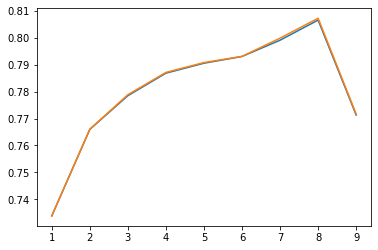

In [15]:
x_degrees = range(1,10)

plt.plot(x_degrees, meanacc_dtest_ls)
plt.plot(x_degrees, meanacc_dtrain_ls)

## Ridge regression

In [7]:
import matplotlib.pyplot as plt

In [12]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []

for lambda_ in np.logspace(-40,-1,40):
    X_poly_multi = build_poly_multi(X_clean, d)
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=4,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

NameError: name 'd' is not defined

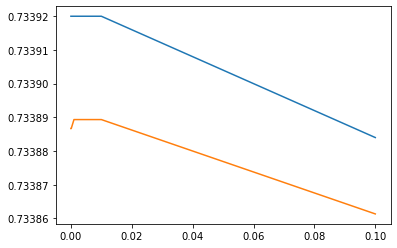

In [73]:
x_lambdas = np.logspace(-40,-1,40)

plt.plot(x_lambdas, meanacc_dtest_rr)
plt.plot(x_lambdas, meanacc_dtrain_rr)

## Polynomial expansion

In [81]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []

for lambda_ in np.logspace(-40,1,40):

    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly,k_fold=4,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

[0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7831239999999999, 0.7966359999999999, 0.7916439999999999, 0.7932800000000001, 0.7917560000000001, 0.791484, 0.791292, 0.791056, 0.790912, 0.79034, 0.788364]
[0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584, 0.783584,

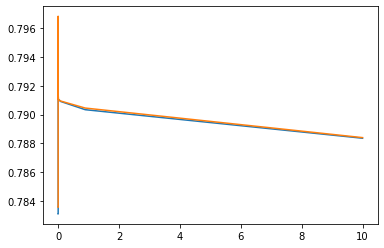

In [82]:
x_lambdas = np.logspace(-40,1,40)

plt.plot(x_lambdas, meanacc_dtest_rr)
plt.plot(x_lambdas, meanacc_dtrain_rr)

print(meanacc_dtest_rr)
print(meanacc_dtrain_rr)

In [8]:
X_poly_multi = build_poly_multi(X_clean, 5)

In [9]:
X_poly_multi.shape

(250000, 116)

In [10]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []

for lambda_ in np.logspace(-40,1,40):

    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=4,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

[0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7904999999999999, 0.7905039999999999, 0.7905039999999999, 0.7905039999999999, 0.7905039999999999, 0.7905039999999999, 0.790508, 0.7905079999999999, 0.790488, 0.790496]
[0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.7907533333333334, 0.790753

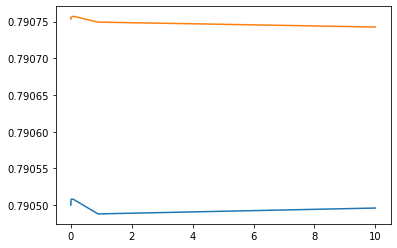

In [11]:
x_lambdas = np.logspace(-40,1,40)

plt.plot(x_lambdas, meanacc_dtest_rr)
plt.plot(x_lambdas, meanacc_dtrain_rr)

print(meanacc_dtest_rr)
print(meanacc_dtrain_rr)

# Logit

## Logistic regression

In [18]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 0.0000000002

init = time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='logistic_regression', max_iters=10000,gamma=gamma)
meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)
fin = time()

print(fin - init)

Current iteration=0, loss=3.651113489074959
Current iteration=1, loss=2.3009427019114943
Current iteration=2, loss=1.0409128038837518
Current iteration=3, loss=0.7368252712196568
Current iteration=4, loss=0.8072359115367752
Current iteration=5, loss=0.7820061626469056
Current iteration=6, loss=0.8510568683599384
Current iteration=7, loss=0.7780929175302469
Current iteration=8, loss=0.8448444610323129
Current iteration=9, loss=0.7750042370794633
Current iteration=10, loss=0.8394987121901638
Current iteration=11, loss=0.7718715312066781
Current iteration=12, loss=0.8342659281778488
Current iteration=13, loss=0.7687760054192398
Current iteration=14, loss=0.8291921938571226
Current iteration=15, loss=0.7657172865970624
Current iteration=16, loss=0.824253980821135
Current iteration=17, loss=0.7627003246273738
Current iteration=18, loss=0.8194340102199467
Current iteration=19, loss=0.7597281034439918
Current iteration=20, loss=0.8147168886835437
Current iteration=21, loss=0.7568022598787836


Current iteration=180, loss=0.6230246885257344
Current iteration=181, loss=0.6176108804175768
Current iteration=182, loss=0.6223918620858497
Current iteration=183, loss=0.6170471322672992
Current iteration=184, loss=0.6217807664090641
Current iteration=185, loss=0.6165020267240185
Current iteration=186, loss=0.6211906304447885
Current iteration=187, loss=0.6159749327061195
Current iteration=188, loss=0.6206207039081472
Current iteration=189, loss=0.6154652336801105
Current iteration=190, loss=0.6200702573293831
Current iteration=191, loss=0.6149723279956472
Current iteration=192, loss=0.6195385820421716
Current iteration=193, loss=0.614495629144656
Current iteration=194, loss=0.6190249901165169
Current iteration=195, loss=0.6140345659509816
Current iteration=196, loss=0.618528814241459
Current iteration=197, loss=0.6135885826965262
Current iteration=198, loss=0.618049407562477
Current iteration=199, loss=0.6131571391895274
Current iteration=200, loss=0.6175861434781058
Current iteratio

Current iteration=356, loss=0.603399730418113
Current iteration=357, loss=0.599607648365858
Current iteration=358, loss=0.6033282111179743
Current iteration=359, loss=0.5995397337610583
Current iteration=360, loss=0.603257671136688
Current iteration=361, loss=0.5994727545673487
Current iteration=362, loss=0.6031880865969574
Current iteration=363, loss=0.5994066888764358
Current iteration=364, loss=0.6031194344816314
Current iteration=365, loss=0.5993415155407733
Current iteration=366, loss=0.6030516925968832
Current iteration=367, loss=0.5992772141415992
Current iteration=368, loss=0.6029848395370683
Current iteration=369, loss=0.5992137649584189
Current iteration=370, loss=0.6029188546511831
Current iteration=371, loss=0.5991511489398655
Current iteration=372, loss=0.6028537180108455
Current iteration=373, loss=0.5990893476758674
Current iteration=374, loss=0.602789410379736
Current iteration=375, loss=0.5990283433710792
Current iteration=376, loss=0.6027259131844216
Current iteration

Current iteration=533, loss=0.5958279513038206
Current iteration=534, loss=0.5993466001472745
Current iteration=535, loss=0.5958010269444292
Current iteration=536, loss=0.5993175668311405
Current iteration=537, loss=0.5957743337494309
Current iteration=538, loss=0.5992887690171941
Current iteration=539, loss=0.5957478690809666
Current iteration=540, loss=0.5992602041020182
Current iteration=541, loss=0.5957216303416197
Current iteration=542, loss=0.5992318695222294
Current iteration=543, loss=0.5956956149735166
Current iteration=544, loss=0.5992037627535602
Current iteration=545, loss=0.5956698204574599
Current iteration=546, loss=0.5991758813099686
Current iteration=547, loss=0.5956442443120826
Current iteration=548, loss=0.5991482227427797
Current iteration=549, loss=0.5956188840930352
Current iteration=550, loss=0.5991207846398473
Current iteration=551, loss=0.5955937373921903
Current iteration=552, loss=0.5990935646247532
Current iteration=553, loss=0.5955688018368759
Current itera

Current iteration=708, loss=0.5974912207674666
Current iteration=709, loss=0.5941236301208683
Current iteration=710, loss=0.5974758451486123
Current iteration=711, loss=0.594110008301533
Current iteration=712, loss=0.597460570425308
Current iteration=713, loss=0.5940964810696566
Current iteration=714, loss=0.597445395717739
Current iteration=715, loss=0.5940830475599823
Current iteration=716, loss=0.5974303201554964
Current iteration=717, loss=0.5940697069167642
Current iteration=718, loss=0.5974153428774516
Current iteration=719, loss=0.5940564582936455
Current iteration=720, loss=0.5974004630316435
Current iteration=721, loss=0.594043300853539
Current iteration=722, loss=0.5973856797751603
Current iteration=723, loss=0.5940302337685047
Current iteration=724, loss=0.5973709922740262
Current iteration=725, loss=0.5940172562196397
Current iteration=726, loss=0.5973563997030903
Current iteration=727, loss=0.5940043673969578
Current iteration=728, loss=0.5973419012459155
Current iteration

Current iteration=887, loss=0.5932024839209924
Current iteration=888, loss=0.5964278667566052
Current iteration=889, loss=0.5931947360885933
Current iteration=890, loss=0.5964189121347582
Current iteration=891, loss=0.5931870326992729
Current iteration=892, loss=0.5964100064280163
Current iteration=893, loss=0.5931793734075341
Current iteration=894, loss=0.5964011492776449
Current iteration=895, loss=0.5931717578711987
Current iteration=896, loss=0.5963923403282254
Current iteration=897, loss=0.5931641857513754
Current iteration=898, loss=0.5963835792276186
Current iteration=899, loss=0.5931566567124232
Current iteration=900, loss=0.5963748656269288
Current iteration=901, loss=0.593149170421912
Current iteration=902, loss=0.5963661991804688
Current iteration=903, loss=0.5931417265505934
Current iteration=904, loss=0.5963575795457279
Current iteration=905, loss=0.5931343247723615
Current iteration=906, loss=0.5963490063833353
Current iteration=907, loss=0.5931269647642198
Current iterat

Current iteration=1062, loss=0.5958000312877364
Current iteration=1063, loss=0.5926594123275462
Current iteration=1064, loss=0.5957942756586136
Current iteration=1065, loss=0.5926545469150218
Current iteration=1066, loss=0.5957885471356653
Current iteration=1067, loss=0.5926497050909524
Current iteration=1068, loss=0.5957828455503907
Current iteration=1069, loss=0.5926448866999346
Current iteration=1070, loss=0.5957771707356437
Current iteration=1071, loss=0.5926400915878803
Current iteration=1072, loss=0.5957715225256205
Current iteration=1073, loss=0.5926353196020007
Current iteration=1074, loss=0.5957659007558458
Current iteration=1075, loss=0.5926305705907909
Current iteration=1076, loss=0.5957603052631624
Current iteration=1077, loss=0.5926258444040235
Current iteration=1078, loss=0.5957547358857151
Current iteration=1079, loss=0.5926211408927279
Current iteration=1080, loss=0.5957491924629394
Current iteration=1081, loss=0.5926164599091847
Current iteration=1082, loss=0.595743674

Current iteration=1235, loss=0.5923136881990834
Current iteration=1236, loss=0.5953854287652334
Current iteration=1237, loss=0.5923103941546762
Current iteration=1238, loss=0.5953815198753505
Current iteration=1239, loss=0.5923071140432576
Current iteration=1240, loss=0.5953776273708953
Current iteration=1241, loss=0.5923038477861031
Current iteration=1242, loss=0.595373751164064
Current iteration=1243, loss=0.592300595305061
Current iteration=1244, loss=0.5953698911676566
Current iteration=1245, loss=0.5922973565225494
Current iteration=1246, loss=0.5953660472950737
Current iteration=1247, loss=0.5922941313615507
Current iteration=1248, loss=0.5953622194603093
Current iteration=1249, loss=0.5922909197456058
Current iteration=1250, loss=0.5953584075779474
Current iteration=1251, loss=0.5922877215988115
Current iteration=1252, loss=0.5953546115631548
Current iteration=1253, loss=0.5922845368458112
Current iteration=1254, loss=0.5953508313316784
Current iteration=1255, loss=0.59228136541

Current iteration=1407, loss=0.5920743296949025
Current iteration=1408, loss=0.5951012899913706
Current iteration=1409, loss=0.5920719955052952
Current iteration=1410, loss=0.5950985216362724
Current iteration=1411, loss=0.5920696701413115
Current iteration=1412, loss=0.5950957638821283
Current iteration=1413, loss=0.5920673535590396
Current iteration=1414, loss=0.5950930166782995
Current iteration=1415, loss=0.5920650457148426
Current iteration=1416, loss=0.5950902799744474
Current iteration=1417, loss=0.5920627465653537
Current iteration=1418, loss=0.5950875537205275
Current iteration=1419, loss=0.5920604560674769
Current iteration=1420, loss=0.5950848378667895
Current iteration=1421, loss=0.592058174178384
Current iteration=1422, loss=0.5950821323637773
Current iteration=1423, loss=0.5920559008555137
Current iteration=1424, loss=0.5950794371623216
Current iteration=1425, loss=0.5920536360565659
Current iteration=1426, loss=0.5950767522135418
Current iteration=1427, loss=0.5920513797

Current iteration=1579, loss=0.5919018678250634
Current iteration=1580, loss=0.5948973393330789
Current iteration=1581, loss=0.5919001561840924
Current iteration=1582, loss=0.5948953239491269
Current iteration=1583, loss=0.5918984504078639
Current iteration=1584, loss=0.5948933157080826
Current iteration=1585, loss=0.5918967504697791
Current iteration=1586, loss=0.5948913145784441
Current iteration=1587, loss=0.591895056343378
Current iteration=1588, loss=0.5948893205288703
Current iteration=1589, loss=0.5918933680023479
Current iteration=1590, loss=0.5948873335281853
Current iteration=1591, loss=0.5918916854205161
Current iteration=1592, loss=0.5948853535453694
Current iteration=1593, loss=0.5918900085718507
Current iteration=1594, loss=0.5948833805495652
Current iteration=1595, loss=0.5918883374304608
Current iteration=1596, loss=0.594881414510071
Current iteration=1597, loss=0.5918866719705939
Current iteration=1598, loss=0.5948794553963432
Current iteration=1599, loss=0.59188501216

Current iteration=1753, loss=0.5917723627488591
Current iteration=1754, loss=0.594745709275582
Current iteration=1755, loss=0.5917710751347669
Current iteration=1756, loss=0.5947442125905023
Current iteration=1757, loss=0.591769791520064
Current iteration=1758, loss=0.5947427208187264
Current iteration=1759, loss=0.5917685118876904
Current iteration=1760, loss=0.5947412339396655
Current iteration=1761, loss=0.5917672362206668
Current iteration=1762, loss=0.5947397519328262
Current iteration=1763, loss=0.5917659645020956
Current iteration=1764, loss=0.5947382747778077
Current iteration=1765, loss=0.5917646967151601
Current iteration=1766, loss=0.5947368024543056
Current iteration=1767, loss=0.5917634328431242
Current iteration=1768, loss=0.5947353349421092
Current iteration=1769, loss=0.5917621728693322
Current iteration=1770, loss=0.5947338722210993
Current iteration=1771, loss=0.5917609167772088
Current iteration=1772, loss=0.5947324142712527
Current iteration=1773, loss=0.59175966455

Current iteration=1927, loss=0.5916736600090693
Current iteration=1928, loss=0.5946318904003062
Current iteration=1929, loss=0.5916726642521397
Current iteration=1930, loss=0.5946307531995921
Current iteration=1931, loss=0.591671671272806
Current iteration=1932, loss=0.594629619428681
Current iteration=1933, loss=0.5916706810596536
Current iteration=1934, loss=0.5946284890736268
Current iteration=1935, loss=0.5916696936013169
Current iteration=1936, loss=0.5946273621205455
Current iteration=1937, loss=0.5916687088864825
Current iteration=1938, loss=0.5946262385556118
Current iteration=1939, loss=0.5916677269038849
Current iteration=1940, loss=0.5946251183650597
Current iteration=1941, loss=0.5916667476423101
Current iteration=1942, loss=0.5946240015351831
Current iteration=1943, loss=0.5916657710905916
Current iteration=1944, loss=0.5946228880523347
Current iteration=1945, loss=0.5916647972376147
Current iteration=1946, loss=0.5946217779029268
Current iteration=1947, loss=0.59166382607

Current iteration=2099, loss=0.591597107827686
Current iteration=2100, loss=0.594545318337245
Current iteration=2101, loss=0.5915963138960662
Current iteration=2102, loss=0.5945444307241221
Current iteration=2103, loss=0.5915955219216442
Current iteration=2104, loss=0.5945435455348108
Current iteration=2105, loss=0.591594731896549
Current iteration=2106, loss=0.5945426627596222
Current iteration=2107, loss=0.5915939438129415
Current iteration=2108, loss=0.5945417823889089
Current iteration=2109, loss=0.5915931576630166
Current iteration=2110, loss=0.5945409044130623
Current iteration=2111, loss=0.5915923734390004
Current iteration=2112, loss=0.5945400288225141
Current iteration=2113, loss=0.5915915911331538
Current iteration=2114, loss=0.5945391556077354
Current iteration=2115, loss=0.5915908107377685
Current iteration=2116, loss=0.5945382847592373
Current iteration=2117, loss=0.5915900322451695
Current iteration=2118, loss=0.5945374162675686
Current iteration=2119, loss=0.591589255647

Current iteration=2272, loss=0.5944769305064928
Current iteration=2273, loss=0.5915345917553787
Current iteration=2274, loss=0.5944762196852242
Current iteration=2275, loss=0.5915339418500118
Current iteration=2276, loss=0.5944755105846193
Current iteration=2277, loss=0.5915332933263399
Current iteration=2278, loss=0.5944748031978683
Current iteration=2279, loss=0.591532646178876
Current iteration=2280, loss=0.5944740975181865
Current iteration=2281, loss=0.591532000402156
Current iteration=2282, loss=0.5944733935388182
Current iteration=2283, loss=0.5915313559907388
Current iteration=2284, loss=0.5944726912530363
Current iteration=2285, loss=0.5915307129392049
Current iteration=2286, loss=0.5944719906541365
Current iteration=2287, loss=0.591530071242157
Current iteration=2288, loss=0.5944712917354468
Current iteration=2289, loss=0.5915294308942202
Current iteration=2290, loss=0.5944705944903188
Current iteration=2291, loss=0.591528791890041
Current iteration=2292, loss=0.5944698989121

Current iteration=2445, loss=0.5914832329219023
Current iteration=2446, loss=0.5944208613697887
Current iteration=2447, loss=0.5914826838916613
Current iteration=2448, loss=0.5944202774439937
Current iteration=2449, loss=0.5914821358441542
Current iteration=2450, loss=0.5944196947380572
Current iteration=2451, loss=0.5914815887755118
Current iteration=2452, loss=0.5944191132471782
Current iteration=2453, loss=0.591481042681877
Current iteration=2454, loss=0.5944185329665759
Current iteration=2455, loss=0.5914804975594098
Current iteration=2456, loss=0.5944179538914872
Current iteration=2457, loss=0.5914799534042858
Current iteration=2458, loss=0.5944173760171704
Current iteration=2459, loss=0.5914794102126947
Current iteration=2460, loss=0.5944167993389003
Current iteration=2461, loss=0.5914788679808428
Current iteration=2462, loss=0.5944162238519725
Current iteration=2463, loss=0.5914783267049513
Current iteration=2464, loss=0.5944156495517001
Current iteration=2465, loss=0.5914777863

Current iteration=2619, loss=0.5914387657078752
Current iteration=2620, loss=0.5943741543873772
Current iteration=2621, loss=0.5914382892065746
Current iteration=2622, loss=0.5943736604978749
Current iteration=2623, loss=0.5914378134030949
Current iteration=2624, loss=0.5943731674746175
Current iteration=2625, loss=0.5914373382947047
Current iteration=2626, loss=0.5943726753142105
Current iteration=2627, loss=0.5914368638786808
Current iteration=2628, loss=0.5943721840132709
Current iteration=2629, loss=0.5914363901523129
Current iteration=2630, loss=0.5943716935684317
Current iteration=2631, loss=0.5914359171128999
Current iteration=2632, loss=0.5943712039763376
Current iteration=2633, loss=0.591435444757752
Current iteration=2634, loss=0.5943707152336462
Current iteration=2635, loss=0.5914349730841905
Current iteration=2636, loss=0.5943702273370294
Current iteration=2637, loss=0.5914345020895466
Current iteration=2638, loss=0.5943697402831721
Current iteration=2639, loss=0.5914340317

Current iteration=2793, loss=0.5913996536227445
Current iteration=2794, loss=0.5943340947890604
Current iteration=2795, loss=0.5913992286685468
Current iteration=2796, loss=0.5943336648741535
Current iteration=2797, loss=0.5913988042107866
Current iteration=2798, loss=0.5943332355751477
Current iteration=2799, loss=0.5913983802475301
Current iteration=2800, loss=0.5943328068896384
Current iteration=2801, loss=0.5913979567768503
Current iteration=2802, loss=0.5943323788152282
Current iteration=2803, loss=0.5913975337968291
Current iteration=2804, loss=0.5943319513495311
Current iteration=2805, loss=0.5913971113055558
Current iteration=2806, loss=0.5943315244901696
Current iteration=2807, loss=0.5913966893011263
Current iteration=2808, loss=0.5943310982347755
Current iteration=2809, loss=0.5913962677816449
Current iteration=2810, loss=0.5943306725809897
Current iteration=2811, loss=0.5913958467452229
Current iteration=2812, loss=0.5943302475264637
Current iteration=2813, loss=0.591395426

Current iteration=3137, loss=0.5913324875750668
Current iteration=3138, loss=0.594267496220231
Current iteration=3139, loss=0.5913321250025136
Current iteration=3140, loss=0.5942671436051907
Current iteration=3141, loss=0.591331762684699
Current iteration=3142, loss=0.5942667913051253
Current iteration=3143, loss=0.5913314006206442
Current iteration=3144, loss=0.5942664393188147
Current iteration=3145, loss=0.5913310388093735
Current iteration=3146, loss=0.5942660876450439
Current iteration=3147, loss=0.5913306772499161
Current iteration=3148, loss=0.5942657362826007
Current iteration=3149, loss=0.5913303159413047
Current iteration=3150, loss=0.5942653852302812
Current iteration=3151, loss=0.5913299548825751
Current iteration=3152, loss=0.5942650344868827
Current iteration=3153, loss=0.5913295940727668
Current iteration=3154, loss=0.594264684051209
Current iteration=3155, loss=0.5913292335109245
Current iteration=3156, loss=0.59426433392207
Current iteration=3157, loss=0.59132887319609

Current iteration=3311, loss=0.5913018010298979
Current iteration=3312, loss=0.5942378777288856
Current iteration=3313, loss=0.5913014573345667
Current iteration=3314, loss=0.5942375484215836
Current iteration=3315, loss=0.5913011138217543
Current iteration=3316, loss=0.5942372193392184
Current iteration=3317, loss=0.5913007704907679
Current iteration=3318, loss=0.5942368904809242
Current iteration=3319, loss=0.5913004273409151
Current iteration=3320, loss=0.5942365618458391
Current iteration=3321, loss=0.5913000843715074
Current iteration=3322, loss=0.5942362334331035
Current iteration=3323, loss=0.5912997415818588
Current iteration=3324, loss=0.594235905241861
Current iteration=3325, loss=0.5912993989712856
Current iteration=3326, loss=0.5942355772712609
Current iteration=3327, loss=0.5912990565391073
Current iteration=3328, loss=0.5942352495204535
Current iteration=3329, loss=0.5912987142846462
Current iteration=3330, loss=0.5942349219885931
Current iteration=3331, loss=0.5912983722

Current iteration=3484, loss=0.5942102976238046
Current iteration=3485, loss=0.5912725144706342
Current iteration=3486, loss=0.5942099848182455
Current iteration=3487, loss=0.5912721843249535
Current iteration=3488, loss=0.594209672174341
Current iteration=3489, loss=0.5912718543105775
Current iteration=3490, loss=0.594209359691477
Current iteration=3491, loss=0.5912715244270138
Current iteration=3492, loss=0.5942090473690371
Current iteration=3493, loss=0.5912711946737723
Current iteration=3494, loss=0.5942087352064109
Current iteration=3495, loss=0.5912708650503652
Current iteration=3496, loss=0.5942084232029877
Current iteration=3497, loss=0.5912705355563047
Current iteration=3498, loss=0.5942081113581607
Current iteration=3499, loss=0.5912702061911064
Current iteration=3500, loss=0.5942077996713238
Current iteration=3501, loss=0.591269876954288
Current iteration=3502, loss=0.5942074881418763
Current iteration=3503, loss=0.5912695478453689
Current iteration=3504, loss=0.594207176769

Current iteration=3656, loss=0.5941839289006147
Current iteration=3657, loss=0.5912445553419399
Current iteration=3658, loss=0.5941836279719329
Current iteration=3659, loss=0.5912442348722665
Current iteration=3660, loss=0.594183327159819
Current iteration=3661, loss=0.5912439144979251
Current iteration=3662, loss=0.5941830264638333
Current iteration=3663, loss=0.5912435942185662
Current iteration=3664, loss=0.5941827258835379
Current iteration=3665, loss=0.5912432740338391
Current iteration=3666, loss=0.5941824254184964
Current iteration=3667, loss=0.5912429539433953
Current iteration=3668, loss=0.5941821250682735
Current iteration=3669, loss=0.5912426339468901
Current iteration=3670, loss=0.594181824832439
Current iteration=3671, loss=0.5912423140439774
Current iteration=3672, loss=0.594181524710559
Current iteration=3673, loss=0.5912419942343136
Current iteration=3674, loss=0.594181224702206
Current iteration=3675, loss=0.5912416745175565
Current iteration=3676, loss=0.5941809248069

Current iteration=3829, loss=0.5912173102618504
Current iteration=3830, loss=0.5941581412002299
Current iteration=3831, loss=0.5912169968398144
Current iteration=3832, loss=0.5941578489374744
Current iteration=3833, loss=0.5912166834874935
Current iteration=3834, loss=0.5941575567588449
Current iteration=3835, loss=0.5912163702046375
Current iteration=3836, loss=0.5941572646640293
Current iteration=3837, loss=0.5912160569909989
Current iteration=3838, loss=0.5941569726527176
Current iteration=3839, loss=0.5912157438463294
Current iteration=3840, loss=0.5941566807245995
Current iteration=3841, loss=0.5912154307703822
Current iteration=3842, loss=0.5941563888793666
Current iteration=3843, loss=0.5912151177629114
Current iteration=3844, loss=0.5941560971167109
Current iteration=3845, loss=0.5912148048236716
Current iteration=3846, loss=0.5941558054363285
Current iteration=3847, loss=0.5912144919524204
Current iteration=3848, loss=0.594155513837913
Current iteration=3849, loss=0.5912141791

Current iteration=4004, loss=0.5941329985466265
Current iteration=4005, loss=0.5911899707431152
Current iteration=4006, loss=0.5941327125555874
Current iteration=4007, loss=0.5911896625996989
Current iteration=4008, loss=0.5941324266256482
Current iteration=4009, loss=0.5911893545073996
Current iteration=4010, loss=0.5941321407565875
Current iteration=4011, loss=0.59118904646604
Current iteration=4012, loss=0.594131854948184
Current iteration=4013, loss=0.5911887384754442
Current iteration=4014, loss=0.5941315692002177
Current iteration=4015, loss=0.5911884305354381
Current iteration=4016, loss=0.5941312835124706
Current iteration=4017, loss=0.5911881226458456
Current iteration=4018, loss=0.5941309978847236
Current iteration=4019, loss=0.5911878148064947
Current iteration=4020, loss=0.5941307123167607
Current iteration=4021, loss=0.5911875070172117
Current iteration=4022, loss=0.5941304268083648
Current iteration=4023, loss=0.5911871992778254
Current iteration=4024, loss=0.594130141359

Current iteration=4177, loss=0.591163640568345
Current iteration=4178, loss=0.5941083242430942
Current iteration=4179, loss=0.5911633362417181
Current iteration=4180, loss=0.5941080428243445
Current iteration=4181, loss=0.5911630319533151
Current iteration=4182, loss=0.5941077614503486
Current iteration=4183, loss=0.5911627277030097
Current iteration=4184, loss=0.5941074801209498
Current iteration=4185, loss=0.5911624234906774
Current iteration=4186, loss=0.5941071988359918
Current iteration=4187, loss=0.5911621193161934
Current iteration=4188, loss=0.5941069175953189
Current iteration=4189, loss=0.5911618151794329
Current iteration=4190, loss=0.5941066363987744
Current iteration=4191, loss=0.5911615110802729
Current iteration=4192, loss=0.5941063552462053
Current iteration=4193, loss=0.5911612070185907
Current iteration=4194, loss=0.594106074137456
Current iteration=4195, loss=0.5911609029942614
Current iteration=4196, loss=0.5941057930723719
Current iteration=4197, loss=0.59116059900

Current iteration=4523, loss=0.5911114698645525
Current iteration=4524, loss=0.5940601909405868
Current iteration=4525, loss=0.5911111706383853
Current iteration=4526, loss=0.5940599153722502
Current iteration=4527, loss=0.5911108714346481
Current iteration=4528, loss=0.5940596398289069
Current iteration=4529, loss=0.5911105722532779
Current iteration=4530, loss=0.5940593643104761
Current iteration=4531, loss=0.5911102730942115
Current iteration=4532, loss=0.5940590888168786
Current iteration=4533, loss=0.5911099739573858
Current iteration=4534, loss=0.5940588133480359
Current iteration=4535, loss=0.5911096748427371
Current iteration=4536, loss=0.5940585379038686
Current iteration=4537, loss=0.5911093757502035
Current iteration=4538, loss=0.5940582624842992
Current iteration=4539, loss=0.591109076679723
Current iteration=4540, loss=0.5940579870892491
Current iteration=4541, loss=0.5911087776312323
Current iteration=4542, loss=0.594057711718641
Current iteration=4543, loss=0.59110847860

Current iteration=4698, loss=0.594036302210703
Current iteration=4699, loss=0.5910852173957589
Current iteration=4700, loss=0.5940360285496062
Current iteration=4701, loss=0.591084919925391
Current iteration=4702, loss=0.5940357549076283
Current iteration=4703, loss=0.5910846224727174
Current iteration=4704, loss=0.5940354812847141
Current iteration=4705, loss=0.5910843250376918
Current iteration=4706, loss=0.5940352076808055
Current iteration=4707, loss=0.5910840276202685
Current iteration=4708, loss=0.5940349340958465
Current iteration=4709, loss=0.5910837302204037
Current iteration=4710, loss=0.5940346605297822
Current iteration=4711, loss=0.591083432838054
Current iteration=4712, loss=0.5940343869825572
Current iteration=4713, loss=0.5910831354731738
Current iteration=4714, loss=0.594034113454115
Current iteration=4715, loss=0.5910828381257199
Current iteration=4716, loss=0.5940338399444014
Current iteration=4717, loss=0.5910825407956483
Current iteration=4718, loss=0.5940335664533

Current iteration=4872, loss=0.5940125596937783
Current iteration=4873, loss=0.5910593992659359
Current iteration=4874, loss=0.594012287506347
Current iteration=4875, loss=0.5910591031839024
Current iteration=4876, loss=0.5940120153338638
Current iteration=4877, loss=0.5910588071162434
Current iteration=4878, loss=0.5940117431762876
Current iteration=4879, loss=0.5910585110629241
Current iteration=4880, loss=0.5940114710335784
Current iteration=4881, loss=0.5910582150239146
Current iteration=4882, loss=0.5940111989056973
Current iteration=4883, loss=0.5910579189991839
Current iteration=4884, loss=0.5940109267926048
Current iteration=4885, loss=0.5910576229886978
Current iteration=4886, loss=0.5940106546942596
Current iteration=4887, loss=0.5910573269924269
Current iteration=4888, loss=0.594010382610624
Current iteration=4889, loss=0.5910570310103396
Current iteration=4890, loss=0.5940101105416583
Current iteration=4891, loss=0.5910567350424046
Current iteration=4892, loss=0.59400983848

Current iteration=5043, loss=0.5910342806877762
Current iteration=5044, loss=0.5939892024140463
Current iteration=5045, loss=0.5910339857248267
Current iteration=5046, loss=0.5939889313802728
Current iteration=5047, loss=0.5910336907739364
Current iteration=5048, loss=0.5939886603585122
Current iteration=5049, loss=0.5910333958350821
Current iteration=5050, loss=0.5939883893487339
Current iteration=5051, loss=0.5910331009082409
Current iteration=5052, loss=0.5939881183509125
Current iteration=5053, loss=0.5910328059933914
Current iteration=5054, loss=0.5939878473650171
Current iteration=5055, loss=0.59103251109051
Current iteration=5056, loss=0.5939875763910206
Current iteration=5057, loss=0.5910322161995737
Current iteration=5058, loss=0.5939873054288939
Current iteration=5059, loss=0.5910319213205608
Current iteration=5060, loss=0.5939870344786105
Current iteration=5061, loss=0.5910316264534498
Current iteration=5062, loss=0.5939867635401409
Current iteration=5063, loss=0.59103133159

Current iteration=5219, loss=0.5910083677939224
Current iteration=5220, loss=0.5939653945283406
Current iteration=5221, loss=0.5910080738135853
Current iteration=5222, loss=0.5939651244533871
Current iteration=5223, loss=0.5910077798435989
Current iteration=5224, loss=0.5939648543883106
Current iteration=5225, loss=0.5910074858839481
Current iteration=5226, loss=0.5939645843330914
Current iteration=5227, loss=0.5910071919346163
Current iteration=5228, loss=0.5939643142877091
Current iteration=5229, loss=0.5910068979955866
Current iteration=5230, loss=0.593964044252143
Current iteration=5231, loss=0.5910066040668435
Current iteration=5232, loss=0.5939637742263737
Current iteration=5233, loss=0.5910063101483711
Current iteration=5234, loss=0.5939635042103804
Current iteration=5235, loss=0.5910060162401533
Current iteration=5236, loss=0.5939632342041433
Current iteration=5237, loss=0.5910057223421734
Current iteration=5238, loss=0.5939629642076438
Current iteration=5239, loss=0.5910054284

Current iteration=5565, loss=0.5909576514403195
Current iteration=5566, loss=0.5939188038339495
Current iteration=5567, loss=0.5909573590549416
Current iteration=5568, loss=0.5939185352234065
Current iteration=5569, loss=0.5909570666778666
Current iteration=5570, loss=0.5939182666201859
Current iteration=5571, loss=0.5909567743090868
Current iteration=5572, loss=0.5939179980242782
Current iteration=5573, loss=0.5909564819485931
Current iteration=5574, loss=0.5939177294356733
Current iteration=5575, loss=0.590956189596379
Current iteration=5576, loss=0.5939174608543618
Current iteration=5577, loss=0.5909558972524348
Current iteration=5578, loss=0.5939171922803318
Current iteration=5579, loss=0.5909556049167529
Current iteration=5580, loss=0.5939169237135743
Current iteration=5581, loss=0.5909553125893254
Current iteration=5582, loss=0.5939166551540789
Current iteration=5583, loss=0.5909550202701438
Current iteration=5584, loss=0.5939163866018355
Current iteration=5585, loss=0.5909547279

Current iteration=5740, loss=0.5938954611040878
Current iteration=5741, loss=0.5909319524724963
Current iteration=5742, loss=0.5938951930960223
Current iteration=5743, loss=0.5909316607893103
Current iteration=5744, loss=0.593894925094519
Current iteration=5745, loss=0.590931369113808
Current iteration=5746, loss=0.5938946570995687
Current iteration=5747, loss=0.5909310774459826
Current iteration=5748, loss=0.5938943891111645
Current iteration=5749, loss=0.5909307857858292
Current iteration=5750, loss=0.5938941211293002
Current iteration=5751, loss=0.5909304941333415
Current iteration=5752, loss=0.5938938531539673
Current iteration=5753, loss=0.5909302024885139
Current iteration=5754, loss=0.5938935851851579
Current iteration=5755, loss=0.5909299108513395
Current iteration=5756, loss=0.5938933172228663
Current iteration=5757, loss=0.5909296192218133
Current iteration=5758, loss=0.5938930492670851
Current iteration=5759, loss=0.5909293275999303
Current iteration=5760, loss=0.59389278131

Current iteration=5914, loss=0.5938721682272303
Current iteration=5915, loss=0.5909066041991597
Current iteration=5916, loss=0.5938719007652532
Current iteration=5917, loss=0.5909063131645146
Current iteration=5918, loss=0.5938716333092938
Current iteration=5919, loss=0.5909060221371135
Current iteration=5920, loss=0.5938713658593453
Current iteration=5921, loss=0.5909057311169531
Current iteration=5922, loss=0.5938710984154039
Current iteration=5923, loss=0.5909054401040291
Current iteration=5924, loss=0.5938708309774642
Current iteration=5925, loss=0.590905149098337
Current iteration=5926, loss=0.59387056354552
Current iteration=5927, loss=0.5909048580998731
Current iteration=5928, loss=0.5938702961195669
Current iteration=5929, loss=0.5909045671086333
Current iteration=5930, loss=0.5938700286996004
Current iteration=5931, loss=0.5909042761246122
Current iteration=5932, loss=0.5938697612856145
Current iteration=5933, loss=0.5909039851478066
Current iteration=5934, loss=0.593869493877

Current iteration=6087, loss=0.5908816012965923
Current iteration=6088, loss=0.5938489210310424
Current iteration=6089, loss=0.5908813108709899
Current iteration=6090, loss=0.5938486540748955
Current iteration=6091, loss=0.5908810204523193
Current iteration=6092, loss=0.5938483871243769
Current iteration=6093, loss=0.5908807300405776
Current iteration=6094, loss=0.5938481201794823
Current iteration=6095, loss=0.590880439635762
Current iteration=6096, loss=0.593847853240209
Current iteration=6097, loss=0.5908801492378699
Current iteration=6098, loss=0.593847586306553
Current iteration=6099, loss=0.5908798588468969
Current iteration=6100, loss=0.5938473193785108
Current iteration=6101, loss=0.5908795684628415
Current iteration=6102, loss=0.5938470524560785
Current iteration=6103, loss=0.5908792780857001
Current iteration=6104, loss=0.5938467855392512
Current iteration=6105, loss=0.5908789877154691
Current iteration=6106, loss=0.5938465186280263
Current iteration=6107, loss=0.590878697352

Current iteration=6259, loss=0.5908566497398946
Current iteration=6260, loss=0.5938259830185008
Current iteration=6261, loss=0.5908563599002974
Current iteration=6262, loss=0.5938257165340275
Current iteration=6263, loss=0.5908560700674055
Current iteration=6264, loss=0.5938254500549068
Current iteration=6265, loss=0.5908557802412163
Current iteration=6266, loss=0.5938251835811369
Current iteration=6267, loss=0.5908554904217291
Current iteration=6268, loss=0.5938249171127152
Current iteration=6269, loss=0.5908552006089395
Current iteration=6270, loss=0.593824650649636
Current iteration=6271, loss=0.590854910802846
Current iteration=6272, loss=0.5938243841918995
Current iteration=6273, loss=0.5908546210034469
Current iteration=6274, loss=0.5938241177395025
Current iteration=6275, loss=0.5908543312107395
Current iteration=6276, loss=0.5938238512924415
Current iteration=6277, loss=0.5908540414247214
Current iteration=6278, loss=0.5938235848507143
Current iteration=6279, loss=0.59085375164

Current iteration=6432, loss=0.5938030846612483
Current iteration=6433, loss=0.590831458558484
Current iteration=6434, loss=0.5938028186281812
Current iteration=6435, loss=0.5908311692946495
Current iteration=6436, loss=0.5938025526002682
Current iteration=6437, loss=0.5908308800373528
Current iteration=6438, loss=0.5938022865775073
Current iteration=6439, loss=0.5908305907865916
Current iteration=6440, loss=0.5938020205598948
Current iteration=6441, loss=0.5908303015423645
Current iteration=6442, loss=0.5938017545474309
Current iteration=6443, loss=0.5908300123046705
Current iteration=6444, loss=0.5938014885401124
Current iteration=6445, loss=0.5908297230735066
Current iteration=6446, loss=0.5938012225379378
Current iteration=6447, loss=0.5908294338488729
Current iteration=6448, loss=0.593800956540906
Current iteration=6449, loss=0.590829144630767
Current iteration=6450, loss=0.5938006905490132
Current iteration=6451, loss=0.5908288554191866
Current iteration=6452, loss=0.593800424562

Current iteration=6605, loss=0.5908066056069425
Current iteration=6606, loss=0.593779958871914
Current iteration=6607, loss=0.5908063168998843
Current iteration=6608, loss=0.593779693280605
Current iteration=6609, loss=0.5908060281992403
Current iteration=6610, loss=0.5937794276943036
Current iteration=6611, loss=0.5908057395050117
Current iteration=6612, loss=0.5937791621130087
Current iteration=6613, loss=0.5908054508171948
Current iteration=6614, loss=0.5937788965367188
Current iteration=6615, loss=0.5908051621357903
Current iteration=6616, loss=0.5937786309654329
Current iteration=6617, loss=0.590804873460796
Current iteration=6618, loss=0.593778365399149
Current iteration=6619, loss=0.5908045847922113
Current iteration=6620, loss=0.5937780998378654
Current iteration=6621, loss=0.5908042961300342
Current iteration=6622, loss=0.5937778342815817
Current iteration=6623, loss=0.5908040074742645
Current iteration=6624, loss=0.5937775687302961
Current iteration=6625, loss=0.5908037188249

Current iteration=6778, loss=0.5937571361883663
Current iteration=6779, loss=0.5907815119722134
Current iteration=6780, loss=0.5937568710230426
Current iteration=6781, loss=0.5907812238191372
Current iteration=6782, loss=0.5937566058626227
Current iteration=6783, loss=0.5907809356723838
Current iteration=6784, loss=0.5937563407071039
Current iteration=6785, loss=0.5907806475319536
Current iteration=6786, loss=0.5937560755564866
Current iteration=6787, loss=0.5907803593978445
Current iteration=6788, loss=0.5937558104107692
Current iteration=6789, loss=0.5907800712700558
Current iteration=6790, loss=0.5937555452699508
Current iteration=6791, loss=0.5907797831485869
Current iteration=6792, loss=0.5937552801340291
Current iteration=6793, loss=0.5907794950334356
Current iteration=6794, loss=0.5937550150030048
Current iteration=6795, loss=0.5907792069246031
Current iteration=6796, loss=0.5937547498768766
Current iteration=6797, loss=0.5907789188220867
Current iteration=6798, loss=0.593754484

Current iteration=6951, loss=0.5907567538311914
Current iteration=6952, loss=0.5937340850448937
Current iteration=6953, loss=0.5907564662188439
Current iteration=6954, loss=0.5937338203026049
Current iteration=6955, loss=0.5907561786127504
Current iteration=6956, loss=0.5937335555651413
Current iteration=6957, loss=0.5907558910129108
Current iteration=6958, loss=0.5937332908325019
Current iteration=6959, loss=0.5907556034193236
Current iteration=6960, loss=0.5937330261046864
Current iteration=6961, loss=0.5907553158319889
Current iteration=6962, loss=0.5937327613816935
Current iteration=6963, loss=0.5907550282509051
Current iteration=6964, loss=0.5937324966635215
Current iteration=6965, loss=0.5907547406760719
Current iteration=6966, loss=0.5937322319501722
Current iteration=6967, loss=0.5907544531074895
Current iteration=6968, loss=0.5937319672416426
Current iteration=6969, loss=0.5907541655451556
Current iteration=6970, loss=0.5937317025379328
Current iteration=6971, loss=0.590753877

Current iteration=7126, loss=0.593711070440506
Current iteration=7127, loss=0.5907314678131833
Current iteration=7128, loss=0.5937108061153863
Current iteration=7129, loss=0.59073118074873
Current iteration=7130, loss=0.593710541795034
Current iteration=7131, loss=0.5907308936904767
Current iteration=7132, loss=0.5937102774794483
Current iteration=7133, loss=0.5907306066384219
Current iteration=7134, loss=0.5937100131686281
Current iteration=7135, loss=0.5907303195925657
Current iteration=7136, loss=0.593709748862574
Current iteration=7137, loss=0.5907300325529078
Current iteration=7138, loss=0.5937094845612844
Current iteration=7139, loss=0.590729745519447
Current iteration=7140, loss=0.5937092202647595
Current iteration=7141, loss=0.5907294584921836
Current iteration=7142, loss=0.5937089559729986
Current iteration=7143, loss=0.5907291714711161
Current iteration=7144, loss=0.5937086916860007
Current iteration=7145, loss=0.5907288844562448
Current iteration=7146, loss=0.593708427403765

Current iteration=7303, loss=0.5907062298169239
Current iteration=7304, loss=0.5936875641125782
Current iteration=7305, loss=0.5907059432961019
Current iteration=7306, loss=0.5936873002096962
Current iteration=7307, loss=0.5907056567814365
Current iteration=7308, loss=0.5936870363115367
Current iteration=7309, loss=0.5907053702729267
Current iteration=7310, loss=0.5936867724180998
Current iteration=7311, loss=0.5907050837705731
Current iteration=7312, loss=0.5936865085293844
Current iteration=7313, loss=0.590704797274375
Current iteration=7314, loss=0.5936862446453915
Current iteration=7315, loss=0.5907045107843322
Current iteration=7316, loss=0.5936859807661188
Current iteration=7317, loss=0.5907042243004429
Current iteration=7318, loss=0.5936857168915668
Current iteration=7319, loss=0.590703937822709
Current iteration=7320, loss=0.5936854530217359
Current iteration=7321, loss=0.5907036513511278
Current iteration=7322, loss=0.5936851891566244
Current iteration=7323, loss=0.59070336488

Current iteration=7478, loss=0.5936646221870362
Current iteration=7479, loss=0.5906810395070691
Current iteration=7480, loss=0.5936643586935563
Current iteration=7481, loss=0.5906807535264795
Current iteration=7482, loss=0.5936640952047672
Current iteration=7483, loss=0.5906804675520129
Current iteration=7484, loss=0.5936638317206663
Current iteration=7485, loss=0.5906801815836662
Current iteration=7486, loss=0.5936635682412553
Current iteration=7487, loss=0.5906798956214419
Current iteration=7488, loss=0.5936633047665325
Current iteration=7489, loss=0.5906796096653384
Current iteration=7490, loss=0.5936630412964988
Current iteration=7491, loss=0.5906793237153558
Current iteration=7492, loss=0.5936627778311532
Current iteration=7493, loss=0.5906790377714928
Current iteration=7494, loss=0.5936625143704949
Current iteration=7495, loss=0.5906787518337502
Current iteration=7496, loss=0.5936622509145235
Current iteration=7497, loss=0.5906784659021265
Current iteration=7498, loss=0.593661987

Current iteration=7654, loss=0.5936414526784667
Current iteration=7655, loss=0.5906558966127681
Current iteration=7656, loss=0.5936411895964978
Current iteration=7657, loss=0.5906556111696261
Current iteration=7658, loss=0.5936409265191924
Current iteration=7659, loss=0.5906553257325768
Current iteration=7660, loss=0.5936406634465503
Current iteration=7661, loss=0.5906550403016206
Current iteration=7662, loss=0.5936404003785712
Current iteration=7663, loss=0.5906547548767568
Current iteration=7664, loss=0.5936401373152546
Current iteration=7665, loss=0.5906544694579848
Current iteration=7666, loss=0.5936398742566005
Current iteration=7667, loss=0.5906541840453053
Current iteration=7668, loss=0.5936396112026088
Current iteration=7669, loss=0.5906538986387175
Current iteration=7670, loss=0.5936393481532788
Current iteration=7671, loss=0.5906536132382205
Current iteration=7672, loss=0.5936390851086104
Current iteration=7673, loss=0.5906533278438154
Current iteration=7674, loss=0.593638822

Current iteration=7829, loss=0.5906310858229985
Current iteration=7830, loss=0.5936183192894939
Current iteration=7831, loss=0.5906308009088835
Current iteration=7832, loss=0.5936180566169671
Current iteration=7833, loss=0.5906305160008374
Current iteration=7834, loss=0.5936177939490825
Current iteration=7835, loss=0.590630231098859
Current iteration=7836, loss=0.59361753128584
Current iteration=7837, loss=0.5906299462029493
Current iteration=7838, loss=0.5936172686272398
Current iteration=7839, loss=0.5906296613131078
Current iteration=7840, loss=0.5936170059732817
Current iteration=7841, loss=0.5906293764293331
Current iteration=7842, loss=0.5936167433239646
Current iteration=7843, loss=0.5906290915516261
Current iteration=7844, loss=0.5936164806792896
Current iteration=7845, loss=0.5906288066799861
Current iteration=7846, loss=0.5936162180392552
Current iteration=7847, loss=0.5906285218144129
Current iteration=7848, loss=0.5936159554038617
Current iteration=7849, loss=0.590628236954

Current iteration=8002, loss=0.5935957463993236
Current iteration=8003, loss=0.5906063209708345
Current iteration=8004, loss=0.593595484125307
Current iteration=8005, loss=0.5906060365837479
Current iteration=8006, loss=0.5935952218559155
Current iteration=8007, loss=0.5906057522027078
Current iteration=8008, loss=0.5935949595911492
Current iteration=8009, loss=0.5906054678277148
Current iteration=8010, loss=0.5935946973310083
Current iteration=8011, loss=0.5906051834587687
Current iteration=8012, loss=0.593594435075492
Current iteration=8013, loss=0.5906048990958691
Current iteration=8014, loss=0.593594172824601
Current iteration=8015, loss=0.5906046147390152
Current iteration=8016, loss=0.5935939105783342
Current iteration=8017, loss=0.5906043303882074
Current iteration=8018, loss=0.5935936483366916
Current iteration=8019, loss=0.590604046043445
Current iteration=8020, loss=0.5935933860996739
Current iteration=8021, loss=0.590603761704729
Current iteration=8022, loss=0.59359312386728

Current iteration=8176, loss=0.59357294584531
Current iteration=8177, loss=0.5905816018920343
Current iteration=8178, loss=0.5935726839730658
Current iteration=8179, loss=0.59058131803019
Current iteration=8180, loss=0.5935724221054326
Current iteration=8181, loss=0.5905810341743731
Current iteration=8182, loss=0.5935721602424101
Current iteration=8183, loss=0.5905807503245839
Current iteration=8184, loss=0.5935718983839982
Current iteration=8185, loss=0.5905804664808207
Current iteration=8186, loss=0.5935716365301953
Current iteration=8187, loss=0.5905801826430844
Current iteration=8188, loss=0.5935713746810035
Current iteration=8189, loss=0.5905798988113754
Current iteration=8190, loss=0.5935711128364215
Current iteration=8191, loss=0.5905796149856924
Current iteration=8192, loss=0.5935708509964502
Current iteration=8193, loss=0.5905793311660368
Current iteration=8194, loss=0.5935705891610883
Current iteration=8195, loss=0.5905790473524056
Current iteration=8196, loss=0.5935703273303

Current iteration=8352, loss=0.5935499187214969
Current iteration=8353, loss=0.5905566450998978
Current iteration=8354, loss=0.5935496572544322
Current iteration=8355, loss=0.5905563617676715
Current iteration=8356, loss=0.5935493957919653
Current iteration=8357, loss=0.5905560784414544
Current iteration=8358, loss=0.5935491343340961
Current iteration=8359, loss=0.5905557951212459
Current iteration=8360, loss=0.5935488728808249
Current iteration=8361, loss=0.5905555118070467
Current iteration=8362, loss=0.5935486114321512
Current iteration=8363, loss=0.590555228498856
Current iteration=8364, loss=0.5935483499880752
Current iteration=8365, loss=0.5905549451966744
Current iteration=8366, loss=0.5935480885485959
Current iteration=8367, loss=0.5905546619004999
Current iteration=8368, loss=0.5935478271137137
Current iteration=8369, loss=0.5905543786103337
Current iteration=8370, loss=0.5935475656834285
Current iteration=8371, loss=0.5905540953261762
Current iteration=8372, loss=0.5935473042

Current iteration=8525, loss=0.5905323004719721
Current iteration=8526, loss=0.5935271882732642
Current iteration=8527, loss=0.590532017655821
Current iteration=8528, loss=0.5935269272057142
Current iteration=8529, loss=0.5905317348456616
Current iteration=8530, loss=0.5935266661427501
Current iteration=8531, loss=0.5905314520414945
Current iteration=8532, loss=0.593526405084372
Current iteration=8533, loss=0.5905311692433193
Current iteration=8534, loss=0.593526144030581
Current iteration=8535, loss=0.5905308864511367
Current iteration=8536, loss=0.5935258829813755
Current iteration=8537, loss=0.5905306036649454
Current iteration=8538, loss=0.593525621936756
Current iteration=8539, loss=0.5905303208847451
Current iteration=8540, loss=0.5935253608967216
Current iteration=8541, loss=0.590530038110537
Current iteration=8542, loss=0.5935250998612741
Current iteration=8543, loss=0.5905297553423191
Current iteration=8544, loss=0.5935248388304114
Current iteration=8545, loss=0.59052947258009

Current iteration=8699, loss=0.5905077178645063
Current iteration=8700, loss=0.5935044925409467
Current iteration=8701, loss=0.5905074355689935
Current iteration=8702, loss=0.5935042318719512
Current iteration=8703, loss=0.5905071532794567
Current iteration=8704, loss=0.5935039712075325
Current iteration=8705, loss=0.5905068709958957
Current iteration=8706, loss=0.5935037105476885
Current iteration=8707, loss=0.590506588718311
Current iteration=8708, loss=0.59350344989242
Current iteration=8709, loss=0.5905063064467015
Current iteration=8710, loss=0.5935031892417278
Current iteration=8711, loss=0.590506024181068
Current iteration=8712, loss=0.5935029285956103
Current iteration=8713, loss=0.5905057419214099
Current iteration=8714, loss=0.5935026679540685
Current iteration=8715, loss=0.5905054596677269
Current iteration=8716, loss=0.5935024073171019
Current iteration=8717, loss=0.5905051774200183
Current iteration=8718, loss=0.5935021466847099
Current iteration=8719, loss=0.5905048951782

Current iteration=9043, loss=0.5904592507717373
Current iteration=9044, loss=0.5934597246703177
Current iteration=9045, loss=0.590458969501487
Current iteration=9046, loss=0.5934594647866939
Current iteration=9047, loss=0.5904586882371821
Current iteration=9048, loss=0.5934592049076273
Current iteration=9049, loss=0.5904584069788232
Current iteration=9050, loss=0.5934589450331175
Current iteration=9051, loss=0.5904581257264085
Current iteration=9052, loss=0.593458685163163
Current iteration=9053, loss=0.5904578444799399
Current iteration=9054, loss=0.5934584252977662
Current iteration=9055, loss=0.590457563239416
Current iteration=9056, loss=0.5934581654369246
Current iteration=9057, loss=0.5904572820048359
Current iteration=9058, loss=0.5934579055806394
Current iteration=9059, loss=0.5904570007762001
Current iteration=9060, loss=0.5934576457289098
Current iteration=9061, loss=0.590456719553509
Current iteration=9062, loss=0.5934573858817355
Current iteration=9063, loss=0.5904564383367

Current iteration=9215, loss=0.5904350832434815
Current iteration=9216, loss=0.5934373913223103
Current iteration=9217, loss=0.5904348024839164
Current iteration=9218, loss=0.5934371318301697
Current iteration=9219, loss=0.5904345217302821
Current iteration=9220, loss=0.5934368723425775
Current iteration=9221, loss=0.5904342409825787
Current iteration=9222, loss=0.5934366128595315
Current iteration=9223, loss=0.5904339602408056
Current iteration=9224, loss=0.5934363533810341
Current iteration=9225, loss=0.5904336795049633
Current iteration=9226, loss=0.5934360939070842
Current iteration=9227, loss=0.5904333987750503
Current iteration=9228, loss=0.5934358344376812
Current iteration=9229, loss=0.5904331180510682
Current iteration=9230, loss=0.5934355749728253
Current iteration=9231, loss=0.590432837333015
Current iteration=9232, loss=0.5934353155125164
Current iteration=9233, loss=0.5904325566208916
Current iteration=9234, loss=0.5934350560567541
Current iteration=9235, loss=0.5904322759

Current iteration=9389, loss=0.5904106793301597
Current iteration=9390, loss=0.5934148325077336
Current iteration=9391, loss=0.5904103990859322
Current iteration=9392, loss=0.5934145734108501
Current iteration=9393, loss=0.5904101188476207
Current iteration=9394, loss=0.5934143143185041
Current iteration=9395, loss=0.5904098386152243
Current iteration=9396, loss=0.593414055230697
Current iteration=9397, loss=0.5904095583887441
Current iteration=9398, loss=0.5934137961474287
Current iteration=9399, loss=0.5904092781681797
Current iteration=9400, loss=0.5934135370686988
Current iteration=9401, loss=0.5904089979535305
Current iteration=9402, loss=0.5934132779945075
Current iteration=9403, loss=0.5904087177447963
Current iteration=9404, loss=0.593413018924854
Current iteration=9405, loss=0.5904084375419765
Current iteration=9406, loss=0.5934127598597384
Current iteration=9407, loss=0.5904081573450717
Current iteration=9408, loss=0.5934125007991601
Current iteration=9409, loss=0.59040787715

Current iteration=9564, loss=0.5933923080473514
Current iteration=9565, loss=0.5903860404659602
Current iteration=9566, loss=0.5933920493449569
Current iteration=9567, loss=0.5903857607416939
Current iteration=9568, loss=0.5933917906470925
Current iteration=9569, loss=0.5903854810233286
Current iteration=9570, loss=0.5933915319537573
Current iteration=9571, loss=0.5903852013108646
Current iteration=9572, loss=0.5933912732649523
Current iteration=9573, loss=0.5903849216043014
Current iteration=9574, loss=0.593391014580677
Current iteration=9575, loss=0.5903846419036384
Current iteration=9576, loss=0.5933907559009306
Current iteration=9577, loss=0.5903843622088766
Current iteration=9578, loss=0.5933904972257142
Current iteration=9579, loss=0.5903840825200144
Current iteration=9580, loss=0.5933902385550268
Current iteration=9581, loss=0.5903838028370525
Current iteration=9582, loss=0.5933899798888688
Current iteration=9583, loss=0.5903835231599908
Current iteration=9584, loss=0.5933897212

Current iteration=9737, loss=0.5903620057308665
Current iteration=9738, loss=0.5933698178750708
Current iteration=9739, loss=0.5903617265134946
Current iteration=9740, loss=0.5933695595664122
Current iteration=9741, loss=0.5903614473020096
Current iteration=9742, loss=0.5933693012622743
Current iteration=9743, loss=0.5903611680964106
Current iteration=9744, loss=0.5933690429626574
Current iteration=9745, loss=0.5903608888966988
Current iteration=9746, loss=0.5933687846675628
Current iteration=9747, loss=0.5903606097028739
Current iteration=9748, loss=0.5933685263769883
Current iteration=9749, loss=0.5903603305149344
Current iteration=9750, loss=0.5933682680909352
Current iteration=9751, loss=0.5903600513328812
Current iteration=9752, loss=0.593368009809403
Current iteration=9753, loss=0.5903597721567144
Current iteration=9754, loss=0.5933677515323916
Current iteration=9755, loss=0.5903594929864328
Current iteration=9756, loss=0.5933674932599007
Current iteration=9757, loss=0.5903592138

Current iteration=9913, loss=0.5903374571190562
Current iteration=9914, loss=0.5933471040100883
Current iteration=9915, loss=0.5903371784190992
Current iteration=9916, loss=0.5933468460989335
Current iteration=9917, loss=0.5903368997250141
Current iteration=9918, loss=0.5933465881922916
Current iteration=9919, loss=0.5903366210368021
Current iteration=9920, loss=0.5933463302901629
Current iteration=9921, loss=0.5903363423544622
Current iteration=9922, loss=0.5933460723925463
Current iteration=9923, loss=0.5903360636779934
Current iteration=9924, loss=0.5933458144994426
Current iteration=9925, loss=0.5903357850073967
Current iteration=9926, loss=0.593345556610851
Current iteration=9927, loss=0.5903355063426718
Current iteration=9928, loss=0.5933452987267718
Current iteration=9929, loss=0.5903352276838182
Current iteration=9930, loss=0.5933450408472039
Current iteration=9931, loss=0.5903349490308354
Current iteration=9932, loss=0.5933447829721492
Current iteration=9933, loss=0.5903346703

Current iteration=91, loss=0.6767323553606601
Current iteration=92, loss=0.6925650857683326
Current iteration=93, loss=0.674898486253715
Current iteration=94, loss=0.6902061984691608
Current iteration=95, loss=0.673092675960924
Current iteration=96, loss=0.6879012842981138
Current iteration=97, loss=0.671315840595068
Current iteration=98, loss=0.6856500488296119
Current iteration=99, loss=0.6695688228094934
Current iteration=100, loss=0.6834521444331165
Current iteration=101, loss=0.6678523850375859
Current iteration=102, loss=0.6813071714144294
Current iteration=103, loss=0.6661672051304809
Current iteration=104, loss=0.6792146803475148
Current iteration=105, loss=0.6645138741342977
Current iteration=106, loss=0.677174175246355
Current iteration=107, loss=0.662892895891137
Current iteration=108, loss=0.6751851172540538
Current iteration=109, loss=0.661304688127865
Current iteration=110, loss=0.6732469285706698
Current iteration=111, loss=0.6597495847038174
Current iteration=112, loss=

Current iteration=267, loss=0.6112460769747816
Current iteration=268, loss=0.6163468265503175
Current iteration=269, loss=0.611087236225724
Current iteration=270, loss=0.6161792650981566
Current iteration=271, loss=0.6109321422571966
Current iteration=272, loss=0.6160157565587426
Current iteration=273, loss=0.6107806643212732
Current iteration=274, loss=0.6158561549102941
Current iteration=275, loss=0.6106326768575314
Current iteration=276, loss=0.6157003200626031
Current iteration=277, loss=0.6104880592930385
Current iteration=278, loss=0.6155481176210967
Current iteration=279, loss=0.6103466958484491
Current iteration=280, loss=0.6153994186587666
Current iteration=281, loss=0.6102084753502156
Current iteration=282, loss=0.6152540994958884
Current iteration=283, loss=0.6100732910488721
Current iteration=284, loss=0.6151120414873905
Current iteration=285, loss=0.6099410404433443
Current iteration=286, loss=0.6149731308177687
Current iteration=287, loss=0.6098116251112169
Current iterat

Current iteration=443, loss=0.6042192422774598
Current iteration=444, loss=0.6089655514230979
Current iteration=445, loss=0.6041777897908398
Current iteration=446, loss=0.6089213384118527
Current iteration=447, loss=0.6041367587806323
Current iteration=448, loss=0.6088775514320742
Current iteration=449, loss=0.6040961428358897
Current iteration=450, loss=0.6088341840039246
Current iteration=451, loss=0.6040559356965451
Current iteration=452, loss=0.6087912298064024
Current iteration=453, loss=0.6040161312483951
Current iteration=454, loss=0.6087486826718523
Current iteration=455, loss=0.6039767235182804
Current iteration=456, loss=0.6087065365807094
Current iteration=457, loss=0.6039377066694664
Current iteration=458, loss=0.6086647856564386
Current iteration=459, loss=0.6038990749971994
Current iteration=460, loss=0.6086234241606979
Current iteration=461, loss=0.603860822924439
Current iteration=462, loss=0.6085824464886843
Current iteration=463, loss=0.60382294499776
Current iteratio

Current iteration=618, loss=0.6062507942988913
Current iteration=619, loss=0.6017077397321464
Current iteration=620, loss=0.6062290993224905
Current iteration=621, loss=0.6016885099649808
Current iteration=622, loss=0.6062075588542528
Current iteration=623, loss=0.6016694269322821
Current iteration=624, loss=0.6061861714202126
Current iteration=625, loss=0.601650489163765
Current iteration=626, loss=0.6061649355644031
Current iteration=627, loss=0.6016316952074224
Current iteration=628, loss=0.6061438498485645
Current iteration=629, loss=0.601613043629227
Current iteration=630, loss=0.606122912851854
Current iteration=631, loss=0.6015945330128474
Current iteration=632, loss=0.6061021231705647
Current iteration=633, loss=0.6015761619593685
Current iteration=634, loss=0.6060814794178553
Current iteration=635, loss=0.6015579290870151
Current iteration=636, loss=0.6060609802234772
Current iteration=637, loss=0.6015398330308829
Current iteration=638, loss=0.6060406242335167
Current iteratio

Current iteration=795, loss=0.6004496374042378
Current iteration=796, loss=0.6047922664377008
Current iteration=797, loss=0.6004391953115282
Current iteration=798, loss=0.6047800752737398
Current iteration=799, loss=0.6004288184966289
Current iteration=800, loss=0.6047679554575962
Current iteration=801, loss=0.6004185064109592
Current iteration=802, loss=0.6047559064278923
Current iteration=803, loss=0.6004082585115554
Current iteration=804, loss=0.6047439276287645
Current iteration=805, loss=0.6003980742610056
Current iteration=806, loss=0.6047320185097965
Current iteration=807, loss=0.6003879531273836
Current iteration=808, loss=0.6047201785259604
Current iteration=809, loss=0.6003778945841844
Current iteration=810, loss=0.6047084071375526
Current iteration=811, loss=0.6003678981102629
Current iteration=812, loss=0.6046967038101341
Current iteration=813, loss=0.60035796318977
Current iteration=814, loss=0.6046850680144729
Current iteration=815, loss=0.6003480893120919
Current iterati

Current iteration=1141, loss=0.5992932606655925
Current iteration=1142, loss=0.6034112066685692
Current iteration=1143, loss=0.5992890854574043
Current iteration=1144, loss=0.603406113976363
Current iteration=1145, loss=0.5992849290188544
Current iteration=1146, loss=0.6034010436193554
Current iteration=1147, loss=0.5992807912360593
Current iteration=1148, loss=0.603395995471014
Current iteration=1149, loss=0.5992766719960336
Current iteration=1150, loss=0.603390969405738
Current iteration=1151, loss=0.5992725711866764
Current iteration=1152, loss=0.6033859652988507
Current iteration=1153, loss=0.5992684886967667
Current iteration=1154, loss=0.6033809830265894
Current iteration=1155, loss=0.5992644244159558
Current iteration=1156, loss=0.6033760224660989
Current iteration=1157, loss=0.599260378234755
Current iteration=1158, loss=0.6033710834954203
Current iteration=1159, loss=0.599256350044529
Current iteration=1160, loss=0.6033661659934855
Current iteration=1161, loss=0.59925233973749

Current iteration=1316, loss=0.6030400848083114
Current iteration=1317, loss=0.598986992578716
Current iteration=1318, loss=0.6030365445190219
Current iteration=1319, loss=0.5989841145746656
Current iteration=1320, loss=0.6030330183035605
Current iteration=1321, loss=0.5989812479861715
Current iteration=1322, loss=0.6030295060920977
Current iteration=1323, loss=0.5989783927534154
Current iteration=1324, loss=0.6030260078152383
Current iteration=1325, loss=0.5989755488169823
Current iteration=1326, loss=0.6030225234040247
Current iteration=1327, loss=0.5989727161178562
Current iteration=1328, loss=0.6030190527899285
Current iteration=1329, loss=0.5989698945974152
Current iteration=1330, loss=0.6030155959048499
Current iteration=1331, loss=0.5989670841974299
Current iteration=1332, loss=0.6030121526811113
Current iteration=1333, loss=0.5989642848600588
Current iteration=1334, loss=0.603008723051458
Current iteration=1335, loss=0.5989614965278451
Current iteration=1336, loss=0.60300530694

Current iteration=1488, loss=0.6027807341054968
Current iteration=1489, loss=0.5987758345303822
Current iteration=1490, loss=0.6027781872653537
Current iteration=1491, loss=0.5987737545076408
Current iteration=1492, loss=0.6027756497933081
Current iteration=1493, loss=0.598771681935226
Current iteration=1494, loss=0.6027731216470967
Current iteration=1495, loss=0.5987696167781783
Current iteration=1496, loss=0.6027706027846849
Current iteration=1497, loss=0.5987675590017401
Current iteration=1498, loss=0.6027680931642676
Current iteration=1499, loss=0.5987655085713525
Current iteration=1500, loss=0.6027655927442612
Current iteration=1501, loss=0.5987634654526542
Current iteration=1502, loss=0.6027631014833053
Current iteration=1503, loss=0.5987614296114822
Current iteration=1504, loss=0.6027606193402664
Current iteration=1505, loss=0.5987594010138703
Current iteration=1506, loss=0.6027581462742289
Current iteration=1507, loss=0.5987573796260427
Current iteration=1508, loss=0.6027556822

Current iteration=1661, loss=0.598620986856199
Current iteration=1662, loss=0.6025901814346545
Current iteration=1663, loss=0.5986194376243329
Current iteration=1664, loss=0.6025883126380792
Current iteration=1665, loss=0.5986178934435916
Current iteration=1666, loss=0.6025864502451604
Current iteration=1667, loss=0.5986163542920007
Current iteration=1668, loss=0.602584594228768
Current iteration=1669, loss=0.5986148201476986
Current iteration=1670, loss=0.6025827445619021
Current iteration=1671, loss=0.5986132909889326
Current iteration=1672, loss=0.6025809012176906
Current iteration=1673, loss=0.5986117667940597
Current iteration=1674, loss=0.602579064169391
Current iteration=1675, loss=0.5986102475415456
Current iteration=1676, loss=0.6025772333903903
Current iteration=1677, loss=0.5986087332099658
Current iteration=1678, loss=0.6025754088541996
Current iteration=1679, loss=0.5986072237780001
Current iteration=1680, loss=0.602573590534457
Current iteration=1681, loss=0.5986057192244

Current iteration=1835, loss=0.5985029940836526
Current iteration=1836, loss=0.6024489400352024
Current iteration=1837, loss=0.5985018124594584
Current iteration=1838, loss=0.6024475391143334
Current iteration=1839, loss=0.5985006343254137
Current iteration=1840, loss=0.6024461426525325
Current iteration=1841, loss=0.5984994596670488
Current iteration=1842, loss=0.6024447506316102
Current iteration=1843, loss=0.5984982884699582
Current iteration=1844, loss=0.6024433630334555
Current iteration=1845, loss=0.5984971207198023
Current iteration=1846, loss=0.6024419798400361
Current iteration=1847, loss=0.5984959564023071
Current iteration=1848, loss=0.6024406010334021
Current iteration=1849, loss=0.5984947955032632
Current iteration=1850, loss=0.6024392265956797
Current iteration=1851, loss=0.5984936380085275
Current iteration=1852, loss=0.6024378565090753
Current iteration=1853, loss=0.5984924839040192
Current iteration=1854, loss=0.6024364907558731
Current iteration=1855, loss=0.598491333

Current iteration=2008, loss=0.6023430539454473
Current iteration=2009, loss=0.5984118503677274
Current iteration=2010, loss=0.6023419774207728
Current iteration=2011, loss=0.5984109245284843
Current iteration=2012, loss=0.6023409040462365
Current iteration=2013, loss=0.5984100011340197
Current iteration=2014, loss=0.6023398338092605
Current iteration=2015, loss=0.59840908017448
Current iteration=2016, loss=0.6023387666973198
Current iteration=2017, loss=0.5984081616400547
Current iteration=2018, loss=0.60233770269794
Current iteration=2019, loss=0.598407245520972
Current iteration=2020, loss=0.6023366417986981
Current iteration=2021, loss=0.5984063318075055
Current iteration=2022, loss=0.6023355839872256
Current iteration=2023, loss=0.5984054204899696
Current iteration=2024, loss=0.6023345292512065
Current iteration=2025, loss=0.5984045115587183
Current iteration=2026, loss=0.6023334775783712
Current iteration=2027, loss=0.5984036050041478
Current iteration=2028, loss=0.60233242895650

Current iteration=2182, loss=0.6022599562774241
Current iteration=2183, loss=0.5983394905813993
Current iteration=2184, loss=0.6022591118304081
Current iteration=2185, loss=0.5983387446247304
Current iteration=2186, loss=0.6022582696126126
Current iteration=2187, loss=0.5983380003938537
Current iteration=2188, loss=0.6022574296152443
Current iteration=2189, loss=0.5983372578819255
Current iteration=2190, loss=0.6022565918295439
Current iteration=2191, loss=0.5983365170821323
Current iteration=2192, loss=0.6022557562467898
Current iteration=2193, loss=0.598335777987686
Current iteration=2194, loss=0.6022549228582927
Current iteration=2195, loss=0.598335040591827
Current iteration=2196, loss=0.6022540916554018
Current iteration=2197, loss=0.5983343048878258
Current iteration=2198, loss=0.6022532626294996
Current iteration=2199, loss=0.5983335708689773
Current iteration=2200, loss=0.6022524357720019
Current iteration=2201, loss=0.5983328385286055
Current iteration=2202, loss=0.60225161107

Current iteration=2528, loss=0.6021406940394659
Current iteration=2529, loss=0.5982311929402451
Current iteration=2530, loss=0.6021401298532812
Current iteration=2531, loss=0.5982306637322141
Current iteration=2532, loss=0.6021395667970421
Current iteration=2533, loss=0.5982301353974904
Current iteration=2534, loss=0.6021390048663404
Current iteration=2535, loss=0.5982296079326673
Current iteration=2536, loss=0.6021384440567866
Current iteration=2537, loss=0.5982290813343494
Current iteration=2538, loss=0.6021378843640035
Current iteration=2539, loss=0.5982285555991553
Current iteration=2540, loss=0.6021373257836358
Current iteration=2541, loss=0.5982280307237178
Current iteration=2542, loss=0.6021367683113433
Current iteration=2543, loss=0.5982275067046825
Current iteration=2544, loss=0.6021362119428039
Current iteration=2545, loss=0.5982269835387081
Current iteration=2546, loss=0.60213565667371
Current iteration=2547, loss=0.5982264612224668
Current iteration=2548, loss=0.60213510249

Current iteration=2700, loss=0.6020958873771421
Current iteration=2701, loss=0.5981885510972526
Current iteration=2702, loss=0.602095405891626
Current iteration=2703, loss=0.598188085811285
Current iteration=2704, loss=0.6020949252138431
Current iteration=2705, loss=0.5981876211497691
Current iteration=2706, loss=0.6020944453406503
Current iteration=2707, loss=0.5981871571102804
Current iteration=2708, loss=0.6020939662689179
Current iteration=2709, loss=0.5981866936904027
Current iteration=2710, loss=0.602093487995529
Current iteration=2711, loss=0.5981862308877317
Current iteration=2712, loss=0.6020930105173777
Current iteration=2713, loss=0.598185768699871
Current iteration=2714, loss=0.6020925338313724
Current iteration=2715, loss=0.598185307124434
Current iteration=2716, loss=0.6020920579344307
Current iteration=2717, loss=0.5981848461590435
Current iteration=2718, loss=0.602091582823484
Current iteration=2719, loss=0.5981843858013319
Current iteration=2720, loss=0.602091108495475

Current iteration=2874, loss=0.6020567125510586
Current iteration=2875, loss=0.5981501702284174
Current iteration=2876, loss=0.6020562907886545
Current iteration=2877, loss=0.5981497511325741
Current iteration=2878, loss=0.6020558696019765
Current iteration=2879, loss=0.5981493324822672
Current iteration=2880, loss=0.6020554489887917
Current iteration=2881, loss=0.5981489142757768
Current iteration=2882, loss=0.6020550289468752
Current iteration=2883, loss=0.5981484965113874
Current iteration=2884, loss=0.6020546094740122
Current iteration=2885, loss=0.5981480791873938
Current iteration=2886, loss=0.6020541905679967
Current iteration=2887, loss=0.5981476623020949
Current iteration=2888, loss=0.6020537722266303
Current iteration=2889, loss=0.5981472458537946
Current iteration=2890, loss=0.602053354447721
Current iteration=2891, loss=0.5981468298408068
Current iteration=2892, loss=0.6020529372290897
Current iteration=2893, loss=0.5981464142614522
Current iteration=2894, loss=0.6020525205

Current iteration=3050, loss=0.6020215754133459
Current iteration=3051, loss=0.5981148212448785
Current iteration=3052, loss=0.6020211966513166
Current iteration=3053, loss=0.5981144354524169
Current iteration=3054, loss=0.6020208182985036
Current iteration=3055, loss=0.598114049977238
Current iteration=3056, loss=0.6020204403533267
Current iteration=3057, loss=0.5981136648181233
Current iteration=3058, loss=0.6020200628142084
Current iteration=3059, loss=0.5981132799738601
Current iteration=3060, loss=0.6020196856795816
Current iteration=3061, loss=0.5981128954432418
Current iteration=3062, loss=0.6020193089478826
Current iteration=3063, loss=0.598112511225064
Current iteration=3064, loss=0.6020189326175543
Current iteration=3065, loss=0.5981121273181277
Current iteration=3066, loss=0.602018556687046
Current iteration=3067, loss=0.5981117437212401
Current iteration=3068, loss=0.6020181811548126
Current iteration=3069, loss=0.598111360433211
Current iteration=3070, loss=0.6020178060193

Current iteration=3394, loss=0.6019613203689492
Current iteration=3395, loss=0.5980522644763818
Current iteration=3396, loss=0.6019609931380235
Current iteration=3397, loss=0.5980519187495895
Current iteration=3398, loss=0.6019606661180275
Current iteration=3399, loss=0.5980515731875505
Current iteration=3400, loss=0.6019603393081551
Current iteration=3401, loss=0.5980512277896463
Current iteration=3402, loss=0.6019600127076049
Current iteration=3403, loss=0.5980508825552594
Current iteration=3404, loss=0.6019596863155736
Current iteration=3405, loss=0.5980505374837747
Current iteration=3406, loss=0.6019593601312679
Current iteration=3407, loss=0.5980501925745801
Current iteration=3408, loss=0.6019590341538914
Current iteration=3409, loss=0.5980498478270655
Current iteration=3410, loss=0.6019587083826552
Current iteration=3411, loss=0.5980495032406242
Current iteration=3412, loss=0.6019583828167713
Current iteration=3413, loss=0.5980491588146507
Current iteration=3414, loss=0.601958057

Current iteration=3568, loss=0.6019335615012712
Current iteration=3569, loss=0.5980227419906737
Current iteration=3570, loss=0.6019332499137148
Current iteration=3571, loss=0.598022408517178
Current iteration=3572, loss=0.601932938477536
Current iteration=3573, loss=0.5980220751626856
Current iteration=3574, loss=0.6019326271921631
Current iteration=3575, loss=0.5980217419267577
Current iteration=3576, loss=0.6019323160570251
Current iteration=3577, loss=0.5980214088089556
Current iteration=3578, loss=0.6019320050715515
Current iteration=3579, loss=0.5980210758088409
Current iteration=3580, loss=0.6019316942351767
Current iteration=3581, loss=0.5980207429259791
Current iteration=3582, loss=0.6019313835473354
Current iteration=3583, loss=0.5980204101599379
Current iteration=3584, loss=0.6019310730074671
Current iteration=3585, loss=0.5980200775102845
Current iteration=3586, loss=0.6019307626150096
Current iteration=3587, loss=0.598019744976588
Current iteration=3588, loss=0.601930452369

Current iteration=3741, loss=0.5979944566093118
Current iteration=3742, loss=0.6019069636004343
Current iteration=3743, loss=0.5979941319239305
Current iteration=3744, loss=0.6019066632571751
Current iteration=3745, loss=0.5979938073253518
Current iteration=3746, loss=0.60190636302294
Current iteration=3747, loss=0.5979934828132629
Current iteration=3748, loss=0.6019060628973222
Current iteration=3749, loss=0.5979931583873516
Current iteration=3750, loss=0.6019057628799152
Current iteration=3751, loss=0.5979928340473059
Current iteration=3752, loss=0.6019054629703141
Current iteration=3753, loss=0.5979925097928143
Current iteration=3754, loss=0.6019051631681163
Current iteration=3755, loss=0.5979921856235692
Current iteration=3756, loss=0.60190486347292
Current iteration=3757, loss=0.5979918615392614
Current iteration=3758, loss=0.6019045638843271
Current iteration=3759, loss=0.597991537539585
Current iteration=3760, loss=0.6019042644019363
Current iteration=3761, loss=0.59799121362423

Current iteration=3914, loss=0.6018814940126981
Current iteration=3915, loss=0.5979665029864996
Current iteration=3916, loss=0.6018812017058509
Current iteration=3917, loss=0.5979661847981841
Current iteration=3918, loss=0.6018809094781977
Current iteration=3919, loss=0.5979658666734727
Current iteration=3920, loss=0.6018806173294455
Current iteration=3921, loss=0.5979655486121424
Current iteration=3922, loss=0.6018803252593056
Current iteration=3923, loss=0.597965230613971
Current iteration=3924, loss=0.6018800332674886
Current iteration=3925, loss=0.5979649126787365
Current iteration=3926, loss=0.601879741353707
Current iteration=3927, loss=0.597964594806218
Current iteration=3928, loss=0.601879449517673
Current iteration=3929, loss=0.5979642769961963
Current iteration=3930, loss=0.6018791577591023
Current iteration=3931, loss=0.5979639592484522
Current iteration=3932, loss=0.6018788660777105
Current iteration=3933, loss=0.5979636415627675
Current iteration=3934, loss=0.6018785744732

Current iteration=4260, loss=0.6018318923875488
Current iteration=4261, loss=0.597912241112809
Current iteration=4262, loss=0.6018316102731034
Current iteration=4263, loss=0.5979119312386817
Current iteration=4264, loss=0.6018313282011929
Current iteration=4265, loss=0.5979116214000592
Current iteration=4266, loss=0.6018310461716693
Current iteration=4267, loss=0.5979113115968285
Current iteration=4268, loss=0.6018307641843844
Current iteration=4269, loss=0.5979110018288759
Current iteration=4270, loss=0.6018304822391922
Current iteration=4271, loss=0.5979106920960894
Current iteration=4272, loss=0.6018302003359461
Current iteration=4273, loss=0.5979103823983569
Current iteration=4274, loss=0.6018299184744998
Current iteration=4275, loss=0.5979100727355666
Current iteration=4276, loss=0.6018296366547092
Current iteration=4277, loss=0.5979097631076079
Current iteration=4278, loss=0.6018293548764297
Current iteration=4279, loss=0.5979094535143699
Current iteration=4280, loss=0.6018290731

Current iteration=4432, loss=0.6018077720264994
Current iteration=4433, loss=0.5978857109970069
Current iteration=4434, loss=0.6018074930841375
Current iteration=4435, loss=0.5978854038041013
Current iteration=4436, loss=0.6018072141734901
Current iteration=4437, loss=0.597885096638412
Current iteration=4438, loss=0.601806935294453
Current iteration=4439, loss=0.5978847894998605
Current iteration=4440, loss=0.6018066564469193
Current iteration=4441, loss=0.5978844823883642
Current iteration=4442, loss=0.6018063776307861
Current iteration=4443, loss=0.597884175303845
Current iteration=4444, loss=0.6018060988459485
Current iteration=4445, loss=0.5978838682462214
Current iteration=4446, loss=0.6018058200923013
Current iteration=4447, loss=0.597883561215414
Current iteration=4448, loss=0.6018055413697432
Current iteration=4449, loss=0.5978832542113436
Current iteration=4450, loss=0.6018052626781684
Current iteration=4451, loss=0.5978829472339311
Current iteration=4452, loss=0.6018049840174

Current iteration=4774, loss=0.601760459910539
Current iteration=4775, loss=0.5978335199854347
Current iteration=4776, loss=0.6017601851453455
Current iteration=4777, loss=0.5978332164924738
Current iteration=4778, loss=0.6017599103986772
Current iteration=4779, loss=0.5978329130166302
Current iteration=4780, loss=0.6017596356704767
Current iteration=4781, loss=0.5978326095578586
Current iteration=4782, loss=0.6017593609606916
Current iteration=4783, loss=0.5978323061161209
Current iteration=4784, loss=0.6017590862692674
Current iteration=4785, loss=0.5978320026913749
Current iteration=4786, loss=0.6017588115961531
Current iteration=4787, loss=0.59783169928358
Current iteration=4788, loss=0.6017585369412928
Current iteration=4789, loss=0.5978313958926957
Current iteration=4790, loss=0.601758262304636
Current iteration=4791, loss=0.5978310925186819
Current iteration=4792, loss=0.6017579876861282
Current iteration=4793, loss=0.5978307891614969
Current iteration=4794, loss=0.6017577130857

Current iteration=4946, loss=0.6017368926925742
Current iteration=4947, loss=0.5978074782318752
Current iteration=4948, loss=0.6017366193426552
Current iteration=4949, loss=0.5978071760747401
Current iteration=4950, loss=0.6017363460073014
Current iteration=4951, loss=0.5978068739316873
Current iteration=4952, loss=0.6017360726864737
Current iteration=4953, loss=0.5978065718026905
Current iteration=4954, loss=0.6017357993801344
Current iteration=4955, loss=0.597806269687718
Current iteration=4956, loss=0.6017355260882442
Current iteration=4957, loss=0.5978059675867405
Current iteration=4958, loss=0.6017352528107661
Current iteration=4959, loss=0.5978056654997298
Current iteration=4960, loss=0.6017349795476619
Current iteration=4961, loss=0.5978053634266568
Current iteration=4962, loss=0.6017347062988928
Current iteration=4963, loss=0.5978050613674911
Current iteration=4964, loss=0.6017344330644212
Current iteration=4965, loss=0.5978047593222039
Current iteration=4966, loss=0.6017341598

Current iteration=5122, loss=0.6017128897435596
Current iteration=5123, loss=0.5977809393199558
Current iteration=5124, loss=0.6017126175426789
Current iteration=5125, loss=0.597780638300519
Current iteration=5126, loss=0.6017123453534796
Current iteration=5127, loss=0.597780337292956
Current iteration=5128, loss=0.6017120731759344
Current iteration=5129, loss=0.5977800362972459
Current iteration=5130, loss=0.601711801010016
Current iteration=5131, loss=0.5977797353133666
Current iteration=5132, loss=0.601711528855697
Current iteration=5133, loss=0.5977794343412991
Current iteration=5134, loss=0.6017112567129502
Current iteration=5135, loss=0.5977791333810216
Current iteration=5136, loss=0.6017109845817483
Current iteration=5137, loss=0.5977788324325128
Current iteration=5138, loss=0.6017107124620651
Current iteration=5139, loss=0.5977785314957527
Current iteration=5140, loss=0.601710440353874
Current iteration=5141, loss=0.5977782305707219
Current iteration=5142, loss=0.60171016825714

Current iteration=5298, loss=0.6016889780083788
Current iteration=5299, loss=0.597754492934001
Current iteration=5300, loss=0.6016887067413503
Current iteration=5301, loss=0.5977541928872472
Current iteration=5302, loss=0.6016884354839577
Current iteration=5303, loss=0.5977538928507965
Current iteration=5304, loss=0.6016881642361812
Current iteration=5305, loss=0.5977535928246357
Current iteration=5306, loss=0.6016878929980028
Current iteration=5307, loss=0.5977532928087493
Current iteration=5308, loss=0.6016876217694025
Current iteration=5309, loss=0.5977529928031229
Current iteration=5310, loss=0.6016873505503609
Current iteration=5311, loss=0.5977526928077402
Current iteration=5312, loss=0.6016870793408579
Current iteration=5313, loss=0.5977523928225873
Current iteration=5314, loss=0.6016868081408764
Current iteration=5315, loss=0.5977520928476513
Current iteration=5316, loss=0.6016865369503965
Current iteration=5317, loss=0.5977517928829152
Current iteration=5318, loss=0.6016862657

Current iteration=5470, loss=0.6016656824245965
Current iteration=5471, loss=0.5977287251612009
Current iteration=5472, loss=0.6016654119223509
Current iteration=5473, loss=0.5977284259514669
Current iteration=5474, loss=0.6016651414283177
Current iteration=5475, loss=0.5977281267509431
Current iteration=5476, loss=0.6016648709424832
Current iteration=5477, loss=0.5977278275596165
Current iteration=5478, loss=0.6016646004648328
Current iteration=5479, loss=0.5977275283774784
Current iteration=5480, loss=0.6016643299953529
Current iteration=5481, loss=0.5977272292045174
Current iteration=5482, loss=0.60166405953403
Current iteration=5483, loss=0.597726930040723
Current iteration=5484, loss=0.6016637890808509
Current iteration=5485, loss=0.5977266308860851
Current iteration=5486, loss=0.6016635186358015
Current iteration=5487, loss=0.5977263317405928
Current iteration=5488, loss=0.6016632481988683
Current iteration=5489, loss=0.5977260326042363
Current iteration=5490, loss=0.601662977770

Current iteration=5816, loss=0.6016189976387613
Current iteration=5817, loss=0.5976770911178121
Current iteration=5818, loss=0.6016187283894058
Current iteration=5819, loss=0.5976767933717467
Current iteration=5820, loss=0.6016184591465077
Current iteration=5821, loss=0.5976764956335332
Current iteration=5822, loss=0.601618189910059
Current iteration=5823, loss=0.597676197903167
Current iteration=5824, loss=0.6016179206800528
Current iteration=5825, loss=0.597675900180642
Current iteration=5826, loss=0.6016176514564816
Current iteration=5827, loss=0.5976756024659529
Current iteration=5828, loss=0.6016173822393397
Current iteration=5829, loss=0.5976753047590948
Current iteration=5830, loss=0.6016171130286188
Current iteration=5831, loss=0.5976750070600622
Current iteration=5832, loss=0.6016168438243127
Current iteration=5833, loss=0.5976747093688488
Current iteration=5834, loss=0.6016165746264142
Current iteration=5835, loss=0.5976744116854497
Current iteration=5836, loss=0.601616305434

Current iteration=5988, loss=0.6015958651208873
Current iteration=5989, loss=0.5976515131333935
Current iteration=5990, loss=0.6015955964034246
Current iteration=5991, loss=0.5976512160444272
Current iteration=5992, loss=0.6015953276918987
Current iteration=5993, loss=0.5976509189629068
Current iteration=5994, loss=0.601595058986303
Current iteration=5995, loss=0.5976506218888273
Current iteration=5996, loss=0.6015947902866321
Current iteration=5997, loss=0.597650324822187
Current iteration=5998, loss=0.6015945215928823
Current iteration=5999, loss=0.5976500277629806
Current iteration=6000, loss=0.6015942529050473
Current iteration=6001, loss=0.5976497307112045
Current iteration=6002, loss=0.6015939842231228
Current iteration=6003, loss=0.5976494336668541
Current iteration=6004, loss=0.601593715547103
Current iteration=6005, loss=0.5976491366299264
Current iteration=6006, loss=0.6015934468769846
Current iteration=6007, loss=0.5976488396004175
Current iteration=6008, loss=0.601593178212

Current iteration=6160, loss=0.6015727766306799
Current iteration=6161, loss=0.5976259903182651
Current iteration=6162, loss=0.6015725084068835
Current iteration=6163, loss=0.5976256938564604
Current iteration=6164, loss=0.6015722401886486
Current iteration=6165, loss=0.597625397401807
Current iteration=6166, loss=0.6015719719759715
Current iteration=6167, loss=0.5976251009543025
Current iteration=6168, loss=0.6015717037688487
Current iteration=6169, loss=0.5976248045139438
Current iteration=6170, loss=0.6015714355672763
Current iteration=6171, loss=0.5976245080807273
Current iteration=6172, loss=0.6015711673712494
Current iteration=6173, loss=0.5976242116546504
Current iteration=6174, loss=0.6015708991807673
Current iteration=6175, loss=0.5976239152357119
Current iteration=6176, loss=0.6015706309958245
Current iteration=6177, loss=0.5976236188239067
Current iteration=6178, loss=0.6015703628164174
Current iteration=6179, loss=0.5976233224192339
Current iteration=6180, loss=0.6015700946

Current iteration=6502, loss=0.6015269886160237
Current iteration=6503, loss=0.5975753972396514
Current iteration=6504, loss=0.6015267212996931
Current iteration=6505, loss=0.5975751019659681
Current iteration=6506, loss=0.6015264539884624
Current iteration=6507, loss=0.5975748066990655
Current iteration=6508, loss=0.6015261866823278
Current iteration=6509, loss=0.5975745114389414
Current iteration=6510, loss=0.6015259193812896
Current iteration=6511, loss=0.5975742161855951
Current iteration=6512, loss=0.6015256520853453
Current iteration=6513, loss=0.5975739209390241
Current iteration=6514, loss=0.6015253847944914
Current iteration=6515, loss=0.5975736256992267
Current iteration=6516, loss=0.6015251175087276
Current iteration=6517, loss=0.597573330466202
Current iteration=6518, loss=0.6015248502280517
Current iteration=6519, loss=0.5975730352399479
Current iteration=6520, loss=0.6015245829524615
Current iteration=6521, loss=0.5975727400204641
Current iteration=6522, loss=0.6015243156

Current iteration=6673, loss=0.5975503230371896
Current iteration=6674, loss=0.6015040178671462
Current iteration=6675, loss=0.5975500283347109
Current iteration=6676, loss=0.6015037509830117
Current iteration=6677, loss=0.5975497336388952
Current iteration=6678, loss=0.6015034841038351
Current iteration=6679, loss=0.5975494389497434
Current iteration=6680, loss=0.6015032172296146
Current iteration=6681, loss=0.5975491442672527
Current iteration=6682, loss=0.6015029503603485
Current iteration=6683, loss=0.5975488495914221
Current iteration=6684, loss=0.6015026834960359
Current iteration=6685, loss=0.5975485549222512
Current iteration=6686, loss=0.6015024166366763
Current iteration=6687, loss=0.5975482602597382
Current iteration=6688, loss=0.6015021497822667
Current iteration=6689, loss=0.5975479656038827
Current iteration=6690, loss=0.6015018829328072
Current iteration=6691, loss=0.597547670954682
Current iteration=6692, loss=0.6015016160882953
Current iteration=6693, loss=0.5975473763

Current iteration=6848, loss=0.6014808173570173
Current iteration=6849, loss=0.5975244146078816
Current iteration=6850, loss=0.601480550899484
Current iteration=6851, loss=0.5975241204877133
Current iteration=6852, loss=0.6014802844468042
Current iteration=6853, loss=0.5975238263741188
Current iteration=6854, loss=0.601480017998978
Current iteration=6855, loss=0.5975235322670969
Current iteration=6856, loss=0.601479751556002
Current iteration=6857, loss=0.5975232381666472
Current iteration=6858, loss=0.6014794851178779
Current iteration=6859, loss=0.597522944072768
Current iteration=6860, loss=0.6014792186846023
Current iteration=6861, loss=0.597522649985459
Current iteration=6862, loss=0.6014789522561756
Current iteration=6863, loss=0.5975223559047196
Current iteration=6864, loss=0.6014786858325963
Current iteration=6865, loss=0.597522061830548
Current iteration=6866, loss=0.6014784194138635
Current iteration=6867, loss=0.5975217677629441
Current iteration=6868, loss=0.601478152999976

Current iteration=7021, loss=0.5974991442145723
Current iteration=7022, loss=0.6014576536085187
Current iteration=7023, loss=0.5974988506567492
Current iteration=7024, loss=0.6014573875697947
Current iteration=7025, loss=0.5974985571054333
Current iteration=7026, loss=0.6014571215358474
Current iteration=7027, loss=0.5974982635606223
Current iteration=7028, loss=0.6014568555066775
Current iteration=7029, loss=0.5974979700223169
Current iteration=7030, loss=0.6014565894822828
Current iteration=7031, loss=0.5974976764905151
Current iteration=7032, loss=0.6014563234626629
Current iteration=7033, loss=0.5974973829652178
Current iteration=7034, loss=0.6014560574478178
Current iteration=7035, loss=0.5974970894464223
Current iteration=7036, loss=0.6014557914377453
Current iteration=7037, loss=0.5974967959341296
Current iteration=7038, loss=0.601455525432447
Current iteration=7039, loss=0.5974965024283387
Current iteration=7040, loss=0.6014552594319206
Current iteration=7041, loss=0.5974962089

Current iteration=7194, loss=0.6014347916678332
Current iteration=7195, loss=0.5974736289556426
Current iteration=7196, loss=0.601434526037467
Current iteration=7197, loss=0.5974733359614993
Current iteration=7198, loss=0.601434260411822
Current iteration=7199, loss=0.59747304297381
Current iteration=7200, loss=0.601433994790898
Current iteration=7201, loss=0.5974727499925737
Current iteration=7202, loss=0.6014337291746941
Current iteration=7203, loss=0.5974724570177885
Current iteration=7204, loss=0.6014334635632099
Current iteration=7205, loss=0.5974721640494557
Current iteration=7206, loss=0.6014331979564459
Current iteration=7207, loss=0.5974718710875747
Current iteration=7208, loss=0.601432932354401
Current iteration=7209, loss=0.5974715781321437
Current iteration=7210, loss=0.6014326667570731
Current iteration=7211, loss=0.5974712851831627
Current iteration=7212, loss=0.6014324011644621
Current iteration=7213, loss=0.5974709922406312
Current iteration=7214, loss=0.601432135576568

Current iteration=7369, loss=0.5974481625529454
Current iteration=7370, loss=0.6014114342121674
Current iteration=7371, loss=0.5974478701183636
Current iteration=7372, loss=0.6014111689953408
Current iteration=7373, loss=0.5974475776901936
Current iteration=7374, loss=0.6014109037831931
Current iteration=7375, loss=0.5974472852684345
Current iteration=7376, loss=0.6014106385757231
Current iteration=7377, loss=0.5974469928530848
Current iteration=7378, loss=0.6014103733729309
Current iteration=7379, loss=0.5974467004441448
Current iteration=7380, loss=0.601410108174816
Current iteration=7381, loss=0.5974464080416153
Current iteration=7382, loss=0.6014098429813783
Current iteration=7383, loss=0.5974461156454932
Current iteration=7384, loss=0.601409577792617
Current iteration=7385, loss=0.5974458232557811
Current iteration=7386, loss=0.6014093126085324
Current iteration=7387, loss=0.5974455308724769
Current iteration=7388, loss=0.601409047429123
Current iteration=7389, loss=0.597445238495

Current iteration=7545, loss=0.5974224528061868
Current iteration=7546, loss=0.6013881129981696
Current iteration=7547, loss=0.5974221609342242
Current iteration=7548, loss=0.6013878481915916
Current iteration=7549, loss=0.5974218690686385
Current iteration=7550, loss=0.6013875833896588
Current iteration=7551, loss=0.5974215772094279
Current iteration=7552, loss=0.6013873185923713
Current iteration=7553, loss=0.5974212853565932
Current iteration=7554, loss=0.60138705379973
Current iteration=7555, loss=0.5974209935101342
Current iteration=7556, loss=0.6013867890117344
Current iteration=7557, loss=0.5974207016700503
Current iteration=7558, loss=0.6013865242283839
Current iteration=7559, loss=0.5974204098363406
Current iteration=7560, loss=0.6013862594496773
Current iteration=7561, loss=0.5974201180090049
Current iteration=7562, loss=0.6013859946756149
Current iteration=7563, loss=0.5974198261880432
Current iteration=7564, loss=0.6013857299061962
Current iteration=7565, loss=0.59741953437

Current iteration=7718, loss=0.6013653565830704
Current iteration=7719, loss=0.597397083762656
Current iteration=7720, loss=0.6013650921749735
Current iteration=7721, loss=0.5973967924441573
Current iteration=7722, loss=0.601364827771497
Current iteration=7723, loss=0.5973965011320067
Current iteration=7724, loss=0.6013645633726421
Current iteration=7725, loss=0.5973962098262022
Current iteration=7726, loss=0.6013642989784084
Current iteration=7727, loss=0.5973959185267449
Current iteration=7728, loss=0.6013640345887957
Current iteration=7729, loss=0.5973956272336346
Current iteration=7730, loss=0.6013637702038033
Current iteration=7731, loss=0.5973953359468703
Current iteration=7732, loss=0.6013635058234303
Current iteration=7733, loss=0.5973950446664513
Current iteration=7734, loss=0.6013632414476785
Current iteration=7735, loss=0.5973947533923791
Current iteration=7736, loss=0.6013629770765462
Current iteration=7737, loss=0.5973944621246509
Current iteration=7738, loss=0.60136271271

Current iteration=7890, loss=0.6013426343534933
Current iteration=7891, loss=0.5973720535410961
Current iteration=7892, loss=0.6013423703419764
Current iteration=7893, loss=0.5973717627673997
Current iteration=7894, loss=0.601342106335061
Current iteration=7895, loss=0.5973714720000242
Current iteration=7896, loss=0.6013418423327466
Current iteration=7897, loss=0.5973711812389723
Current iteration=7898, loss=0.601341578335034
Current iteration=7899, loss=0.5973708904842417
Current iteration=7900, loss=0.601341314341922
Current iteration=7901, loss=0.5973705997358335
Current iteration=7902, loss=0.6013410503534108
Current iteration=7903, loss=0.5973703089937467
Current iteration=7904, loss=0.6013407863695014
Current iteration=7905, loss=0.5973700182579808
Current iteration=7906, loss=0.6013405223901916
Current iteration=7907, loss=0.5973697275285363
Current iteration=7908, loss=0.6013402584154824
Current iteration=7909, loss=0.5973694368054129
Current iteration=7910, loss=0.601339994445

Current iteration=8063, loss=0.5973470700854531
Current iteration=8064, loss=0.6013196825457737
Current iteration=8065, loss=0.5973467798545495
Current iteration=8066, loss=0.601319418933884
Current iteration=8067, loss=0.5973464896299471
Current iteration=8068, loss=0.60131915532658
Current iteration=8069, loss=0.5973461994116454
Current iteration=8070, loss=0.6013188917238605
Current iteration=8071, loss=0.5973459091996433
Current iteration=8072, loss=0.6013186281257261
Current iteration=8073, loss=0.5973456189939415
Current iteration=8074, loss=0.6013183645321778
Current iteration=8075, loss=0.5973453287945385
Current iteration=8076, loss=0.6013181009432127
Current iteration=8077, loss=0.5973450386014356
Current iteration=8078, loss=0.601317837358833
Current iteration=8079, loss=0.5973447484146318
Current iteration=8080, loss=0.6013175737790373
Current iteration=8081, loss=0.5973444582341261
Current iteration=8082, loss=0.6013173102038254
Current iteration=8083, loss=0.5973441680599

Current iteration=8238, loss=0.6012967654478434
Current iteration=8239, loss=0.5973215538585476
Current iteration=8240, loss=0.6012965022342749
Current iteration=8241, loss=0.5973212641811934
Current iteration=8242, loss=0.6012962390252777
Current iteration=8243, loss=0.5973209745101179
Current iteration=8244, loss=0.6012959758208518
Current iteration=8245, loss=0.5973206848453224
Current iteration=8246, loss=0.6012957126209967
Current iteration=8247, loss=0.5973203951868067
Current iteration=8248, loss=0.6012954494257132
Current iteration=8249, loss=0.5973201055345703
Current iteration=8250, loss=0.6012951862350007
Current iteration=8251, loss=0.5973198158886135
Current iteration=8252, loss=0.6012949230488595
Current iteration=8253, loss=0.5973195262489355
Current iteration=8254, loss=0.601294659867289
Current iteration=8255, loss=0.5973192366155363
Current iteration=8256, loss=0.6012943966902885
Current iteration=8257, loss=0.5973189469884156
Current iteration=8258, loss=0.6012941335

Current iteration=8411, loss=0.5972966645371729
Current iteration=8412, loss=0.6012738829546664
Current iteration=8413, loss=0.5972963753991045
Current iteration=8414, loss=0.6012736201383017
Current iteration=8415, loss=0.5972960862672975
Current iteration=8416, loss=0.6012733573264963
Current iteration=8417, loss=0.5972957971417518
Current iteration=8418, loss=0.6012730945192502
Current iteration=8419, loss=0.5972955080224669
Current iteration=8420, loss=0.6012728317165638
Current iteration=8421, loss=0.5972952189094428
Current iteration=8422, loss=0.6012725689184367
Current iteration=8423, loss=0.5972949298026802
Current iteration=8424, loss=0.6012723061248696
Current iteration=8425, loss=0.5972946407021776
Current iteration=8426, loss=0.601272043335861
Current iteration=8427, loss=0.5972943516079346
Current iteration=8428, loss=0.6012717805514112
Current iteration=8429, loss=0.5972940625199522
Current iteration=8430, loss=0.6012715177715199
Current iteration=8431, loss=0.5972937734

Current iteration=8585, loss=0.5972715329273153
Current iteration=8586, loss=0.601251034975217
Current iteration=8587, loss=0.5972712443332202
Current iteration=8588, loss=0.6012507725550746
Current iteration=8589, loss=0.5972709557453693
Current iteration=8590, loss=0.6012505101394816
Current iteration=8591, loss=0.5972706671637615
Current iteration=8592, loss=0.601250247728437
Current iteration=8593, loss=0.5972703785883964
Current iteration=8594, loss=0.6012499853219412
Current iteration=8595, loss=0.5972700900192751
Current iteration=8596, loss=0.6012497229199943
Current iteration=8597, loss=0.5972698014563962
Current iteration=8598, loss=0.6012494605225952
Current iteration=8599, loss=0.5972695128997594
Current iteration=8600, loss=0.6012491981297446
Current iteration=8601, loss=0.5972692243493654
Current iteration=8602, loss=0.6012489357414427
Current iteration=8603, loss=0.5972689358052138
Current iteration=8604, loss=0.6012486733576882
Current iteration=8605, loss=0.59726864726

Current iteration=8759, loss=0.5972464485774316
Current iteration=8760, loss=0.6012282214284046
Current iteration=8761, loss=0.5972461605257926
Current iteration=8762, loss=0.6012279594035975
Current iteration=8763, loss=0.5972458724803802
Current iteration=8764, loss=0.6012276973833297
Current iteration=8765, loss=0.5972455844411936
Current iteration=8766, loss=0.6012274353676013
Current iteration=8767, loss=0.5972452964082345
Current iteration=8768, loss=0.6012271733564114
Current iteration=8769, loss=0.5972450083815001
Current iteration=8770, loss=0.601226911349761
Current iteration=8771, loss=0.5972447203609923
Current iteration=8772, loss=0.6012266493476492
Current iteration=8773, loss=0.5972444323467095
Current iteration=8774, loss=0.601226387350076
Current iteration=8775, loss=0.5972441443386525
Current iteration=8776, loss=0.6012261253570412
Current iteration=8777, loss=0.5972438563368208
Current iteration=8778, loss=0.601225863368545
Current iteration=8779, loss=0.597243568341

Current iteration=8933, loss=0.5972214113580531
Current iteration=8934, loss=0.6012054422401547
Current iteration=8935, loss=0.5972211238474091
Current iteration=8936, loss=0.6012051806098644
Current iteration=8937, loss=0.5972208363429752
Current iteration=8938, loss=0.6012049189841036
Current iteration=8939, loss=0.5972205488447504
Current iteration=8940, loss=0.6012046573628729
Current iteration=8941, loss=0.5972202613527359
Current iteration=8942, loss=0.6012043957461726
Current iteration=8943, loss=0.5972199738669304
Current iteration=8944, loss=0.6012041341340019
Current iteration=8945, loss=0.5972196863873342
Current iteration=8946, loss=0.6012038725263606
Current iteration=8947, loss=0.5972193989139475
Current iteration=8948, loss=0.6012036109232493
Current iteration=8949, loss=0.5972191114467699
Current iteration=8950, loss=0.6012033493246678
Current iteration=8951, loss=0.5972188239858006
Current iteration=8952, loss=0.6012030877306153
Current iteration=8953, loss=0.597218536

Current iteration=9105, loss=0.5971967081211264
Current iteration=9106, loss=0.6011829585824224
Current iteration=9107, loss=0.5971964211438623
Current iteration=9108, loss=0.6011826973413554
Current iteration=9109, loss=0.5971961341727915
Current iteration=9110, loss=0.6011824361048097
Current iteration=9111, loss=0.5971958472079145
Current iteration=9112, loss=0.6011821748727842
Current iteration=9113, loss=0.5971955602492311
Current iteration=9114, loss=0.6011819136452812
Current iteration=9115, loss=0.597195273296742
Current iteration=9116, loss=0.6011816524222993
Current iteration=9117, loss=0.5971949863504459
Current iteration=9118, loss=0.6011813912038388
Current iteration=9119, loss=0.5971946994103433
Current iteration=9120, loss=0.6011811299898996
Current iteration=9121, loss=0.5971944124764331
Current iteration=9122, loss=0.6011808687804809
Current iteration=9123, loss=0.5971941255487161
Current iteration=9124, loss=0.601180607575583
Current iteration=9125, loss=0.59719383862

Current iteration=9279, loss=0.5971717642516318
Current iteration=9280, loss=0.6011602475144331
Current iteration=9281, loss=0.5971714778125653
Current iteration=9282, loss=0.6011599866663805
Current iteration=9283, loss=0.5971711913796778
Current iteration=9284, loss=0.6011597258228412
Current iteration=9285, loss=0.5971709049529674
Current iteration=9286, loss=0.6011594649838139
Current iteration=9287, loss=0.5971706185324347
Current iteration=9288, loss=0.6011592041492997
Current iteration=9289, loss=0.5971703321180802
Current iteration=9290, loss=0.6011589433192996
Current iteration=9291, loss=0.5971700457099025
Current iteration=9292, loss=0.601158682493812
Current iteration=9293, loss=0.5971697593079025
Current iteration=9294, loss=0.6011584216728361
Current iteration=9295, loss=0.5971694729120793
Current iteration=9296, loss=0.6011581608563731
Current iteration=9297, loss=0.5971691865224333
Current iteration=9298, loss=0.6011579000444237
Current iteration=9299, loss=0.5971689001

Current iteration=9453, loss=0.5971468671463411
Current iteration=9454, loss=0.6011375706078
Current iteration=9455, loss=0.597146581244103
Current iteration=9456, loss=0.601137310152046
Current iteration=9457, loss=0.597146295348028
Current iteration=9458, loss=0.601137049700797
Current iteration=9459, loss=0.5971460094581146
Current iteration=9460, loss=0.6011367892540531
Current iteration=9461, loss=0.5971457235743634
Current iteration=9462, loss=0.6011365288118133
Current iteration=9463, loss=0.5971454376967743
Current iteration=9464, loss=0.601136268374079
Current iteration=9465, loss=0.5971451518253471
Current iteration=9466, loss=0.6011360079408494
Current iteration=9467, loss=0.597144865960082
Current iteration=9468, loss=0.6011357475121248
Current iteration=9469, loss=0.5971445801009787
Current iteration=9470, loss=0.601135487087906
Current iteration=9471, loss=0.5971442942480361
Current iteration=9472, loss=0.6011352266681893
Current iteration=9473, loss=0.5971440084012541
Cu

Current iteration=9627, loss=0.5971220166868417
Current iteration=9628, loss=0.6011149278010222
Current iteration=9629, loss=0.5971217313200794
Current iteration=9630, loss=0.6011146677368678
Current iteration=9631, loss=0.5971214459594638
Current iteration=9632, loss=0.6011144076772114
Current iteration=9633, loss=0.5971211606049964
Current iteration=9634, loss=0.6011141476220521
Current iteration=9635, loss=0.5971208752566749
Current iteration=9636, loss=0.601113887571389
Current iteration=9637, loss=0.5971205899144993
Current iteration=9638, loss=0.6011136275252231
Current iteration=9639, loss=0.5971203045784708
Current iteration=9640, loss=0.6011133674835542
Current iteration=9641, loss=0.5971200192485878
Current iteration=9642, loss=0.6011131074463807
Current iteration=9643, loss=0.5971197339248514
Current iteration=9644, loss=0.6011128474137051
Current iteration=9645, loss=0.5971194486072602
Current iteration=9646, loss=0.6011125873855251
Current iteration=9647, loss=0.5971191632

Current iteration=9804, loss=0.6010920593605374
Current iteration=9805, loss=0.5970966430968695
Current iteration=9806, loss=0.6010917996917847
Current iteration=9807, loss=0.5970963582765054
Current iteration=9808, loss=0.6010915400275211
Current iteration=9809, loss=0.5970960734622728
Current iteration=9810, loss=0.6010912803677462
Current iteration=9811, loss=0.5970957886541706
Current iteration=9812, loss=0.6010910207124606
Current iteration=9813, loss=0.5970955038522011
Current iteration=9814, loss=0.6010907610616645
Current iteration=9815, loss=0.5970952190563616
Current iteration=9816, loss=0.6010905014153561
Current iteration=9817, loss=0.5970949342666515
Current iteration=9818, loss=0.6010902417735363
Current iteration=9819, loss=0.5970946494830733
Current iteration=9820, loss=0.6010899821362055
Current iteration=9821, loss=0.5970943647056256
Current iteration=9822, loss=0.6010897225033638
Current iteration=9823, loss=0.597094079934307
Current iteration=9824, loss=0.6010894628

Current iteration=9976, loss=0.6010697442465536
Current iteration=9977, loss=0.5970721709378024
Current iteration=9978, loss=0.6010694849635426
Current iteration=9979, loss=0.5970718866440965
Current iteration=9980, loss=0.6010692256850138
Current iteration=9981, loss=0.5970716023565071
Current iteration=9982, loss=0.6010689664109654
Current iteration=9983, loss=0.5970713180750332
Current iteration=9984, loss=0.6010687071413987
Current iteration=9985, loss=0.5970710337996752
Current iteration=9986, loss=0.601068447876313
Current iteration=9987, loss=0.5970707495304339
Current iteration=9988, loss=0.6010681886157085
Current iteration=9989, loss=0.5970704652673068
Current iteration=9990, loss=0.6010679293595852
Current iteration=9991, loss=0.5970701810102966
Current iteration=9992, loss=0.6010676701079427
Current iteration=9993, loss=0.5970698967594
Current iteration=9994, loss=0.6010674108607799
Current iteration=9995, loss=0.5970696125146193
Current iteration=9996, loss=0.6010671516180

Current iteration=156, loss=0.6384186508331434
Current iteration=157, loss=0.6302457220266943
Current iteration=158, loss=0.637446820308848
Current iteration=159, loss=0.6294196005225186
Current iteration=160, loss=0.6365074631921278
Current iteration=161, loss=0.6286194196527773
Current iteration=162, loss=0.6355996210933755
Current iteration=163, loss=0.6278445109851566
Current iteration=164, loss=0.634722345950236
Current iteration=165, loss=0.627094204226741
Current iteration=166, loss=0.6338747015411877
Current iteration=167, loss=0.6263678292032887
Current iteration=168, loss=0.6330557648544238
Current iteration=169, loss=0.6256647176773472
Current iteration=170, loss=0.6322646273131272
Current iteration=171, loss=0.624984205007666
Current iteration=172, loss=0.6315003958602364
Current iteration=173, loss=0.6243256316539143
Current iteration=174, loss=0.6307621939073008
Current iteration=175, loss=0.623688344531948
Current iteration=176, loss=0.6300491621532511
Current iteration=

Current iteration=332, loss=0.609746913856237
Current iteration=333, loss=0.6048626526828343
Current iteration=334, loss=0.6096612326861136
Current iteration=335, loss=0.6047821511608775
Current iteration=336, loss=0.6095769251393944
Current iteration=337, loss=0.6047029256061801
Current iteration=338, loss=0.6094939523043527
Current iteration=339, loss=0.6046249415633275
Current iteration=340, loss=0.6094122767812382
Current iteration=341, loss=0.6045481658709222
Current iteration=342, loss=0.6093318626161807
Current iteration=343, loss=0.6044725666059966
Current iteration=344, loss=0.6092526752380578
Current iteration=345, loss=0.6043981130309
Current iteration=346, loss=0.6091746813982021
Current iteration=347, loss=0.6043247755425438
Current iteration=348, loss=0.609097849112828
Current iteration=349, loss=0.6042525256239066
Current iteration=350, loss=0.6090221476080568
Current iteration=351, loss=0.6041813357977086
Current iteration=352, loss=0.6089475472674238
Current iteration=

Current iteration=507, loss=0.6006169756341456
Current iteration=508, loss=0.605168413754103
Current iteration=509, loss=0.6005873842982673
Current iteration=510, loss=0.6051363785587218
Current iteration=511, loss=0.6005580604497475
Current iteration=512, loss=0.6051046166415972
Current iteration=513, loss=0.6005290008364625
Current iteration=514, loss=0.6050731247623029
Current iteration=515, loss=0.6005002022617174
Current iteration=516, loss=0.6050418997365886
Current iteration=517, loss=0.6004716615828452
Current iteration=518, loss=0.6050109384348935
Current iteration=519, loss=0.6004433757098495
Current iteration=520, loss=0.6049802377809138
Current iteration=521, loss=0.6004153416040965
Current iteration=522, loss=0.6049497947502243
Current iteration=523, loss=0.6003875562770516
Current iteration=524, loss=0.6049196063689413
Current iteration=525, loss=0.6003600167890546
Current iteration=526, loss=0.6048896697124404
Current iteration=527, loss=0.6003327202481433
Current iterat

Current iteration=684, loss=0.6031318733575529
Current iteration=685, loss=0.598757448130597
Current iteration=686, loss=0.6031154894175678
Current iteration=687, loss=0.5987430627720418
Current iteration=688, loss=0.6030992171141852
Current iteration=689, loss=0.5987287817188826
Current iteration=690, loss=0.6030830554432384
Current iteration=691, loss=0.598714603986065
Current iteration=692, loss=0.6030670034115726
Current iteration=693, loss=0.5987005285996287
Current iteration=694, loss=0.6030510600369021
Current iteration=695, loss=0.5986865545965644
Current iteration=696, loss=0.6030352243476674
Current iteration=697, loss=0.5986726810246675
Current iteration=698, loss=0.6030194953828948
Current iteration=699, loss=0.5986589069423927
Current iteration=700, loss=0.603003872192053
Current iteration=701, loss=0.5986452314187143
Current iteration=702, loss=0.6029883538349242
Current iteration=703, loss=0.5986316535329876
Current iteration=704, loss=0.6029729393814635
Current iteratio

Current iteration=859, loss=0.5978119548183044
Current iteration=860, loss=0.602028281460582
Current iteration=861, loss=0.5978038766330543
Current iteration=862, loss=0.6020188207937583
Current iteration=863, loss=0.5977958469435797
Current iteration=864, loss=0.6020094137731458
Current iteration=865, loss=0.5977878653566064
Current iteration=866, loss=0.6020000599896997
Current iteration=867, loss=0.59777993148274
Current iteration=868, loss=0.6019907590382508
Current iteration=869, loss=0.5977720449364186
Current iteration=870, loss=0.6019815105174666
Current iteration=871, loss=0.5977642053358713
Current iteration=872, loss=0.6019723140298064
Current iteration=873, loss=0.5977564123030771
Current iteration=874, loss=0.6019631691814825
Current iteration=875, loss=0.5977486654637216
Current iteration=876, loss=0.6019540755824159
Current iteration=877, loss=0.5977409644471575
Current iteration=878, loss=0.6019450328462007
Current iteration=879, loss=0.5977333088863617
Current iteratio

Current iteration=1034, loss=0.6013698293869424
Current iteration=1035, loss=0.5972511554228914
Current iteration=1036, loss=0.6013638385456589
Current iteration=1037, loss=0.5972461815352234
Current iteration=1038, loss=0.601357876716718
Current iteration=1039, loss=0.5972412326369049
Current iteration=1040, loss=0.6013519437122703
Current iteration=1041, loss=0.5972363085552241
Current iteration=1042, loss=0.601346039346032
Current iteration=1043, loss=0.5972314091189781
Current iteration=1044, loss=0.601340163433263
Current iteration=1045, loss=0.5972265341584603
Current iteration=1046, loss=0.6013343157907572
Current iteration=1047, loss=0.5972216835054399
Current iteration=1048, loss=0.6013284962368235
Current iteration=1049, loss=0.5972168569931543
Current iteration=1050, loss=0.6013227045912749
Current iteration=1051, loss=0.5972120544562879
Current iteration=1052, loss=0.6013169406754096
Current iteration=1053, loss=0.5972072757309612
Current iteration=1054, loss=0.601311204311

Current iteration=1206, loss=0.60094428200714
Current iteration=1207, loss=0.5968998030895921
Current iteration=1208, loss=0.6009402317668305
Current iteration=1209, loss=0.5968964740018994
Current iteration=1210, loss=0.6009361988116322
Current iteration=1211, loss=0.596893159297702
Current iteration=1212, loss=0.6009321830453577
Current iteration=1213, loss=0.5968898588918725
Current iteration=1214, loss=0.6009281843725058
Current iteration=1215, loss=0.5968865726999295
Current iteration=1216, loss=0.6009242026982614
Current iteration=1217, loss=0.5968833006380374
Current iteration=1218, loss=0.6009202379284883
Current iteration=1219, loss=0.596880042622996
Current iteration=1220, loss=0.6009162899697216
Current iteration=1221, loss=0.5968767985722376
Current iteration=1222, loss=0.6009123587291628
Current iteration=1223, loss=0.5968735684038196
Current iteration=1224, loss=0.6009084441146749
Current iteration=1225, loss=0.5968703520364194
Current iteration=1226, loss=0.6009045460347

Current iteration=1379, loss=0.5966585556768462
Current iteration=1380, loss=0.6006477160464108
Current iteration=1381, loss=0.5966562079417498
Current iteration=1382, loss=0.6006448712270848
Current iteration=1383, loss=0.5966538691365467
Current iteration=1384, loss=0.6006420373710746
Current iteration=1385, loss=0.596651539215068
Current iteration=1386, loss=0.6006392144245505
Current iteration=1387, loss=0.5966492181314467
Current iteration=1388, loss=0.6006364023340123
Current iteration=1389, loss=0.5966469058401158
Current iteration=1390, loss=0.6006336010462896
Current iteration=1391, loss=0.5966446022958075
Current iteration=1392, loss=0.6006308105085355
Current iteration=1393, loss=0.5966423074535471
Current iteration=1394, loss=0.6006280306682261
Current iteration=1395, loss=0.5966400212686538
Current iteration=1396, loss=0.6006252614731588
Current iteration=1397, loss=0.5966377436967379
Current iteration=1398, loss=0.6006225028714477
Current iteration=1399, loss=0.5966354746

Current iteration=1551, loss=0.596485129692117
Current iteration=1552, loss=0.6004382447998828
Current iteration=1553, loss=0.5964834075592108
Current iteration=1554, loss=0.6004361751093473
Current iteration=1555, loss=0.5964816912786649
Current iteration=1556, loss=0.60043411273828
Current iteration=1557, loss=0.5964799808231875
Current iteration=1558, loss=0.6004320576538029
Current iteration=1559, loss=0.5964782761656418
Current iteration=1560, loss=0.6004300098232146
Current iteration=1561, loss=0.5964765772790435
Current iteration=1562, loss=0.6004279692139859
Current iteration=1563, loss=0.5964748841365594
Current iteration=1564, loss=0.6004259357937582
Current iteration=1565, loss=0.5964731967115084
Current iteration=1566, loss=0.6004239095303502
Current iteration=1567, loss=0.59647151497736
Current iteration=1568, loss=0.6004218903917473
Current iteration=1569, loss=0.5964698389077323
Current iteration=1570, loss=0.6004198783461046
Current iteration=1571, loss=0.59646816847638

Current iteration=1724, loss=0.6002839739987863
Current iteration=1725, loss=0.5963546117772323
Current iteration=1726, loss=0.6002824293159601
Current iteration=1727, loss=0.5963533108955817
Current iteration=1728, loss=0.6002808896617013
Current iteration=1729, loss=0.5963520139697328
Current iteration=1730, loss=0.6002793550146956
Current iteration=1731, loss=0.5963507209825049
Current iteration=1732, loss=0.6002778253537293
Current iteration=1733, loss=0.596349431916802
Current iteration=1734, loss=0.6002763006576893
Current iteration=1735, loss=0.5963481467556146
Current iteration=1736, loss=0.6002747809055656
Current iteration=1737, loss=0.5963468654820168
Current iteration=1738, loss=0.6002732660764445
Current iteration=1739, loss=0.5963455880791682
Current iteration=1740, loss=0.600271756149514
Current iteration=1741, loss=0.5963443145303092
Current iteration=1742, loss=0.6002702511040569
Current iteration=1743, loss=0.596343044818766
Current iteration=1744, loss=0.600268750919

Current iteration=1898, loss=0.600166345127806
Current iteration=1899, loss=0.5962545855265998
Current iteration=1900, loss=0.600165167769832
Current iteration=1901, loss=0.5962535725562738
Current iteration=1902, loss=0.600163993911228
Current iteration=1903, loss=0.5962525623190276
Current iteration=1904, loss=0.6001628235376788
Current iteration=1905, loss=0.596251554803509
Current iteration=1906, loss=0.6001616566349324
Current iteration=1907, loss=0.5962505499984155
Current iteration=1908, loss=0.6001604931887983
Current iteration=1909, loss=0.5962495478924997
Current iteration=1910, loss=0.600159333185151
Current iteration=1911, loss=0.5962485484745617
Current iteration=1912, loss=0.6001581766099249
Current iteration=1913, loss=0.5962475517334548
Current iteration=1914, loss=0.6001570234491157
Current iteration=1915, loss=0.5962465576580801
Current iteration=1916, loss=0.6001558736887815
Current iteration=1917, loss=0.5962455662373927
Current iteration=1918, loss=0.60015472731504

Current iteration=2072, loss=0.6000756179605481
Current iteration=2073, loss=0.5961755836796055
Current iteration=2074, loss=0.6000746975187106
Current iteration=2075, loss=0.5961747709291891
Current iteration=2076, loss=0.6000737795362301
Current iteration=2077, loss=0.5961739600913786
Current iteration=2078, loss=0.6000728640032509
Current iteration=2079, loss=0.5961731511584399
Current iteration=2080, loss=0.600071950909958
Current iteration=2081, loss=0.5961723441226706
Current iteration=2082, loss=0.6000710402465785
Current iteration=2083, loss=0.5961715389764022
Current iteration=2084, loss=0.6000701320033783
Current iteration=2085, loss=0.5961707357119979
Current iteration=2086, loss=0.6000692261706649
Current iteration=2087, loss=0.5961699343218528
Current iteration=2088, loss=0.6000683227387867
Current iteration=2089, loss=0.5961691347983975
Current iteration=2090, loss=0.6000674216981321
Current iteration=2091, loss=0.596168337134092
Current iteration=2092, loss=0.60006652303

Current iteration=2244, loss=0.600004521607407
Current iteration=2245, loss=0.5961119512056079
Current iteration=2246, loss=0.6000037804942869
Current iteration=2247, loss=0.5961112777438884
Current iteration=2248, loss=0.6000030411260988
Current iteration=2249, loss=0.5961106056359209
Current iteration=2250, loss=0.6000023034959298
Current iteration=2251, loss=0.5961099348763174
Current iteration=2252, loss=0.6000015675968973
Current iteration=2253, loss=0.59610926545971
Current iteration=2254, loss=0.6000008334221435
Current iteration=2255, loss=0.596108597380754
Current iteration=2256, loss=0.6000001009648407
Current iteration=2257, loss=0.5961079306341255
Current iteration=2258, loss=0.5999993702181883
Current iteration=2259, loss=0.5961072652145238
Current iteration=2260, loss=0.5999986411754143
Current iteration=2261, loss=0.5961066011166697
Current iteration=2262, loss=0.5999979138297721
Current iteration=2263, loss=0.5961059383353048
Current iteration=2264, loss=0.5999971881745

Current iteration=2418, loss=0.5999458982044363
Current iteration=2419, loss=0.5960578992043901
Current iteration=2420, loss=0.5999452857688876
Current iteration=2421, loss=0.5960573255093132
Current iteration=2422, loss=0.5999446745703251
Current iteration=2423, loss=0.5960567527727744
Current iteration=2424, loss=0.5999440646038836
Current iteration=2425, loss=0.5960561809909954
Current iteration=2426, loss=0.5999434558647149
Current iteration=2427, loss=0.5960556101602135
Current iteration=2428, loss=0.599942848347992
Current iteration=2429, loss=0.5960550402766805
Current iteration=2430, loss=0.5999422420489073
Current iteration=2431, loss=0.5960544713366636
Current iteration=2432, loss=0.5999416369626719
Current iteration=2433, loss=0.5960539033364455
Current iteration=2434, loss=0.5999410330845154
Current iteration=2435, loss=0.5960533362723235
Current iteration=2436, loss=0.5999404304096883
Current iteration=2437, loss=0.59605277014061
Current iteration=2438, loss=0.599939828933

Current iteration=2590, loss=0.5998972905832763
Current iteration=2591, loss=0.5960117084855583
Current iteration=2592, loss=0.599896768573861
Current iteration=2593, loss=0.5960112048486478
Current iteration=2594, loss=0.5998962474464983
Current iteration=2595, loss=0.5960107018950733
Current iteration=2596, loss=0.5998957271977342
Current iteration=2597, loss=0.5960101996221602
Current iteration=2598, loss=0.5998952078241276
Current iteration=2599, loss=0.5960096980272449
Current iteration=2600, loss=0.5998946893222524
Current iteration=2601, loss=0.5960091971076741
Current iteration=2602, loss=0.5998941716886949
Current iteration=2603, loss=0.5960086968608055
Current iteration=2604, loss=0.5998936549200555
Current iteration=2605, loss=0.5960081972840056
Current iteration=2606, loss=0.599893139012947
Current iteration=2607, loss=0.596007698374654
Current iteration=2608, loss=0.5998926239639975
Current iteration=2609, loss=0.5960072001301391
Current iteration=2610, loss=0.599892109769

Current iteration=2764, loss=0.5998548379283327
Current iteration=2765, loss=0.5959701871721141
Current iteration=2766, loss=0.5998543810711018
Current iteration=2767, loss=0.5959697340202411
Current iteration=2768, loss=0.5998539248412343
Current iteration=2769, loss=0.5959692813546958
Current iteration=2770, loss=0.5998534692362836
Current iteration=2771, loss=0.595968829173587
Current iteration=2772, loss=0.5998530142538107
Current iteration=2773, loss=0.5959683774750307
Current iteration=2774, loss=0.5998525598913887
Current iteration=2775, loss=0.5959679262571507
Current iteration=2776, loss=0.5998521061465975
Current iteration=2777, loss=0.5959674755180783
Current iteration=2778, loss=0.5998516530170288
Current iteration=2779, loss=0.595967025255952
Current iteration=2780, loss=0.5998512005002832
Current iteration=2781, loss=0.5959665754689173
Current iteration=2782, loss=0.5998507485939693
Current iteration=2783, loss=0.5959661261551266
Current iteration=2784, loss=0.59985029729

Current iteration=3108, loss=0.5997837439411614
Current iteration=3109, loss=0.5958980529045548
Current iteration=3110, loss=0.5997833658536776
Current iteration=3111, loss=0.595897660905783
Current iteration=3112, loss=0.5997829880873348
Current iteration=3113, loss=0.5958972691570129
Current iteration=3114, loss=0.5997826106408898
Current iteration=3115, loss=0.5958968776572858
Current iteration=3116, loss=0.5997822335131061
Current iteration=3117, loss=0.5958964864056491
Current iteration=3118, loss=0.5997818567027511
Current iteration=3119, loss=0.5958960954011533
Current iteration=3120, loss=0.5997814802085969
Current iteration=3121, loss=0.5958957046428521
Current iteration=3122, loss=0.5997811040294221
Current iteration=3123, loss=0.5958953141298042
Current iteration=3124, loss=0.5997807281640068
Current iteration=3125, loss=0.5958949238610695
Current iteration=3126, loss=0.5997803526111398
Current iteration=3127, loss=0.5958945338357157
Current iteration=3128, loss=0.5997799773

Current iteration=3283, loss=0.5958647906907665
Current iteration=3284, loss=0.5997515759430911
Current iteration=3285, loss=0.595864417230336
Current iteration=3286, loss=0.5997512218552244
Current iteration=3287, loss=0.595864043949299
Current iteration=3288, loss=0.5997508679959471
Current iteration=3289, loss=0.5958636708469746
Current iteration=3290, loss=0.5997505143643773
Current iteration=3291, loss=0.5958632979226873
Current iteration=3292, loss=0.599750160959643
Current iteration=3293, loss=0.5958629251757638
Current iteration=3294, loss=0.5997498077808726
Current iteration=3295, loss=0.5958625526055343
Current iteration=3296, loss=0.5997494548271988
Current iteration=3297, loss=0.5958621802113304
Current iteration=3298, loss=0.5997491020977569
Current iteration=3299, loss=0.5958618079924859
Current iteration=3300, loss=0.5997487495916837
Current iteration=3301, loss=0.5958614359483374
Current iteration=3302, loss=0.599748397308123
Current iteration=3303, loss=0.5958610640782

Current iteration=3458, loss=0.5997215395615122
Current iteration=3459, loss=0.5958325442474162
Current iteration=3460, loss=0.5997212024126928
Current iteration=3461, loss=0.5958321842456693
Current iteration=3462, loss=0.5997208654276364
Current iteration=3463, loss=0.5958318243727557
Current iteration=3464, loss=0.5997205286057191
Current iteration=3465, loss=0.5958314646281961
Current iteration=3466, loss=0.5997201919463198
Current iteration=3467, loss=0.5958311050115124
Current iteration=3468, loss=0.5997198554488198
Current iteration=3469, loss=0.5958307455222296
Current iteration=3470, loss=0.5997195191126042
Current iteration=3471, loss=0.5958303861598734
Current iteration=3472, loss=0.599719182937057
Current iteration=3473, loss=0.5958300269239724
Current iteration=3474, loss=0.599718846921569
Current iteration=3475, loss=0.5958296678140557
Current iteration=3476, loss=0.599718511065529
Current iteration=3477, loss=0.5958293088296553
Current iteration=3478, loss=0.599718175368

Current iteration=3631, loss=0.5958020096720823
Current iteration=3632, loss=0.5996927592729335
Current iteration=3633, loss=0.5958016591757493
Current iteration=3634, loss=0.5996924342783286
Current iteration=3635, loss=0.5958013087732101
Current iteration=3636, loss=0.599692109401461
Current iteration=3637, loss=0.5958009584641224
Current iteration=3638, loss=0.5996917846418874
Current iteration=3639, loss=0.5958006082481454
Current iteration=3640, loss=0.5996914599991662
Current iteration=3641, loss=0.5958002581249419
Current iteration=3642, loss=0.5996911354728602
Current iteration=3643, loss=0.5957999080941733
Current iteration=3644, loss=0.59969081106253
Current iteration=3645, loss=0.595799558155504
Current iteration=3646, loss=0.5996904867677412
Current iteration=3647, loss=0.5957992083085983
Current iteration=3648, loss=0.5996901625880582
Current iteration=3649, loss=0.5957988585531235
Current iteration=3650, loss=0.5996898385230491
Current iteration=3651, loss=0.5957985088887

Current iteration=3803, loss=0.5957721775301068
Current iteration=3804, loss=0.5996651982234981
Current iteration=3805, loss=0.5957718339787679
Current iteration=3806, loss=0.5996648819004476
Current iteration=3807, loss=0.5957714904962652
Current iteration=3808, loss=0.5996645656627705
Current iteration=3809, loss=0.5957711470823563
Current iteration=3810, loss=0.599664249510152
Current iteration=3811, loss=0.5957708037367989
Current iteration=3812, loss=0.5996639334422751
Current iteration=3813, loss=0.5957704604593506
Current iteration=3814, loss=0.5996636174588286
Current iteration=3815, loss=0.5957701172497714
Current iteration=3816, loss=0.5996633015595
Current iteration=3817, loss=0.5957697741078216
Current iteration=3818, loss=0.5996629857439785
Current iteration=3819, loss=0.5957694310332635
Current iteration=3820, loss=0.5996626700119552
Current iteration=3821, loss=0.5957690880258594
Current iteration=3822, loss=0.5996623543631208
Current iteration=3823, loss=0.5957687450853

Current iteration=3976, loss=0.599638276652687
Current iteration=3977, loss=0.5957425222959583
Current iteration=3978, loss=0.5996379666353638
Current iteration=3979, loss=0.5957421839169857
Current iteration=3980, loss=0.5996376566803417
Current iteration=3981, loss=0.5957418455888996
Current iteration=3982, loss=0.5996373467873977
Current iteration=3983, loss=0.5957415073115272
Current iteration=3984, loss=0.5996370369563064
Current iteration=3985, loss=0.595741169084697
Current iteration=3986, loss=0.5996367271868454
Current iteration=3987, loss=0.5957408309082372
Current iteration=3988, loss=0.5996364174787921
Current iteration=3989, loss=0.5957404927819779
Current iteration=3990, loss=0.5996361078319257
Current iteration=3991, loss=0.5957401547057484
Current iteration=3992, loss=0.5996357982460241
Current iteration=3993, loss=0.5957398166793805
Current iteration=3994, loss=0.5996354887208684
Current iteration=3995, loss=0.5957394787027046
Current iteration=3996, loss=0.59963517925

Current iteration=4148, loss=0.5996118216152025
Current iteration=4149, loss=0.5957135913840407
Current iteration=4150, loss=0.5996115162170905
Current iteration=4151, loss=0.595713256814615
Current iteration=4152, loss=0.5996112108648334
Current iteration=4153, loss=0.595712922283462
Current iteration=4154, loss=0.5996109055582723
Current iteration=4155, loss=0.5957125877904582
Current iteration=4156, loss=0.5996106002972469
Current iteration=4157, loss=0.5957122533354815
Current iteration=4158, loss=0.599610295081598
Current iteration=4159, loss=0.5957119189184095
Current iteration=4160, loss=0.5996099899111675
Current iteration=4161, loss=0.5957115845391211
Current iteration=4162, loss=0.599609684785796
Current iteration=4163, loss=0.5957112501974946
Current iteration=4164, loss=0.599609379705328
Current iteration=4165, loss=0.5957109158934093
Current iteration=4166, loss=0.5996090746696049
Current iteration=4167, loss=0.5957105816267453
Current iteration=4168, loss=0.59960876967847

Current iteration=4324, loss=0.5995851058931633
Current iteration=4325, loss=0.5956842833431936
Current iteration=4326, loss=0.5995848039800848
Current iteration=4327, loss=0.5956839517198926
Current iteration=4328, loss=0.5995845021009092
Current iteration=4329, loss=0.5956836201257012
Current iteration=4330, loss=0.5995842002555211
Current iteration=4331, loss=0.595683288560532
Current iteration=4332, loss=0.599583898443809
Current iteration=4333, loss=0.5956829570242986
Current iteration=4334, loss=0.5995835966656599
Current iteration=4335, loss=0.5956826255169149
Current iteration=4336, loss=0.5995832949209622
Current iteration=4337, loss=0.595682294038295
Current iteration=4338, loss=0.5995829932096032
Current iteration=4339, loss=0.5956819625883529
Current iteration=4340, loss=0.5995826915314726
Current iteration=4341, loss=0.5956816311670029
Current iteration=4342, loss=0.599582389886457
Current iteration=4343, loss=0.595681299774161
Current iteration=4344, loss=0.59958208827444

Current iteration=4668, loss=0.59953359467753
Current iteration=4669, loss=0.5956276103609791
Current iteration=4670, loss=0.5995332972439767
Current iteration=4671, loss=0.5956272827088864
Current iteration=4672, loss=0.5995329998301152
Current iteration=4673, loss=0.5956269550750165
Current iteration=4674, loss=0.5995327024358891
Current iteration=4675, loss=0.5956266274593252
Current iteration=4676, loss=0.59953240506124
Current iteration=4677, loss=0.5956262998617681
Current iteration=4678, loss=0.5995321077061108
Current iteration=4679, loss=0.5956259722823025
Current iteration=4680, loss=0.5995318103704447
Current iteration=4681, loss=0.5956256447208845
Current iteration=4682, loss=0.5995315130541855
Current iteration=4683, loss=0.5956253171774692
Current iteration=4684, loss=0.5995312157572747
Current iteration=4685, loss=0.5956249896520135
Current iteration=4686, loss=0.5995309184796569
Current iteration=4687, loss=0.5956246621444752
Current iteration=4688, loss=0.5995306212212

Current iteration=4841, loss=0.5955994947078186
Current iteration=4842, loss=0.5995077859844611
Current iteration=4843, loss=0.5955991684777284
Current iteration=4844, loss=0.5995074900704298
Current iteration=4845, loss=0.5955988422626287
Current iteration=4846, loss=0.5995071941718307
Current iteration=4847, loss=0.5955985160624883
Current iteration=4848, loss=0.5995068982886224
Current iteration=4849, loss=0.5955981898772754
Current iteration=4850, loss=0.5995066024207651
Current iteration=4851, loss=0.5955978637069603
Current iteration=4852, loss=0.5995063065682178
Current iteration=4853, loss=0.5955975375515102
Current iteration=4854, loss=0.5995060107309403
Current iteration=4855, loss=0.5955972114108945
Current iteration=4856, loss=0.5995057149088913
Current iteration=4857, loss=0.5955968852850828
Current iteration=4858, loss=0.599505419102031
Current iteration=4859, loss=0.5955965591740434
Current iteration=4860, loss=0.59950512331032
Current iteration=4861, loss=0.595596233077

Current iteration=5017, loss=0.595570840654834
Current iteration=5018, loss=0.5994818004776846
Current iteration=5019, loss=0.5955705156357264
Current iteration=5020, loss=0.5994815057810325
Current iteration=5021, loss=0.5955701906292585
Current iteration=5022, loss=0.599481211096757
Current iteration=5023, loss=0.595569865635408
Current iteration=5024, loss=0.5994809164248286
Current iteration=5025, loss=0.5955695406541524
Current iteration=5026, loss=0.5994806217652181
Current iteration=5027, loss=0.5955692156854688
Current iteration=5028, loss=0.5994803271178963
Current iteration=5029, loss=0.5955688907293367
Current iteration=5030, loss=0.5994800324828364
Current iteration=5031, loss=0.595568565785733
Current iteration=5032, loss=0.5994797378600085
Current iteration=5033, loss=0.5955682408546358
Current iteration=5034, loss=0.5994794432493846
Current iteration=5035, loss=0.5955679159360246
Current iteration=5036, loss=0.5994791486509361
Current iteration=5037, loss=0.5955675910298

Current iteration=5189, loss=0.5955429330968571
Current iteration=5190, loss=0.599456499057032
Current iteration=5191, loss=0.5955426090913463
Current iteration=5192, loss=0.5994562053293976
Current iteration=5193, loss=0.5955422850968397
Current iteration=5194, loss=0.5994559116120173
Current iteration=5195, loss=0.5955419611133227
Current iteration=5196, loss=0.5994556179048691
Current iteration=5197, loss=0.5955416371407779
Current iteration=5198, loss=0.5994553242079333
Current iteration=5199, loss=0.5955413131791911
Current iteration=5200, loss=0.5994550305211889
Current iteration=5201, loss=0.5955409892285445
Current iteration=5202, loss=0.5994547368446159
Current iteration=5203, loss=0.5955406652888242
Current iteration=5204, loss=0.5994544431781935
Current iteration=5205, loss=0.5955403413600133
Current iteration=5206, loss=0.5994541495219011
Current iteration=5207, loss=0.5955400174420975
Current iteration=5208, loss=0.5994538558757196
Current iteration=5209, loss=0.5955396935

Current iteration=5365, loss=0.5955144611223644
Current iteration=5366, loss=0.5994306881796
Current iteration=5367, loss=0.5955141380304518
Current iteration=5368, loss=0.5994303952831732
Current iteration=5369, loss=0.5955138149483519
Current iteration=5370, loss=0.5994301023954547
Current iteration=5371, loss=0.5955134918760545
Current iteration=5372, loss=0.5994298095164305
Current iteration=5373, loss=0.5955131688135467
Current iteration=5374, loss=0.5994295166460845
Current iteration=5375, loss=0.5955128457608189
Current iteration=5376, loss=0.599429223784404
Current iteration=5377, loss=0.5955125227178584
Current iteration=5378, loss=0.5994289309313731
Current iteration=5379, loss=0.5955121996846554
Current iteration=5380, loss=0.5994286380869789
Current iteration=5381, loss=0.5955118766611973
Current iteration=5382, loss=0.5994283452512049
Current iteration=5383, loss=0.5955115536474742
Current iteration=5384, loss=0.5994280524240381
Current iteration=5385, loss=0.5955112306434

Current iteration=5537, loss=0.5954867100121184
Current iteration=5538, loss=0.5994055295287061
Current iteration=5539, loss=0.5954863877268469
Current iteration=5540, loss=0.5994052373329813
Current iteration=5541, loss=0.5954860654505584
Current iteration=5542, loss=0.5994049451448911
Current iteration=5543, loss=0.5954857431832432
Current iteration=5544, loss=0.5994046529644239
Current iteration=5545, loss=0.595485420924894
Current iteration=5546, loss=0.5994043607915709
Current iteration=5547, loss=0.5954850986755035
Current iteration=5548, loss=0.5994040686263212
Current iteration=5549, loss=0.595484776435063
Current iteration=5550, loss=0.5994037764686645
Current iteration=5551, loss=0.5954844542035647
Current iteration=5552, loss=0.5994034843185897
Current iteration=5553, loss=0.5954841319810005
Current iteration=5554, loss=0.5994031921760878
Current iteration=5555, loss=0.595483809767363
Current iteration=5556, loss=0.5994029000411477
Current iteration=5557, loss=0.595483487562

Current iteration=5710, loss=0.5993804276081495
Current iteration=5711, loss=0.5954587040003018
Current iteration=5712, loss=0.5993801360345073
Current iteration=5713, loss=0.5954583824691474
Current iteration=5714, loss=0.5993798444677307
Current iteration=5715, loss=0.5954580609463727
Current iteration=5716, loss=0.5993795529078138
Current iteration=5717, loss=0.5954577394319737
Current iteration=5718, loss=0.5993792613547485
Current iteration=5719, loss=0.5954574179259424
Current iteration=5720, loss=0.5993789698085273
Current iteration=5721, loss=0.5954570964282749
Current iteration=5722, loss=0.5993786782691427
Current iteration=5723, loss=0.5954567749389638
Current iteration=5724, loss=0.5993783867365879
Current iteration=5725, loss=0.5954564534580047
Current iteration=5726, loss=0.5993780952108545
Current iteration=5727, loss=0.5954561319853907
Current iteration=5728, loss=0.5993778036919358
Current iteration=5729, loss=0.5954558105211164
Current iteration=5730, loss=0.599377512

Current iteration=5882, loss=0.5993553766621806
Current iteration=5883, loss=0.5954310823994658
Current iteration=5884, loss=0.5993550856543872
Current iteration=5885, loss=0.5954307615698393
Current iteration=5886, loss=0.5993547946529103
Current iteration=5887, loss=0.5954304407481641
Current iteration=5888, loss=0.5993545036577443
Current iteration=5889, loss=0.5954301199344382
Current iteration=5890, loss=0.5993542126688852
Current iteration=5891, loss=0.5954297991286562
Current iteration=5892, loss=0.5993539216863274
Current iteration=5893, loss=0.595429478330815
Current iteration=5894, loss=0.5993536307100641
Current iteration=5895, loss=0.5954291575409096
Current iteration=5896, loss=0.5993533397400924
Current iteration=5897, loss=0.5954288367589358
Current iteration=5898, loss=0.5993530487764053
Current iteration=5899, loss=0.5954285159848896
Current iteration=5900, loss=0.5993527578189972
Current iteration=5901, loss=0.5954281952187672
Current iteration=5902, loss=0.5993524668

Current iteration=6054, loss=0.5993303725716798
Current iteration=6055, loss=0.5954035197203837
Current iteration=6056, loss=0.5993300820894621
Current iteration=6057, loss=0.5954031995608364
Current iteration=6058, loss=0.5993297916131674
Current iteration=6059, loss=0.5954028794089326
Current iteration=6060, loss=0.599329501142792
Current iteration=6061, loss=0.5954025592646692
Current iteration=6062, loss=0.5993292106783326
Current iteration=6063, loss=0.5954022391280445
Current iteration=6064, loss=0.5993289202197839
Current iteration=6065, loss=0.5954019189990529
Current iteration=6066, loss=0.599328629767143
Current iteration=6067, loss=0.5954015988776935
Current iteration=6068, loss=0.5993283393204061
Current iteration=6069, loss=0.5954012787639626
Current iteration=6070, loss=0.5993280488795698
Current iteration=6071, loss=0.595400958657857
Current iteration=6072, loss=0.5993277584446289
Current iteration=6073, loss=0.5954006385593748
Current iteration=6074, loss=0.599327468015

Current iteration=6228, loss=0.5993051223989624
Current iteration=6229, loss=0.5953756941356266
Current iteration=6230, loss=0.5993048324190715
Current iteration=6231, loss=0.5953753746307968
Current iteration=6232, loss=0.599304542444818
Current iteration=6233, loss=0.5953750551333832
Current iteration=6234, loss=0.5993042524761983
Current iteration=6235, loss=0.5953747356433847
Current iteration=6236, loss=0.5993039625132109
Current iteration=6237, loss=0.5953744161607981
Current iteration=6238, loss=0.599303672555852
Current iteration=6239, loss=0.5953740966856219
Current iteration=6240, loss=0.5993033826041196
Current iteration=6241, loss=0.5953737772178536
Current iteration=6242, loss=0.5993030926580112
Current iteration=6243, loss=0.5953734577574922
Current iteration=6244, loss=0.5993028027175238
Current iteration=6245, loss=0.5953731383045331
Current iteration=6246, loss=0.5993025127826533
Current iteration=6247, loss=0.5953728188589759
Current iteration=6248, loss=0.59930222285

Current iteration=6402, loss=0.599279914966804
Current iteration=6403, loss=0.5953479247442334
Current iteration=6404, loss=0.5992796254680551
Current iteration=6405, loss=0.5953476058771825
Current iteration=6406, loss=0.5992793359747377
Current iteration=6407, loss=0.595347287017383
Current iteration=6408, loss=0.599279046486852
Current iteration=6409, loss=0.5953469681648352
Current iteration=6410, loss=0.5992787570043949
Current iteration=6411, loss=0.5953466493195343
Current iteration=6412, loss=0.5992784675273628
Current iteration=6413, loss=0.59534633048148
Current iteration=6414, loss=0.599278178055755
Current iteration=6415, loss=0.5953460116506698
Current iteration=6416, loss=0.5992778885895705
Current iteration=6417, loss=0.595345692827104
Current iteration=6418, loss=0.5992775991288064
Current iteration=6419, loss=0.5953453740107796
Current iteration=6420, loss=0.5992773096734607
Current iteration=6421, loss=0.5953450552016959
Current iteration=6422, loss=0.5992770202235312

Current iteration=6748, loss=0.5992299110590802
Current iteration=6749, loss=0.5952928674385669
Current iteration=6750, loss=0.5992296224759941
Current iteration=6751, loss=0.5952925498060337
Current iteration=6752, loss=0.5992293338980866
Current iteration=6753, loss=0.5952922321805414
Current iteration=6754, loss=0.5992290453253577
Current iteration=6755, loss=0.5952919145620864
Current iteration=6756, loss=0.5992287567578046
Current iteration=6757, loss=0.5952915969506704
Current iteration=6758, loss=0.5992284681954279
Current iteration=6759, loss=0.5952912793462913
Current iteration=6760, loss=0.5992281796382268
Current iteration=6761, loss=0.5952909617489482
Current iteration=6762, loss=0.5992278910861977
Current iteration=6763, loss=0.5952906441586404
Current iteration=6764, loss=0.5992276025393426
Current iteration=6765, loss=0.5952903265753663
Current iteration=6766, loss=0.5992273139976577
Current iteration=6767, loss=0.5952900089991261
Current iteration=6768, loss=0.599227025

Current iteration=6921, loss=0.5952655766839212
Current iteration=6922, loss=0.599204823601723
Current iteration=6923, loss=0.5952652596537655
Current iteration=6924, loss=0.5992045354656549
Current iteration=6925, loss=0.5952649426305804
Current iteration=6926, loss=0.5992042473346866
Current iteration=6927, loss=0.5952646256143665
Current iteration=6928, loss=0.5992039592088186
Current iteration=6929, loss=0.5952643086051219
Current iteration=6930, loss=0.5992036710880498
Current iteration=6931, loss=0.5952639916028477
Current iteration=6932, loss=0.5992033829723802
Current iteration=6933, loss=0.5952636746075413
Current iteration=6934, loss=0.5992030948618075
Current iteration=6935, loss=0.5952633576192026
Current iteration=6936, loss=0.5992028067563308
Current iteration=6937, loss=0.5952630406378313
Current iteration=6938, loss=0.599202518655951
Current iteration=6939, loss=0.5952627236634268
Current iteration=6940, loss=0.599202230560666
Current iteration=6941, loss=0.595262406695

Current iteration=7093, loss=0.5952383375035567
Current iteration=7094, loss=0.5991800624694467
Current iteration=7095, loss=0.595238021070586
Current iteration=7096, loss=0.5991797747694828
Current iteration=7097, loss=0.5952377046445342
Current iteration=7098, loss=0.5991794870745626
Current iteration=7099, loss=0.5952373882253991
Current iteration=7100, loss=0.5991791993846846
Current iteration=7101, loss=0.5952370718131806
Current iteration=7102, loss=0.5991789116998488
Current iteration=7103, loss=0.5952367554078796
Current iteration=7104, loss=0.5991786240200554
Current iteration=7105, loss=0.5952364390094942
Current iteration=7106, loss=0.5991783363453035
Current iteration=7107, loss=0.5952361226180253
Current iteration=7108, loss=0.5991780486755919
Current iteration=7109, loss=0.5952358062334703
Current iteration=7110, loss=0.599177761010921
Current iteration=7111, loss=0.5952354898558305
Current iteration=7112, loss=0.5991774733512892
Current iteration=7113, loss=0.59523517348

Current iteration=7264, loss=0.5991556259252987
Current iteration=7265, loss=0.5952111495014679
Current iteration=7266, loss=0.5991553386521762
Current iteration=7267, loss=0.5952108336616138
Current iteration=7268, loss=0.5991550513840552
Current iteration=7269, loss=0.5952105178286358
Current iteration=7270, loss=0.5991547641209344
Current iteration=7271, loss=0.5952102020025345
Current iteration=7272, loss=0.5991544768628153
Current iteration=7273, loss=0.5952098861833076
Current iteration=7274, loss=0.5991541896096951
Current iteration=7275, loss=0.5952095703709563
Current iteration=7276, loss=0.5991539023615753
Current iteration=7277, loss=0.5952092545654795
Current iteration=7278, loss=0.5991536151184543
Current iteration=7279, loss=0.5952089387668761
Current iteration=7280, loss=0.5991533278803319
Current iteration=7281, loss=0.5952086229751463
Current iteration=7282, loss=0.5991530406472075
Current iteration=7283, loss=0.5952083071902906
Current iteration=7284, loss=0.599152753

Current iteration=7436, loss=0.5991309386751275
Current iteration=7437, loss=0.5951840123638249
Current iteration=7438, loss=0.5991306518306712
Current iteration=7439, loss=0.5951836971138224
Current iteration=7440, loss=0.5991303649911839
Current iteration=7441, loss=0.5951833818706614
Current iteration=7442, loss=0.5991300781566641
Current iteration=7443, loss=0.595183066634342
Current iteration=7444, loss=0.5991297913271121
Current iteration=7445, loss=0.5951827514048642
Current iteration=7446, loss=0.5991295045025282
Current iteration=7447, loss=0.5951824361822271
Current iteration=7448, loss=0.599129217682912
Current iteration=7449, loss=0.5951821209664306
Current iteration=7450, loss=0.5991289308682632
Current iteration=7451, loss=0.5951818057574744
Current iteration=7452, loss=0.5991286440585811
Current iteration=7453, loss=0.5951814905553581
Current iteration=7454, loss=0.599128357253866
Current iteration=7455, loss=0.5951811753600816
Current iteration=7456, loss=0.599128070454

Current iteration=7610, loss=0.5991060017625298
Current iteration=7611, loss=0.5951566111725901
Current iteration=7612, loss=0.5991057153492145
Current iteration=7613, loss=0.5951562965165577
Current iteration=7614, loss=0.5991054289408417
Current iteration=7615, loss=0.5951559818673381
Current iteration=7616, loss=0.5991051425374131
Current iteration=7617, loss=0.5951556672249315
Current iteration=7618, loss=0.5991048561389265
Current iteration=7619, loss=0.5951553525893367
Current iteration=7620, loss=0.5991045697453828
Current iteration=7621, loss=0.5951550379605548
Current iteration=7622, loss=0.5991042833567809
Current iteration=7623, loss=0.5951547233385848
Current iteration=7624, loss=0.5991039969731222
Current iteration=7625, loss=0.5951544087234262
Current iteration=7626, loss=0.5991037105944048
Current iteration=7627, loss=0.5951540941150785
Current iteration=7628, loss=0.5991034242206285
Current iteration=7629, loss=0.5951537795135418
Current iteration=7630, loss=0.599103137

Current iteration=7784, loss=0.5990811022710647
Current iteration=7785, loss=0.595129261553795
Current iteration=7786, loss=0.5990808162869186
Current iteration=7787, loss=0.5951289474893979
Current iteration=7788, loss=0.5990805303076956
Current iteration=7789, loss=0.5951286334317891
Current iteration=7790, loss=0.5990802443333962
Current iteration=7791, loss=0.5951283193809674
Current iteration=7792, loss=0.5990799583640187
Current iteration=7793, loss=0.5951280053369336
Current iteration=7794, loss=0.5990796723995636
Current iteration=7795, loss=0.5951276912996869
Current iteration=7796, loss=0.5990793864400312
Current iteration=7797, loss=0.5951273772692278
Current iteration=7798, loss=0.5990791004854215
Current iteration=7799, loss=0.5951270632455551
Current iteration=7800, loss=0.5990788145357338
Current iteration=7801, loss=0.5951267492286691
Current iteration=7802, loss=0.5990785285909668
Current iteration=7803, loss=0.5951264352185686
Current iteration=7804, loss=0.5990782426

Current iteration=7959, loss=0.5951019633179304
Current iteration=7960, loss=0.5990559544905307
Current iteration=7961, loss=0.5951016498431333
Current iteration=7962, loss=0.5990556689388826
Current iteration=7963, loss=0.5951013363751025
Current iteration=7964, loss=0.5990553833921411
Current iteration=7965, loss=0.5951010229138374
Current iteration=7966, loss=0.5990550978503068
Current iteration=7967, loss=0.5951007094593384
Current iteration=7968, loss=0.599054812313378
Current iteration=7969, loss=0.5951003960116044
Current iteration=7970, loss=0.5990545267813556
Current iteration=7971, loss=0.5951000825706356
Current iteration=7972, loss=0.5990542412542396
Current iteration=7973, loss=0.5950997691364315
Current iteration=7974, loss=0.599053955732029
Current iteration=7975, loss=0.5950994557089923
Current iteration=7976, loss=0.5990536702147244
Current iteration=7977, loss=0.5950991422883172
Current iteration=7978, loss=0.5990533847023255
Current iteration=7979, loss=0.59509882887

Current iteration=8134, loss=0.5990311298357344
Current iteration=8135, loss=0.5950744034106737
Current iteration=8136, loss=0.5990308447103644
Current iteration=8137, loss=0.5950740905304022
Current iteration=8138, loss=0.5990305595898887
Current iteration=8139, loss=0.5950737776568772
Current iteration=8140, loss=0.5990302744743059
Current iteration=8141, loss=0.5950734647900973
Current iteration=8142, loss=0.5990299893636157
Current iteration=8143, loss=0.5950731519300632
Current iteration=8144, loss=0.5990297042578172
Current iteration=8145, loss=0.5950728390767738
Current iteration=8146, loss=0.5990294191569112
Current iteration=8147, loss=0.5950725262302297
Current iteration=8148, loss=0.599029134060898
Current iteration=8149, loss=0.5950722133904301
Current iteration=8150, loss=0.5990288489697768
Current iteration=8151, loss=0.5950719005573752
Current iteration=8152, loss=0.5990285638835476
Current iteration=8153, loss=0.5950715877310653
Current iteration=8154, loss=0.5990282788

Current iteration=8306, loss=0.5990066269238095
Current iteration=8307, loss=0.5950475203415875
Current iteration=8308, loss=0.5990063422187386
Current iteration=8309, loss=0.5950472080406811
Current iteration=8310, loss=0.5990060575185491
Current iteration=8311, loss=0.5950468957465022
Current iteration=8312, loss=0.5990057728232409
Current iteration=8313, loss=0.5950465834590506
Current iteration=8314, loss=0.5990054881328143
Current iteration=8315, loss=0.5950462711783269
Current iteration=8316, loss=0.5990052034472688
Current iteration=8317, loss=0.5950459589043295
Current iteration=8318, loss=0.5990049187666043
Current iteration=8319, loss=0.5950456466370595
Current iteration=8320, loss=0.5990046340908199
Current iteration=8321, loss=0.5950453343765155
Current iteration=8322, loss=0.5990043494199162
Current iteration=8323, loss=0.5950450221226984
Current iteration=8324, loss=0.599004064753894
Current iteration=8325, loss=0.5950447098756079
Current iteration=8326, loss=0.5990037800

Current iteration=8478, loss=0.5989821601168606
Current iteration=8479, loss=0.5950206870324807
Current iteration=8480, loss=0.5989818758311497
Current iteration=8481, loss=0.5950203753094158
Current iteration=8482, loss=0.5989815915503112
Current iteration=8483, loss=0.5950200635930607
Current iteration=8484, loss=0.5989813072743425
Current iteration=8485, loss=0.5950197518834157
Current iteration=8486, loss=0.598981023003244
Current iteration=8487, loss=0.59501944018048
Current iteration=8488, loss=0.5989807387370166
Current iteration=8489, loss=0.595019128484255
Current iteration=8490, loss=0.5989804544756614
Current iteration=8491, loss=0.5950188167947403
Current iteration=8492, loss=0.598980170219176
Current iteration=8493, loss=0.5950185051119339
Current iteration=8494, loss=0.5989798859675606
Current iteration=8495, loss=0.5950181934358368
Current iteration=8496, loss=0.5989796017208165
Current iteration=8497, loss=0.5950178817664498
Current iteration=8498, loss=0.59897931747894

Current iteration=8653, loss=0.5949935922090145
Current iteration=8654, loss=0.5989571616089989
Current iteration=8655, loss=0.5949932810690357
Current iteration=8656, loss=0.5989568777515297
Current iteration=8657, loss=0.5949929699357503
Current iteration=8658, loss=0.5989565938989224
Current iteration=8659, loss=0.5949926588091585
Current iteration=8660, loss=0.5989563100511769
Current iteration=8661, loss=0.5949923476892609
Current iteration=8662, loss=0.5989560262082925
Current iteration=8663, loss=0.5949920365760555
Current iteration=8664, loss=0.5989557423702693
Current iteration=8665, loss=0.5949917254695434
Current iteration=8666, loss=0.5989554585371074
Current iteration=8667, loss=0.5949914143697241
Current iteration=8668, loss=0.5989551747088062
Current iteration=8669, loss=0.5949911032765973
Current iteration=8670, loss=0.5989548908853667
Current iteration=8671, loss=0.5949907921901632
Current iteration=8672, loss=0.5989546070667879
Current iteration=8673, loss=0.594990481

Current iteration=8827, loss=0.5949665480524071
Current iteration=8828, loss=0.5989324841856649
Current iteration=8829, loss=0.594966237494089
Current iteration=8830, loss=0.5989322007507769
Current iteration=8831, loss=0.5949659269424479
Current iteration=8832, loss=0.5989319173207398
Current iteration=8833, loss=0.5949656163974832
Current iteration=8834, loss=0.5989316338955558
Current iteration=8835, loss=0.5949653058591965
Current iteration=8836, loss=0.5989313504752253
Current iteration=8837, loss=0.5949649953275876
Current iteration=8838, loss=0.5989310670597469
Current iteration=8839, loss=0.5949646848026546
Current iteration=8840, loss=0.5989307836491209
Current iteration=8841, loss=0.5949643742843991
Current iteration=8842, loss=0.5989305002433477
Current iteration=8843, loss=0.5949640637728201
Current iteration=8844, loss=0.5989302168424265
Current iteration=8845, loss=0.5949637532679172
Current iteration=8846, loss=0.5989299334463583
Current iteration=8847, loss=0.5949634427

Current iteration=9000, loss=0.5989081265125259
Current iteration=9001, loss=0.5949395544404104
Current iteration=9002, loss=0.5989078434946308
Current iteration=9003, loss=0.5949392444623659
Current iteration=9004, loss=0.5989075604815816
Current iteration=9005, loss=0.5949389344909841
Current iteration=9006, loss=0.5989072774733761
Current iteration=9007, loss=0.5949386245262634
Current iteration=9008, loss=0.5989069944700149
Current iteration=9009, loss=0.5949383145682042
Current iteration=9010, loss=0.5989067114714982
Current iteration=9011, loss=0.5949380046168062
Current iteration=9012, loss=0.598906428477826
Current iteration=9013, loss=0.5949376946720701
Current iteration=9014, loss=0.5989061454889987
Current iteration=9015, loss=0.5949373847339948
Current iteration=9016, loss=0.5989058625050142
Current iteration=9017, loss=0.5949370748025793
Current iteration=9018, loss=0.5989055795258741
Current iteration=9019, loss=0.5949367648778258
Current iteration=9020, loss=0.5989052965

Current iteration=9172, loss=0.5988838046713739
Current iteration=9173, loss=0.5949129206595632
Current iteration=9174, loss=0.598883522069784
Current iteration=9175, loss=0.5949126112537907
Current iteration=9176, loss=0.5988832394730303
Current iteration=9177, loss=0.5949123018546639
Current iteration=9178, loss=0.5988829568811135
Current iteration=9179, loss=0.594911992462185
Current iteration=9180, loss=0.5988826742940339
Current iteration=9181, loss=0.5949116830763511
Current iteration=9182, loss=0.59888239171179
Current iteration=9183, loss=0.5949113736971642
Current iteration=9184, loss=0.5988821091343836
Current iteration=9185, loss=0.5949110643246236
Current iteration=9186, loss=0.5988818265618122
Current iteration=9187, loss=0.5949107549587275
Current iteration=9188, loss=0.5988815439940774
Current iteration=9189, loss=0.5949104455994775
Current iteration=9190, loss=0.5988812614311794
Current iteration=9191, loss=0.5949101362468723
Current iteration=9192, loss=0.5988809788731

Current iteration=9344, loss=0.5988595186039255
Current iteration=9345, loss=0.5948863360384808
Current iteration=9346, loss=0.598859236417973
Current iteration=9347, loss=0.5948860272036741
Current iteration=9348, loss=0.5988589542368492
Current iteration=9349, loss=0.5948857183754992
Current iteration=9350, loss=0.5988586720605541
Current iteration=9351, loss=0.594885409553956
Current iteration=9352, loss=0.5988583898890897
Current iteration=9353, loss=0.594885100739045
Current iteration=9354, loss=0.5988581077224537
Current iteration=9355, loss=0.5948847919307647
Current iteration=9356, loss=0.5988578255606473
Current iteration=9357, loss=0.5948844831291142
Current iteration=9358, loss=0.5988575434036679
Current iteration=9359, loss=0.5948841743340941
Current iteration=9360, loss=0.5988572612515177
Current iteration=9361, loss=0.5948838655457059
Current iteration=9362, loss=0.5988569791041958
Current iteration=9363, loss=0.5948835567639468
Current iteration=9364, loss=0.598856696961

Current iteration=9517, loss=0.5948598004656355
Current iteration=9518, loss=0.5988349864826565
Current iteration=9519, loss=0.5948594922005063
Current iteration=9520, loss=0.5988347047165132
Current iteration=9521, loss=0.594859183941994
Current iteration=9522, loss=0.5988344229551925
Current iteration=9523, loss=0.5948588756900977
Current iteration=9524, loss=0.5988341411986919
Current iteration=9525, loss=0.5948585674448185
Current iteration=9526, loss=0.5988338594470144
Current iteration=9527, loss=0.5948582592061548
Current iteration=9528, loss=0.5988335777001578
Current iteration=9529, loss=0.5948579509741077
Current iteration=9530, loss=0.5988332959581223
Current iteration=9531, loss=0.5948576427486756
Current iteration=9532, loss=0.5988330142209072
Current iteration=9533, loss=0.5948573345298591
Current iteration=9534, loss=0.5988327324885137
Current iteration=9535, loss=0.5948570263176585
Current iteration=9536, loss=0.5988324507609412
Current iteration=9537, loss=0.5948567181

Current iteration=9692, loss=0.5988104908566881
Current iteration=9693, loss=0.5948326984437846
Current iteration=9694, loss=0.5988102095097017
Current iteration=9695, loss=0.5948323907602581
Current iteration=9696, loss=0.5988099281675302
Current iteration=9697, loss=0.5948320830833336
Current iteration=9698, loss=0.5988096468301723
Current iteration=9699, loss=0.5948317754130104
Current iteration=9700, loss=0.5988093654976291
Current iteration=9701, loss=0.5948314677492876
Current iteration=9702, loss=0.5988090841698988
Current iteration=9703, loss=0.5948311600921665
Current iteration=9704, loss=0.5988088028469833
Current iteration=9705, loss=0.594830852441646
Current iteration=9706, loss=0.5988085215288805
Current iteration=9707, loss=0.5948305447977262
Current iteration=9708, loss=0.5988082402155922
Current iteration=9709, loss=0.5948302371604072
Current iteration=9710, loss=0.598807958907117
Current iteration=9711, loss=0.5948299295296874
Current iteration=9712, loss=0.59880767760

Current iteration=9865, loss=0.5948062617713694
Current iteration=9866, loss=0.5987860316695853
Current iteration=9867, loss=0.5948059546549438
Current iteration=9868, loss=0.5987857507411112
Current iteration=9869, loss=0.5948056475451043
Current iteration=9870, loss=0.5987854698174436
Current iteration=9871, loss=0.5948053404418522
Current iteration=9872, loss=0.5987851888985836
Current iteration=9873, loss=0.5948050333451862
Current iteration=9874, loss=0.5987849079845298
Current iteration=9875, loss=0.5948047262551068
Current iteration=9876, loss=0.5987846270752829
Current iteration=9877, loss=0.5948044191716129
Current iteration=9878, loss=0.5987843461708411
Current iteration=9879, loss=0.5948041120947045
Current iteration=9880, loss=0.5987840652712064
Current iteration=9881, loss=0.5948038050243825
Current iteration=9882, loss=0.5987837843763774
Current iteration=9883, loss=0.5948034979606458
Current iteration=9884, loss=0.5987835034863552
Current iteration=9885, loss=0.594803190

In [19]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.6955147820591283] Data: [0.6955167820671283]


### Standardized

In [18]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 0.000001

init = time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='logistic_regression', max_iters=10000,gamma=gamma)
meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)
fin = time()

print(fin - init)

Current iteration=0, loss=0.6806253885821428
Current iteration=1, loss=0.6434564676347706
Current iteration=2, loss=0.6265338375222005
Current iteration=3, loss=0.6141894475179484
Current iteration=4, loss=0.6045537784386883
Current iteration=5, loss=0.5969044899082728
Current iteration=6, loss=0.5907551946019932
Current iteration=7, loss=0.5857473995973507
Current iteration=8, loss=0.5816150043004912
Current iteration=9, loss=0.578160030523255
Current iteration=10, loss=0.5752344551089156
Current iteration=11, loss=0.5727268453930573
Current iteration=12, loss=0.5705526527457582
Current iteration=13, loss=0.5686471900693042
Current iteration=14, loss=0.5669605436057594
Current iteration=15, loss=0.5654538699224264
Current iteration=16, loss=0.5640966846971727
Current iteration=17, loss=0.562864864015508
Current iteration=18, loss=0.5617391602582369
Current iteration=19, loss=0.5607040920145814
Current iteration=20, loss=0.5597471077386436
Current iteration=21, loss=0.5588579511853221


Current iteration=181, loss=0.5331348251660374
Current iteration=182, loss=0.5330920814914969
Current iteration=183, loss=0.5330495877501491
Current iteration=184, loss=0.5330073403466336
Current iteration=185, loss=0.5329653357666685
Current iteration=186, loss=0.5329235705748222
Current iteration=187, loss=0.5328820414123574
Current iteration=188, loss=0.5328407449951393
Current iteration=189, loss=0.5327996781116089
Current iteration=190, loss=0.5327588376208181
Current iteration=191, loss=0.5327182204505239
Current iteration=192, loss=0.5326778235953418
Current iteration=193, loss=0.5326376441149543
Current iteration=194, loss=0.5325976791323735
Current iteration=195, loss=0.5325579258322558
Current iteration=196, loss=0.5325183814592684
Current iteration=197, loss=0.5324790433165033
Current iteration=198, loss=0.5324399087639389
Current iteration=199, loss=0.5324009752169486
Current iteration=200, loss=0.5323622401448522
Current iteration=201, loss=0.5323237010695103
Current itera

Current iteration=363, loss=0.5277011883648464
Current iteration=364, loss=0.5276793418500854
Current iteration=365, loss=0.5276575537114567
Current iteration=366, loss=0.5276358236808217
Current iteration=367, loss=0.52761415149222
Current iteration=368, loss=0.527592536881843
Current iteration=369, loss=0.5275709795880048
Current iteration=370, loss=0.5275494793511163
Current iteration=371, loss=0.5275280359136574
Current iteration=372, loss=0.5275066490201512
Current iteration=373, loss=0.5274853184171383
Current iteration=374, loss=0.5274640438531503
Current iteration=375, loss=0.5274428250786868
Current iteration=376, loss=0.527421661846189
Current iteration=377, loss=0.5274005539100163
Current iteration=378, loss=0.5273795010264221
Current iteration=379, loss=0.5273585029535315
Current iteration=380, loss=0.5273375594513174
Current iteration=381, loss=0.527316670281578
Current iteration=382, loss=0.5272958352079141
Current iteration=383, loss=0.5272750539957091
Current iteration=

Current iteration=539, loss=0.5245746447800199
Current iteration=540, loss=0.5245602048956932
Current iteration=541, loss=0.5245457954221846
Current iteration=542, loss=0.5245314162642071
Current iteration=543, loss=0.5245170673268938
Current iteration=544, loss=0.5245027485157965
Current iteration=545, loss=0.5244884597368805
Current iteration=546, loss=0.5244742008965251
Current iteration=547, loss=0.5244599719015187
Current iteration=548, loss=0.5244457726590563
Current iteration=549, loss=0.5244316030767379
Current iteration=550, loss=0.524417463062565
Current iteration=551, loss=0.5244033525249382
Current iteration=552, loss=0.5243892713726547
Current iteration=553, loss=0.524375219514906
Current iteration=554, loss=0.5243611968612754
Current iteration=555, loss=0.5243472033217343
Current iteration=556, loss=0.5243332388066417
Current iteration=557, loss=0.5243193032267408
Current iteration=558, loss=0.5243053964931559
Current iteration=559, loss=0.524291518517391
Current iteratio

Current iteration=717, loss=0.5224092963989797
Current iteration=718, loss=0.5223990733235944
Current iteration=719, loss=0.522388868524089
Current iteration=720, loss=0.5223786819523881
Current iteration=721, loss=0.5223685135605827
Current iteration=722, loss=0.5223583633009273
Current iteration=723, loss=0.5223482311258418
Current iteration=724, loss=0.5223381169879078
Current iteration=725, loss=0.52232802083987
Current iteration=726, loss=0.5223179426346353
Current iteration=727, loss=0.5223078823252708
Current iteration=728, loss=0.5222978398650044
Current iteration=729, loss=0.5222878152072244
Current iteration=730, loss=0.5222778083054768
Current iteration=731, loss=0.5222678191134669
Current iteration=732, loss=0.522257847585057
Current iteration=733, loss=0.522247893674267
Current iteration=734, loss=0.5222379573352728
Current iteration=735, loss=0.5222280385224056
Current iteration=736, loss=0.5222181371901526
Current iteration=737, loss=0.5222082532931543
Current iteration=

Current iteration=894, loss=0.52084648427493
Current iteration=895, loss=0.5208388736480392


KeyboardInterrupt: 

In [21]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.7488509954039816] Data: [0.7489129956519825]


In [ ]:
##exp test

In [11]:
best_gamma_per_degree = []
best_accuracy_per_degree = []

for degree in range(2,8):
    gammas = np.array([1e-9, 2e-9, 5e-9])

    best_gamma = -1
    best_accuracy = -1
    worse = False

    while not worse:
        gammas *= 10
        for gamma in gammas:
            print("Trying degree = {degree}, gamma = {gamma}".format(degree=degree, gamma=gamma))
            print("Best accuracy so far: {acc}".format(acc=best_accuracy))

            X_poly_multi = build_poly_multi(X_clean, degree)
            X_ps = standardize_data(X_poly_multi)
            
            dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression', max_iters=1000,gamma=gamma)

            if dtmp_te < best_accuracy:
                print("Diverged for degree = {degree}, gamma = {gamma}".format(degree=degree, gamma=gamma))
                worse = True
                break
            best_gamma = gamma
            best_accuracy = dtmp_te
            
    best_gamma_per_degree.append(best_gamma)
    best_accuracy_per_degree.append(best_accuracy)
    print(best_gamma_per_degree)
    print(best_accuracy_per_degree)

Trying degree = 2, gamma = 1e-08
Best accuracy so far: -1
Trying degree = 2, gamma = 2e-08
Best accuracy so far: 0.6961547846191385
Trying degree = 2, gamma = 5e-08
Best accuracy so far: 0.722070888283553
Trying degree = 2, gamma = 1e-07
Best accuracy so far: 0.7397669590678362
Trying degree = 2, gamma = 2e-07
Best accuracy so far: 0.749930999723999
Trying degree = 2, gamma = 5e-07
Best accuracy so far: 0.7580270321081284
Trying degree = 2, gamma = 1e-06
Best accuracy so far: 0.7666430665722662
Trying degree = 2, gamma = 2e-06
Best accuracy so far: 0.7726550906203625
Trying degree = 2, gamma = 4.9999999999999996e-06
Best accuracy so far: 0.7781791127164509
[5.18415101e-01 1.25695794e-04 6.45801678e-06 ... 1.50457355e-01
 1.02350651e-03 2.77146362e-03]
Diverged for degree = 2, gamma = 4.9999999999999996e-06
[2e-06]
[0.7781791127164509]
Trying degree = 3, gamma = 1e-08
Best accuracy so far: -1
Trying degree = 3, gamma = 2e-08
Best accuracy so far: 0.706002824011296
Trying degree = 3, gam

D:\College\EPFL\3rd_semester\ML\Project_1\logistic_regression.py:8: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-t))


[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14064141]
[0.23897702 0.37767246 0.35383063 ... 0.07395376 1.         0.14

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85844283]
[0.0299209  0.2641835  0.25115963 ... 0.40981939 1.         0.85

Trying degree = 7, gamma = 2e-08
Best accuracy so far: 0.6781427125708502
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61375464]
[0.12775237 0.21143391 0.35094544 ... 0.40619078 1.         0.61

In [14]:
best_accuracy_per_degree

[0.7781791127164509,
 0.7709190836763348,
 0.7488509954039816,
 0.7148468593874376,
 0.6970747882991533,
 0.6781427125708502]

In [13]:
best_gamma_per_degree

[2e-06, 5e-07, 1e-07, 1e-08, 5e-08, 1e-08]

In [35]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 1e-6
X_poly_multi = build_poly_multi(X_clean, 4)
X_ps = standardize_data(X_poly_multi)

dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression', max_iters=1000,gamma=gamma)

meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)

Current iteration=0, loss=0.6726426563613378
Current iteration=1, loss=2.2443798025183868
Current iteration=2, loss=4.696798644743095
Current iteration=3, loss=1.2593958466304438
Current iteration=4, loss=4.044917300828336
Current iteration=5, loss=3.7557274499332594
Current iteration=6, loss=0.5789427405205329
Current iteration=7, loss=1.1760749593929865
Current iteration=8, loss=4.105128975999722
Current iteration=9, loss=3.628129457026456
Current iteration=10, loss=0.5960931079413766
Current iteration=11, loss=2.5710985062159297
Current iteration=12, loss=1.9210121812882275
Current iteration=13, loss=4.783947441444187
Current iteration=14, loss=1.4176854163374433
Current iteration=15, loss=3.4436401683832387
Current iteration=16, loss=3.9409693283906355
Current iteration=17, loss=0.7385579514525269
Current iteration=18, loss=2.984410596779698
Current iteration=19, loss=4.103097937464824
Current iteration=20, loss=0.8293176001120004
Current iteration=21, loss=3.305332644215531
Curren

KeyboardInterrupt: 

In [22]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.7488509954039816] Data: [0.7489129956519825]
